In [1]:
import keras
from keras.datasets import mnist
from keras import backend as K
import pandas as pd
import numpy as np
from keras.models import load_model
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

Using TensorFlow backend.


In [2]:
sns.set_theme(style="whitegrid")

# Práctica Redes Neuronales II

Primero vamos a usar redes para aprender una función simple: una parábola.

Vamos a usar solo 100 puntos y dividirlos en training y validation

Text(0, 0.5, 'Y')

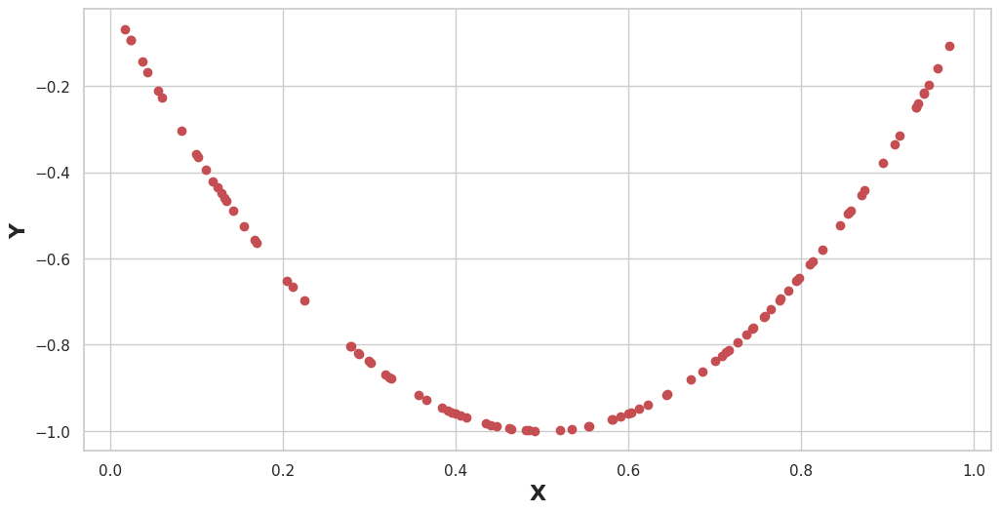

In [3]:
# Genero los puntos
x = np.random.uniform(0, 1, 100)
y = [4 * i * (i - 1) for i in x]

# ploteo
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(x, y, 'or')
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

Divido en training y validation set usando train_test_split de sklearn usando 1/3 de puntos como validation

In [4]:
from sklearn.model_selection import train_test_split

In [5]:
X_train, X_validation, y_train, y_validation = train_test_split(
    x, y, test_size=0.33, random_state=42
)

Usamos [Sequential](https://keras.io/api/models/sequential/) de keras para definir un modelo tipo stack de capas: vamos a usar ahora solo capas tipo [Dense](https://keras.io/api/layers/core_layers/dense/)

In [6]:
from keras.models import Sequential
from keras.layers import Dense, Dropout

Usamos para regresiones como activación de la última capa un función de tipo lineal

In [7]:
model = Sequential()
model.add(Dense(3, input_dim=1, activation='tanh'))
model.add(Dense(1, activation='linear'))

Luego de definir todas las capas tenemos que compilar el modelo para definir la función de pérdida, el optimizador y la métrica. Esto es necesario para poder después entrenar el modelo.

In [8]:
model.compile(
    loss='mean_squared_error', optimizer="SGD", metrics=['mean_squared_error']
)

Vamos a guardar el [.fit ](https://keras.io/api/models/model_training_apis/) del modelo en una variable para después plotear el aprendizaje. Podemos pasar como parámetros el set de validación para ir evaluando en cada paso del entrenamiento, además de evaluar el de entrenamiento. Podemos cambiar la cantidad de información que nos muestra con verbose y además tenemos que decirle la cantidad de épocas que queremos entrenar.

In [9]:
history = model.fit(
    np.array(X_train),
    np.array(y_train),
    epochs=200,
    verbose=2,
    validation_data=(X_validation, np.array(y_validation)),
)

Train on 67 samples, validate on 33 samples
Epoch 1/200
 - 0s - loss: 0.3928 - mean_squared_error: 0.3928 - val_loss: 0.3352 - val_mean_squared_error: 0.3352


Epoch 2/200
 - 0s - loss: 0.3008 - mean_squared_error: 0.3008 - val_loss: 0.2579 - val_mean_squared_error: 0.2579


Epoch 3/200
 - 0s - loss: 0.2300 - mean_squared_error: 0.2300 - val_loss: 0.2064 - val_mean_squared_error: 0.2064


Epoch 4/200
 - 0s - loss: 0.1821 - mean_squared_error: 0.1821 - val_loss: 0.1657 - val_mean_squared_error: 0.1657


Epoch 5/200
 - 0s - loss: 0.1444 - mean_squared_error: 0.1444 - val_loss: 0.1370 - val_mean_squared_error: 0.1370


Epoch 6/200
 - 0s - loss: 0.1168 - mean_squared_error: 0.1168 - val_loss: 0.1180 - val_mean_squared_error: 0.1180


Epoch 7/200
 - 0s - loss: 0.0984 - mean_squared_error: 0.0984 - val_loss: 0.1102 - val_mean_squared_error: 0.1102


Epoch 8/200
 - 0s - loss: 0.0907 - mean_squared_error: 0.0907 - val_loss: 0.1051 - val_mean_squared_error: 0.1051


Epoch 9/200
 - 0s - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


Epoch 10/200
 - 0s - loss: 0.0810 - mean_squared_error: 0.0810 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 11/200
 - 0s - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.0994 - val_mean_squared_error: 0.0994


Epoch 12/200
 - 0s - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 13/200
 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 14/200
 - 0s - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.0983 - val_mean_squared_error: 0.0983


Epoch 15/200
 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 16/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 17/200
 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0982 - val_mean_squared_error: 0.0982


Epoch 18/200


 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 19/200
 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.0978 - val_mean_squared_error: 0.0978


Epoch 20/200
 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0977 - val_mean_squared_error: 0.0977


Epoch 21/200
 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0978 - val_mean_squared_error: 0.0978


Epoch 22/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0982 - val_mean_squared_error: 0.0982


Epoch 23/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0979 - val_mean_squared_error: 0.0979


Epoch 24/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 25/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0983 - val_mean_squared_error: 0.0983


Epoch 26/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0973 - val_mean_squared_error: 0.0973


Epoch 27/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 28/200
 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 29/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0972 - val_mean_squared_error: 0.0972


Epoch 30/200
 - 0s - loss: 0.0765 - mean_squared_error: 0.0765 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 31/200
 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0968 - val_mean_squared_error: 0.0968


Epoch 32/200


 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.0967 - val_mean_squared_error: 0.0967


Epoch 33/200
 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


Epoch 34/200


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0965 - val_mean_squared_error: 0.0965


Epoch 35/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0966 - val_mean_squared_error: 0.0966


Epoch 36/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0966 - val_mean_squared_error: 0.0966


Epoch 37/200
 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0973 - val_mean_squared_error: 0.0973


Epoch 38/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 39/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0976 - val_mean_squared_error: 0.0976


Epoch 40/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0975 - val_mean_squared_error: 0.0975


Epoch 41/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 42/200


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 43/200


 - 0s - loss: 0.0767 - mean_squared_error: 0.0767 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 44/200


 - 0s - loss: 0.0765 - mean_squared_error: 0.0765 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 45/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0972 - val_mean_squared_error: 0.0972


Epoch 46/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0973 - val_mean_squared_error: 0.0973


Epoch 47/200


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0967 - val_mean_squared_error: 0.0967


Epoch 48/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 49/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0962 - val_mean_squared_error: 0.0962


Epoch 50/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0962 - val_mean_squared_error: 0.0962


Epoch 51/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0961 - val_mean_squared_error: 0.0961


Epoch 52/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0957 - val_mean_squared_error: 0.0957


Epoch 53/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0959 - val_mean_squared_error: 0.0959


Epoch 54/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0960 - val_mean_squared_error: 0.0960


Epoch 55/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0963 - val_mean_squared_error: 0.0963


Epoch 56/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0962 - val_mean_squared_error: 0.0962


Epoch 57/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0972 - val_mean_squared_error: 0.0972


Epoch 58/200


 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.0966 - val_mean_squared_error: 0.0966


Epoch 59/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0965 - val_mean_squared_error: 0.0965


Epoch 60/200


 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0959 - val_mean_squared_error: 0.0959


Epoch 61/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0959 - val_mean_squared_error: 0.0959


Epoch 62/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0960 - val_mean_squared_error: 0.0960


Epoch 63/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


Epoch 64/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0954 - val_mean_squared_error: 0.0954


Epoch 65/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0957 - val_mean_squared_error: 0.0957


Epoch 66/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0959 - val_mean_squared_error: 0.0959


Epoch 67/200
 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0958 - val_mean_squared_error: 0.0958


Epoch 68/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0965 - val_mean_squared_error: 0.0965


Epoch 69/200
 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


Epoch 70/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


Epoch 71/200
 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0952 - val_mean_squared_error: 0.0952


Epoch 72/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0951 - val_mean_squared_error: 0.0951


Epoch 73/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0955 - val_mean_squared_error: 0.0955


Epoch 74/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0953 - val_mean_squared_error: 0.0953


Epoch 75/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0960 - val_mean_squared_error: 0.0960


Epoch 76/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


Epoch 77/200


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0966 - val_mean_squared_error: 0.0966


Epoch 78/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 79/200


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0948 - val_mean_squared_error: 0.0948


Epoch 80/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0951 - val_mean_squared_error: 0.0951


Epoch 81/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0958 - val_mean_squared_error: 0.0958


Epoch 82/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 83/200


 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.0950 - val_mean_squared_error: 0.0950


Epoch 84/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0955 - val_mean_squared_error: 0.0955


Epoch 85/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


Epoch 86/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


Epoch 87/200


 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.0953 - val_mean_squared_error: 0.0953


Epoch 88/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0948 - val_mean_squared_error: 0.0948


Epoch 89/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0948 - val_mean_squared_error: 0.0948


Epoch 90/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0946 - val_mean_squared_error: 0.0946


Epoch 91/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0951 - val_mean_squared_error: 0.0951


Epoch 92/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0944 - val_mean_squared_error: 0.0944


Epoch 93/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0941 - val_mean_squared_error: 0.0941


Epoch 94/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0939 - val_mean_squared_error: 0.0939


Epoch 95/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0941 - val_mean_squared_error: 0.0941


Epoch 96/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 97/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0933 - val_mean_squared_error: 0.0933


Epoch 98/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 99/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 100/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0939 - val_mean_squared_error: 0.0939


Epoch 101/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0941 - val_mean_squared_error: 0.0941


Epoch 102/200
 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 103/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0937 - val_mean_squared_error: 0.0937


Epoch 104/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0931 - val_mean_squared_error: 0.0931


Epoch 105/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0937 - val_mean_squared_error: 0.0937


Epoch 106/200
 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 107/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0937 - val_mean_squared_error: 0.0937


Epoch 108/200
 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0927 - val_mean_squared_error: 0.0927


Epoch 109/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 110/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 111/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 112/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0939 - val_mean_squared_error: 0.0939


Epoch 113/200
 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0949 - val_mean_squared_error: 0.0949


Epoch 114/200


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0927 - val_mean_squared_error: 0.0927


Epoch 115/200
 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0932 - val_mean_squared_error: 0.0932


Epoch 116/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0932 - val_mean_squared_error: 0.0932


Epoch 117/200
 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 118/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0923 - val_mean_squared_error: 0.0923


Epoch 119/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 120/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 121/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 122/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0924 - val_mean_squared_error: 0.0924


Epoch 123/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 124/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0925 - val_mean_squared_error: 0.0925


Epoch 125/200
 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0934 - val_mean_squared_error: 0.0934


Epoch 126/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 127/200
 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 128/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0916 - val_mean_squared_error: 0.0916


Epoch 129/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 130/200
 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0914 - val_mean_squared_error: 0.0914


Epoch 131/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0914 - val_mean_squared_error: 0.0914


Epoch 132/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 133/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0916 - val_mean_squared_error: 0.0916


Epoch 134/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 135/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0916 - val_mean_squared_error: 0.0916


Epoch 136/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 137/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 138/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 139/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0927 - val_mean_squared_error: 0.0927


Epoch 140/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0923 - val_mean_squared_error: 0.0923


Epoch 141/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0923 - val_mean_squared_error: 0.0923


Epoch 142/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0928 - val_mean_squared_error: 0.0928


Epoch 143/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0933 - val_mean_squared_error: 0.0933


Epoch 144/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0935 - val_mean_squared_error: 0.0935


Epoch 145/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0939 - val_mean_squared_error: 0.0939


Epoch 146/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0932 - val_mean_squared_error: 0.0932


Epoch 147/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0926 - val_mean_squared_error: 0.0926


Epoch 148/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0927 - val_mean_squared_error: 0.0927


Epoch 149/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0923 - val_mean_squared_error: 0.0923


Epoch 150/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0921 - val_mean_squared_error: 0.0921


Epoch 151/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 152/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 153/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 154/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 155/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 156/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 157/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0921 - val_mean_squared_error: 0.0921


Epoch 158/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0923 - val_mean_squared_error: 0.0923


Epoch 159/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 160/200


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0921 - val_mean_squared_error: 0.0921


Epoch 161/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 162/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0921 - val_mean_squared_error: 0.0921


Epoch 163/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 164/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0923 - val_mean_squared_error: 0.0923


Epoch 165/200


 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0921 - val_mean_squared_error: 0.0921


Epoch 166/200
 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0916 - val_mean_squared_error: 0.0916


Epoch 167/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0916 - val_mean_squared_error: 0.0916


Epoch 168/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 169/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 170/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 171/200


 - 0s - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 172/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 173/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0939 - val_mean_squared_error: 0.0939


Epoch 174/200


 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0942 - val_mean_squared_error: 0.0942


Epoch 175/200


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0933 - val_mean_squared_error: 0.0933


Epoch 176/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 177/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0928 - val_mean_squared_error: 0.0928


Epoch 178/200
 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 179/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0916 - val_mean_squared_error: 0.0916


Epoch 180/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 181/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 182/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 183/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 184/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 185/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0912 - val_mean_squared_error: 0.0912


Epoch 186/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0907 - val_mean_squared_error: 0.0907


Epoch 187/200


 - 0s - loss: 0.0747 - mean_squared_error: 0.0747 - val_loss: 0.0908 - val_mean_squared_error: 0.0908


Epoch 188/200


 - 0s - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.0907 - val_mean_squared_error: 0.0907


Epoch 189/200


 - 0s - loss: 0.0747 - mean_squared_error: 0.0747 - val_loss: 0.0909 - val_mean_squared_error: 0.0909


Epoch 190/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0912 - val_mean_squared_error: 0.0912


Epoch 191/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0910 - val_mean_squared_error: 0.0910


Epoch 192/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0911 - val_mean_squared_error: 0.0911


Epoch 193/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 194/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 195/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0914 - val_mean_squared_error: 0.0914


Epoch 196/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0914 - val_mean_squared_error: 0.0914


Epoch 197/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 198/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0908 - val_mean_squared_error: 0.0908


Epoch 199/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0911 - val_mean_squared_error: 0.0911


Epoch 200/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0911 - val_mean_squared_error: 0.0911


Vemos el predict de los puntos de validación y ploteamos

In [10]:
pred = model.predict(X_validation)

Text(0, 0.5, 'Y')

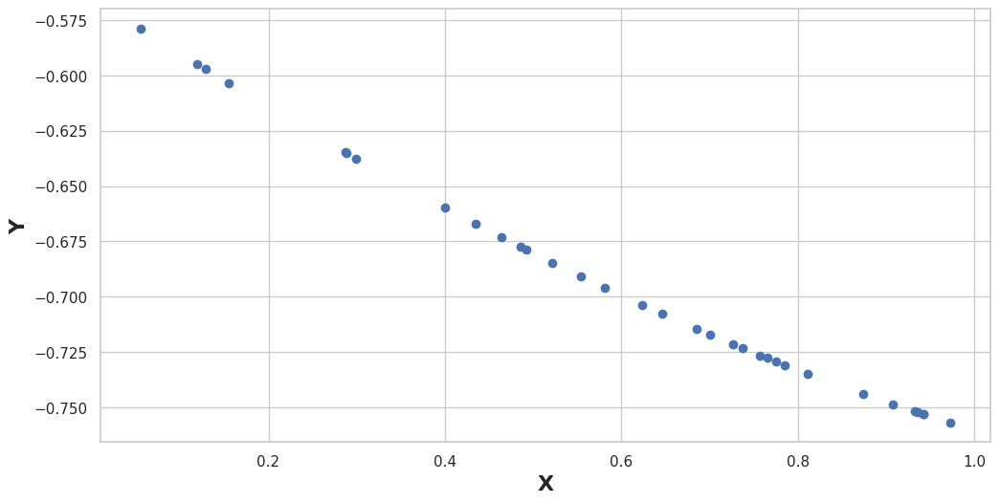

In [11]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(X_validation, pred, "ob", label="test")
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

Vemos que si bien aprendio parte del comportamiento de la función, podríamos intentar mejorar el aprendizaje.

`.history` del `.fit` es un JSON que tiene los valores impresos durante el entramiento(métricas y loss)

In [12]:
history.history

{'val_loss': [0.33516581918141153,
  0.2579188942062584,
  0.20638495792721215,
  0.16571864367208697,
  0.13695981759916653,
  0.11798742046636163,
  0.11024715649810704,
  0.1051478697495027,
  0.10150821563420874,
  0.09952863734779936,
  0.09936256977644833,
  0.09908013926310973,
  0.09854705451112805,
  0.09831678122282028,
  0.09861208250125249,
  0.09860678084871986,
  0.09816556559367613,
  0.09870022693366716,
  0.09782373114968791,
  0.09766748615286568,
  0.0977941532478188,
  0.0982190165104288,
  0.09793795600081935,
  0.09847324860818459,
  0.09825093773278323,
  0.09734216558210777,
  0.09713870286941528,
  0.09710687218290387,
  0.09722497133594571,
  0.09711059137727275,
  0.09679067134857178,
  0.09669943605408524,
  0.09642921749389533,
  0.09647784991697832,
  0.09664324309789774,
  0.09657296538352966,
  0.09731684399373604,
  0.09711210294203325,
  0.09755302762443369,
  0.09745719712792021,
  0.09870068774078831,
  0.09880773587660356,
  0.09882734964291255,
  0

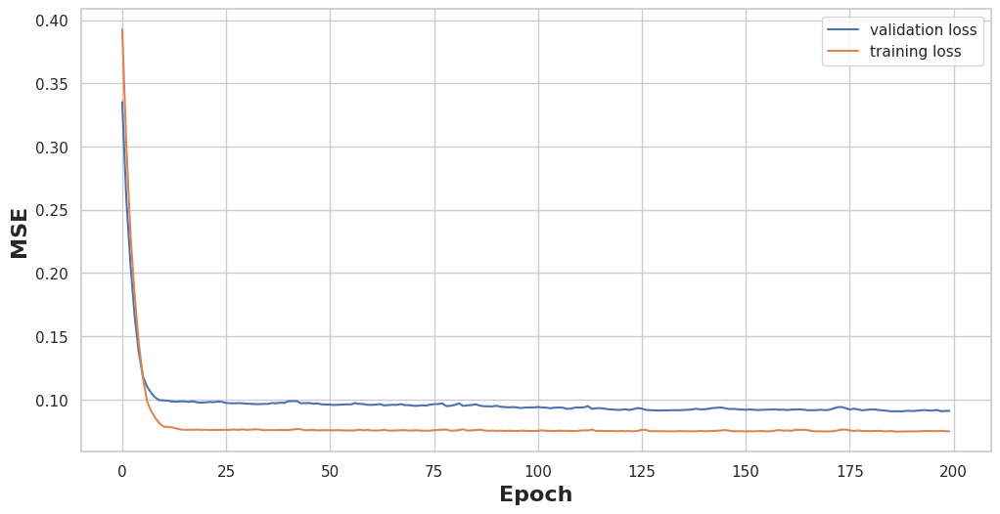

In [13]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(history.history["val_loss"], label="validation loss")
plt.plot(history.history["loss"], label="training loss")
plt.xlabel("Epoch", weight="bold", fontsize=16)
plt.ylabel("MSE", weight="bold", fontsize=16)
plt.legend()

In [14]:
model = Sequential()
model.add(Dense(3, input_dim=1, activation='tanh'))
model.add(Dense(1, activation='linear'))

In [15]:
opt = keras.optimizers.SGD(lr=0.1)
model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_squared_error'])

In [16]:
history = model.fit(
    np.array(X_train),
    np.array(y_train),
    epochs=500,
    verbose=2,
    validation_data=(X_validation, np.array(y_validation)),
)

Train on 67 samples, validate on 33 samples
Epoch 1/500
 - 0s - loss: 0.6947 - mean_squared_error: 0.6947 - val_loss: 0.0788 - val_mean_squared_error: 0.0788


Epoch 2/500
 - 0s - loss: 0.1061 - mean_squared_error: 0.1061 - val_loss: 0.0879 - val_mean_squared_error: 0.0879


Epoch 3/500
 - 0s - loss: 0.1042 - mean_squared_error: 0.1042 - val_loss: 0.0850 - val_mean_squared_error: 0.0850


Epoch 4/500
 - 0s - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.1423 - val_mean_squared_error: 0.1423


Epoch 5/500
 - 0s - loss: 0.1205 - mean_squared_error: 0.1205 - val_loss: 0.0969 - val_mean_squared_error: 0.0969


Epoch 6/500
 - 0s - loss: 0.0939 - mean_squared_error: 0.0939 - val_loss: 0.0912 - val_mean_squared_error: 0.0912


Epoch 7/500
 - 0s - loss: 0.0867 - mean_squared_error: 0.0867 - val_loss: 0.1344 - val_mean_squared_error: 0.1344


Epoch 8/500
 - 0s - loss: 0.0976 - mean_squared_error: 0.0976 - val_loss: 0.1163 - val_mean_squared_error: 0.1163


Epoch 9/500
 - 0s - loss: 0.0972 - mean_squared_error: 0.0972 - val_loss: 0.0954 - val_mean_squared_error: 0.0954


Epoch 10/500
 - 0s - loss: 0.0844 - mean_squared_error: 0.0844 - val_loss: 0.1057 - val_mean_squared_error: 0.1057


Epoch 11/500
 - 0s - loss: 0.0950 - mean_squared_error: 0.0950 - val_loss: 0.1175 - val_mean_squared_error: 0.1175


Epoch 12/500
 - 0s - loss: 0.0934 - mean_squared_error: 0.0934 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 13/500
 - 0s - loss: 0.0866 - mean_squared_error: 0.0866 - val_loss: 0.0866 - val_mean_squared_error: 0.0866


Epoch 14/500
 - 0s - loss: 0.0799 - mean_squared_error: 0.0799 - val_loss: 0.1017 - val_mean_squared_error: 0.1017


Epoch 15/500
 - 0s - loss: 0.0930 - mean_squared_error: 0.0930 - val_loss: 0.1098 - val_mean_squared_error: 0.1098


Epoch 16/500
 - 0s - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 17/500
 - 0s - loss: 0.0806 - mean_squared_error: 0.0806 - val_loss: 0.0924 - val_mean_squared_error: 0.0924


Epoch 18/500
 - 0s - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 0.0997 - val_mean_squared_error: 0.0997


Epoch 19/500


 - 0s - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.1279 - val_mean_squared_error: 0.1279


Epoch 20/500
 - 0s - loss: 0.0942 - mean_squared_error: 0.0942 - val_loss: 0.1029 - val_mean_squared_error: 0.1029


Epoch 21/500
 - 0s - loss: 0.0829 - mean_squared_error: 0.0829 - val_loss: 0.1029 - val_mean_squared_error: 0.1029


Epoch 22/500
 - 0s - loss: 0.0788 - mean_squared_error: 0.0788 - val_loss: 0.1539 - val_mean_squared_error: 0.1539


Epoch 23/500
 - 0s - loss: 0.1069 - mean_squared_error: 0.1069 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 24/500
 - 0s - loss: 0.0810 - mean_squared_error: 0.0810 - val_loss: 0.1053 - val_mean_squared_error: 0.1053


Epoch 25/500
 - 0s - loss: 0.0866 - mean_squared_error: 0.0866 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 26/500
 - 0s - loss: 0.0790 - mean_squared_error: 0.0790 - val_loss: 0.1151 - val_mean_squared_error: 0.1151


Epoch 27/500
 - 0s - loss: 0.0884 - mean_squared_error: 0.0884 - val_loss: 0.0973 - val_mean_squared_error: 0.0973


Epoch 28/500
 - 0s - loss: 0.0802 - mean_squared_error: 0.0802 - val_loss: 0.1128 - val_mean_squared_error: 0.1128


Epoch 29/500
 - 0s - loss: 0.0893 - mean_squared_error: 0.0893 - val_loss: 0.1191 - val_mean_squared_error: 0.1191


Epoch 30/500


 - 0s - loss: 0.0931 - mean_squared_error: 0.0931 - val_loss: 0.1177 - val_mean_squared_error: 0.1177


Epoch 31/500


 - 0s - loss: 0.0912 - mean_squared_error: 0.0912 - val_loss: 0.1397 - val_mean_squared_error: 0.1397


Epoch 32/500
 - 0s - loss: 0.1036 - mean_squared_error: 0.1036 - val_loss: 0.1184 - val_mean_squared_error: 0.1184


Epoch 33/500
 - 0s - loss: 0.0890 - mean_squared_error: 0.0890 - val_loss: 0.1025 - val_mean_squared_error: 0.1025


Epoch 34/500


 - 0s - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 35/500


 - 0s - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.0980 - val_mean_squared_error: 0.0980


Epoch 36/500
 - 0s - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.0959 - val_mean_squared_error: 0.0959


Epoch 37/500
 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.0966 - val_mean_squared_error: 0.0966


Epoch 38/500


 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1216 - val_mean_squared_error: 0.1216


Epoch 39/500
 - 0s - loss: 0.0872 - mean_squared_error: 0.0872 - val_loss: 0.0979 - val_mean_squared_error: 0.0979


Epoch 40/500
 - 0s - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.0967 - val_mean_squared_error: 0.0967


Epoch 41/500
 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.1309 - val_mean_squared_error: 0.1309


Epoch 42/500


 - 0s - loss: 0.0973 - mean_squared_error: 0.0973 - val_loss: 0.0927 - val_mean_squared_error: 0.0927


Epoch 43/500


 - 0s - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 44/500


 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.1033 - val_mean_squared_error: 0.1033


Epoch 45/500


 - 0s - loss: 0.0828 - mean_squared_error: 0.0828 - val_loss: 0.0940 - val_mean_squared_error: 0.0940


Epoch 46/500


 - 0s - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.1018 - val_mean_squared_error: 0.1018


Epoch 47/500


 - 0s - loss: 0.0811 - mean_squared_error: 0.0811 - val_loss: 0.1257 - val_mean_squared_error: 0.1257


Epoch 48/500


 - 0s - loss: 0.0959 - mean_squared_error: 0.0959 - val_loss: 0.0953 - val_mean_squared_error: 0.0953


Epoch 49/500


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1005 - val_mean_squared_error: 0.1005


Epoch 50/500


 - 0s - loss: 0.0827 - mean_squared_error: 0.0827 - val_loss: 0.0936 - val_mean_squared_error: 0.0936


Epoch 51/500


 - 0s - loss: 0.0806 - mean_squared_error: 0.0806 - val_loss: 0.0930 - val_mean_squared_error: 0.0930


Epoch 52/500


 - 0s - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.0996 - val_mean_squared_error: 0.0996


Epoch 53/500


 - 0s - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 54/500


 - 0s - loss: 0.0821 - mean_squared_error: 0.0821 - val_loss: 0.0925 - val_mean_squared_error: 0.0925


Epoch 55/500


 - 0s - loss: 0.0768 - mean_squared_error: 0.0768 - val_loss: 0.0953 - val_mean_squared_error: 0.0953


Epoch 56/500


 - 0s - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.1002 - val_mean_squared_error: 0.1002


Epoch 57/500


 - 0s - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.1137 - val_mean_squared_error: 0.1137


Epoch 58/500


 - 0s - loss: 0.0905 - mean_squared_error: 0.0905 - val_loss: 0.0933 - val_mean_squared_error: 0.0933


Epoch 59/500


 - 0s - loss: 0.0794 - mean_squared_error: 0.0794 - val_loss: 0.0902 - val_mean_squared_error: 0.0902


Epoch 60/500
 - 0s - loss: 0.0782 - mean_squared_error: 0.0782 - val_loss: 0.1045 - val_mean_squared_error: 0.1045


Epoch 61/500


 - 0s - loss: 0.0844 - mean_squared_error: 0.0844 - val_loss: 0.0903 - val_mean_squared_error: 0.0903


Epoch 62/500


 - 0s - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.1089 - val_mean_squared_error: 0.1089


Epoch 63/500


 - 0s - loss: 0.0874 - mean_squared_error: 0.0874 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 64/500


 - 0s - loss: 0.0790 - mean_squared_error: 0.0790 - val_loss: 0.1052 - val_mean_squared_error: 0.1052


Epoch 65/500


 - 0s - loss: 0.0853 - mean_squared_error: 0.0853 - val_loss: 0.0906 - val_mean_squared_error: 0.0906


Epoch 66/500


 - 0s - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1290 - val_mean_squared_error: 0.1290


Epoch 67/500


 - 0s - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1174 - val_mean_squared_error: 0.1174


Epoch 68/500
 - 0s - loss: 0.0942 - mean_squared_error: 0.0942 - val_loss: 0.1102 - val_mean_squared_error: 0.1102


Epoch 69/500


 - 0s - loss: 0.0946 - mean_squared_error: 0.0946 - val_loss: 0.0994 - val_mean_squared_error: 0.0994


Epoch 70/500


 - 0s - loss: 0.0881 - mean_squared_error: 0.0881 - val_loss: 0.1097 - val_mean_squared_error: 0.1097


Epoch 71/500


 - 0s - loss: 0.0892 - mean_squared_error: 0.0892 - val_loss: 0.0869 - val_mean_squared_error: 0.0869


Epoch 72/500
 - 0s - loss: 0.0801 - mean_squared_error: 0.0801 - val_loss: 0.1067 - val_mean_squared_error: 0.1067


Epoch 73/500


 - 0s - loss: 0.0863 - mean_squared_error: 0.0863 - val_loss: 0.0910 - val_mean_squared_error: 0.0910


Epoch 74/500
 - 0s - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.0949 - val_mean_squared_error: 0.0949


Epoch 75/500


 - 0s - loss: 0.0847 - mean_squared_error: 0.0847 - val_loss: 0.1114 - val_mean_squared_error: 0.1114


Epoch 76/500


 - 0s - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.0935 - val_mean_squared_error: 0.0935


Epoch 77/500
 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1319 - val_mean_squared_error: 0.1319


Epoch 78/500


 - 0s - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.0933 - val_mean_squared_error: 0.0933


Epoch 79/500


 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.0932 - val_mean_squared_error: 0.0932


Epoch 80/500


 - 0s - loss: 0.0771 - mean_squared_error: 0.0771 - val_loss: 0.1140 - val_mean_squared_error: 0.1140


Epoch 81/500


 - 0s - loss: 0.0873 - mean_squared_error: 0.0873 - val_loss: 0.0933 - val_mean_squared_error: 0.0933


Epoch 82/500


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.0950 - val_mean_squared_error: 0.0950


Epoch 83/500
 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1041 - val_mean_squared_error: 0.1041


Epoch 84/500


 - 0s - loss: 0.0810 - mean_squared_error: 0.0810 - val_loss: 0.1238 - val_mean_squared_error: 0.1238


Epoch 85/500


 - 0s - loss: 0.0891 - mean_squared_error: 0.0891 - val_loss: 0.1109 - val_mean_squared_error: 0.1109


Epoch 86/500


 - 0s - loss: 0.0822 - mean_squared_error: 0.0822 - val_loss: 0.0936 - val_mean_squared_error: 0.0936


Epoch 87/500
 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.1074 - val_mean_squared_error: 0.1074


Epoch 88/500
 - 0s - loss: 0.0843 - mean_squared_error: 0.0843 - val_loss: 0.1252 - val_mean_squared_error: 0.1252


Epoch 89/500
 - 0s - loss: 0.0908 - mean_squared_error: 0.0908 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


Epoch 90/500


 - 0s - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.1003 - val_mean_squared_error: 0.1003


Epoch 91/500


 - 0s - loss: 0.0813 - mean_squared_error: 0.0813 - val_loss: 0.0941 - val_mean_squared_error: 0.0941


Epoch 92/500


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1110 - val_mean_squared_error: 0.1110


Epoch 93/500


 - 0s - loss: 0.0830 - mean_squared_error: 0.0830 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 94/500
 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.1080 - val_mean_squared_error: 0.1080


Epoch 95/500


 - 0s - loss: 0.0811 - mean_squared_error: 0.0811 - val_loss: 0.1255 - val_mean_squared_error: 0.1255


Epoch 96/500


 - 0s - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.0966 - val_mean_squared_error: 0.0966


Epoch 97/500


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1238 - val_mean_squared_error: 0.1238


Epoch 98/500


 - 0s - loss: 0.0935 - mean_squared_error: 0.0935 - val_loss: 0.0974 - val_mean_squared_error: 0.0974


Epoch 99/500


 - 0s - loss: 0.0810 - mean_squared_error: 0.0810 - val_loss: 0.0951 - val_mean_squared_error: 0.0951


Epoch 100/500


 - 0s - loss: 0.0771 - mean_squared_error: 0.0771 - val_loss: 0.1138 - val_mean_squared_error: 0.1138


Epoch 101/500


 - 0s - loss: 0.0922 - mean_squared_error: 0.0922 - val_loss: 0.1000 - val_mean_squared_error: 0.1000


Epoch 102/500


 - 0s - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.1024 - val_mean_squared_error: 0.1024


Epoch 103/500


 - 0s - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0934 - val_mean_squared_error: 0.0934


Epoch 104/500


 - 0s - loss: 0.0771 - mean_squared_error: 0.0771 - val_loss: 0.0932 - val_mean_squared_error: 0.0932


Epoch 105/500


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0936 - val_mean_squared_error: 0.0936


Epoch 106/500


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 107/500


 - 0s - loss: 0.0809 - mean_squared_error: 0.0809 - val_loss: 0.1057 - val_mean_squared_error: 0.1057


Epoch 108/500


 - 0s - loss: 0.0932 - mean_squared_error: 0.0932 - val_loss: 0.0924 - val_mean_squared_error: 0.0924


Epoch 109/500


 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.1028 - val_mean_squared_error: 0.1028


Epoch 110/500


 - 0s - loss: 0.0846 - mean_squared_error: 0.0846 - val_loss: 0.1075 - val_mean_squared_error: 0.1075


Epoch 111/500


 - 0s - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 112/500


 - 0s - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.0900 - val_mean_squared_error: 0.0900


Epoch 113/500


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 114/500


 - 0s - loss: 0.0798 - mean_squared_error: 0.0798 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


Epoch 115/500


 - 0s - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


Epoch 116/500


 - 0s - loss: 0.0823 - mean_squared_error: 0.0823 - val_loss: 0.1030 - val_mean_squared_error: 0.1030


Epoch 117/500


 - 0s - loss: 0.0838 - mean_squared_error: 0.0838 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 118/500


 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1340 - val_mean_squared_error: 0.1340


Epoch 119/500
 - 0s - loss: 0.0985 - mean_squared_error: 0.0985 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 120/500


 - 0s - loss: 0.0768 - mean_squared_error: 0.0768 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 121/500


 - 0s - loss: 0.0768 - mean_squared_error: 0.0768 - val_loss: 0.0930 - val_mean_squared_error: 0.0930


Epoch 122/500


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.1084 - val_mean_squared_error: 0.1084


Epoch 123/500


 - 0s - loss: 0.0954 - mean_squared_error: 0.0954 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 124/500


 - 0s - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.0897 - val_mean_squared_error: 0.0897


Epoch 125/500


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0939 - val_mean_squared_error: 0.0939


Epoch 126/500


 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.1063 - val_mean_squared_error: 0.1063


Epoch 127/500


 - 0s - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.0954 - val_mean_squared_error: 0.0954


Epoch 128/500


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1068 - val_mean_squared_error: 0.1068


Epoch 129/500


 - 0s - loss: 0.0807 - mean_squared_error: 0.0807 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 130/500


 - 0s - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 131/500


 - 0s - loss: 0.0814 - mean_squared_error: 0.0814 - val_loss: 0.1155 - val_mean_squared_error: 0.1155


Epoch 132/500


 - 0s - loss: 0.0905 - mean_squared_error: 0.0905 - val_loss: 0.1135 - val_mean_squared_error: 0.1135


Epoch 133/500


 - 0s - loss: 0.0886 - mean_squared_error: 0.0886 - val_loss: 0.0925 - val_mean_squared_error: 0.0925


Epoch 134/500


 - 0s - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1028 - val_mean_squared_error: 0.1028


Epoch 135/500


 - 0s - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.1078 - val_mean_squared_error: 0.1078


Epoch 136/500


 - 0s - loss: 0.0801 - mean_squared_error: 0.0801 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 137/500


 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.0984 - val_mean_squared_error: 0.0984


Epoch 138/500


 - 0s - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.1020 - val_mean_squared_error: 0.1020


Epoch 139/500


 - 0s - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.1030 - val_mean_squared_error: 0.1030


Epoch 140/500


 - 0s - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 141/500


 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.1001 - val_mean_squared_error: 0.1001


Epoch 142/500


 - 0s - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.1254 - val_mean_squared_error: 0.1254


Epoch 143/500


 - 0s - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


Epoch 144/500


 - 0s - loss: 0.0802 - mean_squared_error: 0.0802 - val_loss: 0.1023 - val_mean_squared_error: 0.1023


Epoch 145/500


 - 0s - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1043 - val_mean_squared_error: 0.1043


Epoch 146/500


 - 0s - loss: 0.0798 - mean_squared_error: 0.0798 - val_loss: 0.1080 - val_mean_squared_error: 0.1080


Epoch 147/500


 - 0s - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1032 - val_mean_squared_error: 0.1032


Epoch 148/500


 - 0s - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.0949 - val_mean_squared_error: 0.0949


Epoch 149/500


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.1058 - val_mean_squared_error: 0.1058


Epoch 150/500
 - 0s - loss: 0.0781 - mean_squared_error: 0.0781 - val_loss: 0.0937 - val_mean_squared_error: 0.0937


Epoch 151/500


 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


Epoch 152/500


 - 0s - loss: 0.0817 - mean_squared_error: 0.0817 - val_loss: 0.0942 - val_mean_squared_error: 0.0942


Epoch 153/500


 - 0s - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.1391 - val_mean_squared_error: 0.1391


Epoch 154/500


 - 0s - loss: 0.0956 - mean_squared_error: 0.0956 - val_loss: 0.1120 - val_mean_squared_error: 0.1120


Epoch 155/500
 - 0s - loss: 0.0822 - mean_squared_error: 0.0822 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


Epoch 156/500


 - 0s - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.1216 - val_mean_squared_error: 0.1216


Epoch 157/500


 - 0s - loss: 0.0881 - mean_squared_error: 0.0881 - val_loss: 0.1406 - val_mean_squared_error: 0.1406


Epoch 158/500
 - 0s - loss: 0.1064 - mean_squared_error: 0.1064 - val_loss: 0.1045 - val_mean_squared_error: 0.1045


Epoch 159/500


 - 0s - loss: 0.0788 - mean_squared_error: 0.0788 - val_loss: 0.0926 - val_mean_squared_error: 0.0926


Epoch 160/500


 - 0s - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.0937 - val_mean_squared_error: 0.0937


Epoch 161/500


 - 0s - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.0999 - val_mean_squared_error: 0.0999


Epoch 162/500


 - 0s - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1279 - val_mean_squared_error: 0.1279


Epoch 163/500
 - 0s - loss: 0.0893 - mean_squared_error: 0.0893 - val_loss: 0.0950 - val_mean_squared_error: 0.0950


Epoch 164/500


 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0952 - val_mean_squared_error: 0.0952


Epoch 165/500


 - 0s - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.0957 - val_mean_squared_error: 0.0957


Epoch 166/500


 - 0s - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.0963 - val_mean_squared_error: 0.0963


Epoch 167/500


 - 0s - loss: 0.0765 - mean_squared_error: 0.0765 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 168/500


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1036 - val_mean_squared_error: 0.1036


Epoch 169/500


 - 0s - loss: 0.0867 - mean_squared_error: 0.0867 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


Epoch 170/500


 - 0s - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 171/500


 - 0s - loss: 0.0783 - mean_squared_error: 0.0783 - val_loss: 0.1026 - val_mean_squared_error: 0.1026


Epoch 172/500


 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.1266 - val_mean_squared_error: 0.1266


Epoch 173/500


 - 0s - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1028 - val_mean_squared_error: 0.1028


Epoch 174/500


 - 0s - loss: 0.0799 - mean_squared_error: 0.0799 - val_loss: 0.0951 - val_mean_squared_error: 0.0951


Epoch 175/500


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 176/500


 - 0s - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.0955 - val_mean_squared_error: 0.0955


Epoch 177/500


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.1216 - val_mean_squared_error: 0.1216


Epoch 178/500


 - 0s - loss: 0.0853 - mean_squared_error: 0.0853 - val_loss: 0.0913 - val_mean_squared_error: 0.0913


Epoch 179/500


 - 0s - loss: 0.0736 - mean_squared_error: 0.0736 - val_loss: 0.0914 - val_mean_squared_error: 0.0914


Epoch 180/500


 - 0s - loss: 0.0726 - mean_squared_error: 0.0726 - val_loss: 0.0926 - val_mean_squared_error: 0.0926


Epoch 181/500


 - 0s - loss: 0.0742 - mean_squared_error: 0.0742 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 182/500


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.1582 - val_mean_squared_error: 0.1582


Epoch 183/500
 - 0s - loss: 0.1106 - mean_squared_error: 0.1106 - val_loss: 0.1037 - val_mean_squared_error: 0.1037


Epoch 184/500


 - 0s - loss: 0.0804 - mean_squared_error: 0.0804 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 185/500


 - 0s - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.0849 - val_mean_squared_error: 0.0849


Epoch 186/500
 - 0s - loss: 0.0738 - mean_squared_error: 0.0738 - val_loss: 0.0861 - val_mean_squared_error: 0.0861


Epoch 187/500


 - 0s - loss: 0.0737 - mean_squared_error: 0.0737 - val_loss: 0.1300 - val_mean_squared_error: 0.1300


Epoch 188/500


 - 0s - loss: 0.1007 - mean_squared_error: 0.1007 - val_loss: 0.0943 - val_mean_squared_error: 0.0943


Epoch 189/500


 - 0s - loss: 0.0838 - mean_squared_error: 0.0838 - val_loss: 0.0871 - val_mean_squared_error: 0.0871


Epoch 190/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.0877 - val_mean_squared_error: 0.0877


Epoch 191/500


 - 0s - loss: 0.0747 - mean_squared_error: 0.0747 - val_loss: 0.0949 - val_mean_squared_error: 0.0949


Epoch 192/500


 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.1041 - val_mean_squared_error: 0.1041


Epoch 193/500


 - 0s - loss: 0.0810 - mean_squared_error: 0.0810 - val_loss: 0.0924 - val_mean_squared_error: 0.0924


Epoch 194/500


 - 0s - loss: 0.0733 - mean_squared_error: 0.0733 - val_loss: 0.1319 - val_mean_squared_error: 0.1319


Epoch 195/500


 - 0s - loss: 0.0986 - mean_squared_error: 0.0986 - val_loss: 0.0883 - val_mean_squared_error: 0.0883


Epoch 196/500


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0852 - val_mean_squared_error: 0.0852


Epoch 197/500


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0849 - val_mean_squared_error: 0.0849


Epoch 198/500


 - 0s - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.0840 - val_mean_squared_error: 0.0840


Epoch 199/500


 - 0s - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0860 - val_mean_squared_error: 0.0860


Epoch 200/500


 - 0s - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.0936 - val_mean_squared_error: 0.0936


Epoch 201/500


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0868 - val_mean_squared_error: 0.0868


Epoch 202/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.0834 - val_mean_squared_error: 0.0834


Epoch 203/500


 - 0s - loss: 0.0729 - mean_squared_error: 0.0729 - val_loss: 0.0860 - val_mean_squared_error: 0.0860


Epoch 204/500

 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.0884 - val_mean_squared_error: 0.0884


Epoch 205/500


 - 0s - loss: 0.0735 - mean_squared_error: 0.0735 - val_loss: 0.0842 - val_mean_squared_error: 0.0842


Epoch 206/500


 - 0s - loss: 0.0712 - mean_squared_error: 0.0712 - val_loss: 0.0843 - val_mean_squared_error: 0.0843


Epoch 207/500


 - 0s - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.0890 - val_mean_squared_error: 0.0890


Epoch 208/500


 - 0s - loss: 0.0733 - mean_squared_error: 0.0733 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 209/500


 - 0s - loss: 0.0802 - mean_squared_error: 0.0802 - val_loss: 0.0863 - val_mean_squared_error: 0.0863


Epoch 210/500


 - 0s - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1197 - val_mean_squared_error: 0.1197


Epoch 211/500


 - 0s - loss: 0.0891 - mean_squared_error: 0.0891 - val_loss: 0.0847 - val_mean_squared_error: 0.0847


Epoch 212/500


 - 0s - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0835 - val_mean_squared_error: 0.0835


Epoch 213/500

 - 0s - loss: 0.0701 - mean_squared_error: 0.0701 - val_loss: 0.1195 - val_mean_squared_error: 0.1195


Epoch 214/500


 - 0s - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 215/500


 - 0s - loss: 0.0704 - mean_squared_error: 0.0704 - val_loss: 0.1085 - val_mean_squared_error: 0.1085


Epoch 216/500
 - 0s - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.0841 - val_mean_squared_error: 0.0841


Epoch 217/500


 - 0s - loss: 0.0700 - mean_squared_error: 0.0700 - val_loss: 0.0841 - val_mean_squared_error: 0.0841


Epoch 218/500


 - 0s - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 219/500


 - 0s - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0868 - val_mean_squared_error: 0.0868


Epoch 220/500
 - 0s - loss: 0.0719 - mean_squared_error: 0.0719 - val_loss: 0.0981 - val_mean_squared_error: 0.0981


Epoch 221/500


 - 0s - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.0878 - val_mean_squared_error: 0.0878


Epoch 222/500

 - 0s - loss: 0.0730 - mean_squared_error: 0.0730 - val_loss: 0.0799 - val_mean_squared_error: 0.0799


Epoch 223/500


 - 0s - loss: 0.0695 - mean_squared_error: 0.0695 - val_loss: 0.0819 - val_mean_squared_error: 0.0819


Epoch 224/500


 - 0s - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.0845 - val_mean_squared_error: 0.0845


Epoch 225/500


 - 0s - loss: 0.0715 - mean_squared_error: 0.0715 - val_loss: 0.0864 - val_mean_squared_error: 0.0864


Epoch 226/500
 - 0s - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.0856 - val_mean_squared_error: 0.0856


Epoch 227/500


 - 0s - loss: 0.0722 - mean_squared_error: 0.0722 - val_loss: 0.0892 - val_mean_squared_error: 0.0892


Epoch 228/500


 - 0s - loss: 0.0719 - mean_squared_error: 0.0719 - val_loss: 0.0870 - val_mean_squared_error: 0.0870


Epoch 229/500


 - 0s - loss: 0.0733 - mean_squared_error: 0.0733 - val_loss: 0.0818 - val_mean_squared_error: 0.0818


Epoch 230/500


 - 0s - loss: 0.0689 - mean_squared_error: 0.0689 - val_loss: 0.0815 - val_mean_squared_error: 0.0815


Epoch 231/500


 - 0s - loss: 0.0682 - mean_squared_error: 0.0682 - val_loss: 0.0963 - val_mean_squared_error: 0.0963


Epoch 232/500


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0857 - val_mean_squared_error: 0.0857


Epoch 233/500


 - 0s - loss: 0.0718 - mean_squared_error: 0.0718 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 234/500


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0825 - val_mean_squared_error: 0.0825


Epoch 235/500


 - 0s - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.0894 - val_mean_squared_error: 0.0894


Epoch 236/500


 - 0s - loss: 0.0730 - mean_squared_error: 0.0730 - val_loss: 0.0872 - val_mean_squared_error: 0.0872


Epoch 237/500


 - 0s - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.0907 - val_mean_squared_error: 0.0907


Epoch 238/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.0994 - val_mean_squared_error: 0.0994


Epoch 239/500


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0822 - val_mean_squared_error: 0.0822


Epoch 240/500

 - 0s - loss: 0.0667 - mean_squared_error: 0.0667 - val_loss: 0.0892 - val_mean_squared_error: 0.0892


Epoch 241/500


 - 0s - loss: 0.0693 - mean_squared_error: 0.0693 - val_loss: 0.0872 - val_mean_squared_error: 0.0872


Epoch 242/500

 - 0s - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.0905 - val_mean_squared_error: 0.0905


Epoch 243/500


 - 0s - loss: 0.0711 - mean_squared_error: 0.0711 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 244/500


 - 0s - loss: 0.0708 - mean_squared_error: 0.0708 - val_loss: 0.0974 - val_mean_squared_error: 0.0974


Epoch 245/500


 - 0s - loss: 0.0697 - mean_squared_error: 0.0697 - val_loss: 0.0875 - val_mean_squared_error: 0.0875


Epoch 246/500
 - 0s - loss: 0.0692 - mean_squared_error: 0.0692 - val_loss: 0.0884 - val_mean_squared_error: 0.0884


Epoch 247/500
 - 0s - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.0842 - val_mean_squared_error: 0.0842


Epoch 248/500


 - 0s - loss: 0.0660 - mean_squared_error: 0.0660 - val_loss: 0.0872 - val_mean_squared_error: 0.0872


Epoch 249/500


 - 0s - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.1254 - val_mean_squared_error: 0.1254


Epoch 250/500


 - 0s - loss: 0.0934 - mean_squared_error: 0.0934 - val_loss: 0.0843 - val_mean_squared_error: 0.0843


Epoch 251/500


 - 0s - loss: 0.0681 - mean_squared_error: 0.0681 - val_loss: 0.0829 - val_mean_squared_error: 0.0829


Epoch 252/500


 - 0s - loss: 0.0662 - mean_squared_error: 0.0662 - val_loss: 0.0834 - val_mean_squared_error: 0.0834


Epoch 253/500


 - 0s - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.0779 - val_mean_squared_error: 0.0779


Epoch 254/500


 - 0s - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0794 - val_mean_squared_error: 0.0794


Epoch 255/500


 - 0s - loss: 0.0659 - mean_squared_error: 0.0659 - val_loss: 0.0795 - val_mean_squared_error: 0.0795


Epoch 256/500


 - 0s - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.0788 - val_mean_squared_error: 0.0788


Epoch 257/500


 - 0s - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.1026 - val_mean_squared_error: 0.1026


Epoch 258/500


 - 0s - loss: 0.0767 - mean_squared_error: 0.0767 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 259/500


 - 0s - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.0803 - val_mean_squared_error: 0.0803


Epoch 260/500


 - 0s - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0782 - val_mean_squared_error: 0.0782


Epoch 261/500

 - 0s - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0803 - val_mean_squared_error: 0.0803


Epoch 262/500


 - 0s - loss: 0.0658 - mean_squared_error: 0.0658 - val_loss: 0.0789 - val_mean_squared_error: 0.0789


Epoch 263/500


 - 0s - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.0809 - val_mean_squared_error: 0.0809


Epoch 264/500


 - 0s - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0807 - val_mean_squared_error: 0.0807


Epoch 265/500


 - 0s - loss: 0.0636 - mean_squared_error: 0.0636 - val_loss: 0.0793 - val_mean_squared_error: 0.0793


Epoch 266/500


 - 0s - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.0797 - val_mean_squared_error: 0.0797


Epoch 267/500


 - 0s - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0854 - val_mean_squared_error: 0.0854


Epoch 268/500
 - 0s - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.0780 - val_mean_squared_error: 0.0780


Epoch 269/500


 - 0s - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0860 - val_mean_squared_error: 0.0860


Epoch 270/500


 - 0s - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0846 - val_mean_squared_error: 0.0846


Epoch 271/500


 - 0s - loss: 0.0686 - mean_squared_error: 0.0686 - val_loss: 0.0775 - val_mean_squared_error: 0.0775


Epoch 272/500


 - 0s - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.0762 - val_mean_squared_error: 0.0762


Epoch 273/500


 - 0s - loss: 0.0616 - mean_squared_error: 0.0616 - val_loss: 0.0749 - val_mean_squared_error: 0.0749


Epoch 274/500


 - 0s - loss: 0.0616 - mean_squared_error: 0.0616 - val_loss: 0.0792 - val_mean_squared_error: 0.0792


Epoch 275/500


 - 0s - loss: 0.0627 - mean_squared_error: 0.0627 - val_loss: 0.0760 - val_mean_squared_error: 0.0760


Epoch 276/500


 - 0s - loss: 0.0639 - mean_squared_error: 0.0639 - val_loss: 0.0734 - val_mean_squared_error: 0.0734


Epoch 277/500
 - 0s - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0753 - val_mean_squared_error: 0.0753


Epoch 278/500
 - 0s - loss: 0.0618 - mean_squared_error: 0.0618 - val_loss: 0.0767 - val_mean_squared_error: 0.0767


Epoch 279/500


 - 0s - loss: 0.0614 - mean_squared_error: 0.0614 - val_loss: 0.0794 - val_mean_squared_error: 0.0794


Epoch 280/500


 - 0s - loss: 0.0648 - mean_squared_error: 0.0648 - val_loss: 0.0727 - val_mean_squared_error: 0.0727


Epoch 281/500


 - 0s - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.0757 - val_mean_squared_error: 0.0757


Epoch 282/500


 - 0s - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.0762 - val_mean_squared_error: 0.0762


Epoch 283/500
 - 0s - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.1077 - val_mean_squared_error: 0.1077


Epoch 284/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.0827 - val_mean_squared_error: 0.0827


Epoch 285/500


 - 0s - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0749 - val_mean_squared_error: 0.0749


Epoch 286/500


 - 0s - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0762 - val_mean_squared_error: 0.0762


Epoch 287/500


 - 0s - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0734 - val_mean_squared_error: 0.0734


Epoch 288/500
 - 0s - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0710 - val_mean_squared_error: 0.0710


Epoch 289/500


 - 0s - loss: 0.0586 - mean_squared_error: 0.0586 - val_loss: 0.0703 - val_mean_squared_error: 0.0703


Epoch 290/500


 - 0s - loss: 0.0590 - mean_squared_error: 0.0590 - val_loss: 0.1040 - val_mean_squared_error: 0.1040


Epoch 291/500


 - 0s - loss: 0.0894 - mean_squared_error: 0.0894 - val_loss: 0.0721 - val_mean_squared_error: 0.0721


Epoch 292/500


 - 0s - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.0714 - val_mean_squared_error: 0.0714


Epoch 293/500
 - 0s - loss: 0.0602 - mean_squared_error: 0.0602 - val_loss: 0.0895 - val_mean_squared_error: 0.0895


Epoch 294/500


 - 0s - loss: 0.0732 - mean_squared_error: 0.0732 - val_loss: 0.0718 - val_mean_squared_error: 0.0718


Epoch 295/500


 - 0s - loss: 0.0583 - mean_squared_error: 0.0583 - val_loss: 0.0711 - val_mean_squared_error: 0.0711


Epoch 296/500


 - 0s - loss: 0.0582 - mean_squared_error: 0.0582 - val_loss: 0.0711 - val_mean_squared_error: 0.0711


Epoch 297/500


 - 0s - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0717 - val_mean_squared_error: 0.0717


Epoch 298/500
 - 0s - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0798 - val_mean_squared_error: 0.0798


Epoch 299/500


 - 0s - loss: 0.0628 - mean_squared_error: 0.0628 - val_loss: 0.0815 - val_mean_squared_error: 0.0815


Epoch 300/500
 - 0s - loss: 0.0613 - mean_squared_error: 0.0613 - val_loss: 0.0711 - val_mean_squared_error: 0.0711


Epoch 301/500


 - 0s - loss: 0.0576 - mean_squared_error: 0.0576 - val_loss: 0.0673 - val_mean_squared_error: 0.0673


Epoch 302/500
 - 0s - loss: 0.0566 - mean_squared_error: 0.0566 - val_loss: 0.0702 - val_mean_squared_error: 0.0702


Epoch 303/500


 - 0s - loss: 0.0579 - mean_squared_error: 0.0579 - val_loss: 0.0687 - val_mean_squared_error: 0.0687


Epoch 304/500

 - 0s - loss: 0.0571 - mean_squared_error: 0.0571 - val_loss: 0.0777 - val_mean_squared_error: 0.0777


Epoch 305/500


 - 0s - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.0663 - val_mean_squared_error: 0.0663


Epoch 306/500


 - 0s - loss: 0.0550 - mean_squared_error: 0.0550 - val_loss: 0.0698 - val_mean_squared_error: 0.0698


Epoch 307/500


 - 0s - loss: 0.0566 - mean_squared_error: 0.0566 - val_loss: 0.0724 - val_mean_squared_error: 0.0724


Epoch 308/500


 - 0s - loss: 0.0570 - mean_squared_error: 0.0570 - val_loss: 0.0688 - val_mean_squared_error: 0.0688


Epoch 309/500


 - 0s - loss: 0.0547 - mean_squared_error: 0.0547 - val_loss: 0.0935 - val_mean_squared_error: 0.0935


Epoch 310/500


 - 0s - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.0716 - val_mean_squared_error: 0.0716


Epoch 311/500


 - 0s - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.0797 - val_mean_squared_error: 0.0797


Epoch 312/500
 - 0s - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0827 - val_mean_squared_error: 0.0827


Epoch 313/500
 - 0s - loss: 0.0583 - mean_squared_error: 0.0583 - val_loss: 0.0733 - val_mean_squared_error: 0.0733


Epoch 314/500


 - 0s - loss: 0.0552 - mean_squared_error: 0.0552 - val_loss: 0.0723 - val_mean_squared_error: 0.0723


Epoch 315/500

 - 0s - loss: 0.0553 - mean_squared_error: 0.0553 - val_loss: 0.0701 - val_mean_squared_error: 0.0701


Epoch 316/500


 - 0s - loss: 0.0548 - mean_squared_error: 0.0548 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 317/500


 - 0s - loss: 0.0631 - mean_squared_error: 0.0631 - val_loss: 0.0685 - val_mean_squared_error: 0.0685


Epoch 318/500


 - 0s - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.0682 - val_mean_squared_error: 0.0682


Epoch 319/500


 - 0s - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.0807 - val_mean_squared_error: 0.0807


Epoch 320/500


 - 0s - loss: 0.0587 - mean_squared_error: 0.0587 - val_loss: 0.0671 - val_mean_squared_error: 0.0671


Epoch 321/500


 - 0s - loss: 0.0513 - mean_squared_error: 0.0513 - val_loss: 0.0677 - val_mean_squared_error: 0.0677


Epoch 322/500


 - 0s - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0841 - val_mean_squared_error: 0.0841


Epoch 323/500


 - 0s - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0818 - val_mean_squared_error: 0.0818


Epoch 324/500


 - 0s - loss: 0.0548 - mean_squared_error: 0.0548 - val_loss: 0.0719 - val_mean_squared_error: 0.0719


Epoch 325/500


 - 0s - loss: 0.0519 - mean_squared_error: 0.0519 - val_loss: 0.0785 - val_mean_squared_error: 0.0785


Epoch 326/500


 - 0s - loss: 0.0589 - mean_squared_error: 0.0589 - val_loss: 0.0668 - val_mean_squared_error: 0.0668


Epoch 327/500


 - 0s - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.0655 - val_mean_squared_error: 0.0655


Epoch 328/500


 - 0s - loss: 0.0504 - mean_squared_error: 0.0504 - val_loss: 0.0692 - val_mean_squared_error: 0.0692


Epoch 329/500


 - 0s - loss: 0.0511 - mean_squared_error: 0.0511 - val_loss: 0.0791 - val_mean_squared_error: 0.0791


Epoch 330/500


 - 0s - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.0612 - val_mean_squared_error: 0.0612


Epoch 331/500


 - 0s - loss: 0.0494 - mean_squared_error: 0.0494 - val_loss: 0.0913 - val_mean_squared_error: 0.0913


Epoch 332/500


 - 0s - loss: 0.0699 - mean_squared_error: 0.0699 - val_loss: 0.0782 - val_mean_squared_error: 0.0782


Epoch 333/500


 - 0s - loss: 0.0571 - mean_squared_error: 0.0571 - val_loss: 0.0621 - val_mean_squared_error: 0.0621


Epoch 334/500


 - 0s - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0713 - val_mean_squared_error: 0.0713


Epoch 335/500


 - 0s - loss: 0.0503 - mean_squared_error: 0.0503 - val_loss: 0.0648 - val_mean_squared_error: 0.0648


Epoch 336/500


 - 0s - loss: 0.0484 - mean_squared_error: 0.0484 - val_loss: 0.0647 - val_mean_squared_error: 0.0647


Epoch 337/500


 - 0s - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0758 - val_mean_squared_error: 0.0758


Epoch 338/500


 - 0s - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0629 - val_mean_squared_error: 0.0629


Epoch 339/500


 - 0s - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0643 - val_mean_squared_error: 0.0643


Epoch 340/500
 - 0s - loss: 0.0490 - mean_squared_error: 0.0490 - val_loss: 0.0704 - val_mean_squared_error: 0.0704


Epoch 341/500


 - 0s - loss: 0.0495 - mean_squared_error: 0.0495 - val_loss: 0.0734 - val_mean_squared_error: 0.0734


Epoch 342/500


 - 0s - loss: 0.0501 - mean_squared_error: 0.0501 - val_loss: 0.0615 - val_mean_squared_error: 0.0615


Epoch 343/500


 - 0s - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0609 - val_mean_squared_error: 0.0609


Epoch 344/500


 - 0s - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0619 - val_mean_squared_error: 0.0619


Epoch 345/500


 - 0s - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0638 - val_mean_squared_error: 0.0638


Epoch 346/500


 - 0s - loss: 0.0455 - mean_squared_error: 0.0455 - val_loss: 0.0607 - val_mean_squared_error: 0.0607


Epoch 347/500


 - 0s - loss: 0.0451 - mean_squared_error: 0.0451 - val_loss: 0.0615 - val_mean_squared_error: 0.0615


Epoch 348/500


 - 0s - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.0617 - val_mean_squared_error: 0.0617


Epoch 349/500


 - 0s - loss: 0.0442 - mean_squared_error: 0.0442 - val_loss: 0.0664 - val_mean_squared_error: 0.0664


Epoch 350/500


 - 0s - loss: 0.0449 - mean_squared_error: 0.0449 - val_loss: 0.0633 - val_mean_squared_error: 0.0633


Epoch 351/500


 - 0s - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.0644 - val_mean_squared_error: 0.0644


Epoch 352/500


 - 0s - loss: 0.0478 - mean_squared_error: 0.0478 - val_loss: 0.0720 - val_mean_squared_error: 0.0720


Epoch 353/500
 - 0s - loss: 0.0500 - mean_squared_error: 0.0500 - val_loss: 0.0812 - val_mean_squared_error: 0.0812


Epoch 354/500
 - 0s - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0603 - val_mean_squared_error: 0.0603


Epoch 355/500


 - 0s - loss: 0.0431 - mean_squared_error: 0.0431 - val_loss: 0.0613 - val_mean_squared_error: 0.0613


Epoch 356/500


 - 0s - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0600 - val_mean_squared_error: 0.0600


Epoch 357/500


 - 0s - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0571 - val_mean_squared_error: 0.0571


Epoch 358/500


 - 0s - loss: 0.0425 - mean_squared_error: 0.0425 - val_loss: 0.0546 - val_mean_squared_error: 0.0546


Epoch 359/500


 - 0s - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.0582 - val_mean_squared_error: 0.0582


Epoch 360/500


 - 0s - loss: 0.0423 - mean_squared_error: 0.0423 - val_loss: 0.0562 - val_mean_squared_error: 0.0562


Epoch 361/500


 - 0s - loss: 0.0416 - mean_squared_error: 0.0416 - val_loss: 0.0814 - val_mean_squared_error: 0.0814


Epoch 362/500
 - 0s - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0622 - val_mean_squared_error: 0.0622


Epoch 363/500
 - 0s - loss: 0.0439 - mean_squared_error: 0.0439 - val_loss: 0.0604 - val_mean_squared_error: 0.0604


Epoch 364/500


 - 0s - loss: 0.0411 - mean_squared_error: 0.0411 - val_loss: 0.0611 - val_mean_squared_error: 0.0611


Epoch 365/500


 - 0s - loss: 0.0447 - mean_squared_error: 0.0447 - val_loss: 0.0574 - val_mean_squared_error: 0.0574


Epoch 366/500
 - 0s - loss: 0.0408 - mean_squared_error: 0.0408 - val_loss: 0.0539 - val_mean_squared_error: 0.0539


Epoch 367/500

 - 0s - loss: 0.0398 - mean_squared_error: 0.0398 - val_loss: 0.0626 - val_mean_squared_error: 0.0626


Epoch 368/500
 - 0s - loss: 0.0462 - mean_squared_error: 0.0462 - val_loss: 0.0661 - val_mean_squared_error: 0.0661


Epoch 369/500
 - 0s - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0516 - val_mean_squared_error: 0.0516


Epoch 370/500


 - 0s - loss: 0.0380 - mean_squared_error: 0.0380 - val_loss: 0.0539 - val_mean_squared_error: 0.0539


Epoch 371/500


 - 0s - loss: 0.0380 - mean_squared_error: 0.0380 - val_loss: 0.0612 - val_mean_squared_error: 0.0612


Epoch 372/500


 - 0s - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0525 - val_mean_squared_error: 0.0525


Epoch 373/500


 - 0s - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.0532 - val_mean_squared_error: 0.0532


Epoch 374/500


 - 0s - loss: 0.0367 - mean_squared_error: 0.0367 - val_loss: 0.0565 - val_mean_squared_error: 0.0565


Epoch 375/500


 - 0s - loss: 0.0380 - mean_squared_error: 0.0380 - val_loss: 0.0516 - val_mean_squared_error: 0.0516


Epoch 376/500


 - 0s - loss: 0.0385 - mean_squared_error: 0.0385 - val_loss: 0.0647 - val_mean_squared_error: 0.0647


Epoch 377/500


 - 0s - loss: 0.0436 - mean_squared_error: 0.0436 - val_loss: 0.0494 - val_mean_squared_error: 0.0494


Epoch 378/500


 - 0s - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.0680 - val_mean_squared_error: 0.0680


Epoch 379/500


 - 0s - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0478 - val_mean_squared_error: 0.0478


Epoch 380/500


 - 0s - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.0493 - val_mean_squared_error: 0.0493


Epoch 381/500


 - 0s - loss: 0.0346 - mean_squared_error: 0.0346 - val_loss: 0.0553 - val_mean_squared_error: 0.0553


Epoch 382/500


 - 0s - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0527 - val_mean_squared_error: 0.0527


Epoch 383/500


 - 0s - loss: 0.0368 - mean_squared_error: 0.0368 - val_loss: 0.0648 - val_mean_squared_error: 0.0648


Epoch 384/500
 - 0s - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0479 - val_mean_squared_error: 0.0479


Epoch 385/500


 - 0s - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0544 - val_mean_squared_error: 0.0544


Epoch 386/500


 - 0s - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0457 - val_mean_squared_error: 0.0457


Epoch 387/500


 - 0s - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0454 - val_mean_squared_error: 0.0454


Epoch 388/500


 - 0s - loss: 0.0347 - mean_squared_error: 0.0347 - val_loss: 0.0495 - val_mean_squared_error: 0.0495


Epoch 389/500


 - 0s - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0466 - val_mean_squared_error: 0.0466


Epoch 390/500


 - 0s - loss: 0.0329 - mean_squared_error: 0.0329 - val_loss: 0.0507 - val_mean_squared_error: 0.0507


Epoch 391/500


 - 0s - loss: 0.0342 - mean_squared_error: 0.0342 - val_loss: 0.0447 - val_mean_squared_error: 0.0447


Epoch 392/500


 - 0s - loss: 0.0318 - mean_squared_error: 0.0318 - val_loss: 0.0467 - val_mean_squared_error: 0.0467


Epoch 393/500
 - 0s - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0554 - val_mean_squared_error: 0.0554


Epoch 394/500
 - 0s - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0426 - val_mean_squared_error: 0.0426


Epoch 395/500


 - 0s - loss: 0.0303 - mean_squared_error: 0.0303 - val_loss: 0.0533 - val_mean_squared_error: 0.0533


Epoch 396/500


 - 0s - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0478 - val_mean_squared_error: 0.0478


Epoch 397/500


 - 0s - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0439 - val_mean_squared_error: 0.0439


Epoch 398/500


 - 0s - loss: 0.0296 - mean_squared_error: 0.0296 - val_loss: 0.0465 - val_mean_squared_error: 0.0465


Epoch 399/500
 - 0s - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0467 - val_mean_squared_error: 0.0467


Epoch 400/500
 - 0s - loss: 0.0303 - mean_squared_error: 0.0303 - val_loss: 0.0433 - val_mean_squared_error: 0.0433


Epoch 401/500


 - 0s - loss: 0.0292 - mean_squared_error: 0.0292 - val_loss: 0.0583 - val_mean_squared_error: 0.0583


Epoch 402/500


 - 0s - loss: 0.0386 - mean_squared_error: 0.0386 - val_loss: 0.0443 - val_mean_squared_error: 0.0443


Epoch 403/500


 - 0s - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0426 - val_mean_squared_error: 0.0426


Epoch 404/500
 - 0s - loss: 0.0295 - mean_squared_error: 0.0295 - val_loss: 0.0433 - val_mean_squared_error: 0.0433


Epoch 405/500


 - 0s - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0452 - val_mean_squared_error: 0.0452


Epoch 406/500


 - 0s - loss: 0.0306 - mean_squared_error: 0.0306 - val_loss: 0.0423 - val_mean_squared_error: 0.0423


Epoch 407/500


 - 0s - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0389 - val_mean_squared_error: 0.0389


Epoch 408/500


 - 0s - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0417 - val_mean_squared_error: 0.0417


Epoch 409/500


 - 0s - loss: 0.0270 - mean_squared_error: 0.0270 - val_loss: 0.0414 - val_mean_squared_error: 0.0414


Epoch 410/500


 - 0s - loss: 0.0271 - mean_squared_error: 0.0271 - val_loss: 0.0626 - val_mean_squared_error: 0.0626


Epoch 411/500


 - 0s - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0395 - val_mean_squared_error: 0.0395


Epoch 412/500


 - 0s - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0394 - val_mean_squared_error: 0.0394


Epoch 413/500


 - 0s - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0394 - val_mean_squared_error: 0.0394


Epoch 414/500


 - 0s - loss: 0.0287 - mean_squared_error: 0.0287 - val_loss: 0.0434 - val_mean_squared_error: 0.0434


Epoch 415/500


 - 0s - loss: 0.0283 - mean_squared_error: 0.0283 - val_loss: 0.0401 - val_mean_squared_error: 0.0401


Epoch 416/500


 - 0s - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0384 - val_mean_squared_error: 0.0384


Epoch 417/500


 - 0s - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0369 - val_mean_squared_error: 0.0369


Epoch 418/500


 - 0s - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0379 - val_mean_squared_error: 0.0379


Epoch 419/500

 - 0s - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0447 - val_mean_squared_error: 0.0447


Epoch 420/500


 - 0s - loss: 0.0293 - mean_squared_error: 0.0293 - val_loss: 0.0366 - val_mean_squared_error: 0.0366


Epoch 421/500

 - 0s - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0378 - val_mean_squared_error: 0.0378


Epoch 422/500


 - 0s - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0529 - val_mean_squared_error: 0.0529


Epoch 423/500


 - 0s - loss: 0.0318 - mean_squared_error: 0.0318 - val_loss: 0.0500 - val_mean_squared_error: 0.0500


Epoch 424/500


 - 0s - loss: 0.0276 - mean_squared_error: 0.0276 - val_loss: 0.0387 - val_mean_squared_error: 0.0387


Epoch 425/500


 - 0s - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0363 - val_mean_squared_error: 0.0363


Epoch 426/500


 - 0s - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0372 - val_mean_squared_error: 0.0372


Epoch 427/500


 - 0s - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0332 - val_mean_squared_error: 0.0332


Epoch 428/500


 - 0s - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0336 - val_mean_squared_error: 0.0336


Epoch 429/500


 - 0s - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0327 - val_mean_squared_error: 0.0327


Epoch 430/500


 - 0s - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0342 - val_mean_squared_error: 0.0342


Epoch 431/500


 - 0s - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0312 - val_mean_squared_error: 0.0312


Epoch 432/500


 - 0s - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0329 - val_mean_squared_error: 0.0329


Epoch 433/500


 - 0s - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0311 - val_mean_squared_error: 0.0311


Epoch 434/500


 - 0s - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0302 - val_mean_squared_error: 0.0302


Epoch 435/500


 - 0s - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0350 - val_mean_squared_error: 0.0350


Epoch 436/500


 - 0s - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0314 - val_mean_squared_error: 0.0314


Epoch 437/500


 - 0s - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0343 - val_mean_squared_error: 0.0343


Epoch 438/500


 - 0s - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0311 - val_mean_squared_error: 0.0311


Epoch 439/500


 - 0s - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0324 - val_mean_squared_error: 0.0324


Epoch 440/500


 - 0s - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0300 - val_mean_squared_error: 0.0300


Epoch 441/500


 - 0s - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0318 - val_mean_squared_error: 0.0318


Epoch 442/500


 - 0s - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0332 - val_mean_squared_error: 0.0332


Epoch 443/500


 - 0s - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0298 - val_mean_squared_error: 0.0298


Epoch 444/500


 - 0s - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0289 - val_mean_squared_error: 0.0289


Epoch 445/500


 - 0s - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0355 - val_mean_squared_error: 0.0355


Epoch 446/500


 - 0s - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0296 - val_mean_squared_error: 0.0296


Epoch 447/500


 - 0s - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0304 - val_mean_squared_error: 0.0304


Epoch 448/500


 - 0s - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0286 - val_mean_squared_error: 0.0286


Epoch 449/500


 - 0s - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0418 - val_mean_squared_error: 0.0418


Epoch 450/500


 - 0s - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0311 - val_mean_squared_error: 0.0311


Epoch 451/500


 - 0s - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0327 - val_mean_squared_error: 0.0327


Epoch 452/500


 - 0s - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0431 - val_mean_squared_error: 0.0431


Epoch 453/500


 - 0s - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0326 - val_mean_squared_error: 0.0326


Epoch 454/500


 - 0s - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0259 - val_mean_squared_error: 0.0259


Epoch 455/500


 - 0s - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0315 - val_mean_squared_error: 0.0315


Epoch 456/500


 - 0s - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0302 - val_mean_squared_error: 0.0302


Epoch 457/500


 - 0s - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0282 - val_mean_squared_error: 0.0282


Epoch 458/500


 - 0s - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0293 - val_mean_squared_error: 0.0293


Epoch 459/500


 - 0s - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0284 - val_mean_squared_error: 0.0284


Epoch 460/500


 - 0s - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0359 - val_mean_squared_error: 0.0359


Epoch 461/500


 - 0s - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.0260 - val_mean_squared_error: 0.0260


Epoch 462/500


 - 0s - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0268 - val_mean_squared_error: 0.0268


Epoch 463/500


 - 0s - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0264 - val_mean_squared_error: 0.0264


Epoch 464/500


 - 0s - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0388 - val_mean_squared_error: 0.0388


Epoch 465/500


 - 0s - loss: 0.0265 - mean_squared_error: 0.0265 - val_loss: 0.0232 - val_mean_squared_error: 0.0232


Epoch 466/500


 - 0s - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0217 - val_mean_squared_error: 0.0217


Epoch 467/500


 - 0s - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0219 - val_mean_squared_error: 0.0219


Epoch 468/500
 - 0s - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0233 - val_mean_squared_error: 0.0233


Epoch 469/500
 - 0s - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0216 - val_mean_squared_error: 0.0216


Epoch 470/500


 - 0s - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0222 - val_mean_squared_error: 0.0222


Epoch 471/500


 - 0s - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0254 - val_mean_squared_error: 0.0254


Epoch 472/500


 - 0s - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0197 - val_mean_squared_error: 0.0197


Epoch 473/500


 - 0s - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0195 - val_mean_squared_error: 0.0195


Epoch 474/500


 - 0s - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0206 - val_mean_squared_error: 0.0206


Epoch 475/500


 - 0s - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0211 - val_mean_squared_error: 0.0211


Epoch 476/500


 - 0s - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0216 - val_mean_squared_error: 0.0216


Epoch 477/500


 - 0s - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0258 - val_mean_squared_error: 0.0258


Epoch 478/500


 - 0s - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0197 - val_mean_squared_error: 0.0197


Epoch 479/500


 - 0s - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0189 - val_mean_squared_error: 0.0189


Epoch 480/500


 - 0s - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0189 - val_mean_squared_error: 0.0189


Epoch 481/500


 - 0s - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0205 - val_mean_squared_error: 0.0205


Epoch 482/500


 - 0s - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0199 - val_mean_squared_error: 0.0199


Epoch 483/500


 - 0s - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0183 - val_mean_squared_error: 0.0183


Epoch 484/500


 - 0s - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0207 - val_mean_squared_error: 0.0207


Epoch 485/500


 - 0s - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0177 - val_mean_squared_error: 0.0177


Epoch 486/500


 - 0s - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0206 - val_mean_squared_error: 0.0206


Epoch 487/500


 - 0s - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0185 - val_mean_squared_error: 0.0185


Epoch 488/500


 - 0s - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0171 - val_mean_squared_error: 0.0171


Epoch 489/500


 - 0s - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0355 - val_mean_squared_error: 0.0355


Epoch 490/500


 - 0s - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0202 - val_mean_squared_error: 0.0202


Epoch 491/500


 - 0s - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0165 - val_mean_squared_error: 0.0165


Epoch 492/500


 - 0s - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0237 - val_mean_squared_error: 0.0237


Epoch 493/500


 - 0s - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0185 - val_mean_squared_error: 0.0185


Epoch 494/500


 - 0s - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0191 - val_mean_squared_error: 0.0191


Epoch 495/500


 - 0s - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0181 - val_mean_squared_error: 0.0181


Epoch 496/500


 - 0s - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0178 - val_mean_squared_error: 0.0178


Epoch 497/500


 - 0s - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0166 - val_mean_squared_error: 0.0166


Epoch 498/500


 - 0s - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0178 - val_mean_squared_error: 0.0178


Epoch 499/500


 - 0s - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0231 - val_mean_squared_error: 0.0231


Epoch 500/500


 - 0s - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0191 - val_mean_squared_error: 0.0191


Text(0, 0.5, 'Y')

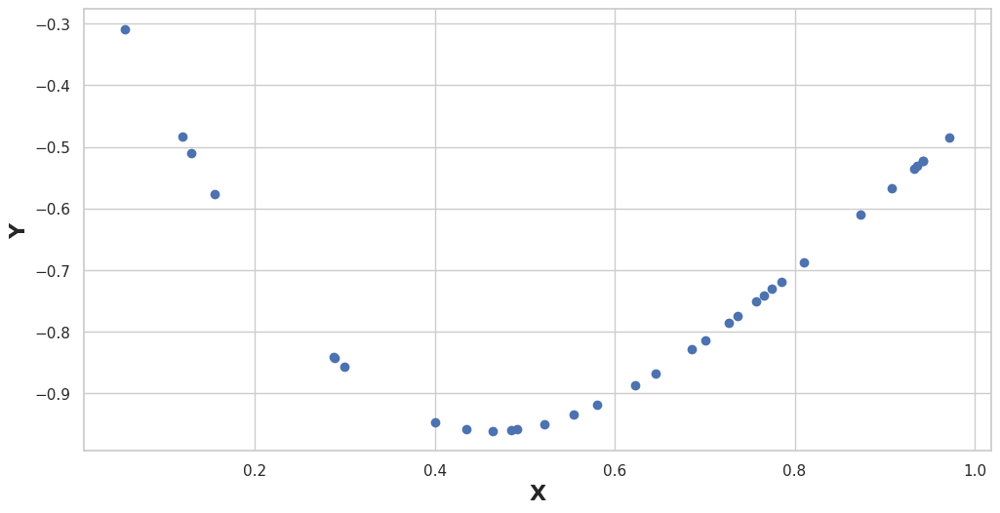

In [17]:
pred = model.predict(X_validation)
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(X_validation, pred, "ob", label="test")
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

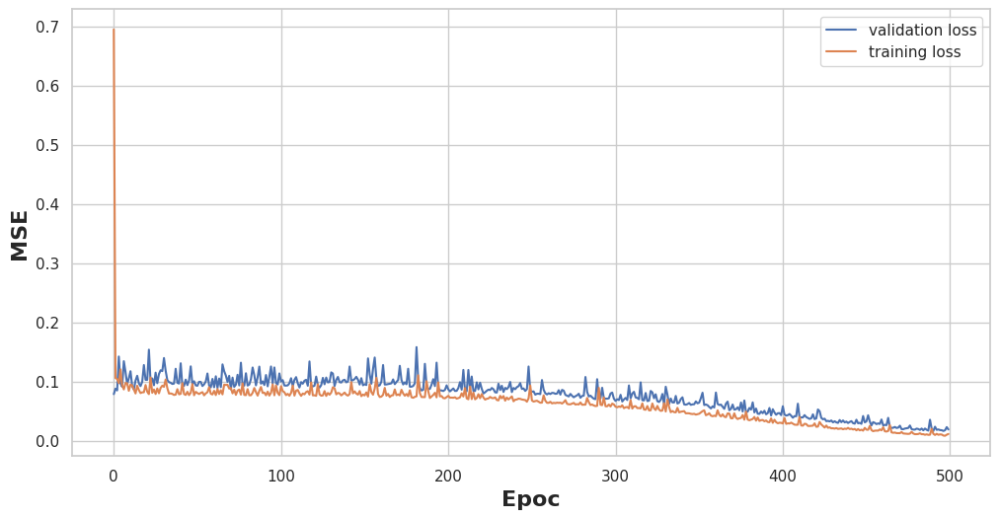

In [18]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(history.history["val_loss"], label="validation loss")
plt.plot(history.history["loss"], label="training loss")
plt.xlabel("Epoc", weight="bold", fontsize=16)
plt.ylabel("MSE", weight="bold", fontsize=16)
plt.legend()

## California dataset: Regresión

Ahora vamos con un [dataset](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html) más complicado, el dataset del precio medio por cuadra de casas en un distrito de california

In [19]:
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [20]:
california = fetch_california_housing()
california_df = pd.DataFrame(california.data, columns=california.feature_names)

In [21]:
california

{'data': array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
           37.88      , -122.23      ],
        [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
           37.86      , -122.22      ],
        [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
           37.85      , -122.24      ],
        ...,
        [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
           39.43      , -121.22      ],
        [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
           39.43      , -121.32      ],
        [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
           39.37      , -121.24      ]]),
 'target': array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]),
 'frame': None,
 'target_names': ['MedHouseVal'],
 'feature_names': ['MedInc',
  'HouseAge',
  'AveRooms',
  'AveBedrms',
  'Population',
  'AveOccup',
  'Latitude',
  'Longitude'],
 'DESCR': '.. _california_housing_dataset:\n

In [22]:
california.feature_names

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

Las variables que contiene el dataset son:

* MedInc: ingreso medio de las personas que viven en esa cuadra
* HouseAge: edad media de las casas de esa cuadra
* AveRooms: número medio de ambientes
* AveBedrms número medio de habitaciones
* Population: cantidad de habitantes en la cuadra
* AveOccup: número medio de habitantes en la casa
* Latitude: latitud de la cuadra
* Longitude: longitud de la cuadra


* MedHouseVal:valor medio de las casas.

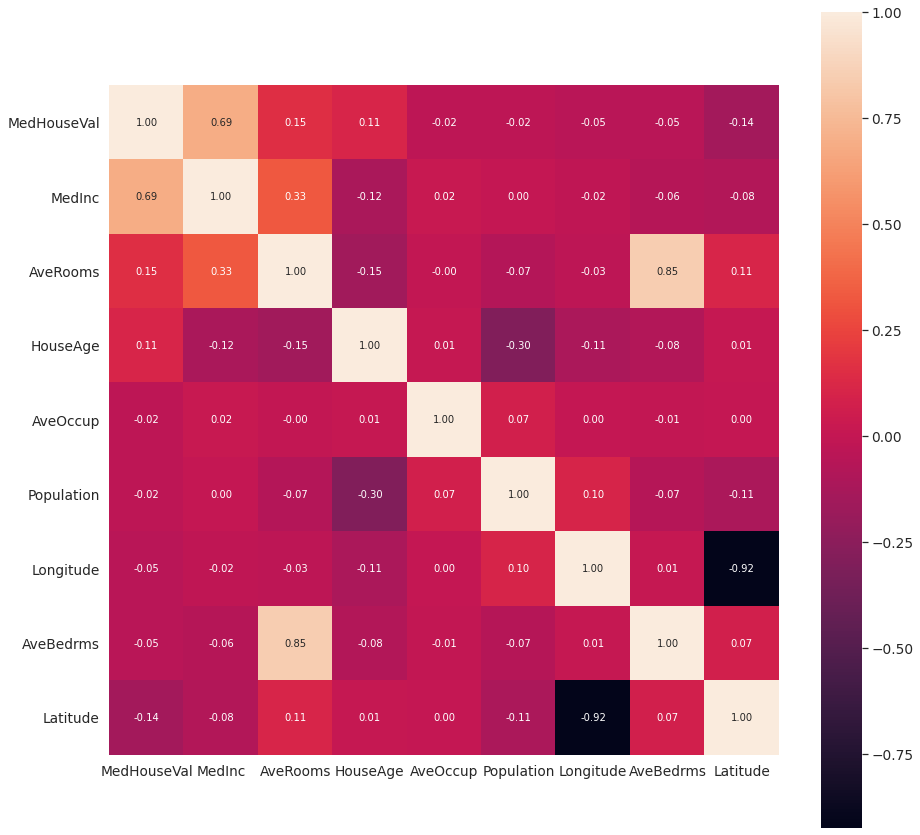

In [23]:
california_df['MedHouseVal'] = california.target
corrmat = california_df.corr()
k = 9  # number of variables for heatmap
cols = corrmat.nlargest(k, 'MedHouseVal')['MedHouseVal'].index
cm = np.corrcoef(california_df[cols].values.T)
sns.set(font_scale=1.25)
fig, ax = plt.subplots(figsize=(15, 15))
hm = sns.heatmap(
    cm,
    cbar=True,
    annot=True,
    square=True,
    fmt='.2f',
    annot_kws={'size': 10},
    yticklabels=cols.values,
    xticklabels=cols.values,
)

plt.show()

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

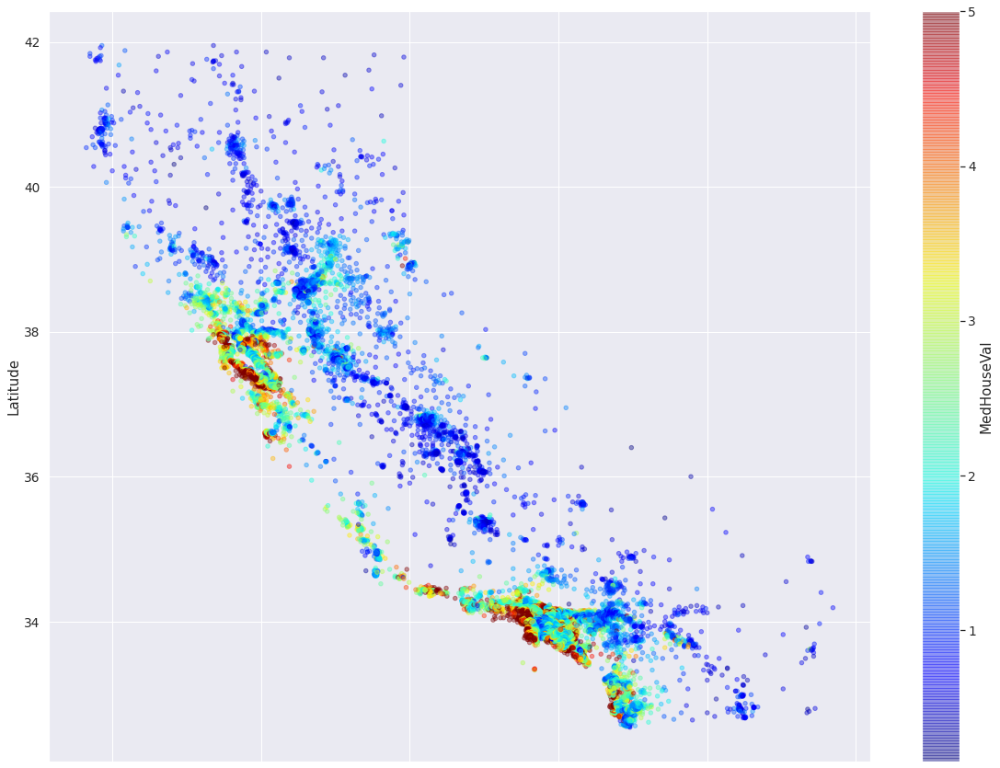

In [24]:
california_df.plot(
    kind="scatter",
    x="Longitude",
    y="Latitude",
    alpha=0.4,
    c="MedHouseVal",
    figsize=(20, 15),
    cmap=plt.get_cmap("jet"),
    colorbar=True,
)

In [25]:
california_df

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


Text(0, 0.5, 'Counts')

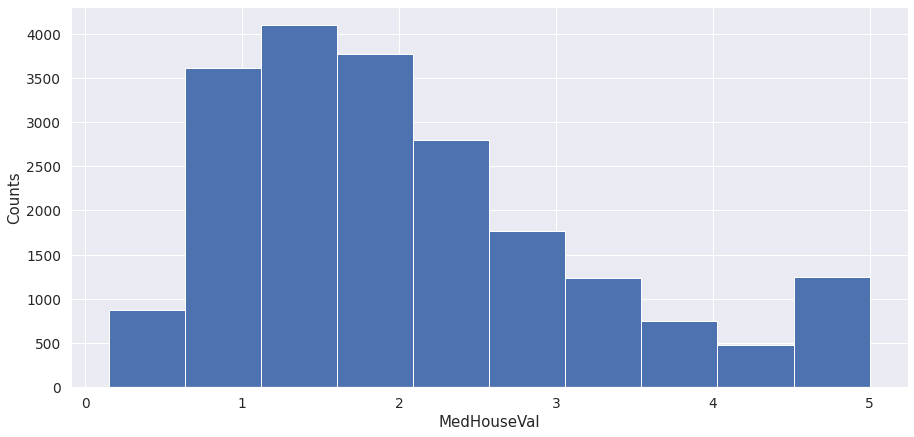

In [26]:
fig = plt.figure(figsize=(15, 7))
california_df["MedHouseVal"].hist()
plt.xlabel("MedHouseVal")
plt.ylabel("Counts")

Vamos a usar el StandardScaler y luego empezar a entrenar modelos y ver qué onda.

In [27]:
scaler = preprocessing.StandardScaler()
scaler.fit(california_df)
scaled_df = scaler.transform(california_df)
names = california_df.columns
scaled_california_df = pd.DataFrame(scaled_df, columns=names)

Entreno el modelo más simple: una regresión lineal

In [28]:
X = scaled_california_df.drop("MedHouseVal", axis=1)
y = scaled_california_df.filter(items=["MedHouseVal"])

linreg = LinearRegression()
rmse = np.sqrt(
    -cross_val_score(LinearRegression(), X, y, scoring="neg_mean_squared_error", cv=5)
)
rmse.mean()

0.6464066254204867

In [29]:
linreg = LinearRegression()
linreg.fit(X, y)
linreg.coef_[0]

array([ 0.71895227,  0.10291078, -0.23010693,  0.26491789, -0.00390232,
       -0.03408034, -0.77984545, -0.75441522])

Podemos ver la importancia tiene cada variable:

In [30]:
coeficientes = pd.DataFrame(
    {'Feature': X.columns, 'Beta': linreg.coef_[0]}, columns=['Feature', 'Beta']
)
coeficientes.sort_values(by=['Beta'])

,Feature,Beta
6,Latitude,-0.779845
7,Longitude,-0.754415
2,AveRooms,-0.230107
5,AveOccup,-0.034080
4,Population,-0.003902
1,HouseAge,0.102911
3,AveBedrms,0.264918
0,MedInc,0.718952


In [31]:
y_pred = linreg.predict(X)

(-3.0, 6.0)

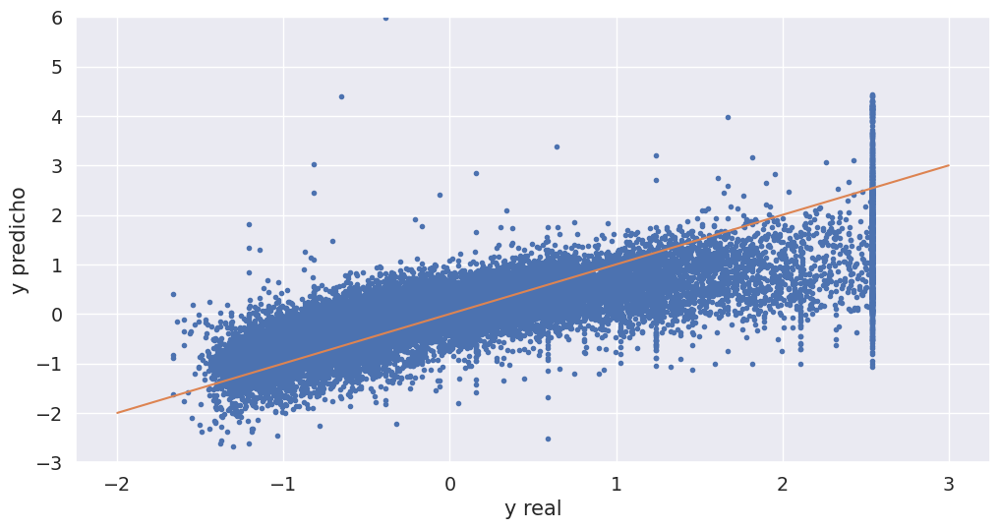

In [32]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y, y_pred, ".")
plt.xlabel("y real")
plt.ylabel("y predicho")
plt.plot(range(-2, 4), range(-2, 4))
plt.ylim(-3, 6)

In [33]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42
)

In [34]:
model = Sequential()

In [35]:
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))

In [36]:
opt = keras.optimizers.SGD(lr=0.1)
model.compile(loss='mse', optimizer=opt)

Podemos usar .summary() para ver el modelo: capas, parámetros etc

In [37]:
model.summary()

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=100,
    validation_data=(X_test.values, y_test.values),
)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 10)                90        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 11        
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________


Train on 12384 samples, validate on 8256 samples
Epoch 1/100
   32/12384 [..............................] - ETA: 18s - loss: 0.6689

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.4417 

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.4081

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.3987

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.3890

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.3771

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.3684

11648/12384 [===========================>..] - ETA: 0s - loss: 0.3626

12384/12384 [==============================] - 1s 53us/step - loss: 0.3611 - val_loss: 0.3312


Epoch 2/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0934

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2975

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.3356

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.3309

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.3221

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.3242



10048/12384 [=======================>......] - ETA: 0s - loss: 0.3195



11872/12384 [===========================>..] - ETA: 0s - loss: 0.3179

12384/12384 [==============================] - 1s 46us/step - loss: 0.3198 - val_loss: 0.3169


Epoch 3/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1480

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.3193

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.3129

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.3173

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.3149

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.3079

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.3092

11520/12384 [==========================>...] - ETA: 0s - loss: 0.3097

12384/12384 [==============================] - 1s 46us/step - loss: 0.3075 - val_loss: 0.3071


Epoch 4/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3343

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.3135

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.3081

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.3102

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.3060

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.3019

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2999

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2997

12384/12384 [==============================] - 1s 46us/step - loss: 0.3006 - val_loss: 0.3094


Epoch 5/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2478

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2873

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2839

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2952

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2903

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2878

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2892

12160/12384 [============================>.] - ETA: 0s - loss: 0.2926

12384/12384 [==============================] - 1s 44us/step - loss: 0.2932 - val_loss: 0.3067


Epoch 6/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2133

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3035

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2931

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2886

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2942

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2939

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2925

12160/12384 [============================>.] - ETA: 0s - loss: 0.2930

12384/12384 [==============================] - 1s 45us/step - loss: 0.2938 - val_loss: 0.3120


Epoch 7/100
   32/12384 [..............................] - ETA: 0s - loss: 0.6445

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2896

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.3035

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2960

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2885

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2881

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2894

12256/12384 [============================>.] - ETA: 0s - loss: 0.2875

12384/12384 [==============================] - 1s 45us/step - loss: 0.2875 - val_loss: 0.3060


Epoch 8/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2706

 1216/12384 [=>............................] - ETA: 0s - loss: 0.2813

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2778

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2892

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2868

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2868

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2869

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2862

12384/12384 [==============================] - 1s 47us/step - loss: 0.2855 - val_loss: 0.2913


Epoch 9/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2754

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2805

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2854

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2836

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2807

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2780

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2805

12288/12384 [============================>.] - ETA: 0s - loss: 0.2820

12384/12384 [==============================] - 1s 46us/step - loss: 0.2821 - val_loss: 0.2937


Epoch 10/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1875

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2895

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2787

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2769

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2744

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2709

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2780

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2786

12384/12384 [==============================] - 1s 48us/step - loss: 0.2800 - val_loss: 0.3203


Epoch 11/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2453

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.3110

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2984

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2851

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2800

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2792

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2775

12384/12384 [==============================] - 1s 44us/step - loss: 0.2766 - val_loss: 0.2779


Epoch 12/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1789

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2709

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2692

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2639

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2669

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2662

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2723

12384/12384 [==============================] - 1s 43us/step - loss: 0.2728 - val_loss: 0.2876


Epoch 13/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1767

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2839

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2772

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2729

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2692

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2727



10752/12384 [=========================>....] - ETA: 0s - loss: 0.2701

12384/12384 [==============================] - 1s 43us/step - loss: 0.2695 - val_loss: 0.2829


Epoch 14/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4582

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2574

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2613

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2699

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2726

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2701

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2712

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2681

12384/12384 [==============================] - 1s 47us/step - loss: 0.2682 - val_loss: 0.2747


Epoch 15/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3382

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2723

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2652

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2743

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2705

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2671

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2647

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2673

12384/12384 [==============================] - 1s 47us/step - loss: 0.2670 - val_loss: 0.2709


Epoch 16/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3396

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2787

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2623

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2625

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2669

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2668

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2643

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2639

12384/12384 [==============================] - 1s 48us/step - loss: 0.2649 - val_loss: 0.2672


Epoch 17/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1041

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2686

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2714

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2592

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2568

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2629

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2616

12384/12384 [==============================] - 1s 43us/step - loss: 0.2627 - val_loss: 0.2911


Epoch 18/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2564

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2495

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2470

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2583

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2606

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2625

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2594

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2614

12384/12384 [==============================] - 1s 47us/step - loss: 0.2628 - val_loss: 0.2711


Epoch 19/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1364

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2682

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2650

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2641

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2641

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2604

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2595

12320/12384 [============================>.] - ETA: 0s - loss: 0.2618

12384/12384 [==============================] - 1s 44us/step - loss: 0.2610 - val_loss: 0.2633


Epoch 20/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1782

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2707

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2692

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2632

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2543

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2586

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2582

12384/12384 [==============================] - 1s 44us/step - loss: 0.2590 - val_loss: 0.2659


Epoch 21/100
   32/12384 [..............................] - ETA: 2s - loss: 0.2356

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2450

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2466

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2586

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2574

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2568

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2540

12384/12384 [==============================] - 1s 44us/step - loss: 0.2549 - val_loss: 0.2567


Epoch 22/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3560

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2912

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2817

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2653

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2589

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2548

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2499

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2555

12288/12384 [============================>.] - ETA: 0s - loss: 0.2538

12384/12384 [==============================] - 1s 50us/step - loss: 0.2545 - val_loss: 0.2890


Epoch 23/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2924

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2428

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2398

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2483

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2511

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2517

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2563

12160/12384 [============================>.] - ETA: 0s - loss: 0.2508

12384/12384 [==============================] - 1s 46us/step - loss: 0.2514 - val_loss: 0.2561


Epoch 24/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4039

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2381

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2289

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2281

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2419

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2439

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2500

12384/12384 [==============================] - 1s 43us/step - loss: 0.2504 - val_loss: 0.2548


Epoch 25/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2925

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2409

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2396

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2501

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2482

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2440

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2510

12160/12384 [============================>.] - ETA: 0s - loss: 0.2496

12384/12384 [==============================] - 1s 44us/step - loss: 0.2485 - val_loss: 0.2546


Epoch 26/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2011

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2594

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2606

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2604

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2542

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2524

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2519

12384/12384 [==============================] - 1s 44us/step - loss: 0.2512 - val_loss: 0.2500


Epoch 27/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2399

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2499

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2452

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2534

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2488

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2476

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2494

12384/12384 [==============================] - 1s 45us/step - loss: 0.2490 - val_loss: 0.2501


Epoch 28/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2786

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2497

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2372

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2426

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2437

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2457

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2444

12384/12384 [==============================] - 1s 46us/step - loss: 0.2477 - val_loss: 0.2505


Epoch 29/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1261

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2418

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2511

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2430

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2442

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2490

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2497

12384/12384 [==============================] - 1s 44us/step - loss: 0.2481 - val_loss: 0.2658


Epoch 30/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3028

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2631

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2508

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2561

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2734

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2695

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2646

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2605

12384/12384 [==============================] - 1s 46us/step - loss: 0.2604 - val_loss: 0.2698


Epoch 31/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2179

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2686

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2540

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2458



 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2497

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2510

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2482

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2522

12384/12384 [==============================] - 1s 47us/step - loss: 0.2518 - val_loss: 0.2547


Epoch 32/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2197

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2616

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2503

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2457

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2483

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2457

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2451



11584/12384 [===========================>..] - ETA: 0s - loss: 0.2441

12384/12384 [==============================] - 1s 47us/step - loss: 0.2437 - val_loss: 0.2654


Epoch 33/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5589

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2569

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2492

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2453

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2451

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2497

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2499

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2487

12384/12384 [==============================] - 1s 47us/step - loss: 0.2496 - val_loss: 0.2645


Epoch 34/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1514

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2558

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2489

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2472

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2466

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2435

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2460

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2467

12384/12384 [==============================] - 1s 48us/step - loss: 0.2460 - val_loss: 0.2579


Epoch 35/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2481

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2681

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2528

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2520

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2472

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2446

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2427

12384/12384 [==============================] - 1s 44us/step - loss: 0.2440 - val_loss: 0.2458


Epoch 36/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1822

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2194

 3936/12384 [========>.....................] - ETA: 0s - loss: 0.2281

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2369

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2366

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2426

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2436

12384/12384 [==============================] - 1s 44us/step - loss: 0.2443 - val_loss: 0.2632


Epoch 37/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1533

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2383

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2327

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2413

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2384

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2401

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2430

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2411

12384/12384 [==============================] - 1s 47us/step - loss: 0.2423 - val_loss: 0.2530


Epoch 38/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1448

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2378

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2302

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2393

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2386

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2424

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2403

12384/12384 [==============================] - 1s 45us/step - loss: 0.2436 - val_loss: 0.2738


Epoch 39/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2549

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2399

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2365

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2435

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2473

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2485

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2439

12384/12384 [==============================] - 1s 45us/step - loss: 0.2434 - val_loss: 0.2445


Epoch 40/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1697

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2265

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2461

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2457

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2430

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2459

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2488

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2460

12384/12384 [==============================] - 1s 46us/step - loss: 0.2445 - val_loss: 0.2448


Epoch 41/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4119

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2413

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2355

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2365

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2420

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2444

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2429

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2457

12384/12384 [==============================] - 1s 47us/step - loss: 0.2480 - val_loss: 0.2527


Epoch 42/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1540

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2512

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2515

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2548

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2568

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2561

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2514

12288/12384 [============================>.] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 45us/step - loss: 0.2453 - val_loss: 0.2584


Epoch 43/100


   32/12384 [..............................] - ETA: 0s - loss: 0.2181

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2126

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2435

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2486

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2505

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2452

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2385

12160/12384 [============================>.] - ETA: 0s - loss: 0.2430

12384/12384 [==============================] - 1s 45us/step - loss: 0.2436 - val_loss: 0.2484


Epoch 44/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2752

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2377

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2326

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2379

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2438

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2403

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2442

12288/12384 [============================>.] - ETA: 0s - loss: 0.2417

12384/12384 [==============================] - 1s 44us/step - loss: 0.2421 - val_loss: 0.2883


Epoch 45/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2754

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2252

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2189

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2269

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2341

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2342

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2384

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2407

12384/12384 [==============================] - 1s 44us/step - loss: 0.2402 - val_loss: 0.2490


Epoch 46/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2075

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2274

 4000/12384 [========>.....................] - ETA: 0s - loss: 0.2436

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2394

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2378

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2381

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 41us/step - loss: 0.2424 - val_loss: 0.2451


Epoch 47/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2490

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2293

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2296

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2313

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2360

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2372

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2363

12352/12384 [============================>.] - ETA: 0s - loss: 0.2408

12384/12384 [==============================] - 1s 43us/step - loss: 0.2406 - val_loss: 0.2468


Epoch 48/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2231

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2502

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2436

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2322

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2323

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2337

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2385

12384/12384 [==============================] - 1s 43us/step - loss: 0.2404 - val_loss: 0.2504


Epoch 49/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2077

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2324

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2407

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2376

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2366

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2340

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2368

12384/12384 [==============================] - 1s 43us/step - loss: 0.2397 - val_loss: 0.2471


Epoch 50/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3410

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2418

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2410

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2466

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2426

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2441

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2405

12384/12384 [==============================] - 1s 41us/step - loss: 0.2412 - val_loss: 0.2471


Epoch 51/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4255

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2580

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2659

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2530

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2461



 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2442

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 41us/step - loss: 0.2394 - val_loss: 0.2559


Epoch 52/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2052

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2400

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2382

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2326

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2374

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2374

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2362

12160/12384 [============================>.] - ETA: 0s - loss: 0.2386

12384/12384 [==============================] - 1s 42us/step - loss: 0.2399 - val_loss: 0.2565


Epoch 53/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1440

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2424

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2292

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2321

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2358

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2389

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2394

12384/12384 [==============================] - 1s 43us/step - loss: 0.2382 - val_loss: 0.2409


Epoch 54/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1203

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2307

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2368

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2427

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2393

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2421

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2414

12192/12384 [============================>.] - ETA: 0s - loss: 0.2410

12384/12384 [==============================] - 1s 43us/step - loss: 0.2397 - val_loss: 0.2502


Epoch 55/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2792

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2348

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2575

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2419

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2423

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2379

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2382

12384/12384 [==============================] - 1s 42us/step - loss: 0.2400 - val_loss: 0.2571


Epoch 56/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1645

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2216

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2292

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2274

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2367

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2346

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 41us/step - loss: 0.2372 - val_loss: 0.2434


Epoch 57/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4775

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2619

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2492

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2432

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2347

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2331

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2359

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2377

12384/12384 [==============================] - 1s 45us/step - loss: 0.2374 - val_loss: 0.2409


Epoch 58/100


   32/12384 [..............................] - ETA: 1s - loss: 0.0984

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2447

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2566

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2556

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2517

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2440

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2429

12384/12384 [==============================] - 1s 42us/step - loss: 0.2430 - val_loss: 0.2481


Epoch 59/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1198

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2589

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2472

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2432

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2395

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2431

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2396

12384/12384 [==============================] - 1s 44us/step - loss: 0.2408 - val_loss: 0.2430


Epoch 60/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3395

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2532

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2505

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2487

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2458

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2447

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2438

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2419

12384/12384 [==============================] - 1s 46us/step - loss: 0.2420 - val_loss: 0.2502


Epoch 61/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2978

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2511

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2534

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2512

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2477

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2445

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2388

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2371

12384/12384 [==============================] - 1s 46us/step - loss: 0.2397 - val_loss: 0.2415


Epoch 62/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4254

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2748

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2571

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2489

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2432

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2410

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2388

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2380

12384/12384 [==============================] - 1s 46us/step - loss: 0.2379 - val_loss: 0.2456


Epoch 63/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2047

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2348

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2379

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2401

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2366

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2388

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2382

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2381

12384/12384 [==============================] - 1s 44us/step - loss: 0.2382 - val_loss: 0.2414


Epoch 64/100
   32/12384 [..............................] - ETA: 2s - loss: 0.5352

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2273

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2386

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2389

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2358

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2399

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 42us/step - loss: 0.2401 - val_loss: 0.2465


Epoch 65/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3136

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2146

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2216

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2351

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2367

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2358

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2372

12384/12384 [==============================] - 1s 42us/step - loss: 0.2363 - val_loss: 0.2590


Epoch 66/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1256

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2269

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2253

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2310

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2373

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2402

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2402

12096/12384 [============================>.] - ETA: 0s - loss: 0.2382

12384/12384 [==============================] - 1s 43us/step - loss: 0.2378 - val_loss: 0.2557


Epoch 67/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3770

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2518

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2500

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2390

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2383

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2427

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2382

12064/12384 [============================>.] - ETA: 0s - loss: 0.2378

12384/12384 [==============================] - 1s 43us/step - loss: 0.2375 - val_loss: 0.2410


Epoch 68/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1545

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2435

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2287

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2330

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2344

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2374

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2366

12384/12384 [==============================] - 0s 40us/step - loss: 0.2366 - val_loss: 0.2402


Epoch 69/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1188

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2255

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2198

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2279

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2311

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2359

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2386

12384/12384 [==============================] - 1s 43us/step - loss: 0.2366 - val_loss: 0.2508


Epoch 70/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4091

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2452

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2386

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2356

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2328

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2322

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2345

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 44us/step - loss: 0.2373 - val_loss: 0.2729


Epoch 71/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1633

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2403

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2388

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2461

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2442

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2381

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2361

12384/12384 [==============================] - 1s 42us/step - loss: 0.2363 - val_loss: 0.2592


Epoch 72/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2197

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2312

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2288

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2343

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2361

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2402

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2358

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 44us/step - loss: 0.2366 - val_loss: 0.2455


Epoch 73/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0911

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2579

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2368

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2349

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2314

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2319

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2336

12384/12384 [==============================] - 1s 42us/step - loss: 0.2380 - val_loss: 0.2840


Epoch 74/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4050

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2340

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2366

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2411

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2407

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2414

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2398

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2403

12384/12384 [==============================] - 1s 44us/step - loss: 0.2416 - val_loss: 0.2394


Epoch 75/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2285

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2478

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2368

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2292

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2307

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2375

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2376

12064/12384 [============================>.] - ETA: 0s - loss: 0.2362

12384/12384 [==============================] - 1s 45us/step - loss: 0.2356 - val_loss: 0.2389


Epoch 76/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2333

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2302

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2256

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2294

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2348

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2343

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2311

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 45us/step - loss: 0.2363 - val_loss: 0.2465


Epoch 77/100


   32/12384 [..............................] - ETA: 0s - loss: 0.1309

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2203

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2198

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2258

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2305

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2326

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2344



11712/12384 [===========================>..] - ETA: 0s - loss: 0.2357

12384/12384 [==============================] - 1s 44us/step - loss: 0.2348 - val_loss: 0.2414


Epoch 78/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1561

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2068

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2201

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2276

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2308

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2328

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2359

12320/12384 [============================>.] - ETA: 0s - loss: 0.2361

12384/12384 [==============================] - 1s 42us/step - loss: 0.2364 - val_loss: 0.2438


Epoch 79/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1439

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2392

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2424

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2392

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2431

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2408

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2362

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2381

12384/12384 [==============================] - 1s 45us/step - loss: 0.2370 - val_loss: 0.2402


Epoch 80/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1608

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2287

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2335

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2377

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2354

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2303

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2323

12384/12384 [==============================] - 1s 43us/step - loss: 0.2362 - val_loss: 0.2475


Epoch 81/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4195

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2298

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2408

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2449

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2423

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2397

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2379

12384/12384 [==============================] - 1s 42us/step - loss: 0.2354 - val_loss: 0.2458


Epoch 82/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2737

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2385

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2338

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2333

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2355

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2365

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2347

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2330

12384/12384 [==============================] - 1s 44us/step - loss: 0.2340 - val_loss: 0.2505


Epoch 83/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1962

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2181

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2234

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2251

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2252

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2323

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2339

12064/12384 [============================>.] - ETA: 0s - loss: 0.2353

12384/12384 [==============================] - 1s 45us/step - loss: 0.2362 - val_loss: 0.2493


Epoch 84/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1918

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2441

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2372

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2335

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2369

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2391

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2388

12384/12384 [==============================] - 1s 42us/step - loss: 0.2371 - val_loss: 0.2462


Epoch 85/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1465

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2275

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2216

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2276

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2315

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2344

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2324

12384/12384 [==============================] - 1s 43us/step - loss: 0.2332 - val_loss: 0.2476


Epoch 86/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1949

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2311

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2329

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2326



 7168/12384 [================>.............] - ETA: 0s - loss: 0.2331

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2344

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2312

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2337

12384/12384 [==============================] - 1s 45us/step - loss: 0.2364 - val_loss: 0.2619


Epoch 87/100
   32/12384 [..............................] - ETA: 1s - loss: 0.5165

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2199

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2269

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2241

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2252

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2279

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2303

12384/12384 [==============================] - 1s 42us/step - loss: 0.2343 - val_loss: 0.2448


Epoch 88/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3554

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2464

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2346

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2372

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2310



 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2291

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2317

12384/12384 [==============================] - 1s 42us/step - loss: 0.2334 - val_loss: 0.2401


Epoch 89/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1569

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2295

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2175

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2219

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2284

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2343

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2355

12384/12384 [==============================] - 1s 42us/step - loss: 0.2355 - val_loss: 0.2462


Epoch 90/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1599

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2221

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2272

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2313

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2343

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2345

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2296

12000/12384 [============================>.] - ETA: 0s - loss: 0.2352

12384/12384 [==============================] - 1s 43us/step - loss: 0.2361 - val_loss: 0.2463


Epoch 91/100
   32/12384 [..............................] - ETA: 1s - loss: 0.6207

  832/12384 [=>............................] - ETA: 0s - loss: 0.2958

 2272/12384 [====>.........................] - ETA: 0s - loss: 0.2504

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2519

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2470

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2387

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2374

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2360

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 49us/step - loss: 0.2342 - val_loss: 0.2439


Epoch 92/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1459

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2170

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2331

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2336

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2333

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2308

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2313

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 45us/step - loss: 0.2352 - val_loss: 0.2397


Epoch 93/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1890

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2171

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2307

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2321

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2290

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2334



 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2347

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2331

12384/12384 [==============================] - 1s 44us/step - loss: 0.2338 - val_loss: 0.2545


Epoch 94/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2423

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2519

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2454

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2433

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2411

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2354

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2300

12064/12384 [============================>.] - ETA: 0s - loss: 0.2342

12384/12384 [==============================] - 1s 44us/step - loss: 0.2344 - val_loss: 0.2453


Epoch 95/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1884

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2307

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2257

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2301

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2373

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2353

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2353

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2337

12384/12384 [==============================] - 1s 46us/step - loss: 0.2336 - val_loss: 0.2432


Epoch 96/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1191

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2343

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2301

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2291

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2312

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2266

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2285

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2341

12384/12384 [==============================] - 1s 44us/step - loss: 0.2345 - val_loss: 0.2382


Epoch 97/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0814

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2234

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2351

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2355

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2298

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2296

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2339

12384/12384 [==============================] - 1s 44us/step - loss: 0.2325 - val_loss: 0.2408


Epoch 98/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3443

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2367

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2365

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2343

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2355

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2338

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2324

12160/12384 [============================>.] - ETA: 0s - loss: 0.2340

12384/12384 [==============================] - 1s 43us/step - loss: 0.2334 - val_loss: 0.2384


Epoch 99/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1843

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2299

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2346

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2297

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2321

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2353

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 43us/step - loss: 0.2372 - val_loss: 0.2535


Epoch 100/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1743

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2541

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2422

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2428

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2391

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2394

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2377

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2361

12384/12384 [==============================] - 1s 47us/step - loss: 0.2354 - val_loss: 0.2459


In [38]:
y_pred_nn = model.predict(X_test.values)

(-3.0, 6.0)

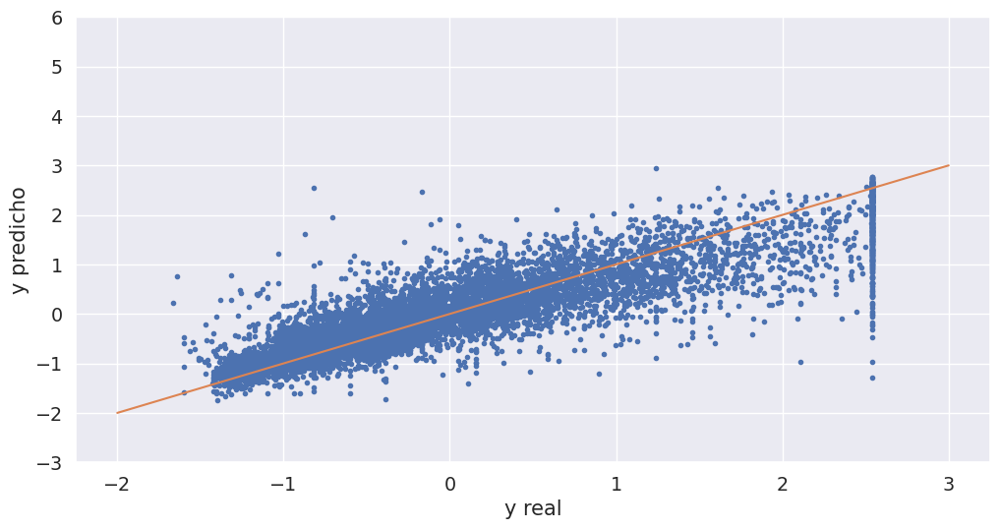

In [39]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y_test, y_pred_nn, ".")
plt.plot(range(-2, 4), range(-2, 4))
plt.xlabel("y real")
plt.ylabel("y predicho")
plt.ylim(-3, 6)

In [40]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])

Ahora ploteamos el rmse del validation y training por época

Text(0.5, 0, 'Época')

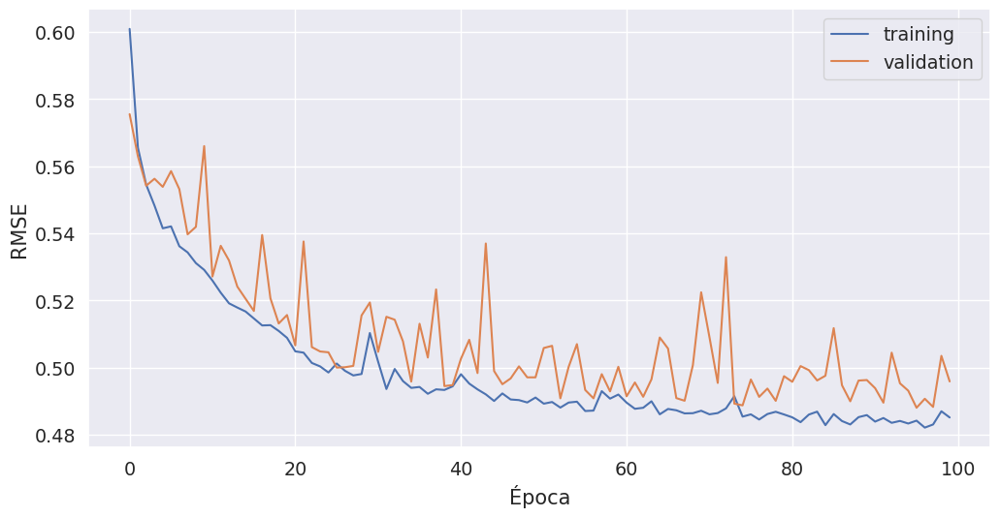

In [41]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.legend()
plt.ylabel("RMSE")
plt.xlabel("Época")

Vemos que salta bastante la loss durante el entrenamiento:

Qué podemos hacer para que salte menos? Qué es lo que controla la "velocidad del aprendizaje"?

Podemos bajar la tasa de aprendizaje

In [42]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.SGD(lr=0.05)
model.compile(loss='mse', optimizer=opt)

In [43]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=200,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/200
   32/12384 [..............................] - ETA: 18s - loss: 2.0407

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.5946 

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.5295

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.4895

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.4617

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.4394

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.4200

11328/12384 [==========================>...] - ETA: 0s - loss: 0.4084

12384/12384 [==============================] - 1s 51us/step - loss: 0.3996 - val_loss: 0.3429


Epoch 2/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1585

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.3038

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.3341

 5696/12384 [============>.................] - ETA: 0s - loss: 0.3269

 7360/12384 [================>.............] - ETA: 0s - loss: 0.3223

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.3203

10592/12384 [========================>.....] - ETA: 0s - loss: 0.3218

12384/12384 [==============================] - 1s 45us/step - loss: 0.3203 - val_loss: 0.3321


Epoch 3/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2643

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.3063

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.3169

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.3038

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.3062

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.3093

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.3030

11456/12384 [==========================>...] - ETA: 0s - loss: 0.3064

12384/12384 [==============================] - 1s 47us/step - loss: 0.3064 - val_loss: 0.3133


Epoch 4/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2866

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2869

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2989

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2893

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2899

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2936

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2957

12000/12384 [============================>.] - ETA: 0s - loss: 0.2957

12384/12384 [==============================] - 1s 46us/step - loss: 0.2980 - val_loss: 0.3065


Epoch 5/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3512

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2834

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.3000

 5472/12384 [============>.................] - ETA: 0s - loss: 0.3001

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2993

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2941

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2962

12384/12384 [==============================] - 1s 45us/step - loss: 0.2936 - val_loss: 0.2994


Epoch 6/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2415

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2798

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2734

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2907

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2927

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2940

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2893

12224/12384 [============================>.] - ETA: 0s - loss: 0.2896

12384/12384 [==============================] - 1s 44us/step - loss: 0.2899 - val_loss: 0.3019


Epoch 7/200
   32/12384 [..............................] - ETA: 1s - loss: 0.6137

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2739

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2682

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2760

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2880

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2930

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2898

12384/12384 [==============================] - 1s 44us/step - loss: 0.2874 - val_loss: 0.2914


Epoch 8/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4853

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.3173

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.3020

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2941

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2921

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2880

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2872

12384/12384 [==============================] - 1s 44us/step - loss: 0.2854 - val_loss: 0.2903


Epoch 9/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1447

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2832

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2875

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2872

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2853

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2835

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2858

12384/12384 [==============================] - 1s 45us/step - loss: 0.2830 - val_loss: 0.2899


Epoch 10/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1983

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2743

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2803

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2778

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2823

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2811

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2815

12384/12384 [==============================] - 1s 43us/step - loss: 0.2807 - val_loss: 0.2968


Epoch 11/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2310

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2711

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2619

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2766

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2794

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2851

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2810

12384/12384 [==============================] - 1s 46us/step - loss: 0.2786 - val_loss: 0.2835


Epoch 12/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3731

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2554

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2643

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2667

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2697

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2741

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2747

12384/12384 [==============================] - 1s 44us/step - loss: 0.2764 - val_loss: 0.2845


Epoch 13/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4234

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2820

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2844

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2888

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2845

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2768

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2779

12256/12384 [============================>.] - ETA: 0s - loss: 0.2747

12384/12384 [==============================] - 1s 46us/step - loss: 0.2747 - val_loss: 0.2873


Epoch 14/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3316

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2507

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2712

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2809

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2712

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2784

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2697

12384/12384 [==============================] - 1s 43us/step - loss: 0.2723 - val_loss: 0.2824


Epoch 15/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2120

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.3045

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2694

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2762

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2719

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2687

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2679

12384/12384 [==============================] - 1s 44us/step - loss: 0.2703 - val_loss: 0.2754


Epoch 16/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2045

 2048/12384 [===>..........................] - ETA: 0s - loss: 0.2589

 4032/12384 [========>.....................] - ETA: 0s - loss: 0.2731

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2683

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2663

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2634

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2663

12384/12384 [==============================] - 1s 43us/step - loss: 0.2672 - val_loss: 0.2765


Epoch 17/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2656

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2730

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2566

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2460

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2519

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2601

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2632

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2671

12384/12384 [==============================] - 1s 47us/step - loss: 0.2661 - val_loss: 0.2771


Epoch 18/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2423

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2573

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2532

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2715

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2668

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2676

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2663

12384/12384 [==============================] - 1s 44us/step - loss: 0.2648 - val_loss: 0.2706


Epoch 19/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3297

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2654

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2680

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2711

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2683

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2668

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2652

12256/12384 [============================>.] - ETA: 0s - loss: 0.2623

12384/12384 [==============================] - 1s 46us/step - loss: 0.2622 - val_loss: 0.2698


Epoch 20/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4918

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2624

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2610

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2661

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2624

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2613

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2612

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2606

12384/12384 [==============================] - 1s 49us/step - loss: 0.2617 - val_loss: 0.2718


Epoch 21/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2435

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2572

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2534

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2541

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2620

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2600

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2594

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2605

12384/12384 [==============================] - 1s 47us/step - loss: 0.2609 - val_loss: 0.2678


Epoch 22/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3914

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2305

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2386

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2394

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2410

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2532

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2583

12288/12384 [============================>.] - ETA: 0s - loss: 0.2593

12384/12384 [==============================] - 1s 46us/step - loss: 0.2592 - val_loss: 0.2696


Epoch 23/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3124

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2733

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2614

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2590

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2617

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2624

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2571

12384/12384 [==============================] - 1s 45us/step - loss: 0.2578 - val_loss: 0.2662


Epoch 24/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4276

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2319

 3904/12384 [========>.....................] - ETA: 0s - loss: 0.2347

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2454

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2475

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2530



10784/12384 [=========================>....] - ETA: 0s - loss: 0.2559

12384/12384 [==============================] - 1s 44us/step - loss: 0.2573 - val_loss: 0.2697


Epoch 25/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2868

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2588

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2431

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2516

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2515

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2571

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2603

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2574

12384/12384 [==============================] - 1s 47us/step - loss: 0.2576 - val_loss: 0.2657


Epoch 26/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2058

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2553

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2516

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2557

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2525

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2530

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2544

12384/12384 [==============================] - 1s 44us/step - loss: 0.2558 - val_loss: 0.2612


Epoch 27/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1438

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2749

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2656

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2678

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2612

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2653



10784/12384 [=========================>....] - ETA: 0s - loss: 0.2587

12384/12384 [==============================] - 1s 44us/step - loss: 0.2560 - val_loss: 0.2644


Epoch 28/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3565

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2546

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2583

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2555

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2551

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2598

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2588

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2550

12384/12384 [==============================] - 1s 49us/step - loss: 0.2544 - val_loss: 0.2612


Epoch 29/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1670

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2491

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2510

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2477

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2490

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2502

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2527

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2572

12384/12384 [==============================] - 1s 47us/step - loss: 0.2544 - val_loss: 0.2615


Epoch 30/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2579

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2436

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2383

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2376

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2403

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2509

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2514

12192/12384 [============================>.] - ETA: 0s - loss: 0.2536

12384/12384 [==============================] - 1s 46us/step - loss: 0.2534 - val_loss: 0.2611


Epoch 31/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2822

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2667

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2581

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2559

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2572

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2568

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2542

12064/12384 [============================>.] - ETA: 0s - loss: 0.2532

12384/12384 [==============================] - 1s 45us/step - loss: 0.2522 - val_loss: 0.2579


Epoch 32/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2397

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2366

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2446

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2417

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2424

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2449

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2461

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2492

12384/12384 [==============================] - 1s 46us/step - loss: 0.2507 - val_loss: 0.2637


Epoch 33/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2809

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2511

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2514

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2483

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2498

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2496

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2492

12384/12384 [==============================] - 1s 45us/step - loss: 0.2515 - val_loss: 0.2584


Epoch 34/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2807

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2413

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2470

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2501

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2490

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2505



10400/12384 [========================>.....] - ETA: 0s - loss: 0.2520

12000/12384 [============================>.] - ETA: 0s - loss: 0.2508

12384/12384 [==============================] - 1s 45us/step - loss: 0.2514 - val_loss: 0.2587


Epoch 35/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1559

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2471

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2370

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2416

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2456



 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2480

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2493

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2480

12384/12384 [==============================] - 1s 47us/step - loss: 0.2496 - val_loss: 0.2650


Epoch 36/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1861

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2764

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2519

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2513

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2523

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2491

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2528

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2507

12384/12384 [==============================] - 1s 48us/step - loss: 0.2499 - val_loss: 0.2621


Epoch 37/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1695

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2425

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2501

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2462

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2447



 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2500



11008/12384 [=========================>....] - ETA: 0s - loss: 0.2495

12384/12384 [==============================] - 1s 45us/step - loss: 0.2500 - val_loss: 0.2562


Epoch 38/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1656

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2242

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2431

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2455

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2449

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2502

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2500

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2499

12384/12384 [==============================] - 1s 46us/step - loss: 0.2490 - val_loss: 0.2589


Epoch 39/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3084

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2367

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2547

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2527

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2585

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2519

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2509

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2514

12384/12384 [==============================] - 1s 48us/step - loss: 0.2484 - val_loss: 0.2624


Epoch 40/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3553

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2607

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2573

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2587

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2543

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2509

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2507

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2471

12256/12384 [============================>.] - ETA: 0s - loss: 0.2471

12384/12384 [==============================] - 1s 50us/step - loss: 0.2475 - val_loss: 0.2653


Epoch 41/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1964

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2311

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2306

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2374

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2419

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2431

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2428

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2452

12384/12384 [==============================] - 1s 48us/step - loss: 0.2469 - val_loss: 0.2700


Epoch 42/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2040

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2394

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2372

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2439

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2498

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2483

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2447

12384/12384 [==============================] - 1s 45us/step - loss: 0.2471 - val_loss: 0.2618


Epoch 43/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2821

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2615

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2439

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2373

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2374

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2366

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2450

12128/12384 [============================>.] - ETA: 0s - loss: 0.2472

12384/12384 [==============================] - 1s 45us/step - loss: 0.2465 - val_loss: 0.2546


Epoch 44/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2346

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2307

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2402

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2432

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2413

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2452

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2431

12384/12384 [==============================] - 1s 44us/step - loss: 0.2459 - val_loss: 0.2646


Epoch 45/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1331

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2366

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2429

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2473

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2412

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2374



10752/12384 [=========================>....] - ETA: 0s - loss: 0.2435

12384/12384 [==============================] - 1s 44us/step - loss: 0.2468 - val_loss: 0.2587


Epoch 46/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2230

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2385

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2351

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2379

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2416

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2413

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2417

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2478

12384/12384 [==============================] - 1s 48us/step - loss: 0.2451 - val_loss: 0.2585


Epoch 47/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3078

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2374

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2444

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2400

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2411

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2465

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2443

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2437

12384/12384 [==============================] - 1s 46us/step - loss: 0.2451 - val_loss: 0.2585


Epoch 48/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4228

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2447

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2351

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2441

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2531

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2490

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2473

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2469

12384/12384 [==============================] - 1s 46us/step - loss: 0.2441 - val_loss: 0.2612


Epoch 49/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4043

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2568

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2645

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2562

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2523

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2407

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2464

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2475

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2446

12384/12384 [==============================] - 1s 53us/step - loss: 0.2444 - val_loss: 0.2515


Epoch 50/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1062

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2403

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2431

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2428

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2427

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2461

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2457

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2448

12384/12384 [==============================] - 1s 46us/step - loss: 0.2445 - val_loss: 0.2578


Epoch 51/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2570

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2416

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2358

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2393

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2390

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2417

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2436

12384/12384 [==============================] - 1s 46us/step - loss: 0.2441 - val_loss: 0.2503


Epoch 52/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2936

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2642

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2506

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2508

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2497

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2480

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2447

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 45us/step - loss: 0.2434 - val_loss: 0.2566


Epoch 53/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2123

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2566

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2469

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2420

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2448

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2432

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2452

12384/12384 [==============================] - 1s 44us/step - loss: 0.2439 - val_loss: 0.2531


Epoch 54/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2310

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2504

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2441

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2474

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2435

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2461

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2443

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2444

12384/12384 [==============================] - 1s 46us/step - loss: 0.2423 - val_loss: 0.2501


Epoch 55/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5406

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2540

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2414

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2485

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2424

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2428

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2471

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2444

12384/12384 [==============================] - 1s 49us/step - loss: 0.2422 - val_loss: 0.2556


Epoch 56/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3592

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2375

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2428

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2408

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2440

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2418

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2423

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 49us/step - loss: 0.2410 - val_loss: 0.2560


Epoch 57/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2577

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2551

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2444

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2488

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2385

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2412

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2381

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2419

12384/12384 [==============================] - 1s 51us/step - loss: 0.2421 - val_loss: 0.2518


Epoch 58/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2353

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2435

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2449

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2469

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2446

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2449

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2473

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2459

12384/12384 [==============================] - 1s 47us/step - loss: 0.2434 - val_loss: 0.2541


Epoch 59/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1917

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2501

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2592

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2487

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2427

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2429

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2445

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2437

12384/12384 [==============================] - 1s 45us/step - loss: 0.2430 - val_loss: 0.2532


Epoch 60/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1121

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2714

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2496

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2546

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2463

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2437

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2427

12384/12384 [==============================] - 1s 44us/step - loss: 0.2417 - val_loss: 0.2536


Epoch 61/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1998

 2080/12384 [====>.........................] - ETA: 0s - loss: 0.2331

 3904/12384 [========>.....................] - ETA: 0s - loss: 0.2394

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2388

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2422

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2429

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2421

12384/12384 [==============================] - 1s 44us/step - loss: 0.2414 - val_loss: 0.2523


Epoch 62/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5695

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2313

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2392

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2419

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2433

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2403

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2408

12192/12384 [============================>.] - ETA: 0s - loss: 0.2412

12384/12384 [==============================] - 1s 46us/step - loss: 0.2411 - val_loss: 0.2521


Epoch 63/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1219

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2364

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2428

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2481

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2431

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2457

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2415

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2390

12384/12384 [==============================] - 1s 50us/step - loss: 0.2410 - val_loss: 0.2578


Epoch 64/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2026

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2125

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2229

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2269

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2384

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2355

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2379

12384/12384 [==============================] - 1s 44us/step - loss: 0.2414 - val_loss: 0.2629


Epoch 65/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2030

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2332

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2301

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2421

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2397

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2433

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2406

12384/12384 [==============================] - 1s 44us/step - loss: 0.2393 - val_loss: 0.2542


Epoch 66/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2504

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2318

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2422

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2331

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2326

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2340

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2385

12384/12384 [==============================] - 1s 45us/step - loss: 0.2383 - val_loss: 0.2494


Epoch 67/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4944

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2307

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2346

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2393

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2418

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2388

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2396

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2380

12384/12384 [==============================] - 1s 45us/step - loss: 0.2389 - val_loss: 0.2783


Epoch 68/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1391

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2318

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2381

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2394

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2370

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2414

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2399

12320/12384 [============================>.] - ETA: 0s - loss: 0.2389

12384/12384 [==============================] - 1s 44us/step - loss: 0.2391 - val_loss: 0.2537


Epoch 69/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3145

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2206

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2267

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2326

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2370

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2355

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2367

12160/12384 [============================>.] - ETA: 0s - loss: 0.2389

12384/12384 [==============================] - 1s 46us/step - loss: 0.2393 - val_loss: 0.2527


Epoch 70/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2926

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2356

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2321

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2396

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2423

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2391

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2388

12384/12384 [==============================] - 1s 43us/step - loss: 0.2388 - val_loss: 0.2563


Epoch 71/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2232

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2430

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2408

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2407

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2409

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2412

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2375

12224/12384 [============================>.] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 43us/step - loss: 0.2389 - val_loss: 0.2486


Epoch 72/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1079

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2396

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2366

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2360

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2366

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2361

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 44us/step - loss: 0.2385 - val_loss: 0.2471


Epoch 73/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3784

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2397

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2512

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2491

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2523

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2430

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2440

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2382

12384/12384 [==============================] - 1s 46us/step - loss: 0.2378 - val_loss: 0.2502


Epoch 74/200
   32/12384 [..............................] - ETA: 2s - loss: 0.0958

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2219

 2720/12384 [=====>........................] - ETA: 0s - loss: 0.2282

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2295

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2365

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2308

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2341

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2375

12384/12384 [==============================] - 1s 45us/step - loss: 0.2383 - val_loss: 0.2488


Epoch 75/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3552

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2533

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2439

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2430

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2449

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2392

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2389

12384/12384 [==============================] - 1s 42us/step - loss: 0.2378 - val_loss: 0.2501


Epoch 76/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4975

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2393

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2393

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2415

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2420

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2404

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2393

12384/12384 [==============================] - 1s 45us/step - loss: 0.2380 - val_loss: 0.2529


Epoch 77/200


   32/12384 [..............................] - ETA: 2s - loss: 0.2553

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2220

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2494

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2415

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2361

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2346

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2343

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2369

12384/12384 [==============================] - 1s 46us/step - loss: 0.2373 - val_loss: 0.2503


Epoch 78/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1436

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2414

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2333

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2321

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2326

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2334

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2377

12256/12384 [============================>.] - ETA: 0s - loss: 0.2374

12384/12384 [==============================] - 1s 45us/step - loss: 0.2371 - val_loss: 0.2503


Epoch 79/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2422

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2334

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2431

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2385

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2407

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2424

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2392

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 45us/step - loss: 0.2358 - val_loss: 0.2481


Epoch 80/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2727

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2455

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2408

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2434

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2385

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2410

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2391

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2365

12192/12384 [============================>.] - ETA: 0s - loss: 0.2358

12384/12384 [==============================] - 1s 48us/step - loss: 0.2368 - val_loss: 0.2526


Epoch 81/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4313

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2305

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2365

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2520

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2453

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2374

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2355

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2366

12384/12384 [==============================] - 1s 47us/step - loss: 0.2375 - val_loss: 0.2516


Epoch 82/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1147

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2175

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2319

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2307

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2312

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2364

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2365

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2379

12384/12384 [==============================] - 1s 44us/step - loss: 0.2380 - val_loss: 0.2500


Epoch 83/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1904

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2125

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2439

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2414

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2305

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2359

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2345

12320/12384 [============================>.] - ETA: 0s - loss: 0.2367

12384/12384 [==============================] - 1s 44us/step - loss: 0.2367 - val_loss: 0.2484


Epoch 84/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2214

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2245

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2229

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2220

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2344

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2296

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2335

12064/12384 [============================>.] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 44us/step - loss: 0.2357 - val_loss: 0.2591


Epoch 85/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2166

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2358

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2317

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2321

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2367

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2383

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2340

12192/12384 [============================>.] - ETA: 0s - loss: 0.2356

12384/12384 [==============================] - 1s 43us/step - loss: 0.2351 - val_loss: 0.2523


Epoch 86/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2440

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2527

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2470

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2349

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2378

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2398

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2382

12064/12384 [============================>.] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 43us/step - loss: 0.2363 - val_loss: 0.2484


Epoch 87/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2101

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2206

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2186

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2304

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2317

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2329

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 42us/step - loss: 0.2357 - val_loss: 0.2550


Epoch 88/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1510

 2048/12384 [===>..........................] - ETA: 0s - loss: 0.2527

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2482

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2431

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2411

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2410

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2366

12224/12384 [============================>.] - ETA: 0s - loss: 0.2356

12384/12384 [==============================] - 1s 43us/step - loss: 0.2358 - val_loss: 0.2534


Epoch 89/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2647

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2231

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2271

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2248

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2255

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2346

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2333

12384/12384 [==============================] - 1s 42us/step - loss: 0.2354 - val_loss: 0.2493


Epoch 90/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3397

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2355

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2228

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2304

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2282

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2283

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2325

12384/12384 [==============================] - 1s 44us/step - loss: 0.2358 - val_loss: 0.2483


Epoch 91/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4134

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2409

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2357

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2272

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2300

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2328

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2334

12096/12384 [============================>.] - ETA: 0s - loss: 0.2346

12384/12384 [==============================] - 1s 44us/step - loss: 0.2361 - val_loss: 0.2534


Epoch 92/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1260

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2245

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2216

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2249

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2266

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2271



11008/12384 [=========================>....] - ETA: 0s - loss: 0.2313

12384/12384 [==============================] - 1s 42us/step - loss: 0.2346 - val_loss: 0.2673


Epoch 93/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4428

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2469

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2373

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2405

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2409

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2367

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2333

12384/12384 [==============================] - 1s 42us/step - loss: 0.2354 - val_loss: 0.2542


Epoch 94/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1906

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2533

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2513

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2511

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2449

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2388

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2344

12384/12384 [==============================] - 1s 42us/step - loss: 0.2352 - val_loss: 0.2624


Epoch 95/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2985

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2178

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2275

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2273

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2316

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2388

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2378

12384/12384 [==============================] - 1s 43us/step - loss: 0.2340 - val_loss: 0.2475


Epoch 96/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2392

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2263

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2291

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2309

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2232

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2272

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2305

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2316

12384/12384 [==============================] - 1s 46us/step - loss: 0.2345 - val_loss: 0.2449


Epoch 97/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4675

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2336

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2366

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2378

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2322

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2379

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2381

12384/12384 [==============================] - 1s 42us/step - loss: 0.2335 - val_loss: 0.2539


Epoch 98/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1925

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2356

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2410

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2430

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2355

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2344

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2343

12384/12384 [==============================] - 1s 42us/step - loss: 0.2342 - val_loss: 0.2469


Epoch 99/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1561

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2225

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2382

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2407

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2346

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2308

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2328

12288/12384 [============================>.] - ETA: 0s - loss: 0.2355

12384/12384 [==============================] - 1s 42us/step - loss: 0.2350 - val_loss: 0.2468


Epoch 100/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1150

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2100

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2344

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2327

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2300

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2331

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2359

12384/12384 [==============================] - 1s 42us/step - loss: 0.2335 - val_loss: 0.2458


Epoch 101/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3329

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2071

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2203

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2206

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2228

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2312

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2348

12384/12384 [==============================] - 1s 42us/step - loss: 0.2343 - val_loss: 0.2463


Epoch 102/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2045

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2286

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2252

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2299

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2299

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2274

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2316

12384/12384 [==============================] - 1s 42us/step - loss: 0.2331 - val_loss: 0.2438


Epoch 103/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3980

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2465

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2292

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2315

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2294

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2305

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2334

12000/12384 [============================>.] - ETA: 0s - loss: 0.2339

12384/12384 [==============================] - 1s 43us/step - loss: 0.2336 - val_loss: 0.2510


Epoch 104/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3514

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2112

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2245

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2330

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2332

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2321

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 41us/step - loss: 0.2335 - val_loss: 0.2440


Epoch 105/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1430

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2443

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2343

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2304

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2215

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2290

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2322

12320/12384 [============================>.] - ETA: 0s - loss: 0.2338

12384/12384 [==============================] - 1s 43us/step - loss: 0.2337 - val_loss: 0.2453


Epoch 106/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1227

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2290

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2325

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2400

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2377

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2379

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2296

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2323

12384/12384 [==============================] - 1s 45us/step - loss: 0.2334 - val_loss: 0.2508


Epoch 107/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2375

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2478

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2438

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2392

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2305

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2347

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2352

12384/12384 [==============================] - 1s 43us/step - loss: 0.2351 - val_loss: 0.2478


Epoch 108/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2740

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2516

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2336

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2351

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2320

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2319

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2340

12384/12384 [==============================] - 1s 42us/step - loss: 0.2340 - val_loss: 0.2592


Epoch 109/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4360

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2403

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2351

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2259

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2282

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2326

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2340

12064/12384 [============================>.] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 44us/step - loss: 0.2330 - val_loss: 0.2482


Epoch 110/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1910

 2080/12384 [====>.........................] - ETA: 0s - loss: 0.2190

 4000/12384 [========>.....................] - ETA: 0s - loss: 0.2204

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2243

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2257

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2257

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2330

12384/12384 [==============================] - 1s 40us/step - loss: 0.2330 - val_loss: 0.2493


Epoch 111/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3850

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2271

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2345

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2336

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2388

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2348

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2309

12352/12384 [============================>.] - ETA: 0s - loss: 0.2343

12384/12384 [==============================] - 1s 43us/step - loss: 0.2344 - val_loss: 0.2479


Epoch 112/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3444

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2247

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2202

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2256

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2304

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2291

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2323

12384/12384 [==============================] - 1s 43us/step - loss: 0.2321 - val_loss: 0.2455


Epoch 113/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2789

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2327

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2280

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2368

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2299

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2271

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2289

12384/12384 [==============================] - 1s 42us/step - loss: 0.2322 - val_loss: 0.2466


Epoch 114/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2121

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2300

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2303

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2342

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2316

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2260

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2313

12384/12384 [==============================] - 1s 42us/step - loss: 0.2322 - val_loss: 0.2465


Epoch 115/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3106

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2594

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2529

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2415

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2378

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2347

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2330

12384/12384 [==============================] - 1s 44us/step - loss: 0.2321 - val_loss: 0.2460


Epoch 116/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3317

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2122

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2368

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2350

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2373

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2363

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2345

12064/12384 [============================>.] - ETA: 0s - loss: 0.2327

12384/12384 [==============================] - 1s 43us/step - loss: 0.2321 - val_loss: 0.2487


Epoch 117/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4018

 2048/12384 [===>..........................] - ETA: 0s - loss: 0.2287

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2375

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2268

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2313

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2298

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2313

12384/12384 [==============================] - 1s 42us/step - loss: 0.2319 - val_loss: 0.2500


Epoch 118/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2060

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2189

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2285

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2268

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2242

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2222

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2277

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2305

12384/12384 [==============================] - 1s 45us/step - loss: 0.2318 - val_loss: 0.2473


Epoch 119/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0966

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2282

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2401

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2342

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2302

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2314

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2293

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2318

12384/12384 [==============================] - 1s 45us/step - loss: 0.2313 - val_loss: 0.2623


Epoch 120/200


   32/12384 [..............................] - ETA: 2s - loss: 0.2036

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2207

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2338

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2378

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2342

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2355

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2322

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2341

12384/12384 [==============================] - 1s 44us/step - loss: 0.2320 - val_loss: 0.2514


Epoch 121/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1980

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2208

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2274

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2303

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2302

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2322

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2318

12384/12384 [==============================] - 1s 42us/step - loss: 0.2303 - val_loss: 0.2543


Epoch 122/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3092

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2479

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2310

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2212

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2183

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2207

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2256

12032/12384 [============================>.] - ETA: 0s - loss: 0.2313

12384/12384 [==============================] - 1s 45us/step - loss: 0.2315 - val_loss: 0.2481


Epoch 123/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3333

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2493

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2385

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2377

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2354

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2326

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2316

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2305

12384/12384 [==============================] - 1s 44us/step - loss: 0.2307 - val_loss: 0.2531


Epoch 124/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3440

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2378

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2291

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2239

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2261

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2327

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2282

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2301

12384/12384 [==============================] - 1s 44us/step - loss: 0.2305 - val_loss: 0.2432


Epoch 125/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1794

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2412

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2287

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2365

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2292

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2330

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2342

12160/12384 [============================>.] - ETA: 0s - loss: 0.2311

12384/12384 [==============================] - 1s 42us/step - loss: 0.2322 - val_loss: 0.2428


Epoch 126/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1561

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2367

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2282

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2246

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2228

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2252

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2275

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 45us/step - loss: 0.2302 - val_loss: 0.2540


Epoch 127/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3891

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2400

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2420

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2426

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2391

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2351

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2306

12160/12384 [============================>.] - ETA: 0s - loss: 0.2304

12384/12384 [==============================] - 1s 44us/step - loss: 0.2309 - val_loss: 0.2450


Epoch 128/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4339

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2125

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2283

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2350

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2304

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2316

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2298

12384/12384 [==============================] - 1s 41us/step - loss: 0.2299 - val_loss: 0.2428


Epoch 129/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2413

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2313

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2304

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2319

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2372

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2359

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2337

12320/12384 [============================>.] - ETA: 0s - loss: 0.2311

12384/12384 [==============================] - 1s 44us/step - loss: 0.2305 - val_loss: 0.2478


Epoch 130/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2194

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2148

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2201

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2268

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2238

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2282

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2276

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2285

12384/12384 [==============================] - 1s 44us/step - loss: 0.2291 - val_loss: 0.2438


Epoch 131/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3099

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.1988

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2209

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2250

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2235

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2319

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2288

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2288

12384/12384 [==============================] - 1s 46us/step - loss: 0.2303 - val_loss: 0.2468


Epoch 132/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1706

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2550

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2346

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2248

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2273

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2254

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2237

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 43us/step - loss: 0.2304 - val_loss: 0.2631


Epoch 133/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2064

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2406

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2414

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2364

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2345

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2314

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2313

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2299

12384/12384 [==============================] - 1s 44us/step - loss: 0.2299 - val_loss: 0.2415


Epoch 134/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2656

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2254

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2182

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2253

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2259

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2279

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2302

12384/12384 [==============================] - 1s 43us/step - loss: 0.2290 - val_loss: 0.2588


Epoch 135/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2746

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2279

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.2215

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2222

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2295

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2327

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2308

12384/12384 [==============================] - 1s 42us/step - loss: 0.2297 - val_loss: 0.2439


Epoch 136/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3674

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2019

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2307

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2278

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2239

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2238

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2284

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2289

12384/12384 [==============================] - 1s 43us/step - loss: 0.2293 - val_loss: 0.2443


Epoch 137/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1775

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2280

 3936/12384 [========>.....................] - ETA: 0s - loss: 0.2408

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2410

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2389

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2378

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2294

12224/12384 [============================>.] - ETA: 0s - loss: 0.2286

12384/12384 [==============================] - 1s 44us/step - loss: 0.2297 - val_loss: 0.2543


Epoch 138/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2849

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2341

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2330

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2264

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2233

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2267

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2316

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2309

12064/12384 [============================>.] - ETA: 0s - loss: 0.2300

12384/12384 [==============================] - 1s 47us/step - loss: 0.2293 - val_loss: 0.2562


Epoch 139/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2022

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2258

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2258

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2278

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2235

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2265

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2291

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2301

12384/12384 [==============================] - 1s 45us/step - loss: 0.2293 - val_loss: 0.2451


Epoch 140/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1578

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.1953

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2080

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2262

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2345

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2345

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2343

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2336

12384/12384 [==============================] - 1s 48us/step - loss: 0.2321 - val_loss: 0.2427


Epoch 141/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2376

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2299

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2211

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2286

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2302

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2287



10624/12384 [========================>.....] - ETA: 0s - loss: 0.2274

12352/12384 [============================>.] - ETA: 0s - loss: 0.2286

12384/12384 [==============================] - 1s 43us/step - loss: 0.2289 - val_loss: 0.2520


Epoch 142/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1500

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2236

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2263

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2255

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2280

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2308

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2328

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2320

12384/12384 [==============================] - 1s 47us/step - loss: 0.2292 - val_loss: 0.2432


Epoch 143/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1735

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2410

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2314

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2315

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2247

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2266

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2285

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2299

12384/12384 [==============================] - 1s 44us/step - loss: 0.2285 - val_loss: 0.2398


Epoch 144/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2553

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2325

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2244

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2310

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2246

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2276

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2293

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2310

12384/12384 [==============================] - 1s 46us/step - loss: 0.2289 - val_loss: 0.2412


Epoch 145/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3025

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2164

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2270

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2217

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2246

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2269

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2278

12384/12384 [==============================] - 1s 42us/step - loss: 0.2290 - val_loss: 0.2422


Epoch 146/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1215

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2454

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2271

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2302

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2259

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2270

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2279

12192/12384 [============================>.] - ETA: 0s - loss: 0.2295

12384/12384 [==============================] - 1s 43us/step - loss: 0.2294 - val_loss: 0.2426


Epoch 147/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2324

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2462

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2352

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2324

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2263

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2298

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2310

12384/12384 [==============================] - 1s 41us/step - loss: 0.2289 - val_loss: 0.2469


Epoch 148/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2819

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2369

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2315

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2243

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2284

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2309

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2272

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2286

12384/12384 [==============================] - 1s 45us/step - loss: 0.2282 - val_loss: 0.2410


Epoch 149/200


   32/12384 [..............................] - ETA: 1s - loss: 0.2757

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2269

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2283

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2298

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2247

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2312

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2277

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2269

12384/12384 [==============================] - 1s 44us/step - loss: 0.2284 - val_loss: 0.2467


Epoch 150/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2457

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2261

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2204

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2202

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2219

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2275

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2280



11936/12384 [===========================>..] - ETA: 0s - loss: 0.2270

12384/12384 [==============================] - 1s 43us/step - loss: 0.2277 - val_loss: 0.2402


Epoch 151/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2121

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2167

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2152

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2180

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2242

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2260

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2249

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2297

12384/12384 [==============================] - 1s 43us/step - loss: 0.2285 - val_loss: 0.2422


Epoch 152/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2142

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2399

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2347

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2320

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2336

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2295

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2308

12256/12384 [============================>.] - ETA: 0s - loss: 0.2296

12384/12384 [==============================] - 1s 43us/step - loss: 0.2288 - val_loss: 0.2471


Epoch 153/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2848

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2316

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2346

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2333

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2330

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2320

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2316

12352/12384 [============================>.] - ETA: 0s - loss: 0.2300

12384/12384 [==============================] - 1s 42us/step - loss: 0.2301 - val_loss: 0.2467


Epoch 154/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1329

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2372

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2403

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2367

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2342

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2319

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2319

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2286

12384/12384 [==============================] - 1s 44us/step - loss: 0.2280 - val_loss: 0.2420


Epoch 155/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1820

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2354

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2339

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2316

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2353

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2339

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2297

12384/12384 [==============================] - 1s 42us/step - loss: 0.2286 - val_loss: 0.2467


Epoch 156/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1665

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2253

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2395

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2347

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2312

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2286

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2254

12160/12384 [============================>.] - ETA: 0s - loss: 0.2276

12384/12384 [==============================] - 1s 45us/step - loss: 0.2273 - val_loss: 0.2393


Epoch 157/200


   32/12384 [..............................] - ETA: 1s - loss: 0.3487

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2311

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2384

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2333

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2361

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2316



11232/12384 [==========================>...] - ETA: 0s - loss: 0.2275

12384/12384 [==============================] - 1s 43us/step - loss: 0.2276 - val_loss: 0.2482


Epoch 158/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2493

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2287

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2164

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2196

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2232

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2218

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2253

12352/12384 [============================>.] - ETA: 0s - loss: 0.2272

12384/12384 [==============================] - 1s 44us/step - loss: 0.2272 - val_loss: 0.2427


Epoch 159/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1963

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2123

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2200

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2244

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2273

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2267

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2276

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2263

12384/12384 [==============================] - 1s 45us/step - loss: 0.2280 - val_loss: 0.2473


Epoch 160/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2125

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2242

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2221

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2233

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2251

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2221

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2276

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2274

12384/12384 [==============================] - 1s 48us/step - loss: 0.2277 - val_loss: 0.2418


Epoch 161/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1667

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2179

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2298

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2355

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2293

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2297

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2286

12384/12384 [==============================] - 1s 41us/step - loss: 0.2273 - val_loss: 0.2413


Epoch 162/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1373

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2187

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2272

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2241

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2238

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2253

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2245

12128/12384 [============================>.] - ETA: 0s - loss: 0.2280

12384/12384 [==============================] - 1s 43us/step - loss: 0.2277 - val_loss: 0.2474


Epoch 163/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1494

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2383

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2371

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2342

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2344

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2286

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2290

12384/12384 [==============================] - 1s 40us/step - loss: 0.2279 - val_loss: 0.2401


Epoch 164/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1340

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2256

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2399

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.2381

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2270

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2343

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2332

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2328

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2292

12384/12384 [==============================] - 1s 49us/step - loss: 0.2285 - val_loss: 0.2392


Epoch 165/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1432

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2348

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2361

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2320

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2327

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2301

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2295

12064/12384 [============================>.] - ETA: 0s - loss: 0.2287

12384/12384 [==============================] - 1s 45us/step - loss: 0.2286 - val_loss: 0.2395


Epoch 166/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1427

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2083

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2194

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2260

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2272

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2292

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2300

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2311



12384/12384 [==============================] - 1s 45us/step - loss: 0.2290 - val_loss: 0.2387


Epoch 167/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4090

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2492

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2477

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2383

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2302

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2291

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2282

12384/12384 [==============================] - 1s 42us/step - loss: 0.2275 - val_loss: 0.2443


Epoch 168/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2715

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2461

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2364

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2327

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2286

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2254

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2278

12000/12384 [============================>.] - ETA: 0s - loss: 0.2279

12384/12384 [==============================] - 1s 44us/step - loss: 0.2278 - val_loss: 0.2408


Epoch 169/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2202

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2365

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2252

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2202

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2282

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2270

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2277

12384/12384 [==============================] - 1s 43us/step - loss: 0.2268 - val_loss: 0.2397


Epoch 170/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1219

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2045

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2104

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2228

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2167

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2247

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2304

12384/12384 [==============================] - 1s 42us/step - loss: 0.2313 - val_loss: 0.2455


Epoch 171/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0764

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2284

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2263

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2295

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2327

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2318

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2286

12384/12384 [==============================] - 1s 42us/step - loss: 0.2284 - val_loss: 0.2427


Epoch 172/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1938

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.1945

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2134

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2171

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2208

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2198

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2231

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2209

12384/12384 [==============================] - 1s 46us/step - loss: 0.2264 - val_loss: 0.2365


Epoch 173/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2070

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2347

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2331

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2318

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2288

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2264

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2280

12384/12384 [==============================] - 1s 41us/step - loss: 0.2264 - val_loss: 0.2431


Epoch 174/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3624

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2154

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2244

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2307

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2291

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2317

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2307

12384/12384 [==============================] - 0s 40us/step - loss: 0.2266 - val_loss: 0.2412


Epoch 175/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5439

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2321

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2235

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2267

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2201

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2253

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2236

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2250

12384/12384 [==============================] - 1s 44us/step - loss: 0.2258 - val_loss: 0.2479


Epoch 176/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2614

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2339

 3936/12384 [========>.....................] - ETA: 0s - loss: 0.2283

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2222

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2220

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2248

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2259

12384/12384 [==============================] - 1s 41us/step - loss: 0.2270 - val_loss: 0.2482


Epoch 177/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1683

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2301

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2265

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2187

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2227

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2238

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2267

12384/12384 [==============================] - 1s 42us/step - loss: 0.2272 - val_loss: 0.2385


Epoch 178/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1794

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2387

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2243

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2241

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2278

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2261

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2261

12384/12384 [==============================] - 1s 43us/step - loss: 0.2275 - val_loss: 0.2396


Epoch 179/200
   32/12384 [..............................] - ETA: 2s - loss: 0.4242

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2273

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2249

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2232

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2282

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2286

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2277

12384/12384 [==============================] - 1s 42us/step - loss: 0.2266 - val_loss: 0.2382


Epoch 180/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1939

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2238

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2250

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2244

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2199

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2262

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2302

12320/12384 [============================>.] - ETA: 0s - loss: 0.2273

12384/12384 [==============================] - 1s 44us/step - loss: 0.2268 - val_loss: 0.2420


Epoch 181/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0924

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2248

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2425

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2292

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2289

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2278

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2263

12384/12384 [==============================] - 1s 44us/step - loss: 0.2269 - val_loss: 0.2382


Epoch 182/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1932

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2215

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2301

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2290

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2264

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2274

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2264

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2272

12384/12384 [==============================] - 1s 52us/step - loss: 0.2262 - val_loss: 0.2375


Epoch 183/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2230

  992/12384 [=>............................] - ETA: 0s - loss: 0.2301

 2432/12384 [====>.........................] - ETA: 0s - loss: 0.2251

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2267

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2228

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2223

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2273

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2306

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2279

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2266

12128/12384 [============================>.] - ETA: 0s - loss: 0.2273

12384/12384 [==============================] - 1s 60us/step - loss: 0.2263 - val_loss: 0.2410


Epoch 184/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1282

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2482

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2310

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2308

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2246

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2247

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2260

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2267

12384/12384 [==============================] - 1s 46us/step - loss: 0.2265 - val_loss: 0.2394


Epoch 185/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3908

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2120

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2345

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2279

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2277

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2263

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2264

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2270

12384/12384 [==============================] - 1s 48us/step - loss: 0.2262 - val_loss: 0.2405


Epoch 186/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2798

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2181

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2387

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2376

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2313

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2269

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2224

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 44us/step - loss: 0.2269 - val_loss: 0.2519


Epoch 187/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1944

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2272

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2359

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2332

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2353

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2321

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2299

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2287

12384/12384 [==============================] - 1s 45us/step - loss: 0.2272 - val_loss: 0.2392


Epoch 188/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1374

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2507

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2434

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2372

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2373

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2303

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2295

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2268

12384/12384 [==============================] - 1s 44us/step - loss: 0.2263 - val_loss: 0.2459


Epoch 189/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1844

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2312

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2159

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2184

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2203

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2230

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2261

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2247

12384/12384 [==============================] - 1s 45us/step - loss: 0.2254 - val_loss: 0.2462


Epoch 190/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1800

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2119

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2230

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2210

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2213

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2208

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2236

12384/12384 [==============================] - 1s 42us/step - loss: 0.2265 - val_loss: 0.2398


Epoch 191/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1580

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2219

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2172

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2310

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2305

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2287

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2250

12128/12384 [============================>.] - ETA: 0s - loss: 0.2250

12384/12384 [==============================] - 1s 44us/step - loss: 0.2257 - val_loss: 0.2482


Epoch 192/200
   32/12384 [..............................] - ETA: 4s - loss: 0.1587

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2444

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2371

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2251

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2250

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2227

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2263

12384/12384 [==============================] - 1s 43us/step - loss: 0.2269 - val_loss: 0.2422


Epoch 193/200
   32/12384 [..............................] - ETA: 2s - loss: 0.1423

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2081

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2187

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2206

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2241

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2252

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2256

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 46us/step - loss: 0.2269 - val_loss: 0.2458


Epoch 194/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3949

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2152

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2220

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2219

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2242

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2271

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2269

12384/12384 [==============================] - 1s 42us/step - loss: 0.2266 - val_loss: 0.2410


Epoch 195/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2738

 2048/12384 [===>..........................] - ETA: 0s - loss: 0.2213

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.2213

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2230

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2269

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2232

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2201

12320/12384 [============================>.] - ETA: 0s - loss: 0.2256

12384/12384 [==============================] - 1s 43us/step - loss: 0.2255 - val_loss: 0.2424


Epoch 196/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1532

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2173

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2181

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2254

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2245

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2331

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2292

12384/12384 [==============================] - 1s 41us/step - loss: 0.2257 - val_loss: 0.2423


Epoch 197/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2267

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2419

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2354

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2264

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2266

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2260

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2263

12192/12384 [============================>.] - ETA: 0s - loss: 0.2264

12384/12384 [==============================] - 1s 43us/step - loss: 0.2258 - val_loss: 0.2389


Epoch 198/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1527

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2221

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2313

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2289

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2318

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2306

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2263

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2270

12384/12384 [==============================] - 1s 45us/step - loss: 0.2259 - val_loss: 0.2372


Epoch 199/200
   32/12384 [..............................] - ETA: 1s - loss: 0.6296

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2287

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2226

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2185

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2191

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2191

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2262

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2273

12384/12384 [==============================] - 1s 45us/step - loss: 0.2267 - val_loss: 0.2390


Epoch 200/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1421

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2101

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2151

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2172

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2192

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2241

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2263

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2255

12384/12384 [==============================] - 1s 47us/step - loss: 0.2256 - val_loss: 0.2428


Text(0.5, 0, 'Época')

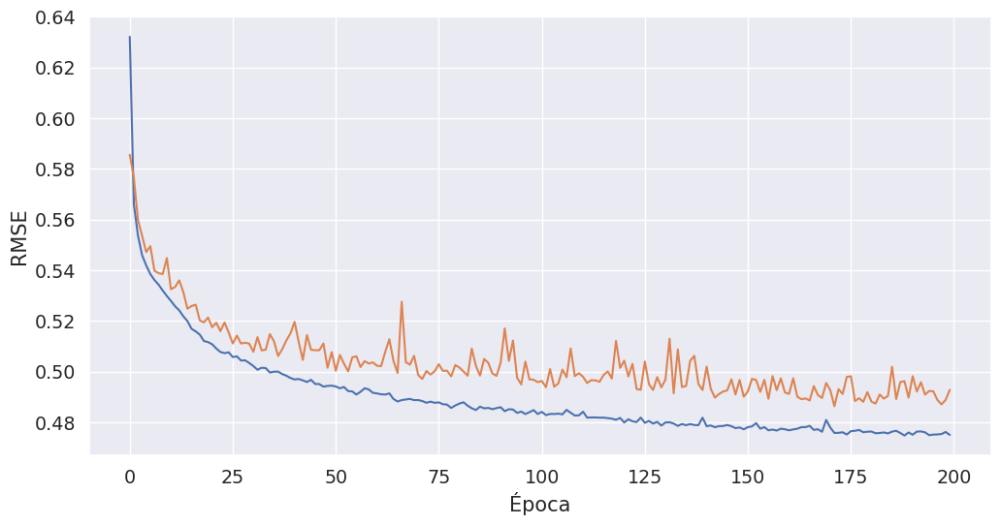

In [44]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")

Vemos que es un poco menos errático el aprendizaje, qué otra cosa podemos hacer para mejorar el entrenamiento como tal:

Hint: Qué cosa se encarga de modificar los pesos una vez calculados los gradientes?

Probamos cambiar el [optmizador](https://keras.io/api/optimizers/) a uno mejor:

mejor==no usar solo el gradiente. Usamos Adam de optmizador

In [45]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [46]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=200,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/200
   32/12384 [..............................] - ETA: 29s - loss: 1.4641

 1472/12384 [==>...........................] - ETA: 0s - loss: 1.0762 

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.8869

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.7633

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.6895

 7712/12384 [=================>............] - ETA: 0s - loss: 0.6418

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.6116

10592/12384 [========================>.....] - ETA: 0s - loss: 0.5941

12192/12384 [============================>.] - ETA: 0s - loss: 0.5693

12384/12384 [==============================] - 1s 58us/step - loss: 0.5659 - val_loss: 0.4184


Epoch 2/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4105

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.3836

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.4092

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.3995

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.3966

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.3911

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.3842

11008/12384 [=========================>....] - ETA: 0s - loss: 0.3840

12384/12384 [==============================] - 1s 48us/step - loss: 0.3798 - val_loss: 0.3680


Epoch 3/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3061

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.3556

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.3704

 4064/12384 [========>.....................] - ETA: 0s - loss: 0.3633

 5376/12384 [============>.................] - ETA: 0s - loss: 0.3476

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.3487

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.3473

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.3492

11552/12384 [==========================>...] - ETA: 0s - loss: 0.3442

12384/12384 [==============================] - 1s 55us/step - loss: 0.3455 - val_loss: 0.3494


Epoch 4/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3704

 1152/12384 [=>............................] - ETA: 0s - loss: 0.3393

 2656/12384 [=====>........................] - ETA: 0s - loss: 0.3433

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.3455

 5728/12384 [============>.................] - ETA: 0s - loss: 0.3409

 7296/12384 [================>.............] - ETA: 0s - loss: 0.3391

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.3354

10240/12384 [=======================>......] - ETA: 0s - loss: 0.3299

11712/12384 [===========================>..] - ETA: 0s - loss: 0.3327

12384/12384 [==============================] - 1s 53us/step - loss: 0.3325 - val_loss: 0.3388


Epoch 5/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2486

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.3555

 2656/12384 [=====>........................] - ETA: 0s - loss: 0.3356

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.3272

 5696/12384 [============>.................] - ETA: 0s - loss: 0.3415

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.3365

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.3360

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.3324

10624/12384 [========================>.....] - ETA: 0s - loss: 0.3304

12160/12384 [============================>.] - ETA: 0s - loss: 0.3259

12384/12384 [==============================] - 1s 56us/step - loss: 0.3256 - val_loss: 0.3339


Epoch 6/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2906

 1216/12384 [=>............................] - ETA: 0s - loss: 0.3274

 2272/12384 [====>.........................] - ETA: 0s - loss: 0.3213

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.3196

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.3195

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.3209

 7808/12384 [=================>............] - ETA: 0s - loss: 0.3240

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.3264

11008/12384 [=========================>....] - ETA: 0s - loss: 0.3240

12384/12384 [==============================] - 1s 56us/step - loss: 0.3205 - val_loss: 0.3296


Epoch 7/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2940

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.3211

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.3056

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.3124

 5984/12384 [=============>................] - ETA: 0s - loss: 0.3165

 7680/12384 [=================>............] - ETA: 0s - loss: 0.3148

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.3157

10976/12384 [=========================>....] - ETA: 0s - loss: 0.3174

12384/12384 [==============================] - 1s 49us/step - loss: 0.3169 - val_loss: 0.3250


Epoch 8/200
   32/12384 [..............................] - ETA: 0s - loss: 0.6874

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.3104

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.3168

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.3234

 5824/12384 [=============>................] - ETA: 0s - loss: 0.3175

 7488/12384 [=================>............] - ETA: 0s - loss: 0.3152

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.3167

10848/12384 [=========================>....] - ETA: 0s - loss: 0.3122

12384/12384 [==============================] - 1s 49us/step - loss: 0.3137 - val_loss: 0.3210


Epoch 9/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4553

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.3390

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.3199

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.3118

 5920/12384 [=============>................] - ETA: 0s - loss: 0.3098

 7552/12384 [=================>............] - ETA: 0s - loss: 0.3128

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.3111

10720/12384 [========================>.....] - ETA: 0s - loss: 0.3116

12128/12384 [============================>.] - ETA: 0s - loss: 0.3102

12384/12384 [==============================] - 1s 50us/step - loss: 0.3096 - val_loss: 0.3175


Epoch 10/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2332

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.3159

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.3097

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.3186

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.3161

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.3131

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.3094

11744/12384 [===========================>..] - ETA: 0s - loss: 0.3071

12384/12384 [==============================] - 1s 46us/step - loss: 0.3063 - val_loss: 0.3129


Epoch 11/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2903

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.3211

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.3136

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2996

 6080/12384 [=============>................] - ETA: 0s - loss: 0.3079

 7616/12384 [=================>............] - ETA: 0s - loss: 0.3064

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.3073

10816/12384 [=========================>....] - ETA: 0s - loss: 0.3041

12384/12384 [==============================] - 1s 51us/step - loss: 0.3031 - val_loss: 0.3107


Epoch 12/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3823

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2905

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2846

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2944

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2959

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2991

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2995

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2997

12384/12384 [==============================] - 1s 48us/step - loss: 0.2994 - val_loss: 0.3073


Epoch 13/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2755

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2894

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2943

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2919

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2952

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.3010

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2964

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2948

12384/12384 [==============================] - 1s 51us/step - loss: 0.2963 - val_loss: 0.3046


Epoch 14/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3075

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2853

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2870

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2908

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2821

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2868

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2913

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2932

12384/12384 [==============================] - 1s 49us/step - loss: 0.2929 - val_loss: 0.3014


Epoch 15/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1851

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.3066

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2969

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2840

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2859

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2889

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2904

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2892

12384/12384 [==============================] - 1s 47us/step - loss: 0.2898 - val_loss: 0.2990


Epoch 16/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4631

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2916

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2752

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2762

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2771

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2785

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2819

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2836

12384/12384 [==============================] - 1s 49us/step - loss: 0.2871 - val_loss: 0.2968


Epoch 17/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3127

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3130

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2969

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2926

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2842

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2838

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2868

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2867

12000/12384 [============================>.] - ETA: 0s - loss: 0.2841

12384/12384 [==============================] - 1s 50us/step - loss: 0.2848 - val_loss: 0.2954


Epoch 18/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2330

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2936

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2870

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2770

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2839



 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2845

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2862

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2844

12384/12384 [==============================] - 1s 48us/step - loss: 0.2826 - val_loss: 0.2934


Epoch 19/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2353

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2935

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2978

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2914

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2841

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2893

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2889

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2841

12000/12384 [============================>.] - ETA: 0s - loss: 0.2807

12384/12384 [==============================] - 1s 50us/step - loss: 0.2806 - val_loss: 0.2910


Epoch 20/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1957

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2562

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2681

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2614

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2669

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2689

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2706

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2728

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2784

12384/12384 [==============================] - 1s 52us/step - loss: 0.2785 - val_loss: 0.2894


Epoch 21/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2494

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2616

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2663

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2728

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2796

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2782

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2773

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2780

12384/12384 [==============================] - 1s 47us/step - loss: 0.2773 - val_loss: 0.2875


Epoch 22/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2638

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2741

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2609

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2623

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2577

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2680

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2705

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2736

12224/12384 [============================>.] - ETA: 0s - loss: 0.2753

12384/12384 [==============================] - 1s 49us/step - loss: 0.2752 - val_loss: 0.2851


Epoch 23/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4098

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2486

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2633

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2639

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2646

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2718

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2726

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2729

12096/12384 [============================>.] - ETA: 0s - loss: 0.2748

12384/12384 [==============================] - 1s 50us/step - loss: 0.2739 - val_loss: 0.2841


Epoch 24/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2851

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2673

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2985

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2812

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2776

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2788

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2742

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2763

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2733

12384/12384 [==============================] - 1s 53us/step - loss: 0.2729 - val_loss: 0.2840


Epoch 25/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1291

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2824

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2646

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2635

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2774

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2759

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2740

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2713

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2721

12384/12384 [==============================] - 1s 53us/step - loss: 0.2715 - val_loss: 0.2832


Epoch 26/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1575

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2752

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2678

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2648

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2687

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2701

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2719

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2708

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2712

12384/12384 [==============================] - 1s 53us/step - loss: 0.2705 - val_loss: 0.2817


Epoch 27/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2609

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2297

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2471

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2574

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2605

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2588

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2633

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2660

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2669

12384/12384 [==============================] - 1s 57us/step - loss: 0.2693 - val_loss: 0.2818


Epoch 28/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5520

 1216/12384 [=>............................] - ETA: 0s - loss: 0.2528

 2496/12384 [=====>........................] - ETA: 0s - loss: 0.2641

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2669

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2630

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2635

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2630

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2661

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2678

12384/12384 [==============================] - 1s 57us/step - loss: 0.2685 - val_loss: 0.2800


Epoch 29/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3396

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2604

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2593

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2690

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2650

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2653

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2700

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2702

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2653

12384/12384 [==============================] - 1s 54us/step - loss: 0.2675 - val_loss: 0.2795


Epoch 30/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2543

  992/12384 [=>............................] - ETA: 0s - loss: 0.2766

 2336/12384 [====>.........................] - ETA: 0s - loss: 0.2622

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.2652

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2662

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2711

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2707

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2687

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2668

12384/12384 [==============================] - 1s 54us/step - loss: 0.2668 - val_loss: 0.2788


Epoch 31/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2359

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2835

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2854

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2769

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2730



 7488/12384 [=================>............] - ETA: 0s - loss: 0.2633

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2621

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2662

12000/12384 [============================>.] - ETA: 0s - loss: 0.2666

12384/12384 [==============================] - 1s 51us/step - loss: 0.2663 - val_loss: 0.2782


Epoch 32/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2628

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2606

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2677

 4064/12384 [========>.....................] - ETA: 0s - loss: 0.2605

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2741

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2708

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2699

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2682

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2690

12032/12384 [============================>.] - ETA: 0s - loss: 0.2660

12384/12384 [==============================] - 1s 58us/step - loss: 0.2661 - val_loss: 0.2789


Epoch 33/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3330

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2521

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2647

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2612

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2581

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2596

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2580

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2580

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2634

12384/12384 [==============================] - 1s 53us/step - loss: 0.2652 - val_loss: 0.2788


Epoch 34/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2185

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2794

 2304/12384 [====>.........................] - ETA: 0s - loss: 0.2717

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2659

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2627

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2603

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2619

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2631

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2662

12384/12384 [==============================] - 1s 54us/step - loss: 0.2649 - val_loss: 0.2773


Epoch 35/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2917

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2651

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2643

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2675

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2676

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2688

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2693

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2670

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2656

12384/12384 [==============================] - 1s 53us/step - loss: 0.2642 - val_loss: 0.2768


Epoch 36/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2093

 1088/12384 [=>............................] - ETA: 0s - loss: 0.2891

 2464/12384 [====>.........................] - ETA: 0s - loss: 0.2615

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2551

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2655

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2625

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2621

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2627

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2637

12192/12384 [============================>.] - ETA: 0s - loss: 0.2642

12384/12384 [==============================] - 1s 56us/step - loss: 0.2639 - val_loss: 0.2757


Epoch 37/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4349

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2731

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2750

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2664

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2687

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2581

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2571

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2591

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2608

12384/12384 [==============================] - 1s 54us/step - loss: 0.2634 - val_loss: 0.2750


Epoch 38/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1086

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2718

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2810

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2809

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2763

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2685

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2670

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2705

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2655

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2633

12384/12384 [==============================] - 1s 56us/step - loss: 0.2631 - val_loss: 0.2765


Epoch 39/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1848

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2780

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2633

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2664

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2721

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2698

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2694

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2671

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2646

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2636

12384/12384 [==============================] - 1s 54us/step - loss: 0.2629 - val_loss: 0.2739


Epoch 40/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3265

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2547

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2591

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2525

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2560

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2610

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2612

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2629

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2602

12384/12384 [==============================] - 1s 51us/step - loss: 0.2622 - val_loss: 0.2747


Epoch 41/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2370

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2702

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2617

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2604

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2598

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2632

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2615

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2603

12384/12384 [==============================] - 1s 45us/step - loss: 0.2619 - val_loss: 0.2744


Epoch 42/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2402

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2730

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2533

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2561

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2621

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2613

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2587

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2621

12096/12384 [============================>.] - ETA: 0s - loss: 0.2620

12384/12384 [==============================] - 1s 49us/step - loss: 0.2619 - val_loss: 0.2731


Epoch 43/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1469

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2534

 2560/12384 [=====>........................] - ETA: 0s - loss: 0.2495

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2535

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2515

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2576

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2653

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2622

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2592

12384/12384 [==============================] - 1s 50us/step - loss: 0.2610 - val_loss: 0.2753


Epoch 44/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2635

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2552

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2668

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2581

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2619



 7584/12384 [=================>............] - ETA: 0s - loss: 0.2541

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2553

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2602

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2599

12384/12384 [==============================] - 1s 48us/step - loss: 0.2609 - val_loss: 0.2729


Epoch 45/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5759

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2519

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2660

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2666

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2653

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2630

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2634

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2638

12224/12384 [============================>.] - ETA: 0s - loss: 0.2614

12384/12384 [==============================] - 1s 47us/step - loss: 0.2603 - val_loss: 0.2729


Epoch 46/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1920

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2729

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2668

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2724

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2651

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2604

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2595

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2601

12384/12384 [==============================] - 1s 46us/step - loss: 0.2602 - val_loss: 0.2733


Epoch 47/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3355

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2387

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2418

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2436

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2542

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2550

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2546

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2593

12384/12384 [==============================] - 1s 46us/step - loss: 0.2598 - val_loss: 0.2721


Epoch 48/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3497

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2620

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2709

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2556

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2510

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2534

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2549

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2603

12384/12384 [==============================] - 1s 44us/step - loss: 0.2592 - val_loss: 0.2731


Epoch 49/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2833

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2442

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2483

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2557

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2655

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2627

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2605

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2608

12256/12384 [============================>.] - ETA: 0s - loss: 0.2596

12384/12384 [==============================] - 1s 48us/step - loss: 0.2589 - val_loss: 0.2740


Epoch 50/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2519

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2726

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2762

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2809

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2728

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2649

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2605

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2612

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2583

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2598

12384/12384 [==============================] - 1s 56us/step - loss: 0.2591 - val_loss: 0.2716


Epoch 51/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2800

 1152/12384 [=>............................] - ETA: 0s - loss: 0.2601

 2368/12384 [====>.........................] - ETA: 0s - loss: 0.2758

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2698

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2664

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2617

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2602

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2603

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2595

12384/12384 [==============================] - 1s 52us/step - loss: 0.2587 - val_loss: 0.2707


Epoch 52/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1454

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2597

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2665

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2596

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2618

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2590

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2644

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2607



11040/12384 [=========================>....] - ETA: 0s - loss: 0.2594

12384/12384 [==============================] - 1s 51us/step - loss: 0.2586 - val_loss: 0.2709


Epoch 53/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1657

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2497

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2639

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2562

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2556

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2566

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2610

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2585

12352/12384 [============================>.] - ETA: 0s - loss: 0.2582

12384/12384 [==============================] - 1s 47us/step - loss: 0.2581 - val_loss: 0.2700


Epoch 54/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2066

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2538

 2656/12384 [=====>........................] - ETA: 0s - loss: 0.2600

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2573

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2506

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2538

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2543

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2557

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2591

12384/12384 [==============================] - 1s 51us/step - loss: 0.2579 - val_loss: 0.2725


Epoch 55/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2189

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2341

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2651

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2602

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2623

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2583

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2570

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2591

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2576

12384/12384 [==============================] - 1s 53us/step - loss: 0.2579 - val_loss: 0.2708


Epoch 56/200
   32/12384 [..............................] - ETA: 2s - loss: 0.2284

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2579

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2535

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2588

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2601

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2622

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2593

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2613

12224/12384 [============================>.] - ETA: 0s - loss: 0.2580

12384/12384 [==============================] - 1s 49us/step - loss: 0.2576 - val_loss: 0.2694


Epoch 57/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1147

 1152/12384 [=>............................] - ETA: 0s - loss: 0.2417

 2176/12384 [====>.........................] - ETA: 0s - loss: 0.2613

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2641

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2539

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2531

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2475

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2518

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2547

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2564

12384/12384 [==============================] - 1s 55us/step - loss: 0.2569 - val_loss: 0.2734


Epoch 58/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2289

  896/12384 [=>............................] - ETA: 0s - loss: 0.2465

 2272/12384 [====>.........................] - ETA: 0s - loss: 0.2401

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2453

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2469

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2504

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2583

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2548

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2570

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2583

12384/12384 [==============================] - 1s 54us/step - loss: 0.2573 - val_loss: 0.2691


Epoch 59/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1978

  928/12384 [=>............................] - ETA: 0s - loss: 0.2640

 2464/12384 [====>.........................] - ETA: 0s - loss: 0.2796

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2666

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2641

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2653

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2624

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2608

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2585

12320/12384 [============================>.] - ETA: 0s - loss: 0.2568

12384/12384 [==============================] - 1s 52us/step - loss: 0.2562 - val_loss: 0.2702


Epoch 60/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1657

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2643

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2571

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2527

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2620

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2670

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2615

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2590

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2556

12384/12384 [==============================] - 1s 54us/step - loss: 0.2566 - val_loss: 0.2687


Epoch 61/200
   32/12384 [..............................] - ETA: 2s - loss: 0.1963

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2490

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2558

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2573

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2550

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2552

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2562

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2547

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2562

12384/12384 [==============================] - 1s 51us/step - loss: 0.2557 - val_loss: 0.2698


Epoch 62/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2734

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2703

 2560/12384 [=====>........................] - ETA: 0s - loss: 0.2613

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2582

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2663

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2612

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2591

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2598

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2586

12128/12384 [============================>.] - ETA: 0s - loss: 0.2557

12384/12384 [==============================] - 1s 56us/step - loss: 0.2557 - val_loss: 0.2679


Epoch 63/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2097

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2567

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2532

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2486

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2514

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2547

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2540

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2535

12288/12384 [============================>.] - ETA: 0s - loss: 0.2559

12384/12384 [==============================] - 1s 48us/step - loss: 0.2555 - val_loss: 0.2691


Epoch 64/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1910

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2596

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2534

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2588

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2544

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2528

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2512

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2532

12384/12384 [==============================] - 1s 45us/step - loss: 0.2557 - val_loss: 0.2691


Epoch 65/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2425

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2636

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2589

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2482

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2487

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2564

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2555

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2576

12384/12384 [==============================] - 1s 47us/step - loss: 0.2554 - val_loss: 0.2673


Epoch 66/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2887

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2641

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2531

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2432

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2468

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2502

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2497

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2511

12384/12384 [==============================] - 1s 45us/step - loss: 0.2553 - val_loss: 0.2680


Epoch 67/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2473

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2501

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2601

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2532

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2542

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2529

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2506

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2511

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2558

12384/12384 [==============================] - 1s 50us/step - loss: 0.2548 - val_loss: 0.2674


Epoch 68/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1356

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2526

 2368/12384 [====>.........................] - ETA: 0s - loss: 0.2702

 4096/12384 [========>.....................] - ETA: 0s - loss: 0.2605

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2575

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2529

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2522

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2538

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2537

12384/12384 [==============================] - 1s 49us/step - loss: 0.2545 - val_loss: 0.2685


Epoch 69/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1905

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2543

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2416

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2395

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2465

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2501

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2521

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2521

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2544

12384/12384 [==============================] - 1s 52us/step - loss: 0.2544 - val_loss: 0.2679


Epoch 70/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3352

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2602

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2569

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2632

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2562

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2555

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2563

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2578

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2559

12384/12384 [==============================] - 1s 51us/step - loss: 0.2540 - val_loss: 0.2663


Epoch 71/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2352

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2650

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2577

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2503

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2506

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2454

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2561

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2543

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2539

12384/12384 [==============================] - 1s 50us/step - loss: 0.2540 - val_loss: 0.2680


Epoch 72/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1849

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2418

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2460

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2547

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2591

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2527

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2558

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2543

12352/12384 [============================>.] - ETA: 0s - loss: 0.2540

12384/12384 [==============================] - 1s 47us/step - loss: 0.2538 - val_loss: 0.2665


Epoch 73/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1447

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2429

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2645

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2617

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2599

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2624

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2575

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2574

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2545

12384/12384 [==============================] - 1s 49us/step - loss: 0.2536 - val_loss: 0.2668


Epoch 74/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3638

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2543

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2545

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2540

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2554

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2574

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2563

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2559

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2549

12384/12384 [==============================] - 1s 52us/step - loss: 0.2532 - val_loss: 0.2654


Epoch 75/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2273

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2651

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2535

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2497

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2517

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2525

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2530

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2561

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2535

12384/12384 [==============================] - 1s 50us/step - loss: 0.2533 - val_loss: 0.2667


Epoch 76/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2042

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2799

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2784

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2630

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2612

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2605

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2599

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2546

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2547

12384/12384 [==============================] - 1s 51us/step - loss: 0.2532 - val_loss: 0.2670


Epoch 77/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3628

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2646

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2531

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2492

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2469

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2484

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2462

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2488

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2511

12384/12384 [==============================] - 1s 49us/step - loss: 0.2530 - val_loss: 0.2645


Epoch 78/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3544

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2559

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2492

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2487

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2450

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2484

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2494

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2511

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2530

12384/12384 [==============================] - 1s 49us/step - loss: 0.2528 - val_loss: 0.2667


Epoch 79/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1784

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2428

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2478

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2542

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2492

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2529

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2501

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2537

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2545

12384/12384 [==============================] - 1s 54us/step - loss: 0.2525 - val_loss: 0.2679


Epoch 80/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1464

  960/12384 [=>............................] - ETA: 0s - loss: 0.2446

 2112/12384 [====>.........................] - ETA: 0s - loss: 0.2534

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2507

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2483

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2464

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2552

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2523

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2538

12384/12384 [==============================] - 1s 51us/step - loss: 0.2521 - val_loss: 0.2649


Epoch 81/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2142

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2616

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2525

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2541

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2512

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2473

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2514

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2521

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2507

12352/12384 [============================>.] - ETA: 0s - loss: 0.2513

12384/12384 [==============================] - 1s 52us/step - loss: 0.2520 - val_loss: 0.2655


Epoch 82/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4475

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2826

 2144/12384 [====>.........................] - ETA: 0s - loss: 0.2726

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2774

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2631

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2590

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2591

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2557

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2543

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2546

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2545

12384/12384 [==============================] - 1s 62us/step - loss: 0.2515 - val_loss: 0.2659


Epoch 83/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2132

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2530

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2342

 4064/12384 [========>.....................] - ETA: 0s - loss: 0.2419

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2450

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2447

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2517

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2509

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2511

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2502

12384/12384 [==============================] - 1s 53us/step - loss: 0.2519 - val_loss: 0.2657


Epoch 84/200
   32/12384 [..............................] - ETA: 2s - loss: 0.3347

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2567

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2641

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2575

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2566

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2535

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2556

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2566

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2529

12384/12384 [==============================] - 1s 53us/step - loss: 0.2514 - val_loss: 0.2641


Epoch 85/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1561

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2393

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2340

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2460

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2506

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2572

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2543

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2491

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2510

12384/12384 [==============================] - 1s 52us/step - loss: 0.2510 - val_loss: 0.2636


Epoch 86/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3749

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2864

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2591

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2576

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2533

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2555

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2521

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2534

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2530

12384/12384 [==============================] - 1s 49us/step - loss: 0.2509 - val_loss: 0.2668


Epoch 87/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1862

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2686

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2557

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2627

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2531

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2531

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2543

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2509

12384/12384 [==============================] - 1s 46us/step - loss: 0.2509 - val_loss: 0.2641


Epoch 88/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4079

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2447

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2474

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2593

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2560

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2554

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2564

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2545

12384/12384 [==============================] - 1s 43us/step - loss: 0.2506 - val_loss: 0.2643


Epoch 89/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3916

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2324

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2374

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2420

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2463

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2476

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2515

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2536

12384/12384 [==============================] - 1s 47us/step - loss: 0.2504 - val_loss: 0.2637


Epoch 90/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1259

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2522

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2398

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2510

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2515



 7840/12384 [=================>............] - ETA: 0s - loss: 0.2529



 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2549

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2522

12384/12384 [==============================] - 1s 46us/step - loss: 0.2502 - val_loss: 0.2635


Epoch 91/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2576

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2492

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2548

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2474

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2456

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2503

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2524

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2517

12384/12384 [==============================] - 1s 44us/step - loss: 0.2503 - val_loss: 0.2629


Epoch 92/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3303

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2437

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2458

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2575

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2571

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2524

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2501

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2503

12384/12384 [==============================] - 1s 46us/step - loss: 0.2501 - val_loss: 0.2630


Epoch 93/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1499

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2399

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2461

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2500

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2548

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2551

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2539

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2541

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2508

12384/12384 [==============================] - 1s 49us/step - loss: 0.2496 - val_loss: 0.2619


Epoch 94/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1878

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2502

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2520

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2601

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2571

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2560

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2521

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2506

12384/12384 [==============================] - 1s 47us/step - loss: 0.2496 - val_loss: 0.2620


Epoch 95/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3903

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2528

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2411

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2499

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2559

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2537

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2538

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 46us/step - loss: 0.2495 - val_loss: 0.2621


Epoch 96/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2105

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2623

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2449

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2484

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2552

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2484

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2524

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2498

12384/12384 [==============================] - 1s 47us/step - loss: 0.2489 - val_loss: 0.2650


Epoch 97/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2131

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2481

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2481

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2485

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2503

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2506

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2477

12384/12384 [==============================] - 1s 46us/step - loss: 0.2491 - val_loss: 0.2619


Epoch 98/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2483

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2312

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2312

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2345

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2383

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2450

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2454

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2478

12384/12384 [==============================] - 1s 46us/step - loss: 0.2487 - val_loss: 0.2617


Epoch 99/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3577

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2658

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2425

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2393

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2337

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2366

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2408

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2461

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2458

12384/12384 [==============================] - 1s 50us/step - loss: 0.2482 - val_loss: 0.2630


Epoch 100/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1902

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2444

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2424

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2437

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2490

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2470

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2480

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2514

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2500

12384/12384 [==============================] - 1s 50us/step - loss: 0.2486 - val_loss: 0.2615


Epoch 101/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1792

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2116

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2251

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2368

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2400

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2386

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2386



10368/12384 [========================>.....] - ETA: 0s - loss: 0.2434

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2485

12384/12384 [==============================] - 1s 49us/step - loss: 0.2484 - val_loss: 0.2609


Epoch 102/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3159

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2496

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2373

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2414

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2392

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2429

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2466

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2483

12384/12384 [==============================] - 1s 48us/step - loss: 0.2479 - val_loss: 0.2605


Epoch 103/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1856

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2321

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2409

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2405

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2434

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2449

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2430

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2435

12384/12384 [==============================] - 1s 47us/step - loss: 0.2476 - val_loss: 0.2612


Epoch 104/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3909

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2719

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2591

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2486

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2568

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2563

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2584

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2517

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2512

12384/12384 [==============================] - 1s 51us/step - loss: 0.2476 - val_loss: 0.2594


Epoch 105/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1884

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2359

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2351

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2436

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2499

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2456

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2461

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2464

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2469

12384/12384 [==============================] - 1s 55us/step - loss: 0.2475 - val_loss: 0.2599


Epoch 106/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3224

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2588

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2615

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2523

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2526

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2528

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2477

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2464

12384/12384 [==============================] - 1s 45us/step - loss: 0.2467 - val_loss: 0.2608


Epoch 107/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1774

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2303

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2366

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2372

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2371

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2351

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2382

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2458

12384/12384 [==============================] - 1s 44us/step - loss: 0.2470 - val_loss: 0.2604


Epoch 108/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1619

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2577

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2440

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2430

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2448

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2476

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2485

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2462

12384/12384 [==============================] - 1s 46us/step - loss: 0.2461 - val_loss: 0.2620


Epoch 109/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1911

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2488

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2515

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2492

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2491

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2468

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2502

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2488

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2484

12384/12384 [==============================] - 1s 51us/step - loss: 0.2466 - val_loss: 0.2592


Epoch 110/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3600

 1216/12384 [=>............................] - ETA: 0s - loss: 0.2410

 2560/12384 [=====>........................] - ETA: 0s - loss: 0.2679

 3904/12384 [========>.....................] - ETA: 0s - loss: 0.2563

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2538

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2472

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2465

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2487

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2449

12384/12384 [==============================] - 1s 47us/step - loss: 0.2464 - val_loss: 0.2585


Epoch 111/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5056

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2423

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2298

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2425

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2445

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2413

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2482

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2454

12384/12384 [==============================] - 1s 46us/step - loss: 0.2463 - val_loss: 0.2597


Epoch 112/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1938

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2126

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2245

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2280

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2367

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2412

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2421

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2450

12384/12384 [==============================] - 1s 44us/step - loss: 0.2456 - val_loss: 0.2597


Epoch 113/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3486

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2485

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2517

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2512

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2433

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2420

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2416

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2435

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 52us/step - loss: 0.2455 - val_loss: 0.2592


Epoch 114/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1889

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2284

 2560/12384 [=====>........................] - ETA: 0s - loss: 0.2371

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2428

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2465

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2533

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2527

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2510

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2483

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2483

12384/12384 [==============================] - 1s 58us/step - loss: 0.2457 - val_loss: 0.2583


Epoch 115/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3349

 1184/12384 [=>............................] - ETA: 0s - loss: 0.2689

 2496/12384 [=====>........................] - ETA: 0s - loss: 0.2610

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2679

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2614

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2534

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2513

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2496

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2477

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2463

12256/12384 [============================>.] - ETA: 0s - loss: 0.2448

12384/12384 [==============================] - 1s 59us/step - loss: 0.2450 - val_loss: 0.2606


Epoch 116/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2300

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2543

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2347

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2391

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2453

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2457

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2425

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2438

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2450

12128/12384 [============================>.] - ETA: 0s - loss: 0.2451

12384/12384 [==============================] - 1s 52us/step - loss: 0.2453 - val_loss: 0.2574


Epoch 117/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1883

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2360

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2436

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2446

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2423

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2405

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2455

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2460

12384/12384 [==============================] - 1s 46us/step - loss: 0.2451 - val_loss: 0.2578


Epoch 118/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2686

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2466

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2309

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2386

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2408

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2442

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2403

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2440

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2461

12384/12384 [==============================] - 1s 49us/step - loss: 0.2445 - val_loss: 0.2584


Epoch 119/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1688

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2498

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2439

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2405

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2430

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2413

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2451

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2460

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2438

12384/12384 [==============================] - 1s 50us/step - loss: 0.2442 - val_loss: 0.2561


Epoch 120/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0972

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2296

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2241

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2296

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2294

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2334

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2341

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2362

12384/12384 [==============================] - 1s 46us/step - loss: 0.2442 - val_loss: 0.2584


Epoch 121/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3981

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2328

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2469

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2431

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2418

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2445

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2413

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2435

12384/12384 [==============================] - 1s 47us/step - loss: 0.2441 - val_loss: 0.2576


Epoch 122/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1848

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2120

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2299

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2349

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2456

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2443

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2445

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 46us/step - loss: 0.2441 - val_loss: 0.2571


Epoch 123/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3567

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2481

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2438

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2456

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2487

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2474

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2447

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2453

12384/12384 [==============================] - 1s 43us/step - loss: 0.2436 - val_loss: 0.2563


Epoch 124/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1841

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2440

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2381

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2414

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2472

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2418

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2445

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2414

12320/12384 [============================>.] - ETA: 0s - loss: 0.2435

12384/12384 [==============================] - 1s 48us/step - loss: 0.2435 - val_loss: 0.2562


Epoch 125/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1653

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2334

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2357

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2311

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2385

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2367

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2420

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2399

12352/12384 [============================>.] - ETA: 0s - loss: 0.2434

12384/12384 [==============================] - 1s 48us/step - loss: 0.2434 - val_loss: 0.2554


Epoch 126/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2491

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2493

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2444

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2440

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2403

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2402

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2441

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2440

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2421

12384/12384 [==============================] - 1s 47us/step - loss: 0.2432 - val_loss: 0.2555


Epoch 127/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4058

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2470

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2390

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2328

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2357

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2374

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2417

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2429

12384/12384 [==============================] - 1s 47us/step - loss: 0.2433 - val_loss: 0.2569


Epoch 128/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1945

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2347

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2447

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2467

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2483

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2495

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2462

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2430

12384/12384 [==============================] - 1s 44us/step - loss: 0.2428 - val_loss: 0.2563


Epoch 129/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1156

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2634

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2559

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2560

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2494

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2489

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2464



10848/12384 [=========================>....] - ETA: 0s - loss: 0.2424

12384/12384 [==============================] - 1s 47us/step - loss: 0.2429 - val_loss: 0.2561


Epoch 130/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1794

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2406

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2508

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2391

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2432

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2388

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2416

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2423

12384/12384 [==============================] - 1s 44us/step - loss: 0.2422 - val_loss: 0.2543


Epoch 131/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2301

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2569

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2508

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2549

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2486



 7840/12384 [=================>............] - ETA: 0s - loss: 0.2484

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2480

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2439

12384/12384 [==============================] - 1s 45us/step - loss: 0.2423 - val_loss: 0.2561


Epoch 132/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3681

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2158

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2349

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2373

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2454

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2486

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2463

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2446

12384/12384 [==============================] - 1s 45us/step - loss: 0.2423 - val_loss: 0.2550


Epoch 133/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1370

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2403

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2363

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2440

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2419

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2431

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2397

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2386

12160/12384 [============================>.] - ETA: 0s - loss: 0.2421

12384/12384 [==============================] - 1s 50us/step - loss: 0.2423 - val_loss: 0.2554


Epoch 134/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1166

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2612

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2547

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2579

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2522

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2498

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2460

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2446

12384/12384 [==============================] - 1s 47us/step - loss: 0.2417 - val_loss: 0.2560


Epoch 135/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0865

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2486

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2422

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2431

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2393

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2378

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2406

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2425

12352/12384 [============================>.] - ETA: 0s - loss: 0.2416

12384/12384 [==============================] - 1s 48us/step - loss: 0.2416 - val_loss: 0.2547


Epoch 136/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2938

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2290

 2528/12384 [=====>........................] - ETA: 0s - loss: 0.2277

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2417

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2382

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2399

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2370

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2373

12160/12384 [============================>.] - ETA: 0s - loss: 0.2422

12384/12384 [==============================] - 1s 48us/step - loss: 0.2418 - val_loss: 0.2531


Epoch 137/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2881

 1024/12384 [=>............................] - ETA: 0s - loss: 0.2302

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2281

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2321

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2316

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2381

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2362

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2376

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2390

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2401

12384/12384 [==============================] - 1s 53us/step - loss: 0.2420 - val_loss: 0.2553


Epoch 138/200


   32/12384 [..............................] - ETA: 1s - loss: 0.2105

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2569

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2482

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2480

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2470

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2407

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2459

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2424

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2403

12288/12384 [============================>.] - ETA: 0s - loss: 0.2412

12384/12384 [==============================] - 1s 53us/step - loss: 0.2415 - val_loss: 0.2543


Epoch 139/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1951

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2259

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2233

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2192

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2301

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2313

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2363

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2417

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2422

12096/12384 [============================>.] - ETA: 0s - loss: 0.2420

12384/12384 [==============================] - 1s 57us/step - loss: 0.2416 - val_loss: 0.2559


Epoch 140/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1657

  928/12384 [=>............................] - ETA: 0s - loss: 0.2195

 2080/12384 [====>.........................] - ETA: 0s - loss: 0.2298

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2276

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2284

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2337

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2383

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2370

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2409

12384/12384 [==============================] - 1s 52us/step - loss: 0.2410 - val_loss: 0.2528


Epoch 141/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3002

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2558

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2364

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2373

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2349

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2417

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2424

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 46us/step - loss: 0.2408 - val_loss: 0.2532


Epoch 142/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1379

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2270

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2334

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2391

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2385

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2394

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2419

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2400

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2411

12384/12384 [==============================] - 1s 49us/step - loss: 0.2406 - val_loss: 0.2543


Epoch 143/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1506

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2424

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2364

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2427

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2419

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2406

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2412

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 46us/step - loss: 0.2406 - val_loss: 0.2525


Epoch 144/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0930

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2308

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2346

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2347

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2372

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2413

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2391

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2408

12384/12384 [==============================] - 1s 47us/step - loss: 0.2406 - val_loss: 0.2546


Epoch 145/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3431

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2493

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2368

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2381

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2369

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2404

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2420

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2412

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2448

12384/12384 [==============================] - 1s 48us/step - loss: 0.2403 - val_loss: 0.2525


Epoch 146/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1983

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2393

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2273

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2329

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2331

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2352

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2365

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2419

12384/12384 [==============================] - 1s 46us/step - loss: 0.2401 - val_loss: 0.2535


Epoch 147/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1303

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2530

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2500

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2464

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2387

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2387

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2430

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2414

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2402

12384/12384 [==============================] - 1s 50us/step - loss: 0.2399 - val_loss: 0.2523


Epoch 148/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1622

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2109

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2299

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2346

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2347

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2376

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2382

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2376

12320/12384 [============================>.] - ETA: 0s - loss: 0.2401

12384/12384 [==============================] - 1s 49us/step - loss: 0.2401 - val_loss: 0.2520


Epoch 149/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2152

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2217

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2255

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2253

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2359

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2392

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2366

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2351



12320/12384 [============================>.] - ETA: 0s - loss: 0.2394

12384/12384 [==============================] - 1s 49us/step - loss: 0.2401 - val_loss: 0.2518


Epoch 150/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3159

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2267

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2180

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2332

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2426

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2451

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2448

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2414

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2392

12384/12384 [==============================] - 1s 51us/step - loss: 0.2393 - val_loss: 0.2523


Epoch 151/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2023

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2456

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2361

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2354

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2310

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2322

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2326

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 46us/step - loss: 0.2395 - val_loss: 0.2520


Epoch 152/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2741

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2539

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2511

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2426

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2343

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2352



 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2401

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2415

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2400

12384/12384 [==============================] - 1s 49us/step - loss: 0.2393 - val_loss: 0.2528


Epoch 153/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4089

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2610

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2553

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2462

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2405

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2392

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2370

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2359

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2362

12384/12384 [==============================] - 1s 49us/step - loss: 0.2393 - val_loss: 0.2508


Epoch 154/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1842

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2436

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2425

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2450

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2443

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2407

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2408

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2359

12096/12384 [============================>.] - ETA: 0s - loss: 0.2397

12384/12384 [==============================] - 1s 47us/step - loss: 0.2391 - val_loss: 0.2509


Epoch 155/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1775

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2491

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2352

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2369

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2342

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2344

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2368

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2386

12032/12384 [============================>.] - ETA: 0s - loss: 0.2393

12384/12384 [==============================] - 1s 50us/step - loss: 0.2387 - val_loss: 0.2511


Epoch 156/200
   32/12384 [..............................] - ETA: 2s - loss: 0.2480

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2691

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2477

 4096/12384 [========>.....................] - ETA: 0s - loss: 0.2565

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2514

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2422

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2434

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2412

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2395

12384/12384 [==============================] - 1s 49us/step - loss: 0.2392 - val_loss: 0.2509


Epoch 157/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1450

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2411

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2471

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2456

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2421

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2435

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2392

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2383

12384/12384 [==============================] - 1s 47us/step - loss: 0.2384 - val_loss: 0.2510


Epoch 158/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1271

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2288

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2331

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2385

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2488

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2434

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2415

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2410

12320/12384 [============================>.] - ETA: 0s - loss: 0.2390

12384/12384 [==============================] - 1s 47us/step - loss: 0.2384 - val_loss: 0.2506


Epoch 159/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5103

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2535

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2521

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2420

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2382

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2422

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2397

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2399

12384/12384 [==============================] - 1s 46us/step - loss: 0.2382 - val_loss: 0.2500


Epoch 160/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2624

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2368

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2340

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2334

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2313

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2303

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2355

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2363

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2382

12384/12384 [==============================] - 1s 48us/step - loss: 0.2381 - val_loss: 0.2494


Epoch 161/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0909

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2678

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2439

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2431

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2426

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2435

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2424

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2418

12384/12384 [==============================] - 1s 46us/step - loss: 0.2382 - val_loss: 0.2506


Epoch 162/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4132

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2573

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2390

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2349

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2371

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2368

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2373

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2372

12384/12384 [==============================] - 1s 47us/step - loss: 0.2378 - val_loss: 0.2511


Epoch 163/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2077

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2306

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2313

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2301

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2366

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2407

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2407

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 47us/step - loss: 0.2377 - val_loss: 0.2494


Epoch 164/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5620

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2455

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2363

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2320

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2346

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2376

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2392

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2369

12384/12384 [==============================] - 1s 46us/step - loss: 0.2375 - val_loss: 0.2511


Epoch 165/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2141

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2245

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2214

 4064/12384 [========>.....................] - ETA: 0s - loss: 0.2237

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2306

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2373

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2381

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2360

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 50us/step - loss: 0.2372 - val_loss: 0.2494


Epoch 166/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2577

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2383

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2406

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2386

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2368

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2351

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2338

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2363

12384/12384 [==============================] - 1s 44us/step - loss: 0.2376 - val_loss: 0.2491


Epoch 167/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2440

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2510

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2377

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2338

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2320

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2347

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2362

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 44us/step - loss: 0.2367 - val_loss: 0.2505


Epoch 168/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3319

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2203

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2262

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2343

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2354

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2387

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2401

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2376

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 50us/step - loss: 0.2367 - val_loss: 0.2490


Epoch 169/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3021

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2386

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2345

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2418

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2395

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2370

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2368

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 46us/step - loss: 0.2369 - val_loss: 0.2484


Epoch 170/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2017

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2274

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2247

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2371

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2379

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2345

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2364

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2339

12384/12384 [==============================] - 1s 46us/step - loss: 0.2361 - val_loss: 0.2522


Epoch 171/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2812

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2345

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2268

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2273

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2381

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2359

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2365

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2370

12032/12384 [============================>.] - ETA: 0s - loss: 0.2372

12384/12384 [==============================] - 1s 49us/step - loss: 0.2370 - val_loss: 0.2498


Epoch 172/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2343

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2494

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2278

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2312

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2259

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2293

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2310

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2319

12384/12384 [==============================] - 1s 47us/step - loss: 0.2360 - val_loss: 0.2496


Epoch 173/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1874

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2261

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2266

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2284

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2277

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2312

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2338

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2346

12384/12384 [==============================] - 1s 44us/step - loss: 0.2363 - val_loss: 0.2487


Epoch 174/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1837

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2351

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2299

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2367

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2423

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2381

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2377

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2367

12384/12384 [==============================] - 1s 46us/step - loss: 0.2358 - val_loss: 0.2498


Epoch 175/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2510

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2391

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2455

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2453

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2400

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2378

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2380

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2348

12384/12384 [==============================] - 1s 46us/step - loss: 0.2360 - val_loss: 0.2483


Epoch 176/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1304

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2127

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2235

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2288

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2350

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2350

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2361

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2364

12384/12384 [==============================] - 1s 46us/step - loss: 0.2355 - val_loss: 0.2511


Epoch 177/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1515

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2337

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2312

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2364

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2352

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2364

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2322

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2353

12384/12384 [==============================] - 1s 46us/step - loss: 0.2355 - val_loss: 0.2492


Epoch 178/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1828

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2489

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2406

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2388

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2399

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2358

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2383

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2370

12320/12384 [============================>.] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 47us/step - loss: 0.2354 - val_loss: 0.2479


Epoch 179/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3072

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2249

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2261

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2319

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2315

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2328

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2332

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2354

12384/12384 [==============================] - 1s 46us/step - loss: 0.2355 - val_loss: 0.2482


Epoch 180/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2207

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2431

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2496

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2480

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2445

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2444

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2411

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2353

12192/12384 [============================>.] - ETA: 0s - loss: 0.2352

12384/12384 [==============================] - 1s 48us/step - loss: 0.2352 - val_loss: 0.2473


Epoch 181/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1597

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2328

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2308

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2317

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2280

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2264

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2286

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2286

12064/12384 [============================>.] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 48us/step - loss: 0.2345 - val_loss: 0.2497


Epoch 182/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2111

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2334

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2338

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2319

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2387



 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2334

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2367

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2353

12384/12384 [==============================] - 1s 46us/step - loss: 0.2353 - val_loss: 0.2472


Epoch 183/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1416

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2279

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2326

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2374

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2379

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2353

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2344

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2365

12064/12384 [============================>.] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 47us/step - loss: 0.2348 - val_loss: 0.2519


Epoch 184/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1261

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2157

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2205

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2304

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2314

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2374

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2381

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2346

12224/12384 [============================>.] - ETA: 0s - loss: 0.2344

12384/12384 [==============================] - 1s 48us/step - loss: 0.2348 - val_loss: 0.2476


Epoch 185/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1375

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2508

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2394

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2421

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2422

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2357

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2343

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2339

12384/12384 [==============================] - 1s 46us/step - loss: 0.2345 - val_loss: 0.2481


Epoch 186/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1295

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2174

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2182

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2169

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2174

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2227

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2301

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2333

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 51us/step - loss: 0.2342 - val_loss: 0.2482


Epoch 187/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2628

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2218

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2319

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2305

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2294

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2353

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2322

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2328

12224/12384 [============================>.] - ETA: 0s - loss: 0.2337

12384/12384 [==============================] - 1s 47us/step - loss: 0.2341 - val_loss: 0.2478


Epoch 188/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2227

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2240

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2262

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2247

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2229

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2261

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2284

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2305

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2330

12384/12384 [==============================] - 1s 50us/step - loss: 0.2340 - val_loss: 0.2474


Epoch 189/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1110

 1152/12384 [=>............................] - ETA: 0s - loss: 0.2532

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2248

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2301

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2318

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2307

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2347



10528/12384 [========================>.....] - ETA: 0s - loss: 0.2356

12096/12384 [============================>.] - ETA: 0s - loss: 0.2349

12384/12384 [==============================] - 1s 50us/step - loss: 0.2341 - val_loss: 0.2470


Epoch 190/200
   32/12384 [..............................] - ETA: 1s - loss: 0.6596

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2477

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2340

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2290

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2288

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2297

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2285

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2329

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 50us/step - loss: 0.2334 - val_loss: 0.2466


Epoch 191/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1698

 1120/12384 [=>............................] - ETA: 0s - loss: 0.2366

 2560/12384 [=====>........................] - ETA: 0s - loss: 0.2305

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2348

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2333

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2355

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2367

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2384

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2340

12384/12384 [==============================] - 1s 50us/step - loss: 0.2335 - val_loss: 0.2477


Epoch 192/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3026

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2421

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2404

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2403

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2390

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2382

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2375

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2346

12384/12384 [==============================] - 1s 46us/step - loss: 0.2333 - val_loss: 0.2474


Epoch 193/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1412

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2229

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2351

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2363

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2376

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2336

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2324

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2323

12384/12384 [==============================] - 1s 47us/step - loss: 0.2334 - val_loss: 0.2489


Epoch 194/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2490

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2428

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2528

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2401

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2377

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2390

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2359

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2342

12384/12384 [==============================] - 1s 45us/step - loss: 0.2333 - val_loss: 0.2471


Epoch 195/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1039

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2228

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2348

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2404

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2444

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2401

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2368

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2363

12384/12384 [==============================] - 1s 45us/step - loss: 0.2329 - val_loss: 0.2489


Epoch 196/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2757

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2264

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2243

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2278

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2330

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2305

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2317

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2309

12192/12384 [============================>.] - ETA: 0s - loss: 0.2336

12384/12384 [==============================] - 1s 46us/step - loss: 0.2330 - val_loss: 0.2471


Epoch 197/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0919

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2411

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2460

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2433

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2371

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2352

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2339

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2332

12192/12384 [============================>.] - ETA: 0s - loss: 0.2330

12384/12384 [==============================] - 1s 47us/step - loss: 0.2326 - val_loss: 0.2475


Epoch 198/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0524

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2390

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2481

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2366

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2303

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2290

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2331

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2335

12384/12384 [==============================] - 1s 47us/step - loss: 0.2323 - val_loss: 0.2465


Epoch 199/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2132

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2212

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2381

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2359

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2371

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2349

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2326

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2323

12384/12384 [==============================] - 1s 46us/step - loss: 0.2328 - val_loss: 0.2462


Epoch 200/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2782

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2222

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2280

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2308

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2333

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2301

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2328

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 45us/step - loss: 0.2320 - val_loss: 0.2472


No handles with labels found to put in legend.


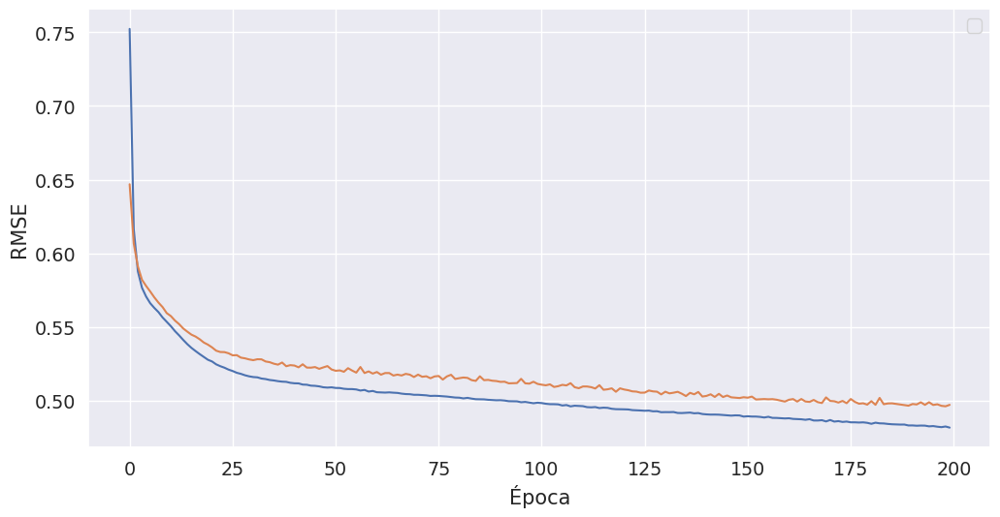

In [47]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Vemos que el aprendizaje es mucho menos errático.

Ahora intentemos complejizar el modelo agregando una capa más

In [48]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(10, activation='tanh'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=100,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/100
   32/12384 [..............................] - ETA: 37s - loss: 0.9495

 1504/12384 [==>...........................] - ETA: 1s - loss: 0.7528 

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.6304

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.5601

 6176/12384 [=============>................] - ETA: 0s - loss: 0.5168

 7712/12384 [=================>............] - ETA: 0s - loss: 0.4984

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.4828

10624/12384 [========================>.....] - ETA: 0s - loss: 0.4687

12128/12384 [============================>.] - ETA: 0s - loss: 0.4580

12384/12384 [==============================] - 1s 60us/step - loss: 0.4545 - val_loss: 0.3687


Epoch 2/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2838

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.3338

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.3389

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.3481

 6080/12384 [=============>................] - ETA: 0s - loss: 0.3525

 7552/12384 [=================>............] - ETA: 0s - loss: 0.3501

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.3537

10432/12384 [========================>.....] - ETA: 0s - loss: 0.3485

11968/12384 [===========================>..] - ETA: 0s - loss: 0.3467

12384/12384 [==============================] - 1s 51us/step - loss: 0.3450 - val_loss: 0.3413


Epoch 3/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3810

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2900

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2917

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.3186

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.3252

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.3283

 7808/12384 [=================>............] - ETA: 0s - loss: 0.3324

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.3270

10592/12384 [========================>.....] - ETA: 0s - loss: 0.3268

12032/12384 [============================>.] - ETA: 0s - loss: 0.3257

12384/12384 [==============================] - 1s 54us/step - loss: 0.3248 - val_loss: 0.3243


Epoch 4/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4139

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.3246

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.3150

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.3094

 5824/12384 [=============>................] - ETA: 0s - loss: 0.3157

 7200/12384 [================>.............] - ETA: 0s - loss: 0.3142

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.3168

10016/12384 [=======================>......] - ETA: 0s - loss: 0.3128

11552/12384 [==========================>...] - ETA: 0s - loss: 0.3076

12384/12384 [==============================] - 1s 51us/step - loss: 0.3098 - val_loss: 0.3109


Epoch 5/100
   32/12384 [..............................] - ETA: 2s - loss: 0.4105

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.3065

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.3019

 4032/12384 [========>.....................] - ETA: 0s - loss: 0.2905

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2930

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2978



 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2959

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2957

10944/12384 [=========================>....] - ETA: 0s - loss: 0.3004

12256/12384 [============================>.] - ETA: 0s - loss: 0.2975

12384/12384 [==============================] - 1s 57us/step - loss: 0.2967 - val_loss: 0.3034


Epoch 6/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2780

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2768

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2779

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2834

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2771

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2799

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2803

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2792

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2834

12384/12384 [==============================] - 1s 51us/step - loss: 0.2864 - val_loss: 0.2918


Epoch 7/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1476

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2888

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2791

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2720

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2716

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2721

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2731

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2792

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2795

12384/12384 [==============================] - 1s 51us/step - loss: 0.2799 - val_loss: 0.2868


Epoch 8/100
   32/12384 [..............................] - ETA: 2s - loss: 0.2158

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2460

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2813

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2711

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2753

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2739

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2769

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2737

12192/12384 [============================>.] - ETA: 0s - loss: 0.2746

12384/12384 [==============================] - 1s 51us/step - loss: 0.2744 - val_loss: 0.2831


Epoch 9/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2713

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2762

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2737

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2718

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2649

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2660

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2740

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2747

12128/12384 [============================>.] - ETA: 0s - loss: 0.2717

12384/12384 [==============================] - 1s 50us/step - loss: 0.2707 - val_loss: 0.2808


Epoch 10/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1502

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2507

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2618

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2769

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2825

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2776



 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2719

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2699

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2684

12384/12384 [==============================] - 1s 52us/step - loss: 0.2674 - val_loss: 0.2783


Epoch 11/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2775

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2408

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2407

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2578

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2602

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2624

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2635

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2666

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2644

12384/12384 [==============================] - 1s 53us/step - loss: 0.2647 - val_loss: 0.2768


Epoch 12/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2195

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2341

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2478

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2510

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2615

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2630

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2622

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2606

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2614

12384/12384 [==============================] - 1s 53us/step - loss: 0.2618 - val_loss: 0.2748


Epoch 13/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2620

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2758

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2672

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2662

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2647

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2725

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2686

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2640

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2623

12384/12384 [==============================] - 1s 52us/step - loss: 0.2604 - val_loss: 0.2710


Epoch 14/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2554

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2533

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2647

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2608

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2558

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2556



 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2532

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2557

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2576

12384/12384 [==============================] - 1s 51us/step - loss: 0.2586 - val_loss: 0.2694


Epoch 15/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2074

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2833

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2674

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2650

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2610

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2616

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2566

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2538

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2547

12384/12384 [==============================] - 1s 50us/step - loss: 0.2572 - val_loss: 0.2734


Epoch 16/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1556

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2298

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2450

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2495

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2532

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2479

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2512

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2539

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2554

12384/12384 [==============================] - 1s 50us/step - loss: 0.2554 - val_loss: 0.2727


Epoch 17/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2312

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2414

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2829

 4032/12384 [========>.....................] - ETA: 0s - loss: 0.2705

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2639

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2637

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2581

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2594

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2570

12384/12384 [==============================] - 1s 53us/step - loss: 0.2540 - val_loss: 0.2676


Epoch 18/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1736

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2564

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2459

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2532

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2541

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2566

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2535

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2582

12000/12384 [============================>.] - ETA: 0s - loss: 0.2550

12384/12384 [==============================] - 1s 50us/step - loss: 0.2532 - val_loss: 0.2671


Epoch 19/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3295

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2684

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2512

 3904/12384 [========>.....................] - ETA: 0s - loss: 0.2406

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2474

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2476

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2546

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2579

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2539

12384/12384 [==============================] - 1s 52us/step - loss: 0.2518 - val_loss: 0.2661


Epoch 20/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1847

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2566

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2431

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2468

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2463

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2502

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2512

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2513

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2481

12384/12384 [==============================] - 1s 51us/step - loss: 0.2503 - val_loss: 0.2637


Epoch 21/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1413

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2571

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2519

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2490

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2500

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2519

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2522

10656/12384 [========================>.....]

 - ETA: 0s - loss: 0.2523



11904/12384 [===========================>..] - ETA: 0s - loss: 0.2507

12384/12384 [==============================] - 1s 49us/step - loss: 0.2500 - val_loss: 0.2644


Epoch 22/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2390

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2541

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2481

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2616

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2524

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2533



 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2490

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2474

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2472

12352/12384 [============================>.] - ETA: 0s - loss: 0.2477

12384/12384 [==============================] - 1s 55us/step - loss: 0.2484 - val_loss: 0.2626


Epoch 23/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5002

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2784

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2525

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2452

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2409

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2468

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2473

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2488

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2507

12384/12384 [==============================] - 1s 51us/step - loss: 0.2466 - val_loss: 0.2635


Epoch 24/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0919

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2406

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2538

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2566

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2480

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2480

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2513

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2477

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2456

12384/12384 [==============================] - 1s 51us/step - loss: 0.2461 - val_loss: 0.2601


Epoch 25/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3649

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2514

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2354

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2370

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2414

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2435

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2434

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2451

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2456

12384/12384 [==============================] - 1s 51us/step - loss: 0.2454 - val_loss: 0.2596


Epoch 26/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1530

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2544

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2538

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2543

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2479

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2452

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2438

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2460

12384/12384 [==============================] - 1s 50us/step - loss: 0.2434 - val_loss: 0.2603


Epoch 27/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1941

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2296

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2250

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2268

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2298

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2385

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2369

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2378

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 52us/step - loss: 0.2428 - val_loss: 0.2578


Epoch 28/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1372

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2700

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2622

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2542

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2548

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2530

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2475

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2440

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2420

12384/12384 [==============================] - 1s 52us/step - loss: 0.2422 - val_loss: 0.2549


Epoch 29/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3878

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2196

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2369

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2489

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2453



 7840/12384 [=================>............] - ETA: 0s - loss: 0.2457



 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2442

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2436

12224/12384 [============================>.] - ETA: 0s - loss: 0.2408

12384/12384 [==============================] - 1s 49us/step - loss: 0.2412 - val_loss: 0.2558


Epoch 30/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1355

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2454

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2536

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2459

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2448

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2378

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2383

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2340

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2359

12384/12384 [==============================] - 1s 54us/step - loss: 0.2396 - val_loss: 0.2548


Epoch 31/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2409

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2221

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2216

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2253

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2318

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2335

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2387

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2375

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 54us/step - loss: 0.2393 - val_loss: 0.2528


Epoch 32/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4372

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2432

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2370

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2325

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2325

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2312

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2292

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2315

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2356

12384/12384 [==============================] - 1s 52us/step - loss: 0.2377 - val_loss: 0.2540


Epoch 33/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2166

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2209

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2311

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2304

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2352

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2324

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2353



 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2360



10784/12384 [=========================>....] - ETA: 0s - loss: 0.2344

12224/12384 [============================>.] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 53us/step - loss: 0.2371 - val_loss: 0.2542


Epoch 34/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2747

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2362

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2286

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2265

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2246

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2252

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2290

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2315

12224/12384 [============================>.] - ETA: 0s - loss: 0.2364

12384/12384 [==============================] - 1s 50us/step - loss: 0.2360 - val_loss: 0.2498


Epoch 35/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4093

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2384

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2470

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2400

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2378

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2380

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2397

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2354

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2344

12384/12384 [==============================] - 1s 52us/step - loss: 0.2353 - val_loss: 0.2495


Epoch 36/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2941

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2536

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2644

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2568

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2464

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2405

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2383

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2340

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2354

12384/12384 [==============================] - 1s 51us/step - loss: 0.2339 - val_loss: 0.2487


Epoch 37/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3535

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2149

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2299

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2288

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2288

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2354

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2355

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2370

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2329

12384/12384 [==============================] - 1s 51us/step - loss: 0.2336 - val_loss: 0.2472


Epoch 38/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1967

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2347

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2488

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2412

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2416

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2340

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2340

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2352

12256/12384 [============================>.] - ETA: 0s - loss: 0.2327

12384/12384 [==============================] - 1s 50us/step - loss: 0.2331 - val_loss: 0.2461


Epoch 39/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1404

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2368

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2322

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2392

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2392

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2427

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2402

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2362

12032/12384 [============================>.] - ETA: 0s - loss: 0.2329

12384/12384 [==============================] - 1s 50us/step - loss: 0.2319 - val_loss: 0.2453


Epoch 40/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2376

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2295

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2264

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2327

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2315

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2314

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2300

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2309

12224/12384 [============================>.] - ETA: 0s - loss: 0.2325

12384/12384 [==============================] - 1s 50us/step - loss: 0.2316 - val_loss: 0.2449


Epoch 41/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4093

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2583

 2560/12384 [=====>........................] - ETA: 0s - loss: 0.2373

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2235

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2229

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2263

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2312

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2271

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2302

12096/12384 [============================>.] - ETA: 0s - loss: 0.2303

12384/12384 [==============================] - 1s 56us/step - loss: 0.2313 - val_loss: 0.2453


Epoch 42/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4272

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2387

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2353

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2282

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2291

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2273

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2283

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2296

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2276

12384/12384 [==============================] - 1s 51us/step - loss: 0.2299 - val_loss: 0.2485


Epoch 43/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1624

 1152/12384 [=>............................] - ETA: 0s - loss: 0.2163

 2272/12384 [====>.........................] - ETA: 0s - loss: 0.2099

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2103

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2208

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2257

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2289

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2299

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2294

12224/12384 [============================>.] - ETA: 0s - loss: 0.2283

12384/12384 [==============================] - 1s 54us/step - loss: 0.2295 - val_loss: 0.2457


Epoch 44/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2442

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2204

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2265

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2240

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2250

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2184

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2239

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2253

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2274

12384/12384 [==============================] - 1s 52us/step - loss: 0.2295 - val_loss: 0.2461


Epoch 45/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2853

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2251

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2395

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2330

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2341

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2290

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2295

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2311

12000/12384 [============================>.] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 49us/step - loss: 0.2290 - val_loss: 0.2431


Epoch 46/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1342

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2192

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2113

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2118

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2175

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2239

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2186

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2196

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2268

12384/12384 [==============================] - 1s 51us/step - loss: 0.2285 - val_loss: 0.2428


Epoch 47/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1282

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.1974

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2031

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2117

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2191

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2192

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2289

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2261

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2258

12384/12384 [==============================] - 1s 53us/step - loss: 0.2277 - val_loss: 0.2422


Epoch 48/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2974

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2340

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2323

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2305

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2359

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2348

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2332

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2318

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2289

12384/12384 [==============================] - 1s 51us/step - loss: 0.2272 - val_loss: 0.2445


Epoch 49/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3374

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2307

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2296

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2258

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2203

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2217

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2195

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2248

12192/12384 [============================>.] - ETA: 0s - loss: 0.2280

12384/12384 [==============================] - 1s 49us/step - loss: 0.2273 - val_loss: 0.2426


Epoch 50/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1152

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2339

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2226

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2257

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2287

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2223

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2236

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2298

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2269

12384/12384 [==============================] - 1s 50us/step - loss: 0.2273 - val_loss: 0.2431


Epoch 51/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3562

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2400

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2307

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2344

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2336

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2295

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2282

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2282

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2290

12384/12384 [==============================] - 1s 50us/step - loss: 0.2271 - val_loss: 0.2434


Epoch 52/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2981

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2286

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2179

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2298

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2247

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2238

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2204

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2233

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2245

12384/12384 [==============================] - 1s 51us/step - loss: 0.2264 - val_loss: 0.2416


Epoch 53/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1391

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2392

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2308

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2304

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2284

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2319

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2312

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2289

12128/12384 [============================>.] - ETA: 0s - loss: 0.2256

12384/12384 [==============================] - 1s 50us/step - loss: 0.2262 - val_loss: 0.2418


Epoch 54/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1556

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.1931

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2050

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2123

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2138

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2153

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2198

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2225

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2231

12384/12384 [==============================] - 1s 51us/step - loss: 0.2260 - val_loss: 0.2440


Epoch 55/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1209

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2284

 2720/12384 [=====>........................] - ETA: 0s - loss: 0.2206

 4032/12384 [========>.....................] - ETA: 0s - loss: 0.2265

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2253

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2278

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2290

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2274

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2257

12384/12384 [==============================] - 1s 57us/step - loss: 0.2253 - val_loss: 0.2407


Epoch 56/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1671

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2139

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2151

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2252

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2255

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2300

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2271

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2276

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2255

12384/12384 [==============================] - 1s 52us/step - loss: 0.2260 - val_loss: 0.2402


Epoch 57/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3594

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.1968

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2083

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2077

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2128

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2108

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2158

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2206

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2238

12128/12384 [============================>.] - ETA: 0s - loss: 0.2267

12384/12384 [==============================] - 1s 54us/step - loss: 0.2250 - val_loss: 0.2425


Epoch 58/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2610

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2261

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2153

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2162

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2247

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2268

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2263

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2267

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2266

12032/12384 [============================>.] - ETA: 0s - loss: 0.2251

12384/12384 [==============================] - 1s 56us/step - loss: 0.2247 - val_loss: 0.2432


Epoch 59/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2851

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2137

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2251

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2202

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2215

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2199

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2227

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2231

12224/12384 [============================>.] - ETA: 0s - loss: 0.2256

12384/12384 [==============================] - 1s 50us/step - loss: 0.2255 - val_loss: 0.2386


Epoch 60/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2398

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.1986

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2154

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2164

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2178

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2194

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2229

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2211

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2228

12384/12384 [==============================] - 1s 51us/step - loss: 0.2246 - val_loss: 0.2411


Epoch 61/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3666

 1024/12384 [=>............................] - ETA: 0s - loss: 0.2240

 2400/12384 [====>.........................] - ETA: 0s - loss: 0.2246

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2311

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2338

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2267

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2215

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2211

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2202

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2220

12384/12384 [==============================] - 1s 55us/step - loss: 0.2242 - val_loss: 0.2405


Epoch 62/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1911

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2140

 2656/12384 [=====>........................] - ETA: 0s - loss: 0.2171

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2190

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2153

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2208

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2227

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2228

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2244

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2228

12384/12384 [==============================] - 1s 57us/step - loss: 0.2244 - val_loss: 0.2411


Epoch 63/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1467

 1184/12384 [=>............................] - ETA: 0s - loss: 0.2095

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2170

 4000/12384 [========>.....................] - ETA: 0s - loss: 0.2157

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2179

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2238

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2231

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2236

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2239

12384/12384 [==============================] - 1s 51us/step - loss: 0.2242 - val_loss: 0.2391


Epoch 64/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3846

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2478

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2252

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2254

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2308

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2280

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2246

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2245

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 53us/step - loss: 0.2242 - val_loss: 0.2382


Epoch 65/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2268

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2104

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2166

 4064/12384 [========>.....................] - ETA: 0s - loss: 0.2182

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2159

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2172

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2227

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2216

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2212

12384/12384 [==============================] - 1s 51us/step - loss: 0.2236 - val_loss: 0.2404


Epoch 66/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0974

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2171

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2230

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2173

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2183

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2247

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2225

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2262

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2229

12192/12384 [============================>.] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 54us/step - loss: 0.2239 - val_loss: 0.2398


Epoch 67/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3046

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2044

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2146

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2177

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2170

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2166

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2167

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2244

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2242

12384/12384 [==============================] - 1s 52us/step - loss: 0.2237 - val_loss: 0.2408


Epoch 68/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1487

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2182

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2290

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2275

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2254

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2207

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2234

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2226

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2241

12384/12384 [==============================] - 1s 51us/step - loss: 0.2240 - val_loss: 0.2398


Epoch 69/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2333

 1216/12384 [=>............................] - ETA: 0s - loss: 0.2114

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2160

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2198

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2087

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2146

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2213

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2241

12000/12384 [============================>.] - ETA: 0s - loss: 0.2226

12384/12384 [==============================] - 1s 50us/step - loss: 0.2229 - val_loss: 0.2395


Epoch 70/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2221

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.1945

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2086

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2157

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2137

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2228

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2253

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2247

12032/12384 [============================>.] - ETA: 0s - loss: 0.2245

12384/12384 [==============================] - 1s 50us/step - loss: 0.2234 - val_loss: 0.2368


Epoch 71/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1955

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2206

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2240

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2305

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2286

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2288

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2222

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2230

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2249

12320/12384 [============================>.] - ETA: 0s - loss: 0.2236

12384/12384 [==============================] - 1s 52us/step - loss: 0.2231 - val_loss: 0.2375


Epoch 72/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1290

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2386

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2305

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2244

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2263

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2292

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2284

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2279

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2262

12384/12384 [==============================] - 1s 52us/step - loss: 0.2228 - val_loss: 0.2382


Epoch 73/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1120

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2011

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2113

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2164

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2232

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2255

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2205

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2206

12192/12384 [============================>.] - ETA: 0s - loss: 0.2223

12384/12384 [==============================] - 1s 52us/step - loss: 0.2233 - val_loss: 0.2374


Epoch 74/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3597

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2680

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2232

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2220

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2179

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2195

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2194

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2208

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2217

12384/12384 [==============================] - 1s 52us/step - loss: 0.2223 - val_loss: 0.2373


Epoch 75/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1801

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2167

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2151

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2222

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2207

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2223

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2241

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2257

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2237

12384/12384 [==============================] - 1s 50us/step - loss: 0.2228 - val_loss: 0.2364


Epoch 76/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2206

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2095

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2330

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2261

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2227

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2189

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2184

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2198

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2233

12384/12384 [==============================] - 1s 50us/step - loss: 0.2226 - val_loss: 0.2361


Epoch 77/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0867

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2070

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2155

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2190

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2226

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2195

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2217

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2223

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 51us/step - loss: 0.2219 - val_loss: 0.2382


Epoch 78/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1362

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2370

 2656/12384 [=====>........................] - ETA: 0s - loss: 0.2230

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2142

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2125

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2160

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2184

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2209

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2206

12384/12384 [==============================] - 1s 51us/step - loss: 0.2223 - val_loss: 0.2362


Epoch 79/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1103

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2306

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2303

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2224

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2255

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2265

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2234

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2258

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2240

12384/12384 [==============================] - 1s 54us/step - loss: 0.2215 - val_loss: 0.2374


Epoch 80/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1765

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2556

 2592/12384 [=====>........................] - ETA: 0s - loss: 0.2315

 3936/12384 [========>.....................] - ETA: 0s - loss: 0.2226

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2171

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2149

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2131

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2143

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2204

12192/12384 [============================>.] - ETA: 0s - loss: 0.2220

12384/12384 [==============================] - 1s 55us/step - loss: 0.2217 - val_loss: 0.2381


Epoch 81/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2420

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.1918

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2027

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2152

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2210

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2245

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2228

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2248

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2225

12384/12384 [==============================] - 1s 54us/step - loss: 0.2214 - val_loss: 0.2364


Epoch 82/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1388

 1312/12384 [==>...........................] - ETA: 0s - loss: 0.2115

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2238

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2238

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2226

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2243

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2239

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2220

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2221

12384/12384 [==============================] - 1s 51us/step - loss: 0.2216 - val_loss: 0.2385


Epoch 83/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0754

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2173

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2200

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2187

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2154

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2151

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2207

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2210

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2211

12384/12384 [==============================] - 1s 51us/step - loss: 0.2216 - val_loss: 0.2366


Epoch 84/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1849

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2172

 2720/12384 [=====>........................] - ETA: 0s - loss: 0.2124

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2021

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2100

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2152

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2149

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2177

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2214

12384/12384 [==============================] - 1s 53us/step - loss: 0.2213 - val_loss: 0.2353


Epoch 85/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1518

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.1978

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2101

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2145

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2182

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2197

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2201

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2187

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2191

12384/12384 [==============================] - 1s 51us/step - loss: 0.2218 - val_loss: 0.2352


Epoch 86/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1577

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2273

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2213

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2355

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2284

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2256

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2216

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2243

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 52us/step - loss: 0.2208 - val_loss: 0.2378


Epoch 87/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1775

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2486

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2380

 4096/12384 [========>.....................] - ETA: 0s - loss: 0.2325

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2241

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2294

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2261

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2263

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2230

12384/12384 [==============================] - 1s 55us/step - loss: 0.2213 - val_loss: 0.2367


Epoch 88/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1721

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2181

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2239

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2278

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2256

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2250

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2242

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2244

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2221

12384/12384 [==============================] - 1s 50us/step - loss: 0.2212 - val_loss: 0.2365


Epoch 89/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1137

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.1987

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2045

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2118

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2199

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2187

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2206

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2211

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2203

12384/12384 [==============================] - 1s 51us/step - loss: 0.2208 - val_loss: 0.2367


Epoch 90/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2354

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2149

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2168

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2232

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2207

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2232

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2190

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2185

12000/12384 [============================>.] - ETA: 0s - loss: 0.2202

12384/12384 [==============================] - 1s 49us/step - loss: 0.2206 - val_loss: 0.2352


Epoch 91/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1873

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2209

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2184

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2152

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2165

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2147

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2160

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2190

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2204

12384/12384 [==============================] - 1s 50us/step - loss: 0.2200 - val_loss: 0.2362


Epoch 92/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5754

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2447

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2237

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2254

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2262

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2214

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2177

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2204

12384/12384 [==============================] - 1s 49us/step - loss: 0.2201 - val_loss: 0.2353


Epoch 93/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1645

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.1996

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2088

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2110

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2147

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2154

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2163

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2181

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2192

12384/12384 [==============================] - 1s 53us/step - loss: 0.2200 - val_loss: 0.2356


Epoch 94/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4606

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2222

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2196

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2179

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2177

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2191

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2208

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2220

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2208

12384/12384 [==============================] - 1s 51us/step - loss: 0.2199 - val_loss: 0.2343


Epoch 95/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2231

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2244

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2194

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2155

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2150

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2179

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2172

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2176

12384/12384 [==============================] - 1s 48us/step - loss: 0.2197 - val_loss: 0.2352


Epoch 96/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2737

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2289

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2265

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2243

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2246

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2250

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2199

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2208

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2179

12384/12384 [==============================] - 1s 54us/step - loss: 0.2197 - val_loss: 0.2379


Epoch 97/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1531

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2291

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2195

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2137

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2172

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2151

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2179

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2198

12000/12384 [============================>.] - ETA: 0s - loss: 0.2205

12384/12384 [==============================] - 1s 51us/step - loss: 0.2202 - val_loss: 0.2369


Epoch 98/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3291

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.1898

 2496/12384 [=====>........................] - ETA: 0s - loss: 0.2037

 4096/12384 [========>.....................] - ETA: 0s - loss: 0.2090

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2122

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2132

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2155

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2171

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2188

12384/12384 [==============================] - 1s 51us/step - loss: 0.2188 - val_loss: 0.2355


Epoch 99/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3688

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2178

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2287

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2224

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2223

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2187

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2187

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2214

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2214

12384/12384 [==============================] - 1s 52us/step - loss: 0.2193 - val_loss: 0.2334


Epoch 100/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2537

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2302

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2229

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2261

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2200

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2228

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2209

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2214

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2183

12384/12384 [==============================] - 1s 52us/step - loss: 0.2191 - val_loss: 0.2339


No handles with labels found to put in legend.


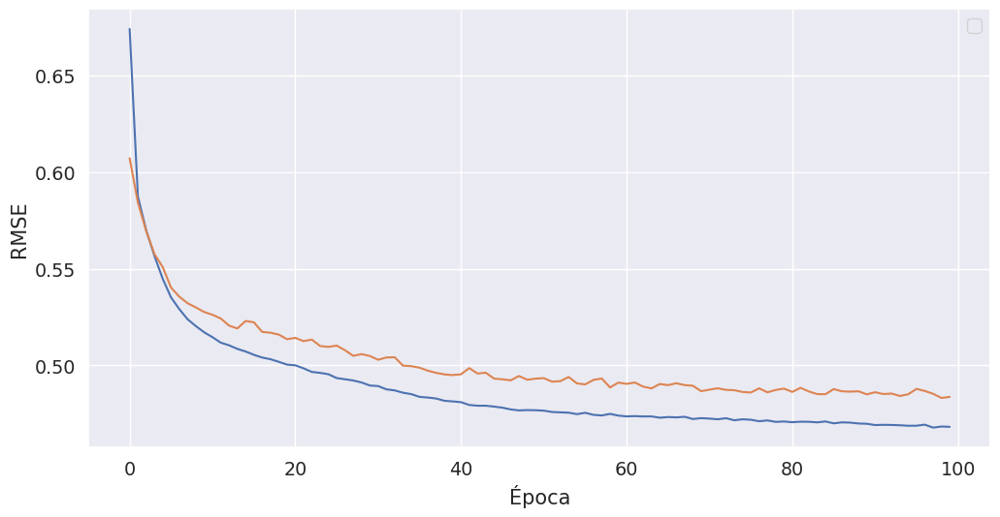

In [49]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

In [50]:
california_df_ld = pd.DataFrame(california.data, columns=california.feature_names)

Voy a tomar menos datos y voy a agregar más parámetros a mi red: Qué puede pasar cuando tengo menos cantidad de datos y más cantidad de parámetros a entrenar? Qué puede malir sal?

In [51]:
X = scaled_california_df[0:10000].drop("MedHouseVal", axis=1)
y = scaled_california_df[0:10000].filter(items=["MedHouseVal"])

In [52]:
X_train, X_validation, y_train, y_validation = train_test_split(
    X, y, test_size=0.4, random_state=42
)

In [53]:
model = Sequential()
model.add(Dense(50, activation='tanh', input_shape=(8,)))
model.add(Dense(20, activation='tanh'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 18s - loss: 1.1981

1440/6000 [======>.......................] - ETA: 0s - loss: 0.9084 

2816/6000 [=============>................] - ETA: 0s - loss: 0.6876

4256/6000 [====================>.........] - ETA: 0s - loss: 0.5793

5472/6000 [==========================>...] - ETA: 0s - loss: 0.5261

6000/6000 [==============================] - 0s 72us/step - loss: 0.5127 - val_loss: 0.3405


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1750

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3456

3008/6000 [==============>...............] - ETA: 0s - loss: 0.3468

4480/6000 [=====================>........] - ETA: 0s - loss: 0.3490

5888/6000 [============================>.] - ETA: 0s - loss: 0.3431

6000/6000 [==============================] - 0s 51us/step - loss: 0.3417 - val_loss: 0.3147


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3711

1600/6000 [=======>......................] - ETA: 0s - loss: 0.3128

3136/6000 [==============>...............] - ETA: 0s - loss: 0.3205

4704/6000 [======================>.......] - ETA: 0s - loss: 0.3167

6000/6000 [==============================] - 0s 49us/step - loss: 0.3244 - val_loss: 0.3106


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1585

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3348

2880/6000 [=============>................] - ETA: 0s - loss: 0.3256

4384/6000 [====================>.........] - ETA: 0s - loss: 0.3119

5920/6000 [============================>.] - ETA: 0s - loss: 0.3129

6000/6000 [==============================] - 0s 51us/step - loss: 0.3119 - val_loss: 0.2923


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3563

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3028

2752/6000 [============>.................] - ETA: 0s - loss: 0.2960

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2982

5440/6000 [==========================>...] - ETA: 0s - loss: 0.3011

6000/6000 [==============================] - 0s 52us/step - loss: 0.3018 - val_loss: 0.2893


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1524

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3174

2880/6000 [=============>................] - ETA: 0s - loss: 0.3034

4128/6000 [===================>..........] - ETA: 0s - loss: 0.3007

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2917

6000/6000 [==============================] - 0s 57us/step - loss: 0.2928 - val_loss: 0.2725


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3288

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2910

2656/6000 [============>.................] - ETA: 0s - loss: 0.2843

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2847

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2820

5984/6000 [============================>.] - ETA: 0s - loss: 0.2827

6000/6000 [==============================] - 0s 61us/step - loss: 0.2828 - val_loss: 0.2707


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4633

1184/6000 [====>.........................] - ETA: 0s - loss: 0.3013

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2979

3744/6000 [=================>............] - ETA: 0s - loss: 0.2902

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2783

6000/6000 [==============================] - 0s 55us/step - loss: 0.2723 - val_loss: 0.2694


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1925

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2701

2816/6000 [=============>................] - ETA: 0s - loss: 0.2639

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2681

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2623

6000/6000 [==============================] - 0s 55us/step - loss: 0.2635 - val_loss: 0.2512


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3389

 960/6000 [===>..........................] - ETA: 0s - loss: 0.2451

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2414

3520/6000 [================>.............] - ETA: 0s - loss: 0.2499

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2559

6000/6000 [==============================] - 0s 55us/step - loss: 0.2583 - val_loss: 0.2551


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2562

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2403

2816/6000 [=============>................] - ETA: 0s - loss: 0.2501

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2579

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2508

6000/6000 [==============================] - 0s 51us/step - loss: 0.2520 - val_loss: 0.2414


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1761

 800/6000 [===>..........................] - ETA: 0s - loss: 0.2580

2080/6000 [=========>....................] - ETA: 0s - loss: 0.2520

3328/6000 [===============>..............] - ETA: 0s - loss: 0.2500

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2443

6000/6000 [==============================] - 0s 58us/step - loss: 0.2442 - val_loss: 0.2468


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3631

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2421

2624/6000 [============>.................] - ETA: 0s - loss: 0.2356

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2300

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2293

6000/6000 [==============================] - 0s 57us/step - loss: 0.2381 - val_loss: 0.2400


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0631

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2331

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2339

3520/6000 [================>.............] - ETA: 0s - loss: 0.2262

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2323

6000/6000 [==============================] - 0s 56us/step - loss: 0.2326 - val_loss: 0.2297


Epoch 15/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1273

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2342

2944/6000 [=============>................] - ETA: 0s - loss: 0.2386

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2343

5888/6000 [============================>.] - ETA: 0s - loss: 0.2282

6000/6000 [==============================] - 0s 48us/step - loss: 0.2272 - val_loss: 0.2270


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2239

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2310

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2333

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2295

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2263

6000/6000 [==============================] - 0s 54us/step - loss: 0.2262 - val_loss: 0.2248


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1548

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2133

2688/6000 [============>.................] - ETA: 0s - loss: 0.2118

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2097

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2144

6000/6000 [==============================] - 0s 52us/step - loss: 0.2204 - val_loss: 0.2200


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0996

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2254

2944/6000 [=============>................] - ETA: 0s - loss: 0.2294

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2243

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2177

6000/6000 [==============================] - 0s 54us/step - loss: 0.2187 - val_loss: 0.2234


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3790

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2162

2880/6000 [=============>................] - ETA: 0s - loss: 0.2213

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2152

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2174

6000/6000 [==============================] - 0s 55us/step - loss: 0.2168 - val_loss: 0.2144


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2558

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2063

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2196

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2147

6000/6000 [==============================] - 0s 47us/step - loss: 0.2136 - val_loss: 0.2223


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2094

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2155

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2085

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2111

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2121

6000/6000 [==============================] - 0s 54us/step - loss: 0.2117 - val_loss: 0.2205


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3366

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2320

2720/6000 [============>.................] - ETA: 0s - loss: 0.2225

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2087

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2086

6000/6000 [==============================] - 0s 52us/step - loss: 0.2105 - val_loss: 0.2164


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1456

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2063

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2011

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2012

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2071

6000/6000 [==============================] - 0s 56us/step - loss: 0.2082 - val_loss: 0.2134


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1768

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1980

2272/6000 [==========>...................] - ETA: 0s - loss: 0.2048

3744/6000 [=================>............] - ETA: 0s - loss: 0.2063

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2084

6000/6000 [==============================] - 0s 57us/step - loss: 0.2085 - val_loss: 0.2137


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1024

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1947

2880/6000 [=============>................] - ETA: 0s - loss: 0.2008

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2032

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2050

6000/6000 [==============================] - 0s 50us/step - loss: 0.2049 - val_loss: 0.2187


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2140

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1901

2816/6000 [=============>................] - ETA: 0s - loss: 0.1982

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1964

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2063

6000/6000 [==============================] - 0s 53us/step - loss: 0.2045 - val_loss: 0.2076


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1062

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1808

2784/6000 [============>.................] - ETA: 0s - loss: 0.1880

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1963

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2000

6000/6000 [==============================] - 0s 54us/step - loss: 0.2032 - val_loss: 0.2127


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2700

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1966

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2014

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2005

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2043

6000/6000 [==============================] - 0s 51us/step - loss: 0.2030 - val_loss: 0.2231


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1898

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2269

2816/6000 [=============>................] - ETA: 0s - loss: 0.2060

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2070

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2075

6000/6000 [==============================] - 0s 52us/step - loss: 0.2035 - val_loss: 0.2068


Epoch 30/500
  32/6000 [..............................] - ETA: 2s - loss: 0.2316

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2237

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2149

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2052

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2021

6000/6000 [==============================] - 0s 54us/step - loss: 0.1994 - val_loss: 0.2035


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2471

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1848

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1910

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1905

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1971

6000/6000 [==============================] - 0s 57us/step - loss: 0.1977 - val_loss: 0.2100


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2042

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1746

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1918

3520/6000 [================>.............] - ETA: 0s - loss: 0.1969

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1954

6000/6000 [==============================] - 0s 57us/step - loss: 0.1968 - val_loss: 0.2041


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1848

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2020

2784/6000 [============>.................] - ETA: 0s - loss: 0.1963

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1964

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2006

6000/6000 [==============================] - 0s 52us/step - loss: 0.1988 - val_loss: 0.2019


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2472

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1921

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1881

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1927

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1961

6000/6000 [==============================] - 0s 52us/step - loss: 0.1964 - val_loss: 0.2043


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2163

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2031

2720/6000 [============>.................] - ETA: 0s - loss: 0.1960

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1962

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1959

6000/6000 [==============================] - 0s 51us/step - loss: 0.1952 - val_loss: 0.2030


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0992

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1899

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1853

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1908

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1977

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1970

6000/6000 [==============================] - 0s 62us/step - loss: 0.1953 - val_loss: 0.2045


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0671

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1914

2848/6000 [=============>................] - ETA: 0s - loss: 0.1885

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1922

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1905

6000/6000 [==============================] - 0s 57us/step - loss: 0.1933 - val_loss: 0.2041


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2006

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2028

2880/6000 [=============>................] - ETA: 0s - loss: 0.1916

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1976

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1952

6000/6000 [==============================] - 0s 51us/step - loss: 0.1935 - val_loss: 0.2044


Epoch 39/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1692

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1854

2688/6000 [============>.................] - ETA: 0s - loss: 0.1930

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1909

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1929

6000/6000 [==============================] - 0s 52us/step - loss: 0.1931 - val_loss: 0.2035


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3326

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1820

2944/6000 [=============>................] - ETA: 0s - loss: 0.1890

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1889

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1938

6000/6000 [==============================] - 0s 50us/step - loss: 0.1931 - val_loss: 0.1997


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1674

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1920

2624/6000 [============>.................] - ETA: 0s - loss: 0.1876

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1904

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1931

6000/6000 [==============================] - 0s 55us/step - loss: 0.1908 - val_loss: 0.2016


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1259

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1890

2944/6000 [=============>................] - ETA: 0s - loss: 0.1901

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1944

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1914

6000/6000 [==============================] - 0s 53us/step - loss: 0.1920 - val_loss: 0.2054


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1428

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1795

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1998

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1970

5856/6000 [============================>.] - ETA: 0s - loss: 0.1921

6000/6000 [==============================] - 0s 50us/step - loss: 0.1924 - val_loss: 0.2050


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1881

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1845

2752/6000 [============>.................] - ETA: 0s - loss: 0.1977

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1878

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1881

6000/6000 [==============================] - 0s 55us/step - loss: 0.1903 - val_loss: 0.2160


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1071

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2031

2688/6000 [============>.................] - ETA: 0s - loss: 0.1932

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1899

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1913

6000/6000 [==============================] - 0s 54us/step - loss: 0.1908 - val_loss: 0.2003


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2145

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2036

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1843

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1879

6000/6000 [==============================] - 0s 51us/step - loss: 0.1899 - val_loss: 0.2003


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1601

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1738

2880/6000 [=============>................] - ETA: 0s - loss: 0.1917

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1910

5824/6000 [============================>.] - ETA: 0s - loss: 0.1904

6000/6000 [==============================] - 0s 53us/step - loss: 0.1906 - val_loss: 0.2048


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1789

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1911

2848/6000 [=============>................] - ETA: 0s - loss: 0.1902

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1833

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1852

6000/6000 [==============================] - 0s 51us/step - loss: 0.1881 - val_loss: 0.2116


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1075

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1894

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1816

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1783

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1883

6000/6000 [==============================] - 0s 54us/step - loss: 0.1893 - val_loss: 0.2044


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1855

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2028

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1936

3584/6000 [================>.............] - ETA: 0s - loss: 0.1920

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1897

6000/6000 [==============================] - 0s 57us/step - loss: 0.1888 - val_loss: 0.2002


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1154

 960/6000 [===>..........................] - ETA: 0s - loss: 0.1872

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1812

3584/6000 [================>.............] - ETA: 0s - loss: 0.1820

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1897

6000/6000 [==============================] - 0s 55us/step - loss: 0.1869 - val_loss: 0.2029


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1212

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1783

2976/6000 [=============>................] - ETA: 0s - loss: 0.1824

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1879

5952/6000 [============================>.] - ETA: 0s - loss: 0.1862

6000/6000 [==============================] - 0s 48us/step - loss: 0.1860 - val_loss: 0.2065


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1731

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1793

2688/6000 [============>.................] - ETA: 0s - loss: 0.1783

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1826

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1873

6000/6000 [==============================] - 0s 54us/step - loss: 0.1885 - val_loss: 0.1986


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2196

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1770

2624/6000 [============>.................] - ETA: 0s - loss: 0.1797

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1873

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1886

6000/6000 [==============================] - 0s 54us/step - loss: 0.1880 - val_loss: 0.1977


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2880

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1630

2624/6000 [============>.................] - ETA: 0s - loss: 0.1756

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1847

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1844

6000/6000 [==============================] - 0s 53us/step - loss: 0.1866 - val_loss: 0.2016


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1953

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1841

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1876

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1944

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1845

6000/6000 [==============================] - 0s 52us/step - loss: 0.1848 - val_loss: 0.2013


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1742

2944/6000 [=============>................] - ETA: 0s - loss: 0.1751

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1818

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1856

6000/6000 [==============================] - 0s 53us/step - loss: 0.1846 - val_loss: 0.2016


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0703

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1725

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1763

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1774

6000/6000 [==============================] - 0s 48us/step - loss: 0.1850 - val_loss: 0.2005


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4631

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1838

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1812

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1820

5984/6000 [============================>.] - ETA: 0s - loss: 0.1837

6000/6000 [==============================] - 0s 48us/step - loss: 0.1840 - val_loss: 0.2036


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1403

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1674

2720/6000 [============>.................] - ETA: 0s - loss: 0.1854

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1862

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1852

6000/6000 [==============================] - 0s 59us/step - loss: 0.1845 - val_loss: 0.2024


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1305

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1799

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1790

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1779

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1842

6000/6000 [==============================] - 0s 50us/step - loss: 0.1838 - val_loss: 0.2011


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1988

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1911

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1934

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1825

5952/6000 [============================>.] - ETA: 0s - loss: 0.1823

6000/6000 [==============================] - 0s 49us/step - loss: 0.1821 - val_loss: 0.2017


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0861

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1822

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1841

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1854

6000/6000 [==============================] - 0s 58us/step - loss: 0.1841 - val_loss: 0.1979


Epoch 64/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1957

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1779

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1912

3712/6000 [=================>............] - ETA: 0s - loss: 0.1876

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1855

6000/6000 [==============================] - 0s 55us/step - loss: 0.1838 - val_loss: 0.2042


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2072

2912/6000 [=============>................] - ETA: 0s - loss: 0.1913

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1877

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1841

6000/6000 [==============================] - 0s 54us/step - loss: 0.1831 - val_loss: 0.1989


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1191

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1868

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1820

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1737

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1793

6000/6000 [==============================] - 0s 53us/step - loss: 0.1813 - val_loss: 0.1990


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1273

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1757

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1749

3776/6000 [=================>............] - ETA: 0s - loss: 0.1789

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1776

6000/6000 [==============================] - 0s 57us/step - loss: 0.1813 - val_loss: 0.1990


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1210

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1764

2752/6000 [============>.................] - ETA: 0s - loss: 0.1788

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1805

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1799

6000/6000 [==============================] - 0s 52us/step - loss: 0.1809 - val_loss: 0.1989


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1012

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1978

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1993

3712/6000 [=================>............] - ETA: 0s - loss: 0.1885

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1833

5952/6000 [============================>.] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 59us/step - loss: 0.1818 - val_loss: 0.1999


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2092



1568/6000 [======>.......................] - ETA: 0s - loss: 0.1974



2848/6000 [=============>................] - ETA: 0s - loss: 0.1855

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1873

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1797

6000/6000 [==============================] - 0s 54us/step - loss: 0.1806 - val_loss: 0.1998


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2321

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1867

2944/6000 [=============>................] - ETA: 0s - loss: 0.1841

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1798

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 54us/step - loss: 0.1797 - val_loss: 0.1987


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1478

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1724

2688/6000 [============>.................] - ETA: 0s - loss: 0.1766

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1733

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1808

6000/6000 [==============================] - 0s 55us/step - loss: 0.1800 - val_loss: 0.2001


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1809

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1698

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1726

3744/6000 [=================>............] - ETA: 0s - loss: 0.1751

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1811

6000/6000 [==============================] - 0s 55us/step - loss: 0.1802 - val_loss: 0.1992


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0678

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1712

2848/6000 [=============>................] - ETA: 0s - loss: 0.1807

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1829

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1791

6000/6000 [==============================] - 0s 57us/step - loss: 0.1785 - val_loss: 0.1987


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3136

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1816

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1802

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1794

6000/6000 [==============================] - 0s 48us/step - loss: 0.1806 - val_loss: 0.1993


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1156

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1734

2976/6000 [=============>................] - ETA: 0s - loss: 0.1794

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1783

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1813

6000/6000 [==============================] - 0s 54us/step - loss: 0.1804 - val_loss: 0.2006


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2920

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1760

2688/6000 [============>.................] - ETA: 0s - loss: 0.1741

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1757

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1795

6000/6000 [==============================] - 0s 52us/step - loss: 0.1793 - val_loss: 0.1971


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1279

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1717

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1699

3584/6000 [================>.............] - ETA: 0s - loss: 0.1770

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1745

6000/6000 [==============================] - 0s 57us/step - loss: 0.1760 - val_loss: 0.1985


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1210

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1658

2752/6000 [============>.................] - ETA: 0s - loss: 0.1695

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1687

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1779

6000/6000 [==============================] - 0s 52us/step - loss: 0.1771 - val_loss: 0.1978


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2280

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1555

2656/6000 [============>.................] - ETA: 0s - loss: 0.1553

3712/6000 [=================>............] - ETA: 0s - loss: 0.1602

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1665

6000/6000 [==============================] - 0s 56us/step - loss: 0.1771 - val_loss: 0.2013


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3074

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1620

2624/6000 [============>.................] - ETA: 0s - loss: 0.1698

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1705

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1721

6000/6000 [==============================] - 0s 52us/step - loss: 0.1758 - val_loss: 0.1981


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1015

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1781

2912/6000 [=============>................] - ETA: 0s - loss: 0.1747

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1763

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 53us/step - loss: 0.1773 - val_loss: 0.1959


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2080

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1722

2720/6000 [============>.................] - ETA: 0s - loss: 0.1728

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1698

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 52us/step - loss: 0.1750 - val_loss: 0.1992


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0512

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1730

2816/6000 [=============>................] - ETA: 0s - loss: 0.1718

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1787

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1786

6000/6000 [==============================] - 0s 50us/step - loss: 0.1771 - val_loss: 0.2010


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2133

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1787

2912/6000 [=============>................] - ETA: 0s - loss: 0.1741

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1712

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 55us/step - loss: 0.1741 - val_loss: 0.1953


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0989

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1737

2720/6000 [============>.................] - ETA: 0s - loss: 0.1750

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1747

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 52us/step - loss: 0.1746 - val_loss: 0.2017


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1738

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1742

2880/6000 [=============>................] - ETA: 0s - loss: 0.1765

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1745

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1740

6000/6000 [==============================] - 0s 57us/step - loss: 0.1744 - val_loss: 0.1964


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4995

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1793

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1813

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1826

6000/6000 [==============================] - 0s 47us/step - loss: 0.1742 - val_loss: 0.1947


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1240

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1478

2880/6000 [=============>................] - ETA: 0s - loss: 0.1634

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1636

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 51us/step - loss: 0.1742 - val_loss: 0.1951


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3130

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1891

2880/6000 [=============>................] - ETA: 0s - loss: 0.1824

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1826

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1748

6000/6000 [==============================] - 0s 59us/step - loss: 0.1747 - val_loss: 0.1960


Epoch 91/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1204

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1754

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1732

3552/6000 [================>.............] - ETA: 0s - loss: 0.1741

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 57us/step - loss: 0.1742 - val_loss: 0.1971


Epoch 92/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0864

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1697

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1734

3584/6000 [================>.............] - ETA: 0s - loss: 0.1710

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1728

5952/6000 [============================>.] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 59us/step - loss: 0.1738 - val_loss: 0.1995


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0751

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1737

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1664

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1657

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 51us/step - loss: 0.1717 - val_loss: 0.1994


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2135

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1724

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1775

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1782

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1752

6000/6000 [==============================] - 0s 52us/step - loss: 0.1732 - val_loss: 0.1952


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1673

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1627

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1692

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 47us/step - loss: 0.1724 - val_loss: 0.1999


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1103

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1655

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1738

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 48us/step - loss: 0.1718 - val_loss: 0.2039


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2042

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1686

2912/6000 [=============>................] - ETA: 0s - loss: 0.1659

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1637

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 51us/step - loss: 0.1719 - val_loss: 0.2072


Epoch 98/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1657

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1703

2976/6000 [=============>................] - ETA: 0s - loss: 0.1770

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 48us/step - loss: 0.1720 - val_loss: 0.2026


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1444

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1791

2848/6000 [=============>................] - ETA: 0s - loss: 0.1741

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1697

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 50us/step - loss: 0.1721 - val_loss: 0.1964


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1622

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1649

2976/6000 [=============>................] - ETA: 0s - loss: 0.1715

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1664

6000/6000 [==============================] - 0s 48us/step - loss: 0.1709 - val_loss: 0.1966


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0726

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1608

2880/6000 [=============>................] - ETA: 0s - loss: 0.1600

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1640

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 51us/step - loss: 0.1697 - val_loss: 0.1995


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2980

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1809

2912/6000 [=============>................] - ETA: 0s - loss: 0.1779

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1721

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1709

6000/6000 [==============================] - 0s 51us/step - loss: 0.1704 - val_loss: 0.1926


Epoch 103/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1235

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1780

2976/6000 [=============>................] - ETA: 0s - loss: 0.1681

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1701

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1705

6000/6000 [==============================] - 0s 51us/step - loss: 0.1691 - val_loss: 0.1939


Epoch 104/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3317

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1728

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1716

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1694

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 53us/step - loss: 0.1699 - val_loss: 0.1947


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0915

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1658

2976/6000 [=============>................] - ETA: 0s - loss: 0.1698

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1722

5824/6000 [============================>.] - ETA: 0s - loss: 0.1682

6000/6000 [==============================] - 0s 51us/step - loss: 0.1689 - val_loss: 0.1971


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2065



1440/6000 [======>.......................] - ETA: 0s - loss: 0.1795

2688/6000 [============>.................] - ETA: 0s - loss: 0.1793

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1734

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 51us/step - loss: 0.1696 - val_loss: 0.1963


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1572

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1734

2816/6000 [=============>................] - ETA: 0s - loss: 0.1802

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1787

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 49us/step - loss: 0.1703 - val_loss: 0.1981


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1556

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1730

2880/6000 [=============>................] - ETA: 0s - loss: 0.1642

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1653

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1671

6000/6000 [==============================] - 0s 55us/step - loss: 0.1688 - val_loss: 0.1945


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1201

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1690

2880/6000 [=============>................] - ETA: 0s - loss: 0.1702

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1683

5984/6000 [============================>.] - ETA: 0s - loss: 0.1689

6000/6000 [==============================] - 0s 48us/step - loss: 0.1687 - val_loss: 0.1969


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1828

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1701

2976/6000 [=============>................] - ETA: 0s - loss: 0.1594

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1653

5920/6000 [============================>.] - ETA: 0s - loss: 0.1663

6000/6000 [==============================] - 0s 49us/step - loss: 0.1665 - val_loss: 0.1941


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2126

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1678

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1644

3616/6000 [=================>............] - ETA: 0s - loss: 0.1701

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1689

6000/6000 [==============================] - 0s 57us/step - loss: 0.1670 - val_loss: 0.1979


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1748

2688/6000 [============>.................] - ETA: 0s - loss: 0.1714

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1671

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1680

6000/6000 [==============================] - 0s 54us/step - loss: 0.1666 - val_loss: 0.1967


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0458

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1465

2944/6000 [=============>................] - ETA: 0s - loss: 0.1530

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1597

5952/6000 [============================>.] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 48us/step - loss: 0.1670 - val_loss: 0.1977


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1463

2816/6000 [=============>................] - ETA: 0s - loss: 0.1570

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1614

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 51us/step - loss: 0.1668 - val_loss: 0.1956


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1065

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1804

2912/6000 [=============>................] - ETA: 0s - loss: 0.1822

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1684

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1676

6000/6000 [==============================] - 0s 54us/step - loss: 0.1670 - val_loss: 0.1967


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1619

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1489

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1555

3616/6000 [=================>............] - ETA: 0s - loss: 0.1640

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1595

6000/6000 [==============================] - 0s 53us/step - loss: 0.1654 - val_loss: 0.1940


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1905

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1609

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1625

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1691

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1653

6000/6000 [==============================] - 0s 52us/step - loss: 0.1666 - val_loss: 0.2027


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0970

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1715

2784/6000 [============>.................] - ETA: 0s - loss: 0.1656

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1649

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 50us/step - loss: 0.1668 - val_loss: 0.1968


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0842

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1645

2976/6000 [=============>................] - ETA: 0s - loss: 0.1620

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 47us/step - loss: 0.1651 - val_loss: 0.1972


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1919

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1677

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1745

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1694

5888/6000 [============================>.] - ETA: 0s - loss: 0.1665

6000/6000 [==============================] - 0s 52us/step - loss: 0.1656 - val_loss: 0.1943


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1265

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1759

2816/6000 [=============>................] - ETA: 0s - loss: 0.1629

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1679

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 54us/step - loss: 0.1656 - val_loss: 0.2047


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1514

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1826

2944/6000 [=============>................] - ETA: 0s - loss: 0.1638

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1659

5952/6000 [============================>.] - ETA: 0s - loss: 0.1659

6000/6000 [==============================] - 0s 48us/step - loss: 0.1662 - val_loss: 0.1941


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1078

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1581

2752/6000 [============>.................] - ETA: 0s - loss: 0.1563

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1612

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1611

6000/6000 [==============================] - 0s 54us/step - loss: 0.1628 - val_loss: 0.2038


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1919

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1622

2976/6000 [=============>................] - ETA: 0s - loss: 0.1610

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1664

5984/6000 [============================>.] - ETA: 0s - loss: 0.1670

6000/6000 [==============================] - 0s 47us/step - loss: 0.1668 - val_loss: 0.1928


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0871

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1669

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1680

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1652

5888/6000 [============================>.] - ETA: 0s - loss: 0.1623

6000/6000 [==============================] - 0s 50us/step - loss: 0.1631 - val_loss: 0.1917


Epoch 126/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1172

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1610

2944/6000 [=============>................] - ETA: 0s - loss: 0.1676

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1620

5856/6000 [============================>.] - ETA: 0s - loss: 0.1630

6000/6000 [==============================] - 0s 50us/step - loss: 0.1629 - val_loss: 0.1951


Epoch 127/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1354

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1702

2944/6000 [=============>................] - ETA: 0s - loss: 0.1552

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1633

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1647

6000/6000 [==============================] - 0s 51us/step - loss: 0.1637 - val_loss: 0.1904


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2486

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1581

2976/6000 [=============>................] - ETA: 0s - loss: 0.1579

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1625

5856/6000 [============================>.] - ETA: 0s - loss: 0.1621

6000/6000 [==============================] - 0s 53us/step - loss: 0.1632 - val_loss: 0.1959


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0980

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1580

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1590

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1668

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 51us/step - loss: 0.1628 - val_loss: 0.1998


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0951

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1754

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1715

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1667

5952/6000 [============================>.] - ETA: 0s - loss: 0.1629

6000/6000 [==============================] - 0s 49us/step - loss: 0.1630 - val_loss: 0.1938


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2019

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1528

2880/6000 [=============>................] - ETA: 0s - loss: 0.1663

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1671

5984/6000 [============================>.] - ETA: 0s - loss: 0.1632

6000/6000 [==============================] - 0s 48us/step - loss: 0.1629 - val_loss: 0.1955


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2665

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1643

2816/6000 [=============>................] - ETA: 0s - loss: 0.1703

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1696

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1670

6000/6000 [==============================] - 0s 58us/step - loss: 0.1634 - val_loss: 0.1922


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2369

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1807

2752/6000 [============>.................] - ETA: 0s - loss: 0.1715

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1702

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1639

6000/6000 [==============================] - 0s 55us/step - loss: 0.1628 - val_loss: 0.1958


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2090

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1549

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1579

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1598

6000/6000 [==============================] - 0s 48us/step - loss: 0.1618 - val_loss: 0.2016


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2485

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1496

2816/6000 [=============>................] - ETA: 0s - loss: 0.1578

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1584

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1628

6000/6000 [==============================] - 0s 53us/step - loss: 0.1622 - val_loss: 0.1931


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1219

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1640

2720/6000 [============>.................] - ETA: 0s - loss: 0.1564

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1582

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1593

6000/6000 [==============================] - 0s 52us/step - loss: 0.1612 - val_loss: 0.1909


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2371

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1555

2816/6000 [=============>................] - ETA: 0s - loss: 0.1589

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1617

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1601

6000/6000 [==============================] - 0s 50us/step - loss: 0.1618 - val_loss: 0.1944


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0885

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1547

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1565

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1656

5856/6000 [============================>.] - ETA: 0s - loss: 0.1623

6000/6000 [==============================] - 0s 51us/step - loss: 0.1620 - val_loss: 0.1932


Epoch 139/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1030

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1654

2912/6000 [=============>................] - ETA: 0s - loss: 0.1656

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1623

5888/6000 [============================>.] - ETA: 0s - loss: 0.1610

6000/6000 [==============================] - 0s 49us/step - loss: 0.1614 - val_loss: 0.1896


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0939

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1546

2848/6000 [=============>................] - ETA: 0s - loss: 0.1558

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1602

5920/6000 [============================>.] - ETA: 0s - loss: 0.1590

6000/6000 [==============================] - 0s 49us/step - loss: 0.1615 - val_loss: 0.1902


Epoch 141/500
  32/6000 [..............................] - ETA: 1s - loss: 0.2208

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1717

2816/6000 [=============>................] - ETA: 0s - loss: 0.1653

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1628

5824/6000 [============================>.] - ETA: 0s - loss: 0.1601

6000/6000 [==============================] - 0s 50us/step - loss: 0.1605 - val_loss: 0.1928


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1794

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1656

2784/6000 [============>.................] - ETA: 0s - loss: 0.1610

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1616

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1596

6000/6000 [==============================] - 0s 50us/step - loss: 0.1602 - val_loss: 0.1963


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2191

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1650

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1581

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1587

6000/6000 [==============================] - 0s 48us/step - loss: 0.1610 - val_loss: 0.1945


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2513

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1657

2816/6000 [=============>................] - ETA: 0s - loss: 0.1614

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1584

5856/6000 [============================>.] - ETA: 0s - loss: 0.1600

6000/6000 [==============================] - 0s 50us/step - loss: 0.1596 - val_loss: 0.1941


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1769

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1557

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1554

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1612

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1612

6000/6000 [==============================] - 0s 52us/step - loss: 0.1608 - val_loss: 0.1933


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1478

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1448

2624/6000 [============>.................] - ETA: 0s - loss: 0.1558

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1588

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1586

6000/6000 [==============================] - 0s 52us/step - loss: 0.1584 - val_loss: 0.1957


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2095

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1642

2656/6000 [============>.................] - ETA: 0s - loss: 0.1604

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1597

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1594

6000/6000 [==============================] - 0s 53us/step - loss: 0.1606 - val_loss: 0.1883


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2516

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1496

2624/6000 [============>.................] - ETA: 0s - loss: 0.1561

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1523

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1575

6000/6000 [==============================] - 0s 51us/step - loss: 0.1589 - val_loss: 0.1921


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0907

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1606

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1615

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1614

5984/6000 [============================>.] - ETA: 0s - loss: 0.1599

6000/6000 [==============================] - 0s 49us/step - loss: 0.1601 - val_loss: 0.1922


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1921

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1564

2944/6000 [=============>................] - ETA: 0s - loss: 0.1520

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1578

5952/6000 [============================>.] - ETA: 0s - loss: 0.1576

6000/6000 [==============================] - 0s 50us/step - loss: 0.1585 - val_loss: 0.1941


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2745

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1625

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1664

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1647

6000/6000 [==============================] - 0s 47us/step - loss: 0.1595 - val_loss: 0.1944


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1244

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1609

2720/6000 [============>.................] - ETA: 0s - loss: 0.1674

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1604

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1583

6000/6000 [==============================] - 0s 50us/step - loss: 0.1585 - val_loss: 0.1918


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1606

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1584

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1576

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1589

5888/6000 [============================>.] - ETA: 0s - loss: 0.1598

6000/6000 [==============================] - 0s 51us/step - loss: 0.1589 - val_loss: 0.1924


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1327

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1746

2720/6000 [============>.................] - ETA: 0s - loss: 0.1629

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1610

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1580

6000/6000 [==============================] - 0s 53us/step - loss: 0.1590 - val_loss: 0.1979


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1298

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1576

2912/6000 [=============>................] - ETA: 0s - loss: 0.1526

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1560

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1581

6000/6000 [==============================] - 0s 52us/step - loss: 0.1581 - val_loss: 0.1925


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1389

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1516

2720/6000 [============>.................] - ETA: 0s - loss: 0.1615

3680/6000 [=================>............] - ETA: 0s - loss: 0.1607

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1614

6000/6000 [==============================] - 0s 55us/step - loss: 0.1576 - val_loss: 0.1908


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2344

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1496

2976/6000 [=============>................] - ETA: 0s - loss: 0.1558

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1558

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1569

6000/6000 [==============================] - 0s 49us/step - loss: 0.1567 - val_loss: 0.1929


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2340

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1627

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1559

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1576

5984/6000 [============================>.] - ETA: 0s - loss: 0.1564

6000/6000 [==============================] - 0s 49us/step - loss: 0.1569 - val_loss: 0.1904


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1991

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1595

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1595

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1610

5984/6000 [============================>.] - ETA: 0s - loss: 0.1585

6000/6000 [==============================] - 0s 48us/step - loss: 0.1584 - val_loss: 0.1926


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2915

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1426

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1475

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1550

6000/6000 [==============================] - 0s 46us/step - loss: 0.1570 - val_loss: 0.1968


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2687

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1714

2816/6000 [=============>................] - ETA: 0s - loss: 0.1599

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1588

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1575

6000/6000 [==============================] - 0s 51us/step - loss: 0.1570 - val_loss: 0.1884


Epoch 162/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0525

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1631

2944/6000 [=============>................] - ETA: 0s - loss: 0.1579

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1576

5824/6000 [============================>.] - ETA: 0s - loss: 0.1564

6000/6000 [==============================] - 0s 50us/step - loss: 0.1563 - val_loss: 0.1965


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1442

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1646

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1560

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1525

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1580

6000/6000 [==============================] - 0s 56us/step - loss: 0.1565 - val_loss: 0.1930


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1106

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1484

2816/6000 [=============>................] - ETA: 0s - loss: 0.1620

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1588

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1568

6000/6000 [==============================] - 0s 50us/step - loss: 0.1569 - val_loss: 0.1915


Epoch 165/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1270

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1507

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1540

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1570

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1574

6000/6000 [==============================] - 0s 55us/step - loss: 0.1578 - val_loss: 0.1887


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1058

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1612

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1537

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1551

5856/6000 [============================>.] - ETA: 0s - loss: 0.1556

6000/6000 [==============================] - 0s 49us/step - loss: 0.1560 - val_loss: 0.1873


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1318

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1724

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1596

3712/6000 [=================>............] - ETA: 0s - loss: 0.1574

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1528

6000/6000 [==============================] - 0s 52us/step - loss: 0.1545 - val_loss: 0.1894


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2697

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1739

2688/6000 [============>.................] - ETA: 0s - loss: 0.1625

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1610

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1567

6000/6000 [==============================] - 0s 52us/step - loss: 0.1556 - val_loss: 0.1886


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2040

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1636

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1599

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1573

6000/6000 [==============================] - 0s 47us/step - loss: 0.1574 - val_loss: 0.1886


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0818

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1591

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1548

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1500

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1549

6000/6000 [==============================] - 0s 49us/step - loss: 0.1552 - val_loss: 0.1941


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2384

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1274

2912/6000 [=============>................] - ETA: 0s - loss: 0.1475

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1451

6000/6000 [==============================] - 0s 47us/step - loss: 0.1544 - val_loss: 0.2001


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2356

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1448

2880/6000 [=============>................] - ETA: 0s - loss: 0.1479

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1532

5984/6000 [============================>.] - ETA: 0s - loss: 0.1574

6000/6000 [==============================] - 0s 52us/step - loss: 0.1571 - val_loss: 0.1900


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3412

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1486

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1500

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1512

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1539

6000/6000 [==============================] - 0s 51us/step - loss: 0.1546 - val_loss: 0.1901


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0807

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1645

2976/6000 [=============>................] - ETA: 0s - loss: 0.1508

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1557

5824/6000 [============================>.] - ETA: 0s - loss: 0.1553

6000/6000 [==============================] - 0s 50us/step - loss: 0.1549 - val_loss: 0.1894


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1692

2816/6000 [=============>................] - ETA: 0s - loss: 0.1673

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1613

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1588

6000/6000 [==============================] - 0s 52us/step - loss: 0.1560 - val_loss: 0.1895


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1498

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1444

2656/6000 [============>.................] - ETA: 0s - loss: 0.1497

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1493

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1532

6000/6000 [==============================] - 0s 52us/step - loss: 0.1541 - val_loss: 0.1923


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1048

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1600

2720/6000 [============>.................] - ETA: 0s - loss: 0.1641

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1560

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1547

6000/6000 [==============================] - 0s 53us/step - loss: 0.1541 - val_loss: 0.1918


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2365

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1438

2880/6000 [=============>................] - ETA: 0s - loss: 0.1549

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1528

5888/6000 [============================>.] - ETA: 0s - loss: 0.1537

6000/6000 [==============================] - 0s 49us/step - loss: 0.1542 - val_loss: 0.1928


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0995

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1523

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1582

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1562

6000/6000 [==============================] - 0s 45us/step - loss: 0.1565 - val_loss: 0.1932


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2062

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1422

2816/6000 [=============>................] - ETA: 0s - loss: 0.1461

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1515

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1529

6000/6000 [==============================] - 0s 53us/step - loss: 0.1549 - val_loss: 0.1899


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1668

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1440

2880/6000 [=============>................] - ETA: 0s - loss: 0.1517

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1523

5824/6000 [============================>.] - ETA: 0s - loss: 0.1543

6000/6000 [==============================] - 0s 50us/step - loss: 0.1534 - val_loss: 0.1913


Epoch 182/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1294

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1366

2656/6000 [============>.................] - ETA: 0s - loss: 0.1465

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1489

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1526

6000/6000 [==============================] - 0s 52us/step - loss: 0.1530 - val_loss: 0.1928


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1127

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1464

2912/6000 [=============>................] - ETA: 0s - loss: 0.1455

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1505

5856/6000 [============================>.] - ETA: 0s - loss: 0.1516

6000/6000 [==============================] - 0s 51us/step - loss: 0.1531 - val_loss: 0.1861


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1112

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1419

2976/6000 [=============>................] - ETA: 0s - loss: 0.1467

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1517

5888/6000 [============================>.] - ETA: 0s - loss: 0.1534

6000/6000 [==============================] - 0s 52us/step - loss: 0.1529 - val_loss: 0.1901


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2606

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1601

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1503

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1572

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1537

6000/6000 [==============================] - 0s 51us/step - loss: 0.1534 - val_loss: 0.1871


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1169

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1709

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1586

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1496

5952/6000 [============================>.] - ETA: 0s - loss: 0.1540

6000/6000 [==============================] - 0s 49us/step - loss: 0.1536 - val_loss: 0.1872


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2975

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1540

2816/6000 [=============>................] - ETA: 0s - loss: 0.1561

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1569

5888/6000 [============================>.] - ETA: 0s - loss: 0.1563

6000/6000 [==============================] - 0s 50us/step - loss: 0.1554 - val_loss: 0.1886


Epoch 188/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1866

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1430

2752/6000 [============>.................] - ETA: 0s - loss: 0.1362

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1452

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1520

6000/6000 [==============================] - 0s 53us/step - loss: 0.1522 - val_loss: 0.1906


Epoch 189/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1386

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1491

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1571

3712/6000 [=================>............] - ETA: 0s - loss: 0.1574

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1564

6000/6000 [==============================] - 0s 56us/step - loss: 0.1531 - val_loss: 0.1951


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1210

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1616

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1634

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1534

6000/6000 [==============================] - 0s 47us/step - loss: 0.1530 - val_loss: 0.1893


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1823

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1574

2912/6000 [=============>................] - ETA: 0s - loss: 0.1494

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1523

5952/6000 [============================>.] - ETA: 0s - loss: 0.1531

6000/6000 [==============================] - 0s 49us/step - loss: 0.1526 - val_loss: 0.1890


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1651

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1701

2912/6000 [=============>................] - ETA: 0s - loss: 0.1691

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1570

5824/6000 [============================>.] - ETA: 0s - loss: 0.1548

6000/6000 [==============================] - 0s 50us/step - loss: 0.1540 - val_loss: 0.1940


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1555

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1515

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1501

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1519

5984/6000 [============================>.] - ETA: 0s - loss: 0.1511

6000/6000 [==============================] - 0s 47us/step - loss: 0.1513 - val_loss: 0.1904


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0717

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1439

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1510

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1493

6000/6000 [==============================] - 0s 46us/step - loss: 0.1521 - val_loss: 0.1889


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1398

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1575

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1498

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1544

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1520

6000/6000 [==============================] - 0s 53us/step - loss: 0.1520 - val_loss: 0.1923


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1603

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1586

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1544

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1547

6000/6000 [==============================] - 0s 48us/step - loss: 0.1521 - val_loss: 0.1857


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0653

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1417

2944/6000 [=============>................] - ETA: 0s - loss: 0.1451

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1515

5888/6000 [============================>.] - ETA: 0s - loss: 0.1514

6000/6000 [==============================] - 0s 50us/step - loss: 0.1517 - val_loss: 0.1916


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0755

 864/6000 [===>..........................] - ETA: 0s - loss: 0.1371

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1475

3776/6000 [=================>............] - ETA: 0s - loss: 0.1535

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1514

6000/6000 [==============================] - 0s 56us/step - loss: 0.1516 - val_loss: 0.1884


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1904

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1503

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1541

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1490

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1472

6000/6000 [==============================] - 0s 57us/step - loss: 0.1508 - val_loss: 0.1921


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0960

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1400

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1494

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1535

5984/6000 [============================>.] - ETA: 0s - loss: 0.1522

6000/6000 [==============================] - 0s 48us/step - loss: 0.1521 - val_loss: 0.1882


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1188

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1519

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1471

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1522

5888/6000 [============================>.] - ETA: 0s - loss: 0.1521

6000/6000 [==============================] - 0s 50us/step - loss: 0.1521 - val_loss: 0.1857


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3719

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1533

2944/6000 [=============>................] - ETA: 0s - loss: 0.1552

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1567

5952/6000 [============================>.] - ETA: 0s - loss: 0.1516

6000/6000 [==============================] - 0s 47us/step - loss: 0.1512 - val_loss: 0.1861


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0848

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1475

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1480

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1488

5856/6000 [============================>.] - ETA: 0s - loss: 0.1530

6000/6000 [==============================] - 0s 52us/step - loss: 0.1530 - val_loss: 0.1952


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2858

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1571

2880/6000 [=============>................] - ETA: 0s - loss: 0.1495

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1527

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1501

6000/6000 [==============================] - 0s 49us/step - loss: 0.1511 - val_loss: 0.1884


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3661

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1377

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1444

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1444

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1493

6000/6000 [==============================] - 0s 50us/step - loss: 0.1500 - val_loss: 0.1943


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1456

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1534

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1554

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1529

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1508

6000/6000 [==============================] - 0s 52us/step - loss: 0.1505 - val_loss: 0.1850


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1154

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1549

2976/6000 [=============>................] - ETA: 0s - loss: 0.1499

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1523

5984/6000 [============================>.] - ETA: 0s - loss: 0.1513

6000/6000 [==============================] - 0s 48us/step - loss: 0.1513 - val_loss: 0.1971


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2006

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1542

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1632

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1547

5952/6000 [============================>.] - ETA: 0s - loss: 0.1516

6000/6000 [==============================] - 0s 52us/step - loss: 0.1512 - val_loss: 0.1881


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1410

2880/6000 [=============>................] - ETA: 0s - loss: 0.1404

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1410

5920/6000 [============================>.] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 49us/step - loss: 0.1498 - val_loss: 0.1886


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2251

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1544

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1441

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1475

5856/6000 [============================>.] - ETA: 0s - loss: 0.1493

6000/6000 [==============================] - 0s 50us/step - loss: 0.1495 - val_loss: 0.1961


Epoch 211/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1051

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1505

2944/6000 [=============>................] - ETA: 0s - loss: 0.1478

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1491

5888/6000 [============================>.] - ETA: 0s - loss: 0.1511

6000/6000 [==============================] - 0s 49us/step - loss: 0.1499 - val_loss: 0.1858


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1518

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1573

2656/6000 [============>.................] - ETA: 0s - loss: 0.1476

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1510

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1512

6000/6000 [==============================] - 0s 53us/step - loss: 0.1506 - val_loss: 0.1948


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1689

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1355

2912/6000 [=============>................] - ETA: 0s - loss: 0.1479

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1539

5952/6000 [============================>.] - ETA: 0s - loss: 0.1499

6000/6000 [==============================] - 0s 49us/step - loss: 0.1502 - val_loss: 0.1930


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2156

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1555

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1499

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1468

5984/6000 [============================>.] - ETA: 0s - loss: 0.1497

6000/6000 [==============================] - 0s 50us/step - loss: 0.1495 - val_loss: 0.1938


Epoch 215/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1566



1376/6000 [=====>........................] - ETA: 0s - loss: 0.1670

2720/6000 [============>.................] - ETA: 0s - loss: 0.1556

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1572

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1510

6000/6000 [==============================] - 0s 53us/step - loss: 0.1507 - val_loss: 0.1900


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1249

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1335

2848/6000 [=============>................] - ETA: 0s - loss: 0.1446

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1456

5920/6000 [============================>.] - ETA: 0s - loss: 0.1494

6000/6000 [==============================] - 0s 48us/step - loss: 0.1495 - val_loss: 0.1894


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1231

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1540

2912/6000 [=============>................] - ETA: 0s - loss: 0.1460

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1530

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 51us/step - loss: 0.1498 - val_loss: 0.1883


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1178

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1426

2976/6000 [=============>................] - ETA: 0s - loss: 0.1494

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1515

5952/6000 [============================>.] - ETA: 0s - loss: 0.1495

6000/6000 [==============================] - 0s 49us/step - loss: 0.1490 - val_loss: 0.1993


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0679

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1450

2880/6000 [=============>................] - ETA: 0s - loss: 0.1519

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1533

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1494

6000/6000 [==============================] - 0s 52us/step - loss: 0.1496 - val_loss: 0.1863


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1042

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1412

2816/6000 [=============>................] - ETA: 0s - loss: 0.1474

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1468

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1501

6000/6000 [==============================] - 0s 51us/step - loss: 0.1494 - val_loss: 0.1924


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2657

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1569

2784/6000 [============>.................] - ETA: 0s - loss: 0.1478

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1536

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 52us/step - loss: 0.1492 - val_loss: 0.1866


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0769

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1508

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1508

3520/6000 [================>.............] - ETA: 0s - loss: 0.1512

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1478

6000/6000 [==============================] - 0s 57us/step - loss: 0.1488 - val_loss: 0.1911


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0969

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1492

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1443

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1476

6000/6000 [==============================] - 0s 48us/step - loss: 0.1491 - val_loss: 0.1877


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0960

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1606

2912/6000 [=============>................] - ETA: 0s - loss: 0.1506

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1503

5920/6000 [============================>.] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 49us/step - loss: 0.1478 - val_loss: 0.1920


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2686

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1455

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1467

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1492

5984/6000 [============================>.] - ETA: 0s - loss: 0.1481

6000/6000 [==============================] - 0s 47us/step - loss: 0.1481 - val_loss: 0.1894


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1168

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1563

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1502

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 47us/step - loss: 0.1491 - val_loss: 0.1875


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0855

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1444

2944/6000 [=============>................] - ETA: 0s - loss: 0.1452

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1495

5856/6000 [============================>.] - ETA: 0s - loss: 0.1478

6000/6000 [==============================] - 0s 50us/step - loss: 0.1470 - val_loss: 0.1869


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2818

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1479

2912/6000 [=============>................] - ETA: 0s - loss: 0.1470

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1486

5856/6000 [============================>.] - ETA: 0s - loss: 0.1477

6000/6000 [==============================] - 0s 49us/step - loss: 0.1469 - val_loss: 0.1912


Epoch 229/500


  32/6000 [..............................] - ETA: 2s - loss: 0.0606

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1626

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1504

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 46us/step - loss: 0.1483 - val_loss: 0.1873


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0400

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1454

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1466

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1470

6000/6000 [==============================] - 0s 50us/step - loss: 0.1479 - val_loss: 0.1867


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0940

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1407

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1494

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1510

5952/6000 [============================>.] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 49us/step - loss: 0.1475 - val_loss: 0.1857


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1354

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1450

2656/6000 [============>.................] - ETA: 0s - loss: 0.1494

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1507

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1479

6000/6000 [==============================] - 0s 50us/step - loss: 0.1474 - val_loss: 0.1902


Epoch 233/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1147

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1469

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1467

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 47us/step - loss: 0.1471 - val_loss: 0.1860


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2811

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1511

2944/6000 [=============>................] - ETA: 0s - loss: 0.1373

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1418

5824/6000 [============================>.] - ETA: 0s - loss: 0.1455

6000/6000 [==============================] - 0s 48us/step - loss: 0.1467 - val_loss: 0.1890


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1474

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1498

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1491

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1515

5952/6000 [============================>.] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 51us/step - loss: 0.1468 - val_loss: 0.1864


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3453

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1393

2944/6000 [=============>................] - ETA: 0s - loss: 0.1416

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1468

6000/6000 [==============================] - 0s 46us/step - loss: 0.1462 - val_loss: 0.1889


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1346

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1447

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1444

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1454

6000/6000 [==============================] - 0s 44us/step - loss: 0.1460 - val_loss: 0.1845


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1168

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1474

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1477

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1498

6000/6000 [==============================] - 0s 46us/step - loss: 0.1469 - val_loss: 0.1868


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2534

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1432

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1399

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1425

5952/6000 [============================>.] - ETA: 0s - loss: 0.1452

6000/6000 [==============================] - 0s 49us/step - loss: 0.1451 - val_loss: 0.1917


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1568

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1284

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1384

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1436

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1454

6000/6000 [==============================] - 0s 50us/step - loss: 0.1456 - val_loss: 0.1857


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1219

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1620

2784/6000 [============>.................] - ETA: 0s - loss: 0.1548

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1511

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1467

6000/6000 [==============================] - 0s 49us/step - loss: 0.1454 - val_loss: 0.1861


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2373

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1377

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1494

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1498

6000/6000 [==============================] - 0s 45us/step - loss: 0.1463 - val_loss: 0.1874


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0705

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1569

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1528

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1490

6000/6000 [==============================] - 0s 48us/step - loss: 0.1458 - val_loss: 0.1836


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0766

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1579

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1455

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1484

6000/6000 [==============================] - 0s 47us/step - loss: 0.1462 - val_loss: 0.1864


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1036

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1460

2816/6000 [=============>................] - ETA: 0s - loss: 0.1452

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1425

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1435

6000/6000 [==============================] - 0s 53us/step - loss: 0.1451 - val_loss: 0.1954


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1788

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1460

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1396

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1450

5952/6000 [============================>.] - ETA: 0s - loss: 0.1465

6000/6000 [==============================] - 0s 48us/step - loss: 0.1461 - val_loss: 0.1881


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3208

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1466

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1440

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1483

6000/6000 [==============================] - 0s 46us/step - loss: 0.1454 - val_loss: 0.1903


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0817

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1462

2816/6000 [=============>................] - ETA: 0s - loss: 0.1383

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1417

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 51us/step - loss: 0.1449 - val_loss: 0.1861


Epoch 249/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1782

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1428

2976/6000 [=============>................] - ETA: 0s - loss: 0.1401

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1430

5984/6000 [============================>.] - ETA: 0s - loss: 0.1442

6000/6000 [==============================] - 0s 50us/step - loss: 0.1455 - val_loss: 0.1880


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0902

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1495

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1464

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1479

6000/6000 [==============================] - 0s 45us/step - loss: 0.1452 - val_loss: 0.1850


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1987

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1467

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1491

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1487

6000/6000 [==============================] - 0s 49us/step - loss: 0.1450 - val_loss: 0.1873


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1464

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1318

2720/6000 [============>.................] - ETA: 0s - loss: 0.1402

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1485

5888/6000 [============================>.] - ETA: 0s - loss: 0.1461

6000/6000 [==============================] - 0s 49us/step - loss: 0.1451 - val_loss: 0.1873


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1129

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1416

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1440

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1393

5952/6000 [============================>.] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 50us/step - loss: 0.1447 - val_loss: 0.1923


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1474

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1420

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 47us/step - loss: 0.1454 - val_loss: 0.1875


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1203

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1231

2624/6000 [============>.................] - ETA: 0s - loss: 0.1416

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1417

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1449

6000/6000 [==============================] - 0s 54us/step - loss: 0.1453 - val_loss: 0.1881


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1889

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1370

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1430

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1451

6000/6000 [==============================] - 0s 48us/step - loss: 0.1445 - val_loss: 0.1857


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1230

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1417

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1445

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1399

6000/6000 [==============================] - 0s 47us/step - loss: 0.1435 - val_loss: 0.1867


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1260

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1473

2944/6000 [=============>................] - ETA: 0s - loss: 0.1428

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1437

5824/6000 [============================>.] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 49us/step - loss: 0.1445 - val_loss: 0.1911


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1912

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1459

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1389

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1386

6000/6000 [==============================] - 0s 47us/step - loss: 0.1431 - val_loss: 0.1960


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2044

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1492

2976/6000 [=============>................] - ETA: 0s - loss: 0.1426

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1410

6000/6000 [==============================] - 0s 48us/step - loss: 0.1431 - val_loss: 0.1857


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1038

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1190

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1360

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1415

6000/6000 [==============================] - 0s 45us/step - loss: 0.1438 - val_loss: 0.1882


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1607

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1426

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1361

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1356

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1430

6000/6000 [==============================] - 0s 51us/step - loss: 0.1445 - val_loss: 0.1908


Epoch 263/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1629

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1576

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1502

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1470

6000/6000 [==============================] - 0s 46us/step - loss: 0.1435 - val_loss: 0.1905


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0663

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1454

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1382

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1426

5984/6000 [============================>.] - ETA: 0s - loss: 0.1435

6000/6000 [==============================] - 0s 50us/step - loss: 0.1434 - val_loss: 0.1902


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2058

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1445

2784/6000 [============>.................] - ETA: 0s - loss: 0.1351

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1344

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1420

6000/6000 [==============================] - 0s 52us/step - loss: 0.1421 - val_loss: 0.1858


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0894

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1385

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1408

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1431

6000/6000 [==============================] - 0s 48us/step - loss: 0.1431 - val_loss: 0.1840


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0530

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1397

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1420

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1450

6000/6000 [==============================] - 0s 46us/step - loss: 0.1434 - val_loss: 0.1863


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1625

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1470

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1448

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1443

6000/6000 [==============================] - 0s 46us/step - loss: 0.1442 - val_loss: 0.1910


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1121

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1453

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1434

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1433

6000/6000 [==============================] - 0s 48us/step - loss: 0.1434 - val_loss: 0.1868


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0801

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1331

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1412

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1440

6000/6000 [==============================] - 0s 50us/step - loss: 0.1423 - val_loss: 0.1887


Epoch 271/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0861

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1397

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1411

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1374

6000/6000 [==============================] - 0s 45us/step - loss: 0.1420 - val_loss: 0.1913


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1151

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1510

2816/6000 [=============>................] - ETA: 0s - loss: 0.1434

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1399

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1403

6000/6000 [==============================] - 0s 55us/step - loss: 0.1422 - val_loss: 0.1991


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0904

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1405

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1442

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1450

5984/6000 [============================>.] - ETA: 0s - loss: 0.1422

6000/6000 [==============================] - 0s 48us/step - loss: 0.1420 - val_loss: 0.1883


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1488

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1452

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1408

6000/6000 [==============================] - 0s 48us/step - loss: 0.1417 - val_loss: 0.1888


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1597

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1540

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1482

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1414

6000/6000 [==============================] - 0s 45us/step - loss: 0.1407 - val_loss: 0.1917


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1434

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1372

2944/6000 [=============>................] - ETA: 0s - loss: 0.1387

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1421

5888/6000 [============================>.] - ETA: 0s - loss: 0.1419

6000/6000 [==============================] - 0s 49us/step - loss: 0.1425 - val_loss: 0.1866


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1655

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1532

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1417

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1433

6000/6000 [==============================] - 0s 45us/step - loss: 0.1425 - val_loss: 0.1864


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1403

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1411

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1389

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1431

6000/6000 [==============================] - 0s 47us/step - loss: 0.1417 - val_loss: 0.1879


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1945

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1510

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1427

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1427

6000/6000 [==============================] - 0s 44us/step - loss: 0.1412 - val_loss: 0.1850


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1831

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1377

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1376

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1419

6000/6000 [==============================] - 0s 48us/step - loss: 0.1406 - val_loss: 0.1893


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1358

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1542

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1391

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1420

6000/6000 [==============================] - 0s 47us/step - loss: 0.1427 - val_loss: 0.1837


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0666

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1250

2784/6000 [============>.................] - ETA: 0s - loss: 0.1438

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1414

5824/6000 [============================>.] - ETA: 0s - loss: 0.1413

6000/6000 [==============================] - 0s 48us/step - loss: 0.1420 - val_loss: 0.1866


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1001

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1388

2752/6000 [============>.................] - ETA: 0s - loss: 0.1411

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1427

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1424

6000/6000 [==============================] - 0s 51us/step - loss: 0.1414 - val_loss: 0.1911


Epoch 284/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0501

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1374

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1421

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1383

6000/6000 [==============================] - 0s 49us/step - loss: 0.1402 - val_loss: 0.1851


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1190

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1443

2720/6000 [============>.................] - ETA: 0s - loss: 0.1377

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1366

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1402

6000/6000 [==============================] - 0s 50us/step - loss: 0.1415 - val_loss: 0.1862


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1315

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1413

2944/6000 [=============>................] - ETA: 0s - loss: 0.1380

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1386

6000/6000 [==============================] - 0s 46us/step - loss: 0.1418 - val_loss: 0.1867


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0880

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1514

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1526

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1475

6000/6000 [==============================] - 0s 45us/step - loss: 0.1416 - val_loss: 0.1896


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1789

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1440

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1363

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1356

6000/6000 [==============================] - 0s 47us/step - loss: 0.1395 - val_loss: 0.1887


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1853

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1537

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1484

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1463

6000/6000 [==============================] - 0s 47us/step - loss: 0.1415 - val_loss: 0.1833


Epoch 290/500
  32/6000 [..............................] - ETA: 2s - loss: 0.2825

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1598

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1479

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1408

6000/6000 [==============================] - 0s 47us/step - loss: 0.1418 - val_loss: 0.1891


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0941

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1242

2784/6000 [============>.................] - ETA: 0s - loss: 0.1265

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1311

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1416

6000/6000 [==============================] - 0s 50us/step - loss: 0.1403 - val_loss: 0.1885


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0855

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1437

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1419

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1422

6000/6000 [==============================] - 0s 44us/step - loss: 0.1410 - val_loss: 0.1840


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1765

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1457

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1381

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1413

6000/6000 [==============================] - 0s 45us/step - loss: 0.1401 - val_loss: 0.1897


Epoch 294/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0976

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1379

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1441

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1422

6000/6000 [==============================] - 0s 46us/step - loss: 0.1399 - val_loss: 0.1877


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1358

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1301

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1287

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1393

6000/6000 [==============================] - 0s 46us/step - loss: 0.1407 - val_loss: 0.1846


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1197

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1362

3424/6000 [================>.............] - ETA: 0s - loss: 0.1418

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1446

6000/6000 [==============================] - 0s 43us/step - loss: 0.1406 - val_loss: 0.1915


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1669

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1291

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1391

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1426

6000/6000 [==============================] - 0s 44us/step - loss: 0.1392 - val_loss: 0.1861


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1460

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1328

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1381

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1404

6000/6000 [==============================] - 0s 45us/step - loss: 0.1388 - val_loss: 0.1852


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2711

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1377

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1367

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1384

6000/6000 [==============================] - 0s 48us/step - loss: 0.1401 - val_loss: 0.1865


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1440

2880/6000 [=============>................] - ETA: 0s - loss: 0.1359

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1392

6000/6000 [==============================] - 0s 48us/step - loss: 0.1393 - val_loss: 0.1902


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1026

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1478

3424/6000 [================>.............] - ETA: 0s - loss: 0.1483

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1412

6000/6000 [==============================] - 0s 47us/step - loss: 0.1394 - val_loss: 0.1879


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0770

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1334

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1304

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1290

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1382

6000/6000 [==============================] - 0s 55us/step - loss: 0.1387 - val_loss: 0.1982


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0754

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1373

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1329

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1389

6000/6000 [==============================] - 0s 46us/step - loss: 0.1384 - val_loss: 0.1858


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2451

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1300

2848/6000 [=============>................] - ETA: 0s - loss: 0.1410

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1389

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1385

6000/6000 [==============================] - 0s 52us/step - loss: 0.1391 - val_loss: 0.1852


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1567

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1377

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1348

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1403

6000/6000 [==============================] - 0s 46us/step - loss: 0.1386 - val_loss: 0.1849


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1352

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1464

2784/6000 [============>.................] - ETA: 0s - loss: 0.1401

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1361

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1376

6000/6000 [==============================] - 0s 53us/step - loss: 0.1385 - val_loss: 0.1845


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0865

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1388

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1360

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1371

6000/6000 [==============================] - 0s 47us/step - loss: 0.1391 - val_loss: 0.1948


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0963

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1309

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1370

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1357

5824/6000 [============================>.] - ETA: 0s - loss: 0.1384

6000/6000 [==============================] - 0s 48us/step - loss: 0.1383 - val_loss: 0.1977


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1038

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1324

2848/6000 [=============>................] - ETA: 0s - loss: 0.1360

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1385

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1377

6000/6000 [==============================] - 0s 51us/step - loss: 0.1392 - val_loss: 0.1858


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1332

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1303

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1372

5920/6000 [============================>.] - ETA: 0s - loss: 0.1371

6000/6000 [==============================] - 0s 47us/step - loss: 0.1377 - val_loss: 0.1914


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2133

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1478

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1414

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1405

6000/6000 [==============================] - 0s 45us/step - loss: 0.1381 - val_loss: 0.1882


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0936

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1363

2976/6000 [=============>................] - ETA: 0s - loss: 0.1327

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1376

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1362

6000/6000 [==============================] - 0s 50us/step - loss: 0.1385 - val_loss: 0.1855


Epoch 313/500


  32/6000 [..............................] - ETA: 2s - loss: 0.1960

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1360

2976/6000 [=============>................] - ETA: 0s - loss: 0.1456

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1405

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1384

6000/6000 [==============================] - 0s 51us/step - loss: 0.1377 - val_loss: 0.1839


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0669

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1350

2976/6000 [=============>................] - ETA: 0s - loss: 0.1355

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1372

6000/6000 [==============================] - 0s 49us/step - loss: 0.1378 - val_loss: 0.1880


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2379

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1406

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1446

3680/6000 [=================>............] - ETA: 0s - loss: 0.1448

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1387

6000/6000 [==============================] - 0s 54us/step - loss: 0.1376 - val_loss: 0.1858


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0602

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1329

2752/6000 [============>.................] - ETA: 0s - loss: 0.1290

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1344

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1340

6000/6000 [==============================] - 0s 52us/step - loss: 0.1379 - val_loss: 0.1874


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0996

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1310

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1331

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1374

6000/6000 [==============================] - 0s 48us/step - loss: 0.1385 - val_loss: 0.1872


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0716

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1347

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1296

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1391

6000/6000 [==============================] - 0s 47us/step - loss: 0.1367 - val_loss: 0.1890


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0991

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1271

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1364

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1365

6000/6000 [==============================] - 0s 45us/step - loss: 0.1375 - val_loss: 0.1867


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2883

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1330

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1381

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 47us/step - loss: 0.1363 - val_loss: 0.1913


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1196

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1456

2848/6000 [=============>................] - ETA: 0s - loss: 0.1419

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1383

5920/6000 [============================>.] - ETA: 0s - loss: 0.1359

6000/6000 [==============================] - 0s 50us/step - loss: 0.1368 - val_loss: 0.1860


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0931

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1246

2912/6000 [=============>................] - ETA: 0s - loss: 0.1362

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1376

6000/6000 [==============================] - 0s 47us/step - loss: 0.1368 - val_loss: 0.1859


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1729

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1316

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1397

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1395

6000/6000 [==============================] - 0s 48us/step - loss: 0.1378 - val_loss: 0.1869


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1016

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1540

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1324

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1346

6000/6000 [==============================] - 0s 47us/step - loss: 0.1370 - val_loss: 0.1852


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1249

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1320

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1325

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1346

5888/6000 [============================>.] - ETA: 0s - loss: 0.1369

6000/6000 [==============================] - 0s 50us/step - loss: 0.1366 - val_loss: 0.1865


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1130

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1374

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1385

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1362

6000/6000 [==============================] - 0s 47us/step - loss: 0.1357 - val_loss: 0.1900


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0883

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1403

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1387

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1358

6000/6000 [==============================] - 0s 48us/step - loss: 0.1388 - val_loss: 0.1916


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1732

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1415

2976/6000 [=============>................] - ETA: 0s - loss: 0.1362

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1372

6000/6000 [==============================] - 0s 49us/step - loss: 0.1379 - val_loss: 0.1897


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0849

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1367

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1308

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 47us/step - loss: 0.1365 - val_loss: 0.1879


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1522

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1367

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1386

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1323

6000/6000 [==============================] - 0s 49us/step - loss: 0.1356 - val_loss: 0.1865


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1044

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1323

2976/6000 [=============>................] - ETA: 0s - loss: 0.1333

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1374

6000/6000 [==============================] - 0s 46us/step - loss: 0.1366 - val_loss: 0.1858


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1348

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1425

3456/6000 [================>.............] - ETA: 0s - loss: 0.1384

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1363

6000/6000 [==============================] - 0s 44us/step - loss: 0.1352 - val_loss: 0.1896


Epoch 333/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0827

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1184

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1266

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1330

6000/6000 [==============================] - 0s 46us/step - loss: 0.1363 - val_loss: 0.1844


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0929

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1309

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1295

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1340

5984/6000 [============================>.] - ETA: 0s - loss: 0.1356

6000/6000 [==============================] - 0s 49us/step - loss: 0.1355 - val_loss: 0.1884


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2999

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1390

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1381

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 47us/step - loss: 0.1368 - val_loss: 0.1852


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1258

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1297

2752/6000 [============>.................] - ETA: 0s - loss: 0.1291

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1355

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1362

6000/6000 [==============================] - 0s 50us/step - loss: 0.1361 - val_loss: 0.1911


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0822

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1302

2784/6000 [============>.................] - ETA: 0s - loss: 0.1379

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1336

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 53us/step - loss: 0.1356 - val_loss: 0.1874


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1094

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1106

2720/6000 [============>.................] - ETA: 0s - loss: 0.1238

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1341

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1368

6000/6000 [==============================] - 0s 53us/step - loss: 0.1352 - val_loss: 0.1852


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0852

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1258

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1340

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1361

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1381

6000/6000 [==============================] - 0s 49us/step - loss: 0.1369 - val_loss: 0.1972


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2028

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1246



3168/6000 [==============>...............] - ETA: 0s - loss: 0.1298

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1335

5952/6000 [============================>.] - ETA: 0s - loss: 0.1346

6000/6000 [==============================] - 0s 49us/step - loss: 0.1353 - val_loss: 0.1876


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1046

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1425

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1388

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1415

5952/6000 [============================>.] - ETA: 0s - loss: 0.1355

6000/6000 [==============================] - 0s 47us/step - loss: 0.1353 - val_loss: 0.1871


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1283

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1368

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1366

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1354

6000/6000 [==============================] - 0s 48us/step - loss: 0.1339 - val_loss: 0.1914


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1130

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1349

2848/6000 [=============>................] - ETA: 0s - loss: 0.1361

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1335

5824/6000 [============================>.] - ETA: 0s - loss: 0.1336

6000/6000 [==============================] - 0s 49us/step - loss: 0.1342 - val_loss: 0.1881


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0985

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1286

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1306

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1332

6000/6000 [==============================] - 0s 47us/step - loss: 0.1357 - val_loss: 0.1876


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1343

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1487

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1452

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1400

6000/6000 [==============================] - 0s 46us/step - loss: 0.1357 - val_loss: 0.1842


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1798

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1367

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1316

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 47us/step - loss: 0.1343 - val_loss: 0.1857


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0679

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1342

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1334

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1354

6000/6000 [==============================] - 0s 47us/step - loss: 0.1345 - val_loss: 0.1957


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0701

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1383

2976/6000 [=============>................] - ETA: 0s - loss: 0.1355

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1343

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1368

6000/6000 [==============================] - 0s 51us/step - loss: 0.1355 - val_loss: 0.1854


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1059

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1420

2816/6000 [=============>................] - ETA: 0s - loss: 0.1433

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1360

5952/6000 [============================>.] - ETA: 0s - loss: 0.1336

6000/6000 [==============================] - 0s 49us/step - loss: 0.1346 - val_loss: 0.1881


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1125

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1416

2976/6000 [=============>................] - ETA: 0s - loss: 0.1342

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1324

6000/6000 [==============================] - 0s 45us/step - loss: 0.1346 - val_loss: 0.1948


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1273

3456/6000 [================>.............] - ETA: 0s - loss: 0.1355

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1330

6000/6000 [==============================] - 0s 44us/step - loss: 0.1343 - val_loss: 0.1857


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0799

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1204

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1295

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 46us/step - loss: 0.1335 - val_loss: 0.1926


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2252

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1396

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1297

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1314

6000/6000 [==============================] - 0s 43us/step - loss: 0.1344 - val_loss: 0.1896


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1157

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1335

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1301

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1340

6000/6000 [==============================] - 0s 46us/step - loss: 0.1340 - val_loss: 0.1904


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2030

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1264

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1263

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1332

6000/6000 [==============================] - 0s 46us/step - loss: 0.1351 - val_loss: 0.1882


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0842

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1351

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1350

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1368

6000/6000 [==============================] - 0s 43us/step - loss: 0.1353 - val_loss: 0.1869


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1360

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1328

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1385

6000/6000 [==============================] - 0s 46us/step - loss: 0.1337 - val_loss: 0.1862


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0967

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1265

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1355

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1332

6000/6000 [==============================] - 0s 44us/step - loss: 0.1330 - val_loss: 0.1875


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0813

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1236

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1303

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1328

6000/6000 [==============================] - 0s 47us/step - loss: 0.1330 - val_loss: 0.1956


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1092

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1423

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1375

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1372

6000/6000 [==============================] - 0s 46us/step - loss: 0.1326 - val_loss: 0.1859


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1586

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1267

2976/6000 [=============>................] - ETA: 0s - loss: 0.1338

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1316

5888/6000 [============================>.] - ETA: 0s - loss: 0.1349

6000/6000 [==============================] - 0s 49us/step - loss: 0.1340 - val_loss: 0.1927


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1345

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1403

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1373

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1337

6000/6000 [==============================] - 0s 46us/step - loss: 0.1335 - val_loss: 0.1874


Epoch 363/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0931

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1289

2688/6000 [============>.................] - ETA: 0s - loss: 0.1315

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1305

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1311

6000/6000 [==============================] - 0s 50us/step - loss: 0.1330 - val_loss: 0.1861


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1897

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1284

2816/6000 [=============>................] - ETA: 0s - loss: 0.1223

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1295

5824/6000 [============================>.] - ETA: 0s - loss: 0.1331

6000/6000 [==============================] - 0s 50us/step - loss: 0.1338 - val_loss: 0.1871


Epoch 365/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1727

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1351

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1341

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1321

5984/6000 [============================>.] - ETA: 0s - loss: 0.1337

6000/6000 [==============================] - 0s 48us/step - loss: 0.1337 - val_loss: 0.1903


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0885

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1332

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1315

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1325

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 50us/step - loss: 0.1330 - val_loss: 0.1887


Epoch 367/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1377

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1225

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1288

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 47us/step - loss: 0.1328 - val_loss: 0.1923


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1116

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1209

2912/6000 [=============>................] - ETA: 0s - loss: 0.1228

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1286

6000/6000 [==============================] - 0s 47us/step - loss: 0.1336 - val_loss: 0.1912


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1033

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1395

2976/6000 [=============>................] - ETA: 0s - loss: 0.1269

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1296

6000/6000 [==============================] - 0s 49us/step - loss: 0.1326 - val_loss: 0.1950


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1263

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1214

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1316

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1343

6000/6000 [==============================] - 0s 46us/step - loss: 0.1331 - val_loss: 0.1889


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0760

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1376

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1339

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1310

6000/6000 [==============================] - 0s 45us/step - loss: 0.1321 - val_loss: 0.1893


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1358

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1309

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1348

6000/6000 [==============================] - 0s 47us/step - loss: 0.1333 - val_loss: 0.1870


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1533

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1290

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1284

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1309

6000/6000 [==============================] - 0s 45us/step - loss: 0.1326 - val_loss: 0.1888


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1179

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1239

2976/6000 [=============>................] - ETA: 0s - loss: 0.1346

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 48us/step - loss: 0.1330 - val_loss: 0.1869


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0940

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1269

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1311

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1322

5856/6000 [============================>.] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 51us/step - loss: 0.1322 - val_loss: 0.1867


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1337

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1392

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1331

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1354

6000/6000 [==============================] - 0s 48us/step - loss: 0.1337 - val_loss: 0.1887


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0799

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1225

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1286

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1302

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1331

6000/6000 [==============================] - 0s 51us/step - loss: 0.1328 - val_loss: 0.1896


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0838

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1295

2784/6000 [============>.................] - ETA: 0s - loss: 0.1415

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1374

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1342

6000/6000 [==============================] - 0s 50us/step - loss: 0.1333 - val_loss: 0.1889


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0539

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1330

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1371

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1326

6000/6000 [==============================] - 0s 46us/step - loss: 0.1323 - val_loss: 0.1919


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1680

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1490

2784/6000 [============>.................] - ETA: 0s - loss: 0.1378

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1350

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1322

6000/6000 [==============================] - 0s 51us/step - loss: 0.1312 - val_loss: 0.1885


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1301

2752/6000 [============>.................] - ETA: 0s - loss: 0.1276

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1318

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 50us/step - loss: 0.1321 - val_loss: 0.1858


Epoch 382/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1980

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1365

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1316

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1338

5824/6000 [============================>.] - ETA: 0s - loss: 0.1320

6000/6000 [==============================] - 0s 50us/step - loss: 0.1313 - val_loss: 0.1903


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1753

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1323

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1323

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1316

6000/6000 [==============================] - 0s 49us/step - loss: 0.1316 - val_loss: 0.1882


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1070

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1302

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1324

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1306

6000/6000 [==============================] - 0s 48us/step - loss: 0.1322 - val_loss: 0.1955


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1026

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1319

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1304

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1319

5824/6000 [============================>.] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 50us/step - loss: 0.1317 - val_loss: 0.1851


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1304

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1267

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1242

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1285

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1320

6000/6000 [==============================] - 0s 51us/step - loss: 0.1318 - val_loss: 0.1892


Epoch 387/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1680

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1261

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1318

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1324

6000/6000 [==============================] - 0s 47us/step - loss: 0.1319 - val_loss: 0.1867


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0954

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1250

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1325

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1301

6000/6000 [==============================] - 0s 48us/step - loss: 0.1310 - val_loss: 0.1934


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0857

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1306

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1321

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1291

6000/6000 [==============================] - 0s 50us/step - loss: 0.1310 - val_loss: 0.1922


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0518

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1301

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1295

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1301

5824/6000 [============================>.] - ETA: 0s - loss: 0.1312

6000/6000 [==============================] - 0s 50us/step - loss: 0.1313 - val_loss: 0.1883


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2264

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1314

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1373

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1310

6000/6000 [==============================] - 0s 46us/step - loss: 0.1314 - val_loss: 0.1884


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1318

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1235

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1290

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1299

5952/6000 [============================>.] - ETA: 0s - loss: 0.1303

6000/6000 [==============================] - 0s 50us/step - loss: 0.1305 - val_loss: 0.1884


Epoch 393/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1235



1440/6000 [======>.......................] - ETA: 0s - loss: 0.1245

2880/6000 [=============>................] - ETA: 0s - loss: 0.1303

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1326

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 50us/step - loss: 0.1317 - val_loss: 0.1888


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1208

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1177

2816/6000 [=============>................] - ETA: 0s - loss: 0.1219

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1272

6000/6000 [==============================] - 0s 47us/step - loss: 0.1310 - val_loss: 0.1916


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2023

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1318

2752/6000 [============>.................] - ETA: 0s - loss: 0.1305

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1310

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 49us/step - loss: 0.1310 - val_loss: 0.1891


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4366

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1379

2752/6000 [============>.................] - ETA: 0s - loss: 0.1273

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1269

5920/6000 [============================>.] - ETA: 0s - loss: 0.1297

6000/6000 [==============================] - 0s 47us/step - loss: 0.1300 - val_loss: 0.1870


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1982

1792/6000 [=======>......................] - ETA: 0s - loss: 0.1305

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1273

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1341

6000/6000 [==============================] - 0s 47us/step - loss: 0.1313 - val_loss: 0.1894


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1005

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1338

2944/6000 [=============>................] - ETA: 0s - loss: 0.1255

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1274

5824/6000 [============================>.] - ETA: 0s - loss: 0.1299

6000/6000 [==============================] - 0s 49us/step - loss: 0.1298 - val_loss: 0.1894


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1749

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1209

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1301

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1285

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1303

6000/6000 [==============================] - 0s 50us/step - loss: 0.1317 - val_loss: 0.1890


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0977

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1308

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1293

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1311

6000/6000 [==============================] - 0s 44us/step - loss: 0.1321 - val_loss: 0.1927


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1244

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1284

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1346

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1325

6000/6000 [==============================] - 0s 51us/step - loss: 0.1305 - val_loss: 0.1879


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2191

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1272

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1233

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1268

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1288

6000/6000 [==============================] - 0s 52us/step - loss: 0.1301 - val_loss: 0.1912


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1842

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1341

2912/6000 [=============>................] - ETA: 0s - loss: 0.1332

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1316

5824/6000 [============================>.] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 51us/step - loss: 0.1316 - val_loss: 0.1910


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1304

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1317

2880/6000 [=============>................] - ETA: 0s - loss: 0.1307

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1341

6000/6000 [==============================] - 0s 46us/step - loss: 0.1311 - val_loss: 0.1917


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1403

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1292

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1297

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1312

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1310

6000/6000 [==============================] - 0s 54us/step - loss: 0.1301 - val_loss: 0.1912


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1587

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1357

2656/6000 [============>.................] - ETA: 0s - loss: 0.1311

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1278

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1305

6000/6000 [==============================] - 0s 55us/step - loss: 0.1310 - val_loss: 0.1936


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1413

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1305

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1278

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1271

6000/6000 [==============================] - 0s 48us/step - loss: 0.1312 - val_loss: 0.1907


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0864

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1268

2784/6000 [============>.................] - ETA: 0s - loss: 0.1349

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1307

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1293

6000/6000 [==============================] - 0s 53us/step - loss: 0.1317 - val_loss: 0.1890


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0732

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1166

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1274

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1269

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1297

6000/6000 [==============================] - 0s 50us/step - loss: 0.1302 - val_loss: 0.1886


Epoch 410/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1401

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1206

2912/6000 [=============>................] - ETA: 0s - loss: 0.1285

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1332

5984/6000 [============================>.] - ETA: 0s - loss: 0.1287

6000/6000 [==============================] - 0s 48us/step - loss: 0.1291 - val_loss: 0.1897


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2258

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1460

2816/6000 [=============>................] - ETA: 0s - loss: 0.1392

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1315

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 54us/step - loss: 0.1311 - val_loss: 0.1900


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1670

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1200

2656/6000 [============>.................] - ETA: 0s - loss: 0.1294

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1326

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1303

6000/6000 [==============================] - 0s 54us/step - loss: 0.1301 - val_loss: 0.1875


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1727

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1248

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1329

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1304

6000/6000 [==============================] - 0s 49us/step - loss: 0.1291 - val_loss: 0.1907


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0675

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1240

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1242

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1258

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1286

6000/6000 [==============================] - 0s 53us/step - loss: 0.1296 - val_loss: 0.1922


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1062

 960/6000 [===>..........................] - ETA: 0s - loss: 0.1282

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1273

3584/6000 [================>.............] - ETA: 0s - loss: 0.1229

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1302

6000/6000 [==============================] - 0s 53us/step - loss: 0.1294 - val_loss: 0.1911


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0859

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1280

2816/6000 [=============>................] - ETA: 0s - loss: 0.1224

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1251

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1285

6000/6000 [==============================] - 0s 50us/step - loss: 0.1298 - val_loss: 0.1888


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2108

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1440

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1280

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1277

5952/6000 [============================>.] - ETA: 0s - loss: 0.1294

6000/6000 [==============================] - 0s 50us/step - loss: 0.1291 - val_loss: 0.1918


Epoch 418/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1351

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1166

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1254

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1286

6000/6000 [==============================] - 0s 52us/step - loss: 0.1291 - val_loss: 0.1891


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1215

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1242

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1219

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1258

6000/6000 [==============================] - 0s 47us/step - loss: 0.1290 - val_loss: 0.1901


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1397

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1361

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1281

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1291

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1284

6000/6000 [==============================] - 0s 52us/step - loss: 0.1296 - val_loss: 0.1946


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1624

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1348

2720/6000 [============>.................] - ETA: 0s - loss: 0.1348

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1326

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1281

6000/6000 [==============================] - 0s 53us/step - loss: 0.1294 - val_loss: 0.1919


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1366

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1283

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1326

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1259

5984/6000 [============================>.] - ETA: 0s - loss: 0.1287

6000/6000 [==============================] - 0s 49us/step - loss: 0.1286 - val_loss: 0.1915


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1359

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1275

2784/6000 [============>.................] - ETA: 0s - loss: 0.1325

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1314

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1301

6000/6000 [==============================] - 0s 55us/step - loss: 0.1297 - val_loss: 0.1869


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0442

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1335

2816/6000 [=============>................] - ETA: 0s - loss: 0.1255

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1263

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1284

6000/6000 [==============================] - 0s 53us/step - loss: 0.1272 - val_loss: 0.1917


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0630

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1181

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1217

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1254

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1279

6000/6000 [==============================] - 0s 57us/step - loss: 0.1280 - val_loss: 0.1897


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1596

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1300

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1328

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1288

6000/6000 [==============================] - 0s 46us/step - loss: 0.1281 - val_loss: 0.1889


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3308

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1351

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1308

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1292

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1273

6000/6000 [==============================] - 0s 51us/step - loss: 0.1283 - val_loss: 0.1953


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0991

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1278

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1316

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1287

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1289

6000/6000 [==============================] - 0s 51us/step - loss: 0.1282 - val_loss: 0.1919


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1965

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1476

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1341

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1268

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1302

5984/6000 [============================>.] - ETA: 0s - loss: 0.1288

6000/6000 [==============================] - 0s 59us/step - loss: 0.1287 - val_loss: 0.1900


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1060

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1206

2784/6000 [============>.................] - ETA: 0s - loss: 0.1302

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1247

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1261

6000/6000 [==============================] - 0s 55us/step - loss: 0.1291 - val_loss: 0.1891


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2090

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1362

2816/6000 [=============>................] - ETA: 0s - loss: 0.1307

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1316

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1271

6000/6000 [==============================] - 0s 50us/step - loss: 0.1285 - val_loss: 0.1892


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2026

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1248

2624/6000 [============>.................] - ETA: 0s - loss: 0.1325

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1314

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1298

6000/6000 [==============================] - 0s 54us/step - loss: 0.1293 - val_loss: 0.1917


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0711

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1287

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1239

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1259

6000/6000 [==============================] - 0s 46us/step - loss: 0.1284 - val_loss: 0.1932


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0882

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1312

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1292

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1302

6000/6000 [==============================] - 0s 47us/step - loss: 0.1288 - val_loss: 0.1880


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1814

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1232

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1290

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1285

6000/6000 [==============================] - 0s 48us/step - loss: 0.1272 - val_loss: 0.1871


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0434

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1212

2816/6000 [=============>................] - ETA: 0s - loss: 0.1238

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1267

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1286

6000/6000 [==============================] - 0s 51us/step - loss: 0.1283 - val_loss: 0.1904


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1227

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1259

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1314

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1297



6000/6000 [==============================] - 0s 51us/step - loss: 0.1280 - val_loss: 0.1909


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1654

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1178

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1235

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1259

5920/6000 [============================>.] - ETA: 0s - loss: 0.1275

6000/6000 [==============================] - 0s 51us/step - loss: 0.1280 - val_loss: 0.1916


Epoch 439/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0913

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1348

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1292

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1277

6000/6000 [==============================] - 0s 44us/step - loss: 0.1281 - val_loss: 0.1894


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0853

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1250

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1307

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1252

6000/6000 [==============================] - 0s 48us/step - loss: 0.1271 - val_loss: 0.1966


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0514

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1081

2784/6000 [============>.................] - ETA: 0s - loss: 0.1123

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1153

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1283

6000/6000 [==============================] - 0s 49us/step - loss: 0.1277 - val_loss: 0.1912


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1315

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1309

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1345

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1290

6000/6000 [==============================] - 0s 46us/step - loss: 0.1278 - val_loss: 0.1907


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0794

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1337

2976/6000 [=============>................] - ETA: 0s - loss: 0.1318

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1331

5856/6000 [============================>.] - ETA: 0s - loss: 0.1270

6000/6000 [==============================] - 0s 48us/step - loss: 0.1269 - val_loss: 0.1889


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0416

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1224

2784/6000 [============>.................] - ETA: 0s - loss: 0.1277

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1307

6000/6000 [==============================] - 0s 47us/step - loss: 0.1288 - val_loss: 0.1930


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1370

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1255

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1293

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1259

6000/6000 [==============================] - 0s 52us/step - loss: 0.1275 - val_loss: 0.2001


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1748

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1266

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1266

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1275

5952/6000 [============================>.] - ETA: 0s - loss: 0.1276

6000/6000 [==============================] - 0s 50us/step - loss: 0.1275 - val_loss: 0.1883


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0821

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1205

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1259

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1287

6000/6000 [==============================] - 0s 47us/step - loss: 0.1273 - val_loss: 0.1891


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1502

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1355

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1286

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1268

6000/6000 [==============================] - 0s 46us/step - loss: 0.1272 - val_loss: 0.1950


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1031

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1349

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1266

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1252

6000/6000 [==============================] - 0s 48us/step - loss: 0.1274 - val_loss: 0.1895


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0997

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1275

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1252

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1301

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1277

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1253

6000/6000 [==============================] - 0s 60us/step - loss: 0.1273 - val_loss: 0.1912


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0943



1728/6000 [=======>......................] - ETA: 0s - loss: 0.1236

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1267

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1289

6000/6000 [==============================] - 0s 44us/step - loss: 0.1281 - val_loss: 0.1904


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0718

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1247

2816/6000 [=============>................] - ETA: 0s - loss: 0.1238

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1273

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1279

6000/6000 [==============================] - 0s 57us/step - loss: 0.1265 - val_loss: 0.1887


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1588

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1328

2624/6000 [============>.................] - ETA: 0s - loss: 0.1253

3616/6000 [=================>............] - ETA: 0s - loss: 0.1256

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1252

6000/6000 [==============================] - 0s 55us/step - loss: 0.1271 - val_loss: 0.1927


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1227

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1306

3424/6000 [================>.............] - ETA: 0s - loss: 0.1225

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1251

5952/6000 [============================>.] - ETA: 0s - loss: 0.1265

6000/6000 [==============================] - 0s 49us/step - loss: 0.1266 - val_loss: 0.1932


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2153

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1317

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1225

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1249

6000/6000 [==============================] - 0s 47us/step - loss: 0.1282 - val_loss: 0.1875


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2083

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1219

2816/6000 [=============>................] - ETA: 0s - loss: 0.1216

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1229

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1267

6000/6000 [==============================] - 0s 54us/step - loss: 0.1274 - val_loss: 0.1929


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0811

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1181

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1247

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1231

6000/6000 [==============================] - 0s 47us/step - loss: 0.1266 - val_loss: 0.1984


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0585

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1291

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1309

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1291

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1299

6000/6000 [==============================] - 0s 52us/step - loss: 0.1276 - val_loss: 0.1928


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0649

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1260

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1243

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1273

6000/6000 [==============================] - 0s 50us/step - loss: 0.1258 - val_loss: 0.1896


Epoch 460/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2385

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1217

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1235

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1270

6000/6000 [==============================] - 0s 46us/step - loss: 0.1255 - val_loss: 0.1904


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0445

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1239

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1235

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1246

6000/6000 [==============================] - 0s 46us/step - loss: 0.1265 - val_loss: 0.1913


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1339

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1249

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1219

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1280

6000/6000 [==============================] - 0s 48us/step - loss: 0.1263 - val_loss: 0.1992


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2309

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1331

2720/6000 [============>.................] - ETA: 0s - loss: 0.1226

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1254

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1253

6000/6000 [==============================] - 0s 53us/step - loss: 0.1265 - val_loss: 0.1960


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0827

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1272

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1288

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1279

6000/6000 [==============================] - 0s 52us/step - loss: 0.1271 - val_loss: 0.1988


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1010

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1320

2656/6000 [============>.................] - ETA: 0s - loss: 0.1188

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1241

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1257

6000/6000 [==============================] - 0s 49us/step - loss: 0.1254 - val_loss: 0.1891


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0974

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1363

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1283

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1256

6000/6000 [==============================] - 0s 49us/step - loss: 0.1257 - val_loss: 0.1975


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1327

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1267

2848/6000 [=============>................] - ETA: 0s - loss: 0.1205

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1210

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1259

6000/6000 [==============================] - 0s 49us/step - loss: 0.1261 - val_loss: 0.2017


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1074

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1303

2880/6000 [=============>................] - ETA: 0s - loss: 0.1296

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1283

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1269

6000/6000 [==============================] - 0s 54us/step - loss: 0.1257 - val_loss: 0.1941


Epoch 469/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0786

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1209

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1196

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1220

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1247

6000/6000 [==============================] - 0s 54us/step - loss: 0.1255 - val_loss: 0.1935


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1217

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1150

2880/6000 [=============>................] - ETA: 0s - loss: 0.1195

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1246

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1260

6000/6000 [==============================] - 0s 51us/step - loss: 0.1263 - val_loss: 0.1913


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0774

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1250

2912/6000 [=============>................] - ETA: 0s - loss: 0.1206

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1231

5984/6000 [============================>.] - ETA: 0s - loss: 0.1257

6000/6000 [==============================] - 0s 47us/step - loss: 0.1257 - val_loss: 0.1907


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0636

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1367

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1308

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1260

6000/6000 [==============================] - 0s 46us/step - loss: 0.1251 - val_loss: 0.2036


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1296

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1250

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1261

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1238

6000/6000 [==============================] - 0s 52us/step - loss: 0.1264 - val_loss: 0.1971


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1233

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1232

2720/6000 [============>.................] - ETA: 0s - loss: 0.1289

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1267

5856/6000 [============================>.] - ETA: 0s - loss: 0.1260

6000/6000 [==============================] - 0s 50us/step - loss: 0.1253 - val_loss: 0.1915


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2476

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1263

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1198

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1254

6000/6000 [==============================] - 0s 45us/step - loss: 0.1246 - val_loss: 0.1949


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0709

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1183

2944/6000 [=============>................] - ETA: 0s - loss: 0.1238

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1233

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1257

6000/6000 [==============================] - 0s 52us/step - loss: 0.1256 - val_loss: 0.1931


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0750

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1141

2784/6000 [============>.................] - ETA: 0s - loss: 0.1205

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1258

6000/6000 [==============================] - 0s 48us/step - loss: 0.1251 - val_loss: 0.2018


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0712

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1362

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1307

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1274

6000/6000 [==============================] - 0s 47us/step - loss: 0.1267 - val_loss: 0.1931


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1145

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1243

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1262

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1235

6000/6000 [==============================] - 0s 48us/step - loss: 0.1240 - val_loss: 0.1940


Epoch 480/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1194

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1074

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1239

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1262

6000/6000 [==============================] - 0s 49us/step - loss: 0.1256 - val_loss: 0.1927


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0373

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1016

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1118

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1163

6000/6000 [==============================] - 0s 51us/step - loss: 0.1245 - val_loss: 0.1958


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1592

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1277

2784/6000 [============>.................] - ETA: 0s - loss: 0.1276

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1269

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1270

6000/6000 [==============================] - 0s 53us/step - loss: 0.1254 - val_loss: 0.1957


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1537

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1276

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1283

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1267

6000/6000 [==============================] - 0s 48us/step - loss: 0.1254 - val_loss: 0.1911


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1108

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1173

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1256

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1227

6000/6000 [==============================] - 0s 47us/step - loss: 0.1248 - val_loss: 0.1922


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1570

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1257

2944/6000 [=============>................] - ETA: 0s - loss: 0.1233

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1256

5952/6000 [============================>.] - ETA: 0s - loss: 0.1245

6000/6000 [==============================] - 0s 49us/step - loss: 0.1244 - val_loss: 0.1965


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0697

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1250

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1274

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1245

6000/6000 [==============================] - 0s 44us/step - loss: 0.1246 - val_loss: 0.1934


Epoch 487/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1381

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1237

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1287

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1238

6000/6000 [==============================] - 0s 49us/step - loss: 0.1244 - val_loss: 0.1927


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0909

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1196

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1273

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1235

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1231

6000/6000 [==============================] - 0s 51us/step - loss: 0.1242 - val_loss: 0.2001


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0943

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1264

2784/6000 [============>.................] - ETA: 0s - loss: 0.1289

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1282

5920/6000 [============================>.] - ETA: 0s - loss: 0.1256

6000/6000 [==============================] - 0s 48us/step - loss: 0.1257 - val_loss: 0.1955


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0781

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1188

2912/6000 [=============>................] - ETA: 0s - loss: 0.1225

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1253

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1236

6000/6000 [==============================] - 0s 49us/step - loss: 0.1239 - val_loss: 0.1931


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0513

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1159

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1231

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1215

6000/6000 [==============================] - 0s 46us/step - loss: 0.1232 - val_loss: 0.1923


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0756

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1174

2752/6000 [============>.................] - ETA: 0s - loss: 0.1171

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1234

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1232

6000/6000 [==============================] - 0s 53us/step - loss: 0.1254 - val_loss: 0.1941


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0993

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1310

2848/6000 [=============>................] - ETA: 0s - loss: 0.1279

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1247

5824/6000 [============================>.] - ETA: 0s - loss: 0.1239

6000/6000 [==============================] - 0s 49us/step - loss: 0.1246 - val_loss: 0.1918


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0724

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1190

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1215

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1208

5856/6000 [============================>.] - ETA: 0s - loss: 0.1238

6000/6000 [==============================] - 0s 48us/step - loss: 0.1235 - val_loss: 0.1932


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1422

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1256

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1268

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1252

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1259

6000/6000 [==============================] - 0s 54us/step - loss: 0.1260 - val_loss: 0.1929


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0943

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1178

2848/6000 [=============>................] - ETA: 0s - loss: 0.1199

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1228

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1261

6000/6000 [==============================] - 0s 52us/step - loss: 0.1249 - val_loss: 0.1942


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0675

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1223

2656/6000 [============>.................] - ETA: 0s - loss: 0.1171

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1236

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1235

6000/6000 [==============================] - 0s 49us/step - loss: 0.1235 - val_loss: 0.2006


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1853

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1232

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1192

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1173

6000/6000 [==============================] - 0s 46us/step - loss: 0.1232 - val_loss: 0.1915


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1622

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1250

2944/6000 [=============>................] - ETA: 0s - loss: 0.1204

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1249

5984/6000 [============================>.] - ETA: 0s - loss: 0.1233

6000/6000 [==============================] - 0s 48us/step - loss: 0.1232 - val_loss: 0.1902


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1149

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1045

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1149

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1172

6000/6000 [==============================] - 0s 47us/step - loss: 0.1230 - val_loss: 0.1933


Text(0, 0.5, 'y pred')

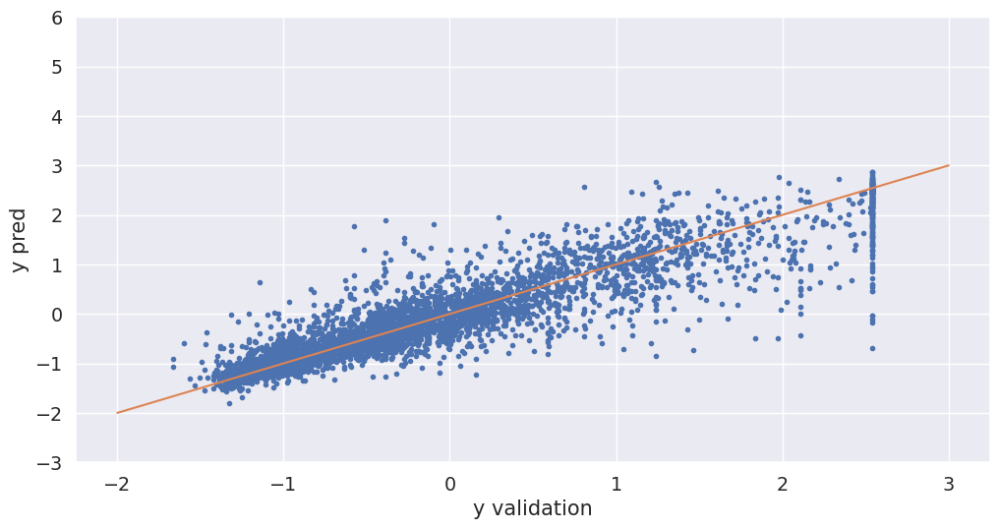

In [54]:
y_pred_nn = model.predict(X_validation.values)
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y_validation, y_pred_nn, ".")
plt.plot(range(-2, 4), range(-2, 4))
plt.ylim(-3, 6)
plt.xlabel("y validation")
plt.ylabel("y pred")

No handles with labels found to put in legend.


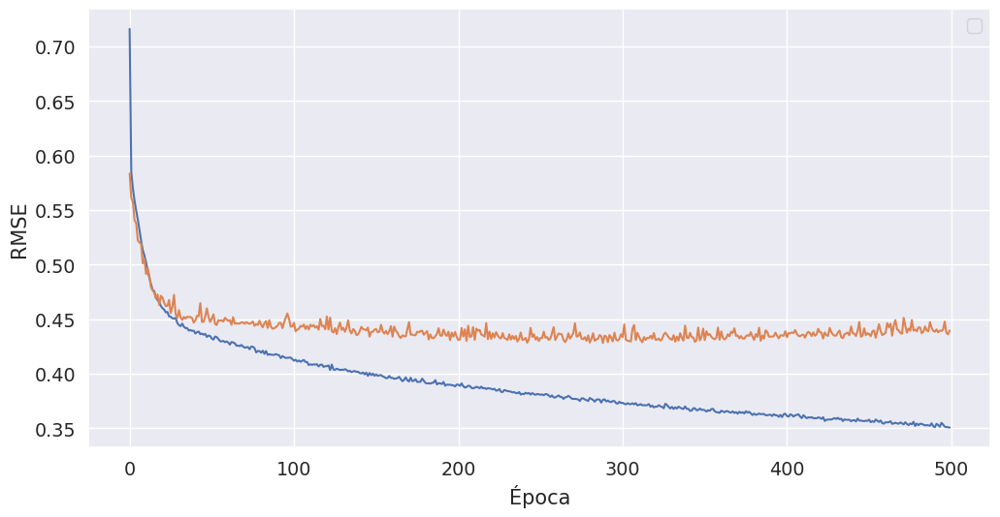

In [55]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Que pasa si agregamos muchas neuronas?

In [56]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,)))
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [57]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 16s - loss: 1.0679

1472/6000 [======>.......................] - ETA: 0s - loss: 0.5593 

2880/6000 [=============>................] - ETA: 0s - loss: 0.4885

4352/6000 [====================>.........] - ETA: 0s - loss: 0.4924

5728/6000 [===========================>..] - ETA: 0s - loss: 0.5478

6000/6000 [==============================] - 0s 68us/step - loss: 0.5404 - val_loss: 0.3606


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2650

1504/6000 [======>.......................] - ETA: 0s - loss: 0.3605

3104/6000 [==============>...............] - ETA: 0s - loss: 0.3407

4672/6000 [======================>.......] - ETA: 0s - loss: 0.3200

6000/6000 [==============================] - 0s 49us/step - loss: 0.3199 - val_loss: 0.2790


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1539

1568/6000 [======>.......................] - ETA: 0s - loss: 0.3146

3040/6000 [==============>...............] - ETA: 0s - loss: 0.3683

4320/6000 [====================>.........] - ETA: 0s - loss: 0.3466

5600/6000 [===========================>..] - ETA: 0s - loss: 0.3407

6000/6000 [==============================] - 0s 55us/step - loss: 0.3336 - val_loss: 0.2552


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4874

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2860

2880/6000 [=============>................] - ETA: 0s - loss: 0.2858

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2796

5856/6000 [============================>.] - ETA: 0s - loss: 0.2684

6000/6000 [==============================] - 0s 53us/step - loss: 0.2671 - val_loss: 0.2407


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1149

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2193

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2415

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2422

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2513

6000/6000 [==============================] - 0s 55us/step - loss: 0.2510 - val_loss: 0.2368


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4919

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2162

2720/6000 [============>.................] - ETA: 0s - loss: 0.2337

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2748

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2619

6000/6000 [==============================] - 0s 52us/step - loss: 0.2572 - val_loss: 0.2302


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0730

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3136

2880/6000 [=============>................] - ETA: 0s - loss: 0.2739

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2618

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2515

6000/6000 [==============================] - 0s 51us/step - loss: 0.2494 - val_loss: 0.2426


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1046

1696/6000 [=======>......................] - ETA: 0s - loss: 0.3193

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2685

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2669

5920/6000 [============================>.] - ETA: 0s - loss: 0.2544

6000/6000 [==============================] - 0s 50us/step - loss: 0.2530 - val_loss: 0.2262


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1065

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2117

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2179

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2137

5888/6000 [============================>.] - ETA: 0s - loss: 0.2178

6000/6000 [==============================] - 0s 50us/step - loss: 0.2173 - val_loss: 0.2227


Epoch 10/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2429

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2201

2816/6000 [=============>................] - ETA: 0s - loss: 0.2097

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2140

6000/6000 [==============================] - 0s 47us/step - loss: 0.2123 - val_loss: 0.2175


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1633

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1946

3232/6000 [===============>..............] - ETA: 0s - loss: 0.2024

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2076

5952/6000 [============================>.] - ETA: 0s - loss: 0.2105

6000/6000 [==============================] - 0s 52us/step - loss: 0.2122 - val_loss: 0.2221


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1866

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1960

2144/6000 [=========>....................] - ETA: 0s - loss: 0.2017

3776/6000 [=================>............] - ETA: 0s - loss: 0.2117

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2024

6000/6000 [==============================] - 0s 52us/step - loss: 0.2054 - val_loss: 0.2265


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7060

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2584

2784/6000 [============>.................] - ETA: 0s - loss: 0.2511

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2417

5856/6000 [============================>.] - ETA: 0s - loss: 0.2339

6000/6000 [==============================] - 0s 50us/step - loss: 0.2323 - val_loss: 0.2270


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3992

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2281

2880/6000 [=============>................] - ETA: 0s - loss: 0.2113

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2097

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2090

6000/6000 [==============================] - 0s 52us/step - loss: 0.2095 - val_loss: 0.2166


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2522

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2156

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2363

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2239

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2178

6000/6000 [==============================] - 0s 53us/step - loss: 0.2151 - val_loss: 0.2090


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1215

 672/6000 [==>...........................] - ETA: 0s - loss: 0.1814

1952/6000 [========>.....................] - ETA: 0s - loss: 0.1937

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1869

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1923

5952/6000 [============================>.] - ETA: 0s - loss: 0.2063

6000/6000 [==============================] - 0s 59us/step - loss: 0.2081 - val_loss: 0.2122


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1885

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1991

2912/6000 [=============>................] - ETA: 0s - loss: 0.2288

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2289

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2195

6000/6000 [==============================] - 0s 49us/step - loss: 0.2179 - val_loss: 0.2114


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2452

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1865

2656/6000 [============>.................] - ETA: 0s - loss: 0.1853

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1910

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2080

6000/6000 [==============================] - 0s 55us/step - loss: 0.2085 - val_loss: 0.2108


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2736

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1888

2784/6000 [============>.................] - ETA: 0s - loss: 0.2012

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1959

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2032

6000/6000 [==============================] - 0s 49us/step - loss: 0.1993 - val_loss: 0.2081


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2160

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2198

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2036

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2003

5824/6000 [============================>.] - ETA: 0s - loss: 0.2003

6000/6000 [==============================] - 0s 52us/step - loss: 0.1998 - val_loss: 0.2059


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1546

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1927

2944/6000 [=============>................] - ETA: 0s - loss: 0.1894

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1861

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1891

6000/6000 [==============================] - 0s 51us/step - loss: 0.1884 - val_loss: 0.2094


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1316

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1853

2656/6000 [============>.................] - ETA: 0s - loss: 0.1895

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1922

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1931

6000/6000 [==============================] - 0s 52us/step - loss: 0.1908 - val_loss: 0.2018


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2081

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2045

2976/6000 [=============>................] - ETA: 0s - loss: 0.1948

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1870

5824/6000 [============================>.] - ETA: 0s - loss: 0.1831

6000/6000 [==============================] - 0s 50us/step - loss: 0.1855 - val_loss: 0.2102


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1155

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1950

2688/6000 [============>.................] - ETA: 0s - loss: 0.1858

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1885

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1858

6000/6000 [==============================] - 0s 57us/step - loss: 0.1871 - val_loss: 0.2067


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2583

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1768

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1883

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1884

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1871

6000/6000 [==============================] - 0s 54us/step - loss: 0.1838 - val_loss: 0.2013


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1994

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1872

2848/6000 [=============>................] - ETA: 0s - loss: 0.1770

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1789

5984/6000 [============================>.] - ETA: 0s - loss: 0.1814

6000/6000 [==============================] - 0s 48us/step - loss: 0.1813 - val_loss: 0.2057


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1307

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1645

2912/6000 [=============>................] - ETA: 0s - loss: 0.1684

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1772

5856/6000 [============================>.] - ETA: 0s - loss: 0.1815

6000/6000 [==============================] - 0s 51us/step - loss: 0.1809 - val_loss: 0.2066


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1969

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1957

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1907

3712/6000 [=================>............] - ETA: 0s - loss: 0.1948

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1861

6000/6000 [==============================] - 0s 55us/step - loss: 0.1849 - val_loss: 0.2029


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2077

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1772

2816/6000 [=============>................] - ETA: 0s - loss: 0.1699

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1794

5824/6000 [============================>.] - ETA: 0s - loss: 0.1920

6000/6000 [==============================] - 0s 51us/step - loss: 0.1915 - val_loss: 0.2043


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1214

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1748

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1784

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1745

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1929

6000/6000 [==============================] - 0s 51us/step - loss: 0.1927 - val_loss: 0.2056


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1507

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2027

2688/6000 [============>.................] - ETA: 0s - loss: 0.1986

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1950

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1931

6000/6000 [==============================] - 0s 54us/step - loss: 0.1887 - val_loss: 0.2033


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1246

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1723

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1766

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1752

5952/6000 [============================>.] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 50us/step - loss: 0.1791 - val_loss: 0.2051


Epoch 33/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2160

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1912

2720/6000 [============>.................] - ETA: 0s - loss: 0.1871

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1806

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1796

6000/6000 [==============================] - 0s 49us/step - loss: 0.1786 - val_loss: 0.2025


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2002

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1879

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1859

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1834

6000/6000 [==============================] - 0s 54us/step - loss: 0.1839 - val_loss: 0.2022


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0836

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1624

2976/6000 [=============>................] - ETA: 0s - loss: 0.1670

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1771

6000/6000 [==============================] - 0s 49us/step - loss: 0.1767 - val_loss: 0.1990


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2547

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1738

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1785

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1778

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1786

6000/6000 [==============================] - 0s 56us/step - loss: 0.1773 - val_loss: 0.1952


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0754

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1719

2944/6000 [=============>................] - ETA: 0s - loss: 0.1765

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1737

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1758

6000/6000 [==============================] - 0s 52us/step - loss: 0.1749 - val_loss: 0.2073


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0938

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1563

2976/6000 [=============>................] - ETA: 0s - loss: 0.1702

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1676

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1716

6000/6000 [==============================] - 0s 54us/step - loss: 0.1753 - val_loss: 0.2140


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1002

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1553

2848/6000 [=============>................] - ETA: 0s - loss: 0.1631

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1764

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 52us/step - loss: 0.1748 - val_loss: 0.1998


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2793

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1683

2784/6000 [============>.................] - ETA: 0s - loss: 0.1758

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1706

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 52us/step - loss: 0.1726 - val_loss: 0.1961


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1561

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1535

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1654

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 48us/step - loss: 0.1721 - val_loss: 0.2067


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2818

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1546

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1757

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1696

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1701

6000/6000 [==============================] - 0s 52us/step - loss: 0.1703 - val_loss: 0.2090


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0919

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1735

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1803

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1718

6000/6000 [==============================] - 0s 50us/step - loss: 0.1713 - val_loss: 0.1948


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3704

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1661

2784/6000 [============>.................] - ETA: 0s - loss: 0.1664

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1733

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1747

6000/6000 [==============================] - 0s 50us/step - loss: 0.1757 - val_loss: 0.2047


Epoch 45/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1225

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1677

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1778

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1834

6000/6000 [==============================] - 0s 47us/step - loss: 0.1774 - val_loss: 0.1998


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0571

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1608

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1600

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1614

6000/6000 [==============================] - 0s 50us/step - loss: 0.1735 - val_loss: 0.2082


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1481

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1636

2976/6000 [=============>................] - ETA: 0s - loss: 0.1626

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1675

5984/6000 [============================>.] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 51us/step - loss: 0.1697 - val_loss: 0.1964


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0847

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1531

2976/6000 [=============>................] - ETA: 0s - loss: 0.1712

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1736

5856/6000 [============================>.] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 48us/step - loss: 0.1717 - val_loss: 0.2000


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1696

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1630

2880/6000 [=============>................] - ETA: 0s - loss: 0.1705

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1660

5952/6000 [============================>.] - ETA: 0s - loss: 0.1657

6000/6000 [==============================] - 0s 47us/step - loss: 0.1659 - val_loss: 0.2006


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1583

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1579

2944/6000 [=============>................] - ETA: 0s - loss: 0.1666

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1642

5824/6000 [============================>.] - ETA: 0s - loss: 0.1638

6000/6000 [==============================] - 0s 51us/step - loss: 0.1650 - val_loss: 0.1981


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4990

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1609

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1646

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1616

6000/6000 [==============================] - 0s 45us/step - loss: 0.1652 - val_loss: 0.1984


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1462

2848/6000 [=============>................] - ETA: 0s - loss: 0.1537

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1587

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1617

6000/6000 [==============================] - 0s 53us/step - loss: 0.1635 - val_loss: 0.1970


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1478

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1580

2880/6000 [=============>................] - ETA: 0s - loss: 0.1556

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1613

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1667

6000/6000 [==============================] - 0s 52us/step - loss: 0.1658 - val_loss: 0.2043


Epoch 54/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1600

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1822

2848/6000 [=============>................] - ETA: 0s - loss: 0.1653

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1619

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1636

6000/6000 [==============================] - 0s 54us/step - loss: 0.1627 - val_loss: 0.1920


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2806

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1589

2912/6000 [=============>................] - ETA: 0s - loss: 0.1634

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1604

6000/6000 [==============================] - 0s 47us/step - loss: 0.1622 - val_loss: 0.2028


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2250

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1784

2816/6000 [=============>................] - ETA: 0s - loss: 0.1695

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1617

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1624

6000/6000 [==============================] - 0s 52us/step - loss: 0.1637 - val_loss: 0.1960


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2405

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1608

2848/6000 [=============>................] - ETA: 0s - loss: 0.1633

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1669

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1646

6000/6000 [==============================] - 0s 54us/step - loss: 0.1638 - val_loss: 0.1939


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1588

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1660

2848/6000 [=============>................] - ETA: 0s - loss: 0.1601

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1630

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1602

6000/6000 [==============================] - 0s 53us/step - loss: 0.1615 - val_loss: 0.1986


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1702

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1696

2656/6000 [============>.................] - ETA: 0s - loss: 0.1626

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1633

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1625

6000/6000 [==============================] - 0s 53us/step - loss: 0.1620 - val_loss: 0.1986


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1769

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1425

2976/6000 [=============>................] - ETA: 0s - loss: 0.1543

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1538

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1588

6000/6000 [==============================] - 0s 52us/step - loss: 0.1604 - val_loss: 0.2038


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3930

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1643

2656/6000 [============>.................] - ETA: 0s - loss: 0.1642

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1666

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1623

6000/6000 [==============================] - 0s 50us/step - loss: 0.1605 - val_loss: 0.1934


Epoch 62/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1483

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1737

2976/6000 [=============>................] - ETA: 0s - loss: 0.1656

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1622

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1611

6000/6000 [==============================] - 0s 50us/step - loss: 0.1607 - val_loss: 0.1999


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1530

2688/6000 [============>.................] - ETA: 0s - loss: 0.1525

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1533

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1568

6000/6000 [==============================] - 0s 52us/step - loss: 0.1585 - val_loss: 0.1978


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1108

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1518

2944/6000 [=============>................] - ETA: 0s - loss: 0.1474

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1604

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1594

6000/6000 [==============================] - 0s 51us/step - loss: 0.1596 - val_loss: 0.1928


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1300

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1797

2752/6000 [============>.................] - ETA: 0s - loss: 0.1713

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1636

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1582

6000/6000 [==============================] - 0s 52us/step - loss: 0.1576 - val_loss: 0.1967


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1079

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1651

2752/6000 [============>.................] - ETA: 0s - loss: 0.1620

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1581

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1586

6000/6000 [==============================] - 0s 52us/step - loss: 0.1600 - val_loss: 0.1964


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2351

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1614

2944/6000 [=============>................] - ETA: 0s - loss: 0.1669

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1614

6000/6000 [==============================] - 0s 47us/step - loss: 0.1571 - val_loss: 0.1987


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2011

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1543

2848/6000 [=============>................] - ETA: 0s - loss: 0.1669

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1609

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1577

6000/6000 [==============================] - 0s 53us/step - loss: 0.1581 - val_loss: 0.1962


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1171

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1553

2752/6000 [============>.................] - ETA: 0s - loss: 0.1578

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1664

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1588

6000/6000 [==============================] - 0s 53us/step - loss: 0.1573 - val_loss: 0.1941


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2350

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1665

2912/6000 [=============>................] - ETA: 0s - loss: 0.1586

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1601

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1568

6000/6000 [==============================] - 0s 51us/step - loss: 0.1567 - val_loss: 0.2091


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1571

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1577

2816/6000 [=============>................] - ETA: 0s - loss: 0.1525

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1574

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1564

6000/6000 [==============================] - 0s 49us/step - loss: 0.1564 - val_loss: 0.1943


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0676

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1591

2784/6000 [============>.................] - ETA: 0s - loss: 0.1580

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1601

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1572

6000/6000 [==============================] - 0s 55us/step - loss: 0.1555 - val_loss: 0.1933


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0989

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1521

2688/6000 [============>.................] - ETA: 0s - loss: 0.1511

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1506

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1535

6000/6000 [==============================] - 0s 50us/step - loss: 0.1553 - val_loss: 0.1963


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1117



1632/6000 [=======>......................] - ETA: 0s - loss: 0.1472

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1454

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1469

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1518

6000/6000 [==============================] - 0s 50us/step - loss: 0.1522 - val_loss: 0.1922


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1027

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1489

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1488

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1523

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1518

6000/6000 [==============================] - 0s 51us/step - loss: 0.1519 - val_loss: 0.1971


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1502

2912/6000 [=============>................] - ETA: 0s - loss: 0.1534

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1498

5856/6000 [============================>.] - ETA: 0s - loss: 0.1527

6000/6000 [==============================] - 0s 48us/step - loss: 0.1543 - val_loss: 0.2008


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2206

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1414

2944/6000 [=============>................] - ETA: 0s - loss: 0.1481

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1492

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1509

6000/6000 [==============================] - 0s 52us/step - loss: 0.1522 - val_loss: 0.1942


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0509

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1345

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1403

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 45us/step - loss: 0.1506 - val_loss: 0.1924


Epoch 79/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0707

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1461

2656/6000 [============>.................] - ETA: 0s - loss: 0.1631

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1568

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1520

6000/6000 [==============================] - 0s 53us/step - loss: 0.1511 - val_loss: 0.1968


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1700

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1648

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1551

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1484

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1484

6000/6000 [==============================] - 0s 51us/step - loss: 0.1509 - val_loss: 0.1965


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1308

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1395

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1539

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1544

6000/6000 [==============================] - 0s 46us/step - loss: 0.1492 - val_loss: 0.2031


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2305

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1572

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1565

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1507

6000/6000 [==============================] - 0s 48us/step - loss: 0.1496 - val_loss: 0.2011


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0871

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1601

2944/6000 [=============>................] - ETA: 0s - loss: 0.1517

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1542

5888/6000 [============================>.] - ETA: 0s - loss: 0.1515

6000/6000 [==============================] - 0s 48us/step - loss: 0.1509 - val_loss: 0.1980


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1220

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1600

2752/6000 [============>.................] - ETA: 0s - loss: 0.1532

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1506

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 54us/step - loss: 0.1493 - val_loss: 0.1951


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1015

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1612

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1485

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1476

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1487

6000/6000 [==============================] - 0s 52us/step - loss: 0.1489 - val_loss: 0.1907


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1417

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1347

2816/6000 [=============>................] - ETA: 0s - loss: 0.1458

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1481

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1468

6000/6000 [==============================] - 0s 51us/step - loss: 0.1458 - val_loss: 0.1887


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0960

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1472

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1508

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1474

5856/6000 [============================>.] - ETA: 0s - loss: 0.1476

6000/6000 [==============================] - 0s 48us/step - loss: 0.1485 - val_loss: 0.2005


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0987

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1352

2816/6000 [=============>................] - ETA: 0s - loss: 0.1395

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1386

5856/6000 [============================>.] - ETA: 0s - loss: 0.1437

6000/6000 [==============================] - 0s 48us/step - loss: 0.1452 - val_loss: 0.1927


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0936

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1444

2848/6000 [=============>................] - ETA: 0s - loss: 0.1416

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1415

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1482

6000/6000 [==============================] - 0s 50us/step - loss: 0.1459 - val_loss: 0.2001


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0752

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1353

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1443

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1426

6000/6000 [==============================] - 0s 47us/step - loss: 0.1467 - val_loss: 0.2266


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1989

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1485

2880/6000 [=============>................] - ETA: 0s - loss: 0.1457

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1459

5856/6000 [============================>.] - ETA: 0s - loss: 0.1464

6000/6000 [==============================] - 0s 49us/step - loss: 0.1463 - val_loss: 0.1944


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2374

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1453

2816/6000 [=============>................] - ETA: 0s - loss: 0.1490

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1520

5824/6000 [============================>.] - ETA: 0s - loss: 0.1456

6000/6000 [==============================] - 0s 49us/step - loss: 0.1444 - val_loss: 0.1941


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2025

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1362

2816/6000 [=============>................] - ETA: 0s - loss: 0.1395

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1453

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1467

6000/6000 [==============================] - 0s 49us/step - loss: 0.1454 - val_loss: 0.1898


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0596

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1338

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1380

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1383

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1430

6000/6000 [==============================] - 0s 53us/step - loss: 0.1429 - val_loss: 0.1895


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1246

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1207

2848/6000 [=============>................] - ETA: 0s - loss: 0.1385

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1444

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1429

6000/6000 [==============================] - 0s 50us/step - loss: 0.1424 - val_loss: 0.1919


Epoch 96/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2287

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1332

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1397

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1443

5856/6000 [============================>.] - ETA: 0s - loss: 0.1417

6000/6000 [==============================] - 0s 49us/step - loss: 0.1420 - val_loss: 0.1983


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1548

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1502

2944/6000 [=============>................] - ETA: 0s - loss: 0.1435

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1453

5920/6000 [============================>.] - ETA: 0s - loss: 0.1436

6000/6000 [==============================] - 0s 51us/step - loss: 0.1431 - val_loss: 0.1961


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1253

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1364

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1382

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1406

6000/6000 [==============================] - 0s 52us/step - loss: 0.1408 - val_loss: 0.1944


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1336

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1505

2848/6000 [=============>................] - ETA: 0s - loss: 0.1445

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1438

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1437

6000/6000 [==============================] - 0s 51us/step - loss: 0.1440 - val_loss: 0.1903


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1556

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1256

2880/6000 [=============>................] - ETA: 0s - loss: 0.1301

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1342

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1387

6000/6000 [==============================] - 0s 51us/step - loss: 0.1387 - val_loss: 0.1927


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1150

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1364

2784/6000 [============>.................] - ETA: 0s - loss: 0.1320

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1366

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1393

6000/6000 [==============================] - 0s 52us/step - loss: 0.1402 - val_loss: 0.1882


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0972

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1303

2976/6000 [=============>................] - ETA: 0s - loss: 0.1371

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1354

5888/6000 [============================>.] - ETA: 0s - loss: 0.1384

6000/6000 [==============================] - 0s 49us/step - loss: 0.1389 - val_loss: 0.1929


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1708

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1422

2784/6000 [============>.................] - ETA: 0s - loss: 0.1427

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1370

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1374

6000/6000 [==============================] - 0s 54us/step - loss: 0.1395 - val_loss: 0.1927


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1193

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1455

2688/6000 [============>.................] - ETA: 0s - loss: 0.1286

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1347

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1359

6000/6000 [==============================] - 0s 52us/step - loss: 0.1379 - val_loss: 0.1989


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1415

2784/6000 [============>.................] - ETA: 0s - loss: 0.1323

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1324

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1343

6000/6000 [==============================] - 0s 53us/step - loss: 0.1349 - val_loss: 0.1987


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1804

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1327

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1346

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1389

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1367

6000/6000 [==============================] - 0s 52us/step - loss: 0.1373 - val_loss: 0.1972


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0475

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1308

2816/6000 [=============>................] - ETA: 0s - loss: 0.1285

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1384

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1379

6000/6000 [==============================] - 0s 53us/step - loss: 0.1386 - val_loss: 0.1875


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0919

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1246

2912/6000 [=============>................] - ETA: 0s - loss: 0.1300

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1362

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1358

6000/6000 [==============================] - 0s 53us/step - loss: 0.1362 - val_loss: 0.1921


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0977

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1340

2912/6000 [=============>................] - ETA: 0s - loss: 0.1354

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1376

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1368

6000/6000 [==============================] - 0s 52us/step - loss: 0.1347 - val_loss: 0.2057


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1229

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1253

2848/6000 [=============>................] - ETA: 0s - loss: 0.1373

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1391

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1375

6000/6000 [==============================] - 0s 52us/step - loss: 0.1364 - val_loss: 0.1928


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1205

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1382

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1325

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1293

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 55us/step - loss: 0.1334 - val_loss: 0.1934


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0884

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1316

2848/6000 [=============>................] - ETA: 0s - loss: 0.1353

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1370

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1354

6000/6000 [==============================] - 0s 49us/step - loss: 0.1358 - val_loss: 0.1916


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2117

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1310

2912/6000 [=============>................] - ETA: 0s - loss: 0.1345

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1328

5856/6000 [============================>.] - ETA: 0s - loss: 0.1344

6000/6000 [==============================] - 0s 48us/step - loss: 0.1347 - val_loss: 0.1925


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1197

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1313

2752/6000 [============>.................] - ETA: 0s - loss: 0.1344

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1321

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1329

6000/6000 [==============================] - 0s 53us/step - loss: 0.1320 - val_loss: 0.1943


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1114

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1171

2848/6000 [=============>................] - ETA: 0s - loss: 0.1252

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1322

5856/6000 [============================>.] - ETA: 0s - loss: 0.1355

6000/6000 [==============================] - 0s 52us/step - loss: 0.1351 - val_loss: 0.1929


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1925

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1334

2944/6000 [=============>................] - ETA: 0s - loss: 0.1391

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1355

5920/6000 [============================>.] - ETA: 0s - loss: 0.1320

6000/6000 [==============================] - 0s 48us/step - loss: 0.1328 - val_loss: 0.1956


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0993

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1331

2880/6000 [=============>................] - ETA: 0s - loss: 0.1345

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1349

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1325

6000/6000 [==============================] - 0s 52us/step - loss: 0.1320 - val_loss: 0.1984


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1119

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1222

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1224

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1276

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1324

6000/6000 [==============================] - 0s 55us/step - loss: 0.1314 - val_loss: 0.2056


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1065

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1361

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1342

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 46us/step - loss: 0.1320 - val_loss: 0.1909


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0989

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1204

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1291

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1300

6000/6000 [==============================] - 0s 48us/step - loss: 0.1334 - val_loss: 0.2066


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1211

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1367

2752/6000 [============>.................] - ETA: 0s - loss: 0.1339

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1323

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 51us/step - loss: 0.1328 - val_loss: 0.1890


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1493

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1341

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1288

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1253

5984/6000 [============================>.] - ETA: 0s - loss: 0.1305

6000/6000 [==============================] - 0s 48us/step - loss: 0.1306 - val_loss: 0.1919


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0752

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1320

2752/6000 [============>.................] - ETA: 0s - loss: 0.1308

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1310

5888/6000 [============================>.] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 48us/step - loss: 0.1318 - val_loss: 0.1973


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1139

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1338

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1305

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1325

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1310

6000/6000 [==============================] - 0s 53us/step - loss: 0.1293 - val_loss: 0.1921


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1455

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1211

2816/6000 [=============>................] - ETA: 0s - loss: 0.1296

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1291

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1292

6000/6000 [==============================] - 0s 52us/step - loss: 0.1306 - val_loss: 0.1943


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0707

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1264

2944/6000 [=============>................] - ETA: 0s - loss: 0.1240

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1259

5920/6000 [============================>.] - ETA: 0s - loss: 0.1282

6000/6000 [==============================] - 0s 49us/step - loss: 0.1292 - val_loss: 0.1887


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0782

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1275

2976/6000 [=============>................] - ETA: 0s - loss: 0.1273

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1255

5952/6000 [============================>.] - ETA: 0s - loss: 0.1284

6000/6000 [==============================] - 0s 50us/step - loss: 0.1288 - val_loss: 0.1925


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1239

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1390

2912/6000 [=============>................] - ETA: 0s - loss: 0.1300

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1289

5824/6000 [============================>.] - ETA: 0s - loss: 0.1278

6000/6000 [==============================] - 0s 51us/step - loss: 0.1276 - val_loss: 0.1930


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1221

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1231

2688/6000 [============>.................] - ETA: 0s - loss: 0.1274

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1297

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1307

6000/6000 [==============================] - 0s 51us/step - loss: 0.1299 - val_loss: 0.1933


Epoch 130/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0970

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1289

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1324

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1256

5984/6000 [============================>.] - ETA: 0s - loss: 0.1264

6000/6000 [==============================] - 0s 50us/step - loss: 0.1261 - val_loss: 0.1925


Epoch 131/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0927

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1351

2912/6000 [=============>................] - ETA: 0s - loss: 0.1267

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1280

5824/6000 [============================>.] - ETA: 0s - loss: 0.1270

6000/6000 [==============================] - 0s 50us/step - loss: 0.1275 - val_loss: 0.1953


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0629

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1141

2944/6000 [=============>................] - ETA: 0s - loss: 0.1254

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1265

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1276

6000/6000 [==============================] - 0s 51us/step - loss: 0.1258 - val_loss: 0.2004


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1434

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1333

2880/6000 [=============>................] - ETA: 0s - loss: 0.1207

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1234

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1252

6000/6000 [==============================] - 0s 52us/step - loss: 0.1242 - val_loss: 0.1874


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1417

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1290

2720/6000 [============>.................] - ETA: 0s - loss: 0.1328

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1278

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1268

6000/6000 [==============================] - 0s 49us/step - loss: 0.1272 - val_loss: 0.2030


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0991

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1391

2752/6000 [============>.................] - ETA: 0s - loss: 0.1247

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1262

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1257

6000/6000 [==============================] - 0s 53us/step - loss: 0.1255 - val_loss: 0.2075


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0885

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1183

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1171

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1201

5920/6000 [============================>.] - ETA: 0s - loss: 0.1228

6000/6000 [==============================] - 0s 49us/step - loss: 0.1228 - val_loss: 0.1899


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0491

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1140

2944/6000 [=============>................] - ETA: 0s - loss: 0.1236

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1228

5952/6000 [============================>.] - ETA: 0s - loss: 0.1232

6000/6000 [==============================] - 0s 49us/step - loss: 0.1231 - val_loss: 0.1940


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1588

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1098

2880/6000 [=============>................] - ETA: 0s - loss: 0.1168

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1173

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1209

6000/6000 [==============================] - 0s 52us/step - loss: 0.1231 - val_loss: 0.2056


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1189

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1086

2656/6000 [============>.................] - ETA: 0s - loss: 0.1269

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1281

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1259

6000/6000 [==============================] - 0s 51us/step - loss: 0.1243 - val_loss: 0.1937


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0853

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1312

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1241

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1224

6000/6000 [==============================] - 0s 48us/step - loss: 0.1223 - val_loss: 0.1910


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1047

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1254

2816/6000 [=============>................] - ETA: 0s - loss: 0.1154

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1213

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1208

6000/6000 [==============================] - 0s 48us/step - loss: 0.1216 - val_loss: 0.1940


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0864

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1109

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1185

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1176

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1226

6000/6000 [==============================] - 0s 54us/step - loss: 0.1217 - val_loss: 0.1941


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0433

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1308

2688/6000 [============>.................] - ETA: 0s - loss: 0.1310

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1241

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1227

6000/6000 [==============================] - 0s 49us/step - loss: 0.1224 - val_loss: 0.1923


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0544

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1195

2752/6000 [============>.................] - ETA: 0s - loss: 0.1200

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1158

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1203

6000/6000 [==============================] - 0s 52us/step - loss: 0.1191 - val_loss: 0.1951


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0908

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1216

2656/6000 [============>.................] - ETA: 0s - loss: 0.1238

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1242

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1202

6000/6000 [==============================] - 0s 52us/step - loss: 0.1219 - val_loss: 0.1922


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0716

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1193

2944/6000 [=============>................] - ETA: 0s - loss: 0.1274

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1226

6000/6000 [==============================] - 0s 49us/step - loss: 0.1251 - val_loss: 0.1941


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0434

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1170

2624/6000 [============>.................] - ETA: 0s - loss: 0.1303

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1247

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1228

6000/6000 [==============================] - 0s 52us/step - loss: 0.1217 - val_loss: 0.1909


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0638

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1174

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1214

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1186

6000/6000 [==============================] - 0s 48us/step - loss: 0.1194 - val_loss: 0.2082


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0949

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1171

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1219

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1183

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1187

6000/6000 [==============================] - 0s 48us/step - loss: 0.1192 - val_loss: 0.1931


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0738

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1237

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1123

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1172

6000/6000 [==============================] - 0s 48us/step - loss: 0.1212 - val_loss: 0.2039


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0690

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1272

2624/6000 [============>.................] - ETA: 0s - loss: 0.1146

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1182

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1212

6000/6000 [==============================] - 0s 48us/step - loss: 0.1212 - val_loss: 0.2055


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1229

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1245

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1215

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1183

6000/6000 [==============================] - 0s 46us/step - loss: 0.1185 - val_loss: 0.1970


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2338

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1028

2976/6000 [=============>................] - ETA: 0s - loss: 0.1095

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1129

6000/6000 [==============================] - 0s 47us/step - loss: 0.1181 - val_loss: 0.1968


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0725

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1286

2912/6000 [=============>................] - ETA: 0s - loss: 0.1221

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1210

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1192

6000/6000 [==============================] - 0s 51us/step - loss: 0.1203 - val_loss: 0.1946


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0849

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1245

2976/6000 [=============>................] - ETA: 0s - loss: 0.1194

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1174

5824/6000 [============================>.] - ETA: 0s - loss: 0.1187

6000/6000 [==============================] - 0s 50us/step - loss: 0.1188 - val_loss: 0.1919


Epoch 156/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1540

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1103

2656/6000 [============>.................] - ETA: 0s - loss: 0.1174

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1178

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1200

6000/6000 [==============================] - 0s 50us/step - loss: 0.1200 - val_loss: 0.2064


Epoch 157/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1014

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1169

2720/6000 [============>.................] - ETA: 0s - loss: 0.1157

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1197

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1167

6000/6000 [==============================] - 0s 54us/step - loss: 0.1185 - val_loss: 0.2016


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1556

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1100

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1115

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1174

6000/6000 [==============================] - 0s 47us/step - loss: 0.1189 - val_loss: 0.2012


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2263

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1295

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1172

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1161

6000/6000 [==============================] - 0s 46us/step - loss: 0.1188 - val_loss: 0.1920


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2570

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1186

2944/6000 [=============>................] - ETA: 0s - loss: 0.1158

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1161

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1159

6000/6000 [==============================] - 0s 53us/step - loss: 0.1163 - val_loss: 0.1893


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1198

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0975

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1047

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1094

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1145

6000/6000 [==============================] - 0s 51us/step - loss: 0.1147 - val_loss: 0.1899


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0663

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1018

2656/6000 [============>.................] - ETA: 0s - loss: 0.1059

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1105

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1158

6000/6000 [==============================] - 0s 52us/step - loss: 0.1170 - val_loss: 0.1999


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1486

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1094

2656/6000 [============>.................] - ETA: 0s - loss: 0.1225

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1159

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1171

6000/6000 [==============================] - 0s 54us/step - loss: 0.1177 - val_loss: 0.1894


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1243

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1061

2784/6000 [============>.................] - ETA: 0s - loss: 0.1077

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1114

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1138

6000/6000 [==============================] - 0s 52us/step - loss: 0.1148 - val_loss: 0.2048


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1042

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1132

2848/6000 [=============>................] - ETA: 0s - loss: 0.1136

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1163

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1160

6000/6000 [==============================] - 0s 52us/step - loss: 0.1145 - val_loss: 0.1923


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1094

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1125

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1113

3776/6000 [=================>............] - ETA: 0s - loss: 0.1189

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1149

6000/6000 [==============================] - 0s 56us/step - loss: 0.1137 - val_loss: 0.1922


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1468

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1091

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1068

3488/6000 [================>.............] - ETA: 0s - loss: 0.1118

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1128

6000/6000 [==============================] - 0s 55us/step - loss: 0.1150 - val_loss: 0.1976


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1155

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1090

2944/6000 [=============>................] - ETA: 0s - loss: 0.1147

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1178

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1162

6000/6000 [==============================] - 0s 51us/step - loss: 0.1157 - val_loss: 0.2244


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1541

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1047

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1077

3712/6000 [=================>............] - ETA: 0s - loss: 0.1063

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1125

6000/6000 [==============================] - 0s 54us/step - loss: 0.1141 - val_loss: 0.2041


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1390

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1167

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1120

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1096

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1115

6000/6000 [==============================] - 0s 57us/step - loss: 0.1123 - val_loss: 0.1933


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1378

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1101

2976/6000 [=============>................] - ETA: 0s - loss: 0.1111

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1108

5824/6000 [============================>.] - ETA: 0s - loss: 0.1124

6000/6000 [==============================] - 0s 56us/step - loss: 0.1123 - val_loss: 0.1983


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0965

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1267

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1167

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1169

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1147

6000/6000 [==============================] - 0s 56us/step - loss: 0.1144 - val_loss: 0.1958


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0777

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0948

2848/6000 [=============>................] - ETA: 0s - loss: 0.1052

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1079

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1137

6000/6000 [==============================] - 0s 52us/step - loss: 0.1129 - val_loss: 0.1976


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1096

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0998

2784/6000 [============>.................] - ETA: 0s - loss: 0.1078

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1116

5824/6000 [============================>.] - ETA: 0s - loss: 0.1116

6000/6000 [==============================] - 0s 50us/step - loss: 0.1126 - val_loss: 0.1980


Epoch 175/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0640

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1113

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1136

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1117

5984/6000 [============================>.] - ETA: 0s - loss: 0.1134

6000/6000 [==============================] - 0s 48us/step - loss: 0.1134 - val_loss: 0.1935


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0772

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1127

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1164

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1104

6000/6000 [==============================] - 0s 49us/step - loss: 0.1130 - val_loss: 0.2017


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3130

 864/6000 [===>..........................] - ETA: 0s - loss: 0.1145

2048/6000 [=========>....................] - ETA: 0s - loss: 0.1108

3616/6000 [=================>............] - ETA: 0s - loss: 0.1120

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1114

6000/6000 [==============================] - 0s 55us/step - loss: 0.1111 - val_loss: 0.1984


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0962

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1088

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1101

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1119

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1104

6000/6000 [==============================] - 0s 52us/step - loss: 0.1111 - val_loss: 0.1914


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0662

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0987

2752/6000 [============>.................] - ETA: 0s - loss: 0.1034

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1116

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1088

6000/6000 [==============================] - 0s 51us/step - loss: 0.1102 - val_loss: 0.2025


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1270

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1066

2880/6000 [=============>................] - ETA: 0s - loss: 0.1016

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1026

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1143

6000/6000 [==============================] - 0s 52us/step - loss: 0.1146 - val_loss: 0.2005


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0485

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1123

2848/6000 [=============>................] - ETA: 0s - loss: 0.1077

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1090

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1117

6000/6000 [==============================] - 0s 49us/step - loss: 0.1126 - val_loss: 0.1992


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1149

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1073

2656/6000 [============>.................] - ETA: 0s - loss: 0.1127

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1129

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1117

6000/6000 [==============================] - 0s 52us/step - loss: 0.1099 - val_loss: 0.1976


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1044

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1117

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1132

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1107

6000/6000 [==============================] - 0s 52us/step - loss: 0.1104 - val_loss: 0.1972


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0672

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1188

2912/6000 [=============>................] - ETA: 0s - loss: 0.1203

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1153

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1140

6000/6000 [==============================] - 0s 50us/step - loss: 0.1126 - val_loss: 0.1994


Epoch 185/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0697

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1082

2720/6000 [============>.................] - ETA: 0s - loss: 0.1113

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1121

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1108

6000/6000 [==============================] - 0s 49us/step - loss: 0.1103 - val_loss: 0.2049


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2146

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1074

2880/6000 [=============>................] - ETA: 0s - loss: 0.1123

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1098

5952/6000 [============================>.] - ETA: 0s - loss: 0.1097

6000/6000 [==============================] - 0s 47us/step - loss: 0.1094 - val_loss: 0.1968


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0813

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1077

2816/6000 [=============>................] - ETA: 0s - loss: 0.1162

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1124

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1117

6000/6000 [==============================] - 0s 52us/step - loss: 0.1104 - val_loss: 0.1992


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0515

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0918

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1025

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1061

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1070



6000/6000 [==============================] - 0s 51us/step - loss: 0.1081 - val_loss: 0.1952


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1250

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1151

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1051

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1075

5984/6000 [============================>.] - ETA: 0s - loss: 0.1099

6000/6000 [==============================] - 0s 50us/step - loss: 0.1098 - val_loss: 0.2028


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0802

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1075

2944/6000 [=============>................] - ETA: 0s - loss: 0.1042

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1042

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1057

6000/6000 [==============================] - 0s 50us/step - loss: 0.1065 - val_loss: 0.1932


Epoch 191/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1006

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1047

2848/6000 [=============>................] - ETA: 0s - loss: 0.1076

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1075

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1073

6000/6000 [==============================] - 0s 52us/step - loss: 0.1067 - val_loss: 0.1996


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0598

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1138

2784/6000 [============>.................] - ETA: 0s - loss: 0.1147

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1104

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1086

6000/6000 [==============================] - 0s 51us/step - loss: 0.1080 - val_loss: 0.1983


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0641

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1096

2880/6000 [=============>................] - ETA: 0s - loss: 0.1109

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1052

5888/6000 [============================>.] - ETA: 0s - loss: 0.1053

6000/6000 [==============================] - 0s 49us/step - loss: 0.1059 - val_loss: 0.1989


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1436

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1056

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1048

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1064

6000/6000 [==============================] - 0s 47us/step - loss: 0.1076 - val_loss: 0.1997


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2671

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1099

2752/6000 [============>.................] - ETA: 0s - loss: 0.1061

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1064

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1063

6000/6000 [==============================] - 0s 50us/step - loss: 0.1064 - val_loss: 0.2119


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0729

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1027

2752/6000 [============>.................] - ETA: 0s - loss: 0.1075

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1119

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1112

6000/6000 [==============================] - 0s 52us/step - loss: 0.1096 - val_loss: 0.1978


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0476

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1088

2816/6000 [=============>................] - ETA: 0s - loss: 0.1038

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1076

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1061

6000/6000 [==============================] - 0s 51us/step - loss: 0.1066 - val_loss: 0.2026


Epoch 198/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0814

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1101

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1048

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1056

6000/6000 [==============================] - 0s 47us/step - loss: 0.1080 - val_loss: 0.2074


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1311

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0957

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1021

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1035

6000/6000 [==============================] - 0s 44us/step - loss: 0.1075 - val_loss: 0.2017


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1373

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0958

2912/6000 [=============>................] - ETA: 0s - loss: 0.0962

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0999

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1043

6000/6000 [==============================] - 0s 49us/step - loss: 0.1042 - val_loss: 0.1980


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0743

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1055

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1045

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1054

5888/6000 [============================>.] - ETA: 0s - loss: 0.1066

6000/6000 [==============================] - 0s 53us/step - loss: 0.1068 - val_loss: 0.1998


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0771

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1141

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1083

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1065

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1076

6000/6000 [==============================] - 0s 54us/step - loss: 0.1075 - val_loss: 0.2014


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1271

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1113

2880/6000 [=============>................] - ETA: 0s - loss: 0.1060

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1078

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1055

6000/6000 [==============================] - 0s 54us/step - loss: 0.1062 - val_loss: 0.2075


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0822

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1081

2912/6000 [=============>................] - ETA: 0s - loss: 0.1050

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1046

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1040

6000/6000 [==============================] - 0s 52us/step - loss: 0.1043 - val_loss: 0.2044


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1717

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0995

2720/6000 [============>.................] - ETA: 0s - loss: 0.1033

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1031

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1041

6000/6000 [==============================] - 0s 52us/step - loss: 0.1038 - val_loss: 0.2050


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0924

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1084

2976/6000 [=============>................] - ETA: 0s - loss: 0.1046

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1068

5856/6000 [============================>.] - ETA: 0s - loss: 0.1040

6000/6000 [==============================] - 0s 50us/step - loss: 0.1036 - val_loss: 0.2005


Epoch 207/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0952



1376/6000 [=====>........................] - ETA: 0s - loss: 0.1056

2752/6000 [============>.................] - ETA: 0s - loss: 0.1050

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1035

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1028

6000/6000 [==============================] - 0s 51us/step - loss: 0.1035 - val_loss: 0.2009


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0477

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1115

2688/6000 [============>.................] - ETA: 0s - loss: 0.1047

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1075

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1040

6000/6000 [==============================] - 0s 51us/step - loss: 0.1041 - val_loss: 0.2013


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0983

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1047

2816/6000 [=============>................] - ETA: 0s - loss: 0.1123

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1051

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1052

6000/6000 [==============================] - 0s 49us/step - loss: 0.1047 - val_loss: 0.2051


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0747

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1076

2976/6000 [=============>................] - ETA: 0s - loss: 0.1093

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1078

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1069

6000/6000 [==============================] - 0s 51us/step - loss: 0.1062 - val_loss: 0.2004


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0566

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0827

2976/6000 [=============>................] - ETA: 0s - loss: 0.0922

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0955

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1018

6000/6000 [==============================] - 0s 49us/step - loss: 0.1028 - val_loss: 0.2040


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0857

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1131

2880/6000 [=============>................] - ETA: 0s - loss: 0.1082

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1061

5952/6000 [============================>.] - ETA: 0s - loss: 0.1030

6000/6000 [==============================] - 0s 48us/step - loss: 0.1036 - val_loss: 0.2011


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1185

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1004

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1099

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1090

6000/6000 [==============================] - 0s 47us/step - loss: 0.1058 - val_loss: 0.2087


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0612

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1120

2912/6000 [=============>................] - ETA: 0s - loss: 0.1073

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1063

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1041

6000/6000 [==============================] - 0s 50us/step - loss: 0.1040 - val_loss: 0.2018


Epoch 215/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1613

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1035

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0999

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1022

6000/6000 [==============================] - 0s 47us/step - loss: 0.1024 - val_loss: 0.2022


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0233

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0940

2880/6000 [=============>................] - ETA: 0s - loss: 0.0940

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0987

5888/6000 [============================>.] - ETA: 0s - loss: 0.1012

6000/6000 [==============================] - 0s 49us/step - loss: 0.1003 - val_loss: 0.2014


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1387

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1027

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0998

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1038

6000/6000 [==============================] - 0s 47us/step - loss: 0.1030 - val_loss: 0.2090


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0881

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0938

2784/6000 [============>.................] - ETA: 0s - loss: 0.1024

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1056

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1043

6000/6000 [==============================] - 0s 51us/step - loss: 0.1032 - val_loss: 0.2027


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0680

 832/6000 [===>..........................] - ETA: 0s - loss: 0.0853

2144/6000 [=========>....................] - ETA: 0s - loss: 0.0905

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0956

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0970

6000/6000 [==============================] - 0s 57us/step - loss: 0.1012 - val_loss: 0.1963


Epoch 220/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1104

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0874

2880/6000 [=============>................] - ETA: 0s - loss: 0.0912

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0937

5856/6000 [============================>.] - ETA: 0s - loss: 0.0985

6000/6000 [==============================] - 0s 52us/step - loss: 0.0999 - val_loss: 0.2022


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0390

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0991

2688/6000 [============>.................] - ETA: 0s - loss: 0.0959

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0974

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0989

6000/6000 [==============================] - 0s 52us/step - loss: 0.0994 - val_loss: 0.2064


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1112

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1067

2976/6000 [=============>................] - ETA: 0s - loss: 0.0980

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1015

5888/6000 [============================>.] - ETA: 0s - loss: 0.0996

6000/6000 [==============================] - 0s 49us/step - loss: 0.1000 - val_loss: 0.2107


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1905

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1065

2912/6000 [=============>................] - ETA: 0s - loss: 0.0993

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0969

6000/6000 [==============================] - 0s 47us/step - loss: 0.1016 - val_loss: 0.2056


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0742

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1026

2752/6000 [============>.................] - ETA: 0s - loss: 0.0969

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1012

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0990

6000/6000 [==============================] - 0s 52us/step - loss: 0.0993 - val_loss: 0.2038


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1066

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0924

2976/6000 [=============>................] - ETA: 0s - loss: 0.1012

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1034

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1009

6000/6000 [==============================] - 0s 54us/step - loss: 0.1006 - val_loss: 0.2040


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1062

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0989

2912/6000 [=============>................] - ETA: 0s - loss: 0.1007

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0973

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0998

6000/6000 [==============================] - 0s 51us/step - loss: 0.0995 - val_loss: 0.2100


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0826

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0924

2912/6000 [=============>................] - ETA: 0s - loss: 0.0986

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1003

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1004

6000/6000 [==============================] - 0s 50us/step - loss: 0.1012 - val_loss: 0.2040


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0618

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0903

2656/6000 [============>.................] - ETA: 0s - loss: 0.1042

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1002

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0994

6000/6000 [==============================] - 0s 52us/step - loss: 0.1001 - val_loss: 0.2002


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0968

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0944

2848/6000 [=============>................] - ETA: 0s - loss: 0.0901

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0962

5920/6000 [============================>.] - ETA: 0s - loss: 0.1001

6000/6000 [==============================] - 0s 49us/step - loss: 0.0999 - val_loss: 0.2026


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0906

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0934

2912/6000 [=============>................] - ETA: 0s - loss: 0.0939

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1002

6000/6000 [==============================] - 0s 47us/step - loss: 0.1003 - val_loss: 0.2063


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0471

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1030

2976/6000 [=============>................] - ETA: 0s - loss: 0.1015

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1020

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0998

6000/6000 [==============================] - 0s 49us/step - loss: 0.0993 - val_loss: 0.2077


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0834

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1035

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1039

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0998

6000/6000 [==============================] - 0s 49us/step - loss: 0.0993 - val_loss: 0.2134


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0273

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0895

2848/6000 [=============>................] - ETA: 0s - loss: 0.0948

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0991

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0988

6000/6000 [==============================] - 0s 52us/step - loss: 0.0993 - val_loss: 0.2084


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0506

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0985

2816/6000 [=============>................] - ETA: 0s - loss: 0.0995

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1024

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0982

6000/6000 [==============================] - 0s 50us/step - loss: 0.0975 - val_loss: 0.2045


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1141

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0932

2976/6000 [=============>................] - ETA: 0s - loss: 0.0986

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0958

6000/6000 [==============================] - 0s 49us/step - loss: 0.0970 - val_loss: 0.2064


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1512

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0855

2912/6000 [=============>................] - ETA: 0s - loss: 0.0902

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0966

5920/6000 [============================>.] - ETA: 0s - loss: 0.0977

6000/6000 [==============================] - 0s 50us/step - loss: 0.0979 - val_loss: 0.2309


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1237

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1070

2976/6000 [=============>................] - ETA: 0s - loss: 0.1017

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0998

5952/6000 [============================>.] - ETA: 0s - loss: 0.0988

6000/6000 [==============================] - 0s 49us/step - loss: 0.0987 - val_loss: 0.2027


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1603

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0894

2880/6000 [=============>................] - ETA: 0s - loss: 0.0983

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0961

5856/6000 [============================>.] - ETA: 0s - loss: 0.0977

6000/6000 [==============================] - 0s 47us/step - loss: 0.0974 - val_loss: 0.2046


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0870

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0854

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0869

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0906

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0941

6000/6000 [==============================] - 0s 51us/step - loss: 0.0958 - val_loss: 0.2172


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1100

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0872

2912/6000 [=============>................] - ETA: 0s - loss: 0.0917

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0992

5920/6000 [============================>.] - ETA: 0s - loss: 0.0963

6000/6000 [==============================] - 0s 48us/step - loss: 0.0971 - val_loss: 0.2116


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1404

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0984

2944/6000 [=============>................] - ETA: 0s - loss: 0.0994

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0985

6000/6000 [==============================] - 0s 47us/step - loss: 0.0964 - val_loss: 0.2087


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0996

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0934

2752/6000 [============>.................] - ETA: 0s - loss: 0.0902

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0969

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0954

6000/6000 [==============================] - 0s 54us/step - loss: 0.0966 - val_loss: 0.2072


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1363

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0960

2944/6000 [=============>................] - ETA: 0s - loss: 0.0989

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0998

5952/6000 [============================>.] - ETA: 0s - loss: 0.0992

6000/6000 [==============================] - 0s 49us/step - loss: 0.0989 - val_loss: 0.2137


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0676

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0839

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0901

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0896

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0945

6000/6000 [==============================] - 0s 53us/step - loss: 0.0964 - val_loss: 0.2037


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0839

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0967

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0932

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0944

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0938

6000/6000 [==============================] - 0s 50us/step - loss: 0.0958 - val_loss: 0.2125


Epoch 246/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1000

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0858

2784/6000 [============>.................] - ETA: 0s - loss: 0.0945

3936/6000 [==================>...........] - ETA: 0s - loss: 0.0932

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0943

6000/6000 [==============================] - 0s 52us/step - loss: 0.0938 - val_loss: 0.2108


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0802

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0851

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0896

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0950

5984/6000 [============================>.] - ETA: 0s - loss: 0.0947

6000/6000 [==============================] - 0s 53us/step - loss: 0.0948 - val_loss: 0.2033


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0993

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0928

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0973

4832/6000 [=======================>......] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 45us/step - loss: 0.0982 - val_loss: 0.2051


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0463

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0839

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0967

4864/6000 [=======================>......] - ETA: 0s - loss: 0.0959

6000/6000 [==============================] - 0s 45us/step - loss: 0.0953 - val_loss: 0.2184


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1082

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0926

2880/6000 [=============>................] - ETA: 0s - loss: 0.0878

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0902

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0924

6000/6000 [==============================] - 0s 52us/step - loss: 0.0937 - val_loss: 0.2311


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0725

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0868

2912/6000 [=============>................] - ETA: 0s - loss: 0.0901

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0925

5280/6000 [=========================>....] - ETA: 0s - loss: 0.0932

6000/6000 [==============================] - 0s 54us/step - loss: 0.0957 - val_loss: 0.2222


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0880

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1013

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0973

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0987

6000/6000 [==============================] - 0s 48us/step - loss: 0.0966 - val_loss: 0.2084


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0901

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0954

2944/6000 [=============>................] - ETA: 0s - loss: 0.0930

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0959

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0947

6000/6000 [==============================] - 0s 51us/step - loss: 0.0940 - val_loss: 0.2116


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0824

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0902

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0845

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0861

5344/6000 [=========================>....] - ETA: 0s - loss: 0.0914

6000/6000 [==============================] - 0s 55us/step - loss: 0.0934 - val_loss: 0.2103


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0900

2976/6000 [=============>................] - ETA: 0s - loss: 0.0926

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0942



5824/6000 [============================>.] - ETA: 0s - loss: 0.0941

6000/6000 [==============================] - 0s 51us/step - loss: 0.0950 - val_loss: 0.2066


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1549

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0996

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0946

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0944

5952/6000 [============================>.] - ETA: 0s - loss: 0.0931

6000/6000 [==============================] - 0s 50us/step - loss: 0.0945 - val_loss: 0.2074


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0457

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0951

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0900

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0945

5888/6000 [============================>.] - ETA: 0s - loss: 0.0959

6000/6000 [==============================] - 0s 49us/step - loss: 0.0951 - val_loss: 0.2092


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1188

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0943

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0948

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 50us/step - loss: 0.0942 - val_loss: 0.2240


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0720

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0891

2784/6000 [============>.................] - ETA: 0s - loss: 0.0892

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0902

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0928

6000/6000 [==============================] - 0s 52us/step - loss: 0.0929 - val_loss: 0.2128


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0699

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0880

2752/6000 [============>.................] - ETA: 0s - loss: 0.0915

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0918

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0923

6000/6000 [==============================] - 0s 51us/step - loss: 0.0928 - val_loss: 0.2048


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0591

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0812

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0850

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0889

5920/6000 [============================>.] - ETA: 0s - loss: 0.0936

6000/6000 [==============================] - 0s 49us/step - loss: 0.0936 - val_loss: 0.2113


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0748

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0859

2976/6000 [=============>................] - ETA: 0s - loss: 0.0903

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0924

5888/6000 [============================>.] - ETA: 0s - loss: 0.0926

6000/6000 [==============================] - 0s 48us/step - loss: 0.0921 - val_loss: 0.2053


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0545

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0940

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0890

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0903

6000/6000 [==============================] - 0s 47us/step - loss: 0.0945 - val_loss: 0.2127


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0827

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0890

2880/6000 [=============>................] - ETA: 0s - loss: 0.0937

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0972

5888/6000 [============================>.] - ETA: 0s - loss: 0.0959

6000/6000 [==============================] - 0s 49us/step - loss: 0.0965 - val_loss: 0.2070


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1449

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0826

2976/6000 [=============>................] - ETA: 0s - loss: 0.0915

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0960

5920/6000 [============================>.] - ETA: 0s - loss: 0.0956

6000/6000 [==============================] - 0s 47us/step - loss: 0.0954 - val_loss: 0.2070


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1696/6000 [=======>......................] - ETA: 0s - loss: 0.0839

2976/6000 [=============>................] - ETA: 0s - loss: 0.0844

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0893

5888/6000 [============================>.] - ETA: 0s - loss: 0.0923

6000/6000 [==============================] - 0s 48us/step - loss: 0.0918 - val_loss: 0.2124


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0676

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0876

2752/6000 [============>.................] - ETA: 0s - loss: 0.0926

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0941

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0912

6000/6000 [==============================] - 0s 52us/step - loss: 0.0912 - val_loss: 0.2134


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1156

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0909

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0852

3872/6000 [==================>...........] - ETA: 0s - loss: 0.0883

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0913

6000/6000 [==============================] - 0s 52us/step - loss: 0.0908 - val_loss: 0.2166


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0822

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0866

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0876

5952/6000 [============================>.] - ETA: 0s - loss: 0.0917

6000/6000 [==============================] - 0s 51us/step - loss: 0.0918 - val_loss: 0.2041


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1591

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1024

2912/6000 [=============>................] - ETA: 0s - loss: 0.0921

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0919

5856/6000 [============================>.] - ETA: 0s - loss: 0.0917

6000/6000 [==============================] - 0s 52us/step - loss: 0.0914 - val_loss: 0.2136


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0830

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0835

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0907

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0933

5984/6000 [============================>.] - ETA: 0s - loss: 0.0913

6000/6000 [==============================] - 0s 48us/step - loss: 0.0912 - val_loss: 0.2127


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0738

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0851

2976/6000 [=============>................] - ETA: 0s - loss: 0.0902

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0913

5856/6000 [============================>.] - ETA: 0s - loss: 0.0921

6000/6000 [==============================] - 0s 49us/step - loss: 0.0916 - val_loss: 0.2113


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0595

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0881

2848/6000 [=============>................] - ETA: 0s - loss: 0.0921

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0900

6000/6000 [==============================] - 0s 47us/step - loss: 0.0913 - val_loss: 0.2171


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0652

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0825

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0890

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0914

5920/6000 [============================>.] - ETA: 0s - loss: 0.0927

6000/6000 [==============================] - 0s 48us/step - loss: 0.0930 - val_loss: 0.2232


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0644

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0843

2944/6000 [=============>................] - ETA: 0s - loss: 0.0878

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0899

6000/6000 [==============================] - 0s 47us/step - loss: 0.0902 - val_loss: 0.2202


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0648

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0835

2880/6000 [=============>................] - ETA: 0s - loss: 0.0846

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0878

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0929

6000/6000 [==============================] - 0s 51us/step - loss: 0.0926 - val_loss: 0.2096


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0520

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0873

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0914

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0909

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0920

6000/6000 [==============================] - 0s 51us/step - loss: 0.0919 - val_loss: 0.2103


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0851

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0883

2752/6000 [============>.................] - ETA: 0s - loss: 0.0882

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0912

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0906

6000/6000 [==============================] - 0s 50us/step - loss: 0.0903 - val_loss: 0.2127


Epoch 279/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0594



1440/6000 [======>.......................] - ETA: 0s - loss: 0.0866



2848/6000 [=============>................] - ETA: 0s - loss: 0.0858

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0867

5888/6000 [============================>.] - ETA: 0s - loss: 0.0875

6000/6000 [==============================] - 0s 47us/step - loss: 0.0877 - val_loss: 0.2099


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0674

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0881

2688/6000 [============>.................] - ETA: 0s - loss: 0.0885

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0883

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0894

6000/6000 [==============================] - 0s 53us/step - loss: 0.0889 - val_loss: 0.2094


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0622

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0847

2912/6000 [=============>................] - ETA: 0s - loss: 0.0778

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0867

6000/6000 [==============================] - 0s 49us/step - loss: 0.0882 - val_loss: 0.2154


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1258

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0875

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0904

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0908

6000/6000 [==============================] - 0s 46us/step - loss: 0.0911 - val_loss: 0.2157


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0862

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0831

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0895

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0904

6000/6000 [==============================] - 0s 47us/step - loss: 0.0901 - val_loss: 0.2179


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0895

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0916

2912/6000 [=============>................] - ETA: 0s - loss: 0.0906

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0880

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0863

6000/6000 [==============================] - 0s 50us/step - loss: 0.0877 - val_loss: 0.2056


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0406

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0899

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0884

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0887

5344/6000 [=========================>....] - ETA: 0s - loss: 0.0878

6000/6000 [==============================] - 0s 53us/step - loss: 0.0885 - val_loss: 0.2130


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0735

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0862

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0871

5952/6000 [============================>.] - ETA: 0s - loss: 0.0880

6000/6000 [==============================] - 0s 47us/step - loss: 0.0889 - val_loss: 0.2146


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0927

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0825

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0881

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0881

6000/6000 [==============================] - 0s 47us/step - loss: 0.0886 - val_loss: 0.2154


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0603

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0910

2944/6000 [=============>................] - ETA: 0s - loss: 0.0897

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0877

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0883

6000/6000 [==============================] - 0s 49us/step - loss: 0.0881 - val_loss: 0.2122


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1372

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0943

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0935

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0904

5824/6000 [============================>.] - ETA: 0s - loss: 0.0877

6000/6000 [==============================] - 0s 48us/step - loss: 0.0873 - val_loss: 0.2123


Epoch 290/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0795

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0864

2816/6000 [=============>................] - ETA: 0s - loss: 0.0860

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0865

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0877

6000/6000 [==============================] - 0s 51us/step - loss: 0.0882 - val_loss: 0.2130


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0445

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0833

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0913

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0910

6000/6000 [==============================] - 0s 46us/step - loss: 0.0916 - val_loss: 0.2145


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1387

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0788

2624/6000 [============>.................] - ETA: 0s - loss: 0.0819

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0883

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0895

6000/6000 [==============================] - 0s 51us/step - loss: 0.0891 - val_loss: 0.2105


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0641

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0819

2944/6000 [=============>................] - ETA: 0s - loss: 0.0862

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0919

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0891

6000/6000 [==============================] - 0s 50us/step - loss: 0.0887 - val_loss: 0.2130


Epoch 294/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0858

1152/6000 [====>.........................] - ETA: 0s - loss: 0.0774

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0873

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0842

5088/6000 [========================>.....] - ETA: 0s - loss: 0.0855

6000/6000 [==============================] - 0s 55us/step - loss: 0.0875 - val_loss: 0.2143


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0930

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0816

2656/6000 [============>.................] - ETA: 0s - loss: 0.0858

3552/6000 [================>.............] - ETA: 0s - loss: 0.0861

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0855

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0873

6000/6000 [==============================] - 0s 62us/step - loss: 0.0874 - val_loss: 0.2141


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0932

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0839

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0908

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0924

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0888

6000/6000 [==============================] - 0s 54us/step - loss: 0.0873 - val_loss: 0.2182


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0817

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0871

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0900

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0908

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0891

6000/6000 [==============================] - 0s 52us/step - loss: 0.0891 - val_loss: 0.2153


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0992

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0902

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0862

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0893

5920/6000 [============================>.] - ETA: 0s - loss: 0.0862

6000/6000 [==============================] - 0s 49us/step - loss: 0.0861 - val_loss: 0.2125


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0275

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0911

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0892

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0865

6000/6000 [==============================] - 0s 50us/step - loss: 0.0872 - val_loss: 0.2128


Epoch 300/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0611

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1551

2912/6000 [=============>................] - ETA: 0s - loss: 0.1198

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1092

6000/6000 [==============================] - 0s 48us/step - loss: 0.1038 - val_loss: 0.2197


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0659

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0896

2912/6000 [=============>................] - ETA: 0s - loss: 0.0862

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0871

5952/6000 [============================>.] - ETA: 0s - loss: 0.0878

6000/6000 [==============================] - 0s 47us/step - loss: 0.0877 - val_loss: 0.2180


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0673

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0848

2848/6000 [=============>................] - ETA: 0s - loss: 0.0831

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0866

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0862

6000/6000 [==============================] - 0s 52us/step - loss: 0.0862 - val_loss: 0.2264


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2339

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0883

2912/6000 [=============>................] - ETA: 0s - loss: 0.0861

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0861

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0873

6000/6000 [==============================] - 0s 49us/step - loss: 0.0865 - val_loss: 0.2147


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1103

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0728

2880/6000 [=============>................] - ETA: 0s - loss: 0.0805

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0841

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0850

6000/6000 [==============================] - 0s 52us/step - loss: 0.0853 - val_loss: 0.2195


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1102

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0787

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0808

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0831

5920/6000 [============================>.] - ETA: 0s - loss: 0.0853

6000/6000 [==============================] - 0s 48us/step - loss: 0.0850 - val_loss: 0.2157


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0498

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0846

2848/6000 [=============>................] - ETA: 0s - loss: 0.0870

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0850

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0840

6000/6000 [==============================] - 0s 51us/step - loss: 0.0842 - val_loss: 0.2068


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1272

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0845

2944/6000 [=============>................] - ETA: 0s - loss: 0.0812

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0818

5856/6000 [============================>.] - ETA: 0s - loss: 0.0840

6000/6000 [==============================] - 0s 48us/step - loss: 0.0845 - val_loss: 0.2218


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0729

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0773

2816/6000 [=============>................] - ETA: 0s - loss: 0.0845

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0848

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0868

6000/6000 [==============================] - 0s 51us/step - loss: 0.0866 - val_loss: 0.2150


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0845

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0858

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0814

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0849

6000/6000 [==============================] - 0s 45us/step - loss: 0.0858 - val_loss: 0.2135


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0711

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0866

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0842

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0842

6000/6000 [==============================] - 0s 49us/step - loss: 0.0853 - val_loss: 0.2160


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0546

1184/6000 [====>.........................] - ETA: 0s - loss: 0.0869

2656/6000 [============>.................] - ETA: 0s - loss: 0.0865

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0854

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0856

6000/6000 [==============================] - 0s 54us/step - loss: 0.0859 - val_loss: 0.2267


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0563

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0819

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0821

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0852

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0866

6000/6000 [==============================] - 0s 49us/step - loss: 0.0866 - val_loss: 0.2235


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0454

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0842

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0850

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0869

6000/6000 [==============================] - 0s 49us/step - loss: 0.0869 - val_loss: 0.2347


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2209

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0854

2880/6000 [=============>................] - ETA: 0s - loss: 0.0820

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0789

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0835

6000/6000 [==============================] - 0s 50us/step - loss: 0.0849 - val_loss: 0.2390


Epoch 315/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1468

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0902

2976/6000 [=============>................] - ETA: 0s - loss: 0.0877

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0894

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0868

6000/6000 [==============================] - 0s 49us/step - loss: 0.0866 - val_loss: 0.2205


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1232

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0875

2464/6000 [===========>..................] - ETA: 0s - loss: 0.0869

3712/6000 [=================>............] - ETA: 0s - loss: 0.0865

5312/6000 [=========================>....] - ETA: 0s - loss: 0.0837

6000/6000 [==============================] - 0s 53us/step - loss: 0.0844 - val_loss: 0.2145


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0631

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0783

2752/6000 [============>.................] - ETA: 0s - loss: 0.0827

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0826

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0829

6000/6000 [==============================] - 0s 51us/step - loss: 0.0840 - val_loss: 0.2166


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0491

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0817

2944/6000 [=============>................] - ETA: 0s - loss: 0.0795

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0831

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0827

6000/6000 [==============================] - 0s 54us/step - loss: 0.0838 - val_loss: 0.2323


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0713

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0737

2912/6000 [=============>................] - ETA: 0s - loss: 0.0776

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0821

5888/6000 [============================>.] - ETA: 0s - loss: 0.0848

6000/6000 [==============================] - 0s 50us/step - loss: 0.0845 - val_loss: 0.2180


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1163

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0948

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0867

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0854

6000/6000 [==============================] - 0s 45us/step - loss: 0.0854 - val_loss: 0.2172


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0536

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0768

2848/6000 [=============>................] - ETA: 0s - loss: 0.0807

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0855

5952/6000 [============================>.] - ETA: 0s - loss: 0.0852

6000/6000 [==============================] - 0s 47us/step - loss: 0.0853 - val_loss: 0.2191


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0689

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0941

2944/6000 [=============>................] - ETA: 0s - loss: 0.0907

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0868

5824/6000 [============================>.] - ETA: 0s - loss: 0.0858

6000/6000 [==============================] - 0s 48us/step - loss: 0.0858 - val_loss: 0.2130


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0417

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0826

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0781

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0815

5984/6000 [============================>.] - ETA: 0s - loss: 0.0823

6000/6000 [==============================] - 0s 49us/step - loss: 0.0822 - val_loss: 0.2150


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0755

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0728

2784/6000 [============>.................] - ETA: 0s - loss: 0.0760

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0828

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0830

6000/6000 [==============================] - 0s 50us/step - loss: 0.0836 - val_loss: 0.2211


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0623

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0784

2944/6000 [=============>................] - ETA: 0s - loss: 0.0861

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0868

5888/6000 [============================>.] - ETA: 0s - loss: 0.0863

6000/6000 [==============================] - 0s 50us/step - loss: 0.0867 - val_loss: 0.2206


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0629

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0798

2880/6000 [=============>................] - ETA: 0s - loss: 0.0827

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0830

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0850

6000/6000 [==============================] - 0s 49us/step - loss: 0.0853 - val_loss: 0.2170


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0803

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0765

2784/6000 [============>.................] - ETA: 0s - loss: 0.0781

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0833

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0840

6000/6000 [==============================] - 0s 50us/step - loss: 0.0845 - val_loss: 0.2167


Epoch 328/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0777

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0935

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0855

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0836

6000/6000 [==============================] - 0s 47us/step - loss: 0.0861 - val_loss: 0.2278


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0395

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0862

2176/6000 [=========>....................] - ETA: 0s - loss: 0.0826

3520/6000 [================>.............] - ETA: 0s - loss: 0.0855

4960/6000 [=======================>......] - ETA: 0s - loss: 0.0831

6000/6000 [==============================] - 0s 53us/step - loss: 0.0844 - val_loss: 0.2154


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0352

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0690

2688/6000 [============>.................] - ETA: 0s - loss: 0.0775

3840/6000 [==================>...........] - ETA: 0s - loss: 0.0822

5280/6000 [=========================>....] - ETA: 0s - loss: 0.0828

6000/6000 [==============================] - 0s 56us/step - loss: 0.0826 - val_loss: 0.2227


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0719

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0751

2848/6000 [=============>................] - ETA: 0s - loss: 0.0785

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0805

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0823

6000/6000 [==============================] - 0s 51us/step - loss: 0.0829 - val_loss: 0.2197


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0937

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0822

2816/6000 [=============>................] - ETA: 0s - loss: 0.0782

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0810

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0822

6000/6000 [==============================] - 0s 51us/step - loss: 0.0822 - val_loss: 0.2214


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0327

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0814

2880/6000 [=============>................] - ETA: 0s - loss: 0.0807

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0813

5856/6000 [============================>.] - ETA: 0s - loss: 0.0806

6000/6000 [==============================] - 0s 48us/step - loss: 0.0808 - val_loss: 0.2163


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0497

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0670

2880/6000 [=============>................] - ETA: 0s - loss: 0.0825

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0804

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0808

6000/6000 [==============================] - 0s 50us/step - loss: 0.0812 - val_loss: 0.2207


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0855

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0751

2976/6000 [=============>................] - ETA: 0s - loss: 0.0777

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0791

5920/6000 [============================>.] - ETA: 0s - loss: 0.0809

6000/6000 [==============================] - 0s 49us/step - loss: 0.0809 - val_loss: 0.2255


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0965

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0853

2816/6000 [=============>................] - ETA: 0s - loss: 0.0873

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0826

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0841

6000/6000 [==============================] - 0s 50us/step - loss: 0.0840 - val_loss: 0.2179


Epoch 337/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0770

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0766

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0848

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0844

6000/6000 [==============================] - 0s 48us/step - loss: 0.0825 - val_loss: 0.2240


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0799

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0805

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0824

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0832

5952/6000 [============================>.] - ETA: 0s - loss: 0.0829

6000/6000 [==============================] - 0s 50us/step - loss: 0.0828 - val_loss: 0.2180


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1013

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0793

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0799

3904/6000 [==================>...........] - ETA: 0s - loss: 0.0813

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0813

6000/6000 [==============================] - 0s 53us/step - loss: 0.0816 - val_loss: 0.2160


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0506

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0867

2976/6000 [=============>................] - ETA: 0s - loss: 0.0860

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0818

5952/6000 [============================>.] - ETA: 0s - loss: 0.0829

6000/6000 [==============================] - 0s 47us/step - loss: 0.0833 - val_loss: 0.2240


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0805

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0907

2816/6000 [=============>................] - ETA: 0s - loss: 0.0849

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0854

5824/6000 [============================>.] - ETA: 0s - loss: 0.0832

6000/6000 [==============================] - 0s 50us/step - loss: 0.0831 - val_loss: 0.2196


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0600

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0799

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0778

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0803

6000/6000 [==============================] - 0s 47us/step - loss: 0.0812 - val_loss: 0.2177


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1276

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0831

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0812

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0801

6000/6000 [==============================] - 0s 50us/step - loss: 0.0815 - val_loss: 0.2312


Epoch 344/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0666

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0822

2656/6000 [============>.................] - ETA: 0s - loss: 0.0795

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0840

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0806

6000/6000 [==============================] - 0s 55us/step - loss: 0.0812 - val_loss: 0.2201


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0587

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0792

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0776

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0802

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0826

6000/6000 [==============================] - 0s 54us/step - loss: 0.0819 - val_loss: 0.2238


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0464

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0749

2976/6000 [=============>................] - ETA: 0s - loss: 0.0798

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0767

6000/6000 [==============================] - 0s 46us/step - loss: 0.0796 - val_loss: 0.2166


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0422

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0770

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0759

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0786

5952/6000 [============================>.] - ETA: 0s - loss: 0.0796

6000/6000 [==============================] - 0s 47us/step - loss: 0.0796 - val_loss: 0.2211


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0761

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0796

4864/6000 [=======================>......] - ETA: 0s - loss: 0.0813

6000/6000 [==============================] - 0s 46us/step - loss: 0.0808 - val_loss: 0.2218


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0454

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0757

2880/6000 [=============>................] - ETA: 0s - loss: 0.0783

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0776

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0790

6000/6000 [==============================] - 0s 50us/step - loss: 0.0789 - val_loss: 0.2179


Epoch 350/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0247

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0735

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0782

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0805

6000/6000 [==============================] - 0s 49us/step - loss: 0.0793 - val_loss: 0.2262


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0901

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0829

2656/6000 [============>.................] - ETA: 0s - loss: 0.0774

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0803

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0812

6000/6000 [==============================] - 0s 54us/step - loss: 0.0812 - val_loss: 0.2287


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1129

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0780

2912/6000 [=============>................] - ETA: 0s - loss: 0.0855

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0817

5856/6000 [============================>.] - ETA: 0s - loss: 0.0805

6000/6000 [==============================] - 0s 52us/step - loss: 0.0812 - val_loss: 0.2404


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1048

1696/6000 [=======>......................] - ETA: 0s - loss: 0.0821

3328/6000 [===============>..............] - ETA: 0s - loss: 0.0817

4960/6000 [=======================>......] - ETA: 0s - loss: 0.0818

6000/6000 [==============================] - 0s 43us/step - loss: 0.0806 - val_loss: 0.2199


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0417

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0807

2880/6000 [=============>................] - ETA: 0s - loss: 0.0826

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0809

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0820

6000/6000 [==============================] - 0s 50us/step - loss: 0.0822 - val_loss: 0.2256


Epoch 355/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0334

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0765



2816/6000 [=============>................] - ETA: 0s - loss: 0.0825

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0804

5952/6000 [============================>.] - ETA: 0s - loss: 0.0802

6000/6000 [==============================] - 0s 48us/step - loss: 0.0802 - val_loss: 0.2252


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0571

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0780

2976/6000 [=============>................] - ETA: 0s - loss: 0.0825

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0841

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0815

6000/6000 [==============================] - 0s 52us/step - loss: 0.0828 - val_loss: 0.2188


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0753

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0758

2944/6000 [=============>................] - ETA: 0s - loss: 0.0771

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0812

5248/6000 [=========================>....] - ETA: 0s - loss: 0.0830

6000/6000 [==============================] - 0s 56us/step - loss: 0.0820 - val_loss: 0.2203


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0831

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0748

2880/6000 [=============>................] - ETA: 0s - loss: 0.0791

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0808

5888/6000 [============================>.] - ETA: 0s - loss: 0.0803

6000/6000 [==============================] - 0s 49us/step - loss: 0.0801 - val_loss: 0.2229


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0750

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0774

2784/6000 [============>.................] - ETA: 0s - loss: 0.0754

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0754

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0786

6000/6000 [==============================] - 0s 51us/step - loss: 0.0789 - val_loss: 0.2266


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0513

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0785

2912/6000 [=============>................] - ETA: 0s - loss: 0.0821

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0819

5824/6000 [============================>.] - ETA: 0s - loss: 0.0804

6000/6000 [==============================] - 0s 51us/step - loss: 0.0803 - val_loss: 0.2255


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0980

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0901

2656/6000 [============>.................] - ETA: 0s - loss: 0.0812

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0830

5888/6000 [============================>.] - ETA: 0s - loss: 0.0842

6000/6000 [==============================] - 0s 47us/step - loss: 0.0841 - val_loss: 0.2284


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0759

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0861

2976/6000 [=============>................] - ETA: 0s - loss: 0.0797

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0787

5984/6000 [============================>.] - ETA: 0s - loss: 0.0810

6000/6000 [==============================] - 0s 51us/step - loss: 0.0809 - val_loss: 0.2286


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1924

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0787

2784/6000 [============>.................] - ETA: 0s - loss: 0.0821

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0813

5824/6000 [============================>.] - ETA: 0s - loss: 0.0819

6000/6000 [==============================] - 0s 48us/step - loss: 0.0822 - val_loss: 0.2269


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1083

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0848

2976/6000 [=============>................] - ETA: 0s - loss: 0.0790

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0802

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0795

6000/6000 [==============================] - 0s 51us/step - loss: 0.0788 - val_loss: 0.2163


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0739

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0801

2848/6000 [=============>................] - ETA: 0s - loss: 0.0753

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0784

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0775

6000/6000 [==============================] - 0s 51us/step - loss: 0.0778 - val_loss: 0.2286


Epoch 366/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1005

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0763

2816/6000 [=============>................] - ETA: 0s - loss: 0.0770

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0767

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0778

6000/6000 [==============================] - 0s 51us/step - loss: 0.0794 - val_loss: 0.2228


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0527

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0798

2912/6000 [=============>................] - ETA: 0s - loss: 0.0826

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0827

5856/6000 [============================>.] - ETA: 0s - loss: 0.0819

6000/6000 [==============================] - 0s 51us/step - loss: 0.0817 - val_loss: 0.2182


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0686

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0783

2880/6000 [=============>................] - ETA: 0s - loss: 0.0781

3712/6000 [=================>............] - ETA: 0s - loss: 0.0779

5056/6000 [========================>.....] - ETA: 0s - loss: 0.0794

6000/6000 [==============================] - 0s 54us/step - loss: 0.0791 - val_loss: 0.2182


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0685

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0807

2944/6000 [=============>................] - ETA: 0s - loss: 0.0756

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0783

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0805

6000/6000 [==============================] - 0s 52us/step - loss: 0.0795 - val_loss: 0.2241


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0774

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0753

2944/6000 [=============>................] - ETA: 0s - loss: 0.0773

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0797

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0808

6000/6000 [==============================] - 0s 50us/step - loss: 0.0812 - val_loss: 0.2324


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0775

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0733

2912/6000 [=============>................] - ETA: 0s - loss: 0.0761

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0750

5824/6000 [============================>.] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 50us/step - loss: 0.0775 - val_loss: 0.2258


Epoch 372/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0270

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0777

2944/6000 [=============>................] - ETA: 0s - loss: 0.0776

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0766

5824/6000 [============================>.] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 51us/step - loss: 0.0776 - val_loss: 0.2201


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0746

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0819

2784/6000 [============>.................] - ETA: 0s - loss: 0.0812

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0764

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0792

6000/6000 [==============================] - 0s 50us/step - loss: 0.0793 - val_loss: 0.2255


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0390

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0674

2976/6000 [=============>................] - ETA: 0s - loss: 0.0715

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0726

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0771

6000/6000 [==============================] - 0s 51us/step - loss: 0.0785 - val_loss: 0.2271


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0475

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0731

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0792

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0792

6000/6000 [==============================] - 0s 46us/step - loss: 0.0800 - val_loss: 0.2186


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1159

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0727

2848/6000 [=============>................] - ETA: 0s - loss: 0.0756

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0772

5984/6000 [============================>.] - ETA: 0s - loss: 0.0784

6000/6000 [==============================] - 0s 47us/step - loss: 0.0783 - val_loss: 0.2425


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1548

1216/6000 [=====>........................] - ETA: 0s - loss: 0.0820

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0778

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0750

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0770

6000/6000 [==============================] - 0s 50us/step - loss: 0.0773 - val_loss: 0.2236


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1303

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0704

2976/6000 [=============>................] - ETA: 0s - loss: 0.0732

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0745

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0781

6000/6000 [==============================] - 0s 51us/step - loss: 0.0776 - val_loss: 0.2233


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2050

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0693

2944/6000 [=============>................] - ETA: 0s - loss: 0.0772

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0784

5984/6000 [============================>.] - ETA: 0s - loss: 0.0792

6000/6000 [==============================] - 0s 49us/step - loss: 0.0793 - val_loss: 0.2228


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0567

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0738

2880/6000 [=============>................] - ETA: 0s - loss: 0.0773

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0794

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0782

6000/6000 [==============================] - 0s 51us/step - loss: 0.0782 - val_loss: 0.2234


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0865

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0689

2880/6000 [=============>................] - ETA: 0s - loss: 0.0695

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0724

5856/6000 [============================>.] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 50us/step - loss: 0.0766 - val_loss: 0.2239


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1275

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0830

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0776

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0792

6000/6000 [==============================] - 0s 47us/step - loss: 0.0789 - val_loss: 0.2205


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0969

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0769

2816/6000 [=============>................] - ETA: 0s - loss: 0.0817

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0798

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0795

6000/6000 [==============================] - 0s 51us/step - loss: 0.0795 - val_loss: 0.2253


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0538

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0792

2976/6000 [=============>................] - ETA: 0s - loss: 0.0798

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0777

5920/6000 [============================>.] - ETA: 0s - loss: 0.0779

6000/6000 [==============================] - 0s 51us/step - loss: 0.0782 - val_loss: 0.2265


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0762

2784/6000 [============>.................] - ETA: 0s - loss: 0.0769

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0762

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0766

6000/6000 [==============================] - 0s 51us/step - loss: 0.0769 - val_loss: 0.2270


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0737

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0734

2880/6000 [=============>................] - ETA: 0s - loss: 0.0738

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0754

5920/6000 [============================>.] - ETA: 0s - loss: 0.0760

6000/6000 [==============================] - 0s 49us/step - loss: 0.0760 - val_loss: 0.2275


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0395

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0710

2880/6000 [=============>................] - ETA: 0s - loss: 0.0739

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0736

5920/6000 [============================>.] - ETA: 0s - loss: 0.0748

6000/6000 [==============================] - 0s 48us/step - loss: 0.0747 - val_loss: 0.2277


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0539

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0759

2624/6000 [============>.................] - ETA: 0s - loss: 0.0739

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0746

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0758

6000/6000 [==============================] - 0s 51us/step - loss: 0.0764 - val_loss: 0.2247


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0851

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0729

2880/6000 [=============>................] - ETA: 0s - loss: 0.0728

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0773

5920/6000 [============================>.] - ETA: 0s - loss: 0.0785

6000/6000 [==============================] - 0s 49us/step - loss: 0.0787 - val_loss: 0.2263


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0560

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0772

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0748

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0757

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 51us/step - loss: 0.0767 - val_loss: 0.2279


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1628

1216/6000 [=====>........................] - ETA: 0s - loss: 0.0706

2656/6000 [============>.................] - ETA: 0s - loss: 0.0740

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0739

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0734

6000/6000 [==============================] - 0s 52us/step - loss: 0.0756 - val_loss: 0.2334


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0623

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0726

2912/6000 [=============>................] - ETA: 0s - loss: 0.0740

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0765

5856/6000 [============================>.] - ETA: 0s - loss: 0.0774

6000/6000 [==============================] - 0s 47us/step - loss: 0.0779 - val_loss: 0.2262


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0356

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0747

2752/6000 [============>.................] - ETA: 0s - loss: 0.0734

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0746

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0767

6000/6000 [==============================] - 0s 51us/step - loss: 0.0773 - val_loss: 0.2282


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0862

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0757

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0738

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0750

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0764

6000/6000 [==============================] - 0s 50us/step - loss: 0.0773 - val_loss: 0.2301


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0522

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0748

2880/6000 [=============>................] - ETA: 0s - loss: 0.0747

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0750

5824/6000 [============================>.] - ETA: 0s - loss: 0.0754

6000/6000 [==============================] - 0s 53us/step - loss: 0.0762 - val_loss: 0.2307


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0594

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0711

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0747

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0774

6000/6000 [==============================] - 0s 49us/step - loss: 0.0780 - val_loss: 0.2315


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0826

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0714

2880/6000 [=============>................] - ETA: 0s - loss: 0.0713

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0746

6000/6000 [==============================] - 0s 46us/step - loss: 0.0756 - val_loss: 0.2206


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0724

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0788

2848/6000 [=============>................] - ETA: 0s - loss: 0.0817

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0794

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 50us/step - loss: 0.0772 - val_loss: 0.2289


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0847

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0687

2976/6000 [=============>................] - ETA: 0s - loss: 0.0702

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0741

5952/6000 [============================>.] - ETA: 0s - loss: 0.0761

6000/6000 [==============================] - 0s 50us/step - loss: 0.0763 - val_loss: 0.2319


Epoch 400/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0614

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0722

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0714

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0739

5952/6000 [============================>.] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 49us/step - loss: 0.0763 - val_loss: 0.2216


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0813

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0781

2336/6000 [==========>...................] - ETA: 0s - loss: 0.0760

3840/6000 [==================>...........] - ETA: 0s - loss: 0.0729

5280/6000 [=========================>....] - ETA: 0s - loss: 0.0727

6000/6000 [==============================] - 0s 57us/step - loss: 0.0747 - val_loss: 0.2280


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0415

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0695

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0743

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0757

6000/6000 [==============================] - 0s 47us/step - loss: 0.0764 - val_loss: 0.2299


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0750

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0707

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0757

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0744

5920/6000 [============================>.] - ETA: 0s - loss: 0.0756

6000/6000 [==============================] - 0s 48us/step - loss: 0.0754 - val_loss: 0.2285


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0791

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0735

2976/6000 [=============>................] - ETA: 0s - loss: 0.0804

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0811

6000/6000 [==============================] - 0s 50us/step - loss: 0.0784 - val_loss: 0.2313


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0617

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0771

2944/6000 [=============>................] - ETA: 0s - loss: 0.0758

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 46us/step - loss: 0.0771 - val_loss: 0.2283


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0718

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0783

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0790

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0761

5824/6000 [============================>.] - ETA: 0s - loss: 0.0761

6000/6000 [==============================] - 0s 49us/step - loss: 0.0762 - val_loss: 0.2270


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0468

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0675

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0692

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0732

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0734

6000/6000 [==============================] - 0s 52us/step - loss: 0.0738 - val_loss: 0.2244


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0528

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0705

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0688

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0717

6000/6000 [==============================] - 0s 46us/step - loss: 0.0742 - val_loss: 0.2292


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0632

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0692

2912/6000 [=============>................] - ETA: 0s - loss: 0.0723

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0765

5920/6000 [============================>.] - ETA: 0s - loss: 0.0772

6000/6000 [==============================] - 0s 49us/step - loss: 0.0771 - val_loss: 0.2257


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0530

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0815

2720/6000 [============>.................] - ETA: 0s - loss: 0.0769

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0750

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0761

6000/6000 [==============================] - 0s 55us/step - loss: 0.0770 - val_loss: 0.2423


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0594

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0737

2656/6000 [============>.................] - ETA: 0s - loss: 0.0793

3936/6000 [==================>...........] - ETA: 0s - loss: 0.0802

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0765

6000/6000 [==============================] - 0s 52us/step - loss: 0.0764 - val_loss: 0.2338


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1181

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0763

2912/6000 [=============>................] - ETA: 0s - loss: 0.0737

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0746

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0748

6000/6000 [==============================] - 0s 52us/step - loss: 0.0750 - val_loss: 0.2287


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0549

1152/6000 [====>.........................] - ETA: 0s - loss: 0.0744

2368/6000 [==========>...................] - ETA: 0s - loss: 0.0781

3680/6000 [=================>............] - ETA: 0s - loss: 0.0774

5088/6000 [========================>.....] - ETA: 0s - loss: 0.0790

6000/6000 [==============================] - 0s 54us/step - loss: 0.0787 - val_loss: 0.2259


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0415

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0689

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0720

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0743

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0752

6000/6000 [==============================] - 0s 51us/step - loss: 0.0753 - val_loss: 0.2267


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0931

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1778

2688/6000 [============>.................] - ETA: 0s - loss: 0.1271

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1073

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0977

6000/6000 [==============================] - 0s 50us/step - loss: 0.0966 - val_loss: 0.2235


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1328

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0772

2912/6000 [=============>................] - ETA: 0s - loss: 0.0733

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0751

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0753

6000/6000 [==============================] - 0s 52us/step - loss: 0.0758 - val_loss: 0.2367


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1360

 800/6000 [===>..........................] - ETA: 0s - loss: 0.0852

1984/6000 [========>.....................] - ETA: 0s - loss: 0.0766

3424/6000 [================>.............] - ETA: 0s - loss: 0.0735

4832/6000 [=======================>......] - ETA: 0s - loss: 0.0732

6000/6000 [==============================] - 0s 55us/step - loss: 0.0736 - val_loss: 0.2305


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0704

1696/6000 [=======>......................] - ETA: 0s - loss: 0.0702

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0677

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0702

6000/6000 [==============================] - 0s 47us/step - loss: 0.0720 - val_loss: 0.2369


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0680

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0697

2976/6000 [=============>................] - ETA: 0s - loss: 0.0702

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0725

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0736

6000/6000 [==============================] - 0s 54us/step - loss: 0.0735 - val_loss: 0.2323


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0685

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0626

2912/6000 [=============>................] - ETA: 0s - loss: 0.0723

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0737

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0753

6000/6000 [==============================] - 0s 48us/step - loss: 0.0751 - val_loss: 0.2310


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0547

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0668

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0691

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0709

5824/6000 [============================>.] - ETA: 0s - loss: 0.0728

6000/6000 [==============================] - 0s 49us/step - loss: 0.0728 - val_loss: 0.2298


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1703

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0723

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0719

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0711

6000/6000 [==============================] - 0s 46us/step - loss: 0.0729 - val_loss: 0.2255


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0534

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0703

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0717

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0692

6000/6000 [==============================] - 0s 47us/step - loss: 0.0728 - val_loss: 0.2410


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0663

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0682

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0705

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0741

5888/6000 [============================>.] - ETA: 0s - loss: 0.0733

6000/6000 [==============================] - 0s 49us/step - loss: 0.0731 - val_loss: 0.2244


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0673

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0739

2752/6000 [============>.................] - ETA: 0s - loss: 0.0751

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0740

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0745

6000/6000 [==============================] - 0s 53us/step - loss: 0.0735 - val_loss: 0.2323


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0635

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0812

2656/6000 [============>.................] - ETA: 0s - loss: 0.0738

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0763

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0772

6000/6000 [==============================] - 0s 51us/step - loss: 0.0761 - val_loss: 0.2307


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0541

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0667

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0698

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 48us/step - loss: 0.0748 - val_loss: 0.2478


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0483

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0766

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0728

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0732

6000/6000 [==============================] - 0s 48us/step - loss: 0.0729 - val_loss: 0.2302


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0609

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0651

2880/6000 [=============>................] - ETA: 0s - loss: 0.0665

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0704

6000/6000 [==============================] - 0s 47us/step - loss: 0.0710 - val_loss: 0.2344


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0568

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0762

2816/6000 [=============>................] - ETA: 0s - loss: 0.0727

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0771

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0753

6000/6000 [==============================] - 0s 52us/step - loss: 0.0746 - val_loss: 0.2339


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0681

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0654

2976/6000 [=============>................] - ETA: 0s - loss: 0.0657

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0688

6000/6000 [==============================] - 0s 46us/step - loss: 0.0719 - val_loss: 0.2439


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1137

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0762

2432/6000 [===========>..................] - ETA: 0s - loss: 0.0739

3872/6000 [==================>...........] - ETA: 0s - loss: 0.0731

5280/6000 [=========================>....] - ETA: 0s - loss: 0.0725

6000/6000 [==============================] - 0s 52us/step - loss: 0.0727 - val_loss: 0.2351


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0437

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0696

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0725

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0731

6000/6000 [==============================] - 0s 47us/step - loss: 0.0733 - val_loss: 0.2252


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1247

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0638

2624/6000 [============>.................] - ETA: 0s - loss: 0.0655

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0676

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0732



6000/6000 [==============================] - 0s 51us/step - loss: 0.0735 - val_loss: 0.2265


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0770

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0700

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0702

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0740

6000/6000 [==============================] - 0s 46us/step - loss: 0.0731 - val_loss: 0.2313


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0868

1184/6000 [====>.........................] - ETA: 0s - loss: 0.0672

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0678

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0699

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0718

6000/6000 [==============================] - 0s 52us/step - loss: 0.0711 - val_loss: 0.2274


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0329

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0644

2880/6000 [=============>................] - ETA: 0s - loss: 0.0666

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0686

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0711

6000/6000 [==============================] - 0s 50us/step - loss: 0.0721 - val_loss: 0.2297


Epoch 438/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0345

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0688

2880/6000 [=============>................] - ETA: 0s - loss: 0.0693

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0699

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0718

6000/6000 [==============================] - 0s 50us/step - loss: 0.0717 - val_loss: 0.2294


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0551

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0667



3200/6000 [===============>..............] - ETA: 0s - loss: 0.0702

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0731

6000/6000 [==============================] - 0s 46us/step - loss: 0.0730 - val_loss: 0.2341


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1026

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0741

2720/6000 [============>.................] - ETA: 0s - loss: 0.0753

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0735

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0728

6000/6000 [==============================] - 0s 53us/step - loss: 0.0737 - val_loss: 0.2414


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0716

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0820

2944/6000 [=============>................] - ETA: 0s - loss: 0.0749

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0742

5952/6000 [============================>.] - ETA: 0s - loss: 0.0743

6000/6000 [==============================] - 0s 47us/step - loss: 0.0743 - val_loss: 0.2284


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0552

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0738

2848/6000 [=============>................] - ETA: 0s - loss: 0.0723

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0720

5824/6000 [============================>.] - ETA: 0s - loss: 0.0737

6000/6000 [==============================] - 0s 49us/step - loss: 0.0749 - val_loss: 0.2267


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0521

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0766

2688/6000 [============>.................] - ETA: 0s - loss: 0.0738

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0744

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 53us/step - loss: 0.0750 - val_loss: 0.2268


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1733

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0689

2944/6000 [=============>................] - ETA: 0s - loss: 0.0742

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0731

5856/6000 [============================>.] - ETA: 0s - loss: 0.0719

6000/6000 [==============================] - 0s 49us/step - loss: 0.0724 - val_loss: 0.2512


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0577

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0728

2944/6000 [=============>................] - ETA: 0s - loss: 0.0679

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0684

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0688

6000/6000 [==============================] - 0s 50us/step - loss: 0.0701 - val_loss: 0.2292


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0349

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0785

2720/6000 [============>.................] - ETA: 0s - loss: 0.0770

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0745

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0728

6000/6000 [==============================] - 0s 51us/step - loss: 0.0721 - val_loss: 0.2323


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0557

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0728

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0716

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0718

6000/6000 [==============================] - 0s 50us/step - loss: 0.0713 - val_loss: 0.2363


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0848

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0691

2976/6000 [=============>................] - ETA: 0s - loss: 0.0767

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0739

5952/6000 [============================>.] - ETA: 0s - loss: 0.0716

6000/6000 [==============================] - 0s 50us/step - loss: 0.0716 - val_loss: 0.2288


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0360

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0634

2912/6000 [=============>................] - ETA: 0s - loss: 0.0629

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0670

5824/6000 [============================>.] - ETA: 0s - loss: 0.0716

6000/6000 [==============================] - 0s 50us/step - loss: 0.0719 - val_loss: 0.2316


Epoch 450/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0573

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0781

2752/6000 [============>.................] - ETA: 0s - loss: 0.0707

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0705

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0705

6000/6000 [==============================] - 0s 51us/step - loss: 0.0712 - val_loss: 0.2290


Epoch 451/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0698

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0711

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0712

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0690

6000/6000 [==============================] - 0s 45us/step - loss: 0.0701 - val_loss: 0.2353


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0404

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0628

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0684

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0692

6000/6000 [==============================] - 0s 46us/step - loss: 0.0706 - val_loss: 0.2345


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0529

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0665

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0691

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0697

5248/6000 [=========================>....] - ETA: 0s - loss: 0.0690

6000/6000 [==============================] - 0s 55us/step - loss: 0.0704 - val_loss: 0.2333


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0676

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0743

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0732

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0707

6000/6000 [==============================] - 0s 46us/step - loss: 0.0718 - val_loss: 0.2343


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0668

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0760

2944/6000 [=============>................] - ETA: 0s - loss: 0.0719

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0724

6000/6000 [==============================] - 0s 52us/step - loss: 0.0720 - val_loss: 0.2321


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0290

1120/6000 [====>.........................] - ETA: 0s - loss: 0.0753

2304/6000 [==========>...................] - ETA: 0s - loss: 0.0693

3840/6000 [==================>...........] - ETA: 0s - loss: 0.0688

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0707

6000/6000 [==============================] - 0s 53us/step - loss: 0.0701 - val_loss: 0.2290


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0390

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0632

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0651

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0693

5984/6000 [============================>.] - ETA: 0s - loss: 0.0704

6000/6000 [==============================] - 0s 48us/step - loss: 0.0704 - val_loss: 0.2350


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0480

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0633

2720/6000 [============>.................] - ETA: 0s - loss: 0.0630

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0678

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0696

6000/6000 [==============================] - 0s 49us/step - loss: 0.0692 - val_loss: 0.2336


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0266

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0655

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0659

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0698

6000/6000 [==============================] - 0s 46us/step - loss: 0.0702 - val_loss: 0.2330


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0564

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0622

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0671

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0709

6000/6000 [==============================] - 0s 49us/step - loss: 0.0713 - val_loss: 0.2305


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0537

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0690

2880/6000 [=============>................] - ETA: 0s - loss: 0.0690

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0673

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0682

6000/6000 [==============================] - 0s 50us/step - loss: 0.0679 - val_loss: 0.2323


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0955

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0711

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0701

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0678

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0700

6000/6000 [==============================] - 0s 51us/step - loss: 0.0699 - val_loss: 0.2342


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0781

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0611

2880/6000 [=============>................] - ETA: 0s - loss: 0.0679

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0653

6000/6000 [==============================] - 0s 48us/step - loss: 0.0693 - val_loss: 0.2289


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0591

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0595

2816/6000 [=============>................] - ETA: 0s - loss: 0.0722

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0723

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0715

6000/6000 [==============================] - 0s 50us/step - loss: 0.0716 - val_loss: 0.2332


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0376

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0747

2944/6000 [=============>................] - ETA: 0s - loss: 0.0746

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0738

5856/6000 [============================>.] - ETA: 0s - loss: 0.0729

6000/6000 [==============================] - 0s 48us/step - loss: 0.0729 - val_loss: 0.2421


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0636

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0651

2848/6000 [=============>................] - ETA: 0s - loss: 0.0665

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0669

5952/6000 [============================>.] - ETA: 0s - loss: 0.0696

6000/6000 [==============================] - 0s 47us/step - loss: 0.0695 - val_loss: 0.2347


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1540

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0741

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0701

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0698

5888/6000 [============================>.] - ETA: 0s - loss: 0.0701

6000/6000 [==============================] - 0s 51us/step - loss: 0.0703 - val_loss: 0.2297


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0708

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0674

2912/6000 [=============>................] - ETA: 0s - loss: 0.0662

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0699

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0698

6000/6000 [==============================] - 0s 51us/step - loss: 0.0696 - val_loss: 0.2348


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0464

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0664

2816/6000 [=============>................] - ETA: 0s - loss: 0.0666

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0701

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0703

6000/6000 [==============================] - 0s 53us/step - loss: 0.0707 - val_loss: 0.2349


Epoch 470/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0363

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0723

2880/6000 [=============>................] - ETA: 0s - loss: 0.0688

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0694

5824/6000 [============================>.] - ETA: 0s - loss: 0.0685

6000/6000 [==============================] - 0s 51us/step - loss: 0.0692 - val_loss: 0.2408


Epoch 471/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0519

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0663

2688/6000 [============>.................] - ETA: 0s - loss: 0.0703

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0701

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0716

6000/6000 [==============================] - 0s 52us/step - loss: 0.0712 - val_loss: 0.2280


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0697

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0692

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0713

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0695

6000/6000 [==============================] - 0s 47us/step - loss: 0.0697 - val_loss: 0.2380


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1378

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0740

2912/6000 [=============>................] - ETA: 0s - loss: 0.0686

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0689

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0681

6000/6000 [==============================] - 0s 49us/step - loss: 0.0675 - val_loss: 0.2260


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0430

1696/6000 [=======>......................] - ETA: 0s - loss: 0.0656

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0653

4832/6000 [=======================>......] - ETA: 0s - loss: 0.0675

6000/6000 [==============================] - 0s 47us/step - loss: 0.0676 - val_loss: 0.2341


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0855

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0735

2944/6000 [=============>................] - ETA: 0s - loss: 0.0752

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0721

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0699

6000/6000 [==============================] - 0s 48us/step - loss: 0.0695 - val_loss: 0.2357


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0284

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0654

2944/6000 [=============>................] - ETA: 0s - loss: 0.0621

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0664

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0689

6000/6000 [==============================] - 0s 48us/step - loss: 0.0690 - val_loss: 0.2307


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0693

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0670

2944/6000 [=============>................] - ETA: 0s - loss: 0.0692

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0708

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0690

6000/6000 [==============================] - 0s 50us/step - loss: 0.0696 - val_loss: 0.2356


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0538

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0651

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0666

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0664

6000/6000 [==============================] - 0s 46us/step - loss: 0.0688 - val_loss: 0.2361


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0649

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0725

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0711

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0709

6000/6000 [==============================] - 0s 47us/step - loss: 0.0692 - val_loss: 0.2418


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0912

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0636

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0662

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0685

6000/6000 [==============================] - 0s 49us/step - loss: 0.0682 - val_loss: 0.2408


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1057

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0693

2944/6000 [=============>................] - ETA: 0s - loss: 0.0684

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0682

5888/6000 [============================>.] - ETA: 0s - loss: 0.0683

6000/6000 [==============================] - 0s 51us/step - loss: 0.0683 - val_loss: 0.2361


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0461

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0730

2912/6000 [=============>................] - ETA: 0s - loss: 0.0702

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0681

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0694

6000/6000 [==============================] - 0s 51us/step - loss: 0.0692 - val_loss: 0.2336


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0540

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0609

2944/6000 [=============>................] - ETA: 0s - loss: 0.0690

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0677

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0687

6000/6000 [==============================] - 0s 49us/step - loss: 0.0686 - val_loss: 0.2374


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0804

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0644

2880/6000 [=============>................] - ETA: 0s - loss: 0.0661

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0683

5888/6000 [============================>.] - ETA: 0s - loss: 0.0687

6000/6000 [==============================] - 0s 49us/step - loss: 0.0689 - val_loss: 0.2308


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0614

1216/6000 [=====>........................] - ETA: 0s - loss: 0.0674

2624/6000 [============>.................] - ETA: 0s - loss: 0.0707

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0699

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0694

6000/6000 [==============================] - 0s 48us/step - loss: 0.0689 - val_loss: 0.2326


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0621

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0663

2880/6000 [=============>................] - ETA: 0s - loss: 0.0667

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0688

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0691

6000/6000 [==============================] - 0s 48us/step - loss: 0.0688 - val_loss: 0.2364


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0648

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0608

2880/6000 [=============>................] - ETA: 0s - loss: 0.0658

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0674

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0678

6000/6000 [==============================] - 0s 51us/step - loss: 0.0671 - val_loss: 0.2382


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0566

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0620

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0666

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0712

6000/6000 [==============================] - 0s 48us/step - loss: 0.0697 - val_loss: 0.2334


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0277

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0611

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0650

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0690

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0681

6000/6000 [==============================] - 0s 49us/step - loss: 0.0675 - val_loss: 0.2338


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0701

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0655

2624/6000 [============>.................] - ETA: 0s - loss: 0.0675

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0667

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0679

6000/6000 [==============================] - 0s 52us/step - loss: 0.0681 - val_loss: 0.2378


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0605

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0723

2880/6000 [=============>................] - ETA: 0s - loss: 0.0705

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0708

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0717

6000/6000 [==============================] - 0s 49us/step - loss: 0.0724 - val_loss: 0.2350


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1176

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0715

2752/6000 [============>.................] - ETA: 0s - loss: 0.0682

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0684

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0683

6000/6000 [==============================] - 0s 50us/step - loss: 0.0682 - val_loss: 0.2425


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1452

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0662

2944/6000 [=============>................] - ETA: 0s - loss: 0.0653

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0644

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0663

6000/6000 [==============================] - 0s 52us/step - loss: 0.0666 - val_loss: 0.2367


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0893

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0649

2944/6000 [=============>................] - ETA: 0s - loss: 0.0666

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0671

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0671

6000/6000 [==============================] - 0s 50us/step - loss: 0.0678 - val_loss: 0.2295


Epoch 495/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0911

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0676

2432/6000 [===========>..................] - ETA: 0s - loss: 0.0640

3616/6000 [=================>............] - ETA: 0s - loss: 0.0683

5024/6000 [========================>.....] - ETA: 0s - loss: 0.0696

6000/6000 [==============================] - 0s 56us/step - loss: 0.0708 - val_loss: 0.2299


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0388

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0673

2816/6000 [=============>................] - ETA: 0s - loss: 0.0662

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0675

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0670

6000/6000 [==============================] - 0s 51us/step - loss: 0.0683 - val_loss: 0.2389


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0374

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0722

2816/6000 [=============>................] - ETA: 0s - loss: 0.0707

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0692

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0691

6000/6000 [==============================] - 0s 48us/step - loss: 0.0685 - val_loss: 0.2378


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0826

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0661

2944/6000 [=============>................] - ETA: 0s - loss: 0.0660

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0657

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0658

6000/6000 [==============================] - 0s 52us/step - loss: 0.0654 - val_loss: 0.2362


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0279

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0663

2944/6000 [=============>................] - ETA: 0s - loss: 0.0641

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0644

5856/6000 [============================>.] - ETA: 0s - loss: 0.0672

6000/6000 [==============================] - 0s 49us/step - loss: 0.0674 - val_loss: 0.2389


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0477

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0625

2784/6000 [============>.................] - ETA: 0s - loss: 0.0618

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0645

5888/6000 [============================>.] - ETA: 0s - loss: 0.0676

6000/6000 [==============================] - 0s 48us/step - loss: 0.0683 - val_loss: 0.2339


No handles with labels found to put in legend.


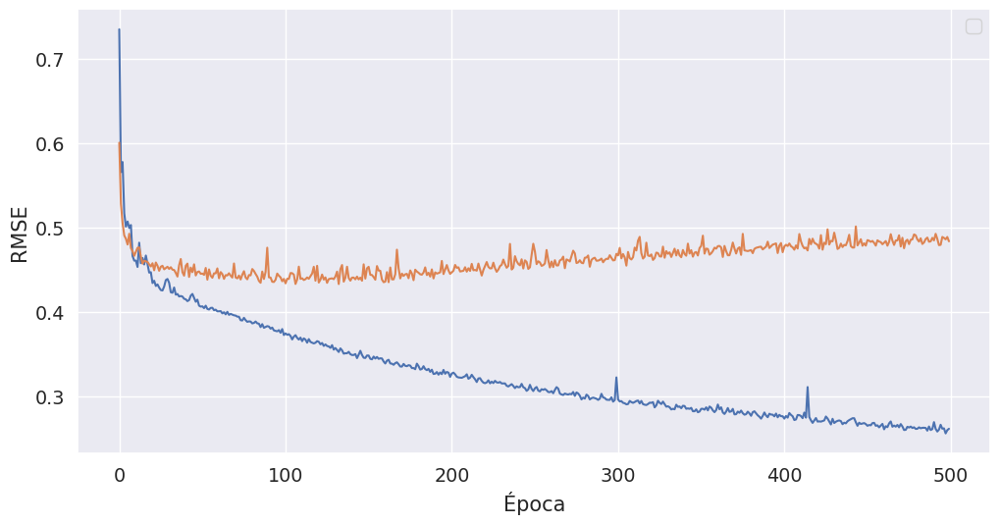

In [58]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Aca ya directamente a partir de un punto empieza a desaprender las cosas útiles que aprendió.

Como podemos solucionar este problema? Qué métodos vimos para mejorar la generalización del modelo?

Probamos el método de [Dropout](https://keras.io/api/layers/regularization_layers/dropout/) primero con el modelo anterior con muchas neuronas:

In [59]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,)))
model.add(Dropout(0.25))
model.add(Dense(50, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [60]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 28s - loss: 0.9697

1312/6000 [=====>........................] - ETA: 0s - loss: 0.7026 

2592/6000 [===========>..................] - ETA: 0s - loss: 0.6402

3488/6000 [================>.............] - ETA: 0s - loss: 0.6554

4800/6000 [=======================>......] - ETA: 0s - loss: 0.6067



6000/6000 [==============================] - 1s 93us/step - loss: 0.5853 - val_loss: 0.3777


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3641

1088/6000 [====>.........................] - ETA: 0s - loss: 0.9752

2400/6000 [===========>..................] - ETA: 0s - loss: 0.6877

3616/6000 [=================>............] - ETA: 0s - loss: 0.6156

4864/6000 [=======================>......] - ETA: 0s - loss: 0.5647

6000/6000 [==============================] - 0s 58us/step - loss: 0.5284 - val_loss: 0.3338


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2682

1344/6000 [=====>........................] - ETA: 0s - loss: 0.4621

2624/6000 [============>.................] - ETA: 0s - loss: 0.4504

3744/6000 [=================>............] - ETA: 0s - loss: 0.4303

4992/6000 [=======================>......] - ETA: 0s - loss: 0.4087

6000/6000 [==============================] - 0s 57us/step - loss: 0.5678 - val_loss: 0.3225


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2602

1280/6000 [=====>........................] - ETA: 0s - loss: 0.3704

2496/6000 [===========>..................] - ETA: 0s - loss: 0.3491

3776/6000 [=================>............] - ETA: 0s - loss: 0.3729

5024/6000 [========================>.....] - ETA: 0s - loss: 0.3840

6000/6000 [==============================] - 0s 58us/step - loss: 0.3761 - val_loss: 0.2825


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3829

1312/6000 [=====>........................] - ETA: 0s - loss: 0.3703

2592/6000 [===========>..................] - ETA: 0s - loss: 0.3493

3904/6000 [==================>...........] - ETA: 0s - loss: 0.3437

5216/6000 [=========================>....] - ETA: 0s - loss: 0.3403

6000/6000 [==============================] - 0s 55us/step - loss: 0.3380 - val_loss: 0.2658


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4271

1312/6000 [=====>........................] - ETA: 0s - loss: 0.3201

2592/6000 [===========>..................] - ETA: 0s - loss: 0.3158

3712/6000 [=================>............] - ETA: 0s - loss: 0.3280

4992/6000 [=======================>......] - ETA: 0s - loss: 0.3317

6000/6000 [==============================] - 0s 58us/step - loss: 0.3281 - val_loss: 0.2587


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3104

1376/6000 [=====>........................] - ETA: 0s - loss: 0.3222

2336/6000 [==========>...................] - ETA: 0s - loss: 0.3185

3392/6000 [===============>..............] - ETA: 0s - loss: 0.3597

4544/6000 [=====================>........] - ETA: 0s - loss: 0.3414

5696/6000 [===========================>..] - ETA: 0s - loss: 0.3365

6000/6000 [==============================] - 0s 62us/step - loss: 0.3378 - val_loss: 0.2482


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2634

1216/6000 [=====>........................] - ETA: 0s - loss: 0.3043

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2933

3552/6000 [================>.............] - ETA: 0s - loss: 0.3160

4736/6000 [======================>.......] - ETA: 0s - loss: 0.3209

5888/6000 [============================>.] - ETA: 0s - loss: 0.3150

6000/6000 [==============================] - 0s 61us/step - loss: 0.3279 - val_loss: 0.2418


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1403

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2779

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2941

3648/6000 [=================>............] - ETA: 0s - loss: 0.3048

4768/6000 [======================>.......] - ETA: 0s - loss: 0.3069



5952/6000 [============================>.] - ETA: 0s - loss: 0.3011

6000/6000 [==============================] - 0s 60us/step - loss: 0.3018 - val_loss: 0.2445


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3677

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2758

2272/6000 [==========>...................] - ETA: 0s - loss: 0.2776

3424/6000 [================>.............] - ETA: 0s - loss: 0.2747

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2807

5856/6000 [============================>.] - ETA: 0s - loss: 0.2786

6000/6000 [==============================] - 0s 61us/step - loss: 0.2794 - val_loss: 0.2324


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2807

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2637

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2721

3648/6000 [=================>............] - ETA: 0s - loss: 0.2869

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2845

6000/6000 [==============================] - 0s 57us/step - loss: 0.2959 - val_loss: 0.2407


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3190

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2839

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2728

3680/6000 [=================>............] - ETA: 0s - loss: 0.2752

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2713

6000/6000 [==============================] - 0s 58us/step - loss: 0.2743 - val_loss: 0.2271


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3435

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2884

2592/6000 [===========>..................] - ETA: 0s - loss: 0.3391

3872/6000 [==================>...........] - ETA: 0s - loss: 0.3095

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2953

6000/6000 [==============================] - 0s 55us/step - loss: 0.2855 - val_loss: 0.2278


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2035

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2696

2624/6000 [============>.................] - ETA: 0s - loss: 0.2622

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2889

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2809

6000/6000 [==============================] - 0s 54us/step - loss: 0.2781 - val_loss: 0.2291


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2207

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2370

1984/6000 [========>.....................] - ETA: 0s - loss: 0.2420

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2432

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2536

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2556

6000/6000 [==============================] - 0s 63us/step - loss: 0.2532 - val_loss: 0.2235


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0664

 992/6000 [===>..........................] - ETA: 0s - loss: 0.2498

2080/6000 [=========>....................] - ETA: 0s - loss: 0.2451

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2569

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2600

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2620

6000/6000 [==============================] - 0s 62us/step - loss: 0.2601 - val_loss: 0.2205


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1904

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2545

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2514

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2539

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2568

6000/6000 [==============================] - 0s 56us/step - loss: 0.2529 - val_loss: 0.2237


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4055

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2452

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2308

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2436

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2543

6000/6000 [==============================] - 0s 55us/step - loss: 0.2548 - val_loss: 0.2204


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2218

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2844

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2694

3616/6000 [=================>............] - ETA: 0s - loss: 0.2677

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2562

6000/6000 [==============================] - 0s 56us/step - loss: 0.2554 - val_loss: 0.2186


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3663

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2554

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2547

3648/6000 [=================>............] - ETA: 0s - loss: 0.2477

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2467

6000/6000 [==============================] - 0s 58us/step - loss: 0.2461 - val_loss: 0.2278


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1820

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2503

2144/6000 [=========>....................] - ETA: 0s - loss: 0.2473

3296/6000 [===============>..............] - ETA: 0s - loss: 0.2546

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2516

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2481

6000/6000 [==============================] - 0s 62us/step - loss: 0.2461 - val_loss: 0.2186


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2154

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2784

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2651

3616/6000 [=================>............] - ETA: 0s - loss: 0.2559

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2564

5952/6000 [============================>.] - ETA: 0s - loss: 0.2532

6000/6000 [==============================] - 0s 59us/step - loss: 0.2531 - val_loss: 0.2191


Epoch 23/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2249

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2875

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2681

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2477

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2448

6000/6000 [==============================] - 0s 56us/step - loss: 0.2446 - val_loss: 0.2148


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2121

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2505

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2466

3776/6000 [=================>............] - ETA: 0s - loss: 0.2396

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2369

6000/6000 [==============================] - 0s 55us/step - loss: 0.2379 - val_loss: 0.2130


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1965

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2337

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2283

3616/6000 [=================>............] - ETA: 0s - loss: 0.2308

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2441

6000/6000 [==============================] - 0s 58us/step - loss: 0.2458 - val_loss: 0.2177


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2388

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2439

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2379

3776/6000 [=================>............] - ETA: 0s - loss: 0.2513

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2486

6000/6000 [==============================] - 0s 58us/step - loss: 0.2499 - val_loss: 0.2154


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2052

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2271

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2481

3552/6000 [================>.............] - ETA: 0s - loss: 0.2449

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2458

6000/6000 [==============================] - 0s 57us/step - loss: 0.2428 - val_loss: 0.2112


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1693

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2272

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2409

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2444

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2434

6000/6000 [==============================] - 0s 55us/step - loss: 0.2398 - val_loss: 0.2081


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4637

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2349

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2357

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2354

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2369

6000/6000 [==============================] - 0s 57us/step - loss: 0.2368 - val_loss: 0.2185


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1819

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2414

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2424

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2499

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2477

6000/6000 [==============================] - 0s 64us/step - loss: 0.2426 - val_loss: 0.2127


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1394

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2327

2624/6000 [============>.................] - ETA: 0s - loss: 0.2358

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2353

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2335

6000/6000 [==============================] - 0s 54us/step - loss: 0.2318 - val_loss: 0.2153


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2144

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2683

2624/6000 [============>.................] - ETA: 0s - loss: 0.2550

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2476

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2401

6000/6000 [==============================] - 0s 57us/step - loss: 0.2409 - val_loss: 0.2096


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4115

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2229

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2348

3680/6000 [=================>............] - ETA: 0s - loss: 0.2323

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2426

6000/6000 [==============================] - 0s 57us/step - loss: 0.2413 - val_loss: 0.2081


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3045

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2776

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2539

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2418

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2444

6000/6000 [==============================] - 0s 56us/step - loss: 0.2425 - val_loss: 0.2124


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1338

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2038

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2090

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2243

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2297

6000/6000 [==============================] - 0s 59us/step - loss: 0.2297 - val_loss: 0.2072


Epoch 36/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1811

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1990

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2137

3520/6000 [================>.............] - ETA: 0s - loss: 0.2272

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2280

6000/6000 [==============================] - 0s 58us/step - loss: 0.2271 - val_loss: 0.2070


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1927

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2052

2688/6000 [============>.................] - ETA: 0s - loss: 0.2270

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2240

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 54us/step - loss: 0.2291 - val_loss: 0.2099


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2952

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2279

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2293

3488/6000 [================>.............] - ETA: 0s - loss: 0.2352

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2254

5920/6000 [============================>.] - ETA: 0s - loss: 0.2262

6000/6000 [==============================] - 0s 59us/step - loss: 0.2270 - val_loss: 0.2091


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1103

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2111

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2181

3776/6000 [=================>............] - ETA: 0s - loss: 0.2255

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2333

6000/6000 [==============================] - 0s 57us/step - loss: 0.2343 - val_loss: 0.2075


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1402

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2257

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2496

3680/6000 [=================>............] - ETA: 0s - loss: 0.2450

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2355

6000/6000 [==============================] - 0s 59us/step - loss: 0.2350 - val_loss: 0.2091


Epoch 41/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1011

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2818

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2651

3520/6000 [================>.............] - ETA: 0s - loss: 0.2428

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2387

5888/6000 [============================>.] - ETA: 0s - loss: 0.2322

6000/6000 [==============================] - 0s 61us/step - loss: 0.2312 - val_loss: 0.2072


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3158

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2421

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2250

3360/6000 [===============>..............] - ETA: 0s - loss: 0.2216

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2232

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2248

6000/6000 [==============================] - 0s 62us/step - loss: 0.2254 - val_loss: 0.2050


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2428

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2175

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2385

3584/6000 [================>.............] - ETA: 0s - loss: 0.2274

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2292

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 64us/step - loss: 0.2245 - val_loss: 0.2053


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2301

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2196

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2207

3648/6000 [=================>............] - ETA: 0s - loss: 0.2263

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 58us/step - loss: 0.2292 - val_loss: 0.2056


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1166

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2250

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2290

3648/6000 [=================>............] - ETA: 0s - loss: 0.2347

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2254

6000/6000 [==============================] - 0s 57us/step - loss: 0.2306 - val_loss: 0.2024


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1281

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2284

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2301

3648/6000 [=================>............] - ETA: 0s - loss: 0.2289

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2272

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2283

6000/6000 [==============================] - 0s 60us/step - loss: 0.2274 - val_loss: 0.2120


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2209

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2025

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2105

3648/6000 [=================>............] - ETA: 0s - loss: 0.2163

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2205

6000/6000 [==============================] - 0s 57us/step - loss: 0.2205 - val_loss: 0.2044


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1644

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1870

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2099

3616/6000 [=================>............] - ETA: 0s - loss: 0.2209

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2244

6000/6000 [==============================] - 0s 58us/step - loss: 0.2283 - val_loss: 0.2068


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2625

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2280

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2146

3584/6000 [================>.............] - ETA: 0s - loss: 0.2245

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2253

5984/6000 [============================>.] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 59us/step - loss: 0.2283 - val_loss: 0.2026


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0916

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2560

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2255

3776/6000 [=================>............] - ETA: 0s - loss: 0.2193

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2234

6000/6000 [==============================] - 0s 56us/step - loss: 0.2202 - val_loss: 0.2027


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1824

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2218

2176/6000 [=========>....................] - ETA: 0s - loss: 0.2347

3264/6000 [===============>..............] - ETA: 0s - loss: 0.2348

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2197

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 61us/step - loss: 0.2189 - val_loss: 0.2005


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2288

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2339

2624/6000 [============>.................] - ETA: 0s - loss: 0.2282

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2326

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 55us/step - loss: 0.2234 - val_loss: 0.1981


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1821

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2103

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2287

3488/6000 [================>.............] - ETA: 0s - loss: 0.2280

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2227

5888/6000 [============================>.] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 60us/step - loss: 0.2223 - val_loss: 0.2025


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1733

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2313

2272/6000 [==========>...................] - ETA: 0s - loss: 0.2299

3328/6000 [===============>..............] - ETA: 0s - loss: 0.2298

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2237

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2169

6000/6000 [==============================] - 0s 62us/step - loss: 0.2191 - val_loss: 0.1997


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1961

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2255

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2133

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2078

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2153

6000/6000 [==============================] - 0s 56us/step - loss: 0.2189 - val_loss: 0.1999


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1952

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2160

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2045

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2015

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2122

6000/6000 [==============================] - 0s 58us/step - loss: 0.2143 - val_loss: 0.2056


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2244

1024/6000 [====>.........................] - ETA: 0s - loss: 0.2090

2112/6000 [=========>....................] - ETA: 0s - loss: 0.2150

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2131

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2159

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2172

6000/6000 [==============================] - 0s 64us/step - loss: 0.2192 - val_loss: 0.1989


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2867

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1918

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2073

3680/6000 [=================>............] - ETA: 0s - loss: 0.2155

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2164

6000/6000 [==============================] - 0s 60us/step - loss: 0.2180 - val_loss: 0.2007


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1839

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2267

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2206

3648/6000 [=================>............] - ETA: 0s - loss: 0.2190

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2189

6000/6000 [==============================] - 0s 59us/step - loss: 0.2191 - val_loss: 0.1998


Epoch 60/500


  32/6000 [..............................] - ETA: 2s - loss: 0.2147

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1896

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2009

3680/6000 [=================>............] - ETA: 0s - loss: 0.2107

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2096

6000/6000 [==============================] - 0s 61us/step - loss: 0.2153 - val_loss: 0.2013


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4856

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2321

2176/6000 [=========>....................] - ETA: 0s - loss: 0.2252

3360/6000 [===============>..............] - ETA: 0s - loss: 0.2192

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2143

5856/6000 [============================>.] - ETA: 0s - loss: 0.2111

6000/6000 [==============================] - 0s 60us/step - loss: 0.2119 - val_loss: 0.1994


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2116

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2163

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2292

3648/6000 [=================>............] - ETA: 0s - loss: 0.2284

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2213

5952/6000 [============================>.] - ETA: 0s - loss: 0.2131

6000/6000 [==============================] - 0s 60us/step - loss: 0.2123 - val_loss: 0.1997


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1661

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1817

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1923

3680/6000 [=================>............] - ETA: 0s - loss: 0.2079

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2087

6000/6000 [==============================] - 0s 57us/step - loss: 0.2114 - val_loss: 0.1954


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1618

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2277

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2194

3680/6000 [=================>............] - ETA: 0s - loss: 0.2109

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2129

6000/6000 [==============================] - 0s 58us/step - loss: 0.2130 - val_loss: 0.2048


Epoch 65/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1634

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2155

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2098

3488/6000 [================>.............] - ETA: 0s - loss: 0.2059

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2127

5984/6000 [============================>.] - ETA: 0s - loss: 0.2108

6000/6000 [==============================] - 0s 58us/step - loss: 0.2107 - val_loss: 0.1962


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1176

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2106

2656/6000 [============>.................] - ETA: 0s - loss: 0.2227

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2183

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2151

6000/6000 [==============================] - 0s 56us/step - loss: 0.2154 - val_loss: 0.1984


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2945

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1993

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1939

3712/6000 [=================>............] - ETA: 0s - loss: 0.2016

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2133

6000/6000 [==============================] - 0s 55us/step - loss: 0.2160 - val_loss: 0.1963


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0966

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2172

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2025

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2071

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2111

6000/6000 [==============================] - 0s 57us/step - loss: 0.2119 - val_loss: 0.1968


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2728

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1830

2656/6000 [============>.................] - ETA: 0s - loss: 0.1978

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2121

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2094

6000/6000 [==============================] - 0s 58us/step - loss: 0.2112 - val_loss: 0.1952


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1227

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2032

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2033

3520/6000 [================>.............] - ETA: 0s - loss: 0.1992

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2056

6000/6000 [==============================] - 0s 58us/step - loss: 0.2096 - val_loss: 0.2012


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1575

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2136

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2131

3552/6000 [================>.............] - ETA: 0s - loss: 0.2051

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2104

5952/6000 [============================>.] - ETA: 0s - loss: 0.2109

6000/6000 [==============================] - 0s 61us/step - loss: 0.2111 - val_loss: 0.1958


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0959

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2223

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2091

3712/6000 [=================>............] - ETA: 0s - loss: 0.2165

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2148

6000/6000 [==============================] - 0s 58us/step - loss: 0.2101 - val_loss: 0.1984


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1513



1280/6000 [=====>........................] - ETA: 0s - loss: 0.1917

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2008

3776/6000 [=================>............] - ETA: 0s - loss: 0.2052

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2021

6000/6000 [==============================] - 0s 59us/step - loss: 0.2064 - val_loss: 0.1989


Epoch 74/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2130

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2103

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2138

3680/6000 [=================>............] - ETA: 0s - loss: 0.2177

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2134

6000/6000 [==============================] - 0s 58us/step - loss: 0.2113 - val_loss: 0.1933


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2671

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2140

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2099

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2155

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2101

6000/6000 [==============================] - 0s 60us/step - loss: 0.2092 - val_loss: 0.1935


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1502

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2169

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2068

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2125

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2126

6000/6000 [==============================] - 0s 56us/step - loss: 0.2126 - val_loss: 0.1932


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1332

 832/6000 [===>..........................] - ETA: 0s - loss: 0.1924

2048/6000 [=========>....................] - ETA: 0s - loss: 0.1791

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1953

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2018

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2028

6000/6000 [==============================] - 0s 59us/step - loss: 0.2021 - val_loss: 0.1929


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2011

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2012

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1970

3776/6000 [=================>............] - ETA: 0s - loss: 0.2074

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2033

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2042

6000/6000 [==============================] - 0s 61us/step - loss: 0.2039 - val_loss: 0.1909


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1299

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2102

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2150

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2169

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2107

5888/6000 [============================>.] - ETA: 0s - loss: 0.2138

6000/6000 [==============================] - 0s 61us/step - loss: 0.2131 - val_loss: 0.1943


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2543

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1963

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1968

3744/6000 [=================>............] - ETA: 0s - loss: 0.2053

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2063

6000/6000 [==============================] - 0s 56us/step - loss: 0.2067 - val_loss: 0.1955


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5472

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2158

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1991

3680/6000 [=================>............] - ETA: 0s - loss: 0.2017

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2086

6000/6000 [==============================] - 0s 57us/step - loss: 0.2051 - val_loss: 0.1899


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1556

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1878

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1937

3776/6000 [=================>............] - ETA: 0s - loss: 0.2006

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2043

6000/6000 [==============================] - 0s 58us/step - loss: 0.2062 - val_loss: 0.1977


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1084

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2047

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2003

3552/6000 [================>.............] - ETA: 0s - loss: 0.2081

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2110

6000/6000 [==============================] - 0s 57us/step - loss: 0.2097 - val_loss: 0.1931


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1201

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2132

2240/6000 [==========>...................] - ETA: 0s - loss: 0.2121

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1993

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2078

5888/6000 [============================>.] - ETA: 0s - loss: 0.2057

6000/6000 [==============================] - 0s 58us/step - loss: 0.2047 - val_loss: 0.1977


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0981

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1740

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1990

3776/6000 [=================>............] - ETA: 0s - loss: 0.2075

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2054

6000/6000 [==============================] - 0s 56us/step - loss: 0.2084 - val_loss: 0.1957


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1839

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2051

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2034

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2122

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2136

6000/6000 [==============================] - 0s 56us/step - loss: 0.2123 - val_loss: 0.1934


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2054

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2036

3712/6000 [=================>............] - ETA: 0s - loss: 0.2118

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2129

6000/6000 [==============================] - 0s 56us/step - loss: 0.2075 - val_loss: 0.1918


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3474

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2175

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2216

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2120

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2101

6000/6000 [==============================] - 0s 56us/step - loss: 0.2072 - val_loss: 0.1981


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1747

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1939

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1966

3488/6000 [================>.............] - ETA: 0s - loss: 0.1932

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1897

6000/6000 [==============================] - 0s 56us/step - loss: 0.1954 - val_loss: 0.1918


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2065

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1907

2656/6000 [============>.................] - ETA: 0s - loss: 0.1905

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1982

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2033

6000/6000 [==============================] - 0s 54us/step - loss: 0.2040 - val_loss: 0.1873


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1914

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2135

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2037

3712/6000 [=================>............] - ETA: 0s - loss: 0.2036

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2072

6000/6000 [==============================] - 0s 56us/step - loss: 0.2048 - val_loss: 0.1918


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2051

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1974

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2155

3680/6000 [=================>............] - ETA: 0s - loss: 0.2091

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2067

6000/6000 [==============================] - 0s 58us/step - loss: 0.2075 - val_loss: 0.1906


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3527

 992/6000 [===>..........................] - ETA: 0s - loss: 0.2045

2240/6000 [==========>...................] - ETA: 0s - loss: 0.2080

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1995

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2023

5824/6000 [============================>.] - ETA: 0s - loss: 0.2018

6000/6000 [==============================] - 0s 60us/step - loss: 0.2019 - val_loss: 0.1935


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1549

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2013

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2035

3712/6000 [=================>............] - ETA: 0s - loss: 0.2012

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2049

6000/6000 [==============================] - 0s 56us/step - loss: 0.2008 - val_loss: 0.1935


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1593

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1805

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1925

3616/6000 [=================>............] - ETA: 0s - loss: 0.2024

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2009

5920/6000 [============================>.] - ETA: 0s - loss: 0.2041

6000/6000 [==============================] - 0s 59us/step - loss: 0.2035 - val_loss: 0.1889


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0803

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2171

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2162

3712/6000 [=================>............] - ETA: 0s - loss: 0.2097

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2071

6000/6000 [==============================] - 0s 57us/step - loss: 0.2056 - val_loss: 0.1919


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1385

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1845

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2007

3648/6000 [=================>............] - ETA: 0s - loss: 0.2105

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2087

6000/6000 [==============================] - 0s 57us/step - loss: 0.2050 - val_loss: 0.1940


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2727

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1869

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2009

3616/6000 [=================>............] - ETA: 0s - loss: 0.2080

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2090

5888/6000 [============================>.] - ETA: 0s - loss: 0.2057

6000/6000 [==============================] - 0s 60us/step - loss: 0.2049 - val_loss: 0.1880


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2320

1024/6000 [====>.........................] - ETA: 0s - loss: 0.2076

2208/6000 [==========>...................] - ETA: 0s - loss: 0.2006

3424/6000 [================>.............] - ETA: 0s - loss: 0.2089

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2058

5984/6000 [============================>.] - ETA: 0s - loss: 0.2033

6000/6000 [==============================] - 0s 59us/step - loss: 0.2034 - val_loss: 0.1895


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1731

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2064

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2012

3712/6000 [=================>............] - ETA: 0s - loss: 0.2045

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2027

6000/6000 [==============================] - 0s 56us/step - loss: 0.2002 - val_loss: 0.1870


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0773

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2097

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2073

3712/6000 [=================>............] - ETA: 0s - loss: 0.2106

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2083

6000/6000 [==============================] - 0s 55us/step - loss: 0.2056 - val_loss: 0.1872


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2092

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1978

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2109

3744/6000 [=================>............] - ETA: 0s - loss: 0.2066

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2013

6000/6000 [==============================] - 0s 57us/step - loss: 0.2007 - val_loss: 0.1855


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1584

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1845

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1912

3520/6000 [================>.............] - ETA: 0s - loss: 0.1949

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1986

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2023

6000/6000 [==============================] - 0s 62us/step - loss: 0.2013 - val_loss: 0.1942


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2176

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1961

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1943

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1949

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1958

6000/6000 [==============================] - 0s 55us/step - loss: 0.1967 - val_loss: 0.1902


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2084

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1935

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1914

3488/6000 [================>.............] - ETA: 0s - loss: 0.1952

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1951

6000/6000 [==============================] - 0s 59us/step - loss: 0.1976 - val_loss: 0.1910


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3897

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2001

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2058

3744/6000 [=================>............] - ETA: 0s - loss: 0.1965

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1985

6000/6000 [==============================] - 0s 58us/step - loss: 0.1990 - val_loss: 0.1856


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1511

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1878

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1902

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1898

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1943

6000/6000 [==============================] - 0s 56us/step - loss: 0.1968 - val_loss: 0.1878


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2258

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1903

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1948

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1977

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2032

6000/6000 [==============================] - 0s 54us/step - loss: 0.2019 - val_loss: 0.1862


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1665

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1928

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2009

3712/6000 [=================>............] - ETA: 0s - loss: 0.2016

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1976

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2006

6000/6000 [==============================] - 0s 61us/step - loss: 0.1990 - val_loss: 0.1876


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1820

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2006

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2049

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1989

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1990

6000/6000 [==============================] - 0s 56us/step - loss: 0.2002 - val_loss: 0.1952


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1737

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1892

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2034

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1972

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2012

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1987

6000/6000 [==============================] - 0s 61us/step - loss: 0.1975 - val_loss: 0.1923


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2545

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1846

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2060

3584/6000 [================>.............] - ETA: 0s - loss: 0.2075

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2001

6000/6000 [==============================] - 0s 58us/step - loss: 0.1971 - val_loss: 0.1894


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1803

 992/6000 [===>..........................] - ETA: 0s - loss: 0.2223

2176/6000 [=========>....................] - ETA: 0s - loss: 0.2049

3328/6000 [===============>..............] - ETA: 0s - loss: 0.2028

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1998

5856/6000 [============================>.] - ETA: 0s - loss: 0.2001

6000/6000 [==============================] - 0s 62us/step - loss: 0.1999 - val_loss: 0.1934


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2787

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1806

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1980

3744/6000 [=================>............] - ETA: 0s - loss: 0.1953

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1955

6000/6000 [==============================] - 0s 56us/step - loss: 0.1970 - val_loss: 0.1893


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3274

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2024

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2004

3712/6000 [=================>............] - ETA: 0s - loss: 0.2036

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2008

6000/6000 [==============================] - 0s 56us/step - loss: 0.2019 - val_loss: 0.1962


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2488

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2051

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2081

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1994

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1950

6000/6000 [==============================] - 0s 57us/step - loss: 0.1968 - val_loss: 0.1859


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1896

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2313

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2139

3584/6000 [================>.............] - ETA: 0s - loss: 0.2045

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2030

5856/6000 [============================>.] - ETA: 0s - loss: 0.2013

6000/6000 [==============================] - 0s 60us/step - loss: 0.2016 - val_loss: 0.1870


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1068

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1913

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1946

3424/6000 [================>.............] - ETA: 0s - loss: 0.1931

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1952

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1956

6000/6000 [==============================] - 0s 60us/step - loss: 0.1958 - val_loss: 0.1876


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1614

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1997

2624/6000 [============>.................] - ETA: 0s - loss: 0.2035

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2060

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1992

6000/6000 [==============================] - 0s 55us/step - loss: 0.1961 - val_loss: 0.1885


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2103

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1990

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2030

3776/6000 [=================>............] - ETA: 0s - loss: 0.2009

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1955

6000/6000 [==============================] - 0s 58us/step - loss: 0.1970 - val_loss: 0.1927


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0805

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2027

2176/6000 [=========>....................] - ETA: 0s - loss: 0.2025

3456/6000 [================>.............] - ETA: 0s - loss: 0.2022

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1956

6000/6000 [==============================] - 0s 57us/step - loss: 0.1966 - val_loss: 0.1867


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1499

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1945

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1944

3648/6000 [=================>............] - ETA: 0s - loss: 0.2006

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2025

6000/6000 [==============================] - 0s 58us/step - loss: 0.2013 - val_loss: 0.1914


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2007

2656/6000 [============>.................] - ETA: 0s - loss: 0.1995

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1912

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1915

6000/6000 [==============================] - 0s 56us/step - loss: 0.1940 - val_loss: 0.1911


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1284

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1934

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1912

3712/6000 [=================>............] - ETA: 0s - loss: 0.1928

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1891

6000/6000 [==============================] - 0s 58us/step - loss: 0.1962 - val_loss: 0.1930


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1259

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1786

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1984

3648/6000 [=================>............] - ETA: 0s - loss: 0.2001

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1922

6000/6000 [==============================] - 0s 58us/step - loss: 0.1937 - val_loss: 0.1926


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1337

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1992

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1987

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1989

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2018

6000/6000 [==============================] - 0s 55us/step - loss: 0.1957 - val_loss: 0.1891


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1368

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1956

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1895

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2004

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2001

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1984

6000/6000 [==============================] - 0s 60us/step - loss: 0.1982 - val_loss: 0.1883


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1761

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1916

2624/6000 [============>.................] - ETA: 0s - loss: 0.1905

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1941

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1915

6000/6000 [==============================] - 0s 57us/step - loss: 0.1968 - val_loss: 0.1899


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1687

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1844

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1966

3616/6000 [=================>............] - ETA: 0s - loss: 0.1964

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1942

5984/6000 [============================>.] - ETA: 0s - loss: 0.1947

6000/6000 [==============================] - 0s 59us/step - loss: 0.1947 - val_loss: 0.1877


Epoch 130/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0919

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1899

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1964

3616/6000 [=================>............] - ETA: 0s - loss: 0.1991

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1944

6000/6000 [==============================] - 0s 58us/step - loss: 0.1920 - val_loss: 0.1905


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2049

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1923

3712/6000 [=================>............] - ETA: 0s - loss: 0.1918

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1975

6000/6000 [==============================] - 0s 59us/step - loss: 0.1952 - val_loss: 0.1909


Epoch 132/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1633

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1939

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1953

3616/6000 [=================>............] - ETA: 0s - loss: 0.1909

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1957

6000/6000 [==============================] - 0s 57us/step - loss: 0.1965 - val_loss: 0.1858


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1623

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1984

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1964

3744/6000 [=================>............] - ETA: 0s - loss: 0.2050

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2031

6000/6000 [==============================] - 0s 55us/step - loss: 0.1982 - val_loss: 0.1867


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6241

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2115

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1955

3744/6000 [=================>............] - ETA: 0s - loss: 0.1897

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1909

6000/6000 [==============================] - 0s 55us/step - loss: 0.1900 - val_loss: 0.1853


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3736

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1967

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1862

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1961

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1964

6000/6000 [==============================] - 0s 57us/step - loss: 0.1926 - val_loss: 0.1831


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1504

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2035

2656/6000 [============>.................] - ETA: 0s - loss: 0.2173

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2079

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2003

6000/6000 [==============================] - 0s 54us/step - loss: 0.1944 - val_loss: 0.1860


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1624

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1890

2624/6000 [============>.................] - ETA: 0s - loss: 0.1871

3744/6000 [=================>............] - ETA: 0s - loss: 0.1876

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1842

6000/6000 [==============================] - 0s 57us/step - loss: 0.1872 - val_loss: 0.1839


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1011

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2014

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2007

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1994

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1978

6000/6000 [==============================] - 0s 58us/step - loss: 0.1935 - val_loss: 0.1859


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2237

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1722

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1898

3680/6000 [=================>............] - ETA: 0s - loss: 0.1956

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1932

5888/6000 [============================>.] - ETA: 0s - loss: 0.1926

6000/6000 [==============================] - 0s 62us/step - loss: 0.1924 - val_loss: 0.1882


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2116

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2028

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1887

3744/6000 [=================>............] - ETA: 0s - loss: 0.1950

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1975

6000/6000 [==============================] - 0s 56us/step - loss: 0.1928 - val_loss: 0.1859


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1738

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1864

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2013

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2021

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1934

6000/6000 [==============================] - 0s 55us/step - loss: 0.1951 - val_loss: 0.1900


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2170

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1937

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1921

3648/6000 [=================>............] - ETA: 0s - loss: 0.1882

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1916

6000/6000 [==============================] - 0s 56us/step - loss: 0.1884 - val_loss: 0.1874


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0979

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1723

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2008

3712/6000 [=================>............] - ETA: 0s - loss: 0.1937

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1953

6000/6000 [==============================] - 0s 55us/step - loss: 0.1920 - val_loss: 0.1876


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1890

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1964

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1946

3744/6000 [=================>............] - ETA: 0s - loss: 0.2018

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1977

6000/6000 [==============================] - 0s 57us/step - loss: 0.1953 - val_loss: 0.1848


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1507

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1971

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1916

3616/6000 [=================>............] - ETA: 0s - loss: 0.1856

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1832

6000/6000 [==============================] - 0s 58us/step - loss: 0.1857 - val_loss: 0.1866


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1284

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1757

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1819

3552/6000 [================>.............] - ETA: 0s - loss: 0.1858

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1900

6000/6000 [==============================] - 0s 57us/step - loss: 0.1885 - val_loss: 0.1888


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1705

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1852

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1844

3616/6000 [=================>............] - ETA: 0s - loss: 0.1893

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1890

5920/6000 [============================>.] - ETA: 0s - loss: 0.1919

6000/6000 [==============================] - 0s 60us/step - loss: 0.1920 - val_loss: 0.1864


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0914

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1783

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1779

3584/6000 [================>.............] - ETA: 0s - loss: 0.1935

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1940

6000/6000 [==============================] - 0s 58us/step - loss: 0.1880 - val_loss: 0.1882


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1576

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1827

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1863

3552/6000 [================>.............] - ETA: 0s - loss: 0.1882

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1836

6000/6000 [==============================] - 0s 57us/step - loss: 0.1897 - val_loss: 0.1853


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2209

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1989

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1979

3776/6000 [=================>............] - ETA: 0s - loss: 0.1993

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1920

6000/6000 [==============================] - 0s 58us/step - loss: 0.1906 - val_loss: 0.1867


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1518

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1640

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1735

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1786

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1908

6000/6000 [==============================] - 0s 55us/step - loss: 0.1909 - val_loss: 0.1876


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0904

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1780

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1710

3648/6000 [=================>............] - ETA: 0s - loss: 0.1806

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1817

6000/6000 [==============================] - 0s 57us/step - loss: 0.1833 - val_loss: 0.1906


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1824

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1876

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1858

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1973

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1885

6000/6000 [==============================] - 0s 57us/step - loss: 0.1904 - val_loss: 0.1894


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1761

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1840

3648/6000 [=================>............] - ETA: 0s - loss: 0.1829

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1891

6000/6000 [==============================] - 0s 56us/step - loss: 0.1886 - val_loss: 0.1865


Epoch 155/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1800

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1808

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1759

3648/6000 [=================>............] - ETA: 0s - loss: 0.1780

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1839

6000/6000 [==============================] - 0s 59us/step - loss: 0.1909 - val_loss: 0.1885


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1285

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1799

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1932

3776/6000 [=================>............] - ETA: 0s - loss: 0.1976

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1928

6000/6000 [==============================] - 0s 55us/step - loss: 0.1923 - val_loss: 0.1850


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1771

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1705

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1931

3776/6000 [=================>............] - ETA: 0s - loss: 0.1906

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1905

6000/6000 [==============================] - 0s 57us/step - loss: 0.1883 - val_loss: 0.1885


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2453

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1900

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1896

3616/6000 [=================>............] - ETA: 0s - loss: 0.1872

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1864

6000/6000 [==============================] - 0s 56us/step - loss: 0.1887 - val_loss: 0.1852


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1452

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2025

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2015

3776/6000 [=================>............] - ETA: 0s - loss: 0.1922

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1875

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1877

6000/6000 [==============================] - 0s 59us/step - loss: 0.1881 - val_loss: 0.1851


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1459

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1818

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2003

3488/6000 [================>.............] - ETA: 0s - loss: 0.1905

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1946

5856/6000 [============================>.] - ETA: 0s - loss: 0.1896

6000/6000 [==============================] - 0s 61us/step - loss: 0.1889 - val_loss: 0.1841


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1201

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1786

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1870

3776/6000 [=================>............] - ETA: 0s - loss: 0.1928

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1948

6000/6000 [==============================] - 0s 57us/step - loss: 0.1923 - val_loss: 0.1850


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1215

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2009

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1926

3680/6000 [=================>............] - ETA: 0s - loss: 0.1890

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1907

6000/6000 [==============================] - 0s 57us/step - loss: 0.1913 - val_loss: 0.1850


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1155

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1776

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1893

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1872

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1848

6000/6000 [==============================] - 0s 57us/step - loss: 0.1882 - val_loss: 0.1900


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1858

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2013

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1920

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1933

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1890

6000/6000 [==============================] - 0s 55us/step - loss: 0.1880 - val_loss: 0.1866


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1839

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1914

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1855

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1855

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1850

6000/6000 [==============================] - 0s 64us/step - loss: 0.1850 - val_loss: 0.1871


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2024

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1766

2144/6000 [=========>....................] - ETA: 0s - loss: 0.1741

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1895

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1867

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1869

6000/6000 [==============================] - 0s 60us/step - loss: 0.1863 - val_loss: 0.1890


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0915

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1920

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1965

3520/6000 [================>.............] - ETA: 0s - loss: 0.1890

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1902

5952/6000 [============================>.] - ETA: 0s - loss: 0.1936

6000/6000 [==============================] - 0s 58us/step - loss: 0.1928 - val_loss: 0.1884


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2713

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1924

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1905

3712/6000 [=================>............] - ETA: 0s - loss: 0.1928

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1939

6000/6000 [==============================] - 0s 55us/step - loss: 0.1893 - val_loss: 0.1864


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1510

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1765

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1796

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1828

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1864

6000/6000 [==============================] - 0s 56us/step - loss: 0.1836 - val_loss: 0.1873


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1396

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1647

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1877

3424/6000 [================>.............] - ETA: 0s - loss: 0.1954

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1876

5920/6000 [============================>.] - ETA: 0s - loss: 0.1858

6000/6000 [==============================] - 0s 59us/step - loss: 0.1855 - val_loss: 0.1864


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1947

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1955

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1806

3680/6000 [=================>............] - ETA: 0s - loss: 0.1838

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1861

6000/6000 [==============================] - 0s 58us/step - loss: 0.1870 - val_loss: 0.1823


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1784

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2045

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1912

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1814

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1845

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1818

6000/6000 [==============================] - 0s 61us/step - loss: 0.1860 - val_loss: 0.1850


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1262

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1832

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1792

3520/6000 [================>.............] - ETA: 0s - loss: 0.1823

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1824

6000/6000 [==============================] - 0s 57us/step - loss: 0.1888 - val_loss: 0.1850


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2034

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1935

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1950

3776/6000 [=================>............] - ETA: 0s - loss: 0.1916

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1886

6000/6000 [==============================] - 0s 56us/step - loss: 0.1873 - val_loss: 0.1893


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2004

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1724

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1743

3712/6000 [=================>............] - ETA: 0s - loss: 0.1754

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1829

6000/6000 [==============================] - 0s 57us/step - loss: 0.1831 - val_loss: 0.1827


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1602

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1866

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1851

3584/6000 [================>.............] - ETA: 0s - loss: 0.1949

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1915

6000/6000 [==============================] - 0s 59us/step - loss: 0.1892 - val_loss: 0.1826


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1870

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1772

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1882

3744/6000 [=================>............] - ETA: 0s - loss: 0.1840

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1898

6000/6000 [==============================] - 0s 56us/step - loss: 0.1870 - val_loss: 0.1868


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1926

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1697

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1773

3776/6000 [=================>............] - ETA: 0s - loss: 0.1844

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1852

6000/6000 [==============================] - 0s 57us/step - loss: 0.1877 - val_loss: 0.1826


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1025

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1785

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1726

3616/6000 [=================>............] - ETA: 0s - loss: 0.1795

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 57us/step - loss: 0.1835 - val_loss: 0.1865


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1813

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1784

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1833

3424/6000 [================>.............] - ETA: 0s - loss: 0.1845

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1877

5952/6000 [============================>.] - ETA: 0s - loss: 0.1880

6000/6000 [==============================] - 0s 59us/step - loss: 0.1873 - val_loss: 0.1897


Epoch 181/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2065

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1974

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1915

3552/6000 [================>.............] - ETA: 0s - loss: 0.1894

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1865

5824/6000 [============================>.] - ETA: 0s - loss: 0.1866

6000/6000 [==============================] - 0s 61us/step - loss: 0.1872 - val_loss: 0.1853


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1762

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2004

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1949

3520/6000 [================>.............] - ETA: 0s - loss: 0.1916

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 58us/step - loss: 0.1840 - val_loss: 0.1873


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2748

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1929

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1865

3712/6000 [=================>............] - ETA: 0s - loss: 0.1817

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1827

6000/6000 [==============================] - 0s 56us/step - loss: 0.1892 - val_loss: 0.1855


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2048

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1826

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1859

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1906

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1865

6000/6000 [==============================] - 0s 57us/step - loss: 0.1844 - val_loss: 0.1862


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1607

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1794

2624/6000 [============>.................] - ETA: 0s - loss: 0.1801

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1860

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1866

6000/6000 [==============================] - 0s 59us/step - loss: 0.1865 - val_loss: 0.1832


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1807

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1740

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1780

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1829

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 55us/step - loss: 0.1836 - val_loss: 0.1850


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1953

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1862

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1852

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1872

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1851

6000/6000 [==============================] - 0s 54us/step - loss: 0.1855 - val_loss: 0.1815


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1375

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1787

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1856

3744/6000 [=================>............] - ETA: 0s - loss: 0.1904

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1875

6000/6000 [==============================] - 0s 56us/step - loss: 0.1858 - val_loss: 0.1833


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1513

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1821

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1950

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1853

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1847

6000/6000 [==============================] - 0s 56us/step - loss: 0.1862 - val_loss: 0.1855


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1502

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1803

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1802

3712/6000 [=================>............] - ETA: 0s - loss: 0.1857

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1888

6000/6000 [==============================] - 0s 58us/step - loss: 0.1858 - val_loss: 0.1852


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2001

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1805

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1907

3552/6000 [================>.............] - ETA: 0s - loss: 0.1846

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1842

6000/6000 [==============================] - 0s 57us/step - loss: 0.1825 - val_loss: 0.1864


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1951

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1904

3680/6000 [=================>............] - ETA: 0s - loss: 0.1940

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1956

6000/6000 [==============================] - 0s 58us/step - loss: 0.1909 - val_loss: 0.1843


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3044

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1761

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1812

3648/6000 [=================>............] - ETA: 0s - loss: 0.1866

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1938

6000/6000 [==============================] - 0s 56us/step - loss: 0.1902 - val_loss: 0.1852


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1401

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1949

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1844

3680/6000 [=================>............] - ETA: 0s - loss: 0.1898

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1865

5920/6000 [============================>.] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 60us/step - loss: 0.1864 - val_loss: 0.1832


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1203

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1903

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1764

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1841

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1855

6000/6000 [==============================] - 0s 55us/step - loss: 0.1872 - val_loss: 0.1909


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2212

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2015

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1854

3584/6000 [================>.............] - ETA: 0s - loss: 0.1893

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1852

5920/6000 [============================>.] - ETA: 0s - loss: 0.1852

6000/6000 [==============================] - 0s 59us/step - loss: 0.1877 - val_loss: 0.1848


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0772

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1709

2624/6000 [============>.................] - ETA: 0s - loss: 0.1757

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1853

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1863

6000/6000 [==============================] - 0s 56us/step - loss: 0.1879 - val_loss: 0.1865


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1432

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1659

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1828

3680/6000 [=================>............] - ETA: 0s - loss: 0.1835

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1900

6000/6000 [==============================] - 0s 57us/step - loss: 0.1885 - val_loss: 0.1833


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2595

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2089

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1980

3552/6000 [================>.............] - ETA: 0s - loss: 0.1935

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1863

6000/6000 [==============================] - 0s 59us/step - loss: 0.1886 - val_loss: 0.1892


Epoch 200/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2261

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1886

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1847

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1839

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1828

6000/6000 [==============================] - 0s 57us/step - loss: 0.1827 - val_loss: 0.1834


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1841

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1727

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1757

3616/6000 [=================>............] - ETA: 0s - loss: 0.1859

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1786

6000/6000 [==============================] - 0s 57us/step - loss: 0.1823 - val_loss: 0.1833


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1592

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1783

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1889

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1845

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1831

6000/6000 [==============================] - 0s 57us/step - loss: 0.1826 - val_loss: 0.1884


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1261

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1722

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1703

3552/6000 [================>.............] - ETA: 0s - loss: 0.1830

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1776

5888/6000 [============================>.] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 59us/step - loss: 0.1797 - val_loss: 0.1843


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2208

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1970

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1848

3680/6000 [=================>............] - ETA: 0s - loss: 0.1832

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1831

6000/6000 [==============================] - 0s 57us/step - loss: 0.1813 - val_loss: 0.1824


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1875

 960/6000 [===>..........................] - ETA: 0s - loss: 0.1886

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1826

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1830

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1872

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1880

6000/6000 [==============================] - 0s 62us/step - loss: 0.1869 - val_loss: 0.1845


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2378

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1868

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1763

3744/6000 [=================>............] - ETA: 0s - loss: 0.1795

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1849

6000/6000 [==============================] - 0s 57us/step - loss: 0.1855 - val_loss: 0.1843


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2357

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1813

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1727

3680/6000 [=================>............] - ETA: 0s - loss: 0.1759

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 57us/step - loss: 0.1820 - val_loss: 0.1844


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1126

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1751

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1775

3616/6000 [=================>............] - ETA: 0s - loss: 0.1844

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1799

6000/6000 [==============================] - 0s 57us/step - loss: 0.1819 - val_loss: 0.1837


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1696

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1865

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1939

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1882

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1820

6000/6000 [==============================] - 0s 57us/step - loss: 0.1801 - val_loss: 0.1816


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1423

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1668

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1773

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1839

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1850

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1886

6000/6000 [==============================] - 0s 63us/step - loss: 0.1886 - val_loss: 0.1837


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2909

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1920

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1897

3648/6000 [=================>............] - ETA: 0s - loss: 0.1834

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1830

6000/6000 [==============================] - 0s 59us/step - loss: 0.1817 - val_loss: 0.1843


Epoch 212/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2363

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1954

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1879

3616/6000 [=================>............] - ETA: 0s - loss: 0.1784

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1782

6000/6000 [==============================] - 0s 57us/step - loss: 0.1799 - val_loss: 0.1847


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1310

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1768

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1754

3552/6000 [================>.............] - ETA: 0s - loss: 0.1782

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1810

6000/6000 [==============================] - 0s 58us/step - loss: 0.1819 - val_loss: 0.1837


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1305

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1633

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1727

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1778

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1798

6000/6000 [==============================] - 0s 57us/step - loss: 0.1786 - val_loss: 0.1851


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2154

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1860

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1908

3616/6000 [=================>............] - ETA: 0s - loss: 0.1833

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1887

6000/6000 [==============================] - 0s 58us/step - loss: 0.1858 - val_loss: 0.1844


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2000

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1737

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1669

3648/6000 [=================>............] - ETA: 0s - loss: 0.1724

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1803

6000/6000 [==============================] - 0s 57us/step - loss: 0.1821 - val_loss: 0.1875


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1718

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1662

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1775

3552/6000 [================>.............] - ETA: 0s - loss: 0.1857

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1833

6000/6000 [==============================] - 0s 58us/step - loss: 0.1828 - val_loss: 0.1851


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1801

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1744

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1856

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1831

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1818

6000/6000 [==============================] - 0s 55us/step - loss: 0.1804 - val_loss: 0.1821


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1169

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1698

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1782

3488/6000 [================>.............] - ETA: 0s - loss: 0.1753

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1840

6000/6000 [==============================] - 0s 58us/step - loss: 0.1830 - val_loss: 0.1892


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1253

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2229

2624/6000 [============>.................] - ETA: 0s - loss: 0.2039

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1999

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1956

6000/6000 [==============================] - 0s 56us/step - loss: 0.1977 - val_loss: 0.1823


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0774

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1818

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1795

3616/6000 [=================>............] - ETA: 0s - loss: 0.1791

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1796

6000/6000 [==============================] - 0s 57us/step - loss: 0.1823 - val_loss: 0.1885


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1645

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2174

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1891

3776/6000 [=================>............] - ETA: 0s - loss: 0.1890

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1883

6000/6000 [==============================] - 0s 57us/step - loss: 0.1853 - val_loss: 0.1832


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0829

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1675

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1665

3648/6000 [=================>............] - ETA: 0s - loss: 0.1721

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1781

6000/6000 [==============================] - 0s 57us/step - loss: 0.1803 - val_loss: 0.1850


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1245

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1472

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1684

3712/6000 [=================>............] - ETA: 0s - loss: 0.1763

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1773

6000/6000 [==============================] - 0s 57us/step - loss: 0.1822 - val_loss: 0.1850


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1581

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1588

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1753

3744/6000 [=================>............] - ETA: 0s - loss: 0.1803

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1822

6000/6000 [==============================] - 0s 57us/step - loss: 0.1816 - val_loss: 0.1840


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0634

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1694

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1743

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1818

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1822

6000/6000 [==============================] - 0s 58us/step - loss: 0.1784 - val_loss: 0.1817


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1669

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1722

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1900

3552/6000 [================>.............] - ETA: 0s - loss: 0.1832

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1798

6000/6000 [==============================] - 0s 56us/step - loss: 0.1795 - val_loss: 0.1828


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1347

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1861

2624/6000 [============>.................] - ETA: 0s - loss: 0.1678

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1710

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1753

6000/6000 [==============================] - 0s 57us/step - loss: 0.1777 - val_loss: 0.1860


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3675

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1791

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1803

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1830

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1825

6000/6000 [==============================] - 0s 57us/step - loss: 0.1813 - val_loss: 0.1850


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2460

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1697

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1677

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1732

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 57us/step - loss: 0.1808 - val_loss: 0.1865


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2801

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1653

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1701

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1773

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1839

6000/6000 [==============================] - 0s 56us/step - loss: 0.1807 - val_loss: 0.1903


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1141

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1706

2656/6000 [============>.................] - ETA: 0s - loss: 0.1698

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1753

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1763

6000/6000 [==============================] - 0s 55us/step - loss: 0.1761 - val_loss: 0.1843


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1337

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2994

2208/6000 [==========>...................] - ETA: 0s - loss: 0.2467

3392/6000 [===============>..............] - ETA: 0s - loss: 0.2268

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2149

6000/6000 [==============================] - 0s 57us/step - loss: 0.2069 - val_loss: 0.1840


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4892

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1782

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1873

3712/6000 [=================>............] - ETA: 0s - loss: 0.1850

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1813

6000/6000 [==============================] - 0s 59us/step - loss: 0.1804 - val_loss: 0.1857


Epoch 235/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1025

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1768

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1728

3776/6000 [=================>............] - ETA: 0s - loss: 0.1734

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1781

6000/6000 [==============================] - 0s 55us/step - loss: 0.1839 - val_loss: 0.1862


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0850

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1751

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1814

3744/6000 [=================>............] - ETA: 0s - loss: 0.1801

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 55us/step - loss: 0.1823 - val_loss: 0.1846


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3530

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1716

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1773

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1743

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1779

6000/6000 [==============================] - 0s 55us/step - loss: 0.1785 - val_loss: 0.1816


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1858

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1772

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1677

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1669

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1759

6000/6000 [==============================] - 0s 58us/step - loss: 0.1738 - val_loss: 0.1831


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1943

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1579

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1710

3616/6000 [=================>............] - ETA: 0s - loss: 0.1753

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 56us/step - loss: 0.1782 - val_loss: 0.1868


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1556

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1852

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1758

3744/6000 [=================>............] - ETA: 0s - loss: 0.1830

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1831

6000/6000 [==============================] - 0s 58us/step - loss: 0.1841 - val_loss: 0.1892


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3171

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1869

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1881

3648/6000 [=================>............] - ETA: 0s - loss: 0.1841

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1809

6000/6000 [==============================] - 0s 58us/step - loss: 0.1800 - val_loss: 0.1849


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2482

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2006

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1890

3712/6000 [=================>............] - ETA: 0s - loss: 0.1858

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1840

5920/6000 [============================>.] - ETA: 0s - loss: 0.1828

6000/6000 [==============================] - 0s 58us/step - loss: 0.1822 - val_loss: 0.1835


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0511

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1690

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1808

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1780

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 57us/step - loss: 0.1751 - val_loss: 0.1851


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0949

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1754

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1751

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1830

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 55us/step - loss: 0.1797 - val_loss: 0.1817


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1215

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1935

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1881

3744/6000 [=================>............] - ETA: 0s - loss: 0.1797

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1808

6000/6000 [==============================] - 0s 58us/step - loss: 0.1798 - val_loss: 0.1847


Epoch 246/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1213

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1920

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1813

3744/6000 [=================>............] - ETA: 0s - loss: 0.1780

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1828

6000/6000 [==============================] - 0s 59us/step - loss: 0.1817 - val_loss: 0.1864


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1621

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1629

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1659

3776/6000 [=================>............] - ETA: 0s - loss: 0.1761

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 57us/step - loss: 0.1806 - val_loss: 0.1836


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1485

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1677

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1692

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1701

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 55us/step - loss: 0.1780 - val_loss: 0.1880


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4282

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1829

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1777

3456/6000 [================>.............] - ETA: 0s - loss: 0.1754

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1800

5888/6000 [============================>.] - ETA: 0s - loss: 0.1825

6000/6000 [==============================] - 0s 59us/step - loss: 0.1826 - val_loss: 0.1830


Epoch 250/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1368

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1723

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1721

3712/6000 [=================>............] - ETA: 0s - loss: 0.1812

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1810

6000/6000 [==============================] - 0s 57us/step - loss: 0.1785 - val_loss: 0.1834


Epoch 251/500
  32/6000 [..............................] - ETA: 1s - loss: 0.2417

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1860

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1807

3648/6000 [=================>............] - ETA: 0s - loss: 0.1753

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1764

6000/6000 [==============================] - 0s 59us/step - loss: 0.1729 - val_loss: 0.1842


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2102

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1987

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1870

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1879

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1895

6000/6000 [==============================] - 0s 55us/step - loss: 0.1850 - val_loss: 0.1827


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2317

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1643

2624/6000 [============>.................] - ETA: 0s - loss: 0.1671

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1680

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 55us/step - loss: 0.1744 - val_loss: 0.1815


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1298

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1790

2656/6000 [============>.................] - ETA: 0s - loss: 0.1858

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1844

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 55us/step - loss: 0.1851 - val_loss: 0.1816


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2378

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1803

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1841

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1830

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 56us/step - loss: 0.1782 - val_loss: 0.1906


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1120

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1736

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1756

3488/6000 [================>.............] - ETA: 0s - loss: 0.1742

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1793

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1790



6000/6000 [==============================] - 0s 59us/step - loss: 0.1785 - val_loss: 0.1799


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4992

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1707

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1817

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1757

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1782

6000/6000 [==============================] - 0s 59us/step - loss: 0.1785 - val_loss: 0.1857


Epoch 258/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2019

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1697

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1782

3552/6000 [================>.............] - ETA: 0s - loss: 0.1797

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1825

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1796

6000/6000 [==============================] - 0s 63us/step - loss: 0.1788 - val_loss: 0.1849


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1307

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1815

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1722

3744/6000 [=================>............] - ETA: 0s - loss: 0.1705

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1795

5952/6000 [============================>.] - ETA: 0s - loss: 0.1779

6000/6000 [==============================] - 0s 60us/step - loss: 0.1772 - val_loss: 0.1809


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2608

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1834

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1792

3488/6000 [================>.............] - ETA: 0s - loss: 0.1832

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1819

6000/6000 [==============================] - 0s 58us/step - loss: 0.1804 - val_loss: 0.1820


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2555

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1741

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1740

3552/6000 [================>.............] - ETA: 0s - loss: 0.1893

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1866

6000/6000 [==============================] - 0s 57us/step - loss: 0.1829 - val_loss: 0.1839


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1293

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1728

2624/6000 [============>.................] - ETA: 0s - loss: 0.1757

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1719

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1793

6000/6000 [==============================] - 0s 58us/step - loss: 0.1788 - val_loss: 0.1807


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2795

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1771

2624/6000 [============>.................] - ETA: 0s - loss: 0.1785

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1749

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1740

6000/6000 [==============================] - 0s 56us/step - loss: 0.1783 - val_loss: 0.1846


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1525

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1966

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1814

3552/6000 [================>.............] - ETA: 0s - loss: 0.1806

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 58us/step - loss: 0.1753 - val_loss: 0.1803


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1111

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2288

2624/6000 [============>.................] - ETA: 0s - loss: 0.2105

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2017

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1970

6000/6000 [==============================] - 0s 59us/step - loss: 0.1928 - val_loss: 0.1814


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2144

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1677

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1791

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1754

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1776

6000/6000 [==============================] - 0s 55us/step - loss: 0.1768 - val_loss: 0.1848


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1681

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1759

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1777

3648/6000 [=================>............] - ETA: 0s - loss: 0.1813

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1810

6000/6000 [==============================] - 0s 58us/step - loss: 0.1802 - val_loss: 0.1811


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0804

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1716

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1855

3648/6000 [=================>............] - ETA: 0s - loss: 0.1786

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1767

5952/6000 [============================>.] - ETA: 0s - loss: 0.1763

6000/6000 [==============================] - 0s 58us/step - loss: 0.1759 - val_loss: 0.1822


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0998

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1713

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1719

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1747

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1760

6000/6000 [==============================] - 0s 56us/step - loss: 0.1754 - val_loss: 0.1767


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2293

 928/6000 [===>..........................] - ETA: 0s - loss: 0.1731

2016/6000 [=========>....................] - ETA: 0s - loss: 0.1752

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1782

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1768

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1757

6000/6000 [==============================] - 0s 62us/step - loss: 0.1751 - val_loss: 0.1813


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2021

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1810

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1761

3552/6000 [================>.............] - ETA: 0s - loss: 0.1782

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1785

6000/6000 [==============================] - 0s 58us/step - loss: 0.1786 - val_loss: 0.1871


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0749

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1850

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1734

3648/6000 [=================>............] - ETA: 0s - loss: 0.1738

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 58us/step - loss: 0.1726 - val_loss: 0.1838


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2585

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1831

2624/6000 [============>.................] - ETA: 0s - loss: 0.1877

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1811

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 60us/step - loss: 0.1774 - val_loss: 0.1790


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0872

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1704

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1820

3392/6000 [===============>..............] - ETA: 0s - loss: 0.2028

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1931

5856/6000 [============================>.] - ETA: 0s - loss: 0.1893

6000/6000 [==============================] - 0s 59us/step - loss: 0.1894 - val_loss: 0.1834


Epoch 275/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0957

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1722

2624/6000 [============>.................] - ETA: 0s - loss: 0.1775

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1803

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 59us/step - loss: 0.1792 - val_loss: 0.1799


Epoch 276/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0871

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1595

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1737

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1763

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1800

6000/6000 [==============================] - 0s 57us/step - loss: 0.1828 - val_loss: 0.1823


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1777

 928/6000 [===>..........................] - ETA: 0s - loss: 0.1911

2048/6000 [=========>....................] - ETA: 0s - loss: 0.1761

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1767

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1782

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1790

6000/6000 [==============================] - 0s 60us/step - loss: 0.1768 - val_loss: 0.1805


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1566

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1972

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1782

3744/6000 [=================>............] - ETA: 0s - loss: 0.1725

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1728

6000/6000 [==============================] - 0s 58us/step - loss: 0.1748 - val_loss: 0.1860


Epoch 279/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1535

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1687

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1730

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1737

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1762

5856/6000 [============================>.] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 60us/step - loss: 0.1781 - val_loss: 0.1823


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1085

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1734

2144/6000 [=========>....................] - ETA: 0s - loss: 0.1772

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1858

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1823

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 61us/step - loss: 0.1792 - val_loss: 0.1806


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2098

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1697

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1729

3584/6000 [================>.............] - ETA: 0s - loss: 0.1744

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1728

6000/6000 [==============================] - 0s 57us/step - loss: 0.1734 - val_loss: 0.1832


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1387

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2624/6000 [============>.................] - ETA: 0s - loss: 0.1692

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1799

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 59us/step - loss: 0.1781 - val_loss: 0.1838


Epoch 283/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1309

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1637

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1790

3744/6000 [=================>............] - ETA: 0s - loss: 0.1776

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 57us/step - loss: 0.1752 - val_loss: 0.1888


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3333

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1612

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1734

2912/6000 [=============>................] - ETA: 0s - loss: 0.1794

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1750

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1791

6000/6000 [==============================] - 0s 62us/step - loss: 0.1820 - val_loss: 0.1833


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2859

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1870

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1851

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1793

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 56us/step - loss: 0.1746 - val_loss: 0.1812


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1090

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1936

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1863

3776/6000 [=================>............] - ETA: 0s - loss: 0.1844

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1759

6000/6000 [==============================] - 0s 55us/step - loss: 0.1758 - val_loss: 0.1837


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1630

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1762

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1756

3552/6000 [================>.............] - ETA: 0s - loss: 0.1764

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1786

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1786

6000/6000 [==============================] - 0s 63us/step - loss: 0.1789 - val_loss: 0.1883


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0974

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1734

2656/6000 [============>.................] - ETA: 0s - loss: 0.1756

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1791

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1763

6000/6000 [==============================] - 0s 55us/step - loss: 0.1752 - val_loss: 0.1820


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1117

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1540

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1667

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1714

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1706

6000/6000 [==============================] - 0s 55us/step - loss: 0.1722 - val_loss: 0.1785


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2892

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1871

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1750

3712/6000 [=================>............] - ETA: 0s - loss: 0.1706

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1705

5984/6000 [============================>.] - ETA: 0s - loss: 0.1716

6000/6000 [==============================] - 0s 63us/step - loss: 0.1715 - val_loss: 0.1830


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3116

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1722

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1730

3616/6000 [=================>............] - ETA: 0s - loss: 0.1731

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1764

6000/6000 [==============================] - 0s 57us/step - loss: 0.1745 - val_loss: 0.1821


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2101

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1611

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1756

3520/6000 [================>.............] - ETA: 0s - loss: 0.1760

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1770

5920/6000 [============================>.] - ETA: 0s - loss: 0.1769

6000/6000 [==============================] - 0s 64us/step - loss: 0.1769 - val_loss: 0.1808


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2472

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1791

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1883

3616/6000 [=================>............] - ETA: 0s - loss: 0.1922

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1844

5856/6000 [============================>.] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 61us/step - loss: 0.1827 - val_loss: 0.1825


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1499

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2101

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1861

3552/6000 [================>.............] - ETA: 0s - loss: 0.1831

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1781

6000/6000 [==============================] - 0s 57us/step - loss: 0.1764 - val_loss: 0.1858


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1776

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1923

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1807

3744/6000 [=================>............] - ETA: 0s - loss: 0.1757

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 56us/step - loss: 0.1726 - val_loss: 0.1848


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1994

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1701

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1728

3552/6000 [================>.............] - ETA: 0s - loss: 0.1667

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1642

6000/6000 [==============================] - 0s 57us/step - loss: 0.1716 - val_loss: 0.1885


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1388

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1700

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1762

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1703

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1729

6000/6000 [==============================] - 0s 56us/step - loss: 0.1737 - val_loss: 0.1811


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3059

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1687

2656/6000 [============>.................] - ETA: 0s - loss: 0.1623

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1641

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 59us/step - loss: 0.1723 - val_loss: 0.1832


Epoch 299/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2540

1312/6000 [=====>........................]

 - ETA: 0s - loss: 0.1698

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1710

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1688

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 55us/step - loss: 0.1737 - val_loss: 0.1833


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2469

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1608

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1736

3456/6000 [================>.............] - ETA: 0s - loss: 0.1691

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1743

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1758

6000/6000 [==============================] - 0s 63us/step - loss: 0.1742 - val_loss: 0.1836


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1844

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1779

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1745

3648/6000 [=================>............] - ETA: 0s - loss: 0.1765

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1759

5952/6000 [============================>.] - ETA: 0s - loss: 0.1745

6000/6000 [==============================] - 0s 61us/step - loss: 0.1741 - val_loss: 0.1801


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1305

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1756

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1771

3712/6000 [=================>............] - ETA: 0s - loss: 0.1738

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 62us/step - loss: 0.1777 - val_loss: 0.1815


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1255

 928/6000 [===>..........................] - ETA: 0s - loss: 0.1691

2016/6000 [=========>....................] - ETA: 0s - loss: 0.1789

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1758

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1663

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 64us/step - loss: 0.1718 - val_loss: 0.1802


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2457

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1644

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1664

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1669

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1691

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 62us/step - loss: 0.1730 - val_loss: 0.1840


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1857

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1940

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1842

3744/6000 [=================>............] - ETA: 0s - loss: 0.1817

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1747

6000/6000 [==============================] - 0s 56us/step - loss: 0.1762 - val_loss: 0.1816


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1072

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1842

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1751

3680/6000 [=================>............] - ETA: 0s - loss: 0.1710

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 57us/step - loss: 0.1709 - val_loss: 0.1839


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1272

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1609

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1594

3616/6000 [=================>............] - ETA: 0s - loss: 0.1641

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1679

6000/6000 [==============================] - 0s 56us/step - loss: 0.1740 - val_loss: 0.1824


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1471

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1685

1984/6000 [========>.....................] - ETA: 0s - loss: 0.1775

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1732

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1738

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1741

5952/6000 [============================>.] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 67us/step - loss: 0.1729 - val_loss: 0.1836


Epoch 309/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1955

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1659

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1602

3488/6000 [================>.............] - ETA: 0s - loss: 0.1653

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 59us/step - loss: 0.1766 - val_loss: 0.1841


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0919



1184/6000 [====>.........................] - ETA: 0s - loss: 0.1710

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1768

3584/6000 [================>.............] - ETA: 0s - loss: 0.1824

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1757

5856/6000 [============================>.] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 61us/step - loss: 0.1720 - val_loss: 0.1860


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2288

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1496

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1644

3648/6000 [=================>............] - ETA: 0s - loss: 0.1683

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1718

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 63us/step - loss: 0.1692 - val_loss: 0.1849


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0879

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1636

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1797

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1744

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1736

6000/6000 [==============================] - 0s 58us/step - loss: 0.1714 - val_loss: 0.1833


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2876

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1901

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1774

3488/6000 [================>.............] - ETA: 0s - loss: 0.1792

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1736

6000/6000 [==============================] - 0s 56us/step - loss: 0.1715 - val_loss: 0.1812


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3563

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1784

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1784

3616/6000 [=================>............] - ETA: 0s - loss: 0.1779

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1754

6000/6000 [==============================] - 0s 55us/step - loss: 0.1752 - val_loss: 0.1819


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2402

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1684

2656/6000 [============>.................] - ETA: 0s - loss: 0.1736

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1731

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1745

6000/6000 [==============================] - 0s 57us/step - loss: 0.1762 - val_loss: 0.1804


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1742

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1624

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1694

3616/6000 [=================>............] - ETA: 0s - loss: 0.1700

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1743

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 61us/step - loss: 0.1770 - val_loss: 0.1812


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0430

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1788

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1779

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1794

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1763

6000/6000 [==============================] - 0s 57us/step - loss: 0.1757 - val_loss: 0.1788


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1766

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1617

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1653

3712/6000 [=================>............] - ETA: 0s - loss: 0.1736

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 57us/step - loss: 0.1726 - val_loss: 0.1801


Epoch 319/500
  32/6000 [..............................] - ETA: 1s - loss: 0.3023

 768/6000 [==>...........................] - ETA: 0s - loss: 0.1542

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1692

2944/6000 [=============>................] - ETA: 0s - loss: 0.1720

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1725

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1757

6000/6000 [==============================] - 0s 69us/step - loss: 0.1736 - val_loss: 0.1835


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1346

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1741

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1739

3552/6000 [================>.............] - ETA: 0s - loss: 0.1746

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 58us/step - loss: 0.1711 - val_loss: 0.1805


Epoch 321/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1418

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1823

2112/6000 [=========>....................] - ETA: 0s - loss: 0.1712

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1767

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1753

5952/6000 [============================>.] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 59us/step - loss: 0.1755 - val_loss: 0.1820


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1059

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1560

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1675

3680/6000 [=================>............] - ETA: 0s - loss: 0.1702

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 58us/step - loss: 0.1712 - val_loss: 0.1844


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1163

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1637

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1758

3616/6000 [=================>............] - ETA: 0s - loss: 0.1807

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1766

6000/6000 [==============================] - 0s 57us/step - loss: 0.1733 - val_loss: 0.1842


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2426

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1625

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1702

3712/6000 [=================>............] - ETA: 0s - loss: 0.1686

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 58us/step - loss: 0.1725 - val_loss: 0.1845


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1237

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1803

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1750

3520/6000 [================>.............] - ETA: 0s - loss: 0.1754

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1737

6000/6000 [==============================] - 0s 58us/step - loss: 0.1732 - val_loss: 0.1848


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1112

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1642

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1623

3680/6000 [=================>............] - ETA: 0s - loss: 0.1675

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1650

6000/6000 [==============================] - 0s 57us/step - loss: 0.1709 - val_loss: 0.1809


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1152

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1678

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1700

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1667

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 57us/step - loss: 0.1723 - val_loss: 0.1835


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1512

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1712

2656/6000 [============>.................] - ETA: 0s - loss: 0.1707

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1667

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 57us/step - loss: 0.1742 - val_loss: 0.1821


Epoch 329/500
  32/6000 [..............................] - ETA: 1s - loss: 0.2543

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1708

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1808

3520/6000 [================>.............] - ETA: 0s - loss: 0.1763

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 58us/step - loss: 0.1742 - val_loss: 0.1850


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1974

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1529

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1619

3648/6000 [=================>............] - ETA: 0s - loss: 0.1672

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1699

5824/6000 [============================>.] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 60us/step - loss: 0.1714 - val_loss: 0.1779


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1085

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1840

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1709

3744/6000 [=================>............] - ETA: 0s - loss: 0.1752

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1736

6000/6000 [==============================] - 0s 60us/step - loss: 0.1763 - val_loss: 0.1801


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1695

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1600

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1650

3488/6000 [================>.............] - ETA: 0s - loss: 0.1682

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1688

5856/6000 [============================>.] - ETA: 0s - loss: 0.1705

6000/6000 [==============================] - 0s 60us/step - loss: 0.1696 - val_loss: 0.1850


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1554

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1551

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1666

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1743

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1764

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1760

6000/6000 [==============================] - 0s 61us/step - loss: 0.1755 - val_loss: 0.1830


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0819

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1579

1984/6000 [========>.....................] - ETA: 0s - loss: 0.1720

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1677

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1678

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 60us/step - loss: 0.1726 - val_loss: 0.1859


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0933

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1512

2624/6000 [============>.................] - ETA: 0s - loss: 0.1612

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1691

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1712

6000/6000 [==============================] - 0s 57us/step - loss: 0.1695 - val_loss: 0.1839


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2149

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1706

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1724

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1745

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1743

6000/6000 [==============================] - 0s 58us/step - loss: 0.1735 - val_loss: 0.1790


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1502

 896/6000 [===>..........................] - ETA: 0s - loss: 0.1661

2048/6000 [=========>....................] - ETA: 0s - loss: 0.1708

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1708

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1710

5888/6000 [============================>.] - ETA: 0s - loss: 0.1725

6000/6000 [==============================] - 0s 59us/step - loss: 0.1752 - val_loss: 0.1811


Epoch 338/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2712

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1741

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1710

3648/6000 [=================>............] - ETA: 0s - loss: 0.1712

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 57us/step - loss: 0.1761 - val_loss: 0.1877


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1213

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1756

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1754

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1741

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1716

6000/6000 [==============================] - 0s 54us/step - loss: 0.1726 - val_loss: 0.1821


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1588

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1658

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1739

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1772

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1723

6000/6000 [==============================] - 0s 57us/step - loss: 0.1745 - val_loss: 0.1856


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1974

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1558

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1625

3712/6000 [=================>............] - ETA: 0s - loss: 0.1630

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1742

6000/6000 [==============================] - 0s 57us/step - loss: 0.1716 - val_loss: 0.1881


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1678

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2082

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1760

3584/6000 [================>.............] - ETA: 0s - loss: 0.1701

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1699

5984/6000 [============================>.] - ETA: 0s - loss: 0.1716

6000/6000 [==============================] - 0s 59us/step - loss: 0.1718 - val_loss: 0.1829


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1258

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2624/6000 [============>.................] - ETA: 0s - loss: 0.1621

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1673

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 54us/step - loss: 0.1692 - val_loss: 0.1871


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2178

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1714

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1714

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1755

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1720

6000/6000 [==============================] - 0s 55us/step - loss: 0.1719 - val_loss: 0.1801


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2933

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1709

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1713

3584/6000 [================>.............] - ETA: 0s - loss: 0.1753

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1722

5888/6000 [============================>.] - ETA: 0s - loss: 0.1706

6000/6000 [==============================] - 0s 62us/step - loss: 0.1700 - val_loss: 0.1883


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2056

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1636

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1683

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1750

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1754

6000/6000 [==============================] - 0s 55us/step - loss: 0.1739 - val_loss: 0.1789


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1752

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1660

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1715

3680/6000 [=================>............] - ETA: 0s - loss: 0.1718

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1698

6000/6000 [==============================] - 0s 58us/step - loss: 0.1732 - val_loss: 0.1824


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1102

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1756

2624/6000 [============>.................] - ETA: 0s - loss: 0.1730

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1730

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1731

6000/6000 [==============================] - 0s 56us/step - loss: 0.1734 - val_loss: 0.1796


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1565

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1698

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1829

3552/6000 [================>.............] - ETA: 0s - loss: 0.1796

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 57us/step - loss: 0.1724 - val_loss: 0.1828


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2129

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1810

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1825

3680/6000 [=================>............] - ETA: 0s - loss: 0.1788

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1769

6000/6000 [==============================] - 0s 58us/step - loss: 0.1734 - val_loss: 0.1824


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2012

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1638

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1677

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1718

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 56us/step - loss: 0.1717 - val_loss: 0.1788


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3548

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1667

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1729

3552/6000 [================>.............] - ETA: 0s - loss: 0.1707

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1724

5856/6000 [============================>.] - ETA: 0s - loss: 0.1682

6000/6000 [==============================] - 0s 60us/step - loss: 0.1682 - val_loss: 0.1787


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2464

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1715

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1647

3616/6000 [=================>............] - ETA: 0s - loss: 0.1599

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1659

6000/6000 [==============================] - 0s 58us/step - loss: 0.1726 - val_loss: 0.1803


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0861

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1615

2624/6000 [============>.................] - ETA: 0s - loss: 0.1738

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1655

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1690

6000/6000 [==============================] - 0s 56us/step - loss: 0.1705 - val_loss: 0.1844


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0959

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1618

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1644

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1633

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1674

6000/6000 [==============================] - 0s 56us/step - loss: 0.1697 - val_loss: 0.1784


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0808

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1867

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1895

3520/6000 [================>.............] - ETA: 0s - loss: 0.1834

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1754

5952/6000 [============================>.] - ETA: 0s - loss: 0.1764

6000/6000 [==============================] - 0s 59us/step - loss: 0.1756 - val_loss: 0.1788


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1979

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1883



2496/6000 [===========>..................] - ETA: 0s - loss: 0.1764

3744/6000 [=================>............] - ETA: 0s - loss: 0.1712

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1712

6000/6000 [==============================] - 0s 59us/step - loss: 0.1744 - val_loss: 0.1780


Epoch 358/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1595

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1648

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1628

3520/6000 [================>.............] - ETA: 0s - loss: 0.1629

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1676

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1690

6000/6000 [==============================] - 0s 63us/step - loss: 0.1858 - val_loss: 0.1805


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1763

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1753

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1636

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1655

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1656

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1662

6000/6000 [==============================] - 0s 62us/step - loss: 0.1685 - val_loss: 0.1862


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1589

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1517

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1683

3520/6000 [================>.............] - ETA: 0s - loss: 0.1682

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1696

5984/6000 [============================>.] - ETA: 0s - loss: 0.1736

6000/6000 [==============================] - 0s 58us/step - loss: 0.1735 - val_loss: 0.1827


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1285

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1731



2496/6000 [===========>..................] - ETA: 0s - loss: 0.1633

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1676

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 56us/step - loss: 0.1724 - val_loss: 0.1787


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3315

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1562

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1524

2976/6000 [=============>................] - ETA: 0s - loss: 0.1612

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1698

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1712

6000/6000 [==============================] - 0s 64us/step - loss: 0.1689 - val_loss: 0.1777


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1766

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1618

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1566

3520/6000 [================>.............] - ETA: 0s - loss: 0.1601

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1636

6000/6000 [==============================] - 0s 58us/step - loss: 0.1662 - val_loss: 0.1803


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1775

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1488

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1636

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1949

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1893

6000/6000 [==============================] - 0s 58us/step - loss: 0.1895 - val_loss: 0.1866


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1453

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1825

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1782

3488/6000 [================>.............] - ETA: 0s - loss: 0.1714

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1705

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 62us/step - loss: 0.1689 - val_loss: 0.1815


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1234

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1530

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1528

3648/6000 [=================>............] - ETA: 0s - loss: 0.1701

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 57us/step - loss: 0.1738 - val_loss: 0.1784


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1522

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1795

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1751

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1755

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1751

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1727

6000/6000 [==============================] - 0s 62us/step - loss: 0.1721 - val_loss: 0.1823


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1611

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1484

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1535

3776/6000 [=================>............] - ETA: 0s - loss: 0.1682

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 59us/step - loss: 0.1680 - val_loss: 0.1848


Epoch 369/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1211

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1552

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1651

3424/6000 [================>.............] - ETA: 0s - loss: 0.1655

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1734

5984/6000 [============================>.] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 58us/step - loss: 0.1723 - val_loss: 0.1794


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3492

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1756

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1859

3776/6000 [=================>............] - ETA: 0s - loss: 0.1783

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 58us/step - loss: 0.1692 - val_loss: 0.1831


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1503

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1801

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1832

3488/6000 [================>.............] - ETA: 0s - loss: 0.1797

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1798

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 60us/step - loss: 0.1793 - val_loss: 0.1788


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0860

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1634

2624/6000 [============>.................] - ETA: 0s - loss: 0.1703

3712/6000 [=================>............] - ETA: 0s - loss: 0.1728

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 59us/step - loss: 0.1728 - val_loss: 0.1803


Epoch 373/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2362

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1711

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1713

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1674

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1669

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 62us/step - loss: 0.1720 - val_loss: 0.1822


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1966

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1824

2144/6000 [=========>....................] - ETA: 0s - loss: 0.1727

3424/6000 [================>.............] - ETA: 0s - loss: 0.1737

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1733

5888/6000 [============================>.] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 59us/step - loss: 0.1737 - val_loss: 0.1845


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1946

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1554

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1687

3680/6000 [=================>............] - ETA: 0s - loss: 0.1704

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 58us/step - loss: 0.1727 - val_loss: 0.1829


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3241

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1932

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1811

3520/6000 [================>.............] - ETA: 0s - loss: 0.1707

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1690

5888/6000 [============================>.] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 60us/step - loss: 0.1709 - val_loss: 0.1769


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2302

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1623

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1732

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1724

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1709

5824/6000 [============================>.] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 60us/step - loss: 0.1734 - val_loss: 0.1812


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1352

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1764

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1695

3776/6000 [=================>............] - ETA: 0s - loss: 0.1739

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1689

6000/6000 [==============================] - 0s 55us/step - loss: 0.1675 - val_loss: 0.1819


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1173

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1729

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1746

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1711

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1674

6000/6000 [==============================] - 0s 55us/step - loss: 0.1689 - val_loss: 0.1832


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1332

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1594

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1587

3712/6000 [=================>............] - ETA: 0s - loss: 0.1622

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1638

6000/6000 [==============================] - 0s 61us/step - loss: 0.1666 - val_loss: 0.1759


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1663

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1678

3776/6000 [=================>............] - ETA: 0s - loss: 0.1662

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1648

6000/6000 [==============================] - 0s 60us/step - loss: 0.1667 - val_loss: 0.1774


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2214

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1746

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1783

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1713

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1695

6000/6000 [==============================] - 0s 54us/step - loss: 0.1704 - val_loss: 0.1837


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1555

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1646

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1680

3680/6000 [=================>............] - ETA: 0s - loss: 0.1684

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 58us/step - loss: 0.1683 - val_loss: 0.1798


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2263

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1705

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1687

3712/6000 [=================>............] - ETA: 0s - loss: 0.1688

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1657

6000/6000 [==============================] - 0s 56us/step - loss: 0.1690 - val_loss: 0.1827


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1449

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1648

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1746

3680/6000 [=================>............] - ETA: 0s - loss: 0.1664

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1662

6000/6000 [==============================] - 0s 56us/step - loss: 0.1675 - val_loss: 0.1781


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1651

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1796

2624/6000 [============>.................] - ETA: 0s - loss: 0.1702

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1643

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1673

6000/6000 [==============================] - 0s 55us/step - loss: 0.1662 - val_loss: 0.1836


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1309

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1419

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1479

3776/6000 [=================>............] - ETA: 0s - loss: 0.1572

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1634

6000/6000 [==============================] - 0s 55us/step - loss: 0.1668 - val_loss: 0.1780


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2170

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1722

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1648

3616/6000 [=================>............] - ETA: 0s - loss: 0.1648

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1687

6000/6000 [==============================] - 0s 58us/step - loss: 0.1679 - val_loss: 0.1810


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1063

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1713

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1696

3456/6000 [================>.............] - ETA: 0s - loss: 0.1703

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1668

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 60us/step - loss: 0.1677 - val_loss: 0.1833


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1448

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1755

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1745

3616/6000 [=================>............] - ETA: 0s - loss: 0.1735

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1689

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 61us/step - loss: 0.1667 - val_loss: 0.1761


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1427

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1567

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1554

3648/6000 [=================>............] - ETA: 0s - loss: 0.1663

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 58us/step - loss: 0.1706 - val_loss: 0.1806


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1847



1376/6000 [=====>........................] - ETA: 0s - loss: 0.1645

2656/6000 [============>.................] - ETA: 0s - loss: 0.1708

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1652

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1660

6000/6000 [==============================] - 0s 56us/step - loss: 0.1684 - val_loss: 0.1796


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1365

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1566

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1641

3712/6000 [=================>............] - ETA: 0s - loss: 0.2098

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2043

6000/6000 [==============================] - 0s 59us/step - loss: 0.1986 - val_loss: 0.1817


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0957

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1519

2624/6000 [============>.................] - ETA: 0s - loss: 0.1602

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1606

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1658

6000/6000 [==============================] - 0s 58us/step - loss: 0.1677 - val_loss: 0.1765


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1422

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1645

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1668

3424/6000 [================>.............] - ETA: 0s - loss: 0.1724

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1744

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1693

6000/6000 [==============================] - 0s 62us/step - loss: 0.1671 - val_loss: 0.1777


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1408

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1727

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1726

3616/6000 [=================>............] - ETA: 0s - loss: 0.1639

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1686

5920/6000 [============================>.] - ETA: 0s - loss: 0.1663

6000/6000 [==============================] - 0s 59us/step - loss: 0.1669 - val_loss: 0.1828


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3909

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1684

2624/6000 [============>.................] - ETA: 0s - loss: 0.1680

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1622

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1638

6000/6000 [==============================] - 0s 55us/step - loss: 0.1658 - val_loss: 0.1814


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1064

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1788

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1823

3456/6000 [================>.............] - ETA: 0s - loss: 0.1761

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1760

5824/6000 [============================>.] - ETA: 0s - loss: 0.1708

6000/6000 [==============================] - 0s 60us/step - loss: 0.1698 - val_loss: 0.1797


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1513

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1687

2624/6000 [============>.................] - ETA: 0s - loss: 0.1705

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1695

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1684

6000/6000 [==============================] - 0s 54us/step - loss: 0.1706 - val_loss: 0.1769


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1816

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1651

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1606

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1652

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 54us/step - loss: 0.1707 - val_loss: 0.1853


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1190

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1807

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1762

3648/6000 [=================>............] - ETA: 0s - loss: 0.1700

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1665

5824/6000 [============================>.] - ETA: 0s - loss: 0.1657

6000/6000 [==============================] - 0s 63us/step - loss: 0.1666 - val_loss: 0.1786


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1500

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1739

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1746

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1695

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1721

5824/6000 [============================>.] - ETA: 0s - loss: 0.1698

6000/6000 [==============================] - 0s 60us/step - loss: 0.1687 - val_loss: 0.1794


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0922

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1666

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1685

3712/6000 [=================>............] - ETA: 0s - loss: 0.1730

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1727

6000/6000 [==============================] - 0s 58us/step - loss: 0.1729 - val_loss: 0.1788


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0894

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2624/6000 [============>.................] - ETA: 0s - loss: 0.1744

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1749

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1727

6000/6000 [==============================] - 0s 55us/step - loss: 0.1707 - val_loss: 0.1771


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1426

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1478

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1654

3552/6000 [================>.............] - ETA: 0s - loss: 0.1646

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 58us/step - loss: 0.1669 - val_loss: 0.1805


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1257

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1676

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1652

3712/6000 [=================>............] - ETA: 0s - loss: 0.1656

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1699

6000/6000 [==============================] - 0s 56us/step - loss: 0.1701 - val_loss: 0.1818


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2720

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1689

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1727

3616/6000 [=================>............] - ETA: 0s - loss: 0.1663

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1681

6000/6000 [==============================] - 0s 59us/step - loss: 0.1720 - val_loss: 0.1825


Epoch 408/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1969

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1650

2720/6000 [============>.................] - ETA: 0s - loss: 0.1698

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1771

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 55us/step - loss: 0.1713 - val_loss: 0.1798


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2199

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1670

2624/6000 [============>.................] - ETA: 0s - loss: 0.1660

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1667

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 56us/step - loss: 0.1678 - val_loss: 0.1808


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0957

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1595

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1717

3776/6000 [=================>............] - ETA: 0s - loss: 0.1669

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1709

6000/6000 [==============================] - 0s 54us/step - loss: 0.1694 - val_loss: 0.1757


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1200

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1695

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1673

3520/6000 [================>.............] - ETA: 0s - loss: 0.1677

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1690

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1685

6000/6000 [==============================] - 0s 64us/step - loss: 0.1712 - val_loss: 0.1804


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1391

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1720

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1741

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1676

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 56us/step - loss: 0.1686 - val_loss: 0.1766


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1195

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1756

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1669

3488/6000 [================>.............] - ETA: 0s - loss: 0.1667

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1703

5920/6000 [============================>.] - ETA: 0s - loss: 0.1664

6000/6000 [==============================] - 0s 60us/step - loss: 0.1664 - val_loss: 0.1814


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2276

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1680

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1650

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1648

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1641

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 60us/step - loss: 0.1678 - val_loss: 0.1821


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1070

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1729

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1684

3712/6000 [=================>............] - ETA: 0s - loss: 0.1692

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 59us/step - loss: 0.1680 - val_loss: 0.1803


Epoch 416/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1477

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1635

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1619

3616/6000 [=================>............] - ETA: 0s - loss: 0.1658

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1664

5856/6000 [============================>.] - ETA: 0s - loss: 0.1703

6000/6000 [==============================] - 0s 59us/step - loss: 0.1712 - val_loss: 0.1792


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1565

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1563

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1692

3744/6000 [=================>............] - ETA: 0s - loss: 0.1711

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1699

6000/6000 [==============================] - 0s 56us/step - loss: 0.1675 - val_loss: 0.1771


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1536

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1851

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1737

3776/6000 [=================>............] - ETA: 0s - loss: 0.1679

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1627

6000/6000 [==============================] - 0s 57us/step - loss: 0.1688 - val_loss: 0.1794


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1709

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1711

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1644

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1658

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1673

6000/6000 [==============================] - 0s 55us/step - loss: 0.1677 - val_loss: 0.1784


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2064

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1694

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1688

3712/6000 [=================>............] - ETA: 0s - loss: 0.1626

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 56us/step - loss: 0.1689 - val_loss: 0.1782


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1051

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1395

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1643

3680/6000 [=================>............] - ETA: 0s - loss: 0.1618

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 58us/step - loss: 0.1676 - val_loss: 0.1821


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2543

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1610

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1676

3648/6000 [=================>............] - ETA: 0s - loss: 0.1640

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1625

6000/6000 [==============================] - 0s 57us/step - loss: 0.1635 - val_loss: 0.1793


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1441

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1511

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1610

3488/6000 [================>.............] - ETA: 0s - loss: 0.1669

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1654

6000/6000 [==============================] - 0s 58us/step - loss: 0.1659 - val_loss: 0.1870


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0804

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1707

2624/6000 [============>.................] - ETA: 0s - loss: 0.1774

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1719

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1736

6000/6000 [==============================] - 0s 53us/step - loss: 0.1701 - val_loss: 0.1781


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1586

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1626

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1654

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1658

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1675

6000/6000 [==============================] - 0s 61us/step - loss: 0.1691 - val_loss: 0.1834


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1177

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1739

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1724

3424/6000 [================>.............] - ETA: 0s - loss: 0.1718

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1702

5824/6000 [============================>.] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 60us/step - loss: 0.1736 - val_loss: 0.1830


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1945

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1613

2752/6000 [============>.................] - ETA: 0s - loss: 0.1583

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1632

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1655

6000/6000 [==============================] - 0s 55us/step - loss: 0.1680 - val_loss: 0.1853


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1996

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1708

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1620

3744/6000 [=================>............] - ETA: 0s - loss: 0.1710

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 59us/step - loss: 0.1667 - val_loss: 0.1827


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1557

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1656

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1807

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1725

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 57us/step - loss: 0.1697 - val_loss: 0.1850


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1003

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1814

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1662

3712/6000 [=================>............] - ETA: 0s - loss: 0.1691

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1662

6000/6000 [==============================] - 0s 58us/step - loss: 0.1676 - val_loss: 0.1789


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1000

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1634

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1714

3776/6000 [=================>............] - ETA: 0s - loss: 0.1727

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 58us/step - loss: 0.1672 - val_loss: 0.1783


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1234

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1683

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1650

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1632

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1667

6000/6000 [==============================] - 0s 57us/step - loss: 0.1650 - val_loss: 0.1812


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1238

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1876

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1737

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1653

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1655

6000/6000 [==============================] - 0s 58us/step - loss: 0.1658 - val_loss: 0.1792


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3459

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1733

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1751

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1684

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1676

6000/6000 [==============================] - 0s 56us/step - loss: 0.1662 - val_loss: 0.1803


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1564

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1557

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1702

3712/6000 [=================>............] - ETA: 0s - loss: 0.1726

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 55us/step - loss: 0.1705 - val_loss: 0.1784


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1094

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1470

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1621

3712/6000 [=================>............] - ETA: 0s - loss: 0.1642

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1680

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1647

6000/6000 [==============================] - 0s 62us/step - loss: 0.1668 - val_loss: 0.1787


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2219

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1757

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1726

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1722

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1743

6000/6000 [==============================] - 0s 56us/step - loss: 0.1696 - val_loss: 0.1811


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1061

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1849

2624/6000 [============>.................] - ETA: 0s - loss: 0.1819

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1702

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 54us/step - loss: 0.1691 - val_loss: 0.1787


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2191

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1702

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1697

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1667

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 60us/step - loss: 0.1655 - val_loss: 0.1827


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1893

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1483

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1561

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1610

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1636

6000/6000 [==============================] - 0s 55us/step - loss: 0.1653 - val_loss: 0.1797


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1673

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1692

3776/6000 [=================>............] - ETA: 0s - loss: 0.1702

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 57us/step - loss: 0.1660 - val_loss: 0.1789


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1271

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1740

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1653

3680/6000 [=================>............] - ETA: 0s - loss: 0.1707

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1648

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1630

6000/6000 [==============================] - 0s 64us/step - loss: 0.1634 - val_loss: 0.1841


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1455

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1812

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1663

3776/6000 [=================>............] - ETA: 0s - loss: 0.1659

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1667

6000/6000 [==============================] - 0s 59us/step - loss: 0.1668 - val_loss: 0.1799


Epoch 444/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3258

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1579

2752/6000 [============>.................] - ETA: 0s - loss: 0.1532

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1509

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1554

6000/6000 [==============================] - 0s 52us/step - loss: 0.1592 - val_loss: 0.1785


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1825

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1618

2624/6000 [============>.................] - ETA: 0s - loss: 0.1689

3680/6000 [=================>............] - ETA: 0s - loss: 0.1643

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1663

6000/6000 [==============================] - 0s 56us/step - loss: 0.1649 - val_loss: 0.1812


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1816

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1628

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1642

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1615

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1628

6000/6000 [==============================] - 0s 56us/step - loss: 0.1654 - val_loss: 0.1822


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0787

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2624/6000 [============>.................] - ETA: 0s - loss: 0.1557

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1585

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1584

6000/6000 [==============================] - 0s 54us/step - loss: 0.1632 - val_loss: 0.1788


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0662

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1571

2624/6000 [============>.................] - ETA: 0s - loss: 0.1618

3616/6000 [=================>............] - ETA: 0s - loss: 0.1635

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1575

6000/6000 [==============================] - 0s 57us/step - loss: 0.1628 - val_loss: 0.1802


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0611

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1739

2656/6000 [============>.................] - ETA: 0s - loss: 0.1761

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1714

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1647

6000/6000 [==============================] - 0s 54us/step - loss: 0.1645 - val_loss: 0.1845


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0756

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1658

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1661

3616/6000 [=================>............] - ETA: 0s - loss: 0.1630

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1672

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1652

6000/6000 [==============================] - 0s 61us/step - loss: 0.1654 - val_loss: 0.1876


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2365

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1666

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1694

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1628

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1706

5984/6000 [============================>.] - ETA: 0s - loss: 0.1695

6000/6000 [==============================] - 0s 58us/step - loss: 0.1694 - val_loss: 0.1797


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1111

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1632

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1586

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1650

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1652

6000/6000 [==============================] - 0s 56us/step - loss: 0.1671 - val_loss: 0.1801


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1827

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1772

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1758

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1721

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1702

5888/6000 [============================>.] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 60us/step - loss: 0.1693 - val_loss: 0.1773


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1723

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1554

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1581

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1706

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 59us/step - loss: 0.1714 - val_loss: 0.1775


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0752

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1627

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1651

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1674

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1673

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1653

6000/6000 [==============================] - 0s 65us/step - loss: 0.1681 - val_loss: 0.1830


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1686

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1647

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1659

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1631

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1617

5856/6000 [============================>.] - ETA: 0s - loss: 0.1647

6000/6000 [==============================] - 0s 60us/step - loss: 0.1642 - val_loss: 0.1838


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1778

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1733

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1764

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 55us/step - loss: 0.1695 - val_loss: 0.1825


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1524

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1747

2784/6000 [============>.................] - ETA: 0s - loss: 0.1653

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1591

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1610

6000/6000 [==============================] - 0s 55us/step - loss: 0.1641 - val_loss: 0.1862


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1867

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1468

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1602

3744/6000 [=================>............] - ETA: 0s - loss: 0.1592

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1643

6000/6000 [==============================] - 0s 58us/step - loss: 0.1658 - val_loss: 0.1791


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1111

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1633

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1652

3680/6000 [=================>............] - ETA: 0s - loss: 0.1725

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 55us/step - loss: 0.1717 - val_loss: 0.1858


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0941

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1686

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1698

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1788

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 56us/step - loss: 0.1754 - val_loss: 0.1824


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1775

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1758

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1679

3712/6000 [=================>............] - ETA: 0s - loss: 0.1696

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1703

5920/6000 [============================>.] - ETA: 0s - loss: 0.1712

6000/6000 [==============================] - 0s 61us/step - loss: 0.1702 - val_loss: 0.1819


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1321

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1711

2752/6000 [============>.................] - ETA: 0s - loss: 0.1685

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1665

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1655

6000/6000 [==============================] - 0s 54us/step - loss: 0.1666 - val_loss: 0.1757


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1375

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1716

2656/6000 [============>.................] - ETA: 0s - loss: 0.1771

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1700

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 55us/step - loss: 0.1640 - val_loss: 0.1811


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1755

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1783

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1702

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1623

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1653

6000/6000 [==============================] - 0s 55us/step - loss: 0.1659 - val_loss: 0.1798


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1446

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1546

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1590

3712/6000 [=================>............] - ETA: 0s - loss: 0.1616

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1599

6000/6000 [==============================] - 0s 60us/step - loss: 0.1688 - val_loss: 0.1793


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1773

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1557

2624/6000 [============>.................] - ETA: 0s - loss: 0.1677

3456/6000 [================>.............] - ETA: 0s - loss: 0.1632

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1598

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1635

6000/6000 [==============================] - 0s 62us/step - loss: 0.1640 - val_loss: 0.1786


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1677

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1532

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1606

3616/6000 [=================>............] - ETA: 0s - loss: 0.1667

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 58us/step - loss: 0.1678 - val_loss: 0.1787


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2856

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1637

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1666

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1726

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 54us/step - loss: 0.1681 - val_loss: 0.1776


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1100

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1824

2112/6000 [=========>....................] - ETA: 0s - loss: 0.1696

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1673

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1662

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1642

6000/6000 [==============================] - 0s 60us/step - loss: 0.1638 - val_loss: 0.1809


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0996

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1742

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1617

3424/6000 [================>.............] - ETA: 0s - loss: 0.1616

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1615

5824/6000 [============================>.] - ETA: 0s - loss: 0.1592

6000/6000 [==============================] - 0s 60us/step - loss: 0.1612 - val_loss: 0.1786


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2240

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1648

2688/6000 [============>.................] - ETA: 0s - loss: 0.1747

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1663

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1624

6000/6000 [==============================] - 0s 55us/step - loss: 0.1634 - val_loss: 0.1807


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1685

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1554

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1624

3648/6000 [=================>............] - ETA: 0s - loss: 0.1718

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1682

6000/6000 [==============================] - 0s 56us/step - loss: 0.1711 - val_loss: 0.1782


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1532

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1528

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1654

3616/6000 [=================>............] - ETA: 0s - loss: 0.1653

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1660

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1640

6000/6000 [==============================] - 0s 62us/step - loss: 0.1630 - val_loss: 0.1826


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0781

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1769

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1770

3520/6000 [================>.............] - ETA: 0s - loss: 0.1710

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1689

6000/6000 [==============================] - 0s 59us/step - loss: 0.1691 - val_loss: 0.1826


Epoch 476/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1991

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1692

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1604

3584/6000 [================>.............] - ETA: 0s - loss: 0.1704

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1709

6000/6000 [==============================] - 0s 58us/step - loss: 0.1675 - val_loss: 0.1819


Epoch 477/500


  32/6000 [..............................] - ETA: 1s - loss: 0.2174

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1464

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1685

3616/6000 [=================>............] - ETA: 0s - loss: 0.1672

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1653

5888/6000 [============================>.] - ETA: 0s - loss: 0.1674

6000/6000 [==============================] - 0s 59us/step - loss: 0.1673 - val_loss: 0.1806


Epoch 478/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0945

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1668

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1800

3776/6000 [=================>............] - ETA: 0s - loss: 0.1763

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 57us/step - loss: 0.1690 - val_loss: 0.1827


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1709

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1660

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1705

3744/6000 [=================>............] - ETA: 0s - loss: 0.1680

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1695

6000/6000 [==============================] - 0s 58us/step - loss: 0.1657 - val_loss: 0.1827


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1406

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1571

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1709

3712/6000 [=================>............] - ETA: 0s - loss: 0.1669

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1658

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1655

6000/6000 [==============================] - 0s 60us/step - loss: 0.1652 - val_loss: 0.1786


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1654

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1650

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1652

3744/6000 [=================>............] - ETA: 0s - loss: 0.1630

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1640

6000/6000 [==============================] - 0s 60us/step - loss: 0.1623 - val_loss: 0.1840


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1375

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1528

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1659

3456/6000 [================>.............] - ETA: 0s - loss: 0.1696

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1627

5984/6000 [============================>.] - ETA: 0s - loss: 0.1671

6000/6000 [==============================] - 0s 61us/step - loss: 0.1668 - val_loss: 0.1778


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1850

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1532

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1567

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1592

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1667

6000/6000 [==============================] - 0s 56us/step - loss: 0.1665 - val_loss: 0.1829


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1799

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1723

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1694

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1676

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1831

6000/6000 [==============================] - 0s 59us/step - loss: 0.1787 - val_loss: 0.1822


Epoch 485/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1929

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1641

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1668

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1628

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1641

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 60us/step - loss: 0.1675 - val_loss: 0.1785


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0660

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1624

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1657

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1704

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 57us/step - loss: 0.1662 - val_loss: 0.1777


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1329

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1504

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1574

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1589

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1661

6000/6000 [==============================] - 0s 55us/step - loss: 0.1636 - val_loss: 0.1818


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0816

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1780

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1699

3744/6000 [=================>............] - ETA: 0s - loss: 0.1662

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1701

6000/6000 [==============================] - 0s 58us/step - loss: 0.1659 - val_loss: 0.1816


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3105

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1549

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1625

3744/6000 [=================>............] - ETA: 0s - loss: 0.1634

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 57us/step - loss: 0.1647 - val_loss: 0.1767


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0950

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1358

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1515

3680/6000 [=================>............] - ETA: 0s - loss: 0.1500

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1559

6000/6000 [==============================] - 0s 58us/step - loss: 0.1617 - val_loss: 0.1782


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0832

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1500

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1591

3616/6000 [=================>............] - ETA: 0s - loss: 0.1635

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1637

5888/6000 [============================>.] - ETA: 0s - loss: 0.1629

6000/6000 [==============================] - 0s 60us/step - loss: 0.1622 - val_loss: 0.1772


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0759

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1587

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1614

3680/6000 [=================>............] - ETA: 0s - loss: 0.1657

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1620

5984/6000 [============================>.] - ETA: 0s - loss: 0.1643

6000/6000 [==============================] - 0s 59us/step - loss: 0.1641 - val_loss: 0.1787


Epoch 493/500


  32/6000 [..............................] - ETA: 1s - loss: 0.2000

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1803

2624/6000 [============>.................] - ETA: 0s - loss: 0.1777

3744/6000 [=================>............] - ETA: 0s - loss: 0.1753

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1698

6000/6000 [==============================] - 0s 59us/step - loss: 0.1703 - val_loss: 0.1819


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1401

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1664

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1667

3488/6000 [================>.............] - ETA: 0s - loss: 0.1628

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1613

6000/6000 [==============================] - 0s 60us/step - loss: 0.1618 - val_loss: 0.1810


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2314

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1484

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1688

3776/6000 [=================>............] - ETA: 0s - loss: 0.1660

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1676

6000/6000 [==============================] - 0s 55us/step - loss: 0.1704 - val_loss: 0.1783


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1522

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1759

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1632

3712/6000 [=================>............] - ETA: 0s - loss: 0.1616

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1601

6000/6000 [==============================] - 0s 56us/step - loss: 0.1653 - val_loss: 0.1779


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1265

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1664

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1630

3616/6000 [=================>............] - ETA: 0s - loss: 0.1640

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1604

6000/6000 [==============================] - 0s 58us/step - loss: 0.1604 - val_loss: 0.1782


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1858

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1628

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1669

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1689

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1680

6000/6000 [==============================] - 0s 57us/step - loss: 0.1642 - val_loss: 0.1776


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3629

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1552

2112/6000 [=========>....................] - ETA: 0s - loss: 0.1619

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1650

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1686

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 61us/step - loss: 0.1662 - val_loss: 0.1789


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2233

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1807

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1663

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1635

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1681

6000/6000 [==============================] - 0s 55us/step - loss: 0.1672 - val_loss: 0.1821


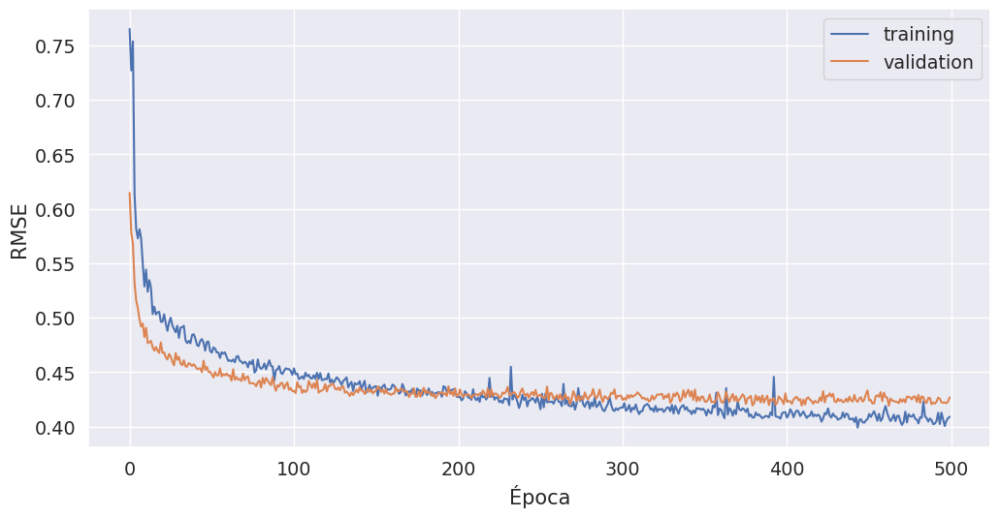

In [61]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Ahora probamos, por otro lado, el método de [regularización](https://keras.io/api/layers/regularizers/) tipo L2

In [62]:
from keras.regularizers import l2

In [63]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,), kernel_regularizer=l2(0.01)))
model.add(Dense(50, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [64]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 20s - loss: 1.8454

1344/6000 [=====>........................] - ETA: 0s - loss: 1.4141 

2688/6000 [============>.................] - ETA: 0s - loss: 1.2281

4032/6000 [===================>..........] - ETA: 0s - loss: 1.1239

5280/6000 [=========================>....] - ETA: 0s - loss: 1.0504

6000/6000 [==============================] - 0s 77us/step - loss: 1.0736 - val_loss: 0.7679


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5622

1504/6000 [======>.......................] - ETA: 0s - loss: 0.7485

2944/6000 [=============>................] - ETA: 0s - loss: 0.7172

4224/6000 [====================>.........] - ETA: 0s - loss: 0.7106

5376/6000 [=========================>....] - ETA: 0s - loss: 0.6973

6000/6000 [==============================] - 0s 53us/step - loss: 0.6913 - val_loss: 0.6240


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6317

1440/6000 [======>.......................] - ETA: 0s - loss: 0.5737

2816/6000 [=============>................] - ETA: 0s - loss: 0.5855

4128/6000 [===================>..........] - ETA: 0s - loss: 0.5847

5536/6000 [==========================>...] - ETA: 0s - loss: 0.5827

6000/6000 [==============================] - 0s 51us/step - loss: 0.5772 - val_loss: 0.5316


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4543

1408/6000 [======>.......................] - ETA: 0s - loss: 0.5425

2784/6000 [============>.................] - ETA: 0s - loss: 0.5379

4128/6000 [===================>..........] - ETA: 0s - loss: 0.5386

5440/6000 [==========================>...] - ETA: 0s - loss: 0.5447

6000/6000 [==============================] - 0s 53us/step - loss: 0.5415 - val_loss: 0.4842


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5396

1568/6000 [======>.......................] - ETA: 0s - loss: 0.4852

3008/6000 [==============>...............] - ETA: 0s - loss: 0.4782

4352/6000 [====================>.........] - ETA: 0s - loss: 0.5121

5376/6000 [=========================>....] - ETA: 0s - loss: 0.5040

6000/6000 [==============================] - 0s 54us/step - loss: 0.5003 - val_loss: 0.4525


Epoch 6/500
  32/6000 [..............................] - ETA: 1s - loss: 0.4972

1440/6000 [======>.......................] - ETA: 0s - loss: 0.4224

2944/6000 [=============>................] - ETA: 0s - loss: 0.4445

4448/6000 [=====================>........] - ETA: 0s - loss: 0.4499

5920/6000 [============================>.] - ETA: 0s - loss: 0.4587

6000/6000 [==============================] - 0s 52us/step - loss: 0.4579 - val_loss: 0.4337


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.8098

1152/6000 [====>.........................] - ETA: 0s - loss: 0.4052

2624/6000 [============>.................] - ETA: 0s - loss: 0.4378

4096/6000 [===================>..........] - ETA: 0s - loss: 0.4312

5536/6000 [==========================>...] - ETA: 0s - loss: 0.4299

6000/6000 [==============================] - 0s 52us/step - loss: 0.4314 - val_loss: 0.4038


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6948

1344/6000 [=====>........................] - ETA: 0s - loss: 0.3897

2528/6000 [===========>..................] - ETA: 0s - loss: 0.4037

3808/6000 [==================>...........] - ETA: 0s - loss: 0.4153

5024/6000 [========================>.....] - ETA: 0s - loss: 0.4139

6000/6000 [==============================] - 0s 59us/step - loss: 0.4109 - val_loss: 0.3945


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2887

1472/6000 [======>.......................] - ETA: 0s - loss: 0.4284

2560/6000 [===========>..................] - ETA: 0s - loss: 0.4149

3968/6000 [==================>...........] - ETA: 0s - loss: 0.3937

5440/6000 [==========================>...] - ETA: 0s - loss: 0.3936

6000/6000 [==============================] - 0s 52us/step - loss: 0.3934 - val_loss: 0.3754


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3341

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3969

2848/6000 [=============>................] - ETA: 0s - loss: 0.3775

4288/6000 [====================>.........] - ETA: 0s - loss: 0.3776

5600/6000 [===========================>..] - ETA: 0s - loss: 0.3795

6000/6000 [==============================] - 0s 51us/step - loss: 0.3781 - val_loss: 0.3736


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2510

1376/6000 [=====>........................] - ETA: 0s - loss: 0.3911

2752/6000 [============>.................] - ETA: 0s - loss: 0.3665

4160/6000 [===================>..........] - ETA: 0s - loss: 0.3732

5536/6000 [==========================>...] - ETA: 0s - loss: 0.3680

6000/6000 [==============================] - 0s 53us/step - loss: 0.3690 - val_loss: 0.3550


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2710

1504/6000 [======>.......................] - ETA: 0s - loss: 0.3616

3008/6000 [==============>...............] - ETA: 0s - loss: 0.3522

4448/6000 [=====================>........] - ETA: 0s - loss: 0.3547

5984/6000 [============================>.] - ETA: 0s - loss: 0.3536

6000/6000 [==============================] - 0s 49us/step - loss: 0.3537 - val_loss: 0.3483


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5611

1280/6000 [=====>........................] - ETA: 0s - loss: 0.3501

2720/6000 [============>.................] - ETA: 0s - loss: 0.3467

3968/6000 [==================>...........] - ETA: 0s - loss: 0.3563

5376/6000 [=========================>....] - ETA: 0s - loss: 0.3482

6000/6000 [==============================] - 0s 53us/step - loss: 0.3484 - val_loss: 0.3334


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3040

1344/6000 [=====>........................] - ETA: 0s - loss: 0.3249

2688/6000 [============>.................] - ETA: 0s - loss: 0.3279

3872/6000 [==================>...........] - ETA: 0s - loss: 0.3313

5312/6000 [=========================>....] - ETA: 0s - loss: 0.3347

6000/6000 [==============================] - 0s 52us/step - loss: 0.3360 - val_loss: 0.3413


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3375

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3581

2880/6000 [=============>................] - ETA: 0s - loss: 0.3382

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3366

5696/6000 [===========================>..] - ETA: 0s - loss: 0.3318

6000/6000 [==============================] - 0s 50us/step - loss: 0.3328 - val_loss: 0.3292


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2581

1344/6000 [=====>........................] - ETA: 0s - loss: 0.3265

2720/6000 [============>.................] - ETA: 0s - loss: 0.3486

4128/6000 [===================>..........] - ETA: 0s - loss: 0.3274

5568/6000 [==========================>...] - ETA: 0s - loss: 0.3247

6000/6000 [==============================] - 0s 51us/step - loss: 0.3249 - val_loss: 0.3248


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2958

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2962

2880/6000 [=============>................] - ETA: 0s - loss: 0.3079

4288/6000 [====================>.........] - ETA: 0s - loss: 0.3196

5728/6000 [===========================>..] - ETA: 0s - loss: 0.3236

6000/6000 [==============================] - 0s 50us/step - loss: 0.3218 - val_loss: 0.3146


Epoch 18/500


  32/6000 [..............................] - ETA: 0s - loss: 0.4033

1280/6000 [=====>........................] - ETA: 0s - loss: 0.3479

2464/6000 [===========>..................] - ETA: 0s - loss: 0.3374

3584/6000 [================>.............] - ETA: 0s - loss: 0.3342

4896/6000 [=======================>......] - ETA: 0s - loss: 0.3268

6000/6000 [==============================] - 0s 56us/step - loss: 0.3223 - val_loss: 0.3172


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3598

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3126

2944/6000 [=============>................] - ETA: 0s - loss: 0.3231

4384/6000 [====================>.........] - ETA: 0s - loss: 0.3146

5824/6000 [============================>.] - ETA: 0s - loss: 0.3148

6000/6000 [==============================] - 0s 53us/step - loss: 0.3130 - val_loss: 0.3134


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2715

1376/6000 [=====>........................] - ETA: 0s - loss: 0.3525

2784/6000 [============>.................] - ETA: 0s - loss: 0.3178

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3097

5696/6000 [===========================>..] - ETA: 0s - loss: 0.3093

6000/6000 [==============================] - 0s 51us/step - loss: 0.3128 - val_loss: 0.3044


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2851

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3074

2880/6000 [=============>................] - ETA: 0s - loss: 0.3039

4128/6000 [===================>..........] - ETA: 0s - loss: 0.3027

5440/6000 [==========================>...] - ETA: 0s - loss: 0.3040

6000/6000 [==============================] - 0s 53us/step - loss: 0.3073 - val_loss: 0.3024


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3203

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2914

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2903

4544/6000 [=====================>........] - ETA: 0s - loss: 0.3052

6000/6000 [==============================] - 0s 49us/step - loss: 0.3066 - val_loss: 0.3012


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2094

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2940

2848/6000 [=============>................] - ETA: 0s - loss: 0.2911

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2944

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2982

6000/6000 [==============================] - 0s 53us/step - loss: 0.3020 - val_loss: 0.2990


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3704

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3094

2880/6000 [=============>................] - ETA: 0s - loss: 0.2954

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2974

5632/6000 [===========================>..] - ETA: 0s - loss: 0.3028

6000/6000 [==============================] - 0s 54us/step - loss: 0.3015 - val_loss: 0.3022


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2067

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2988

2784/6000 [============>.................] - ETA: 0s - loss: 0.2938

4192/6000 [===================>..........] - ETA: 0s - loss: 0.3048

5536/6000 [==========================>...] - ETA: 0s - loss: 0.3019

6000/6000 [==============================] - 0s 53us/step - loss: 0.3008 - val_loss: 0.2941


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1451

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3096

2848/6000 [=============>................] - ETA: 0s - loss: 0.3034

4192/6000 [===================>..........] - ETA: 0s - loss: 0.3062

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2989

6000/6000 [==============================] - 0s 51us/step - loss: 0.2959 - val_loss: 0.2924


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2620

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2789

2848/6000 [=============>................] - ETA: 0s - loss: 0.3013

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2945

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2927

6000/6000 [==============================] - 0s 52us/step - loss: 0.2934 - val_loss: 0.2943


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3328

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3088

2784/6000 [============>.................] - ETA: 0s - loss: 0.3095

4128/6000 [===================>..........] - ETA: 0s - loss: 0.3079

5472/6000 [==========================>...] - ETA: 0s - loss: 0.3018

6000/6000 [==============================] - 0s 53us/step - loss: 0.3000 - val_loss: 0.2895


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3566

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2704

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2879

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2962

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2920

6000/6000 [==============================] - 0s 51us/step - loss: 0.2945 - val_loss: 0.2892


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3536

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3103

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2984

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2906

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2895

6000/6000 [==============================] - 0s 51us/step - loss: 0.2901 - val_loss: 0.2857


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3546

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2864

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2914

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2917

5888/6000 [============================>.] - ETA: 0s - loss: 0.2892

6000/6000 [==============================] - 0s 51us/step - loss: 0.2926 - val_loss: 0.2848


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1377

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3047

2752/6000 [============>.................] - ETA: 0s - loss: 0.2951

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2941

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2942

6000/6000 [==============================] - 0s 54us/step - loss: 0.2907 - val_loss: 0.2873


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2264

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2917

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2864

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2907

5856/6000 [============================>.] - ETA: 0s - loss: 0.2856

6000/6000 [==============================] - 0s 50us/step - loss: 0.2871 - val_loss: 0.2965


Epoch 34/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1766

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2795

2880/6000 [=============>................] - ETA: 0s - loss: 0.2827

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2821

5888/6000 [============================>.] - ETA: 0s - loss: 0.2863

6000/6000 [==============================] - 0s 49us/step - loss: 0.2858 - val_loss: 0.2881


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3058

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2678

2816/6000 [=============>................] - ETA: 0s - loss: 0.2850

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2866

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2862

6000/6000 [==============================] - 0s 57us/step - loss: 0.2848 - val_loss: 0.3117


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3536

1504/6000 [======>.......................] - ETA: 0s - loss: 0.3118

2816/6000 [=============>................] - ETA: 0s - loss: 0.2953

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2937

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2855

6000/6000 [==============================] - 0s 50us/step - loss: 0.2846 - val_loss: 0.2903


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2680

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2867

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2829

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2900

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2866

6000/6000 [==============================] - 0s 52us/step - loss: 0.2822 - val_loss: 0.2788


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3489

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2591

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2659

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2826

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2841

6000/6000 [==============================] - 0s 54us/step - loss: 0.2801 - val_loss: 0.2816


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1285

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2793

2624/6000 [============>.................] - ETA: 0s - loss: 0.2977

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2890

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2861

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2854

6000/6000 [==============================] - 0s 62us/step - loss: 0.2807 - val_loss: 0.2823


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3378

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2855

2816/6000 [=============>................] - ETA: 0s - loss: 0.2832

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2848

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2828

6000/6000 [==============================] - 0s 54us/step - loss: 0.2821 - val_loss: 0.2757


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1638

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2728

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2823

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2836

5984/6000 [============================>.] - ETA: 0s - loss: 0.2827

6000/6000 [==============================] - 0s 51us/step - loss: 0.2829 - val_loss: 0.2800


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1868

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2652

2656/6000 [============>.................] - ETA: 0s - loss: 0.2761

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2828

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2813

6000/6000 [==============================] - 0s 58us/step - loss: 0.2790 - val_loss: 0.2848


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2852

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2848

2816/6000 [=============>................] - ETA: 0s - loss: 0.2820

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2790

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2789

6000/6000 [==============================] - 0s 52us/step - loss: 0.2790 - val_loss: 0.2748


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1912

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2691

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2755

3584/6000 [================>.............] - ETA: 0s - loss: 0.2715

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2751

6000/6000 [==============================] - 0s 61us/step - loss: 0.2753 - val_loss: 0.2791


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4859

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2685

2816/6000 [=============>................] - ETA: 0s - loss: 0.2801

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2770

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2718

6000/6000 [==============================] - 0s 54us/step - loss: 0.2749 - val_loss: 0.2931


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1434

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2693

2880/6000 [=============>................] - ETA: 0s - loss: 0.2679

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2744

5888/6000 [============================>.] - ETA: 0s - loss: 0.2770

6000/6000 [==============================] - 0s 49us/step - loss: 0.2762 - val_loss: 0.2746


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2305

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2630

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2840

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2789

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2775

6000/6000 [==============================] - 0s 54us/step - loss: 0.2755 - val_loss: 0.2769


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2609

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2567

2688/6000 [============>.................] - ETA: 0s - loss: 0.2706

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2721

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2765

6000/6000 [==============================] - 0s 53us/step - loss: 0.2746 - val_loss: 0.2791


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4983

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2982

2976/6000 [=============>................] - ETA: 0s - loss: 0.2775

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2795

5952/6000 [============================>.] - ETA: 0s - loss: 0.2741

6000/6000 [==============================] - 0s 50us/step - loss: 0.2734 - val_loss: 0.2734


Epoch 50/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1586

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2835



2656/6000 [============>.................] - ETA: 0s - loss: 0.2750

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2665

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2706

6000/6000 [==============================] - 0s 51us/step - loss: 0.2711 - val_loss: 0.2696


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1677

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2782

2976/6000 [=============>................] - ETA: 0s - loss: 0.2643

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2713

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2729

6000/6000 [==============================] - 0s 52us/step - loss: 0.2712 - val_loss: 0.2695


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3486

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2618

2752/6000 [============>.................] - ETA: 0s - loss: 0.2750

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2665

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2683

6000/6000 [==============================] - 0s 53us/step - loss: 0.2710 - val_loss: 0.2716


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6857

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2816

2848/6000 [=============>................] - ETA: 0s - loss: 0.2771

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2739

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2700

6000/6000 [==============================] - 0s 52us/step - loss: 0.2729 - val_loss: 0.2653


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5211

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2877

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2770

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2705

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2714

6000/6000 [==============================] - 0s 54us/step - loss: 0.2693 - val_loss: 0.2701


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1949

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2673

2624/6000 [============>.................] - ETA: 0s - loss: 0.2648

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2662

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2678

6000/6000 [==============================] - 0s 56us/step - loss: 0.2711 - val_loss: 0.2665


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2911

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2703

2656/6000 [============>.................] - ETA: 0s - loss: 0.2728

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2628

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2658

6000/6000 [==============================] - 0s 55us/step - loss: 0.2669 - val_loss: 0.2727


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2425

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2781

2784/6000 [============>.................] - ETA: 0s - loss: 0.2649

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2707

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2691

6000/6000 [==============================] - 0s 55us/step - loss: 0.2656 - val_loss: 0.2675


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1900

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2529

2688/6000 [============>.................] - ETA: 0s - loss: 0.2493

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2723

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2658

6000/6000 [==============================] - 0s 55us/step - loss: 0.2666 - val_loss: 0.2763


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3578

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2765

2912/6000 [=============>................] - ETA: 0s - loss: 0.2618

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2687

5824/6000 [============================>.] - ETA: 0s - loss: 0.2690

6000/6000 [==============================] - 0s 54us/step - loss: 0.2667 - val_loss: 0.2670


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1656

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2906

2848/6000 [=============>................] - ETA: 0s - loss: 0.2840

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2669

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2673

6000/6000 [==============================] - 0s 53us/step - loss: 0.2662 - val_loss: 0.2672


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2610

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2902

2848/6000 [=============>................] - ETA: 0s - loss: 0.2733

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2737

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2690

6000/6000 [==============================] - 0s 55us/step - loss: 0.2674 - val_loss: 0.2702


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2427

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2669

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2670

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2602

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2688

6000/6000 [==============================] - 0s 55us/step - loss: 0.2672 - val_loss: 0.2696


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2505

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2780

2816/6000 [=============>................] - ETA: 0s - loss: 0.2683

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2672

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2656

6000/6000 [==============================] - 0s 50us/step - loss: 0.2626 - val_loss: 0.2626


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1910



1472/6000 [======>.......................] - ETA: 0s - loss: 0.2518

2880/6000 [=============>................] - ETA: 0s - loss: 0.2642

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2691

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2666

6000/6000 [==============================] - 0s 50us/step - loss: 0.2678 - val_loss: 0.2681


Epoch 65/500


  32/6000 [..............................] - ETA: 0s - loss: 0.4073

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2528

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2565

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2601

6000/6000 [==============================] - 0s 49us/step - loss: 0.2647 - val_loss: 0.2678


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2512

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2420

2656/6000 [============>.................] - ETA: 0s - loss: 0.2379

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2547

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2617

6000/6000 [==============================] - 0s 50us/step - loss: 0.2635 - val_loss: 0.2630


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1821

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2575

2848/6000 [=============>................] - ETA: 0s - loss: 0.2674

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2596

5888/6000 [============================>.] - ETA: 0s - loss: 0.2632

6000/6000 [==============================] - 0s 50us/step - loss: 0.2643 - val_loss: 0.2620


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2159

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2606

2816/6000 [=============>................] - ETA: 0s - loss: 0.2598

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2549

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2627

6000/6000 [==============================] - 0s 53us/step - loss: 0.2632 - val_loss: 0.2749


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2281

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2524

2880/6000 [=============>................] - ETA: 0s - loss: 0.2569

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2607

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2668

6000/6000 [==============================] - 0s 51us/step - loss: 0.2636 - val_loss: 0.2693


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3471

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2653

2848/6000 [=============>................] - ETA: 0s - loss: 0.2575

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2634

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2615

6000/6000 [==============================] - 0s 51us/step - loss: 0.2606 - val_loss: 0.2671


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2391

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2862

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2727

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2627

6000/6000 [==============================] - 0s 49us/step - loss: 0.2614 - val_loss: 0.2624


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1560

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2608

2976/6000 [=============>................] - ETA: 0s - loss: 0.2600

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2659

5888/6000 [============================>.] - ETA: 0s - loss: 0.2640

6000/6000 [==============================] - 0s 52us/step - loss: 0.2635 - val_loss: 0.2639


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2529

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2697

2752/6000 [============>.................] - ETA: 0s - loss: 0.2533

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2546

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2607

6000/6000 [==============================] - 0s 53us/step - loss: 0.2589 - val_loss: 0.2693


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2054

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2535

2752/6000 [============>.................] - ETA: 0s - loss: 0.2594

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2548

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2576

6000/6000 [==============================] - 0s 52us/step - loss: 0.2600 - val_loss: 0.2697


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4051

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2483

2688/6000 [============>.................] - ETA: 0s - loss: 0.2613

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2585

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2613

6000/6000 [==============================] - 0s 53us/step - loss: 0.2604 - val_loss: 0.2636


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3049

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2511

2912/6000 [=============>................] - ETA: 0s - loss: 0.2497

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2533

5920/6000 [============================>.] - ETA: 0s - loss: 0.2553

6000/6000 [==============================] - 0s 48us/step - loss: 0.2571 - val_loss: 0.2642


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2728

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2626

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2576

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2588

5856/6000 [============================>.] - ETA: 0s - loss: 0.2593

6000/6000 [==============================] - 0s 51us/step - loss: 0.2582 - val_loss: 0.2649


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3250

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2810

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2642

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2626

6000/6000 [==============================] - 0s 47us/step - loss: 0.2603 - val_loss: 0.2644


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2895

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2527

2976/6000 [=============>................] - ETA: 0s - loss: 0.2442

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2558

5888/6000 [============================>.] - ETA: 0s - loss: 0.2554

6000/6000 [==============================] - 0s 51us/step - loss: 0.2560 - val_loss: 0.2552


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3067

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2352

2880/6000 [=============>................] - ETA: 0s - loss: 0.2417

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2496

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2560

6000/6000 [==============================] - 0s 53us/step - loss: 0.2567 - val_loss: 0.2584


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1694

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2422

2912/6000 [=============>................] - ETA: 0s - loss: 0.2542

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2534

5920/6000 [============================>.] - ETA: 0s - loss: 0.2538

6000/6000 [==============================] - 0s 49us/step - loss: 0.2559 - val_loss: 0.2627


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2308

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2522

2976/6000 [=============>................] - ETA: 0s - loss: 0.2544

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2633

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2584

6000/6000 [==============================] - 0s 52us/step - loss: 0.2583 - val_loss: 0.2632


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3346

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2481

2848/6000 [=============>................] - ETA: 0s - loss: 0.2528

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2529

5824/6000 [============================>.] - ETA: 0s - loss: 0.2544

6000/6000 [==============================] - 0s 53us/step - loss: 0.2548 - val_loss: 0.2591


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1819

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2348

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2529

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2568

5856/6000 [============================>.] - ETA: 0s - loss: 0.2557

6000/6000 [==============================] - 0s 51us/step - loss: 0.2573 - val_loss: 0.2615


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4008

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2465

2944/6000 [=============>................] - ETA: 0s - loss: 0.2379

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2472

5824/6000 [============================>.] - ETA: 0s - loss: 0.2528

6000/6000 [==============================] - 0s 50us/step - loss: 0.2550 - val_loss: 0.2612


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2209

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2245

2816/6000 [=============>................] - ETA: 0s - loss: 0.2318

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2375

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2543

6000/6000 [==============================] - 0s 54us/step - loss: 0.2544 - val_loss: 0.2629


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1530

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2420

1984/6000 [========>.....................] - ETA: 0s - loss: 0.2483

2944/6000 [=============>................] - ETA: 0s - loss: 0.2561

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2721

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2725

6000/6000 [==============================] - 0s 60us/step - loss: 0.2720 - val_loss: 0.2556


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2007

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2422

2912/6000 [=============>................] - ETA: 0s - loss: 0.2595

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2659

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2651

6000/6000 [==============================] - 0s 54us/step - loss: 0.2648 - val_loss: 0.2517


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3037

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2579

2784/6000 [============>.................] - ETA: 0s - loss: 0.2582

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2596

5824/6000 [============================>.] - ETA: 0s - loss: 0.2572

6000/6000 [==============================] - 0s 48us/step - loss: 0.2565 - val_loss: 0.2585


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2629

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2528

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2532

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2487

6000/6000 [==============================] - 0s 51us/step - loss: 0.2554 - val_loss: 0.2578


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3017

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2537

2944/6000 [=============>................] - ETA: 0s - loss: 0.2538

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2501

5952/6000 [============================>.] - ETA: 0s - loss: 0.2536

6000/6000 [==============================] - 0s 48us/step - loss: 0.2531 - val_loss: 0.2528


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1678

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2458

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2587

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2590

5888/6000 [============================>.] - ETA: 0s - loss: 0.2597

6000/6000 [==============================] - 0s 51us/step - loss: 0.2583 - val_loss: 0.2533


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1931

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2512

2880/6000 [=============>................] - ETA: 0s - loss: 0.2605

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2566

5824/6000 [============================>.] - ETA: 0s - loss: 0.2509

6000/6000 [==============================] - 0s 49us/step - loss: 0.2509 - val_loss: 0.2524


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2625

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2368

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2460

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2450

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2501

6000/6000 [==============================] - 0s 52us/step - loss: 0.2512 - val_loss: 0.2697


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2265

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2541

2944/6000 [=============>................] - ETA: 0s - loss: 0.2556

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2557

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2517

6000/6000 [==============================] - 0s 49us/step - loss: 0.2533 - val_loss: 0.2521


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2650

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2563

2752/6000 [============>.................] - ETA: 0s - loss: 0.2585

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2622

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2537

6000/6000 [==============================] - 0s 52us/step - loss: 0.2560 - val_loss: 0.2554


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3994

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2710

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2548

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2591

5984/6000 [============================>.] - ETA: 0s - loss: 0.2523

6000/6000 [==============================] - 0s 49us/step - loss: 0.2525 - val_loss: 0.2523


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4852

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2648

2944/6000 [=============>................] - ETA: 0s - loss: 0.2557

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2521

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2509

6000/6000 [==============================] - 0s 55us/step - loss: 0.2494 - val_loss: 0.2518


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2490

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2450

2880/6000 [=============>................] - ETA: 0s - loss: 0.2639

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2568

5888/6000 [============================>.] - ETA: 0s - loss: 0.2545

6000/6000 [==============================] - 0s 49us/step - loss: 0.2550 - val_loss: 0.2525


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1751

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2673

2912/6000 [=============>................] - ETA: 0s - loss: 0.2573

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2487

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2501

6000/6000 [==============================] - 0s 51us/step - loss: 0.2481 - val_loss: 0.2520


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3835

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2475

2784/6000 [============>.................] - ETA: 0s - loss: 0.2501

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2386

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2455

6000/6000 [==============================] - 0s 51us/step - loss: 0.2483 - val_loss: 0.2551


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2637

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2312

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2407

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2459

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2423

6000/6000 [==============================] - 0s 58us/step - loss: 0.2488 - val_loss: 0.2642


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2260

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2603

2784/6000 [============>.................] - ETA: 0s - loss: 0.2616

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2587

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2516

6000/6000 [==============================] - 0s 53us/step - loss: 0.2501 - val_loss: 0.2508


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1758

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2577

2720/6000 [============>.................] - ETA: 0s - loss: 0.2410

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2455

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2518

6000/6000 [==============================] - 0s 54us/step - loss: 0.2518 - val_loss: 0.2499


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1978

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2451

2720/6000 [============>.................] - ETA: 0s - loss: 0.2502

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2510

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2498

6000/6000 [==============================] - 0s 54us/step - loss: 0.2515 - val_loss: 0.2555


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1986

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2502

2912/6000 [=============>................] - ETA: 0s - loss: 0.2460

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2444

5824/6000 [============================>.] - ETA: 0s - loss: 0.2492

6000/6000 [==============================] - 0s 49us/step - loss: 0.2500 - val_loss: 0.2597


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4028

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2548

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2461

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2497

5920/6000 [============================>.] - ETA: 0s - loss: 0.2520

6000/6000 [==============================] - 0s 52us/step - loss: 0.2527 - val_loss: 0.2506


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2333

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2682

2848/6000 [=============>................] - ETA: 0s - loss: 0.2623

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2526

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2506

6000/6000 [==============================] - 0s 55us/step - loss: 0.2504 - val_loss: 0.2640


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2659

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2604

2688/6000 [============>.................] - ETA: 0s - loss: 0.2526

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2474

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2492

6000/6000 [==============================] - 0s 53us/step - loss: 0.2486 - val_loss: 0.2502


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1325

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2234

2784/6000 [============>.................] - ETA: 0s - loss: 0.2466

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2434

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2419

6000/6000 [==============================] - 0s 55us/step - loss: 0.2457 - val_loss: 0.2499


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2411

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2802

2912/6000 [=============>................] - ETA: 0s - loss: 0.2645

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2567

5856/6000 [============================>.] - ETA: 0s - loss: 0.2470

6000/6000 [==============================] - 0s 49us/step - loss: 0.2453 - val_loss: 0.2524


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1462

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2394

2784/6000 [============>.................] - ETA: 0s - loss: 0.2488

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2541

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2525

6000/6000 [==============================] - 0s 52us/step - loss: 0.2519 - val_loss: 0.2469


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2430

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2475

2880/6000 [=============>................] - ETA: 0s - loss: 0.2504

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2486

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2490

6000/6000 [==============================] - 0s 53us/step - loss: 0.2473 - val_loss: 0.2530


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4564

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2573

2752/6000 [============>.................] - ETA: 0s - loss: 0.2558

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2528

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2477

6000/6000 [==============================] - 0s 51us/step - loss: 0.2476 - val_loss: 0.2461


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1513

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2588

2848/6000 [=============>................] - ETA: 0s - loss: 0.2425

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2509

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2450



6000/6000 [==============================] - 0s 51us/step - loss: 0.2480 - val_loss: 0.2466


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1851

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2252

2944/6000 [=============>................] - ETA: 0s - loss: 0.2463

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2412

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2441

6000/6000 [==============================] - 0s 50us/step - loss: 0.2479 - val_loss: 0.2483


Epoch 117/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1449

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2311

2944/6000 [=============>................] - ETA: 0s - loss: 0.2433

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2443

5856/6000 [============================>.] - ETA: 0s - loss: 0.2444

6000/6000 [==============================] - 0s 53us/step - loss: 0.2466 - val_loss: 0.2453


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3846

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2366

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2409

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2574

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2507

6000/6000 [==============================] - 0s 54us/step - loss: 0.2499 - val_loss: 0.2543


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2663

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2668

2752/6000 [============>.................] - ETA: 0s - loss: 0.2482

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2435

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2465

6000/6000 [==============================] - 0s 52us/step - loss: 0.2486 - val_loss: 0.2859


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2369

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2448

2944/6000 [=============>................] - ETA: 0s - loss: 0.2477

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2461

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2495

6000/6000 [==============================] - 0s 52us/step - loss: 0.2477 - val_loss: 0.2484


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5709

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2482

2784/6000 [============>.................] - ETA: 0s - loss: 0.2426

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2546

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2489

6000/6000 [==============================] - 0s 53us/step - loss: 0.2464 - val_loss: 0.2463


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2485

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2069

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2416

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2462

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2466

6000/6000 [==============================] - 0s 54us/step - loss: 0.2484 - val_loss: 0.2669


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1352

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2304

2944/6000 [=============>................] - ETA: 0s - loss: 0.2430

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2560

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2493

6000/6000 [==============================] - 0s 50us/step - loss: 0.2496 - val_loss: 0.2452


Epoch 124/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2147

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2325

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2390

5824/6000 [============================>.] - ETA: 0s - loss: 0.2420

6000/6000 [==============================] - 0s 53us/step - loss: 0.2439 - val_loss: 0.2516


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1767

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2755

2688/6000 [============>.................] - ETA: 0s - loss: 0.2520

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2550

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2502

6000/6000 [==============================] - 0s 53us/step - loss: 0.2493 - val_loss: 0.2409


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3822

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2304

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2499

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2466

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2467

6000/6000 [==============================] - 0s 53us/step - loss: 0.2438 - val_loss: 0.2491


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1515

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2267

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2412

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2479

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2414

6000/6000 [==============================] - 0s 56us/step - loss: 0.2425 - val_loss: 0.2547


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1896

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2408

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2471

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2392

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2446

6000/6000 [==============================] - 0s 56us/step - loss: 0.2421 - val_loss: 0.2472


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1588

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2489

2880/6000 [=============>................] - ETA: 0s - loss: 0.2413

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2443

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2441

6000/6000 [==============================] - 0s 52us/step - loss: 0.2431 - val_loss: 0.2459


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2813

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2408

2912/6000 [=============>................] - ETA: 0s - loss: 0.2471

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2405

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2394

6000/6000 [==============================] - 0s 53us/step - loss: 0.2412 - val_loss: 0.2504


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2492

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2550

2976/6000 [=============>................] - ETA: 0s - loss: 0.2407

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2376

5856/6000 [============================>.] - ETA: 0s - loss: 0.2436

6000/6000 [==============================] - 0s 52us/step - loss: 0.2441 - val_loss: 0.2569


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2048

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2548

2976/6000 [=============>................] - ETA: 0s - loss: 0.2538

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2551

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2465

6000/6000 [==============================] - 0s 49us/step - loss: 0.2459 - val_loss: 0.2543


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3259

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2332

2880/6000 [=============>................] - ETA: 0s - loss: 0.2433

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2466

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2465

6000/6000 [==============================] - 0s 52us/step - loss: 0.2490 - val_loss: 0.2475


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2441

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2422

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2438

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2442

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2495

6000/6000 [==============================] - 0s 52us/step - loss: 0.2492 - val_loss: 0.2462


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1724

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2474

2784/6000 [============>.................] - ETA: 0s - loss: 0.2446

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2409

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2434

6000/6000 [==============================] - 0s 56us/step - loss: 0.2412 - val_loss: 0.2479


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2573

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2411

2720/6000 [============>.................] - ETA: 0s - loss: 0.2416

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2367

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2429

6000/6000 [==============================] - 0s 53us/step - loss: 0.2418 - val_loss: 0.2411


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2534

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2316

2688/6000 [============>.................] - ETA: 0s - loss: 0.2471

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2375

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2436

6000/6000 [==============================] - 0s 53us/step - loss: 0.2459 - val_loss: 0.2623


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4124

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2280

2848/6000 [=============>................] - ETA: 0s - loss: 0.2331

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2394

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2408

6000/6000 [==============================] - 0s 53us/step - loss: 0.2401 - val_loss: 0.2400


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2693

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2385

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2488

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2351

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2449

6000/6000 [==============================] - 0s 53us/step - loss: 0.2423 - val_loss: 0.2444


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1329

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2341

2688/6000 [============>.................] - ETA: 0s - loss: 0.2299

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2348

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2370

6000/6000 [==============================] - 0s 53us/step - loss: 0.2386 - val_loss: 0.2484


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1667

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2241

2848/6000 [=============>................] - ETA: 0s - loss: 0.2352

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2471

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2444

6000/6000 [==============================] - 0s 52us/step - loss: 0.2421 - val_loss: 0.2432


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3399

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2259

2848/6000 [=============>................] - ETA: 0s - loss: 0.2380

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2330

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2415

6000/6000 [==============================] - 0s 52us/step - loss: 0.2426 - val_loss: 0.2562


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2712

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2321

2912/6000 [=============>................] - ETA: 0s - loss: 0.2293

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2372

5824/6000 [============================>.] - ETA: 0s - loss: 0.2409

6000/6000 [==============================] - 0s 51us/step - loss: 0.2407 - val_loss: 0.2476


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2821

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2574

2880/6000 [=============>................] - ETA: 0s - loss: 0.2493

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2450

5824/6000 [============================>.] - ETA: 0s - loss: 0.2463

6000/6000 [==============================] - 0s 51us/step - loss: 0.2440 - val_loss: 0.2526


Epoch 145/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1592

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2341

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2415

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2417

6000/6000 [==============================] - 0s 48us/step - loss: 0.2384 - val_loss: 0.2459


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1660

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2521

2976/6000 [=============>................] - ETA: 0s - loss: 0.2456

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2469

6000/6000 [==============================] - 0s 47us/step - loss: 0.2418 - val_loss: 0.2387


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2880

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2454

2976/6000 [=============>................] - ETA: 0s - loss: 0.2386

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2430

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2370

6000/6000 [==============================] - 0s 49us/step - loss: 0.2394 - val_loss: 0.2439


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2724

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2195

2816/6000 [=============>................] - ETA: 0s - loss: 0.2303

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2397

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2429



6000/6000 [==============================] - 0s 51us/step - loss: 0.2446 - val_loss: 0.2508


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2252

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2585

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2420

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2323

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2419

6000/6000 [==============================] - 0s 51us/step - loss: 0.2419 - val_loss: 0.2387


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1895

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2353

2944/6000 [=============>................] - ETA: 0s - loss: 0.2373

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2389

5856/6000 [============================>.] - ETA: 0s - loss: 0.2376

6000/6000 [==============================] - 0s 53us/step - loss: 0.2375 - val_loss: 0.2449


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1948

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2408

2880/6000 [=============>................] - ETA: 0s - loss: 0.2421

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2414

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2361

6000/6000 [==============================] - 0s 49us/step - loss: 0.2369 - val_loss: 0.2581


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3528

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2472

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2511

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2484

5824/6000 [============================>.] - ETA: 0s - loss: 0.2426

6000/6000 [==============================] - 0s 50us/step - loss: 0.2435 - val_loss: 0.2420


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2015

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2509

2944/6000 [=============>................] - ETA: 0s - loss: 0.2386

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2386

5888/6000 [============================>.] - ETA: 0s - loss: 0.2384

6000/6000 [==============================] - 0s 52us/step - loss: 0.2406 - val_loss: 0.2441


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1468

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2463

2752/6000 [============>.................] - ETA: 0s - loss: 0.2438

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2386

5856/6000 [============================>.] - ETA: 0s - loss: 0.2408

6000/6000 [==============================] - 0s 49us/step - loss: 0.2417 - val_loss: 0.2426


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2193

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2600

2880/6000 [=============>................] - ETA: 0s - loss: 0.2399

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2395

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2406

6000/6000 [==============================] - 0s 53us/step - loss: 0.2389 - val_loss: 0.2400


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4186

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2338

2688/6000 [============>.................] - ETA: 0s - loss: 0.2399

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2309

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 54us/step - loss: 0.2365 - val_loss: 0.2379


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3209

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2331

2944/6000 [=============>................] - ETA: 0s - loss: 0.2431

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2421

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2395

6000/6000 [==============================] - 0s 51us/step - loss: 0.2398 - val_loss: 0.2426


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2468

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2614

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2533

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2432

6000/6000 [==============================] - 0s 48us/step - loss: 0.2431 - val_loss: 0.2436


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1616

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2362

2944/6000 [=============>................] - ETA: 0s - loss: 0.2291

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2354

5952/6000 [============================>.] - ETA: 0s - loss: 0.2402

6000/6000 [==============================] - 0s 51us/step - loss: 0.2400 - val_loss: 0.2418


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3242

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2463

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2361

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2405

6000/6000 [==============================] - 0s 50us/step - loss: 0.2385 - val_loss: 0.2405


Epoch 161/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2712

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2178

2944/6000 [=============>................] - ETA: 0s - loss: 0.2309

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2318

5856/6000 [============================>.] - ETA: 0s - loss: 0.2406

6000/6000 [==============================] - 0s 50us/step - loss: 0.2415 - val_loss: 0.2428


Epoch 162/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1830

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2387

2848/6000 [=============>................] - ETA: 0s - loss: 0.2408

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2397

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2390

6000/6000 [==============================] - 0s 56us/step - loss: 0.2378 - val_loss: 0.2449


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2851

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2565

2976/6000 [=============>................] - ETA: 0s - loss: 0.2418

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2387

5920/6000 [============================>.] - ETA: 0s - loss: 0.2379

6000/6000 [==============================] - 0s 50us/step - loss: 0.2379 - val_loss: 0.2397


Epoch 164/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1122

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2703

2976/6000 [=============>................] - ETA: 0s - loss: 0.2607

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2439

5952/6000 [============================>.] - ETA: 0s - loss: 0.2407

6000/6000 [==============================] - 0s 48us/step - loss: 0.2409 - val_loss: 0.2361


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2753

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2409

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2338

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2418

6000/6000 [==============================] - 0s 48us/step - loss: 0.2375 - val_loss: 0.2419


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2090

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2367

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2400

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2412

5952/6000 [============================>.] - ETA: 0s - loss: 0.2371

6000/6000 [==============================] - 0s 50us/step - loss: 0.2374 - val_loss: 0.2348


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1681

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2535

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2530

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2394

5984/6000 [============================>.] - ETA: 0s - loss: 0.2363

6000/6000 [==============================] - 0s 50us/step - loss: 0.2362 - val_loss: 0.2385


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3948

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2552

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2465

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2392

6000/6000 [==============================] - 0s 49us/step - loss: 0.2346 - val_loss: 0.2372


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3725

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2506

2816/6000 [=============>................] - ETA: 0s - loss: 0.2484

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2520

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2470

6000/6000 [==============================] - 0s 53us/step - loss: 0.2420 - val_loss: 0.2370


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1356

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2385

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2428

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2368

5920/6000 [============================>.] - ETA: 0s - loss: 0.2363

6000/6000 [==============================] - 0s 50us/step - loss: 0.2377 - val_loss: 0.2453


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2253

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2333

2784/6000 [============>.................] - ETA: 0s - loss: 0.2286

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2387

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2371

6000/6000 [==============================] - 0s 50us/step - loss: 0.2372 - val_loss: 0.2396


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3752

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2553

2816/6000 [=============>................] - ETA: 0s - loss: 0.2456

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2371

5824/6000 [============================>.] - ETA: 0s - loss: 0.2338

6000/6000 [==============================] - 0s 49us/step - loss: 0.2350 - val_loss: 0.2509


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3509

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2478

2880/6000 [=============>................] - ETA: 0s - loss: 0.2380

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2335

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2363

6000/6000 [==============================] - 0s 53us/step - loss: 0.2365 - val_loss: 0.2360


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1741

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2400

2784/6000 [============>.................] - ETA: 0s - loss: 0.2338

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2399

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2388

6000/6000 [==============================] - 0s 49us/step - loss: 0.2399 - val_loss: 0.2739


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3263

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2376

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2424

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2406

6000/6000 [==============================] - 0s 48us/step - loss: 0.2405 - val_loss: 0.2534


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

 960/6000 [===>..........................] - ETA: 0s - loss: 0.2384

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2508

3616/6000 [=================>............] - ETA: 0s - loss: 0.2464

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2436

6000/6000 [==============================] - 0s 53us/step - loss: 0.2369 - val_loss: 0.2441


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1868

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2544

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2480

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2467

5824/6000 [============================>.] - ETA: 0s - loss: 0.2352

6000/6000 [==============================] - 0s 51us/step - loss: 0.2370 - val_loss: 0.2346


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3225

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2324

2720/6000 [============>.................] - ETA: 0s - loss: 0.2355

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2351

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2340

6000/6000 [==============================] - 0s 52us/step - loss: 0.2347 - val_loss: 0.2359


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1649

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2288

2816/6000 [=============>................] - ETA: 0s - loss: 0.2388

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2370

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2370

6000/6000 [==============================] - 0s 52us/step - loss: 0.2373 - val_loss: 0.2366


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1994

 864/6000 [===>..........................] - ETA: 0s - loss: 0.2410

2208/6000 [==========>...................] - ETA: 0s - loss: 0.2396

3680/6000 [=================>............] - ETA: 0s - loss: 0.2340

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2383

6000/6000 [==============================] - 0s 55us/step - loss: 0.2360 - val_loss: 0.2469


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1642

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2240

2880/6000 [=============>................] - ETA: 0s - loss: 0.2448

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2365

5824/6000 [============================>.] - ETA: 0s - loss: 0.2372

6000/6000 [==============================] - 0s 50us/step - loss: 0.2355 - val_loss: 0.2387


Epoch 182/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1523

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2140

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2282

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2372

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2359

6000/6000 [==============================] - 0s 55us/step - loss: 0.2356 - val_loss: 0.2368


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2477

2816/6000 [=============>................] - ETA: 0s - loss: 0.2460

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2385

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2369

6000/6000 [==============================] - 0s 51us/step - loss: 0.2367 - val_loss: 0.2331


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1123

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2224

2656/6000 [============>.................] - ETA: 0s - loss: 0.2271

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2331

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2390

6000/6000 [==============================] - 0s 54us/step - loss: 0.2379 - val_loss: 0.2372


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1223

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2416

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2406

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2352

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2356

6000/6000 [==============================] - 0s 56us/step - loss: 0.2340 - val_loss: 0.2370


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2266

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2143

2912/6000 [=============>................] - ETA: 0s - loss: 0.2247

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2386

5824/6000 [============================>.] - ETA: 0s - loss: 0.2349

6000/6000 [==============================] - 0s 49us/step - loss: 0.2327 - val_loss: 0.2413


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3496

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2382

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2506

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2443

5984/6000 [============================>.] - ETA: 0s - loss: 0.2381

6000/6000 [==============================] - 0s 50us/step - loss: 0.2380 - val_loss: 0.2459


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2043

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2450

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2414

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2434

6000/6000 [==============================] - 0s 47us/step - loss: 0.2390 - val_loss: 0.2393


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1953

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2287

2784/6000 [============>.................] - ETA: 0s - loss: 0.2383

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2386

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2385

6000/6000 [==============================] - 0s 50us/step - loss: 0.2397 - val_loss: 0.2368


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3886

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2298

2688/6000 [============>.................] - ETA: 0s - loss: 0.2224

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2267

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2319

6000/6000 [==============================] - 0s 54us/step - loss: 0.2347 - val_loss: 0.2409


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1556

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2096

2976/6000 [=============>................] - ETA: 0s - loss: 0.2322

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2323

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2319

6000/6000 [==============================] - 0s 50us/step - loss: 0.2388 - val_loss: 0.2402


Epoch 192/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2268

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2580

2976/6000 [=============>................] - ETA: 0s - loss: 0.2447

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2385

5984/6000 [============================>.] - ETA: 0s - loss: 0.2364

6000/6000 [==============================] - 0s 52us/step - loss: 0.2362 - val_loss: 0.2418


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2158

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2476

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2376

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2316

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 52us/step - loss: 0.2335 - val_loss: 0.2423


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2267

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2460

2880/6000 [=============>................] - ETA: 0s - loss: 0.2394

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2417

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2325

6000/6000 [==============================] - 0s 52us/step - loss: 0.2349 - val_loss: 0.2617


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3895

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2323

2816/6000 [=============>................] - ETA: 0s - loss: 0.2359

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2308

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2384

6000/6000 [==============================] - 0s 49us/step - loss: 0.2387 - val_loss: 0.2447


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4115

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2595

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2435

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2376

6000/6000 [==============================] - 0s 48us/step - loss: 0.2322 - val_loss: 0.2354


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3199

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2424

2688/6000 [============>.................] - ETA: 0s - loss: 0.2386

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2349

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2364

6000/6000 [==============================] - 0s 55us/step - loss: 0.2343 - val_loss: 0.2342


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1792

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2123

2848/6000 [=============>................] - ETA: 0s - loss: 0.2247

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2268

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2348

6000/6000 [==============================] - 0s 58us/step - loss: 0.2321 - val_loss: 0.2420


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3549

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2321

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2239

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2306

6000/6000 [==============================] - 0s 50us/step - loss: 0.2393 - val_loss: 0.2334


Epoch 200/500


  32/6000 [..............................] - ETA: 0s - loss: 0.6163

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2401

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2290

3744/6000 [=================>............] - ETA: 0s - loss: 0.2315

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2284

6000/6000 [==============================] - 0s 55us/step - loss: 0.2338 - val_loss: 0.2410


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2476

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2240

2880/6000 [=============>................] - ETA: 0s - loss: 0.2372

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2378

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2368

6000/6000 [==============================] - 0s 52us/step - loss: 0.2356 - val_loss: 0.2342


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1231

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2196

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2364

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2413

6000/6000 [==============================] - 0s 48us/step - loss: 0.2366 - val_loss: 0.2310


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2699

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2591

2912/6000 [=============>................] - ETA: 0s - loss: 0.2488

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2429

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2392

6000/6000 [==============================] - 0s 54us/step - loss: 0.2377 - val_loss: 0.2463


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1995

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2283

2944/6000 [=============>................] - ETA: 0s - loss: 0.2361

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2428

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2345

6000/6000 [==============================] - 0s 49us/step - loss: 0.2343 - val_loss: 0.2470


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1580

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2295

2720/6000 [============>.................] - ETA: 0s - loss: 0.2286

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2339

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2348

6000/6000 [==============================] - 0s 51us/step - loss: 0.2348 - val_loss: 0.2371


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1571

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2392

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2470

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2381

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 51us/step - loss: 0.2346 - val_loss: 0.2535


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2341

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2588

2912/6000 [=============>................] - ETA: 0s - loss: 0.2402

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2377

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2367

6000/6000 [==============================] - 0s 51us/step - loss: 0.2360 - val_loss: 0.2384


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4001

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2350

2944/6000 [=============>................] - ETA: 0s - loss: 0.2290

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2340

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2321

6000/6000 [==============================] - 0s 53us/step - loss: 0.2341 - val_loss: 0.2327


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2842

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2311

2848/6000 [=============>................] - ETA: 0s - loss: 0.2255

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2309

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2366

6000/6000 [==============================] - 0s 53us/step - loss: 0.2341 - val_loss: 0.2467


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2436

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2370

2944/6000 [=============>................] - ETA: 0s - loss: 0.2387

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2342

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2350

6000/6000 [==============================] - 0s 52us/step - loss: 0.2337 - val_loss: 0.2322


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3089

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2368

2816/6000 [=============>................] - ETA: 0s - loss: 0.2268

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2269

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 53us/step - loss: 0.2317 - val_loss: 0.2308


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3241

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2270

2624/6000 [============>.................] - ETA: 0s - loss: 0.2118

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2256

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2307

6000/6000 [==============================] - 0s 51us/step - loss: 0.2333 - val_loss: 0.2371


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1633

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2164

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2221

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2235

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2329

6000/6000 [==============================] - 0s 55us/step - loss: 0.2325 - val_loss: 0.2338


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2478

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2430

2656/6000 [============>.................] - ETA: 0s - loss: 0.2337

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2356

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2331

6000/6000 [==============================] - 0s 53us/step - loss: 0.2308 - val_loss: 0.2509


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1692

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2295

2976/6000 [=============>................] - ETA: 0s - loss: 0.2261

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2255

5984/6000 [============================>.] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 49us/step - loss: 0.2346 - val_loss: 0.2428


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1880

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2135

2848/6000 [=============>................] - ETA: 0s - loss: 0.2283

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2285

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2308

6000/6000 [==============================] - 0s 53us/step - loss: 0.2330 - val_loss: 0.2333


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2100

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2183

2976/6000 [=============>................] - ETA: 0s - loss: 0.2304

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2286

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2320

6000/6000 [==============================] - 0s 51us/step - loss: 0.2313 - val_loss: 0.2331


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1860

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2471

2976/6000 [=============>................] - ETA: 0s - loss: 0.2465

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2362

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2349

6000/6000 [==============================] - 0s 52us/step - loss: 0.2335 - val_loss: 0.2311


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1798

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2385

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2327

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2339

5856/6000 [============================>.] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 51us/step - loss: 0.2316 - val_loss: 0.2291


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1599

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2264

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2192

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2264

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2328

6000/6000 [==============================] - 0s 52us/step - loss: 0.2341 - val_loss: 0.2305


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1815

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2249

2944/6000 [=============>................] - ETA: 0s - loss: 0.2221

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2287

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2316

6000/6000 [==============================] - 0s 51us/step - loss: 0.2324 - val_loss: 0.2355


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2370

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2459

2912/6000 [=============>................] - ETA: 0s - loss: 0.2342

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2357

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2360

6000/6000 [==============================] - 0s 51us/step - loss: 0.2347 - val_loss: 0.2394


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1327

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2143

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2142

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2298

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2352

6000/6000 [==============================] - 0s 53us/step - loss: 0.2372 - val_loss: 0.2423


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4152

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2331

2848/6000 [=============>................] - ETA: 0s - loss: 0.2421

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2367

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2345

6000/6000 [==============================] - 0s 53us/step - loss: 0.2322 - val_loss: 0.2336


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2029

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2208

2848/6000 [=============>................] - ETA: 0s - loss: 0.2267

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2323

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2335

6000/6000 [==============================] - 0s 51us/step - loss: 0.2350 - val_loss: 0.2471


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3891

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2331

2720/6000 [============>.................] - ETA: 0s - loss: 0.2414

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2313

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2361

6000/6000 [==============================] - 0s 55us/step - loss: 0.2325 - val_loss: 0.2350


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1437

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2090

2880/6000 [=============>................] - ETA: 0s - loss: 0.2253

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2310

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2328

6000/6000 [==============================] - 0s 52us/step - loss: 0.2323 - val_loss: 0.2380


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2569

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2334

2816/6000 [=============>................] - ETA: 0s - loss: 0.2403

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2393

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2320

6000/6000 [==============================] - 0s 54us/step - loss: 0.2303 - val_loss: 0.2365


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2791

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2468

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2380

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2411

6000/6000 [==============================] - 0s 47us/step - loss: 0.2383 - val_loss: 0.2396


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4258

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2654

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2425

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2275

5952/6000 [============================>.] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 49us/step - loss: 0.2336 - val_loss: 0.2330


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2644

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2220

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2236

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2301

5920/6000 [============================>.] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 49us/step - loss: 0.2337 - val_loss: 0.2319


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2154

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2487

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2406

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2366

6000/6000 [==============================] - 0s 47us/step - loss: 0.2307 - val_loss: 0.2454


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1261

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2208

2816/6000 [=============>................] - ETA: 0s - loss: 0.2351

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2286

5888/6000 [============================>.] - ETA: 0s - loss: 0.2317

6000/6000 [==============================] - 0s 48us/step - loss: 0.2304 - val_loss: 0.2368


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1692

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2164

2912/6000 [=============>................] - ETA: 0s - loss: 0.2281

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2331

5952/6000 [============================>.] - ETA: 0s - loss: 0.2339

6000/6000 [==============================] - 0s 48us/step - loss: 0.2341 - val_loss: 0.2663


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3538

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2273

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2177

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2183

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 52us/step - loss: 0.2343 - val_loss: 0.2553


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2676

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2352

2912/6000 [=============>................] - ETA: 0s - loss: 0.2393

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2427

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2366

6000/6000 [==============================] - 0s 51us/step - loss: 0.2364 - val_loss: 0.2375


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2442

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2438

2880/6000 [=============>................] - ETA: 0s - loss: 0.2424

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2344

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2317

6000/6000 [==============================] - 0s 53us/step - loss: 0.2330 - val_loss: 0.2367


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2492

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2358

2752/6000 [============>.................] - ETA: 0s - loss: 0.2308

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2320

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2319

6000/6000 [==============================] - 0s 52us/step - loss: 0.2314 - val_loss: 0.2261


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2079

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2189

2976/6000 [=============>................] - ETA: 0s - loss: 0.2287

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2341

5984/6000 [============================>.] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 52us/step - loss: 0.2292 - val_loss: 0.2300


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1384

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2421

2848/6000 [=============>................] - ETA: 0s - loss: 0.2317

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2339

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2320

6000/6000 [==============================] - 0s 53us/step - loss: 0.2311 - val_loss: 0.2480


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5999

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2277

2912/6000 [=============>................] - ETA: 0s - loss: 0.2330

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2389

5920/6000 [============================>.] - ETA: 0s - loss: 0.2350

6000/6000 [==============================] - 0s 48us/step - loss: 0.2344 - val_loss: 0.2491


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2324

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2307

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2362

6000/6000 [==============================] - 0s 47us/step - loss: 0.2331 - val_loss: 0.2274


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2689

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2438

2784/6000 [============>.................] - ETA: 0s - loss: 0.2315

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2297

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2308

6000/6000 [==============================] - 0s 55us/step - loss: 0.2299 - val_loss: 0.2286


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2016

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2137

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2395

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2355

5984/6000 [============================>.] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 52us/step - loss: 0.2308 - val_loss: 0.2319


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1618

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2390

2784/6000 [============>.................] - ETA: 0s - loss: 0.2311

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2346

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2315

6000/6000 [==============================] - 0s 54us/step - loss: 0.2318 - val_loss: 0.2498


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1630

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2275

2912/6000 [=============>................] - ETA: 0s - loss: 0.2284

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2312

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 50us/step - loss: 0.2296 - val_loss: 0.2409


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2994

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2412

2720/6000 [============>.................] - ETA: 0s - loss: 0.2415

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2272

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 53us/step - loss: 0.2298 - val_loss: 0.2285


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2445

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2185

2848/6000 [=============>................] - ETA: 0s - loss: 0.2299

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2367

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2333

6000/6000 [==============================] - 0s 53us/step - loss: 0.2329 - val_loss: 0.2352


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3439

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2582

2976/6000 [=============>................] - ETA: 0s - loss: 0.2373

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2337

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2394



6000/6000 [==============================] - 0s 51us/step - loss: 0.2429 - val_loss: 0.2327


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2240

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2208

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2192

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2234

5952/6000 [============================>.] - ETA: 0s - loss: 0.2325

6000/6000 [==============================] - 0s 51us/step - loss: 0.2320 - val_loss: 0.2291


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2493

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2416

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2415

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2326

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 52us/step - loss: 0.2318 - val_loss: 0.2302


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2152

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2201

2912/6000 [=============>................] - ETA: 0s - loss: 0.2329

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2313

5824/6000 [============================>.] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 51us/step - loss: 0.2310 - val_loss: 0.2249


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1210

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2402

2976/6000 [=============>................] - ETA: 0s - loss: 0.2351

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2302

6000/6000 [==============================] - 0s 48us/step - loss: 0.2305 - val_loss: 0.2282


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1202

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2490

2912/6000 [=============>................] - ETA: 0s - loss: 0.2421

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2322

5952/6000 [============================>.] - ETA: 0s - loss: 0.2315

6000/6000 [==============================] - 0s 50us/step - loss: 0.2314 - val_loss: 0.2334


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1650

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2432

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2239

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2236

6000/6000 [==============================] - 0s 48us/step - loss: 0.2312 - val_loss: 0.2374


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2506

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2114

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2158

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2237

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2316

6000/6000 [==============================] - 0s 50us/step - loss: 0.2311 - val_loss: 0.2296


Epoch 257/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2172

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2285

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2455

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2423

6000/6000 [==============================] - 0s 47us/step - loss: 0.2317 - val_loss: 0.2351


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1467

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2238

2912/6000 [=============>................] - ETA: 0s - loss: 0.2351

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2372

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2307

6000/6000 [==============================] - 0s 53us/step - loss: 0.2303 - val_loss: 0.2437


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2186

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2501

2912/6000 [=============>................] - ETA: 0s - loss: 0.2460

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2333

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 54us/step - loss: 0.2302 - val_loss: 0.2371


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2031

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2330

2816/6000 [=============>................] - ETA: 0s - loss: 0.2303

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2282

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 52us/step - loss: 0.2326 - val_loss: 0.2394


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2686

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2115

2816/6000 [=============>................] - ETA: 0s - loss: 0.2400

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2295

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2291

6000/6000 [==============================] - 0s 50us/step - loss: 0.2296 - val_loss: 0.2309


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1911

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2322

2848/6000 [=============>................] - ETA: 0s - loss: 0.2312

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2341

5888/6000 [============================>.] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 50us/step - loss: 0.2331 - val_loss: 0.2305


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1179

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2299

2752/6000 [============>.................] - ETA: 0s - loss: 0.2270

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2298

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 50us/step - loss: 0.2282 - val_loss: 0.2249


Epoch 264/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1394

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2111

2784/6000 [============>.................] - ETA: 0s - loss: 0.2217

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2215

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2281

6000/6000 [==============================] - 0s 52us/step - loss: 0.2294 - val_loss: 0.2300


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1529

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2101

2880/6000 [=============>................] - ETA: 0s - loss: 0.2267

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2241

5824/6000 [============================>.] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 52us/step - loss: 0.2314 - val_loss: 0.2271


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0979

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2460

2720/6000 [============>.................] - ETA: 0s - loss: 0.2287

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2314

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2312

6000/6000 [==============================] - 0s 52us/step - loss: 0.2302 - val_loss: 0.2336


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1225

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2309

2880/6000 [=============>................] - ETA: 0s - loss: 0.2300

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2201

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2315

6000/6000 [==============================] - 0s 51us/step - loss: 0.2329 - val_loss: 0.2323


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1878

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2184

2784/6000 [============>.................] - ETA: 0s - loss: 0.2279

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2258

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2266

6000/6000 [==============================] - 0s 56us/step - loss: 0.2279 - val_loss: 0.2404


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1653

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2155

2912/6000 [=============>................] - ETA: 0s - loss: 0.2177

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2285

5952/6000 [============================>.] - ETA: 0s - loss: 0.2301

6000/6000 [==============================] - 0s 48us/step - loss: 0.2303 - val_loss: 0.2421


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3574

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2365

2912/6000 [=============>................] - ETA: 0s - loss: 0.2404

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2373

5856/6000 [============================>.] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 48us/step - loss: 0.2305 - val_loss: 0.2367


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3106

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2188

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2261

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2263

5952/6000 [============================>.] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 48us/step - loss: 0.2299 - val_loss: 0.2282


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2350

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2240

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2198

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2317

6000/6000 [==============================] - 0s 47us/step - loss: 0.2276 - val_loss: 0.2293


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2678

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2378

2880/6000 [=============>................] - ETA: 0s - loss: 0.2266

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2309

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2285

6000/6000 [==============================] - 0s 54us/step - loss: 0.2297 - val_loss: 0.2400


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1448

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2179

2976/6000 [=============>................] - ETA: 0s - loss: 0.2219

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 49us/step - loss: 0.2270 - val_loss: 0.2292


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1505

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2334

2720/6000 [============>.................] - ETA: 0s - loss: 0.2221

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2229

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2263

6000/6000 [==============================] - 0s 53us/step - loss: 0.2302 - val_loss: 0.2441


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3160

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2345

2880/6000 [=============>................] - ETA: 0s - loss: 0.2327

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2391

5856/6000 [============================>.] - ETA: 0s - loss: 0.2352

6000/6000 [==============================] - 0s 50us/step - loss: 0.2351 - val_loss: 0.2370


Epoch 277/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1731

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2422

2848/6000 [=============>................] - ETA: 0s - loss: 0.2429

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2335

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 54us/step - loss: 0.2308 - val_loss: 0.2334


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1139

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2076

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2222

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2201

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2301

6000/6000 [==============================] - 0s 54us/step - loss: 0.2293 - val_loss: 0.2284


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1349

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2378

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2244

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2326

5984/6000 [============================>.] - ETA: 0s - loss: 0.2282

6000/6000 [==============================] - 0s 48us/step - loss: 0.2282 - val_loss: 0.2250


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2265

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2218

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2275

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2200

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 54us/step - loss: 0.2254 - val_loss: 0.2287


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1836

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2493

2912/6000 [=============>................] - ETA: 0s - loss: 0.2345

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2270

5952/6000 [============================>.] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 49us/step - loss: 0.2286 - val_loss: 0.2256


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1819

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2143

2784/6000 [============>.................] - ETA: 0s - loss: 0.2278

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2255

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 51us/step - loss: 0.2291 - val_loss: 0.2424


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1311

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2591

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2382

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2350

6000/6000 [==============================] - 0s 49us/step - loss: 0.2285 - val_loss: 0.2273


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2147

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2373

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2286

3744/6000 [=================>............] - ETA: 0s - loss: 0.2302

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2254

6000/6000 [==============================] - 0s 53us/step - loss: 0.2252 - val_loss: 0.2285


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3564

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2193

2848/6000 [=============>................] - ETA: 0s - loss: 0.2214

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2246

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 53us/step - loss: 0.2277 - val_loss: 0.2291


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2877

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2194

2944/6000 [=============>................] - ETA: 0s - loss: 0.2190

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2199

6000/6000 [==============================] - 0s 48us/step - loss: 0.2279 - val_loss: 0.2295


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6572

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2352

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2274

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2253

5984/6000 [============================>.] - ETA: 0s - loss: 0.2276

6000/6000 [==============================] - 0s 50us/step - loss: 0.2276 - val_loss: 0.2292


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2379

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2424

2880/6000 [=============>................] - ETA: 0s - loss: 0.2251

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 48us/step - loss: 0.2277 - val_loss: 0.2570


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1410

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2112

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2280

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2281

5824/6000 [============================>.] - ETA: 0s - loss: 0.2322

6000/6000 [==============================] - 0s 49us/step - loss: 0.2323 - val_loss: 0.2293


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2130

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2059

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2313

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2323

6000/6000 [==============================] - 0s 48us/step - loss: 0.2273 - val_loss: 0.2472


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2066

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2523

2912/6000 [=============>................] - ETA: 0s - loss: 0.2343

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2306

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2312

6000/6000 [==============================] - 0s 50us/step - loss: 0.2305 - val_loss: 0.2340


Epoch 292/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2032

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2309

2944/6000 [=============>................] - ETA: 0s - loss: 0.2290

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2244

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2259

6000/6000 [==============================] - 0s 50us/step - loss: 0.2273 - val_loss: 0.2280


Epoch 293/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1402

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2136

2752/6000 [============>.................] - ETA: 0s - loss: 0.2201

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2221

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 54us/step - loss: 0.2275 - val_loss: 0.2304


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1874

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2374

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2330

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2339

5888/6000 [============================>.] - ETA: 0s - loss: 0.2284

6000/6000 [==============================] - 0s 53us/step - loss: 0.2291 - val_loss: 0.2230


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1606

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2260

2944/6000 [=============>................] - ETA: 0s - loss: 0.2286

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2202

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2256

6000/6000 [==============================] - 0s 51us/step - loss: 0.2262 - val_loss: 0.2352


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2644

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2326

2880/6000 [=============>................] - ETA: 0s - loss: 0.2423

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2328

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2307



6000/6000 [==============================] - 0s 51us/step - loss: 0.2303 - val_loss: 0.2235


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2111

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2326

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2297

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2278

5984/6000 [============================>.] - ETA: 0s - loss: 0.2271

6000/6000 [==============================] - 0s 50us/step - loss: 0.2268 - val_loss: 0.2238


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1173

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2349

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2318

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2368

6000/6000 [==============================] - 0s 49us/step - loss: 0.2279 - val_loss: 0.2287


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2721

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2168

2880/6000 [=============>................] - ETA: 0s - loss: 0.2261

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2260

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 52us/step - loss: 0.2282 - val_loss: 0.2244


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2188

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2430

2912/6000 [=============>................] - ETA: 0s - loss: 0.2296

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2300

5856/6000 [============================>.] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 50us/step - loss: 0.2290 - val_loss: 0.2253


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7702

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2610



2912/6000 [=============>................] - ETA: 0s - loss: 0.2330

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2279

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2305

6000/6000 [==============================] - 0s 52us/step - loss: 0.2315 - val_loss: 0.2433


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3852

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2487

2880/6000 [=============>................] - ETA: 0s - loss: 0.2314

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2281

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2332

6000/6000 [==============================] - 0s 52us/step - loss: 0.2332 - val_loss: 0.2322


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2547

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2234

2784/6000 [============>.................] - ETA: 0s - loss: 0.2135

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2181

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 51us/step - loss: 0.2243 - val_loss: 0.2514


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2804

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2331

2912/6000 [=============>................] - ETA: 0s - loss: 0.2281

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2337

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 52us/step - loss: 0.2311 - val_loss: 0.2278


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1709

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2346

2816/6000 [=============>................] - ETA: 0s - loss: 0.2276

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2321

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2282

6000/6000 [==============================] - 0s 51us/step - loss: 0.2292 - val_loss: 0.2253


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3328

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2397

2912/6000 [=============>................] - ETA: 0s - loss: 0.2358

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2294

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 50us/step - loss: 0.2284 - val_loss: 0.2270


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2928

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2490

2976/6000 [=============>................] - ETA: 0s - loss: 0.2413

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2345

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2316

6000/6000 [==============================] - 0s 50us/step - loss: 0.2310 - val_loss: 0.2212


Epoch 308/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1330

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2222

2848/6000 [=============>................] - ETA: 0s - loss: 0.2229

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2261

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2259



6000/6000 [==============================] - 0s 51us/step - loss: 0.2254 - val_loss: 0.2249


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1896

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2437

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2350

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2341

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2259

6000/6000 [==============================] - 0s 51us/step - loss: 0.2262 - val_loss: 0.2367


Epoch 310/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2113

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2370

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2252

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 50us/step - loss: 0.2295 - val_loss: 0.2302


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1920

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2317

2848/6000 [=============>................] - ETA: 0s - loss: 0.2145

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2216

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2258

6000/6000 [==============================] - 0s 52us/step - loss: 0.2252 - val_loss: 0.2361


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1600

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2238

2848/6000 [=============>................] - ETA: 0s - loss: 0.2213

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2206

5920/6000 [============================>.] - ETA: 0s - loss: 0.2263

6000/6000 [==============================] - 0s 49us/step - loss: 0.2250 - val_loss: 0.2430


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1600

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2268

2720/6000 [============>.................] - ETA: 0s - loss: 0.2223

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2248

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2278

6000/6000 [==============================] - 0s 54us/step - loss: 0.2265 - val_loss: 0.2508


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1010

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2432

2688/6000 [============>.................] - ETA: 0s - loss: 0.2415

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2328

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2243

6000/6000 [==============================] - 0s 55us/step - loss: 0.2266 - val_loss: 0.2314


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1614

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2184

2912/6000 [=============>................] - ETA: 0s - loss: 0.2357

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2282

5856/6000 [============================>.] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 50us/step - loss: 0.2302 - val_loss: 0.2320


Epoch 316/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1446

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1962

2720/6000 [============>.................] - ETA: 0s - loss: 0.2189

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2202

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2250

6000/6000 [==============================] - 0s 53us/step - loss: 0.2241 - val_loss: 0.2292


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1801

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2104

2784/6000 [============>.................] - ETA: 0s - loss: 0.2429

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2366

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2333

6000/6000 [==============================] - 0s 52us/step - loss: 0.2305 - val_loss: 0.2218


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2732

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2403

2752/6000 [============>.................] - ETA: 0s - loss: 0.2393

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2312

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2322

6000/6000 [==============================] - 0s 52us/step - loss: 0.2309 - val_loss: 0.2436


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1319

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2408

2848/6000 [=============>................] - ETA: 0s - loss: 0.2336

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2317

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 52us/step - loss: 0.2293 - val_loss: 0.2370


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3865

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2372

2752/6000 [============>.................] - ETA: 0s - loss: 0.2282

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2238

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 51us/step - loss: 0.2263 - val_loss: 0.2269


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1826

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2257

2912/6000 [=============>................] - ETA: 0s - loss: 0.2184

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2231

6000/6000 [==============================] - 0s 48us/step - loss: 0.2249 - val_loss: 0.2370


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2208

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2142

2848/6000 [=============>................] - ETA: 0s - loss: 0.2189

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2193

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2229

6000/6000 [==============================] - 0s 53us/step - loss: 0.2282 - val_loss: 0.2328


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1812

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2230

2880/6000 [=============>................] - ETA: 0s - loss: 0.2202

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2287

5856/6000 [============================>.] - ETA: 0s - loss: 0.2235

6000/6000 [==============================] - 0s 49us/step - loss: 0.2239 - val_loss: 0.2273


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2563

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2362

2784/6000 [============>.................] - ETA: 0s - loss: 0.2266

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2152

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 52us/step - loss: 0.2268 - val_loss: 0.2302


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2032

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2379

2976/6000 [=============>................] - ETA: 0s - loss: 0.2287

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2310

5888/6000 [============================>.] - ETA: 0s - loss: 0.2284

6000/6000 [==============================] - 0s 50us/step - loss: 0.2276 - val_loss: 0.2429


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2998

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2207

2816/6000 [=============>................] - ETA: 0s - loss: 0.2365

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2395

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 55us/step - loss: 0.2297 - val_loss: 0.2521


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1479

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2337

2848/6000 [=============>................] - ETA: 0s - loss: 0.2151

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2279

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2283

6000/6000 [==============================] - 0s 52us/step - loss: 0.2288 - val_loss: 0.2284


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1757

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2442

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2302

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 49us/step - loss: 0.2268 - val_loss: 0.2329


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1252

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2407

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2272

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 48us/step - loss: 0.2246 - val_loss: 0.2276


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2327

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2258

2880/6000 [=============>................] - ETA: 0s - loss: 0.2309

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2219

5856/6000 [============================>.] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 51us/step - loss: 0.2243 - val_loss: 0.2336


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1511

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2345

2816/6000 [=============>................] - ETA: 0s - loss: 0.2290

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2185

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2272

6000/6000 [==============================] - 0s 53us/step - loss: 0.2264 - val_loss: 0.2348


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2921

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2049

2880/6000 [=============>................] - ETA: 0s - loss: 0.2236

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2283

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2261

6000/6000 [==============================] - 0s 51us/step - loss: 0.2273 - val_loss: 0.2237


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1496

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2497

2784/6000 [============>.................] - ETA: 0s - loss: 0.2244

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2232

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 51us/step - loss: 0.2244 - val_loss: 0.2320


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2604

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2389

2656/6000 [============>.................] - ETA: 0s - loss: 0.2282

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2256

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 52us/step - loss: 0.2264 - val_loss: 0.2243


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1488

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2249

2784/6000 [============>.................] - ETA: 0s - loss: 0.2258

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2237

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 52us/step - loss: 0.2272 - val_loss: 0.2262


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2614

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2384

2720/6000 [============>.................] - ETA: 0s - loss: 0.2354

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2321

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 51us/step - loss: 0.2266 - val_loss: 0.2278


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2021

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2217

2880/6000 [=============>................] - ETA: 0s - loss: 0.2232

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2247

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 51us/step - loss: 0.2279 - val_loss: 0.2464


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1718

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2418

2848/6000 [=============>................] - ETA: 0s - loss: 0.2394

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2238

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2271

6000/6000 [==============================] - 0s 51us/step - loss: 0.2273 - val_loss: 0.2269


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.9517

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2494

2784/6000 [============>.................] - ETA: 0s - loss: 0.2349

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2285

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 51us/step - loss: 0.2280 - val_loss: 0.2566


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1891

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2271

2816/6000 [=============>................] - ETA: 0s - loss: 0.2306

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2274

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 52us/step - loss: 0.2266 - val_loss: 0.2401


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1883

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2342

2880/6000 [=============>................] - ETA: 0s - loss: 0.2271

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2196

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 51us/step - loss: 0.2219 - val_loss: 0.2389


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2064

2752/6000 [============>.................] - ETA: 0s - loss: 0.2185

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2249

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2267

6000/6000 [==============================] - 0s 52us/step - loss: 0.2256 - val_loss: 0.2372


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3616

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2330

2848/6000 [=============>................] - ETA: 0s - loss: 0.2198

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2232

5824/6000 [============================>.] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 49us/step - loss: 0.2245 - val_loss: 0.2279


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1224

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2221

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2307

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2212

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2210

6000/6000 [==============================] - 0s 52us/step - loss: 0.2217 - val_loss: 0.2217


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2222

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2177

2880/6000 [=============>................] - ETA: 0s - loss: 0.2131

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2174

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 53us/step - loss: 0.2240 - val_loss: 0.2302


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1693

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2174

2944/6000 [=============>................] - ETA: 0s - loss: 0.2237

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2226

5824/6000 [============================>.] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 49us/step - loss: 0.2273 - val_loss: 0.2321


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3716

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2429

2752/6000 [============>.................] - ETA: 0s - loss: 0.2251

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2284

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2267

6000/6000 [==============================] - 0s 52us/step - loss: 0.2283 - val_loss: 0.2270


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2838

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2151

2848/6000 [=============>................] - ETA: 0s - loss: 0.2183

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2205

5824/6000 [============================>.] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 50us/step - loss: 0.2271 - val_loss: 0.2257


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2209

2816/6000 [=============>................] - ETA: 0s - loss: 0.2243

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2273

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2242

6000/6000 [==============================] - 0s 51us/step - loss: 0.2243 - val_loss: 0.2327


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2601

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2207

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2146

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 48us/step - loss: 0.2281 - val_loss: 0.2371


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2565

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2302

2912/6000 [=============>................] - ETA: 0s - loss: 0.2351

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2249

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2261

6000/6000 [==============================] - 0s 50us/step - loss: 0.2249 - val_loss: 0.2330


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2831

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2287

2880/6000 [=============>................] - ETA: 0s - loss: 0.2337

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2343

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 51us/step - loss: 0.2260 - val_loss: 0.2231


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2195

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2226

2848/6000 [=============>................] - ETA: 0s - loss: 0.2296

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2298

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2236

6000/6000 [==============================] - 0s 55us/step - loss: 0.2230 - val_loss: 0.2508


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2296

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2059

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2066

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2227

6000/6000 [==============================] - 0s 46us/step - loss: 0.2231 - val_loss: 0.2560


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1826

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2426

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2269

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 49us/step - loss: 0.2303 - val_loss: 0.2215


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4155

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2373

2944/6000 [=============>................] - ETA: 0s - loss: 0.2282

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2300

5984/6000 [============================>.] - ETA: 0s - loss: 0.2242

6000/6000 [==============================] - 0s 48us/step - loss: 0.2240 - val_loss: 0.2245


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1473

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2125

2720/6000 [============>.................] - ETA: 0s - loss: 0.2278

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2256

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 52us/step - loss: 0.2229 - val_loss: 0.2348


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1793

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2237

2944/6000 [=============>................] - ETA: 0s - loss: 0.2268

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2303

5856/6000 [============================>.] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 52us/step - loss: 0.2247 - val_loss: 0.2226


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2753

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2103

2624/6000 [============>.................] - ETA: 0s - loss: 0.2167

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2160

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 53us/step - loss: 0.2229 - val_loss: 0.2264


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2607

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2149

2976/6000 [=============>................] - ETA: 0s - loss: 0.2208

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2217

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 55us/step - loss: 0.2224 - val_loss: 0.2257


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1757

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2015

2880/6000 [=============>................] - ETA: 0s - loss: 0.2150

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2184

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2227

6000/6000 [==============================] - 0s 54us/step - loss: 0.2220 - val_loss: 0.2400


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2772

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2090

2816/6000 [=============>................] - ETA: 0s - loss: 0.2198

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2216

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2236

6000/6000 [==============================] - 0s 51us/step - loss: 0.2241 - val_loss: 0.2355


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1594

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2270

2880/6000 [=============>................] - ETA: 0s - loss: 0.2264

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2204

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2221

6000/6000 [==============================] - 0s 50us/step - loss: 0.2233 - val_loss: 0.2236


Epoch 364/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1468

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2008

2688/6000 [============>.................] - ETA: 0s - loss: 0.2023

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2111

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2276

6000/6000 [==============================] - 0s 52us/step - loss: 0.2262 - val_loss: 0.2241


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1458

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2202

2752/6000 [============>.................] - ETA: 0s - loss: 0.2298

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2271

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2250

6000/6000 [==============================] - 0s 53us/step - loss: 0.2256 - val_loss: 0.2315


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1715

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2246

2912/6000 [=============>................] - ETA: 0s - loss: 0.2266

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2236

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 55us/step - loss: 0.2248 - val_loss: 0.2288


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2396

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2266

2944/6000 [=============>................] - ETA: 0s - loss: 0.2314

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 49us/step - loss: 0.2261 - val_loss: 0.2272


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1300

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2252

2816/6000 [=============>................] - ETA: 0s - loss: 0.2191

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2220

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2223

6000/6000 [==============================] - 0s 53us/step - loss: 0.2253 - val_loss: 0.2427


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1529

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2293

2976/6000 [=============>................] - ETA: 0s - loss: 0.2219

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2196

5824/6000 [============================>.] - ETA: 0s - loss: 0.2223

6000/6000 [==============================] - 0s 51us/step - loss: 0.2215 - val_loss: 0.2384


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2392

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2234

2752/6000 [============>.................] - ETA: 0s - loss: 0.2222

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2226

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 51us/step - loss: 0.2242 - val_loss: 0.2233


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1618

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2044

2944/6000 [=============>................] - ETA: 0s - loss: 0.2156

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2206

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 53us/step - loss: 0.2220 - val_loss: 0.2235


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3046

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2022

2816/6000 [=============>................] - ETA: 0s - loss: 0.2236

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2280

5824/6000 [============================>.] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 50us/step - loss: 0.2246 - val_loss: 0.2191


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1172

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2191

2848/6000 [=============>................] - ETA: 0s - loss: 0.2233

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2210

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2204

6000/6000 [==============================] - 0s 54us/step - loss: 0.2225 - val_loss: 0.2243


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1469

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2122

2944/6000 [=============>................] - ETA: 0s - loss: 0.2264

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2195

5952/6000 [============================>.] - ETA: 0s - loss: 0.2266

6000/6000 [==============================] - 0s 48us/step - loss: 0.2273 - val_loss: 0.2218


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2796

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2146

2912/6000 [=============>................] - ETA: 0s - loss: 0.2208

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2209

5856/6000 [============================>.] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 50us/step - loss: 0.2230 - val_loss: 0.2348


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3894

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2365

2880/6000 [=============>................] - ETA: 0s - loss: 0.2269

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2254

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 49us/step - loss: 0.2244 - val_loss: 0.2644


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2583

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2436

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2404

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 47us/step - loss: 0.2253 - val_loss: 0.2287


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2057

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2177

2816/6000 [=============>................] - ETA: 0s - loss: 0.2231

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2200

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2212

6000/6000 [==============================] - 0s 53us/step - loss: 0.2249 - val_loss: 0.2197


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2532

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2218

2976/6000 [=============>................] - ETA: 0s - loss: 0.2278

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2223

6000/6000 [==============================] - 0s 47us/step - loss: 0.2266 - val_loss: 0.2301


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3040

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2303

2752/6000 [============>.................] - ETA: 0s - loss: 0.2170

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2178

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2193

6000/6000 [==============================] - 0s 51us/step - loss: 0.2227 - val_loss: 0.2270


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3763

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2156

2880/6000 [=============>................] - ETA: 0s - loss: 0.2141

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2169

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2222

6000/6000 [==============================] - 0s 52us/step - loss: 0.2239 - val_loss: 0.2298


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1940

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2283

2880/6000 [=============>................] - ETA: 0s - loss: 0.2248

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2289

5920/6000 [============================>.] - ETA: 0s - loss: 0.2234

6000/6000 [==============================] - 0s 48us/step - loss: 0.2221 - val_loss: 0.2239


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1829

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2265

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2216

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2220

6000/6000 [==============================] - 0s 49us/step - loss: 0.2237 - val_loss: 0.2215


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1006

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2189

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2228

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2244

5952/6000 [============================>.] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 49us/step - loss: 0.2233 - val_loss: 0.2307


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3090

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2281

2880/6000 [=============>................] - ETA: 0s - loss: 0.2402

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2262

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 52us/step - loss: 0.2252 - val_loss: 0.2293


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2056

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2193

2784/6000 [============>.................] - ETA: 0s - loss: 0.2220

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2203

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2213

6000/6000 [==============================] - 0s 52us/step - loss: 0.2227 - val_loss: 0.2279


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2681

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2446

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2260

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2282

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 53us/step - loss: 0.2258 - val_loss: 0.2251


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1485

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2041

2816/6000 [=============>................] - ETA: 0s - loss: 0.2125

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2204

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 50us/step - loss: 0.2236 - val_loss: 0.2209


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1854

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2122

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2145

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2281

6000/6000 [==============================] - 0s 47us/step - loss: 0.2252 - val_loss: 0.2312


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2178

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2020

2880/6000 [=============>................] - ETA: 0s - loss: 0.2184

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2164

5952/6000 [============================>.] - ETA: 0s - loss: 0.2223

6000/6000 [==============================] - 0s 50us/step - loss: 0.2221 - val_loss: 0.2287


Epoch 391/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1201

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2218

2912/6000 [=============>................] - ETA: 0s - loss: 0.2312

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2235

5824/6000 [============================>.] - ETA: 0s - loss: 0.2264

6000/6000 [==============================] - 0s 50us/step - loss: 0.2255 - val_loss: 0.2262


Epoch 392/500


  32/6000 [..............................] - ETA: 1s - loss: 0.0971

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2279

2784/6000 [============>.................] - ETA: 0s - loss: 0.2236

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2204

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 51us/step - loss: 0.2216 - val_loss: 0.2222


Epoch 393/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1988

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2222

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2309

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2253

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 57us/step - loss: 0.2262 - val_loss: 0.2315


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2685

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2413

2880/6000 [=============>................] - ETA: 0s - loss: 0.2336

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2223

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 52us/step - loss: 0.2224 - val_loss: 0.2336


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1257

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2278

2752/6000 [============>.................] - ETA: 0s - loss: 0.2175

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2152

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2181

6000/6000 [==============================] - 0s 53us/step - loss: 0.2229 - val_loss: 0.2288


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3604

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2139

2944/6000 [=============>................] - ETA: 0s - loss: 0.2094

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2127

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2248

6000/6000 [==============================] - 0s 52us/step - loss: 0.2286 - val_loss: 0.2377


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2953

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2310

2880/6000 [=============>................] - ETA: 0s - loss: 0.2193

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2240

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 51us/step - loss: 0.2303 - val_loss: 0.2254


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2450

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2240

2848/6000 [=============>................] - ETA: 0s - loss: 0.2324

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2312

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2297

6000/6000 [==============================] - 0s 51us/step - loss: 0.2298 - val_loss: 0.2207


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1144

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2053

2912/6000 [=============>................] - ETA: 0s - loss: 0.2208

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2232

6000/6000 [==============================] - 0s 48us/step - loss: 0.2253 - val_loss: 0.2453


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3119

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2388

2656/6000 [============>.................] - ETA: 0s - loss: 0.2306

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2258

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 52us/step - loss: 0.2233 - val_loss: 0.2228


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2977

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2390

2688/6000 [============>.................] - ETA: 0s - loss: 0.2215

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2202

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 53us/step - loss: 0.2235 - val_loss: 0.2254


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1853

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2264

2944/6000 [=============>................] - ETA: 0s - loss: 0.2258

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2215

5888/6000 [============================>.] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 50us/step - loss: 0.2228 - val_loss: 0.2210


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3304

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2210

2976/6000 [=============>................] - ETA: 0s - loss: 0.2167

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2183

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 52us/step - loss: 0.2243 - val_loss: 0.2287


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2130

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2018

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2155

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 48us/step - loss: 0.2240 - val_loss: 0.2421


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2993

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2079

2848/6000 [=============>................] - ETA: 0s - loss: 0.2212

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2295

5856/6000 [============================>.] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 49us/step - loss: 0.2235 - val_loss: 0.2239


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2049

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2263

2880/6000 [=============>................] - ETA: 0s - loss: 0.2220

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2192

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2210

6000/6000 [==============================] - 0s 53us/step - loss: 0.2204 - val_loss: 0.2260


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1595

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2285

2944/6000 [=============>................] - ETA: 0s - loss: 0.2251

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 47us/step - loss: 0.2223 - val_loss: 0.2181


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2721

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2338

2816/6000 [=============>................] - ETA: 0s - loss: 0.2235

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2251

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2256

6000/6000 [==============================] - 0s 53us/step - loss: 0.2257 - val_loss: 0.2491


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1742

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2406

2880/6000 [=============>................] - ETA: 0s - loss: 0.2297

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2279

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 52us/step - loss: 0.2268 - val_loss: 0.2270


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2755

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2261

2912/6000 [=============>................] - ETA: 0s - loss: 0.2163

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2151

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2212

6000/6000 [==============================] - 0s 50us/step - loss: 0.2251 - val_loss: 0.2274


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3450

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2271

2880/6000 [=============>................] - ETA: 0s - loss: 0.2310

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2371

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2330

6000/6000 [==============================] - 0s 51us/step - loss: 0.2324 - val_loss: 0.2215


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4286

1024/6000 [====>.........................] - ETA: 0s - loss: 0.2146

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2129

3776/6000 [=================>............] - ETA: 0s - loss: 0.2258

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 52us/step - loss: 0.2230 - val_loss: 0.2187


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2723

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2173

2976/6000 [=============>................] - ETA: 0s - loss: 0.2267

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2243

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2248

6000/6000 [==============================] - 0s 52us/step - loss: 0.2244 - val_loss: 0.2277


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2263

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2048

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2171

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2208

5984/6000 [============================>.] - ETA: 0s - loss: 0.2200

6000/6000 [==============================] - 0s 49us/step - loss: 0.2200 - val_loss: 0.2257


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3118

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1998

2752/6000 [============>.................] - ETA: 0s - loss: 0.2036

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2181

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2197

6000/6000 [==============================] - 0s 52us/step - loss: 0.2216 - val_loss: 0.2215


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1647

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2134

2688/6000 [============>.................] - ETA: 0s - loss: 0.2126

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2221

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 49us/step - loss: 0.2228 - val_loss: 0.2207


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1643

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2010

2912/6000 [=============>................] - ETA: 0s - loss: 0.2056

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2182

5856/6000 [============================>.] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 49us/step - loss: 0.2194 - val_loss: 0.2394


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2465

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2261

2944/6000 [=============>................] - ETA: 0s - loss: 0.2269

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2225

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 54us/step - loss: 0.2258 - val_loss: 0.2273


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2249

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2219

2880/6000 [=============>................] - ETA: 0s - loss: 0.2072

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2110

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2171

6000/6000 [==============================] - 0s 49us/step - loss: 0.2178 - val_loss: 0.2333


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1486

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1957

2784/6000 [============>.................] - ETA: 0s - loss: 0.2166

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2251

5824/6000 [============================>.] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 50us/step - loss: 0.2216 - val_loss: 0.2284


Epoch 421/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2337

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2143

2848/6000 [=============>................] - ETA: 0s - loss: 0.2242

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2228

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2229

6000/6000 [==============================] - 0s 51us/step - loss: 0.2227 - val_loss: 0.2200


Epoch 422/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3663

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2058

2848/6000 [=============>................] - ETA: 0s - loss: 0.2167

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2211

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 53us/step - loss: 0.2205 - val_loss: 0.2185


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2582

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2161

2944/6000 [=============>................] - ETA: 0s - loss: 0.2304

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2268

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2262

6000/6000 [==============================] - 0s 52us/step - loss: 0.2259 - val_loss: 0.2279


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1934

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2389

2880/6000 [=============>................] - ETA: 0s - loss: 0.2233

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2272

5824/6000 [============================>.] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 50us/step - loss: 0.2212 - val_loss: 0.2216


Epoch 425/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1499

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2043

2944/6000 [=============>................] - ETA: 0s - loss: 0.2191

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2202

5984/6000 [============================>.] - ETA: 0s - loss: 0.2218

6000/6000 [==============================] - 0s 50us/step - loss: 0.2215 - val_loss: 0.2339


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1774

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2124

2912/6000 [=============>................] - ETA: 0s - loss: 0.2122

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2144

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2205

6000/6000 [==============================] - 0s 52us/step - loss: 0.2209 - val_loss: 0.2419


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2503

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2402

2976/6000 [=============>................] - ETA: 0s - loss: 0.2302

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2205

5952/6000 [============================>.] - ETA: 0s - loss: 0.2258

6000/6000 [==============================] - 0s 49us/step - loss: 0.2262 - val_loss: 0.2430


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2090

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2160

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2109

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2211

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 49us/step - loss: 0.2242 - val_loss: 0.2353


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1760

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2357

2848/6000 [=============>................] - ETA: 0s - loss: 0.2275

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2253

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2206

6000/6000 [==============================] - 0s 52us/step - loss: 0.2196 - val_loss: 0.2291


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2198

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2095

2720/6000 [============>.................] - ETA: 0s - loss: 0.2125

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2141

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2199

6000/6000 [==============================] - 0s 51us/step - loss: 0.2216 - val_loss: 0.2319


Epoch 431/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3164

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2271

2944/6000 [=============>................] - ETA: 0s - loss: 0.2243

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2279

5824/6000 [============================>.] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 51us/step - loss: 0.2229 - val_loss: 0.2229


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2186

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2357

2656/6000 [============>.................] - ETA: 0s - loss: 0.2239

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2224

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2207

6000/6000 [==============================] - 0s 54us/step - loss: 0.2208 - val_loss: 0.2285


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2376

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2507

2880/6000 [=============>................] - ETA: 0s - loss: 0.2379

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2272

5856/6000 [============================>.] - ETA: 0s - loss: 0.2223

6000/6000 [==============================] - 0s 50us/step - loss: 0.2223 - val_loss: 0.2235


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1187

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2209

2656/6000 [============>.................] - ETA: 0s - loss: 0.2277

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2239

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 53us/step - loss: 0.2222 - val_loss: 0.2213


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1872

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2300

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2244

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2229

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2232

6000/6000 [==============================] - 0s 50us/step - loss: 0.2210 - val_loss: 0.2226


Epoch 436/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1558

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2226

2912/6000 [=============>................] - ETA: 0s - loss: 0.2242

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2160

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2189

6000/6000 [==============================] - 0s 53us/step - loss: 0.2189 - val_loss: 0.2214


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2568

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2321

2848/6000 [=============>................] - ETA: 0s - loss: 0.2255

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2208

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 51us/step - loss: 0.2220 - val_loss: 0.2193


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0996

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2273

2656/6000 [============>.................] - ETA: 0s - loss: 0.2315

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2309

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2222

6000/6000 [==============================] - 0s 55us/step - loss: 0.2212 - val_loss: 0.2208


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2360

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2461

2880/6000 [=============>................] - ETA: 0s - loss: 0.2240

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2224

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2218

6000/6000 [==============================] - 0s 51us/step - loss: 0.2218 - val_loss: 0.2203


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2217

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2190

2848/6000 [=============>................] - ETA: 0s - loss: 0.2345

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2219

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2188

6000/6000 [==============================] - 0s 51us/step - loss: 0.2182 - val_loss: 0.2254


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3072

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2203

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2264

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2229

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2199

6000/6000 [==============================] - 0s 52us/step - loss: 0.2218 - val_loss: 0.2312


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3580

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2257

2944/6000 [=============>................] - ETA: 0s - loss: 0.2145

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2104

6000/6000 [==============================] - 0s 48us/step - loss: 0.2207 - val_loss: 0.2220


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1783

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2346

2784/6000 [============>.................] - ETA: 0s - loss: 0.2200

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2195

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2186

6000/6000 [==============================] - 0s 52us/step - loss: 0.2193 - val_loss: 0.2201


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1798

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2330

2880/6000 [=============>................] - ETA: 0s - loss: 0.2290

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2212

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2171

6000/6000 [==============================] - 0s 53us/step - loss: 0.2175 - val_loss: 0.2488


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2244

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2262

2720/6000 [============>.................] - ETA: 0s - loss: 0.2317

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2251

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2213

6000/6000 [==============================] - 0s 53us/step - loss: 0.2240 - val_loss: 0.2577


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1618

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2579

2848/6000 [=============>................] - ETA: 0s - loss: 0.2370

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2321

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 52us/step - loss: 0.2244 - val_loss: 0.2198


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1742

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2327

2880/6000 [=============>................] - ETA: 0s - loss: 0.2233

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2298

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 53us/step - loss: 0.2208 - val_loss: 0.2251


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1999

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2279

2880/6000 [=============>................] - ETA: 0s - loss: 0.2119

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2133

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2180

6000/6000 [==============================] - 0s 51us/step - loss: 0.2178 - val_loss: 0.2194


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1709

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1902

2624/6000 [============>.................] - ETA: 0s - loss: 0.2027

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2109

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2182

6000/6000 [==============================] - 0s 53us/step - loss: 0.2203 - val_loss: 0.2317


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3566

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2324

2944/6000 [=============>................] - ETA: 0s - loss: 0.2239

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2273

5856/6000 [============================>.] - ETA: 0s - loss: 0.2231

6000/6000 [==============================] - 0s 50us/step - loss: 0.2232 - val_loss: 0.2287


Epoch 451/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1663

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2319

2816/6000 [=============>................] - ETA: 0s - loss: 0.2346

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2346

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 52us/step - loss: 0.2274 - val_loss: 0.2228


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1407

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1920

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2177

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2211

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 52us/step - loss: 0.2207 - val_loss: 0.2207


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2390

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2218

2688/6000 [============>.................] - ETA: 0s - loss: 0.2224

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2233

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2211

6000/6000 [==============================] - 0s 52us/step - loss: 0.2197 - val_loss: 0.2273


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1772

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2286

2912/6000 [=============>................] - ETA: 0s - loss: 0.2218

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2211

5824/6000 [============================>.] - ETA: 0s - loss: 0.2234

6000/6000 [==============================] - 0s 52us/step - loss: 0.2236 - val_loss: 0.2173


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1798

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2102

2976/6000 [=============>................] - ETA: 0s - loss: 0.2223

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2250

5888/6000 [============================>.] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 50us/step - loss: 0.2250 - val_loss: 0.2226


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1985

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2280

2944/6000 [=============>................] - ETA: 0s - loss: 0.2204

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2177

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2193

6000/6000 [==============================] - 0s 51us/step - loss: 0.2210 - val_loss: 0.2315


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3320

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2091

2880/6000 [=============>................] - ETA: 0s - loss: 0.2174

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2157

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2172

6000/6000 [==============================] - 0s 52us/step - loss: 0.2225 - val_loss: 0.2200


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1531

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2114

2880/6000 [=============>................] - ETA: 0s - loss: 0.2147

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2189

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2179

6000/6000 [==============================] - 0s 52us/step - loss: 0.2209 - val_loss: 0.2169


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1310

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2090

2752/6000 [============>.................] - ETA: 0s - loss: 0.2179

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2211

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2196

6000/6000 [==============================] - 0s 53us/step - loss: 0.2204 - val_loss: 0.2265


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2921

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2280

2816/6000 [=============>................] - ETA: 0s - loss: 0.2346

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2269

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 53us/step - loss: 0.2232 - val_loss: 0.2182


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2659

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2210

2688/6000 [============>.................] - ETA: 0s - loss: 0.2237

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2284

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 50us/step - loss: 0.2227 - val_loss: 0.2242


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3119

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2229

2880/6000 [=============>................] - ETA: 0s - loss: 0.2304

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2217

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2201

6000/6000 [==============================] - 0s 52us/step - loss: 0.2199 - val_loss: 0.2205


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7539

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2290

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2318

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 48us/step - loss: 0.2178 - val_loss: 0.2188


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6148

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2185

2816/6000 [=============>................] - ETA: 0s - loss: 0.2107

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2114

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2149

6000/6000 [==============================] - 0s 51us/step - loss: 0.2171 - val_loss: 0.2255


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1541

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2348

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2266

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 47us/step - loss: 0.2184 - val_loss: 0.2226


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6019

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2332

2912/6000 [=============>................] - ETA: 0s - loss: 0.2232

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2198

5984/6000 [============================>.] - ETA: 0s - loss: 0.2177

6000/6000 [==============================] - 0s 49us/step - loss: 0.2179 - val_loss: 0.2243


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2078

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2188

2912/6000 [=============>................] - ETA: 0s - loss: 0.2162

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2213

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2211

6000/6000 [==============================] - 0s 51us/step - loss: 0.2207 - val_loss: 0.2205


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2560

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2224

2976/6000 [=============>................] - ETA: 0s - loss: 0.2130

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2200

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 50us/step - loss: 0.2245 - val_loss: 0.2269


Epoch 469/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3888

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2104

2880/6000 [=============>................] - ETA: 0s - loss: 0.2158

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2133

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2227

6000/6000 [==============================] - 0s 54us/step - loss: 0.2238 - val_loss: 0.2210


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2862

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2171

2848/6000 [=============>................] - ETA: 0s - loss: 0.2201

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2192

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2171

6000/6000 [==============================] - 0s 52us/step - loss: 0.2174 - val_loss: 0.2220


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1368

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2096

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2140

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2227

6000/6000 [==============================] - 0s 49us/step - loss: 0.2197 - val_loss: 0.2172


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1263

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2204

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2184

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 49us/step - loss: 0.2224 - val_loss: 0.2428


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1408

1024/6000 [====>.........................] - ETA: 0s - loss: 0.2536

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2405

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2271

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2227

6000/6000 [==============================] - 0s 52us/step - loss: 0.2227 - val_loss: 0.2174


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1311

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2181

2912/6000 [=============>................] - ETA: 0s - loss: 0.2139

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2168

5920/6000 [============================>.] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 50us/step - loss: 0.2227 - val_loss: 0.2201


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2836

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2089

2912/6000 [=============>................] - ETA: 0s - loss: 0.2176

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2201

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2161

6000/6000 [==============================] - 0s 51us/step - loss: 0.2184 - val_loss: 0.2301


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1471

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2357

2880/6000 [=============>................] - ETA: 0s - loss: 0.2339

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2314

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 54us/step - loss: 0.2200 - val_loss: 0.2218


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3226

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2138

2912/6000 [=============>................] - ETA: 0s - loss: 0.2164

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2175

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2170

6000/6000 [==============================] - 0s 51us/step - loss: 0.2183 - val_loss: 0.2294


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2751

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2080

2720/6000 [============>.................] - ETA: 0s - loss: 0.2152

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2151

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2193

6000/6000 [==============================] - 0s 53us/step - loss: 0.2177 - val_loss: 0.2265


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2537

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2166

2656/6000 [============>.................] - ETA: 0s - loss: 0.2138

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2117

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2179

6000/6000 [==============================] - 0s 53us/step - loss: 0.2225 - val_loss: 0.2422


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2576

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2301

2912/6000 [=============>................] - ETA: 0s - loss: 0.2199

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2241

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2207

6000/6000 [==============================] - 0s 49us/step - loss: 0.2209 - val_loss: 0.2195


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2659

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2111

2656/6000 [============>.................] - ETA: 0s - loss: 0.2170

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2138

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2152

6000/6000 [==============================] - 0s 53us/step - loss: 0.2185 - val_loss: 0.2215


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1969

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2226

2656/6000 [============>.................] - ETA: 0s - loss: 0.2240

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2155

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2170

6000/6000 [==============================] - 0s 52us/step - loss: 0.2218 - val_loss: 0.2227


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0933

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2127

2912/6000 [=============>................] - ETA: 0s - loss: 0.2226

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2215

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2198

6000/6000 [==============================] - 0s 51us/step - loss: 0.2196 - val_loss: 0.2204


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1840

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2242

2816/6000 [=============>................] - ETA: 0s - loss: 0.2314

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2213

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2248

6000/6000 [==============================] - 0s 53us/step - loss: 0.2224 - val_loss: 0.2188


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2232

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2112

2912/6000 [=============>................] - ETA: 0s - loss: 0.2107

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2161

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2173

6000/6000 [==============================] - 0s 50us/step - loss: 0.2182 - val_loss: 0.2182


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1419

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1965

2688/6000 [============>.................] - ETA: 0s - loss: 0.2057

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2066

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 51us/step - loss: 0.2223 - val_loss: 0.2267


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5618

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2231

2752/6000 [============>.................] - ETA: 0s - loss: 0.2270

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2242

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2194

6000/6000 [==============================] - 0s 55us/step - loss: 0.2173 - val_loss: 0.2180


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1506

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2156

2784/6000 [============>.................] - ETA: 0s - loss: 0.2147

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2160

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2209

6000/6000 [==============================] - 0s 52us/step - loss: 0.2194 - val_loss: 0.2175


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1063

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2242

2912/6000 [=============>................] - ETA: 0s - loss: 0.2309

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2208

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 52us/step - loss: 0.2207 - val_loss: 0.2190


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4313

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2179

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2253

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2195

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2224

6000/6000 [==============================] - 0s 56us/step - loss: 0.2222 - val_loss: 0.2236


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1822

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2221

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2252

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2343

5952/6000 [============================>.] - ETA: 0s - loss: 0.2270

6000/6000 [==============================] - 0s 49us/step - loss: 0.2263 - val_loss: 0.2210


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1246

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2060

2880/6000 [=============>................] - ETA: 0s - loss: 0.2157

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2143

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 51us/step - loss: 0.2230 - val_loss: 0.2247


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2087

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2408

2912/6000 [=============>................] - ETA: 0s - loss: 0.2298

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2281

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2241

6000/6000 [==============================] - 0s 50us/step - loss: 0.2208 - val_loss: 0.2155


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1465

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2087

2880/6000 [=============>................] - ETA: 0s - loss: 0.2097

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2180

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 51us/step - loss: 0.2201 - val_loss: 0.2323


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2145

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2369

2848/6000 [=============>................] - ETA: 0s - loss: 0.2343

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2255

5824/6000 [============================>.] - ETA: 0s - loss: 0.2199

6000/6000 [==============================] - 0s 50us/step - loss: 0.2201 - val_loss: 0.2267


Epoch 496/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3081



1472/6000 [======>.......................] - ETA: 0s - loss: 0.2360

2976/6000 [=============>................] - ETA: 0s - loss: 0.2236

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2213

5952/6000 [============================>.] - ETA: 0s - loss: 0.2208

6000/6000 [==============================] - 0s 48us/step - loss: 0.2205 - val_loss: 0.2278


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4723

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2260

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2264

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2217

6000/6000 [==============================] - 0s 50us/step - loss: 0.2170 - val_loss: 0.2224


Epoch 498/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2340

1024/6000 [====>.........................] - ETA: 0s - loss: 0.2330

2272/6000 [==========>...................] - ETA: 0s - loss: 0.2277

3456/6000 [================>.............] - ETA: 0s - loss: 0.2280

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2221

6000/6000 [==============================] - 0s 56us/step - loss: 0.2196 - val_loss: 0.2197


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3142

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2305

2752/6000 [============>.................] - ETA: 0s - loss: 0.2276

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2188

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2184

6000/6000 [==============================] - 0s 51us/step - loss: 0.2199 - val_loss: 0.2196


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1609

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2265

2848/6000 [=============>................] - ETA: 0s - loss: 0.2165

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2167

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 51us/step - loss: 0.2211 - val_loss: 0.2234


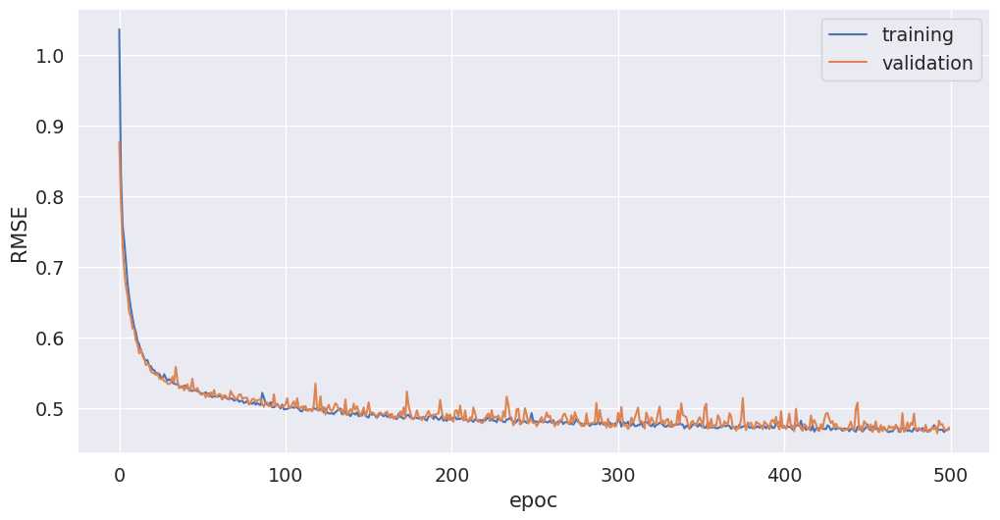

In [65]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("RMSE")
plt.xlabel("epoc")
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.legend()

Vemos que el poder de generalización de esta red es mucho mejor que la anterior (los errores de validation y training no están tan separados y no perdí precisión o accuracy)

## Clasificación

Primero un ejemplo de clasificación binaria y después uno de clasificación con n clases

In [66]:
header = [
    "pelvic incidence",
    "pelvic tilt",
    "lumbar lordosis angle",
    "sacral slope",
    "pelvic radius",
    "grade of spondylolisthesis",
    "class",
]

In [67]:
header

['pelvic incidence',
 'pelvic tilt',
 'lumbar lordosis angle',
 'sacral slope',
 'pelvic radius',
 'grade of spondylolisthesis',
 'class']

In [68]:
data = pd.read_csv(
    "https://drive.google.com/uc?export=download&id=1T9VNcGMatXFrg7JpIkwHpqHrb8dGKvtP",
    names=header,
    index_col=False,
)
data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis,class
0,63.03,22.55,39.61,40.48,98.67,-0.25,AB
1,39.06,10.06,25.02,29.00,114.41,4.56,AB
2,68.83,22.22,50.09,46.61,105.99,-3.53,AB
3,69.30,24.65,44.31,44.64,101.87,11.21,AB
4,49.71,9.65,28.32,40.06,108.17,7.92,AB


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


array([[<AxesSubplot:title={'center':'pelvic incidence'}>,
        <AxesSubplot:title={'center':'pelvic tilt'}>],
       [<AxesSubplot:title={'center':'lumbar lordosis angle'}>,
        <AxesSubplot:title={'center':'sacral slope'}>],
       [<AxesSubplot:title={'center':'pelvic radius'}>,
        <AxesSubplot:title={'center':'grade of spondylolisthesis'}>]],
      dtype=object)

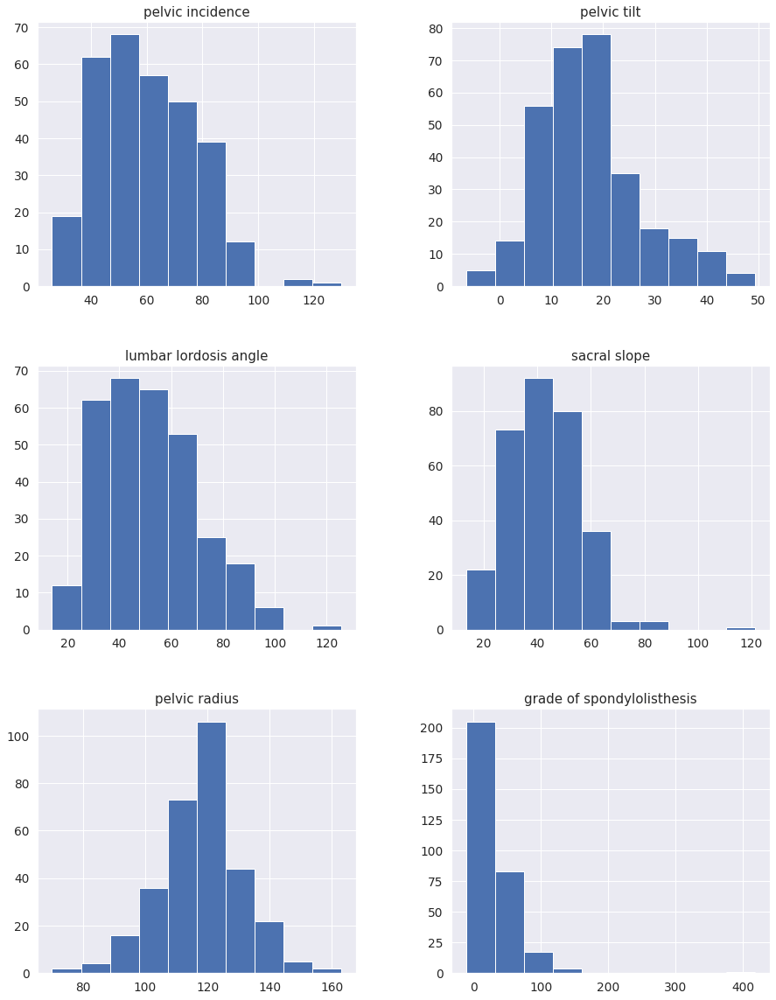

In [69]:
fig = plt.figure(figsize=(15, 20))
ax = fig.gca()

data.hist(ax=ax)

Los datasets no están tan mal distribuídos así que elijo no normalizarlos

Paso los valores de "AB" y "NO" a valores categóricos

In [70]:
label_encoder = preprocessing.LabelEncoder()

In [71]:
target = np.unique(data["class"])

In [72]:
label_encoder.fit(target)

LabelEncoder()

In [73]:
data["class"] = label_encoder.transform(data["class"])

In [74]:
data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis,class
0,63.03,22.55,39.61,40.48,98.67,-0.25,0
1,39.06,10.06,25.02,29.00,114.41,4.56,0
2,68.83,22.22,50.09,46.61,105.99,-3.53,0
3,69.30,24.65,44.31,44.64,101.87,11.21,0
4,49.71,9.65,28.32,40.06,108.17,7.92,0


In [75]:
x_columns = [
    "pelvic incidence",
    "pelvic tilt",
    "lumbar lordosis angle",
    "sacral slope",
    "pelvic radius",
    "grade of spondylolisthesis",
]
x_data = data[x_columns]
y_data = data['class']

In [76]:
x_data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis
0,63.03,22.55,39.61,40.48,98.67,-0.25
1,39.06,10.06,25.02,29.00,114.41,4.56
2,68.83,22.22,50.09,46.61,105.99,-3.53
3,69.30,24.65,44.31,44.64,101.87,11.21
4,49.71,9.65,28.32,40.06,108.17,7.92


Separo los datos en train y validation

In [77]:
from sklearn.model_selection import train_test_split

X_train, X_validation, y_train, y_validation = train_test_split(
    x_data, y_data, test_size=0.4, random_state=66
)

Entreno un modelo sencillo de clasificación, un árbol de decisión para tener una referencia de error.

In [78]:
from sklearn.tree import DecisionTreeClassifier

In [79]:
model_tree = DecisionTreeClassifier(criterion="entropy")

In [80]:
model_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

Calculo el accuracy de mi árbol entrenado:

In [81]:
from sklearn.metrics import accuracy_score

In [82]:
pred = model_tree.predict(X_validation)

In [83]:
decision_tree_acc = accuracy_score(pred, y_validation)
decision_tree_acc

0.7903225806451613

Mi red tiene que tener como cantidad de neuronas en la capa de salida la cantidad de clases si uso softmax o 1 neurona para el caso que use una activación de tipo sigmoide

In [84]:
num_classes = 2

In [85]:
model = Sequential()
model.add(Dense(8, input_shape=(6,), activation='tanh'))
model.add(Dense(num_classes, activation="softmax"))

In [86]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 8)                 56        
_________________________________________________________________
dense_27 (Dense)             (None, 2)                 18        
Total params: 74
Trainable params: 74
Non-trainable params: 0
_________________________________________________________________


El modelo necesita los labels en one hot encoding, uso la función to_categorical para transformarlos

In [87]:
y_train[1:10]

235    1
66     0
143    0
256    1
18     0
279    1
273    1
120    0
154    0
Name: class, dtype: int64

In [88]:
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_validation, num_classes)

In [89]:
y_train[1:10]

array([[0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.]], dtype=float32)

Ahora si puedo entrenar!

In [90]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.4290 - accuracy: 0.2188

186/186 [==============================] - 0s 599us/step - loss: 3.0892 - accuracy: 0.2957 - val_loss: 2.6926 - val_accuracy: 0.3629


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.7340 - accuracy: 0.3438

186/186 [==============================] - 0s 74us/step - loss: 3.0084 - accuracy: 0.2957 - val_loss: 2.6246 - val_accuracy: 0.3629


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.9448 - accuracy: 0.3125

186/186 [==============================] - 0s 81us/step - loss: 2.9063 - accuracy: 0.2957 - val_loss: 2.5266 - val_accuracy: 0.3629


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.7636 - accuracy: 0.3125

186/186 [==============================] - 0s 73us/step - loss: 2.7896 - accuracy: 0.2957 - val_loss: 2.4195 - val_accuracy: 0.3629


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.0163 - accuracy: 0.2188

186/186 [==============================] - 0s 70us/step - loss: 2.6552 - accuracy: 0.2957 - val_loss: 2.2998 - val_accuracy: 0.3629


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.7807 - accuracy: 0.2500

186/186 [==============================] - 0s 67us/step - loss: 2.4922 - accuracy: 0.2957 - val_loss: 2.1757 - val_accuracy: 0.3629


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.7891 - accuracy: 0.1875

186/186 [==============================] - 0s 71us/step - loss: 2.3596 - accuracy: 0.2957 - val_loss: 2.0726 - val_accuracy: 0.3629


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.3329 - accuracy: 0.2812

186/186 [==============================] - 0s 65us/step - loss: 2.2794 - accuracy: 0.2957 - val_loss: 1.9865 - val_accuracy: 0.3629


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.1571 - accuracy: 0.3125

186/186 [==============================] - 0s 79us/step - loss: 2.1749 - accuracy: 0.2957 - val_loss: 1.8969 - val_accuracy: 0.3629


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.3504 - accuracy: 0.2500

186/186 [==============================] - 0s 70us/step - loss: 2.0690 - accuracy: 0.3011 - val_loss: 1.8070 - val_accuracy: 0.3629


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.0421 - accuracy: 0.3438

186/186 [==============================] - 0s 59us/step - loss: 1.9792 - accuracy: 0.3011 - val_loss: 1.7150 - val_accuracy: 0.3629


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.2426 - accuracy: 0.1875

186/186 [==============================] - 0s 58us/step - loss: 1.8695 - accuracy: 0.3011 - val_loss: 1.6161 - val_accuracy: 0.3629


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.0623 - accuracy: 0.1875

186/186 [==============================] - 0s 59us/step - loss: 1.7614 - accuracy: 0.3011 - val_loss: 1.5306 - val_accuracy: 0.3629


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8020 - accuracy: 0.2812

186/186 [==============================] - 0s 61us/step - loss: 1.6511 - accuracy: 0.3011 - val_loss: 1.4550 - val_accuracy: 0.3629


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3592 - accuracy: 0.4062

186/186 [==============================] - 0s 68us/step - loss: 1.5550 - accuracy: 0.3011 - val_loss: 1.3907 - val_accuracy: 0.3629


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.5325 - accuracy: 0.3125

186/186 [==============================] - 0s 69us/step - loss: 1.4626 - accuracy: 0.3011 - val_loss: 1.3222 - val_accuracy: 0.3629


Epoch 17/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.2000 - accuracy: 0.4062

186/186 [==============================] - 0s 70us/step - loss: 1.3710 - accuracy: 0.3011 - val_loss: 1.2483 - val_accuracy: 0.3629


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.6367 - accuracy: 0.1562

186/186 [==============================] - 0s 60us/step - loss: 1.3007 - accuracy: 0.3011 - val_loss: 1.1899 - val_accuracy: 0.3629


Epoch 19/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.2988 - accuracy: 0.2812

186/186 [==============================] - 0s 66us/step - loss: 1.2317 - accuracy: 0.3011 - val_loss: 1.1399 - val_accuracy: 0.3629


Epoch 20/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.0354 - accuracy: 0.3750

186/186 [==============================] - 0s 64us/step - loss: 1.1758 - accuracy: 0.3011 - val_loss: 1.0916 - val_accuracy: 0.3629


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2456 - accuracy: 0.2500

186/186 [==============================] - 0s 57us/step - loss: 1.1199 - accuracy: 0.3011 - val_loss: 1.0468 - val_accuracy: 0.3629


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1826 - accuracy: 0.2812

186/186 [==============================] - 0s 63us/step - loss: 1.0711 - accuracy: 0.3011 - val_loss: 1.0068 - val_accuracy: 0.3629


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0840 - accuracy: 0.3125

186/186 [==============================] - 0s 58us/step - loss: 1.0277 - accuracy: 0.3011 - val_loss: 0.9700 - val_accuracy: 0.3629


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8485 - accuracy: 0.3750

186/186 [==============================] - 0s 62us/step - loss: 0.9813 - accuracy: 0.3011 - val_loss: 0.9370 - val_accuracy: 0.3629


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9858 - accuracy: 0.2188

186/186 [==============================] - 0s 60us/step - loss: 0.9392 - accuracy: 0.3011 - val_loss: 0.9052 - val_accuracy: 0.3629


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8957 - accuracy: 0.3438

186/186 [==============================] - 0s 57us/step - loss: 0.9009 - accuracy: 0.3011 - val_loss: 0.8750 - val_accuracy: 0.3629


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7518 - accuracy: 0.4375

186/186 [==============================] - 0s 56us/step - loss: 0.8655 - accuracy: 0.3011 - val_loss: 0.8465 - val_accuracy: 0.3629


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7653 - accuracy: 0.3750

186/186 [==============================] - 0s 59us/step - loss: 0.8348 - accuracy: 0.3011 - val_loss: 0.8194 - val_accuracy: 0.3629


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7824 - accuracy: 0.3750

186/186 [==============================] - 0s 57us/step - loss: 0.8062 - accuracy: 0.3011 - val_loss: 0.7931 - val_accuracy: 0.3629


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9957 - accuracy: 0.1875

186/186 [==============================] - 0s 59us/step - loss: 0.7803 - accuracy: 0.3011 - val_loss: 0.7689 - val_accuracy: 0.3629


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6810 - accuracy: 0.4688

186/186 [==============================] - 0s 62us/step - loss: 0.7545 - accuracy: 0.3011 - val_loss: 0.7479 - val_accuracy: 0.3629


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6910 - accuracy: 0.3750

186/186 [==============================] - 0s 60us/step - loss: 0.7313 - accuracy: 0.3817 - val_loss: 0.7291 - val_accuracy: 0.6935


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6715 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.7107 - accuracy: 0.7527 - val_loss: 0.7122 - val_accuracy: 0.7097


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6810 - accuracy: 0.7500

186/186 [==============================] - 0s 56us/step - loss: 0.6893 - accuracy: 0.7581 - val_loss: 0.6974 - val_accuracy: 0.7097


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5921 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.6694 - accuracy: 0.7581 - val_loss: 0.6842 - val_accuracy: 0.6855


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6568 - accuracy: 0.7500

186/186 [==============================] - 0s 58us/step - loss: 0.6499 - accuracy: 0.7634 - val_loss: 0.6719 - val_accuracy: 0.6935


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6198 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.6335 - accuracy: 0.7634 - val_loss: 0.6598 - val_accuracy: 0.6935


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6866 - accuracy: 0.6562

186/186 [==============================] - 0s 58us/step - loss: 0.6176 - accuracy: 0.7742 - val_loss: 0.6486 - val_accuracy: 0.7016


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5511 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.6019 - accuracy: 0.7796 - val_loss: 0.6396 - val_accuracy: 0.6935


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5232 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.5872 - accuracy: 0.7957 - val_loss: 0.6313 - val_accuracy: 0.6935


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5851 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.5744 - accuracy: 0.7957 - val_loss: 0.6231 - val_accuracy: 0.6935


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5745 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.5640 - accuracy: 0.7957 - val_loss: 0.6151 - val_accuracy: 0.7016


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5635 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5539 - accuracy: 0.8011 - val_loss: 0.6083 - val_accuracy: 0.7016


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5447 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.5443 - accuracy: 0.8011 - val_loss: 0.6032 - val_accuracy: 0.6935


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5255 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.5365 - accuracy: 0.8065 - val_loss: 0.5990 - val_accuracy: 0.7016


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5794 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.5304 - accuracy: 0.8065 - val_loss: 0.5954 - val_accuracy: 0.6935


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5776 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5241 - accuracy: 0.8065 - val_loss: 0.5923 - val_accuracy: 0.6935


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5077 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5184 - accuracy: 0.7957 - val_loss: 0.5891 - val_accuracy: 0.6855


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5730 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.5134 - accuracy: 0.8065 - val_loss: 0.5863 - val_accuracy: 0.6855


Epoch 50/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5515 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5092 - accuracy: 0.8011 - val_loss: 0.5841 - val_accuracy: 0.6855


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4847 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.5049 - accuracy: 0.8065 - val_loss: 0.5788 - val_accuracy: 0.6855


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5519 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.5003 - accuracy: 0.8118 - val_loss: 0.5758 - val_accuracy: 0.6935


Epoch 53/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5075 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4963 - accuracy: 0.8172 - val_loss: 0.5731 - val_accuracy: 0.6935


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5006 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.4930 - accuracy: 0.8172 - val_loss: 0.5712 - val_accuracy: 0.6935


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4923 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.4902 - accuracy: 0.8118 - val_loss: 0.5702 - val_accuracy: 0.6935


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4872 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.4863 - accuracy: 0.8172 - val_loss: 0.5683 - val_accuracy: 0.6935


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4363 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.4840 - accuracy: 0.8172 - val_loss: 0.5658 - val_accuracy: 0.6935


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4462 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4807 - accuracy: 0.8172 - val_loss: 0.5640 - val_accuracy: 0.6935


Epoch 59/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4712 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4782 - accuracy: 0.8172 - val_loss: 0.5616 - val_accuracy: 0.6935


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5127 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.4759 - accuracy: 0.8172 - val_loss: 0.5604 - val_accuracy: 0.6935


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4965 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.4736 - accuracy: 0.8172 - val_loss: 0.5605 - val_accuracy: 0.6935


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4278 - accuracy: 0.8750

186/186 [==============================] - 0s 54us/step - loss: 0.4714 - accuracy: 0.8172 - val_loss: 0.5591 - val_accuracy: 0.6935


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4226 - accuracy: 0.8125

186/186 [==============================] - 0s 55us/step - loss: 0.4697 - accuracy: 0.8172 - val_loss: 0.5587 - val_accuracy: 0.6935


Epoch 64/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4631 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4674 - accuracy: 0.8172 - val_loss: 0.5576 - val_accuracy: 0.6935


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4504 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.4655 - accuracy: 0.8172 - val_loss: 0.5547 - val_accuracy: 0.6935


Epoch 66/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3923 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4639 - accuracy: 0.8172 - val_loss: 0.5525 - val_accuracy: 0.6935


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4152 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4622 - accuracy: 0.8172 - val_loss: 0.5517 - val_accuracy: 0.6935


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4783 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4604 - accuracy: 0.8226 - val_loss: 0.5507 - val_accuracy: 0.6935


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3900 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.4592 - accuracy: 0.8226 - val_loss: 0.5498 - val_accuracy: 0.6935


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3376 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.4578 - accuracy: 0.8172 - val_loss: 0.5504 - val_accuracy: 0.6935


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4747 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.4561 - accuracy: 0.8172 - val_loss: 0.5500 - val_accuracy: 0.6935


Epoch 72/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5407 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4548 - accuracy: 0.8172 - val_loss: 0.5495 - val_accuracy: 0.6935


Epoch 73/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4581 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4536 - accuracy: 0.8172 - val_loss: 0.5489 - val_accuracy: 0.6935


Epoch 74/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4177 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4525 - accuracy: 0.8172 - val_loss: 0.5479 - val_accuracy: 0.6935


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5247 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4510 - accuracy: 0.8172 - val_loss: 0.5486 - val_accuracy: 0.6935


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3582 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.4504 - accuracy: 0.8172 - val_loss: 0.5488 - val_accuracy: 0.6855


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4656 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4489 - accuracy: 0.8172 - val_loss: 0.5463 - val_accuracy: 0.6935


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4205 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4475 - accuracy: 0.8172 - val_loss: 0.5454 - val_accuracy: 0.6935


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5179 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.4470 - accuracy: 0.8172 - val_loss: 0.5460 - val_accuracy: 0.6935


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4785 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4453 - accuracy: 0.8172 - val_loss: 0.5444 - val_accuracy: 0.6935


Epoch 81/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4509 - accuracy: 0.8125



186/186 [==============================] - 0s 62us/step - loss: 0.4447 - accuracy: 0.8226 - val_loss: 0.5426 - val_accuracy: 0.6935


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4414 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4434 - accuracy: 0.8226 - val_loss: 0.5428 - val_accuracy: 0.6935


Epoch 83/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5222 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.4428 - accuracy: 0.8226 - val_loss: 0.5423 - val_accuracy: 0.6935


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4385 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4415 - accuracy: 0.8226 - val_loss: 0.5434 - val_accuracy: 0.6935


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4683 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.4406 - accuracy: 0.8172 - val_loss: 0.5433 - val_accuracy: 0.6935


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3621 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.4399 - accuracy: 0.8172 - val_loss: 0.5428 - val_accuracy: 0.6935


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4024 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4389 - accuracy: 0.8226 - val_loss: 0.5407 - val_accuracy: 0.6935


Epoch 88/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4511 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.4380 - accuracy: 0.8226 - val_loss: 0.5400 - val_accuracy: 0.6935


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4049 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.4372 - accuracy: 0.8226 - val_loss: 0.5404 - val_accuracy: 0.6935


Epoch 90/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3856 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4363 - accuracy: 0.8226 - val_loss: 0.5399 - val_accuracy: 0.6935


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5027 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4361 - accuracy: 0.8226 - val_loss: 0.5386 - val_accuracy: 0.6935


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3394 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.4355 - accuracy: 0.8226 - val_loss: 0.5406 - val_accuracy: 0.6935


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4617 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4350 - accuracy: 0.8172 - val_loss: 0.5419 - val_accuracy: 0.6935


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4424 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.4334 - accuracy: 0.8226 - val_loss: 0.5396 - val_accuracy: 0.6935


Epoch 95/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4871 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.4325 - accuracy: 0.8226 - val_loss: 0.5382 - val_accuracy: 0.6935


Epoch 96/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.4321 - accuracy: 0.8226 - val_loss: 0.5377 - val_accuracy: 0.6935


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4369 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.4313 - accuracy: 0.8226 - val_loss: 0.5371 - val_accuracy: 0.6935


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3826 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.4310 - accuracy: 0.8226 - val_loss: 0.5383 - val_accuracy: 0.6935


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5207 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4304 - accuracy: 0.8226 - val_loss: 0.5395 - val_accuracy: 0.6935


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4278 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.4299 - accuracy: 0.8226 - val_loss: 0.5368 - val_accuracy: 0.6935


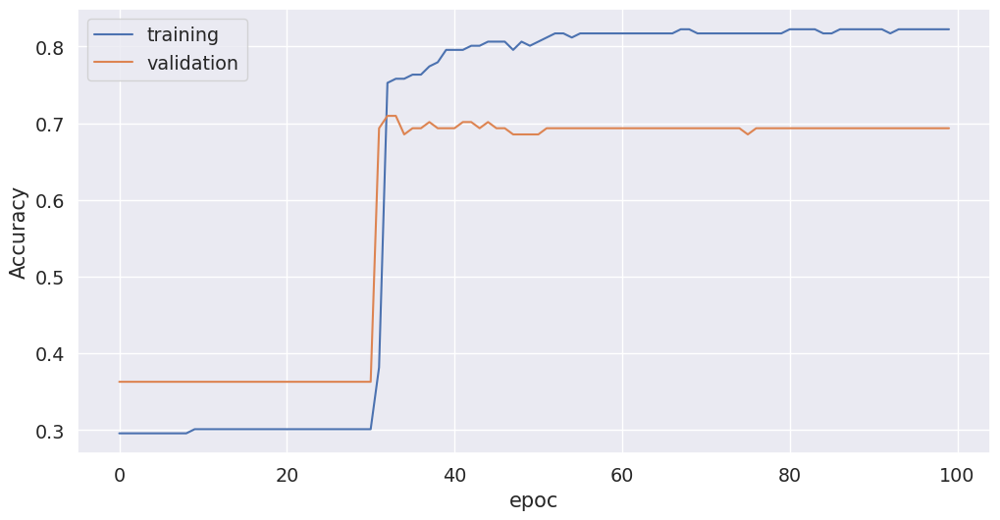

In [91]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

A medida que las red se va haciendo más profunda conviene usar relu. Agrego relu + regularizacion y cambio optimizador

In [92]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu'))
model.add(Dense(num_classes, activation="softmax"))

In [93]:
model.compile(
    loss='categorical_crossentropy', optimizer='adadelta', metrics=['accuracy']
)
model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_28 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_29 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_4 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_30 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_31 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [94]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 8.1126 - accuracy: 0.4688

186/186 [==============================] - 0s 1ms/step - loss: 7.4861 - accuracy: 0.5484 - val_loss: 5.1803 - val_accuracy: 0.6371


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 9.0180 - accuracy: 0.4062

186/186 [==============================] - 0s 75us/step - loss: 7.4510 - accuracy: 0.4839 - val_loss: 3.9795 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 7.3841 - accuracy: 0.5312

186/186 [==============================] - 0s 75us/step - loss: 6.1318 - accuracy: 0.5000 - val_loss: 3.1231 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 6.9491 - accuracy: 0.5312

186/186 [==============================] - 0s 69us/step - loss: 4.8581 - accuracy: 0.4839 - val_loss: 2.3209 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.4256 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 4.2935 - accuracy: 0.4570 - val_loss: 1.6431 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.1105 - accuracy: 0.5000

186/186 [==============================] - 0s 70us/step - loss: 3.3988 - accuracy: 0.5108 - val_loss: 1.2371 - val_accuracy: 0.6452


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.6746 - accuracy: 0.5312

186/186 [==============================] - 0s 68us/step - loss: 2.7068 - accuracy: 0.5538 - val_loss: 1.0141 - val_accuracy: 0.6371


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8057 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 2.9867 - accuracy: 0.6183 - val_loss: 0.8352 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.1297 - accuracy: 0.5312

186/186 [==============================] - 0s 64us/step - loss: 2.0851 - accuracy: 0.5914 - val_loss: 0.7315 - val_accuracy: 0.6371


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2684 - accuracy: 0.6250

186/186 [==============================] - 0s 74us/step - loss: 1.7980 - accuracy: 0.6075 - val_loss: 0.6782 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.7491 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 1.5061 - accuracy: 0.6452 - val_loss: 0.6657 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2763 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 1.5124 - accuracy: 0.6613 - val_loss: 0.6485 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.0730 - accuracy: 0.5938

186/186 [==============================] - 0s 74us/step - loss: 1.6982 - accuracy: 0.6935 - val_loss: 0.6481 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0904 - accuracy: 0.6875



186/186 [==============================] - 0s 76us/step - loss: 1.7377 - accuracy: 0.6129 - val_loss: 0.6421 - val_accuracy: 0.6371


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.7844 - accuracy: 0.5625

186/186 [==============================] - 0s 66us/step - loss: 1.7668 - accuracy: 0.6075 - val_loss: 0.6446 - val_accuracy: 0.6371


Epoch 16/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8217 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 1.5103 - accuracy: 0.7258 - val_loss: 0.7133 - val_accuracy: 0.3790


Epoch 17/100


 32/186 [====>.........................] - ETA: 0s - loss: 2.0631 - accuracy: 0.4688

186/186 [==============================] - 0s 80us/step - loss: 1.3116 - accuracy: 0.6183 - val_loss: 0.6507 - val_accuracy: 0.6371


Epoch 18/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.5634 - accuracy: 0.5625

186/186 [==============================] - 0s 78us/step - loss: 1.3355 - accuracy: 0.6613 - val_loss: 0.6624 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1841 - accuracy: 0.6250



186/186 [==============================] - 0s 70us/step - loss: 1.4105 - accuracy: 0.6398 - val_loss: 0.6616 - val_accuracy: 0.6371


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.6031 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.9252 - accuracy: 0.6720 - val_loss: 0.6493 - val_accuracy: 0.6371


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8031 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.9609 - accuracy: 0.6774 - val_loss: 0.6720 - val_accuracy: 0.6371


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9851 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 1.0416 - accuracy: 0.6667 - val_loss: 0.6540 - val_accuracy: 0.6371


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.9159 - accuracy: 0.4688

186/186 [==============================] - 0s 65us/step - loss: 1.1200 - accuracy: 0.6774 - val_loss: 0.6497 - val_accuracy: 0.6371


Epoch 24/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.2225 - accuracy: 0.5625

186/186 [==============================] - 0s 74us/step - loss: 1.2604 - accuracy: 0.6559 - val_loss: 0.6505 - val_accuracy: 0.6371


Epoch 25/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.9336 - accuracy: 0.6250

186/186 [==============================] - 0s 88us/step - loss: 1.1152 - accuracy: 0.6720 - val_loss: 0.6560 - val_accuracy: 0.6371


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3419 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.8654 - accuracy: 0.6935 - val_loss: 0.6515 - val_accuracy: 0.6371


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0071 - accuracy: 0.5312

186/186 [==============================] - 0s 76us/step - loss: 0.9157 - accuracy: 0.6344 - val_loss: 0.6497 - val_accuracy: 0.6371


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4783 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.7045 - accuracy: 0.7151 - val_loss: 0.6504 - val_accuracy: 0.6371


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9638 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 0.7177 - accuracy: 0.6882 - val_loss: 0.6522 - val_accuracy: 0.6371


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8689 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.9415 - accuracy: 0.6935 - val_loss: 0.6533 - val_accuracy: 0.6371


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6783 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.8156 - accuracy: 0.6613 - val_loss: 0.6705 - val_accuracy: 0.6371


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3267 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.8784 - accuracy: 0.7097 - val_loss: 0.6648 - val_accuracy: 0.6371


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8605 - accuracy: 0.5938

186/186 [==============================] - 0s 75us/step - loss: 0.8959 - accuracy: 0.6774 - val_loss: 0.6514 - val_accuracy: 0.6371


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9949 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.8974 - accuracy: 0.6559 - val_loss: 0.6503 - val_accuracy: 0.6371


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7293 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.7827 - accuracy: 0.6935 - val_loss: 0.6541 - val_accuracy: 0.6371


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1109 - accuracy: 0.5312

186/186 [==============================] - 0s 77us/step - loss: 0.9209 - accuracy: 0.7043 - val_loss: 0.6710 - val_accuracy: 0.6371


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6347 - accuracy: 0.7188

186/186 [==============================] - 0s 82us/step - loss: 0.7042 - accuracy: 0.6935 - val_loss: 0.6503 - val_accuracy: 0.6371


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6941 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.9767 - accuracy: 0.6882 - val_loss: 0.6502 - val_accuracy: 0.6371


Epoch 39/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7352 - accuracy: 0.7812

186/186 [==============================] - 0s 88us/step - loss: 0.7683 - accuracy: 0.6882 - val_loss: 0.6499 - val_accuracy: 0.6371


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6164 - accuracy: 0.6562

186/186 [==============================] - 0s 77us/step - loss: 0.8218 - accuracy: 0.6774 - val_loss: 0.6500 - val_accuracy: 0.6371


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8846 - accuracy: 0.6875

186/186 [==============================] - 0s 78us/step - loss: 0.8936 - accuracy: 0.6667 - val_loss: 0.6653 - val_accuracy: 0.6371


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5672 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.6390 - accuracy: 0.7204 - val_loss: 0.6498 - val_accuracy: 0.6371


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6238 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.7017 - accuracy: 0.6935 - val_loss: 0.6673 - val_accuracy: 0.6371


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5750 - accuracy: 0.6562

186/186 [==============================] - 0s 78us/step - loss: 0.7401 - accuracy: 0.6774 - val_loss: 0.6502 - val_accuracy: 0.6371


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9212 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.8391 - accuracy: 0.6774 - val_loss: 0.6522 - val_accuracy: 0.6371


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4381 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.6505 - accuracy: 0.6882 - val_loss: 0.6503 - val_accuracy: 0.6371


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2667 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 0.8385 - accuracy: 0.6774 - val_loss: 0.6506 - val_accuracy: 0.6371


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4103 - accuracy: 0.5312

186/186 [==============================] - 0s 72us/step - loss: 0.7348 - accuracy: 0.7097 - val_loss: 0.6510 - val_accuracy: 0.6371


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5750 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.6555 - accuracy: 0.7043 - val_loss: 0.6540 - val_accuracy: 0.6371


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6638 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.6450 - accuracy: 0.6989 - val_loss: 0.6639 - val_accuracy: 0.6371


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2495 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.7776 - accuracy: 0.7043 - val_loss: 0.6665 - val_accuracy: 0.6371


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6693 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.6453 - accuracy: 0.7043 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7062 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.7183 - accuracy: 0.7151 - val_loss: 0.6517 - val_accuracy: 0.6371


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6563 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.6742 - accuracy: 0.7043 - val_loss: 0.6584 - val_accuracy: 0.6371


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7163 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.6352 - accuracy: 0.7204 - val_loss: 0.6529 - val_accuracy: 0.6371


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8814 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.6473 - accuracy: 0.6989 - val_loss: 0.6504 - val_accuracy: 0.6371


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5675 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.6068 - accuracy: 0.7043 - val_loss: 0.6529 - val_accuracy: 0.6371


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7718 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6678 - accuracy: 0.6989 - val_loss: 0.6516 - val_accuracy: 0.6371


Epoch 59/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5862 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.6390 - accuracy: 0.7043 - val_loss: 0.6539 - val_accuracy: 0.6371


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7417 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.7215 - accuracy: 0.6828 - val_loss: 0.6555 - val_accuracy: 0.6371


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6206 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.6613 - accuracy: 0.6882 - val_loss: 0.6523 - val_accuracy: 0.6371


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5380 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.6704 - accuracy: 0.7043 - val_loss: 0.6512 - val_accuracy: 0.6371


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7615 - accuracy: 0.6562

186/186 [==============================] - 0s 92us/step - loss: 0.6972 - accuracy: 0.6935 - val_loss: 0.6513 - val_accuracy: 0.6371


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9664 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.7128 - accuracy: 0.7043 - val_loss: 0.6510 - val_accuracy: 0.6371


Epoch 65/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5411 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.6078 - accuracy: 0.7043 - val_loss: 0.6522 - val_accuracy: 0.6371


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5326 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.6555 - accuracy: 0.6828 - val_loss: 0.6519 - val_accuracy: 0.6371


Epoch 67/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5376 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.6401 - accuracy: 0.6882 - val_loss: 0.6581 - val_accuracy: 0.6371


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5130 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.6411 - accuracy: 0.6882 - val_loss: 0.6635 - val_accuracy: 0.6371


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5696 - accuracy: 0.7500

186/186 [==============================] - 0s 92us/step - loss: 0.6365 - accuracy: 0.7097 - val_loss: 0.6510 - val_accuracy: 0.6371


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5271 - accuracy: 0.8125

186/186 [==============================] - 0s 94us/step - loss: 0.6389 - accuracy: 0.6989 - val_loss: 0.6508 - val_accuracy: 0.6371


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6064 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.6681 - accuracy: 0.7204 - val_loss: 0.6522 - val_accuracy: 0.6371


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5998 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.6869 - accuracy: 0.6935 - val_loss: 0.6547 - val_accuracy: 0.6371


Epoch 73/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5733 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.5924 - accuracy: 0.7097 - val_loss: 0.6505 - val_accuracy: 0.6371


Epoch 74/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5790 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.6196 - accuracy: 0.6935 - val_loss: 0.6509 - val_accuracy: 0.6371


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5757 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.5857 - accuracy: 0.6989 - val_loss: 0.6622 - val_accuracy: 0.6371


Epoch 76/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5504 - accuracy: 0.7500

186/186 [==============================] - 0s 80us/step - loss: 0.6239 - accuracy: 0.6989 - val_loss: 0.6556 - val_accuracy: 0.6371


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5593 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.6020 - accuracy: 0.6989 - val_loss: 0.6502 - val_accuracy: 0.6371


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5233 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.6066 - accuracy: 0.7043 - val_loss: 0.6525 - val_accuracy: 0.6371


Epoch 79/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5770 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.6158 - accuracy: 0.6989 - val_loss: 0.6532 - val_accuracy: 0.6371


Epoch 80/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7205 - accuracy: 0.6562

186/186 [==============================] - 0s 89us/step - loss: 0.6172 - accuracy: 0.6989 - val_loss: 0.6505 - val_accuracy: 0.6371


Epoch 81/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6290 - accuracy: 0.6562

186/186 [==============================] - 0s 91us/step - loss: 0.7189 - accuracy: 0.6935 - val_loss: 0.6522 - val_accuracy: 0.6371


Epoch 82/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6840 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.6216 - accuracy: 0.7043 - val_loss: 0.6503 - val_accuracy: 0.6371


Epoch 83/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7207 - accuracy: 0.5625

186/186 [==============================] - 0s 71us/step - loss: 0.5872 - accuracy: 0.7043 - val_loss: 0.6514 - val_accuracy: 0.6371


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4786 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.6120 - accuracy: 0.7097 - val_loss: 0.6515 - val_accuracy: 0.6371


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5251 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.5864 - accuracy: 0.6989 - val_loss: 0.6526 - val_accuracy: 0.6371


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5787 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 0.5990 - accuracy: 0.7097 - val_loss: 0.6505 - val_accuracy: 0.6371


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7734 - accuracy: 0.7500

186/186 [==============================] - 0s 92us/step - loss: 0.6277 - accuracy: 0.7043 - val_loss: 0.6500 - val_accuracy: 0.6371


Epoch 88/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6525 - accuracy: 0.5938

186/186 [==============================] - 0s 76us/step - loss: 0.5766 - accuracy: 0.7043 - val_loss: 0.6493 - val_accuracy: 0.6371


Epoch 89/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7002 - accuracy: 0.6562

186/186 [==============================] - 0s 79us/step - loss: 0.6142 - accuracy: 0.7043 - val_loss: 0.6665 - val_accuracy: 0.6371


Epoch 90/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3501 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.6067 - accuracy: 0.7097 - val_loss: 0.6507 - val_accuracy: 0.6371


Epoch 91/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5838 - accuracy: 0.6875

186/186 [==============================] - 0s 81us/step - loss: 0.5626 - accuracy: 0.7204 - val_loss: 0.6542 - val_accuracy: 0.6371


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7334 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.6604 - accuracy: 0.7043 - val_loss: 0.6481 - val_accuracy: 0.6371


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7086 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6126 - accuracy: 0.7043 - val_loss: 0.6469 - val_accuracy: 0.6371


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6764 - accuracy: 0.6562

186/186 [==============================] - 0s 79us/step - loss: 0.6139 - accuracy: 0.6989 - val_loss: 0.6532 - val_accuracy: 0.6371


Epoch 95/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6416 - accuracy: 0.5938

186/186 [==============================] - 0s 84us/step - loss: 0.6068 - accuracy: 0.6989 - val_loss: 0.6501 - val_accuracy: 0.6371


Epoch 96/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4950 - accuracy: 0.7812

186/186 [==============================] - 0s 87us/step - loss: 0.5616 - accuracy: 0.7258 - val_loss: 0.6458 - val_accuracy: 0.6371


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5236 - accuracy: 0.7812

186/186 [==============================] - 0s 211us/step - loss: 0.5824 - accuracy: 0.7097 - val_loss: 0.6446 - val_accuracy: 0.6371


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5708 - accuracy: 0.6875

186/186 [==============================] - 0s 83us/step - loss: 0.6633 - accuracy: 0.6989 - val_loss: 0.6381 - val_accuracy: 0.6371


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6615 - accuracy: 0.6250

186/186 [==============================] - 0s 78us/step - loss: 0.5721 - accuracy: 0.7151 - val_loss: 0.6329 - val_accuracy: 0.6371


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5976 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6651 - accuracy: 0.6882 - val_loss: 0.6242 - val_accuracy: 0.6371


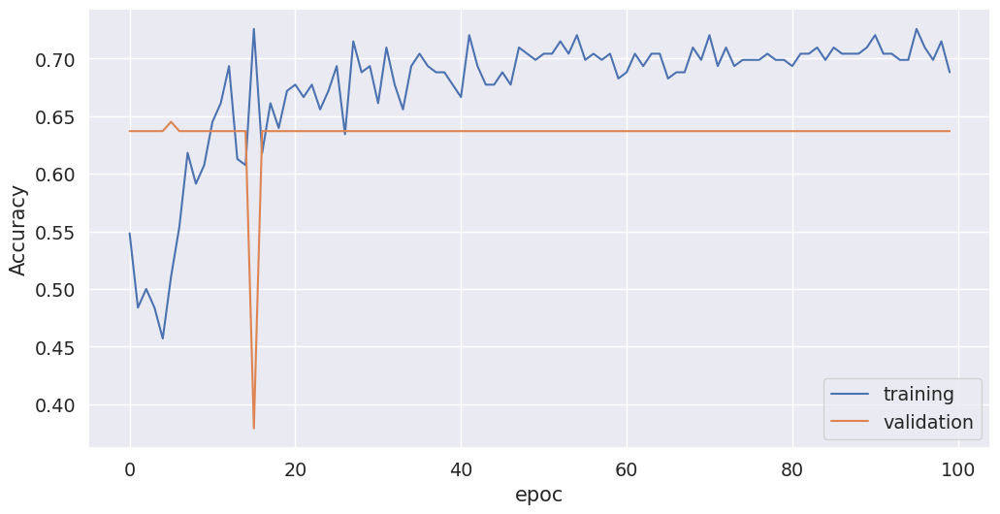

In [95]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Cambio de nuevo el optimizador por RMSprop

In [96]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu'))
model.add(Dense(num_classes, activation="softmax"))

In [97]:
opt = keras.optimizers.RMSprop()
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_5 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_33 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_6 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_34 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_35 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [98]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.1310 - accuracy: 0.7500

186/186 [==============================] - 0s 1ms/step - loss: 3.9984 - accuracy: 0.7151 - val_loss: 2.8368 - val_accuracy: 0.6371


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.9610 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 3.0895 - accuracy: 0.7366 - val_loss: 2.0139 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8083 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 2.2584 - accuracy: 0.7312 - val_loss: 1.4246 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.2358 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 2.1383 - accuracy: 0.6989 - val_loss: 0.9577 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8873 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 1.9860 - accuracy: 0.6882 - val_loss: 0.6954 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.0410 - accuracy: 0.4688

186/186 [==============================] - 0s 79us/step - loss: 1.4296 - accuracy: 0.7043 - val_loss: 0.6394 - val_accuracy: 0.6371


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7807 - accuracy: 0.7188

186/186 [==============================] - 0s 82us/step - loss: 1.1626 - accuracy: 0.6882 - val_loss: 0.5860 - val_accuracy: 0.6452


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.5771 - accuracy: 0.5938

186/186 [==============================] - 0s 74us/step - loss: 1.2394 - accuracy: 0.6989 - val_loss: 0.5662 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2147 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 1.0422 - accuracy: 0.6828 - val_loss: 0.5648 - val_accuracy: 0.6452


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0076 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.9388 - accuracy: 0.6935 - val_loss: 0.5697 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6526 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.8175 - accuracy: 0.7151 - val_loss: 0.5503 - val_accuracy: 0.6452


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2680 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.8419 - accuracy: 0.6935 - val_loss: 0.5475 - val_accuracy: 0.6452


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2099 - accuracy: 0.5625

186/186 [==============================] - 0s 79us/step - loss: 0.8099 - accuracy: 0.7151 - val_loss: 0.5458 - val_accuracy: 0.6452


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7349 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.6793 - accuracy: 0.7097 - val_loss: 0.5425 - val_accuracy: 0.6532


Epoch 15/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4468 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.8148 - accuracy: 0.6398 - val_loss: 0.5335 - val_accuracy: 0.6210


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9727 - accuracy: 0.5625

186/186 [==============================] - 0s 65us/step - loss: 0.6348 - accuracy: 0.7097 - val_loss: 0.5338 - val_accuracy: 0.6613


Epoch 17/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5043 - accuracy: 0.8125

186/186 [==============================] - 0s 89us/step - loss: 0.5702 - accuracy: 0.7258 - val_loss: 0.5304 - val_accuracy: 0.6452


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6400 - accuracy: 0.6562

186/186 [==============================] - 0s 107us/step - loss: 0.6556 - accuracy: 0.6882 - val_loss: 0.5318 - val_accuracy: 0.6452


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5128 - accuracy: 0.7188

186/186 [==============================] - 0s 84us/step - loss: 0.6524 - accuracy: 0.6882 - val_loss: 0.5232 - val_accuracy: 0.6210


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4277 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.5491 - accuracy: 0.7097 - val_loss: 0.5297 - val_accuracy: 0.6210


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4787 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4865 - accuracy: 0.7312 - val_loss: 0.5266 - val_accuracy: 0.6371


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4301 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5552 - accuracy: 0.7688 - val_loss: 0.5362 - val_accuracy: 0.6371


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5884 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.5528 - accuracy: 0.6828 - val_loss: 0.5321 - val_accuracy: 0.6613


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4627 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5042 - accuracy: 0.7258 - val_loss: 0.5288 - val_accuracy: 0.6694


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3891 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5741 - accuracy: 0.7043 - val_loss: 0.5206 - val_accuracy: 0.6613


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3888 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.6109 - accuracy: 0.7527 - val_loss: 0.5125 - val_accuracy: 0.6774


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4322 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4795 - accuracy: 0.7312 - val_loss: 0.5023 - val_accuracy: 0.6774


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6117 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.6546 - accuracy: 0.7204 - val_loss: 0.5062 - val_accuracy: 0.6532


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4935 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.5347 - accuracy: 0.7043 - val_loss: 0.5062 - val_accuracy: 0.6774


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5218 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.4773 - accuracy: 0.6989 - val_loss: 0.5041 - val_accuracy: 0.6774


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5455 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.5201 - accuracy: 0.6882 - val_loss: 0.5089 - val_accuracy: 0.7097


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5342 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.6146 - accuracy: 0.7204 - val_loss: 0.5041 - val_accuracy: 0.6935


Epoch 33/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7460 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.5604 - accuracy: 0.7043 - val_loss: 0.4982 - val_accuracy: 0.6935


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4950 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.5605 - accuracy: 0.7312 - val_loss: 0.4991 - val_accuracy: 0.6935


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5329 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.4612 - accuracy: 0.7151 - val_loss: 0.4932 - val_accuracy: 0.7016


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4870 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.5140 - accuracy: 0.7097 - val_loss: 0.4895 - val_accuracy: 0.7097


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5045 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.4452 - accuracy: 0.7312 - val_loss: 0.4918 - val_accuracy: 0.6855


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4628 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.4859 - accuracy: 0.7849 - val_loss: 0.4964 - val_accuracy: 0.7016


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4382 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.4188 - accuracy: 0.8172 - val_loss: 0.4858 - val_accuracy: 0.6935


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4516 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4396 - accuracy: 0.7742 - val_loss: 0.4830 - val_accuracy: 0.7097


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3769 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4165 - accuracy: 0.8065 - val_loss: 0.4815 - val_accuracy: 0.7097


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4000 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4873 - accuracy: 0.7312 - val_loss: 0.4775 - val_accuracy: 0.7258


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9758 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.5606 - accuracy: 0.7258 - val_loss: 0.4729 - val_accuracy: 0.7258


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5419 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4181 - accuracy: 0.8118 - val_loss: 0.4744 - val_accuracy: 0.7177


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5354 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5385 - accuracy: 0.6828 - val_loss: 0.4778 - val_accuracy: 0.7177


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5572 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.4632 - accuracy: 0.7419 - val_loss: 0.4831 - val_accuracy: 0.7177


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3975 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4555 - accuracy: 0.7151 - val_loss: 0.4809 - val_accuracy: 0.7177


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4628 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.5652 - accuracy: 0.7419 - val_loss: 0.4808 - val_accuracy: 0.7258


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3574 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3964 - accuracy: 0.8118 - val_loss: 0.4740 - val_accuracy: 0.7258


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3759 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.4424 - accuracy: 0.6989 - val_loss: 0.4728 - val_accuracy: 0.7258


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3495 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3691 - accuracy: 0.7957 - val_loss: 0.4677 - val_accuracy: 0.7258


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3978 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4160 - accuracy: 0.7366 - val_loss: 0.4634 - val_accuracy: 0.7258


Epoch 53/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5707 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4446 - accuracy: 0.7688 - val_loss: 0.4666 - val_accuracy: 0.7258


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4352 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4490 - accuracy: 0.7527 - val_loss: 0.4659 - val_accuracy: 0.7258


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2585 - accuracy: 0.9062

186/186 [==============================] - 0s 100us/step - loss: 0.3998 - accuracy: 0.7796 - val_loss: 0.4643 - val_accuracy: 0.7258


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3330 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4733 - accuracy: 0.7581 - val_loss: 0.4633 - val_accuracy: 0.7177


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3432 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.4452 - accuracy: 0.7366 - val_loss: 0.4603 - val_accuracy: 0.7177


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5839 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.4232 - accuracy: 0.7688 - val_loss: 0.4626 - val_accuracy: 0.7177


Epoch 59/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3857 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3868 - accuracy: 0.7957 - val_loss: 0.4612 - val_accuracy: 0.7177


Epoch 60/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5239 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.4203 - accuracy: 0.8065 - val_loss: 0.4630 - val_accuracy: 0.7177


Epoch 61/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3590 - accuracy: 0.7812

186/186 [==============================] - 0s 90us/step - loss: 0.4682 - accuracy: 0.7258 - val_loss: 0.4631 - val_accuracy: 0.7177


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3353 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4294 - accuracy: 0.7366 - val_loss: 0.4638 - val_accuracy: 0.7177


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.4141 - accuracy: 0.7312 - val_loss: 0.4638 - val_accuracy: 0.7177


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4309 - accuracy: 0.7527 - val_loss: 0.4634 - val_accuracy: 0.7258


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3967 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4010 - accuracy: 0.7581 - val_loss: 0.4594 - val_accuracy: 0.7097


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4558 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3821 - accuracy: 0.7903 - val_loss: 0.4597 - val_accuracy: 0.7097


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2998 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4126 - accuracy: 0.7634 - val_loss: 0.4607 - val_accuracy: 0.7258


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3573 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.4120 - accuracy: 0.7849 - val_loss: 0.4588 - val_accuracy: 0.7258


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3774 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4064 - accuracy: 0.7796 - val_loss: 0.4548 - val_accuracy: 0.7258


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4430 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4109 - accuracy: 0.7688 - val_loss: 0.4584 - val_accuracy: 0.7177


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3523 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.4500 - accuracy: 0.8065 - val_loss: 0.4583 - val_accuracy: 0.7258


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4441 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.4037 - accuracy: 0.7957 - val_loss: 0.4608 - val_accuracy: 0.7097


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4057 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3743 - accuracy: 0.7957 - val_loss: 0.4587 - val_accuracy: 0.7097


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4646 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3828 - accuracy: 0.8065 - val_loss: 0.4581 - val_accuracy: 0.7097


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4674 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3942 - accuracy: 0.7849 - val_loss: 0.4588 - val_accuracy: 0.7097


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4542 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.3749 - accuracy: 0.7742 - val_loss: 0.4553 - val_accuracy: 0.7258


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3650 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4175 - accuracy: 0.7366 - val_loss: 0.4545 - val_accuracy: 0.7339


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3025 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3700 - accuracy: 0.8065 - val_loss: 0.4539 - val_accuracy: 0.7258


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4253 - accuracy: 0.7688 - val_loss: 0.4582 - val_accuracy: 0.7258


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3811 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4089 - accuracy: 0.7796 - val_loss: 0.4594 - val_accuracy: 0.7177


Epoch 81/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3357 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3968 - accuracy: 0.7903 - val_loss: 0.4574 - val_accuracy: 0.7097


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2083 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3783 - accuracy: 0.8495 - val_loss: 0.4514 - val_accuracy: 0.7258


Epoch 83/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3621 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3981 - accuracy: 0.8065 - val_loss: 0.4508 - val_accuracy: 0.7500


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3465 - accuracy: 0.8065 - val_loss: 0.4497 - val_accuracy: 0.7500


Epoch 85/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6312 - accuracy: 0.7500

186/186 [==============================] - 0s 94us/step - loss: 0.4349 - accuracy: 0.7581 - val_loss: 0.4507 - val_accuracy: 0.7419


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4444 - accuracy: 0.7500

186/186 [==============================] - 0s 124us/step - loss: 0.3854 - accuracy: 0.7903 - val_loss: 0.4531 - val_accuracy: 0.7339


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4070 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3983 - accuracy: 0.8065 - val_loss: 0.4485 - val_accuracy: 0.7500


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3770 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.3818 - accuracy: 0.7742 - val_loss: 0.4540 - val_accuracy: 0.7419


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3437 - accuracy: 0.7812

186/186 [==============================] - 0s 95us/step - loss: 0.3444 - accuracy: 0.8333 - val_loss: 0.4542 - val_accuracy: 0.7500


Epoch 90/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3584 - accuracy: 0.8172 - val_loss: 0.4566 - val_accuracy: 0.7661


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3955 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3908 - accuracy: 0.8118 - val_loss: 0.4541 - val_accuracy: 0.7419


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2852 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.4208 - accuracy: 0.8011 - val_loss: 0.4548 - val_accuracy: 0.7500


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4071 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4093 - accuracy: 0.7903 - val_loss: 0.4563 - val_accuracy: 0.7500


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2364 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3858 - accuracy: 0.7849 - val_loss: 0.4541 - val_accuracy: 0.7500


Epoch 95/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3697 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3675 - accuracy: 0.8011 - val_loss: 0.4525 - val_accuracy: 0.7339


Epoch 96/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4611 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3550 - accuracy: 0.8011 - val_loss: 0.4514 - val_accuracy: 0.7419


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3548 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3392 - accuracy: 0.8495 - val_loss: 0.4495 - val_accuracy: 0.7581


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2400 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3855 - accuracy: 0.8065 - val_loss: 0.4502 - val_accuracy: 0.7500


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5785 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3539 - accuracy: 0.8280 - val_loss: 0.4501 - val_accuracy: 0.7500


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4091 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3813 - accuracy: 0.8118 - val_loss: 0.4471 - val_accuracy: 0.7500


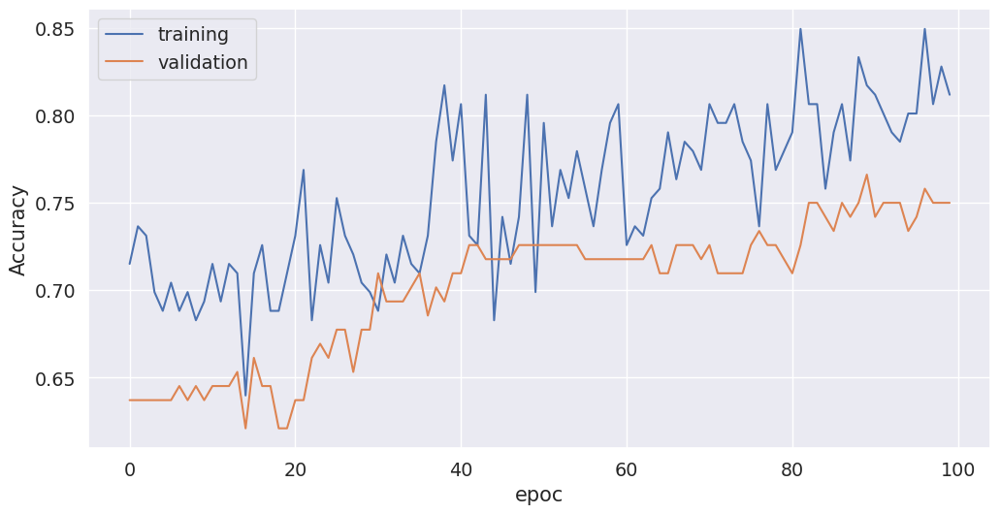

In [99]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Agreguemosle regularización de tipo L2

In [100]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dense(num_classes, activation="softmax"))

In [101]:
opt = keras.optimizers.RMSprop()
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_7 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_37 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_8 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_38 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_39 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [102]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 16.6141 - accuracy: 0.7188

186/186 [==============================] - 0s 1ms/step - loss: 17.0544 - accuracy: 0.6667 - val_loss: 12.8354 - val_accuracy: 0.6371


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 11.0012 - accuracy: 0.6875

186/186 [==============================] - 0s 78us/step - loss: 14.2688 - accuracy: 0.6398 - val_loss: 11.7926 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 21.6083 - accuracy: 0.5000

186/186 [==============================] - 0s 74us/step - loss: 16.4048 - accuracy: 0.5645 - val_loss: 11.5832 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 10.6799 - accuracy: 0.6250

186/186 [==============================] - 0s 80us/step - loss: 11.8221 - accuracy: 0.6505 - val_loss: 10.8146 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 14.3377 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 12.5921 - accuracy: 0.5860 - val_loss: 9.8414 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 5.4149 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 10.8817 - accuracy: 0.6559 - val_loss: 8.6242 - val_accuracy: 0.6371


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 7.7859 - accuracy: 0.7188

186/186 [==============================] - 0s 88us/step - loss: 8.3103 - accuracy: 0.6667 - val_loss: 8.1540 - val_accuracy: 0.6371


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 9.4600 - accuracy: 0.5312

186/186 [==============================] - 0s 73us/step - loss: 9.4295 - accuracy: 0.6075 - val_loss: 7.5456 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 10.6103 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 8.5371 - accuracy: 0.6183 - val_loss: 6.6583 - val_accuracy: 0.6371


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 10.1674 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 7.7763 - accuracy: 0.6398 - val_loss: 5.7019 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.8391 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 6.4671 - accuracy: 0.6183 - val_loss: 4.9391 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 10.1027 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 7.4196 - accuracy: 0.6075 - val_loss: 3.9967 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.8183 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 5.9223 - accuracy: 0.6237 - val_loss: 3.5020 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 6.3668 - accuracy: 0.5312

186/186 [==============================] - 0s 68us/step - loss: 7.0199 - accuracy: 0.5806 - val_loss: 2.9722 - val_accuracy: 0.6371


Epoch 15/100


 32/186 [====>.........................] - ETA: 0s - loss: 3.6282 - accuracy: 0.6250

186/186 [==============================] - 0s 80us/step - loss: 4.6475 - accuracy: 0.6237 - val_loss: 2.3342 - val_accuracy: 0.6371


Epoch 16/100


 32/186 [====>.........................] - ETA: 0s - loss: 5.1290 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 4.5857 - accuracy: 0.6129 - val_loss: 1.7099 - val_accuracy: 0.6371


Epoch 17/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.7679 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 4.0139 - accuracy: 0.6452 - val_loss: 1.4330 - val_accuracy: 0.6371


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.5037 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 3.4461 - accuracy: 0.5860 - val_loss: 0.9551 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 8.8813 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 3.7342 - accuracy: 0.6720 - val_loss: 0.8397 - val_accuracy: 0.6371


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4415 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 3.1879 - accuracy: 0.6505 - val_loss: 0.7347 - val_accuracy: 0.6371


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.5503 - accuracy: 0.4688

186/186 [==============================] - 0s 67us/step - loss: 2.8773 - accuracy: 0.6398 - val_loss: 0.7329 - val_accuracy: 0.6371


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.2676 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 2.2560 - accuracy: 0.6398 - val_loss: 0.7606 - val_accuracy: 0.6371


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8553 - accuracy: 0.5312

186/186 [==============================] - 0s 67us/step - loss: 3.0722 - accuracy: 0.6183 - val_loss: 0.7677 - val_accuracy: 0.6371


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1944 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 1.9442 - accuracy: 0.6935 - val_loss: 0.7457 - val_accuracy: 0.6371


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3032 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 1.8386 - accuracy: 0.6720 - val_loss: 0.7306 - val_accuracy: 0.6371


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4828 - accuracy: 0.6562

186/186 [==============================] - 0s 80us/step - loss: 2.0915 - accuracy: 0.6183 - val_loss: 0.7115 - val_accuracy: 0.6371


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1579 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 2.2297 - accuracy: 0.6559 - val_loss: 0.7353 - val_accuracy: 0.6371


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.7594 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 1.6928 - accuracy: 0.6398 - val_loss: 0.7356 - val_accuracy: 0.7500


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0310 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 2.0915 - accuracy: 0.6129 - val_loss: 0.7351 - val_accuracy: 0.6371


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3881 - accuracy: 0.6250

186/186 [==============================] - 0s 96us/step - loss: 1.3743 - accuracy: 0.6398 - val_loss: 0.7521 - val_accuracy: 0.6371


Epoch 31/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8600 - accuracy: 0.5938

186/186 [==============================] - 0s 90us/step - loss: 1.3426 - accuracy: 0.6613 - val_loss: 0.7537 - val_accuracy: 0.6371


Epoch 32/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.1338 - accuracy: 0.5938

186/186 [==============================] - 0s 107us/step - loss: 1.6177 - accuracy: 0.6720 - val_loss: 0.7556 - val_accuracy: 0.6371


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.5413 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 1.3251 - accuracy: 0.6774 - val_loss: 0.7702 - val_accuracy: 0.7742


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0403 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 1.0056 - accuracy: 0.6989 - val_loss: 0.7802 - val_accuracy: 0.6371


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1191 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 1.3534 - accuracy: 0.6559 - val_loss: 0.7660 - val_accuracy: 0.6290


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2984 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 1.4288 - accuracy: 0.6935 - val_loss: 0.7596 - val_accuracy: 0.7500


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7950 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.8560 - accuracy: 0.6505 - val_loss: 0.7492 - val_accuracy: 0.6371


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8446 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 1.4374 - accuracy: 0.7043 - val_loss: 0.7611 - val_accuracy: 0.7419


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6842 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 1.1483 - accuracy: 0.6774 - val_loss: 0.7491 - val_accuracy: 0.8145


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.5973 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 1.3441 - accuracy: 0.6452 - val_loss: 0.7452 - val_accuracy: 0.6371


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9285 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 1.0790 - accuracy: 0.6774 - val_loss: 0.7499 - val_accuracy: 0.6371


Epoch 42/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8468 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 1.1003 - accuracy: 0.6989 - val_loss: 0.7434 - val_accuracy: 0.6371


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8464 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 1.0915 - accuracy: 0.6667 - val_loss: 0.7341 - val_accuracy: 0.6371


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.5568 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 1.0825 - accuracy: 0.7043 - val_loss: 0.7487 - val_accuracy: 0.6371


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6929 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 1.3805 - accuracy: 0.6828 - val_loss: 0.7437 - val_accuracy: 0.6371


Epoch 46/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8422 - accuracy: 0.6250

186/186 [==============================] - 0s 88us/step - loss: 0.9105 - accuracy: 0.7151 - val_loss: 0.7424 - val_accuracy: 0.6371


Epoch 47/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.5618 - accuracy: 0.4688

186/186 [==============================] - 0s 104us/step - loss: 1.0233 - accuracy: 0.6452 - val_loss: 0.7441 - val_accuracy: 0.6371


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0466 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.9820 - accuracy: 0.6989 - val_loss: 0.7435 - val_accuracy: 0.7742


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6995 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.7925 - accuracy: 0.6667 - val_loss: 0.7390 - val_accuracy: 0.6532


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2461 - accuracy: 0.5312

186/186 [==============================] - 0s 71us/step - loss: 1.0812 - accuracy: 0.6667 - val_loss: 0.7334 - val_accuracy: 0.6371


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6947 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.7333 - accuracy: 0.6720 - val_loss: 0.7287 - val_accuracy: 0.6371


Epoch 52/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9404 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.9021 - accuracy: 0.6559 - val_loss: 0.7276 - val_accuracy: 0.6371


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9416 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.9017 - accuracy: 0.6935 - val_loss: 0.7265 - val_accuracy: 0.6371


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6655 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.7397 - accuracy: 0.7097 - val_loss: 0.7241 - val_accuracy: 0.6371


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6903 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.7001 - accuracy: 0.7151 - val_loss: 0.7072 - val_accuracy: 0.6371


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5826 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.8869 - accuracy: 0.7043 - val_loss: 0.7100 - val_accuracy: 0.7500


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8490 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.7999 - accuracy: 0.7097 - val_loss: 0.6902 - val_accuracy: 0.6371


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5336 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.7578 - accuracy: 0.7366 - val_loss: 0.6826 - val_accuracy: 0.6774


Epoch 59/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7369 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.7700 - accuracy: 0.7043 - val_loss: 0.6898 - val_accuracy: 0.6371


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6697 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.7690 - accuracy: 0.6720 - val_loss: 0.6974 - val_accuracy: 0.7742


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7169 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.7478 - accuracy: 0.7097 - val_loss: 0.6935 - val_accuracy: 0.6371


Epoch 62/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6624 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.9253 - accuracy: 0.7097 - val_loss: 0.6967 - val_accuracy: 0.6371


Epoch 63/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5408 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.7589 - accuracy: 0.6935 - val_loss: 0.6887 - val_accuracy: 0.6371


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6646 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.6740 - accuracy: 0.7258 - val_loss: 0.6760 - val_accuracy: 0.7661


Epoch 65/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6930 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.8355 - accuracy: 0.6828 - val_loss: 0.6758 - val_accuracy: 0.6290


Epoch 66/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9469 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.9264 - accuracy: 0.6828 - val_loss: 0.6756 - val_accuracy: 0.6452


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8252 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.7092 - accuracy: 0.7043 - val_loss: 0.6832 - val_accuracy: 0.6371


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5914 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.7110 - accuracy: 0.7151 - val_loss: 0.6823 - val_accuracy: 0.7742


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7188 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.7478 - accuracy: 0.6935 - val_loss: 0.6770 - val_accuracy: 0.6371


Epoch 70/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6085 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.8033 - accuracy: 0.6774 - val_loss: 0.6750 - val_accuracy: 0.6371


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5676 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.7713 - accuracy: 0.7204 - val_loss: 0.6675 - val_accuracy: 0.7823


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6270 - accuracy: 0.5625

186/186 [==============================] - 0s 77us/step - loss: 0.6940 - accuracy: 0.6989 - val_loss: 0.6725 - val_accuracy: 0.6371


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8969 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.8164 - accuracy: 0.7043 - val_loss: 0.6667 - val_accuracy: 0.6935


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6410 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.6704 - accuracy: 0.7366 - val_loss: 0.6553 - val_accuracy: 0.6371


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7316 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6589 - accuracy: 0.7043 - val_loss: 0.6423 - val_accuracy: 0.6452


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7436 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.6908 - accuracy: 0.6882 - val_loss: 0.6346 - val_accuracy: 0.6452


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6395 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.6592 - accuracy: 0.7527 - val_loss: 0.6300 - val_accuracy: 0.7581


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6257 - accuracy: 0.6562

186/186 [==============================] - 0s 88us/step - loss: 0.6913 - accuracy: 0.6828 - val_loss: 0.6297 - val_accuracy: 0.6371


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6778 - accuracy: 0.6875

186/186 [==============================] - 0s 78us/step - loss: 0.6700 - accuracy: 0.7043 - val_loss: 0.6172 - val_accuracy: 0.7500


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5231 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.7068 - accuracy: 0.7312 - val_loss: 0.6146 - val_accuracy: 0.7742


Epoch 81/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5799 - accuracy: 0.7812



186/186 [==============================] - 0s 82us/step - loss: 0.6216 - accuracy: 0.7527 - val_loss: 0.6147 - val_accuracy: 0.8226


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9012 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.6902 - accuracy: 0.7312 - val_loss: 0.6190 - val_accuracy: 0.7742


Epoch 83/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5124 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.6701 - accuracy: 0.6882 - val_loss: 0.6267 - val_accuracy: 0.7823


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5526 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.5789 - accuracy: 0.7903 - val_loss: 0.6158 - val_accuracy: 0.8065


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5719 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6600 - accuracy: 0.6989 - val_loss: 0.6245 - val_accuracy: 0.6613


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7508 - accuracy: 0.6562

186/186 [==============================]

 - 0s 69us/step - loss: 0.6871 - accuracy: 0.7097 - val_loss: 0.6219 - val_accuracy: 0.6855


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6284 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.7520 - accuracy: 0.7097 - val_loss: 0.6244 - val_accuracy: 0.7581


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8002 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.6655 - accuracy: 0.7258 - val_loss: 0.6139 - val_accuracy: 0.7661


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6595 - accuracy: 0.7188

186/186 [==============================] - 0s 82us/step - loss: 0.6124 - accuracy: 0.7634 - val_loss: 0.6037 - val_accuracy: 0.7661


Epoch 90/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6708 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.6750 - accuracy: 0.7419 - val_loss: 0.5947 - val_accuracy: 0.7823


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5498 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.6372 - accuracy: 0.7419 - val_loss: 0.5931 - val_accuracy: 0.7500


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8133 - accuracy: 0.6250

186/186 [==============================]

 - 0s 71us/step - loss: 0.6405 - accuracy: 0.7473 - val_loss: 0.5897 - val_accuracy: 0.7661


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8257 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.7157 - accuracy: 0.7366 - val_loss: 0.5892 - val_accuracy: 0.7581


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6145 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.6258 - accuracy: 0.7688 - val_loss: 0.5911 - val_accuracy: 0.7661


Epoch 95/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4945 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.6503 - accuracy: 0.7043 - val_loss: 0.5978 - val_accuracy: 0.7419


Epoch 96/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4727 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.6257 - accuracy: 0.7258 - val_loss: 0.5952 - val_accuracy: 0.7581


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5053 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.6185 - accuracy: 0.7366 - val_loss: 0.5913 - val_accuracy: 0.7500


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6316 - accuracy: 0.6250

186/186 [==============================] - 0s 85us/step - loss: 0.6055 - accuracy: 0.7097 - val_loss: 0.5868 - val_accuracy: 0.7742


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5363 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.5952 - accuracy: 0.7204 - val_loss: 0.5916 - val_accuracy: 0.6935


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6128 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.5879 - accuracy: 0.7742 - val_loss: 0.5833 - val_accuracy: 0.7500


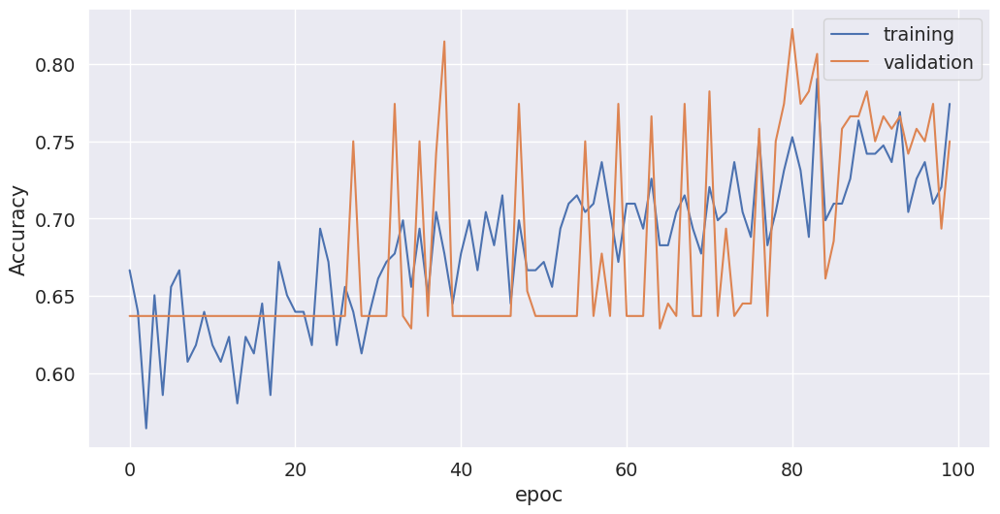

In [103]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Parece estar muy errático el aprendizaje, bajemos el parámetro de regularización y bajemos la tasa de aprendizaje

In [104]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))

In [105]:
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_41 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_42 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_43 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


In [106]:
history = model.fit(
    X_train.values, y_train, epochs=1000, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.3225 - accuracy: 0.7188

186/186 [==============================] - 0s 793us/step - loss: 4.2201 - accuracy: 0.7043 - val_loss: 4.9025 - val_accuracy: 0.6371


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 6.4940 - accuracy: 0.5625

186/186 [==============================] - 0s 71us/step - loss: 4.0429 - accuracy: 0.7043 - val_loss: 4.7404 - val_accuracy: 0.6371


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.7196 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 3.9108 - accuracy: 0.7043 - val_loss: 4.5922 - val_accuracy: 0.6371


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.2009 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 3.7880 - accuracy: 0.7043 - val_loss: 4.4522 - val_accuracy: 0.6371


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.1454 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 3.6709 - accuracy: 0.7043 - val_loss: 4.3141 - val_accuracy: 0.6371


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.0427 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 3.5553 - accuracy: 0.7043 - val_loss: 4.1787 - val_accuracy: 0.6371


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.9449 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 3.4413 - accuracy: 0.7043 - val_loss: 4.0477 - val_accuracy: 0.6371


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.9532 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 3.3331 - accuracy: 0.7043 - val_loss: 3.9187 - val_accuracy: 0.6371


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.6406 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 3.2234 - accuracy: 0.7043 - val_loss: 3.7851 - val_accuracy: 0.6371


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.5934 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 3.1126 - accuracy: 0.7043 - val_loss: 3.6539 - val_accuracy: 0.6371


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.1904 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 3.0047 - accuracy: 0.7043 - val_loss: 3.5300 - val_accuracy: 0.6371


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.9090 - accuracy: 0.5938

186/186 [==============================] - 0s 64us/step - loss: 2.9017 - accuracy: 0.7043 - val_loss: 3.4084 - val_accuracy: 0.6371


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.8823 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 2.7974 - accuracy: 0.7043 - val_loss: 3.2800 - val_accuracy: 0.6371


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.2380 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 2.6891 - accuracy: 0.7043 - val_loss: 3.1506 - val_accuracy: 0.6371


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.3248 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 2.5829 - accuracy: 0.7043 - val_loss: 3.0262 - val_accuracy: 0.6371


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.4819 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 2.4793 - accuracy: 0.7043 - val_loss: 2.9017 - val_accuracy: 0.6371


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6488 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 2.3743 - accuracy: 0.7043 - val_loss: 2.7732 - val_accuracy: 0.6371


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.8532 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 2.2688 - accuracy: 0.7043 - val_loss: 2.6531 - val_accuracy: 0.6371


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.4461 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 2.1697 - accuracy: 0.7043 - val_loss: 2.5361 - val_accuracy: 0.6371


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.9236 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 2.0712 - accuracy: 0.7043 - val_loss: 2.4145 - val_accuracy: 0.6371


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.0363 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 1.9720 - accuracy: 0.7043 - val_loss: 2.2952 - val_accuracy: 0.6371


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.2451 - accuracy: 0.5625

186/186 [==============================] - 0s 64us/step - loss: 1.8762 - accuracy: 0.7043 - val_loss: 2.1836 - val_accuracy: 0.6371


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6427 - accuracy: 0.5938

186/186 [==============================] - 0s 61us/step - loss: 1.7832 - accuracy: 0.7043 - val_loss: 2.0709 - val_accuracy: 0.6371


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.6910 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 1.6886 - accuracy: 0.7043 - val_loss: 1.9605 - val_accuracy: 0.6371


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2481 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 1.5973 - accuracy: 0.7043 - val_loss: 1.8514 - val_accuracy: 0.6371


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2119 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 1.5103 - accuracy: 0.7043 - val_loss: 1.7497 - val_accuracy: 0.6371


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.1401 - accuracy: 0.5625

186/186 [==============================] - 0s 75us/step - loss: 1.4313 - accuracy: 0.7043 - val_loss: 1.6542 - val_accuracy: 0.6371


Epoch 28/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.8315 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 1.3542 - accuracy: 0.7043 - val_loss: 1.5608 - val_accuracy: 0.6371


Epoch 29/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.7310 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 1.2820 - accuracy: 0.7043 - val_loss: 1.4738 - val_accuracy: 0.6371


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3489 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 1.2150 - accuracy: 0.7043 - val_loss: 1.3868 - val_accuracy: 0.6371


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.6414 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 1.1491 - accuracy: 0.7043 - val_loss: 1.3053 - val_accuracy: 0.6452


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3164 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 1.0856 - accuracy: 0.7043 - val_loss: 1.2284 - val_accuracy: 0.6452


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6856 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 1.0265 - accuracy: 0.7043 - val_loss: 1.1573 - val_accuracy: 0.6452


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3413 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.9699 - accuracy: 0.7043 - val_loss: 1.0920 - val_accuracy: 0.6452


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2677 - accuracy: 0.6250

186/186 [==============================] - 0s 77us/step - loss: 0.9185 - accuracy: 0.7043 - val_loss: 1.0314 - val_accuracy: 0.6452


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5486 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.8693 - accuracy: 0.7043 - val_loss: 0.9729 - val_accuracy: 0.6452


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6121 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.8223 - accuracy: 0.6989 - val_loss: 0.9189 - val_accuracy: 0.6452


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1519 - accuracy: 0.5625

186/186 [==============================] - 0s 62us/step - loss: 0.7811 - accuracy: 0.6989 - val_loss: 0.8743 - val_accuracy: 0.6452


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9786 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.7460 - accuracy: 0.6989 - val_loss: 0.8320 - val_accuracy: 0.6452


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4943 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.7121 - accuracy: 0.6989 - val_loss: 0.7899 - val_accuracy: 0.6452


Epoch 41/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6825 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6804 - accuracy: 0.6935 - val_loss: 0.7501 - val_accuracy: 0.6452


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8147 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.6527 - accuracy: 0.6935 - val_loss: 0.7152 - val_accuracy: 0.6290


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3552 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.6269 - accuracy: 0.6989 - val_loss: 0.6831 - val_accuracy: 0.6290


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6492 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.6027 - accuracy: 0.6882 - val_loss: 0.6543 - val_accuracy: 0.6290


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7658 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.5803 - accuracy: 0.6882 - val_loss: 0.6266 - val_accuracy: 0.6290


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6387 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.5586 - accuracy: 0.6882 - val_loss: 0.6029 - val_accuracy: 0.6290


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6939 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.5393 - accuracy: 0.6828 - val_loss: 0.5820 - val_accuracy: 0.6452


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3278 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5233 - accuracy: 0.6882 - val_loss: 0.5661 - val_accuracy: 0.6371


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4644 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 0.5075 - accuracy: 0.6882 - val_loss: 0.5517 - val_accuracy: 0.6371


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6926 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.4939 - accuracy: 0.6882 - val_loss: 0.5392 - val_accuracy: 0.6452


Epoch 51/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4952 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4831 - accuracy: 0.6828 - val_loss: 0.5292 - val_accuracy: 0.6532


Epoch 52/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5167 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.4705 - accuracy: 0.6774 - val_loss: 0.5192 - val_accuracy: 0.6613


Epoch 53/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4373 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4592 - accuracy: 0.6882 - val_loss: 0.5098 - val_accuracy: 0.6532


Epoch 54/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4225 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.4502 - accuracy: 0.6882 - val_loss: 0.5016 - val_accuracy: 0.6694


Epoch 55/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4343 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.4423 - accuracy: 0.7151 - val_loss: 0.4952 - val_accuracy: 0.6694


Epoch 56/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5739 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.4351 - accuracy: 0.7204 - val_loss: 0.4907 - val_accuracy: 0.6774


Epoch 57/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5034 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4286 - accuracy: 0.7366 - val_loss: 0.4855 - val_accuracy: 0.7016


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4216 - accuracy: 0.7527 - val_loss: 0.4805 - val_accuracy: 0.6855


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4287 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4156 - accuracy: 0.7634 - val_loss: 0.4769 - val_accuracy: 0.7097


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3879 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4108 - accuracy: 0.7527 - val_loss: 0.4740 - val_accuracy: 0.7097


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3711 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4063 - accuracy: 0.7688 - val_loss: 0.4716 - val_accuracy: 0.7339


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3437 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4022 - accuracy: 0.7688 - val_loss: 0.4695 - val_accuracy: 0.7419


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3993 - accuracy: 0.7849 - val_loss: 0.4676 - val_accuracy: 0.7419


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2982 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3968 - accuracy: 0.7957 - val_loss: 0.4661 - val_accuracy: 0.7500


Epoch 65/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2688 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3942 - accuracy: 0.7957 - val_loss: 0.4658 - val_accuracy: 0.7581


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4764 - accuracy: 0.6562

186/186 [==============================] - 0s 59us/step - loss: 0.3921 - accuracy: 0.7957 - val_loss: 0.4650 - val_accuracy: 0.7500


Epoch 67/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3906 - accuracy: 0.8065 - val_loss: 0.4637 - val_accuracy: 0.7661


Epoch 68/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4120 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3890 - accuracy: 0.8065 - val_loss: 0.4619 - val_accuracy: 0.7661


Epoch 69/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4744 - accuracy: 0.7188



186/186 [==============================] - 0s 68us/step - loss: 0.3875 - accuracy: 0.8172 - val_loss: 0.4611 - val_accuracy: 0.7823


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4111 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3873 - accuracy: 0.8011 - val_loss: 0.4596 - val_accuracy: 0.7903


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3114 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3855 - accuracy: 0.8118 - val_loss: 0.4601 - val_accuracy: 0.7903


Epoch 72/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3843 - accuracy: 0.8011 - val_loss: 0.4589 - val_accuracy: 0.7903


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3501 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3841 - accuracy: 0.8011 - val_loss: 0.4601 - val_accuracy: 0.7903


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3850 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3825 - accuracy: 0.8118 - val_loss: 0.4622 - val_accuracy: 0.7742


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3766 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3820 - accuracy: 0.7903 - val_loss: 0.4625 - val_accuracy: 0.7742


Epoch 76/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3362 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3801 - accuracy: 0.8011 - val_loss: 0.4626 - val_accuracy: 0.7742


Epoch 77/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3570 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3793 - accuracy: 0.8065 - val_loss: 0.4632 - val_accuracy: 0.7823


Epoch 78/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2883 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3786 - accuracy: 0.8065 - val_loss: 0.4649 - val_accuracy: 0.7581


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3124 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3778 - accuracy: 0.8065 - val_loss: 0.4677 - val_accuracy: 0.7581


Epoch 80/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3703 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3779 - accuracy: 0.8065 - val_loss: 0.4658 - val_accuracy: 0.7500


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3559 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3771 - accuracy: 0.8065 - val_loss: 0.4648 - val_accuracy: 0.7581


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2959 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3773 - accuracy: 0.8065 - val_loss: 0.4653 - val_accuracy: 0.7581


Epoch 83/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2910 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3763 - accuracy: 0.8065 - val_loss: 0.4663 - val_accuracy: 0.7581


Epoch 84/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3806 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3756 - accuracy: 0.8065 - val_loss: 0.4663 - val_accuracy: 0.7419


Epoch 85/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2479 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3760 - accuracy: 0.8065 - val_loss: 0.4665 - val_accuracy: 0.7419


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4054 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3753 - accuracy: 0.8065 - val_loss: 0.4659 - val_accuracy: 0.7500


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3757 - accuracy: 0.8011 - val_loss: 0.4655 - val_accuracy: 0.7500


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3749 - accuracy: 0.8065 - val_loss: 0.4654 - val_accuracy: 0.7581


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3271 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3742 - accuracy: 0.8118 - val_loss: 0.4649 - val_accuracy: 0.7500


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3784 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3740 - accuracy: 0.8172 - val_loss: 0.4661 - val_accuracy: 0.7500


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4533 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3740 - accuracy: 0.8172 - val_loss: 0.4653 - val_accuracy: 0.7500


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3743 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3734 - accuracy: 0.8172 - val_loss: 0.4656 - val_accuracy: 0.7419


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4099 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3741 - accuracy: 0.8172 - val_loss: 0.4654 - val_accuracy: 0.7500


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3628 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3732 - accuracy: 0.8172 - val_loss: 0.4644 - val_accuracy: 0.7500


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3456 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3730 - accuracy: 0.8172 - val_loss: 0.4644 - val_accuracy: 0.7500


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3829 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3731 - accuracy: 0.8172 - val_loss: 0.4643 - val_accuracy: 0.7500


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4783 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3725 - accuracy: 0.8118 - val_loss: 0.4648 - val_accuracy: 0.7500


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3934 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3727 - accuracy: 0.8172 - val_loss: 0.4647 - val_accuracy: 0.7500


Epoch 99/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4098 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3731 - accuracy: 0.8172 - val_loss: 0.4641 - val_accuracy: 0.7500


Epoch 100/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3940 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3733 - accuracy: 0.8118 - val_loss: 0.4636 - val_accuracy: 0.7500


Epoch 101/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3353 - accuracy: 0.8750



186/186 [==============================] - 0s 64us/step - loss: 0.3722 - accuracy: 0.8172 - val_loss: 0.4636 - val_accuracy: 0.7500


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3719 - accuracy: 0.8226 - val_loss: 0.4636 - val_accuracy: 0.7500


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3720 - accuracy: 0.8226 - val_loss: 0.4631 - val_accuracy: 0.7500


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3766 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3714 - accuracy: 0.8226 - val_loss: 0.4631 - val_accuracy: 0.7500


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3501 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3720 - accuracy: 0.8226 - val_loss: 0.4637 - val_accuracy: 0.7500


Epoch 106/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3784 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3719 - accuracy: 0.8172 - val_loss: 0.4632 - val_accuracy: 0.7500


Epoch 107/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4262 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3713 - accuracy: 0.8226 - val_loss: 0.4634 - val_accuracy: 0.7500


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3889 - accuracy: 0.8750

186/186 [==============================] - 0s 101us/step - loss: 0.3711 - accuracy: 0.8226 - val_loss: 0.4642 - val_accuracy: 0.7500


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4062 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3713 - accuracy: 0.8226 - val_loss: 0.4640 - val_accuracy: 0.7500


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3177 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3725 - accuracy: 0.8226 - val_loss: 0.4632 - val_accuracy: 0.7500


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3309 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3709 - accuracy: 0.8226 - val_loss: 0.4625 - val_accuracy: 0.7500


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4811 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3709 - accuracy: 0.8226 - val_loss: 0.4626 - val_accuracy: 0.7500


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4057 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3709 - accuracy: 0.8226 - val_loss: 0.4624 - val_accuracy: 0.7500


Epoch 114/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2204 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.3707 - accuracy: 0.8226 - val_loss: 0.4636 - val_accuracy: 0.7500


Epoch 115/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3965 - accuracy: 0.7812



186/186 [==============================] - 0s 66us/step - loss: 0.3708 - accuracy: 0.8226 - val_loss: 0.4638 - val_accuracy: 0.7500


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4111 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3708 - accuracy: 0.8226 - val_loss: 0.4626 - val_accuracy: 0.7500


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3847 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3699 - accuracy: 0.8226 - val_loss: 0.4626 - val_accuracy: 0.7500


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3419 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3708 - accuracy: 0.8226 - val_loss: 0.4631 - val_accuracy: 0.7500


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3999 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3704 - accuracy: 0.8226 - val_loss: 0.4627 - val_accuracy: 0.7500


Epoch 120/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4491 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3695 - accuracy: 0.8226 - val_loss: 0.4619 - val_accuracy: 0.7500


Epoch 121/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2617 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3700 - accuracy: 0.8226 - val_loss: 0.4626 - val_accuracy: 0.7500


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3631 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3696 - accuracy: 0.8226 - val_loss: 0.4636 - val_accuracy: 0.7419


Epoch 123/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3191 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.3704 - accuracy: 0.8172 - val_loss: 0.4628 - val_accuracy: 0.7500


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3713 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3693 - accuracy: 0.8226 - val_loss: 0.4624 - val_accuracy: 0.7500


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3691 - accuracy: 0.8226 - val_loss: 0.4635 - val_accuracy: 0.7419


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3283 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3697 - accuracy: 0.8226 - val_loss: 0.4625 - val_accuracy: 0.7500


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3477 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3693 - accuracy: 0.8226 - val_loss: 0.4624 - val_accuracy: 0.7500


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4131 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3689 - accuracy: 0.8226 - val_loss: 0.4621 - val_accuracy: 0.7500


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4433 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3694 - accuracy: 0.8226 - val_loss: 0.4615 - val_accuracy: 0.7500


Epoch 130/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3908 - accuracy: 0.7812

186/186 [==============================] - 0s 96us/step - loss: 0.3686 - accuracy: 0.8226 - val_loss: 0.4623 - val_accuracy: 0.7500


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3496 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3698 - accuracy: 0.8226 - val_loss: 0.4630 - val_accuracy: 0.7419


Epoch 132/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3948 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.3688 - accuracy: 0.8226 - val_loss: 0.4620 - val_accuracy: 0.7500


Epoch 133/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3185 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3685 - accuracy: 0.8226 - val_loss: 0.4619 - val_accuracy: 0.7500


Epoch 134/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3366 - accuracy: 0.9375

186/186 [==============================] - 0s 88us/step - loss: 0.3686 - accuracy: 0.8226 - val_loss: 0.4617 - val_accuracy: 0.7500


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4704 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3683 - accuracy: 0.8226 - val_loss: 0.4612 - val_accuracy: 0.7500


Epoch 136/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3111 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3683 - accuracy: 0.8226 - val_loss: 0.4621 - val_accuracy: 0.7419


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3683 - accuracy: 0.8172 - val_loss: 0.4620 - val_accuracy: 0.7419


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3374 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3690 - accuracy: 0.8226 - val_loss: 0.4615 - val_accuracy: 0.7419


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4054 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3681 - accuracy: 0.8172 - val_loss: 0.4622 - val_accuracy: 0.7419


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3038 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3683 - accuracy: 0.8226 - val_loss: 0.4629 - val_accuracy: 0.7419


Epoch 141/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3686 - accuracy: 0.8172 - val_loss: 0.4626 - val_accuracy: 0.7419


Epoch 142/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4405 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3675 - accuracy: 0.8280 - val_loss: 0.4621 - val_accuracy: 0.7419


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3094 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3676 - accuracy: 0.8226 - val_loss: 0.4617 - val_accuracy: 0.7419


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2818 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3676 - accuracy: 0.8226 - val_loss: 0.4625 - val_accuracy: 0.7419


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3662 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3677 - accuracy: 0.8280 - val_loss: 0.4618 - val_accuracy: 0.7419


Epoch 146/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4891 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3673 - accuracy: 0.8280 - val_loss: 0.4611 - val_accuracy: 0.7419


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3241 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3672 - accuracy: 0.8172 - val_loss: 0.4614 - val_accuracy: 0.7419


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3674 - accuracy: 0.8172 - val_loss: 0.4624 - val_accuracy: 0.7419


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4056 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3674 - accuracy: 0.8226 - val_loss: 0.4624 - val_accuracy: 0.7419


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4732 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3675 - accuracy: 0.8172 - val_loss: 0.4608 - val_accuracy: 0.7419


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3471 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3669 - accuracy: 0.8226 - val_loss: 0.4606 - val_accuracy: 0.7419


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3662 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3670 - accuracy: 0.8226 - val_loss: 0.4606 - val_accuracy: 0.7419


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3666 - accuracy: 0.8172 - val_loss: 0.4605 - val_accuracy: 0.7419


Epoch 154/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3544 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3665 - accuracy: 0.8226 - val_loss: 0.4607 - val_accuracy: 0.7419


Epoch 155/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4724 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3677 - accuracy: 0.8226 - val_loss: 0.4609 - val_accuracy: 0.7419


Epoch 156/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3403 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3665 - accuracy: 0.8226 - val_loss: 0.4599 - val_accuracy: 0.7419


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.8125



186/186 [==============================] - 0s 68us/step - loss: 0.3669 - accuracy: 0.8226 - val_loss: 0.4588 - val_accuracy: 0.7500


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4706 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.3663 - accuracy: 0.8172 - val_loss: 0.4590 - val_accuracy: 0.7500


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3369 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3665 - accuracy: 0.8226 - val_loss: 0.4582 - val_accuracy: 0.7500


Epoch 160/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3555 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3658 - accuracy: 0.8172 - val_loss: 0.4585 - val_accuracy: 0.7500


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3752 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3661 - accuracy: 0.8226 - val_loss: 0.4595 - val_accuracy: 0.7419


Epoch 162/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4109 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3657 - accuracy: 0.8226 - val_loss: 0.4586 - val_accuracy: 0.7500


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3487 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3658 - accuracy: 0.8226 - val_loss: 0.4589 - val_accuracy: 0.7500


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4096 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3656 - accuracy: 0.8280 - val_loss: 0.4577 - val_accuracy: 0.7500


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3534 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3657 - accuracy: 0.8280 - val_loss: 0.4570 - val_accuracy: 0.7500


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3727 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3663 - accuracy: 0.8280 - val_loss: 0.4572 - val_accuracy: 0.7500


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3325 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3667 - accuracy: 0.8280 - val_loss: 0.4580 - val_accuracy: 0.7500


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3578 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3648 - accuracy: 0.8280 - val_loss: 0.4576 - val_accuracy: 0.7500


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3518 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3647 - accuracy: 0.8280 - val_loss: 0.4573 - val_accuracy: 0.7500


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3986 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3647 - accuracy: 0.8333 - val_loss: 0.4570 - val_accuracy: 0.7500


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3539 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3651 - accuracy: 0.8280 - val_loss: 0.4575 - val_accuracy: 0.7500


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2572 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3651 - accuracy: 0.8226 - val_loss: 0.4573 - val_accuracy: 0.7500


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.3647 - accuracy: 0.8280 - val_loss: 0.4575 - val_accuracy: 0.7500


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3597 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3652 - accuracy: 0.8280 - val_loss: 0.4582 - val_accuracy: 0.7419


Epoch 175/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4380 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.3650 - accuracy: 0.8333 - val_loss: 0.4585 - val_accuracy: 0.7419


Epoch 176/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4001 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3648 - accuracy: 0.8333 - val_loss: 0.4583 - val_accuracy: 0.7419


Epoch 177/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4232 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3646 - accuracy: 0.8280 - val_loss: 0.4571 - val_accuracy: 0.7500


Epoch 178/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3684 - accuracy: 0.8125



186/186 [==============================] - 0s 73us/step - loss: 0.3641 - accuracy: 0.8333 - val_loss: 0.4571 - val_accuracy: 0.7500


Epoch 179/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3718 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3640 - accuracy: 0.8333 - val_loss: 0.4565 - val_accuracy: 0.7500


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3676 - accuracy: 0.8118 - val_loss: 0.4550 - val_accuracy: 0.7581


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2887 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3644 - accuracy: 0.8280 - val_loss: 0.4562 - val_accuracy: 0.7581


Epoch 182/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3172 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3640 - accuracy: 0.8333 - val_loss: 0.4563 - val_accuracy: 0.7500


Epoch 183/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4837 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.3637 - accuracy: 0.8280 - val_loss: 0.4579 - val_accuracy: 0.7419


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3636 - accuracy: 0.8333 - val_loss: 0.4582 - val_accuracy: 0.7419


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3394 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3632 - accuracy: 0.8333 - val_loss: 0.4577 - val_accuracy: 0.7419


Epoch 186/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3817 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3638 - accuracy: 0.8280 - val_loss: 0.4587 - val_accuracy: 0.7419


Epoch 187/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3842 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3636 - accuracy: 0.8280 - val_loss: 0.4585 - val_accuracy: 0.7419


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3886 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3650 - accuracy: 0.8280 - val_loss: 0.4575 - val_accuracy: 0.7419


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3403 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3638 - accuracy: 0.8280 - val_loss: 0.4584 - val_accuracy: 0.7419


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3634 - accuracy: 0.8280 - val_loss: 0.4577 - val_accuracy: 0.7419


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3982 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3632 - accuracy: 0.8280 - val_loss: 0.4573 - val_accuracy: 0.7419


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3254 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3630 - accuracy: 0.8333 - val_loss: 0.4576 - val_accuracy: 0.7419


Epoch 193/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3457 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3627 - accuracy: 0.8333 - val_loss: 0.4577 - val_accuracy: 0.7419


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3346 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3638 - accuracy: 0.8280 - val_loss: 0.4565 - val_accuracy: 0.7419


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4241 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3632 - accuracy: 0.8280 - val_loss: 0.4568 - val_accuracy: 0.7419


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5056 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3626 - accuracy: 0.8280 - val_loss: 0.4576 - val_accuracy: 0.7419


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3626 - accuracy: 0.8280 - val_loss: 0.4583 - val_accuracy: 0.7419


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3121 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3624 - accuracy: 0.8280 - val_loss: 0.4569 - val_accuracy: 0.7419


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3916 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3633 - accuracy: 0.8280 - val_loss: 0.4566 - val_accuracy: 0.7419


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2495 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3622 - accuracy: 0.8333 - val_loss: 0.4572 - val_accuracy: 0.7419


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3631 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3629 - accuracy: 0.8280 - val_loss: 0.4572 - val_accuracy: 0.7419


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3633 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3621 - accuracy: 0.8333 - val_loss: 0.4569 - val_accuracy: 0.7419


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3754 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3625 - accuracy: 0.8333 - val_loss: 0.4579 - val_accuracy: 0.7419


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2040 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3625 - accuracy: 0.8333 - val_loss: 0.4581 - val_accuracy: 0.7419


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2681 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3620 - accuracy: 0.8333 - val_loss: 0.4581 - val_accuracy: 0.7419


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3757 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3619 - accuracy: 0.8333 - val_loss: 0.4564 - val_accuracy: 0.7419


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3659 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3628 - accuracy: 0.8280 - val_loss: 0.4572 - val_accuracy: 0.7419


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3310 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3623 - accuracy: 0.8333 - val_loss: 0.4567 - val_accuracy: 0.7419


Epoch 209/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3355 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3617 - accuracy: 0.8333 - val_loss: 0.4559 - val_accuracy: 0.7419


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3684 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.3616 - accuracy: 0.8333 - val_loss: 0.4556 - val_accuracy: 0.7419


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3069 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3619 - accuracy: 0.8333 - val_loss: 0.4562 - val_accuracy: 0.7419


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4480 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3613 - accuracy: 0.8280 - val_loss: 0.4557 - val_accuracy: 0.7419


Epoch 213/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2916 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3617 - accuracy: 0.8333 - val_loss: 0.4560 - val_accuracy: 0.7419


Epoch 214/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4167 - accuracy: 0.7500

186/186 [==============================] - 0s 84us/step - loss: 0.3613 - accuracy: 0.8333 - val_loss: 0.4576 - val_accuracy: 0.7419


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4103 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3617 - accuracy: 0.8333 - val_loss: 0.4568 - val_accuracy: 0.7419


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4103 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3611 - accuracy: 0.8333 - val_loss: 0.4570 - val_accuracy: 0.7419


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4488 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3609 - accuracy: 0.8333 - val_loss: 0.4547 - val_accuracy: 0.7500


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3271 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3608 - accuracy: 0.8333 - val_loss: 0.4552 - val_accuracy: 0.7419


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3842 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3610 - accuracy: 0.8333 - val_loss: 0.4552 - val_accuracy: 0.7419


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3460 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3612 - accuracy: 0.8333 - val_loss: 0.4567 - val_accuracy: 0.7419


Epoch 221/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3700 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3611 - accuracy: 0.8333 - val_loss: 0.4569 - val_accuracy: 0.7419


Epoch 222/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2381 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.3612 - accuracy: 0.8280 - val_loss: 0.4563 - val_accuracy: 0.7419


Epoch 223/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3170 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.3613 - accuracy: 0.8333 - val_loss: 0.4567 - val_accuracy: 0.7419


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3420 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3609 - accuracy: 0.8333 - val_loss: 0.4560 - val_accuracy: 0.7419


Epoch 225/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3874 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3607 - accuracy: 0.8333 - val_loss: 0.4545 - val_accuracy: 0.7419


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4685 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3606 - accuracy: 0.8280 - val_loss: 0.4551 - val_accuracy: 0.7419


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3602 - accuracy: 0.8333 - val_loss: 0.4567 - val_accuracy: 0.7419


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4489 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.3602 - accuracy: 0.8280 - val_loss: 0.4573 - val_accuracy: 0.7419


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3603 - accuracy: 0.8333 - val_loss: 0.4553 - val_accuracy: 0.7419


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3800 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.3607 - accuracy: 0.8333 - val_loss: 0.4564 - val_accuracy: 0.7419


Epoch 231/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3895 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3607 - accuracy: 0.8333 - val_loss: 0.4551 - val_accuracy: 0.7419


Epoch 232/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4167 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3597 - accuracy: 0.8333 - val_loss: 0.4563 - val_accuracy: 0.7419


Epoch 233/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3433 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3606 - accuracy: 0.8333 - val_loss: 0.4572 - val_accuracy: 0.7419


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2952 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.3606 - accuracy: 0.8333 - val_loss: 0.4563 - val_accuracy: 0.7419


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2849 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.3607 - accuracy: 0.8280 - val_loss: 0.4551 - val_accuracy: 0.7419


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5353 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3597 - accuracy: 0.8333 - val_loss: 0.4543 - val_accuracy: 0.7419


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3763 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3601 - accuracy: 0.8333 - val_loss: 0.4534 - val_accuracy: 0.7500


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3601 - accuracy: 0.8280 - val_loss: 0.4547 - val_accuracy: 0.7419


Epoch 239/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3593 - accuracy: 0.8333 - val_loss: 0.4529 - val_accuracy: 0.7581


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.3602 - accuracy: 0.8333 - val_loss: 0.4540 - val_accuracy: 0.7419


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3773 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3598 - accuracy: 0.8333 - val_loss: 0.4542 - val_accuracy: 0.7419


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3597 - accuracy: 0.8333 - val_loss: 0.4550 - val_accuracy: 0.7419


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3738 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3603 - accuracy: 0.8333 - val_loss: 0.4558 - val_accuracy: 0.7419


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3592 - accuracy: 0.8333 - val_loss: 0.4544 - val_accuracy: 0.7419


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3650 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3593 - accuracy: 0.8333 - val_loss: 0.4559 - val_accuracy: 0.7419


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2952 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3597 - accuracy: 0.8280 - val_loss: 0.4545 - val_accuracy: 0.7419


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3479 - accuracy: 0.7812

186/186 [==============================] - 0s 90us/step - loss: 0.3594 - accuracy: 0.8280 - val_loss: 0.4532 - val_accuracy: 0.7419


Epoch 248/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3802 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3590 - accuracy: 0.8333 - val_loss: 0.4545 - val_accuracy: 0.7419


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3794 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3593 - accuracy: 0.8333 - val_loss: 0.4560 - val_accuracy: 0.7419


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3166 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3589 - accuracy: 0.8333 - val_loss: 0.4554 - val_accuracy: 0.7419


Epoch 251/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3925 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.3588 - accuracy: 0.8280 - val_loss: 0.4549 - val_accuracy: 0.7419


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3591 - accuracy: 0.8333 - val_loss: 0.4545 - val_accuracy: 0.7419


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3257 - accuracy: 0.8750



186/186 [==============================] - 0s 60us/step - loss: 0.3586 - accuracy: 0.8333 - val_loss: 0.4530 - val_accuracy: 0.7419


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3586 - accuracy: 0.8280 - val_loss: 0.4521 - val_accuracy: 0.7581


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3762 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3593 - accuracy: 0.8280 - val_loss: 0.4534 - val_accuracy: 0.7419


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2583 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3588 - accuracy: 0.8333 - val_loss: 0.4531 - val_accuracy: 0.7419


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3911 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3586 - accuracy: 0.8333 - val_loss: 0.4536 - val_accuracy: 0.7419


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3586 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3589 - accuracy: 0.8280 - val_loss: 0.4546 - val_accuracy: 0.7419


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2677 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3582 - accuracy: 0.8333 - val_loss: 0.4539 - val_accuracy: 0.7419


Epoch 260/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3581 - accuracy: 0.8333 - val_loss: 0.4547 - val_accuracy: 0.7419


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4163 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3584 - accuracy: 0.8333 - val_loss: 0.4529 - val_accuracy: 0.7419


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3544 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3590 - accuracy: 0.8333 - val_loss: 0.4530 - val_accuracy: 0.7419


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3822 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3583 - accuracy: 0.8280 - val_loss: 0.4528 - val_accuracy: 0.7419


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3582 - accuracy: 0.8280 - val_loss: 0.4533 - val_accuracy: 0.7419


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3855 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3580 - accuracy: 0.8333 - val_loss: 0.4550 - val_accuracy: 0.7419


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3607 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3582 - accuracy: 0.8333 - val_loss: 0.4537 - val_accuracy: 0.7419


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3584 - accuracy: 0.8333 - val_loss: 0.4534 - val_accuracy: 0.7419


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2377 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3577 - accuracy: 0.8333 - val_loss: 0.4546 - val_accuracy: 0.7419


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3739 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3585 - accuracy: 0.8280 - val_loss: 0.4539 - val_accuracy: 0.7419


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4094 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3575 - accuracy: 0.8280 - val_loss: 0.4542 - val_accuracy: 0.7419


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3897 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.3575 - accuracy: 0.8333 - val_loss: 0.4537 - val_accuracy: 0.7419


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3822 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3579 - accuracy: 0.8333 - val_loss: 0.4547 - val_accuracy: 0.7419


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3247 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3577 - accuracy: 0.8280 - val_loss: 0.4546 - val_accuracy: 0.7419


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4197 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.3573 - accuracy: 0.8333 - val_loss: 0.4550 - val_accuracy: 0.7419


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2803 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3578 - accuracy: 0.8333 - val_loss: 0.4537 - val_accuracy: 0.7419


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2066 - accuracy: 0.9688

186/186 [==============================] - 0s 74us/step - loss: 0.3578 - accuracy: 0.8333 - val_loss: 0.4543 - val_accuracy: 0.7419


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3902 - accuracy: 0.7500

186/186 [==============================] - 0s 137us/step - loss: 0.3577 - accuracy: 0.8280 - val_loss: 0.4536 - val_accuracy: 0.7419


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3574 - accuracy: 0.8333 - val_loss: 0.4533 - val_accuracy: 0.7419


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4059 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3573 - accuracy: 0.8333 - val_loss: 0.4527 - val_accuracy: 0.7419


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3541 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3575 - accuracy: 0.8333 - val_loss: 0.4539 - val_accuracy: 0.7419


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3208 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3573 - accuracy: 0.8333 - val_loss: 0.4546 - val_accuracy: 0.7419


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3575 - accuracy: 0.8280 - val_loss: 0.4537 - val_accuracy: 0.7419


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2488 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3566 - accuracy: 0.8280 - val_loss: 0.4538 - val_accuracy: 0.7419


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4042 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3573 - accuracy: 0.8333 - val_loss: 0.4538 - val_accuracy: 0.7419


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3141 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3569 - accuracy: 0.8333 - val_loss: 0.4548 - val_accuracy: 0.7419


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4092 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3573 - accuracy: 0.8333 - val_loss: 0.4535 - val_accuracy: 0.7419


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4370 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3565 - accuracy: 0.8280 - val_loss: 0.4520 - val_accuracy: 0.7419


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4782 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3568 - accuracy: 0.8333 - val_loss: 0.4507 - val_accuracy: 0.7581


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2061 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3568 - accuracy: 0.8333 - val_loss: 0.4518 - val_accuracy: 0.7419


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3957 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3561 - accuracy: 0.8333 - val_loss: 0.4544 - val_accuracy: 0.7419


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4129 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3565 - accuracy: 0.8280 - val_loss: 0.4520 - val_accuracy: 0.7419


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3647 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3567 - accuracy: 0.8333 - val_loss: 0.4539 - val_accuracy: 0.7419


Epoch 293/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2541 - accuracy: 0.9375

186/186 [==============================] - 0s 58us/step - loss: 0.3561 - accuracy: 0.8280 - val_loss: 0.4539 - val_accuracy: 0.7419


Epoch 294/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3564 - accuracy: 0.8333 - val_loss: 0.4526 - val_accuracy: 0.7419


Epoch 295/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3064 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3568 - accuracy: 0.8226 - val_loss: 0.4520 - val_accuracy: 0.7419


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2584 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3560 - accuracy: 0.8280 - val_loss: 0.4511 - val_accuracy: 0.7419


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3842 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3567 - accuracy: 0.8280 - val_loss: 0.4507 - val_accuracy: 0.7500


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3570 - accuracy: 0.8280 - val_loss: 0.4512 - val_accuracy: 0.7419


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3557 - accuracy: 0.8280 - val_loss: 0.4509 - val_accuracy: 0.7500


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3499 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3565 - accuracy: 0.8280 - val_loss: 0.4507 - val_accuracy: 0.7500


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2153 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3572 - accuracy: 0.8333 - val_loss: 0.4509 - val_accuracy: 0.7419


Epoch 302/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2699 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3557 - accuracy: 0.8333 - val_loss: 0.4527 - val_accuracy: 0.7419


Epoch 303/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3661 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.3562 - accuracy: 0.8280 - val_loss: 0.4525 - val_accuracy: 0.7419


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4342 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3556 - accuracy: 0.8280 - val_loss: 0.4512 - val_accuracy: 0.7419


Epoch 305/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3092 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3553 - accuracy: 0.8333 - val_loss: 0.4509 - val_accuracy: 0.7419


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4768 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3556 - accuracy: 0.8333 - val_loss: 0.4497 - val_accuracy: 0.7581


Epoch 307/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4001 - accuracy: 0.7812



186/186 [==============================] - 0s 68us/step - loss: 0.3558 - accuracy: 0.8333 - val_loss: 0.4519 - val_accuracy: 0.7419


Epoch 308/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3558 - accuracy: 0.8333 - val_loss: 0.4513 - val_accuracy: 0.7419


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4359 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3557 - accuracy: 0.8333 - val_loss: 0.4521 - val_accuracy: 0.7419


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3985 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3557 - accuracy: 0.8280 - val_loss: 0.4523 - val_accuracy: 0.7419


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4129 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3557 - accuracy: 0.8333 - val_loss: 0.4519 - val_accuracy: 0.7419


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3476 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3555 - accuracy: 0.8333 - val_loss: 0.4513 - val_accuracy: 0.7419


Epoch 313/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4508 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3557 - accuracy: 0.8333 - val_loss: 0.4510 - val_accuracy: 0.7419


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3662 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3558 - accuracy: 0.8333 - val_loss: 0.4519 - val_accuracy: 0.7419


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3556 - accuracy: 0.8280 - val_loss: 0.4532 - val_accuracy: 0.7419


Epoch 316/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4603 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3550 - accuracy: 0.8333 - val_loss: 0.4532 - val_accuracy: 0.7419


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2687 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3555 - accuracy: 0.8333 - val_loss: 0.4531 - val_accuracy: 0.7419


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2239 - accuracy: 0.9062

186/186 [==============================] - 0s 85us/step - loss: 0.3551 - accuracy: 0.8280 - val_loss: 0.4520 - val_accuracy: 0.7419


Epoch 319/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4084 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3552 - accuracy: 0.8280 - val_loss: 0.4509 - val_accuracy: 0.7419


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3233 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3552 - accuracy: 0.8333 - val_loss: 0.4501 - val_accuracy: 0.7500


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4517 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3556 - accuracy: 0.8280 - val_loss: 0.4510 - val_accuracy: 0.7419


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4179 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3550 - accuracy: 0.8280 - val_loss: 0.4506 - val_accuracy: 0.7419


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3784 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3552 - accuracy: 0.8280 - val_loss: 0.4514 - val_accuracy: 0.7419


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4818 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3554 - accuracy: 0.8333 - val_loss: 0.4517 - val_accuracy: 0.7419


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3549 - accuracy: 0.8333 - val_loss: 0.4511 - val_accuracy: 0.7419


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3971 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3547 - accuracy: 0.8333 - val_loss: 0.4512 - val_accuracy: 0.7419


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4024 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3547 - accuracy: 0.8280 - val_loss: 0.4527 - val_accuracy: 0.7419


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3544 - accuracy: 0.8280 - val_loss: 0.4538 - val_accuracy: 0.7419


Epoch 329/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4305 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3549 - accuracy: 0.8280 - val_loss: 0.4526 - val_accuracy: 0.7500


Epoch 330/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3546 - accuracy: 0.8280 - val_loss: 0.4513 - val_accuracy: 0.7500


Epoch 331/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3277 - accuracy: 0.8125

186/186 [==============================] - 0s 84us/step - loss: 0.3549 - accuracy: 0.8280 - val_loss: 0.4507 - val_accuracy: 0.7419


Epoch 332/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3683 - accuracy: 0.8438



186/186 [==============================] - 0s 71us/step - loss: 0.3542 - accuracy: 0.8280 - val_loss: 0.4506 - val_accuracy: 0.7419


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3473 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3543 - accuracy: 0.8333 - val_loss: 0.4492 - val_accuracy: 0.7500


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4399 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3547 - accuracy: 0.8280 - val_loss: 0.4490 - val_accuracy: 0.7500


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4096 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3542 - accuracy: 0.8280 - val_loss: 0.4506 - val_accuracy: 0.7419


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3202 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3544 - accuracy: 0.8280 - val_loss: 0.4519 - val_accuracy: 0.7419


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3208 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3541 - accuracy: 0.8333 - val_loss: 0.4512 - val_accuracy: 0.7419


Epoch 338/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2556 - accuracy: 0.8750

186/186 [==============================] - 0s 82us/step - loss: 0.3543 - accuracy: 0.8333 - val_loss: 0.4503 - val_accuracy: 0.7419


Epoch 339/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3539 - accuracy: 0.8333 - val_loss: 0.4533 - val_accuracy: 0.7419


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4692 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.3538 - accuracy: 0.8280 - val_loss: 0.4518 - val_accuracy: 0.7419


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3931 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3542 - accuracy: 0.8333 - val_loss: 0.4511 - val_accuracy: 0.7419


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3549 - accuracy: 0.8280 - val_loss: 0.4515 - val_accuracy: 0.7419


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3535 - accuracy: 0.8333 - val_loss: 0.4512 - val_accuracy: 0.7419


Epoch 344/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3351 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3535 - accuracy: 0.8333 - val_loss: 0.4497 - val_accuracy: 0.7419


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3692 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3541 - accuracy: 0.8280 - val_loss: 0.4505 - val_accuracy: 0.7419


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3066 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3538 - accuracy: 0.8280 - val_loss: 0.4512 - val_accuracy: 0.7419


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2945 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3537 - accuracy: 0.8280 - val_loss: 0.4506 - val_accuracy: 0.7419


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3769 - accuracy: 0.8750



186/186 [==============================] - 0s 60us/step - loss: 0.3535 - accuracy: 0.8280 - val_loss: 0.4491 - val_accuracy: 0.7419


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2199 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3540 - accuracy: 0.8280 - val_loss: 0.4492 - val_accuracy: 0.7419


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3142 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.3533 - accuracy: 0.8333 - val_loss: 0.4499 - val_accuracy: 0.7419


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3529 - accuracy: 0.9062

186/186 [==============================] - 0s 87us/step - loss: 0.3538 - accuracy: 0.8333 - val_loss: 0.4516 - val_accuracy: 0.7419


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3486 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3534 - accuracy: 0.8280 - val_loss: 0.4508 - val_accuracy: 0.7419


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4272 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3532 - accuracy: 0.8280 - val_loss: 0.4507 - val_accuracy: 0.7419


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3678 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3536 - accuracy: 0.8280 - val_loss: 0.4503 - val_accuracy: 0.7419


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3035 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3531 - accuracy: 0.8280 - val_loss: 0.4516 - val_accuracy: 0.7419


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3757 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3530 - accuracy: 0.8280 - val_loss: 0.4498 - val_accuracy: 0.7419


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2967 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3531 - accuracy: 0.8280 - val_loss: 0.4490 - val_accuracy: 0.7419


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4833 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3536 - accuracy: 0.8280 - val_loss: 0.4504 - val_accuracy: 0.7419


Epoch 359/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2742 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3536 - accuracy: 0.8280 - val_loss: 0.4502 - val_accuracy: 0.7419


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3449 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3533 - accuracy: 0.8280 - val_loss: 0.4508 - val_accuracy: 0.7419


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3697 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3530 - accuracy: 0.8280 - val_loss: 0.4497 - val_accuracy: 0.7419


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2714 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3528 - accuracy: 0.8280 - val_loss: 0.4485 - val_accuracy: 0.7500


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3969 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3526 - accuracy: 0.8333 - val_loss: 0.4477 - val_accuracy: 0.7581


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3527 - accuracy: 0.8333 - val_loss: 0.4482 - val_accuracy: 0.7581


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4069 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3530 - accuracy: 0.8333 - val_loss: 0.4491 - val_accuracy: 0.7419


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3648 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3525 - accuracy: 0.8333 - val_loss: 0.4492 - val_accuracy: 0.7419


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4207 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3520 - accuracy: 0.8333 - val_loss: 0.4468 - val_accuracy: 0.7581


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3896 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3531 - accuracy: 0.8333 - val_loss: 0.4471 - val_accuracy: 0.7581


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3454 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3530 - accuracy: 0.8226 - val_loss: 0.4486 - val_accuracy: 0.7419


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3527 - accuracy: 0.8280 - val_loss: 0.4500 - val_accuracy: 0.7419


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3487 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3528 - accuracy: 0.8333 - val_loss: 0.4493 - val_accuracy: 0.7419


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3794 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3538 - accuracy: 0.8333 - val_loss: 0.4489 - val_accuracy: 0.7419


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2721 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3520 - accuracy: 0.8333 - val_loss: 0.4501 - val_accuracy: 0.7419


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.3527 - accuracy: 0.8226 - val_loss: 0.4487 - val_accuracy: 0.7419


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4166 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3521 - accuracy: 0.8280 - val_loss: 0.4500 - val_accuracy: 0.7419


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4428 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3522 - accuracy: 0.8226 - val_loss: 0.4491 - val_accuracy: 0.7419


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3926 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3525 - accuracy: 0.8280 - val_loss: 0.4498 - val_accuracy: 0.7419


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2433 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3520 - accuracy: 0.8280 - val_loss: 0.4505 - val_accuracy: 0.7419


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3780 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3521 - accuracy: 0.8333 - val_loss: 0.4491 - val_accuracy: 0.7419


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3506 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3523 - accuracy: 0.8280 - val_loss: 0.4475 - val_accuracy: 0.7500


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3081 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3525 - accuracy: 0.8280 - val_loss: 0.4490 - val_accuracy: 0.7419


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4220 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3525 - accuracy: 0.8280 - val_loss: 0.4496 - val_accuracy: 0.7419


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3253 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3527 - accuracy: 0.8280 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3187 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3517 - accuracy: 0.8333 - val_loss: 0.4489 - val_accuracy: 0.7419


Epoch 385/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4778 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3524 - accuracy: 0.8333 - val_loss: 0.4493 - val_accuracy: 0.7419


Epoch 386/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3070 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3523 - accuracy: 0.8280 - val_loss: 0.4486 - val_accuracy: 0.7419


Epoch 387/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2829 - accuracy: 0.9062



186/186 [==============================] - 0s 64us/step - loss: 0.3517 - accuracy: 0.8280 - val_loss: 0.4498 - val_accuracy: 0.7419


Epoch 388/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3786 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3521 - accuracy: 0.8280 - val_loss: 0.4498 - val_accuracy: 0.7419


Epoch 389/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3258 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.3516 - accuracy: 0.8333 - val_loss: 0.4509 - val_accuracy: 0.7419


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3957 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3519 - accuracy: 0.8333 - val_loss: 0.4512 - val_accuracy: 0.7419


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2457 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3514 - accuracy: 0.8280 - val_loss: 0.4501 - val_accuracy: 0.7419


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3187 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3516 - accuracy: 0.8280 - val_loss: 0.4487 - val_accuracy: 0.7419


Epoch 393/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4183 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3516 - accuracy: 0.8280 - val_loss: 0.4480 - val_accuracy: 0.7419


Epoch 394/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3703 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3515 - accuracy: 0.8333 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3583 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3520 - accuracy: 0.8226 - val_loss: 0.4504 - val_accuracy: 0.7419


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3728 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3517 - accuracy: 0.8280 - val_loss: 0.4495 - val_accuracy: 0.7419


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2499 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3512 - accuracy: 0.8280 - val_loss: 0.4492 - val_accuracy: 0.7419


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3904 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3512 - accuracy: 0.8280 - val_loss: 0.4518 - val_accuracy: 0.7419


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2726 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3513 - accuracy: 0.8280 - val_loss: 0.4506 - val_accuracy: 0.7419


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2917 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3512 - accuracy: 0.8280 - val_loss: 0.4505 - val_accuracy: 0.7419


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3511 - accuracy: 0.8280 - val_loss: 0.4489 - val_accuracy: 0.7419


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3937 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.3513 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7419


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4188 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3507 - accuracy: 0.8280 - val_loss: 0.4473 - val_accuracy: 0.7500


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3764 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3509 - accuracy: 0.8280 - val_loss: 0.4471 - val_accuracy: 0.7500


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3268 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3520 - accuracy: 0.8280 - val_loss: 0.4466 - val_accuracy: 0.7581


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2886 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3512 - accuracy: 0.8280 - val_loss: 0.4473 - val_accuracy: 0.7500


Epoch 407/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2429 - accuracy: 1.0000

186/186 [==============================] - 0s 68us/step - loss: 0.3510 - accuracy: 0.8333 - val_loss: 0.4491 - val_accuracy: 0.7419


Epoch 408/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2218 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3506 - accuracy: 0.8333 - val_loss: 0.4487 - val_accuracy: 0.7419


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2639 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3511 - accuracy: 0.8333 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 410/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3998 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3504 - accuracy: 0.8280 - val_loss: 0.4484 - val_accuracy: 0.7419


Epoch 411/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3513 - accuracy: 0.8280 - val_loss: 0.4487 - val_accuracy: 0.7419


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2580 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3503 - accuracy: 0.8333 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 413/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2968 - accuracy: 0.8438



186/186 [==============================] - 0s 69us/step - loss: 0.3506 - accuracy: 0.8333 - val_loss: 0.4477 - val_accuracy: 0.7419


Epoch 414/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4744 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3509 - accuracy: 0.8280 - val_loss: 0.4472 - val_accuracy: 0.7500


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3359 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3503 - accuracy: 0.8280 - val_loss: 0.4462 - val_accuracy: 0.7500


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2753 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3506 - accuracy: 0.8280 - val_loss: 0.4467 - val_accuracy: 0.7500


Epoch 417/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3623 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3508 - accuracy: 0.8280 - val_loss: 0.4478 - val_accuracy: 0.7419


Epoch 418/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3216 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3500 - accuracy: 0.8333 - val_loss: 0.4479 - val_accuracy: 0.7500


Epoch 419/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3862 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3502 - accuracy: 0.8280 - val_loss: 0.4491 - val_accuracy: 0.7419


Epoch 420/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4219 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3500 - accuracy: 0.8280 - val_loss: 0.4500 - val_accuracy: 0.7419


Epoch 421/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2809 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3508 - accuracy: 0.8280 - val_loss: 0.4493 - val_accuracy: 0.7419


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3078 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3501 - accuracy: 0.8226 - val_loss: 0.4478 - val_accuracy: 0.7419


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4932 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3506 - accuracy: 0.8280 - val_loss: 0.4496 - val_accuracy: 0.7419


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3380 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3501 - accuracy: 0.8280 - val_loss: 0.4478 - val_accuracy: 0.7419


Epoch 425/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2288 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3503 - accuracy: 0.8280 - val_loss: 0.4482 - val_accuracy: 0.7419


Epoch 426/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3626 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3505 - accuracy: 0.8280 - val_loss: 0.4483 - val_accuracy: 0.7419


Epoch 427/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4575 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3502 - accuracy: 0.8280 - val_loss: 0.4469 - val_accuracy: 0.7500


Epoch 428/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3437 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3502 - accuracy: 0.8333 - val_loss: 0.4484 - val_accuracy: 0.7419


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2940 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3500 - accuracy: 0.8280 - val_loss: 0.4481 - val_accuracy: 0.7419


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2800 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3509 - accuracy: 0.8280 - val_loss: 0.4489 - val_accuracy: 0.7419


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2929 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3497 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7419


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3130 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3499 - accuracy: 0.8280 - val_loss: 0.4458 - val_accuracy: 0.7581


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2762 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3502 - accuracy: 0.8280 - val_loss: 0.4473 - val_accuracy: 0.7419


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3622 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3496 - accuracy: 0.8280 - val_loss: 0.4468 - val_accuracy: 0.7500


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3650 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3497 - accuracy: 0.8280 - val_loss: 0.4464 - val_accuracy: 0.7500


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3496 - accuracy: 0.8333 - val_loss: 0.4466 - val_accuracy: 0.7500


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4098 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3502 - accuracy: 0.8280 - val_loss: 0.4470 - val_accuracy: 0.7419


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3783 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.3492 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7419


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3567 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3498 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7419


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.9375

186/186 [==============================] - 0s 84us/step - loss: 0.3494 - accuracy: 0.8280 - val_loss: 0.4469 - val_accuracy: 0.7419


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2408 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3496 - accuracy: 0.8333 - val_loss: 0.4493 - val_accuracy: 0.7419


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2639 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3494 - accuracy: 0.8333 - val_loss: 0.4499 - val_accuracy: 0.7419


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3736 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3492 - accuracy: 0.8280 - val_loss: 0.4478 - val_accuracy: 0.7500


Epoch 444/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4129 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3505 - accuracy: 0.8280 - val_loss: 0.4470 - val_accuracy: 0.7419


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3902 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3498 - accuracy: 0.8280 - val_loss: 0.4476 - val_accuracy: 0.7419


Epoch 446/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3930 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3493 - accuracy: 0.8280 - val_loss: 0.4490 - val_accuracy: 0.7419


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3273 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.4480 - val_accuracy: 0.7419


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3691 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3499 - accuracy: 0.8280 - val_loss: 0.4488 - val_accuracy: 0.7419


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3493 - accuracy: 0.8280 - val_loss: 0.4471 - val_accuracy: 0.7419


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3488 - accuracy: 0.8280 - val_loss: 0.4452 - val_accuracy: 0.7581


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3494 - accuracy: 0.8280 - val_loss: 0.4452 - val_accuracy: 0.7581


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3508 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3488 - accuracy: 0.8280 - val_loss: 0.4471 - val_accuracy: 0.7419


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2424 - accuracy: 0.9688

186/186 [==============================] - 0s 87us/step - loss: 0.3490 - accuracy: 0.8333 - val_loss: 0.4469 - val_accuracy: 0.7419


Epoch 454/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.4471 - val_accuracy: 0.7419


Epoch 455/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3389 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3489 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7419


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3360 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.4493 - val_accuracy: 0.7500


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3629 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3488 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7500


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3795 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.4475 - val_accuracy: 0.7500


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4413 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.4465 - val_accuracy: 0.7419


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2624 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.4483 - val_accuracy: 0.7419


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3490 - accuracy: 0.8333 - val_loss: 0.4472 - val_accuracy: 0.7500


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2613 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3493 - accuracy: 0.8280 - val_loss: 0.4478 - val_accuracy: 0.7419


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2460 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3483 - accuracy: 0.8280 - val_loss: 0.4492 - val_accuracy: 0.7419


Epoch 464/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3416 - accuracy: 0.7812

186/186 [==============================] - 0s 102us/step - loss: 0.3491 - accuracy: 0.8280 - val_loss: 0.4484 - val_accuracy: 0.7419


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3489 - accuracy: 0.8280 - val_loss: 0.4489 - val_accuracy: 0.7500


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4273 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.4492 - val_accuracy: 0.7500


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2886 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3492 - accuracy: 0.8280 - val_loss: 0.4500 - val_accuracy: 0.7419


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3015 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3486 - accuracy: 0.8226 - val_loss: 0.4484 - val_accuracy: 0.7419


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3815 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.4477 - val_accuracy: 0.7419


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3517 - accuracy: 0.7188



186/186 [==============================] - 0s 65us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.4483 - val_accuracy: 0.7419


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4470 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3484 - accuracy: 0.8280 - val_loss: 0.4474 - val_accuracy: 0.7500


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3050 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3481 - accuracy: 0.8280 - val_loss: 0.4462 - val_accuracy: 0.7419


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2809 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3489 - accuracy: 0.8280 - val_loss: 0.4471 - val_accuracy: 0.7419


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3311 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3483 - accuracy: 0.8280 - val_loss: 0.4478 - val_accuracy: 0.7500


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3516 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3482 - accuracy: 0.8280 - val_loss: 0.4483 - val_accuracy: 0.7419


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3452 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3482 - accuracy: 0.8333 - val_loss: 0.4483 - val_accuracy: 0.7419


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3928 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3482 - accuracy: 0.8280 - val_loss: 0.4472 - val_accuracy: 0.7500


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4226 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3486 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7500


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3479 - accuracy: 0.8226 - val_loss: 0.4463 - val_accuracy: 0.7500


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3338 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3480 - accuracy: 0.8280 - val_loss: 0.4476 - val_accuracy: 0.7419


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3776 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3479 - accuracy: 0.8280 - val_loss: 0.4476 - val_accuracy: 0.7500


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3636 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3483 - accuracy: 0.8280 - val_loss: 0.4471 - val_accuracy: 0.7500


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3493 - accuracy: 0.8280 - val_loss: 0.4470 - val_accuracy: 0.7419


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2674 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3474 - accuracy: 0.8333 - val_loss: 0.4464 - val_accuracy: 0.7500


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3103 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3489 - accuracy: 0.8280 - val_loss: 0.4458 - val_accuracy: 0.7419


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3305 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3477 - accuracy: 0.8280 - val_loss: 0.4455 - val_accuracy: 0.7581


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3237 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3475 - accuracy: 0.8280 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3589 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3470 - accuracy: 0.8280 - val_loss: 0.4465 - val_accuracy: 0.7419


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3134 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3481 - accuracy: 0.8333 - val_loss: 0.4468 - val_accuracy: 0.7419


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3487 - accuracy: 0.8280 - val_loss: 0.4456 - val_accuracy: 0.7500


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4974 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3474 - accuracy: 0.8333 - val_loss: 0.4451 - val_accuracy: 0.7581


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3390 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3482 - accuracy: 0.8280 - val_loss: 0.4459 - val_accuracy: 0.7500


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2124 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3481 - accuracy: 0.8333 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3777 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3476 - accuracy: 0.8280 - val_loss: 0.4443 - val_accuracy: 0.7581


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3471 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3476 - accuracy: 0.8280 - val_loss: 0.4448 - val_accuracy: 0.7500


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3948 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3470 - accuracy: 0.8280 - val_loss: 0.4461 - val_accuracy: 0.7419


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3542 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3477 - accuracy: 0.8280 - val_loss: 0.4472 - val_accuracy: 0.7419


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3474 - accuracy: 0.8333 - val_loss: 0.4461 - val_accuracy: 0.7500


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3157 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3473 - accuracy: 0.8333 - val_loss: 0.4468 - val_accuracy: 0.7500


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4104 - accuracy: 0.7500



186/186 [==============================] - 0s 88us/step - loss: 0.3476 - accuracy: 0.8280 - val_loss: 0.4463 - val_accuracy: 0.7500


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3777 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3473 - accuracy: 0.8280 - val_loss: 0.4468 - val_accuracy: 0.7419


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2874 - accuracy: 0.8125

186/186 [==============================] - 0s 87us/step - loss: 0.3473 - accuracy: 0.8333 - val_loss: 0.4473 - val_accuracy: 0.7500


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3817 - accuracy: 0.8125

186/186 [==============================] - 0s 99us/step - loss: 0.3475 - accuracy: 0.8226 - val_loss: 0.4466 - val_accuracy: 0.7500


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4049 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3471 - accuracy: 0.8280 - val_loss: 0.4457 - val_accuracy: 0.7500


Epoch 505/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3934 - accuracy: 0.7500

186/186 [==============================] - 0s 95us/step - loss: 0.3473 - accuracy: 0.8333 - val_loss: 0.4452 - val_accuracy: 0.7581


Epoch 506/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.9062

186/186 [==============================] - 0s 97us/step - loss: 0.3477 - accuracy: 0.8280 - val_loss: 0.4464 - val_accuracy: 0.7500


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3335 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3467 - accuracy: 0.8280 - val_loss: 0.4459 - val_accuracy: 0.7500


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3601 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3476 - accuracy: 0.8280 - val_loss: 0.4460 - val_accuracy: 0.7500


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1924 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3472 - accuracy: 0.8280 - val_loss: 0.4469 - val_accuracy: 0.7500


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2640 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3469 - accuracy: 0.8280 - val_loss: 0.4471 - val_accuracy: 0.7500


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2434 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3472 - accuracy: 0.8280 - val_loss: 0.4477 - val_accuracy: 0.7500


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3193 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3469 - accuracy: 0.8280 - val_loss: 0.4457 - val_accuracy: 0.7500


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3246 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3468 - accuracy: 0.8280 - val_loss: 0.4457 - val_accuracy: 0.7500


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3886 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3465 - accuracy: 0.8280 - val_loss: 0.4433 - val_accuracy: 0.7581


Epoch 515/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3469 - accuracy: 0.8280 - val_loss: 0.4440 - val_accuracy: 0.7581


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4450 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3474 - accuracy: 0.8280 - val_loss: 0.4446 - val_accuracy: 0.7581


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3345 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3468 - accuracy: 0.8280 - val_loss: 0.4453 - val_accuracy: 0.7500


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3780 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3468 - accuracy: 0.8280 - val_loss: 0.4440 - val_accuracy: 0.7581


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3207 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3468 - accuracy: 0.8280 - val_loss: 0.4465 - val_accuracy: 0.7500


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4520 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3469 - accuracy: 0.8280 - val_loss: 0.4454 - val_accuracy: 0.7500


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2894 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.4444 - val_accuracy: 0.7581


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3475 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3467 - accuracy: 0.8280 - val_loss: 0.4442 - val_accuracy: 0.7581


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.7812

186/186 [==============================] - 0s 117us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.4456 - val_accuracy: 0.7500


Epoch 524/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3513 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3481 - accuracy: 0.8280 - val_loss: 0.4461 - val_accuracy: 0.7500


Epoch 525/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3565 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3466 - accuracy: 0.8333 - val_loss: 0.4453 - val_accuracy: 0.7500


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3326 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3461 - accuracy: 0.8280 - val_loss: 0.4443 - val_accuracy: 0.7581


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3704 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.4443 - val_accuracy: 0.7581


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4729 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3465 - accuracy: 0.8280 - val_loss: 0.4448 - val_accuracy: 0.7581


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2135 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3464 - accuracy: 0.8280 - val_loss: 0.4459 - val_accuracy: 0.7500


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4475 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3460 - accuracy: 0.8280 - val_loss: 0.4438 - val_accuracy: 0.7581


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3467 - accuracy: 0.8333 - val_loss: 0.4440 - val_accuracy: 0.7581


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3462 - accuracy: 0.8280 - val_loss: 0.4456 - val_accuracy: 0.7419


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3722 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3459 - accuracy: 0.8280 - val_loss: 0.4438 - val_accuracy: 0.7581


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2580 - accuracy: 0.8750

186/186 [==============================] - 0s 56us/step - loss: 0.3466 - accuracy: 0.8333 - val_loss: 0.4449 - val_accuracy: 0.7581


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4582 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3456 - accuracy: 0.8333 - val_loss: 0.4450 - val_accuracy: 0.7500


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3322 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3467 - accuracy: 0.8333 - val_loss: 0.4456 - val_accuracy: 0.7500


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3677 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3463 - accuracy: 0.8333 - val_loss: 0.4443 - val_accuracy: 0.7581


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3465 - accuracy: 0.8280 - val_loss: 0.4445 - val_accuracy: 0.7581


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3455 - accuracy: 0.8333 - val_loss: 0.4450 - val_accuracy: 0.7500


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4503 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3455 - accuracy: 0.8280 - val_loss: 0.4443 - val_accuracy: 0.7581


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3660 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3464 - accuracy: 0.8280 - val_loss: 0.4438 - val_accuracy: 0.7581


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3458 - accuracy: 0.8280 - val_loss: 0.4458 - val_accuracy: 0.7500


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4536 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3456 - accuracy: 0.8280 - val_loss: 0.4447 - val_accuracy: 0.7500


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2564 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3457 - accuracy: 0.8280 - val_loss: 0.4430 - val_accuracy: 0.7581


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4242 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3470 - accuracy: 0.8280 - val_loss: 0.4441 - val_accuracy: 0.7581


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3706 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3454 - accuracy: 0.8280 - val_loss: 0.4448 - val_accuracy: 0.7581


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3990 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3452 - accuracy: 0.8280 - val_loss: 0.4446 - val_accuracy: 0.7581


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4271 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3459 - accuracy: 0.8280 - val_loss: 0.4441 - val_accuracy: 0.7581


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3716 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3457 - accuracy: 0.8280 - val_loss: 0.4430 - val_accuracy: 0.7581


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3464 - accuracy: 0.8280 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3459 - accuracy: 0.8280 - val_loss: 0.4434 - val_accuracy: 0.7581


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3223 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3453 - accuracy: 0.8280 - val_loss: 0.4434 - val_accuracy: 0.7581


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3234 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3459 - accuracy: 0.8280 - val_loss: 0.4451 - val_accuracy: 0.7500


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3456 - accuracy: 0.8280 - val_loss: 0.4454 - val_accuracy: 0.7500


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3213 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3458 - accuracy: 0.8333 - val_loss: 0.4447 - val_accuracy: 0.7500


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3447 - accuracy: 0.8333 - val_loss: 0.4454 - val_accuracy: 0.7500


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1086 - accuracy: 1.0000

186/186 [==============================] - 0s 64us/step - loss: 0.3453 - accuracy: 0.8280 - val_loss: 0.4446 - val_accuracy: 0.7500


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3094 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3451 - accuracy: 0.8280 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 559/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2824 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3461 - accuracy: 0.8280 - val_loss: 0.4436 - val_accuracy: 0.7581


Epoch 560/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2930 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3455 - accuracy: 0.8280 - val_loss: 0.4448 - val_accuracy: 0.7500


Epoch 561/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4067 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3446 - accuracy: 0.8280 - val_loss: 0.4450 - val_accuracy: 0.7500


Epoch 562/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3935 - accuracy: 0.7500

186/186 [==============================] - 0s 57us/step - loss: 0.3452 - accuracy: 0.8280 - val_loss: 0.4435 - val_accuracy: 0.7581


Epoch 563/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3469 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3458 - accuracy: 0.8280 - val_loss: 0.4434 - val_accuracy: 0.7581


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2455 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3449 - accuracy: 0.8280 - val_loss: 0.4434 - val_accuracy: 0.7581


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3449 - accuracy: 0.8280 - val_loss: 0.4447 - val_accuracy: 0.7500


Epoch 566/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4671 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3453 - accuracy: 0.8280 - val_loss: 0.4444 - val_accuracy: 0.7581


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2780 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3453 - accuracy: 0.8280 - val_loss: 0.4450 - val_accuracy: 0.7500


Epoch 568/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3179 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3453 - accuracy: 0.8280 - val_loss: 0.4435 - val_accuracy: 0.7581


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3450 - accuracy: 0.8280 - val_loss: 0.4441 - val_accuracy: 0.7581


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4654 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3450 - accuracy: 0.8280 - val_loss: 0.4432 - val_accuracy: 0.7581


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3038 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3445 - accuracy: 0.8333 - val_loss: 0.4445 - val_accuracy: 0.7500


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3861 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3454 - accuracy: 0.8280 - val_loss: 0.4441 - val_accuracy: 0.7581


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3682 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3454 - accuracy: 0.8280 - val_loss: 0.4440 - val_accuracy: 0.7581


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2775 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3449 - accuracy: 0.8280 - val_loss: 0.4437 - val_accuracy: 0.7581


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2343 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.4425 - val_accuracy: 0.7581


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3448 - accuracy: 0.8280 - val_loss: 0.4429 - val_accuracy: 0.7581


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3721 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3448 - accuracy: 0.8280 - val_loss: 0.4457 - val_accuracy: 0.7500


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3345 - accuracy: 0.8750

186/186 [==============================] - 0s 101us/step - loss: 0.3442 - accuracy: 0.8280 - val_loss: 0.4439 - val_accuracy: 0.7581


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3132 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.4442 - val_accuracy: 0.7500


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2596 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3445 - accuracy: 0.8280 - val_loss: 0.4435 - val_accuracy: 0.7581


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3419 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3446 - accuracy: 0.8280 - val_loss: 0.4409 - val_accuracy: 0.7661


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3683 - accuracy: 0.8438

186/186 [==============================] - 0s 94us/step - loss: 0.3454 - accuracy: 0.8280 - val_loss: 0.4414 - val_accuracy: 0.7661


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4295 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3450 - accuracy: 0.8280 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2108 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3450 - accuracy: 0.8280 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3440 - accuracy: 0.8280 - val_loss: 0.4453 - val_accuracy: 0.7500


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3194 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3440 - accuracy: 0.8280 - val_loss: 0.4436 - val_accuracy: 0.7581


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3452 - accuracy: 0.8280 - val_loss: 0.4446 - val_accuracy: 0.7500


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4295 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3439 - accuracy: 0.8333 - val_loss: 0.4442 - val_accuracy: 0.7500


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3029 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3441 - accuracy: 0.8280 - val_loss: 0.4439 - val_accuracy: 0.7581


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3630 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3449 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3441 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4133 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.4428 - val_accuracy: 0.7581


Epoch 593/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3414 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3443 - accuracy: 0.8333 - val_loss: 0.4441 - val_accuracy: 0.7500


Epoch 594/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3838 - accuracy: 0.7500

186/186 [==============================]

 - 0s 77us/step - loss: 0.3436 - accuracy: 0.8280 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3649 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3448 - accuracy: 0.8280 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3172 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3440 - accuracy: 0.8333 - val_loss: 0.4436 - val_accuracy: 0.7581


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4801 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3448 - accuracy: 0.8280 - val_loss: 0.4435 - val_accuracy: 0.7581


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3827 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3437 - accuracy: 0.8280 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2023 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3439 - accuracy: 0.8280 - val_loss: 0.4441 - val_accuracy: 0.7500


Epoch 600/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2452 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3440 - accuracy: 0.8333 - val_loss: 0.4439 - val_accuracy: 0.7500


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4074 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.4441 - val_accuracy: 0.7500


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3787 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3436 - accuracy: 0.8280 - val_loss: 0.4425 - val_accuracy: 0.7581


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4269 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3440 - accuracy: 0.8280 - val_loss: 0.4441 - val_accuracy: 0.7500


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3443 - accuracy: 0.8280 - val_loss: 0.4423 - val_accuracy: 0.7581


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3433 - accuracy: 0.8280 - val_loss: 0.4431 - val_accuracy: 0.7581


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2747 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3438 - accuracy: 0.8280 - val_loss: 0.4440 - val_accuracy: 0.7500


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3222 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3440 - accuracy: 0.8280 - val_loss: 0.4437 - val_accuracy: 0.7500


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4123 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3436 - accuracy: 0.8280 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3366 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3443 - accuracy: 0.8280 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3985 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3441 - accuracy: 0.8333 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3142 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3434 - accuracy: 0.8280 - val_loss: 0.4412 - val_accuracy: 0.7661


Epoch 612/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3547 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3439 - accuracy: 0.8280 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3164 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3437 - accuracy: 0.8280 - val_loss: 0.4430 - val_accuracy: 0.7581


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2985 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3435 - accuracy: 0.8280 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 615/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3630 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3433 - accuracy: 0.8280 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 616/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3133 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3440 - accuracy: 0.8280 - val_loss: 0.4431 - val_accuracy: 0.7581


Epoch 617/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4258 - accuracy: 0.7812

186/186 [==============================] - 0s 106us/step - loss: 0.3436 - accuracy: 0.8280 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3507 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3438 - accuracy: 0.8280 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3728 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3435 - accuracy: 0.8280 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3738 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3439 - accuracy: 0.8333 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3539 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3436 - accuracy: 0.8280 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3660 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3432 - accuracy: 0.8280 - val_loss: 0.4423 - val_accuracy: 0.7581


Epoch 623/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3437 - accuracy: 0.8333 - val_loss: 0.4441 - val_accuracy: 0.7500


Epoch 624/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3276 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3433 - accuracy: 0.8280 - val_loss: 0.4439 - val_accuracy: 0.7500


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3999 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3428 - accuracy: 0.8280 - val_loss: 0.4431 - val_accuracy: 0.7581


Epoch 626/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2810 - accuracy: 0.8438

186/186 [==============================] - 0s 87us/step - loss: 0.3431 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2574 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3431 - accuracy: 0.8280 - val_loss: 0.4434 - val_accuracy: 0.7500


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3438 - accuracy: 0.8333 - val_loss: 0.4431 - val_accuracy: 0.7581


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3156 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3433 - accuracy: 0.8333 - val_loss: 0.4442 - val_accuracy: 0.7500


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.3436 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7581


Epoch 631/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3315 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3430 - accuracy: 0.8333 - val_loss: 0.4436 - val_accuracy: 0.7500


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1981 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3435 - accuracy: 0.8280 - val_loss: 0.4425 - val_accuracy: 0.7581


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3483 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.3428 - accuracy: 0.8280 - val_loss: 0.4435 - val_accuracy: 0.7500


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3900 - accuracy: 0.8125



186/186 [==============================] - 0s 60us/step - loss: 0.3427 - accuracy: 0.8280 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4411 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3428 - accuracy: 0.8280 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3623 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3428 - accuracy: 0.8280 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2687 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3427 - accuracy: 0.8280 - val_loss: 0.4428 - val_accuracy: 0.7581


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4041 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3425 - accuracy: 0.8280 - val_loss: 0.4408 - val_accuracy: 0.7581


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2794 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.3432 - accuracy: 0.8333 - val_loss: 0.4425 - val_accuracy: 0.7581


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3425 - accuracy: 0.8387 - val_loss: 0.4439 - val_accuracy: 0.7500


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2834 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3431 - accuracy: 0.8280 - val_loss: 0.4421 - val_accuracy: 0.7581


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5107 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3430 - accuracy: 0.8280 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3504 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3427 - accuracy: 0.8280 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3782 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3427 - accuracy: 0.8280 - val_loss: 0.4428 - val_accuracy: 0.7581


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4210 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3423 - accuracy: 0.8280 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3165 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3422 - accuracy: 0.8280 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2786 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3431 - accuracy: 0.8280 - val_loss: 0.4431 - val_accuracy: 0.7581


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2661 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3429 - accuracy: 0.8280 - val_loss: 0.4438 - val_accuracy: 0.7500


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3933 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3428 - accuracy: 0.8280 - val_loss: 0.4436 - val_accuracy: 0.7500


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3458 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3424 - accuracy: 0.8280 - val_loss: 0.4428 - val_accuracy: 0.7581


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3426 - accuracy: 0.8280 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2233 - accuracy: 0.9375



186/186 [==============================] - 0s 65us/step - loss: 0.3420 - accuracy: 0.8280 - val_loss: 0.4421 - val_accuracy: 0.7581


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2691 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3430 - accuracy: 0.8280 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3627 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3424 - accuracy: 0.8280 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 655/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.8438



186/186 [==============================] - 0s 78us/step - loss: 0.3423 - accuracy: 0.8280 - val_loss: 0.4433 - val_accuracy: 0.7500


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4168 - accuracy: 0.7188



186/186 [==============================] - 0s 68us/step - loss: 0.3425 - accuracy: 0.8280 - val_loss: 0.4432 - val_accuracy: 0.7500


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3537 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3417 - accuracy: 0.8280 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2851 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3432 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3953 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3425 - accuracy: 0.8333 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4793 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3417 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2807 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3427 - accuracy: 0.8280 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3493 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3418 - accuracy: 0.8280 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3797 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3425 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3649 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3423 - accuracy: 0.8280 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2819 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3422 - accuracy: 0.8280 - val_loss: 0.4411 - val_accuracy: 0.7581


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3655 - accuracy: 0.8125

186/186 [==============================] - 0s 152us/step - loss: 0.3420 - accuracy: 0.8333 - val_loss: 0.4430 - val_accuracy: 0.7500


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3945 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3425 - accuracy: 0.8280 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 668/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4142 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3417 - accuracy: 0.8280 - val_loss: 0.4428 - val_accuracy: 0.7500


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2844 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3419 - accuracy: 0.8333 - val_loss: 0.4429 - val_accuracy: 0.7500


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2466 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3426 - accuracy: 0.8333 - val_loss: 0.4436 - val_accuracy: 0.7500


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3509 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3413 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.3438 - accuracy: 0.8280 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3415 - accuracy: 0.8333 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2891 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3423 - accuracy: 0.8333 - val_loss: 0.4434 - val_accuracy: 0.7500


Epoch 675/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3810 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.3419 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3799 - accuracy: 0.7500

186/186 [==============================] - 0s 82us/step - loss: 0.3420 - accuracy: 0.8280 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3421 - accuracy: 0.8280 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4060 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.3416 - accuracy: 0.8333 - val_loss: 0.4408 - val_accuracy: 0.7581


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4258 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.3419 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7581


Epoch 680/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3318 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3418 - accuracy: 0.8280 - val_loss: 0.4404 - val_accuracy: 0.7581


Epoch 681/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3956 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.3413 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7581


Epoch 682/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4970 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3421 - accuracy: 0.8333 - val_loss: 0.4397 - val_accuracy: 0.7661


Epoch 683/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4211 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3419 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7581


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2806 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3423 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2965 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3415 - accuracy: 0.8280 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3723 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3416 - accuracy: 0.8333 - val_loss: 0.4428 - val_accuracy: 0.7581


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3168 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3412 - accuracy: 0.8333 - val_loss: 0.4433 - val_accuracy: 0.7500


Epoch 688/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3689 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3416 - accuracy: 0.8280 - val_loss: 0.4425 - val_accuracy: 0.7581


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3406 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3411 - accuracy: 0.8280 - val_loss: 0.4423 - val_accuracy: 0.7581


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4121 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3416 - accuracy: 0.8280 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3237 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3412 - accuracy: 0.8333 - val_loss: 0.4440 - val_accuracy: 0.7500


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3413 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4281 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3418 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3413 - accuracy: 0.8333 - val_loss: 0.4435 - val_accuracy: 0.7500


Epoch 695/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4173 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3417 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3629 - accuracy: 0.8125

186/186 [==============================] - 0s 84us/step - loss: 0.3411 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3230 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3412 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3539 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3413 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4432 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3413 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7581


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3604 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3408 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 701/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3412 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3322 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3419 - accuracy: 0.8333 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3330 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3404 - accuracy: 0.8280 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3169 - accuracy: 0.8750

186/186 [==============================] - 0s 119us/step - loss: 0.3412 - accuracy: 0.8280 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4032 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3412 - accuracy: 0.8280 - val_loss: 0.4404 - val_accuracy: 0.7581


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3408 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3005 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3408 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3408 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3659 - accuracy: 0.8438



186/186 [==============================] - 0s 71us/step - loss: 0.3417 - accuracy: 0.8333 - val_loss: 0.4427 - val_accuracy: 0.7500


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3530 - accuracy: 0.8750



186/186 [==============================] - 0s 71us/step - loss: 0.3406 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3454 - accuracy: 0.8438

186/186 [==============================]

 - 0s 63us/step - loss: 0.3404 - accuracy: 0.8333 - val_loss: 0.4428 - val_accuracy: 0.7500


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2703 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3415 - accuracy: 0.8280 - val_loss: 0.4432 - val_accuracy: 0.7500


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4152 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3410 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2658 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3405 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 715/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3144 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3406 - accuracy: 0.8333 - val_loss: 0.4424 - val_accuracy: 0.7500


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3917 - accuracy: 0.8438



186/186 [==============================] - 0s 60us/step - loss: 0.3409 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 717/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3705 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3411 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2603 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3408 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3583 - accuracy: 0.8125

186/186 [==============================] - 0s 100us/step - loss: 0.3403 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3358 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3410 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3418 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 722/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3739 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3406 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 723/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3503 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3419 - accuracy: 0.8333 - val_loss: 0.4411 - val_accuracy: 0.7581


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3339 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3411 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3143 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3409 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4157 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3401 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4074 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3405 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3774 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3409 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4272 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3405 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4606 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3407 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3791 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3401 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3855 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3399 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1928 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3403 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3998 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3406 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 735/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4433 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3403 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2662 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3407 - accuracy: 0.8387 - val_loss: 0.4433 - val_accuracy: 0.7500


Epoch 737/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3408 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3402 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 738/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3408 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7581


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3399 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2518 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3402 - accuracy: 0.8333 - val_loss: 0.4440 - val_accuracy: 0.7500


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4001 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3402 - accuracy: 0.8333 - val_loss: 0.4428 - val_accuracy: 0.7500


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3402 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7500


Epoch 743/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3735 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3403 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4292 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3407 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3401 - accuracy: 0.8333 - val_loss: 0.4430 - val_accuracy: 0.7500


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4057 - accuracy: 0.7812

186/186 [==============================] - 0s 82us/step - loss: 0.3403 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3932 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3404 - accuracy: 0.8333 - val_loss: 0.4429 - val_accuracy: 0.7500


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3565 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3397 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7500


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3537 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3396 - accuracy: 0.8333 - val_loss: 0.4398 - val_accuracy: 0.7581


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2333 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3401 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3542 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3404 - accuracy: 0.8333 - val_loss: 0.4421 - val_accuracy: 0.7581


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4135 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3402 - accuracy: 0.8333 - val_loss: 0.4432 - val_accuracy: 0.7500


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4457 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.3392 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7661


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3495 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3400 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3382 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3398 - accuracy: 0.8333 - val_loss: 0.4425 - val_accuracy: 0.7500


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3400 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 757/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.3398 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 758/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4385 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3396 - accuracy: 0.8333 - val_loss: 0.4425 - val_accuracy: 0.7500


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3982 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4395 - val_accuracy: 0.7661


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3202 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3398 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3608 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3410 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2658 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3397 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4097 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3409 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7581


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2635 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3393 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2635 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3403 - accuracy: 0.8333 - val_loss: 0.4429 - val_accuracy: 0.7500


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3681 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3394 - accuracy: 0.8333 - val_loss: 0.4432 - val_accuracy: 0.7500


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3156 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3395 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3001 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3407 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3400 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3394 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3001 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3397 - accuracy: 0.8333 - val_loss: 0.4425 - val_accuracy: 0.7500


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5452 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4428 - val_accuracy: 0.7500


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3687 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3402 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3395 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2925 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3389 - accuracy: 0.8333 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 776/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4062 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.3394 - accuracy: 0.8387 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5352 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4397 - val_accuracy: 0.7581


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3397 - accuracy: 0.8333 - val_loss: 0.4393 - val_accuracy: 0.7661


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3411 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3396 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7581


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3126 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4333 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3394 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7581


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3537 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3401 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3999 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3389 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2615 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3392 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7500


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2331 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3393 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7500


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3276 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3388 - accuracy: 0.8333 - val_loss: 0.4426 - val_accuracy: 0.7500


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4657 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3396 - accuracy: 0.8333 - val_loss: 0.4425 - val_accuracy: 0.7500


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3966 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3396 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3476 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3396 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2533 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3384 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7500


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3386 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3389 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3655 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2863 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4389 - val_accuracy: 0.7661


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2622 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3394 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3457 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3393 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3179 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.3389 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3491 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3388 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2607 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7581


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3923 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3395 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7581


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3104 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.3393 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2502 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7581


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3271 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4394 - val_accuracy: 0.7661


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3275 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3395 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7581


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2825 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3388 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7500


Epoch 806/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3605 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7581


Epoch 807/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3578 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3384 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7581


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3673 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3392 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7581


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2439 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4433 - val_accuracy: 0.7500


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3620 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4435 - val_accuracy: 0.7500


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3014 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2829 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3397 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7581


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3872 - accuracy: 0.8438

186/186 [==============================] - 0s 85us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4390 - val_accuracy: 0.7661


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2926 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3388 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7581


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2122 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3392 - accuracy: 0.8333 - val_loss: 0.4393 - val_accuracy: 0.7661


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3669 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4398 - val_accuracy: 0.7581


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3412 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3383 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7581


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3665 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3383 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3504 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3526 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3386 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 821/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3035 - accuracy: 0.8750

186/186 [==============================] - 0s 90us/step - loss: 0.3388 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 822/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.3390 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7581


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3016 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3384 - accuracy: 0.8387 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3482 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3626 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4408 - val_accuracy: 0.7661


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3583 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3386 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7500


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3834 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3388 - accuracy: 0.8333 - val_loss: 0.4435 - val_accuracy: 0.7500


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3539 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3391 - accuracy: 0.8333 - val_loss: 0.4421 - val_accuracy: 0.7500


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2640 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3386 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3245 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3381 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3210 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3385 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7500


Epoch 833/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3436 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3385 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7500


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3150 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 835/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3703 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3389 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7661


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2190 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3386 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7500


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3828 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3378 - accuracy: 0.8333 - val_loss: 0.4408 - val_accuracy: 0.7661


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3683 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3381 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7500


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4133 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3377 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4089 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3379 - accuracy: 0.8333 - val_loss: 0.4388 - val_accuracy: 0.7661


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2436 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3385 - accuracy: 0.8333 - val_loss: 0.4398 - val_accuracy: 0.7661


Epoch 842/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3067 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3389 - accuracy: 0.8333 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 843/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2770 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.3377 - accuracy: 0.8333 - val_loss: 0.4421 - val_accuracy: 0.7500


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2955 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3386 - accuracy: 0.8333 - val_loss: 0.4431 - val_accuracy: 0.7500


Epoch 845/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2547 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3381 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4381 - accuracy: 0.7500

186/186 [==============================] - 0s 83us/step - loss: 0.3375 - accuracy: 0.8333 - val_loss: 0.4421 - val_accuracy: 0.7500


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2169 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7500


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2258 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3376 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7661


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4136 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3378 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3112 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3381 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2660 - accuracy: 0.9062

186/186 [==============================] - 0s 86us/step - loss: 0.3388 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3325 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.3375 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5110 - accuracy: 0.6562

186/186 [==============================] - 0s 76us/step - loss: 0.3379 - accuracy: 0.8333 - val_loss: 0.4429 - val_accuracy: 0.7581


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2755 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4436 - val_accuracy: 0.7419


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3993 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3374 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2800 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3383 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 857/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3075 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.4432 - val_accuracy: 0.7500


Epoch 858/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3010 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3386 - accuracy: 0.8333 - val_loss: 0.4426 - val_accuracy: 0.7500


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3964 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3379 - accuracy: 0.8333 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4442 - val_accuracy: 0.7419


Epoch 861/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3726 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3372 - accuracy: 0.8333 - val_loss: 0.4430 - val_accuracy: 0.7500


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3855 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3375 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 863/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3602 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3380 - accuracy: 0.8333 - val_loss: 0.4441 - val_accuracy: 0.7419


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2300 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3376 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7500


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3695 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3372 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7661


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3512 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3378 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2889 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3379 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7500


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2556 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3379 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7661


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2639 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3380 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2866 - accuracy: 0.9062



186/186 [==============================] - 0s 71us/step - loss: 0.3374 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7661


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2694 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.3382 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2945 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3378 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7661


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3507 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4431 - val_accuracy: 0.7500


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3058 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3374 - accuracy: 0.8333 - val_loss: 0.4435 - val_accuracy: 0.7419


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7661


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3611 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.3376 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3846 - accuracy: 0.8125



186/186 [==============================] - 0s 71us/step - loss: 0.3374 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7661


Epoch 878/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3633 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7661


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3174 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3375 - accuracy: 0.8333 - val_loss: 0.4398 - val_accuracy: 0.7661


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5007 - accuracy: 0.7188

186/186 [==============================] - 0s 104us/step - loss: 0.3381 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 881/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2618 - accuracy: 0.9375

186/186 [==============================] - 0s 76us/step - loss: 0.3383 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3164 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7661


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4441 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.4399 - val_accuracy: 0.7661


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4399 - val_accuracy: 0.7661


Epoch 885/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3519 - accuracy: 0.7500

186/186 [==============================] - 0s 89us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3376 - accuracy: 0.8333 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3466 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3377 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2294 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3378 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2968 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3721 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3434 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3375 - accuracy: 0.8333 - val_loss: 0.4426 - val_accuracy: 0.7500


Epoch 892/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3886 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3370 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7661


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3848 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3366 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7500


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4185 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3381 - accuracy: 0.8333 - val_loss: 0.4402 - val_accuracy: 0.7661


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3871 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3371 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3044 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 897/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3462 - accuracy: 0.8438



186/186 [==============================] - 0s 68us/step - loss: 0.3377 - accuracy: 0.8333 - val_loss: 0.4408 - val_accuracy: 0.7661


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2637 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3371 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7661


Epoch 899/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3377 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 900/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3746 - accuracy: 0.8750



186/186 [==============================] - 0s 74us/step - loss: 0.3378 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7661


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4412 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4408 - val_accuracy: 0.7661


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2769 - accuracy: 0.9062

186/186 [==============================] - 0s 128us/step - loss: 0.3365 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7661


Epoch 903/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2238 - accuracy: 0.9062

186/186 [==============================] - 0s 113us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 904/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.8125



186/186 [==============================] - 0s 74us/step - loss: 0.3370 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.9062

186/186 [==============================] - 0s 86us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4421 - val_accuracy: 0.7581


Epoch 906/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2812 - accuracy: 0.8438

186/186 [==============================] - 0s 100us/step - loss: 0.3370 - accuracy: 0.8333 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3758 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3364 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4607 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3372 - accuracy: 0.8333 - val_loss: 0.4403 - val_accuracy: 0.7661


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5425 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4395 - val_accuracy: 0.7661


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2478 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3367 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7581


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2914 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3365 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2879 - accuracy: 0.8438

186/186 [==============================] - 0s 113us/step - loss: 0.3376 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1988 - accuracy: 0.9375

186/186 [==============================] - 0s 90us/step - loss: 0.3366 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3117 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3370 - accuracy: 0.8333 - val_loss: 0.4411 - val_accuracy: 0.7581


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 916/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3924 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3369 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2953 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.3364 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7581


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3656 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3372 - accuracy: 0.8333 - val_loss: 0.4438 - val_accuracy: 0.7419


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3261 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2862 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3374 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3692 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3362 - accuracy: 0.8333 - val_loss: 0.4408 - val_accuracy: 0.7581


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2915 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3371 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3363 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2962 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3370 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3774 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3365 - accuracy: 0.8333 - val_loss: 0.4395 - val_accuracy: 0.7661


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3849 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3367 - accuracy: 0.8333 - val_loss: 0.4394 - val_accuracy: 0.7661


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3463 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3369 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3362 - accuracy: 0.8333 - val_loss: 0.4396 - val_accuracy: 0.7661


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3630 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3367 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3361 - accuracy: 0.8333 - val_loss: 0.4389 - val_accuracy: 0.7661


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3670 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3372 - accuracy: 0.8333 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3412 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3371 - accuracy: 0.8333 - val_loss: 0.4398 - val_accuracy: 0.7661


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4192 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3363 - accuracy: 0.8333 - val_loss: 0.4390 - val_accuracy: 0.7661


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4052 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3361 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3749 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3360 - accuracy: 0.8333 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3161 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3358 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7581


Epoch 937/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2150 - accuracy: 0.9375

186/186 [==============================] - 0s 84us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4396 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3364 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3121 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3372 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 940/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3559 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3366 - accuracy: 0.8333 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3361 - accuracy: 0.8333 - val_loss: 0.4402 - val_accuracy: 0.7661


Epoch 942/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2775 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3366 - accuracy: 0.8333 - val_loss: 0.4427 - val_accuracy: 0.7500


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4805 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3363 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4052 - accuracy: 0.7500

186/186 [==============================] - 0s 84us/step - loss: 0.3360 - accuracy: 0.8333 - val_loss: 0.4399 - val_accuracy: 0.7661


Epoch 945/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3363 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 946/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3472 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3363 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 947/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3277 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3362 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3365 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3048 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3356 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4324 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3363 - accuracy: 0.8333 - val_loss: 0.4393 - val_accuracy: 0.7661


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3075 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3361 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3355 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3364 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2715 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3358 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2740 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3361 - accuracy: 0.8333 - val_loss: 0.4402 - val_accuracy: 0.7661


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3010 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3363 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2355 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3358 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3598 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3366 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3501 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3354 - accuracy: 0.8333 - val_loss: 0.4421 - val_accuracy: 0.7581


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3750 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3364 - accuracy: 0.8333 - val_loss: 0.4431 - val_accuracy: 0.7500


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3036 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.3360 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3362 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3526 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4398 - val_accuracy: 0.7661


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3753 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4393 - val_accuracy: 0.7661


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3552 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3361 - accuracy: 0.8333 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3602 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3985 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7581


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7581


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7500


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3360 - accuracy: 0.8333 - val_loss: 0.4413 - val_accuracy: 0.7581


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2707 - accuracy: 0.9688

186/186 [==============================] - 0s 61us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7500


Epoch 972/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3605 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2882 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3355 - accuracy: 0.8333 - val_loss: 0.4388 - val_accuracy: 0.7661


Epoch 974/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3362 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2032 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4429 - val_accuracy: 0.7500


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3364 - accuracy: 0.8333 - val_loss: 0.4418 - val_accuracy: 0.7581


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2741 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3356 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3373 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3354 - accuracy: 0.8333 - val_loss: 0.4420 - val_accuracy: 0.7500


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2986 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4046 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3353 - accuracy: 0.8333 - val_loss: 0.4409 - val_accuracy: 0.7581


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3368 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3350 - accuracy: 0.8333 - val_loss: 0.4412 - val_accuracy: 0.7581


Epoch 982/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.8438

186/186 [==============================] - 0s 90us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4402 - val_accuracy: 0.7661


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3540 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2686 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3356 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7500


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4588 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3355 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7581


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2470 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4428 - val_accuracy: 0.7500


Epoch 987/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3353 - accuracy: 0.8333 - val_loss: 0.4415 - val_accuracy: 0.7500


Epoch 988/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2535 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3368 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7581


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2442 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3358 - accuracy: 0.8333 - val_loss: 0.4411 - val_accuracy: 0.7581


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4322 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3353 - accuracy: 0.8333 - val_loss: 0.4399 - val_accuracy: 0.7661


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4184 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3353 - accuracy: 0.8333 - val_loss: 0.4394 - val_accuracy: 0.7661


Epoch 992/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3364 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7581


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3044 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3350 - accuracy: 0.8333 - val_loss: 0.4388 - val_accuracy: 0.7661


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3947 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4387 - val_accuracy: 0.7661


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3355 - accuracy: 0.8333 - val_loss: 0.4402 - val_accuracy: 0.7661


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2822 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3357 - accuracy: 0.8333 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2669 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3355 - accuracy: 0.8333 - val_loss: 0.4419 - val_accuracy: 0.7500


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2783 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3354 - accuracy: 0.8333 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3421 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3351 - accuracy: 0.8333 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3956 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4411 - val_accuracy: 0.7581


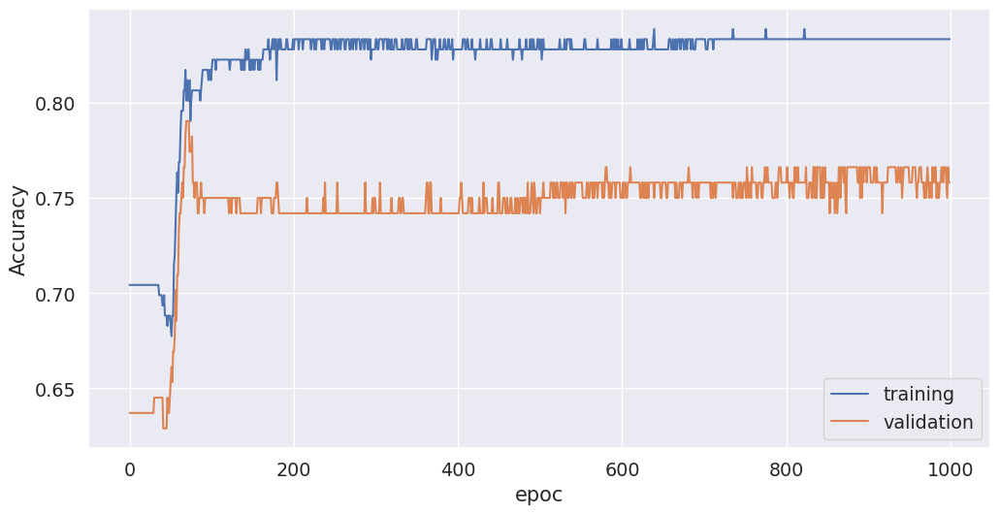

In [107]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Que pasa si quiero guardar los pesos de mi mejor modelo: necesito usar callbacks

In [108]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

EarlyStopping para de entrenar el modelo según una condición sobre la variable monitor

In [109]:
es = EarlyStopping(monitor='val_acc', mode='max')

In [110]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_44 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_45 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_46 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_47 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


In [111]:
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[es],
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.3176 - accuracy: 0.8125

186/186 [==============================] - 0s 759us/step - loss: 6.2800 - accuracy: 0.7043 - val_loss: 7.5855 - val_accuracy: 0.6371


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.7625 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 6.0272 - accuracy: 0.7043 - val_loss: 7.3387 - val_accuracy: 0.6371


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.4009 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 5.8394 - accuracy: 0.7043 - val_loss: 7.1259 - val_accuracy: 0.6371


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 7.3220 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 5.6746 - accuracy: 0.7043 - val_loss: 6.9285 - val_accuracy: 0.6371


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 5.7791 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 5.5149 - accuracy: 0.7043 - val_loss: 6.7384 - val_accuracy: 0.6371


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.7466 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 5.3631 - accuracy: 0.7043 - val_loss: 6.5557 - val_accuracy: 0.6371


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 6.1968 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 5.2134 - accuracy: 0.7043 - val_loss: 6.3650 - val_accuracy: 0.6371


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 6.0316 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 5.0596 - accuracy: 0.7043 - val_loss: 6.1790 - val_accuracy: 0.6371


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 5.6309 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 4.9088 - accuracy: 0.7043 - val_loss: 5.9945 - val_accuracy: 0.6371


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 5.0357 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 4.7610 - accuracy: 0.7043 - val_loss: 5.8146 - val_accuracy: 0.6371


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.5892 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 4.6135 - accuracy: 0.7043 - val_loss: 5.6323 - val_accuracy: 0.6371


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.1271 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 4.4673 - accuracy: 0.7043 - val_loss: 5.4520 - val_accuracy: 0.6371


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.7433 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 4.3235 - accuracy: 0.7043 - val_loss: 5.2823 - val_accuracy: 0.6371


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.1056 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 4.1845 - accuracy: 0.7043 - val_loss: 5.1106 - val_accuracy: 0.6371


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 5.1471 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 4.0464 - accuracy: 0.7043 - val_loss: 4.9429 - val_accuracy: 0.6371


Epoch 16/1000


 32/186 [====>.........................] - ETA: 0s - loss: 5.4636 - accuracy: 0.5938

/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


186/186 [==============================] - 0s 83us/step - loss: 3.9106 - accuracy: 0.7043 - val_loss: 4.7732 - val_accuracy: 0.6371


Epoch 17/1000


 32/186 [====>.........................] - ETA: 0s - loss: 4.7857 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 3.7712 - accuracy: 0.7043 - val_loss: 4.5988 - val_accuracy: 0.6371


Epoch 18/1000


 32/186 [====>.........................] - ETA: 0s - loss: 3.1157 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 3.6306 - accuracy: 0.7043 - val_loss: 4.4324 - val_accuracy: 0.6371


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.8846 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 3.4957 - accuracy: 0.7043 - val_loss: 4.2676 - val_accuracy: 0.6371


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.0064 - accuracy: 0.6562

186/186 [==============================] - 0s 80us/step - loss: 3.3614 - accuracy: 0.7043 - val_loss: 4.0993 - val_accuracy: 0.6371


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.5552 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 3.2251 - accuracy: 0.7043 - val_loss: 3.9358 - val_accuracy: 0.6371


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6298 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 3.0938 - accuracy: 0.7043 - val_loss: 3.7715 - val_accuracy: 0.6371


Epoch 23/1000


 32/186 [====>.........................] - ETA: 0s - loss: 3.6721 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 2.9615 - accuracy: 0.7043 - val_loss: 3.6161 - val_accuracy: 0.6371


Epoch 24/1000


 32/186 [====>.........................] - ETA: 0s - loss: 3.9027 - accuracy: 0.6250



186/186 [==============================] - 0s 72us/step - loss: 2.8342 - accuracy: 0.7043 - val_loss: 3.4571 - val_accuracy: 0.6371


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.2449 - accuracy: 0.5625

186/186 [==============================] - 0s 62us/step - loss: 2.7062 - accuracy: 0.7043 - val_loss: 3.3010 - val_accuracy: 0.6371


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.0233 - accuracy: 0.5625

186/186 [==============================] - 0s 65us/step - loss: 2.5780 - accuracy: 0.7043 - val_loss: 3.1407 - val_accuracy: 0.6371


Epoch 27/1000


 32/186 [====>.........................] - ETA: 0s - loss: 2.0375 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 2.4469 - accuracy: 0.7043 - val_loss: 2.9848 - val_accuracy: 0.6371


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6952 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 2.3188 - accuracy: 0.7043 - val_loss: 2.8269 - val_accuracy: 0.6371


Epoch 29/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.5105 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 2.1901 - accuracy: 0.7043 - val_loss: 2.6730 - val_accuracy: 0.6371


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8672 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 2.0631 - accuracy: 0.7043 - val_loss: 2.5152 - val_accuracy: 0.6371


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0719 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 1.9386 - accuracy: 0.7043 - val_loss: 2.3695 - val_accuracy: 0.6371


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3659 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 1.8194 - accuracy: 0.7043 - val_loss: 2.2276 - val_accuracy: 0.6371


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.7677 - accuracy: 0.5625

186/186 [==============================] - 0s 63us/step - loss: 1.7040 - accuracy: 0.7043 - val_loss: 2.0839 - val_accuracy: 0.6371


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.7714 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 1.5857 - accuracy: 0.7043 - val_loss: 1.9403 - val_accuracy: 0.6371


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.7006 - accuracy: 0.6562

186/186 [==============================] - 0s 81us/step - loss: 1.4690 - accuracy: 0.7043 - val_loss: 1.7997 - val_accuracy: 0.6371


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1962 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 1.3548 - accuracy: 0.7043 - val_loss: 1.6608 - val_accuracy: 0.6371


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.4747 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 1.2465 - accuracy: 0.7043 - val_loss: 1.5347 - val_accuracy: 0.6371


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5208 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 1.1463 - accuracy: 0.7043 - val_loss: 1.4124 - val_accuracy: 0.6371


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0349 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 1.0514 - accuracy: 0.7043 - val_loss: 1.2923 - val_accuracy: 0.6371


Epoch 40/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.8786 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.9586 - accuracy: 0.7043 - val_loss: 1.1722 - val_accuracy: 0.6371


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6711 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.8697 - accuracy: 0.7043 - val_loss: 1.0643 - val_accuracy: 0.6371


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4676 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.7936 - accuracy: 0.7043 - val_loss: 0.9669 - val_accuracy: 0.6371


Epoch 43/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6909 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.7281 - accuracy: 0.7043 - val_loss: 0.8910 - val_accuracy: 0.6371


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5702 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.6723 - accuracy: 0.7043 - val_loss: 0.8227 - val_accuracy: 0.6371


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6811 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6252 - accuracy: 0.7043 - val_loss: 0.7666 - val_accuracy: 0.6371


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3610 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5852 - accuracy: 0.7043 - val_loss: 0.7155 - val_accuracy: 0.6371


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6275 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.5514 - accuracy: 0.7043 - val_loss: 0.6767 - val_accuracy: 0.6371


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4278 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.5265 - accuracy: 0.6989 - val_loss: 0.6481 - val_accuracy: 0.6048


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4882 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.5057 - accuracy: 0.6882 - val_loss: 0.6285 - val_accuracy: 0.5565


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5168 - accuracy: 0.5625

186/186 [==============================] - 0s 94us/step - loss: 0.4916 - accuracy: 0.6774 - val_loss: 0.6138 - val_accuracy: 0.5161


Epoch 51/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4268 - accuracy: 0.6562

186/186 [==============================] - 0s 81us/step - loss: 0.4826 - accuracy: 0.6828 - val_loss: 0.6020 - val_accuracy: 0.5645


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4938 - accuracy: 0.6562

186/186 [==============================] - 0s 121us/step - loss: 0.4756 - accuracy: 0.7097 - val_loss: 0.5951 - val_accuracy: 0.6210


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5311 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.4729 - accuracy: 0.7043 - val_loss: 0.5883 - val_accuracy: 0.6210


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5189 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4702 - accuracy: 0.7258 - val_loss: 0.5859 - val_accuracy: 0.6371


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4958 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4670 - accuracy: 0.7258 - val_loss: 0.5834 - val_accuracy: 0.6371


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5105 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.4674 - accuracy: 0.7366 - val_loss: 0.5822 - val_accuracy: 0.6371


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4646 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4635 - accuracy: 0.7258 - val_loss: 0.5789 - val_accuracy: 0.6371


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5251 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.4608 - accuracy: 0.7366 - val_loss: 0.5738 - val_accuracy: 0.6452


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5431 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.4589 - accuracy: 0.7527 - val_loss: 0.5705 - val_accuracy: 0.6452


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5313 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4561 - accuracy: 0.7419 - val_loss: 0.5681 - val_accuracy: 0.6452


Epoch 61/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.4539 - accuracy: 0.7527 - val_loss: 0.5647 - val_accuracy: 0.6452


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5352 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4519 - accuracy: 0.7312 - val_loss: 0.5610 - val_accuracy: 0.6452


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4487 - accuracy: 0.7473 - val_loss: 0.5581 - val_accuracy: 0.6532


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4913 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.4464 - accuracy: 0.7473 - val_loss: 0.5532 - val_accuracy: 0.6532


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4268 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4443 - accuracy: 0.7419 - val_loss: 0.5496 - val_accuracy: 0.6452


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4456 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4409 - accuracy: 0.7473 - val_loss: 0.5470 - val_accuracy: 0.6452


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3657 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4384 - accuracy: 0.7366 - val_loss: 0.5444 - val_accuracy: 0.6452


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3027 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4375 - accuracy: 0.7419 - val_loss: 0.5415 - val_accuracy: 0.6452


Epoch 69/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.4347 - accuracy: 0.7473 - val_loss: 0.5387 - val_accuracy: 0.6452


Epoch 70/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4153 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.4316 - accuracy: 0.7634 - val_loss: 0.5352 - val_accuracy: 0.6452


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4343 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4299 - accuracy: 0.7473 - val_loss: 0.5310 - val_accuracy: 0.6532


Epoch 72/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3772 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.4266 - accuracy: 0.7688 - val_loss: 0.5284 - val_accuracy: 0.6532


Epoch 73/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4106 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4239 - accuracy: 0.7688 - val_loss: 0.5256 - val_accuracy: 0.6532


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4486 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.4194 - accuracy: 0.7634 - val_loss: 0.5213 - val_accuracy: 0.6613


Epoch 75/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3866 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4161 - accuracy: 0.7634 - val_loss: 0.5214 - val_accuracy: 0.6532


Epoch 76/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4159 - accuracy: 0.7527 - val_loss: 0.5200 - val_accuracy: 0.6613


Epoch 77/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3656 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4133 - accuracy: 0.7742 - val_loss: 0.5169 - val_accuracy: 0.6613


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3838 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4119 - accuracy: 0.7742 - val_loss: 0.5145 - val_accuracy: 0.6694


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4104 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.4105 - accuracy: 0.7796 - val_loss: 0.5140 - val_accuracy: 0.6694


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3842 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.4084 - accuracy: 0.7796 - val_loss: 0.5124 - val_accuracy: 0.6774


Epoch 81/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3345 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.4071 - accuracy: 0.7796 - val_loss: 0.5110 - val_accuracy: 0.6935


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3541 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4059 - accuracy: 0.7796 - val_loss: 0.5083 - val_accuracy: 0.6935


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5564 - accuracy: 0.5938

186/186 [==============================] - 0s 78us/step - loss: 0.4047 - accuracy: 0.7796 - val_loss: 0.5079 - val_accuracy: 0.6855


Epoch 84/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3975 - accuracy: 0.8438

186/186 [==============================] - 0s 95us/step - loss: 0.4017 - accuracy: 0.7796 - val_loss: 0.5060 - val_accuracy: 0.6855


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3798 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.4009 - accuracy: 0.7849 - val_loss: 0.5051 - val_accuracy: 0.6855


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4895 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3993 - accuracy: 0.7903 - val_loss: 0.5040 - val_accuracy: 0.6935


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4143 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3993 - accuracy: 0.7903 - val_loss: 0.5026 - val_accuracy: 0.6935


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4422 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.3977 - accuracy: 0.7903 - val_loss: 0.5013 - val_accuracy: 0.6935


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3523 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3954 - accuracy: 0.7903 - val_loss: 0.5006 - val_accuracy: 0.6935


Epoch 90/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4367 - accuracy: 0.7812

186/186 [==============================] - 0s 82us/step - loss: 0.3950 - accuracy: 0.7849 - val_loss: 0.5003 - val_accuracy: 0.6935


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4901 - accuracy: 0.7188

186/186 [==============================] - 0s 94us/step - loss: 0.3939 - accuracy: 0.7903 - val_loss: 0.5000 - val_accuracy: 0.7016


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3366 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3935 - accuracy: 0.8011 - val_loss: 0.4983 - val_accuracy: 0.7097


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3880 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3916 - accuracy: 0.7903 - val_loss: 0.4969 - val_accuracy: 0.7097


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3805 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3891 - accuracy: 0.8011 - val_loss: 0.4951 - val_accuracy: 0.7097


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3876 - accuracy: 0.8011 - val_loss: 0.4941 - val_accuracy: 0.7097


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3863 - accuracy: 0.8011 - val_loss: 0.4926 - val_accuracy: 0.7097


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4389 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3835 - accuracy: 0.8011 - val_loss: 0.4911 - val_accuracy: 0.7177


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.9062

186/186 [==============================] - 0s 80us/step - loss: 0.3831 - accuracy: 0.8065 - val_loss: 0.4897 - val_accuracy: 0.7177


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3325 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3799 - accuracy: 0.8118 - val_loss: 0.4876 - val_accuracy: 0.7419


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4211 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3777 - accuracy: 0.8172 - val_loss: 0.4862 - val_accuracy: 0.7419


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2601 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3762 - accuracy: 0.8172 - val_loss: 0.4848 - val_accuracy: 0.7500


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4927 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3740 - accuracy: 0.8333 - val_loss: 0.4835 - val_accuracy: 0.7500


Epoch 103/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4406 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3721 - accuracy: 0.8387 - val_loss: 0.4831 - val_accuracy: 0.7581


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4860 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3710 - accuracy: 0.8387 - val_loss: 0.4824 - val_accuracy: 0.7581


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3338 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3700 - accuracy: 0.8387 - val_loss: 0.4819 - val_accuracy: 0.7581


Epoch 106/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3022 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3686 - accuracy: 0.8387 - val_loss: 0.4815 - val_accuracy: 0.7581


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3514 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3682 - accuracy: 0.8387 - val_loss: 0.4813 - val_accuracy: 0.7661


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4287 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3672 - accuracy: 0.8333 - val_loss: 0.4808 - val_accuracy: 0.7661


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4073 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3661 - accuracy: 0.8387 - val_loss: 0.4804 - val_accuracy: 0.7661


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3653 - accuracy: 0.8333 - val_loss: 0.4801 - val_accuracy: 0.7661


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3209 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3643 - accuracy: 0.8280 - val_loss: 0.4797 - val_accuracy: 0.7661


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4955 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3651 - accuracy: 0.8333 - val_loss: 0.4793 - val_accuracy: 0.7661


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3660 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3637 - accuracy: 0.8333 - val_loss: 0.4789 - val_accuracy: 0.7581


Epoch 114/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3890 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3622 - accuracy: 0.8387 - val_loss: 0.4785 - val_accuracy: 0.7661


Epoch 115/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4002 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3622 - accuracy: 0.8387 - val_loss: 0.4782 - val_accuracy: 0.7661


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2089 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3615 - accuracy: 0.8387 - val_loss: 0.4781 - val_accuracy: 0.7661


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4568 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3611 - accuracy: 0.8441 - val_loss: 0.4777 - val_accuracy: 0.7661


Epoch 118/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2065 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.3612 - accuracy: 0.8333 - val_loss: 0.4773 - val_accuracy: 0.7661


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3245 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3610 - accuracy: 0.8387 - val_loss: 0.4771 - val_accuracy: 0.7661


Epoch 120/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2856 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3600 - accuracy: 0.8387 - val_loss: 0.4769 - val_accuracy: 0.7661


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3308 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3589 - accuracy: 0.8333 - val_loss: 0.4768 - val_accuracy: 0.7661


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3612 - accuracy: 0.8495 - val_loss: 0.4766 - val_accuracy: 0.7661


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2591 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3583 - accuracy: 0.8441 - val_loss: 0.4767 - val_accuracy: 0.7661


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3366 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3587 - accuracy: 0.8333 - val_loss: 0.4767 - val_accuracy: 0.7661


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3865 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3578 - accuracy: 0.8441 - val_loss: 0.4764 - val_accuracy: 0.7661


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4033 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3576 - accuracy: 0.8387 - val_loss: 0.4762 - val_accuracy: 0.7661


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3166 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3581 - accuracy: 0.8387 - val_loss: 0.4759 - val_accuracy: 0.7661


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5335 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3568 - accuracy: 0.8495 - val_loss: 0.4754 - val_accuracy: 0.7661


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4644 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3572 - accuracy: 0.8333 - val_loss: 0.4753 - val_accuracy: 0.7661


Epoch 130/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3574 - accuracy: 0.8280 - val_loss: 0.4753 - val_accuracy: 0.7661


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3580 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3572 - accuracy: 0.8333 - val_loss: 0.4752 - val_accuracy: 0.7661


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5283 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3567 - accuracy: 0.8387 - val_loss: 0.4750 - val_accuracy: 0.7661


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3875 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3553 - accuracy: 0.8495 - val_loss: 0.4746 - val_accuracy: 0.7661


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4364 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3556 - accuracy: 0.8548 - val_loss: 0.4743 - val_accuracy: 0.7661


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4866 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3547 - accuracy: 0.8495 - val_loss: 0.4740 - val_accuracy: 0.7661


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4561 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3561 - accuracy: 0.8441 - val_loss: 0.4737 - val_accuracy: 0.7661


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4141 - accuracy: 0.8438



186/186 [==============================] - 0s 63us/step - loss: 0.3549 - accuracy: 0.8441 - val_loss: 0.4733 - val_accuracy: 0.7661


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3545 - accuracy: 0.8387 - val_loss: 0.4734 - val_accuracy: 0.7661


Epoch 139/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3183 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3535 - accuracy: 0.8387 - val_loss: 0.4730 - val_accuracy: 0.7661


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4083 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3544 - accuracy: 0.8387 - val_loss: 0.4725 - val_accuracy: 0.7661


Epoch 141/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3534 - accuracy: 0.8495 - val_loss: 0.4724 - val_accuracy: 0.7661


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4479 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3531 - accuracy: 0.8387 - val_loss: 0.4723 - val_accuracy: 0.7661


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2894 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3527 - accuracy: 0.8333 - val_loss: 0.4722 - val_accuracy: 0.7661


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4601 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3530 - accuracy: 0.8387 - val_loss: 0.4721 - val_accuracy: 0.7661


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2591 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3527 - accuracy: 0.8441 - val_loss: 0.4723 - val_accuracy: 0.7661


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2840 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3519 - accuracy: 0.8495 - val_loss: 0.4722 - val_accuracy: 0.7661


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3036 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3521 - accuracy: 0.8495 - val_loss: 0.4717 - val_accuracy: 0.7661


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3242 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3509 - accuracy: 0.8441 - val_loss: 0.4715 - val_accuracy: 0.7661


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3815 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3510 - accuracy: 0.8441 - val_loss: 0.4714 - val_accuracy: 0.7661


Epoch 150/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4418 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3501 - accuracy: 0.8495 - val_loss: 0.4708 - val_accuracy: 0.7661


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3699 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3498 - accuracy: 0.8495 - val_loss: 0.4703 - val_accuracy: 0.7661


Epoch 152/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3922 - accuracy: 0.8125

186/186 [==============================] - 0s 82us/step - loss: 0.3510 - accuracy: 0.8441 - val_loss: 0.4697 - val_accuracy: 0.7661


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2576 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3503 - accuracy: 0.8441 - val_loss: 0.4699 - val_accuracy: 0.7661


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3156 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3515 - accuracy: 0.8495 - val_loss: 0.4696 - val_accuracy: 0.7661


Epoch 155/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2977 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3486 - accuracy: 0.8495 - val_loss: 0.4692 - val_accuracy: 0.7661


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3904 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3493 - accuracy: 0.8441 - val_loss: 0.4688 - val_accuracy: 0.7661


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4356 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3488 - accuracy: 0.8495 - val_loss: 0.4682 - val_accuracy: 0.7661


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3479 - accuracy: 0.8441 - val_loss: 0.4682 - val_accuracy: 0.7661


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2836 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3475 - accuracy: 0.8441 - val_loss: 0.4675 - val_accuracy: 0.7661


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3897 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3482 - accuracy: 0.8548 - val_loss: 0.4668 - val_accuracy: 0.7661


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3729 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3481 - accuracy: 0.8495 - val_loss: 0.4669 - val_accuracy: 0.7661


Epoch 162/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4137 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3493 - accuracy: 0.8387 - val_loss: 0.4666 - val_accuracy: 0.7742


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3132 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3473 - accuracy: 0.8495 - val_loss: 0.4665 - val_accuracy: 0.7742


Epoch 164/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3878 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3468 - accuracy: 0.8441 - val_loss: 0.4660 - val_accuracy: 0.7742


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3622 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3474 - accuracy: 0.8441 - val_loss: 0.4655 - val_accuracy: 0.7661


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4809 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3461 - accuracy: 0.8495 - val_loss: 0.4647 - val_accuracy: 0.7661


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3777 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3475 - accuracy: 0.8441 - val_loss: 0.4644 - val_accuracy: 0.7661


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2688 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3465 - accuracy: 0.8387 - val_loss: 0.4646 - val_accuracy: 0.7742


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3514 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3451 - accuracy: 0.8441 - val_loss: 0.4639 - val_accuracy: 0.7661


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4380 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3467 - accuracy: 0.8495 - val_loss: 0.4644 - val_accuracy: 0.7742


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2214 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.3457 - accuracy: 0.8441 - val_loss: 0.4637 - val_accuracy: 0.7742


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3335 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3450 - accuracy: 0.8495 - val_loss: 0.4637 - val_accuracy: 0.7742


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3737 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3448 - accuracy: 0.8495 - val_loss: 0.4629 - val_accuracy: 0.7742


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2619 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3450 - accuracy: 0.8441 - val_loss: 0.4624 - val_accuracy: 0.7742


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4519 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3450 - accuracy: 0.8495 - val_loss: 0.4617 - val_accuracy: 0.7742


Epoch 176/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4095 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3444 - accuracy: 0.8548 - val_loss: 0.4619 - val_accuracy: 0.7742


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2745 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3450 - accuracy: 0.8602 - val_loss: 0.4619 - val_accuracy: 0.7742


Epoch 178/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3448 - accuracy: 0.8495 - val_loss: 0.4615 - val_accuracy: 0.7742


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2866 - accuracy: 0.8750



186/186 [==============================] - 0s 66us/step - loss: 0.3446 - accuracy: 0.8495 - val_loss: 0.4610 - val_accuracy: 0.7742


Epoch 180/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2829 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3441 - accuracy: 0.8441 - val_loss: 0.4615 - val_accuracy: 0.7742


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3944 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3434 - accuracy: 0.8495 - val_loss: 0.4617 - val_accuracy: 0.7742


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2317 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3445 - accuracy: 0.8441 - val_loss: 0.4610 - val_accuracy: 0.7742


Epoch 183/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4490 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3429 - accuracy: 0.8495 - val_loss: 0.4598 - val_accuracy: 0.7742


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2293 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3444 - accuracy: 0.8495 - val_loss: 0.4593 - val_accuracy: 0.7742


Epoch 185/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2645 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3428 - accuracy: 0.8495 - val_loss: 0.4591 - val_accuracy: 0.7742


Epoch 186/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4109 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3430 - accuracy: 0.8441 - val_loss: 0.4586 - val_accuracy: 0.7742


Epoch 187/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3424 - accuracy: 0.8548 - val_loss: 0.4583 - val_accuracy: 0.7742


Epoch 188/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4281 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3429 - accuracy: 0.8495 - val_loss: 0.4587 - val_accuracy: 0.7742


Epoch 189/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3295 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3442 - accuracy: 0.8495 - val_loss: 0.4582 - val_accuracy: 0.7742


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2996 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3437 - accuracy: 0.8495 - val_loss: 0.4588 - val_accuracy: 0.7742


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4807 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3419 - accuracy: 0.8495 - val_loss: 0.4576 - val_accuracy: 0.7742


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3330 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3422 - accuracy: 0.8495 - val_loss: 0.4574 - val_accuracy: 0.7742


Epoch 193/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3356 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3416 - accuracy: 0.8548 - val_loss: 0.4579 - val_accuracy: 0.7742


Epoch 194/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3512 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3408 - accuracy: 0.8495 - val_loss: 0.4567 - val_accuracy: 0.7742


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2938 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3420 - accuracy: 0.8495 - val_loss: 0.4571 - val_accuracy: 0.7742


Epoch 196/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3101 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3411 - accuracy: 0.8495 - val_loss: 0.4573 - val_accuracy: 0.7742


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4020 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3411 - accuracy: 0.8441 - val_loss: 0.4561 - val_accuracy: 0.7742


Epoch 198/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3643 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3412 - accuracy: 0.8548 - val_loss: 0.4568 - val_accuracy: 0.7742


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2658 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3403 - accuracy: 0.8387 - val_loss: 0.4560 - val_accuracy: 0.7742


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4144 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3424 - accuracy: 0.8387 - val_loss: 0.4560 - val_accuracy: 0.7742


Epoch 201/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3713 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3408 - accuracy: 0.8441 - val_loss: 0.4551 - val_accuracy: 0.7742


Epoch 202/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2510 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3403 - accuracy: 0.8441 - val_loss: 0.4551 - val_accuracy: 0.7742


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3406 - accuracy: 0.8441 - val_loss: 0.4545 - val_accuracy: 0.7742


Epoch 204/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3398 - accuracy: 0.8495 - val_loss: 0.4545 - val_accuracy: 0.7742


Epoch 205/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2673 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3395 - accuracy: 0.8495 - val_loss: 0.4536 - val_accuracy: 0.7742


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4057 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3396 - accuracy: 0.8495 - val_loss: 0.4545 - val_accuracy: 0.7742


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3396 - accuracy: 0.8495 - val_loss: 0.4544 - val_accuracy: 0.7742


Epoch 208/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3070 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3401 - accuracy: 0.8441 - val_loss: 0.4534 - val_accuracy: 0.7742


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2469 - accuracy: 0.9062



186/186 [==============================] - 0s 64us/step - loss: 0.3400 - accuracy: 0.8548 - val_loss: 0.4544 - val_accuracy: 0.7742


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3386 - accuracy: 0.8495 - val_loss: 0.4534 - val_accuracy: 0.7742


Epoch 211/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5030 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3408 - accuracy: 0.8495 - val_loss: 0.4539 - val_accuracy: 0.7742


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2917 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3401 - accuracy: 0.8441 - val_loss: 0.4534 - val_accuracy: 0.7742


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4842 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3401 - accuracy: 0.8495 - val_loss: 0.4529 - val_accuracy: 0.7742


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3822 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3387 - accuracy: 0.8495 - val_loss: 0.4530 - val_accuracy: 0.7742


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4069 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3385 - accuracy: 0.8441 - val_loss: 0.4530 - val_accuracy: 0.7742


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3306 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3380 - accuracy: 0.8495 - val_loss: 0.4525 - val_accuracy: 0.7742


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4093 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3391 - accuracy: 0.8548 - val_loss: 0.4519 - val_accuracy: 0.7742


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3897 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3414 - accuracy: 0.8495 - val_loss: 0.4524 - val_accuracy: 0.7742


Epoch 219/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2403 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.3381 - accuracy: 0.8495 - val_loss: 0.4521 - val_accuracy: 0.7742


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3379 - accuracy: 0.8495 - val_loss: 0.4517 - val_accuracy: 0.7742


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3221 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3381 - accuracy: 0.8495 - val_loss: 0.4514 - val_accuracy: 0.7742


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3380 - accuracy: 0.8495 - val_loss: 0.4513 - val_accuracy: 0.7742


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3928 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3381 - accuracy: 0.8495 - val_loss: 0.4506 - val_accuracy: 0.7742


Epoch 224/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2916 - accuracy: 0.8750

186/186 [==============================] - 0s 91us/step - loss: 0.3380 - accuracy: 0.8548 - val_loss: 0.4504 - val_accuracy: 0.7742


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2809 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3378 - accuracy: 0.8441 - val_loss: 0.4507 - val_accuracy: 0.7742


Epoch 226/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3956 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3379 - accuracy: 0.8495 - val_loss: 0.4498 - val_accuracy: 0.7742


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2246 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3378 - accuracy: 0.8441 - val_loss: 0.4504 - val_accuracy: 0.7742


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4094 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3386 - accuracy: 0.8441 - val_loss: 0.4497 - val_accuracy: 0.7742


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3037 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3385 - accuracy: 0.8495 - val_loss: 0.4503 - val_accuracy: 0.7742


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3273 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3370 - accuracy: 0.8441 - val_loss: 0.4498 - val_accuracy: 0.7742


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4575 - accuracy: 0.8125



186/186 [==============================] - 0s 65us/step - loss: 0.3371 - accuracy: 0.8441 - val_loss: 0.4498 - val_accuracy: 0.7742


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5613 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3377 - accuracy: 0.8441 - val_loss: 0.4493 - val_accuracy: 0.7742


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2789 - accuracy: 0.8438



186/186 [==============================] - 0s 65us/step - loss: 0.3374 - accuracy: 0.8387 - val_loss: 0.4488 - val_accuracy: 0.7742


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1961 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.3381 - accuracy: 0.8495 - val_loss: 0.4492 - val_accuracy: 0.7742


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4473 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3363 - accuracy: 0.8441 - val_loss: 0.4483 - val_accuracy: 0.7742


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3164 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3366 - accuracy: 0.8441 - val_loss: 0.4492 - val_accuracy: 0.7742


Epoch 237/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3344 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3356 - accuracy: 0.8441 - val_loss: 0.4491 - val_accuracy: 0.7742


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3200 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3363 - accuracy: 0.8441 - val_loss: 0.4491 - val_accuracy: 0.7742


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4218 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3351 - accuracy: 0.8495 - val_loss: 0.4478 - val_accuracy: 0.7742


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2955 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3379 - accuracy: 0.8387 - val_loss: 0.4478 - val_accuracy: 0.7742


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3357 - accuracy: 0.8495 - val_loss: 0.4473 - val_accuracy: 0.7742


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2300 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3352 - accuracy: 0.8441 - val_loss: 0.4471 - val_accuracy: 0.7742


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4029 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3354 - accuracy: 0.8441 - val_loss: 0.4466 - val_accuracy: 0.7742


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3359 - accuracy: 0.8441 - val_loss: 0.4473 - val_accuracy: 0.7742


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4178 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3359 - accuracy: 0.8548 - val_loss: 0.4474 - val_accuracy: 0.7742


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2585 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3348 - accuracy: 0.8495 - val_loss: 0.4471 - val_accuracy: 0.7742


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3351 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3363 - accuracy: 0.8441 - val_loss: 0.4467 - val_accuracy: 0.7742


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.9062

186/186 [==============================] - 0s 81us/step - loss: 0.3339 - accuracy: 0.8548 - val_loss: 0.4470 - val_accuracy: 0.7742


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2344 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3341 - accuracy: 0.8548 - val_loss: 0.4455 - val_accuracy: 0.7742


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3351 - accuracy: 0.8387 - val_loss: 0.4454 - val_accuracy: 0.7742


Epoch 251/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2762 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3353 - accuracy: 0.8495 - val_loss: 0.4459 - val_accuracy: 0.7742


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3121 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3339 - accuracy: 0.8495 - val_loss: 0.4458 - val_accuracy: 0.7742


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1833 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3337 - accuracy: 0.8441 - val_loss: 0.4452 - val_accuracy: 0.7742


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3779 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3338 - accuracy: 0.8441 - val_loss: 0.4453 - val_accuracy: 0.7742


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3346 - accuracy: 0.8441 - val_loss: 0.4465 - val_accuracy: 0.7742


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3336 - accuracy: 0.8495 - val_loss: 0.4466 - val_accuracy: 0.7742


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2272 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3334 - accuracy: 0.8495 - val_loss: 0.4457 - val_accuracy: 0.7742


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2932 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3331 - accuracy: 0.8495 - val_loss: 0.4455 - val_accuracy: 0.7742


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4531 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3337 - accuracy: 0.8441 - val_loss: 0.4456 - val_accuracy: 0.7742


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2657 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3335 - accuracy: 0.8441 - val_loss: 0.4442 - val_accuracy: 0.7742


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4809 - accuracy: 0.8125

186/186 [==============================] - 0s 121us/step - loss: 0.3329 - accuracy: 0.8495 - val_loss: 0.4437 - val_accuracy: 0.7742


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3250 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3332 - accuracy: 0.8495 - val_loss: 0.4431 - val_accuracy: 0.7742


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3883 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3338 - accuracy: 0.8441 - val_loss: 0.4434 - val_accuracy: 0.7742


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3684 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3323 - accuracy: 0.8387 - val_loss: 0.4437 - val_accuracy: 0.7742


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2034 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3327 - accuracy: 0.8548 - val_loss: 0.4441 - val_accuracy: 0.7742


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5466 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3329 - accuracy: 0.8548 - val_loss: 0.4435 - val_accuracy: 0.7742


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2889 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3330 - accuracy: 0.8548 - val_loss: 0.4442 - val_accuracy: 0.7742


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2915 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3330 - accuracy: 0.8495 - val_loss: 0.4443 - val_accuracy: 0.7742


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2455 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3311 - accuracy: 0.8441 - val_loss: 0.4427 - val_accuracy: 0.7742


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3170 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3332 - accuracy: 0.8548 - val_loss: 0.4430 - val_accuracy: 0.7742


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4017 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3322 - accuracy: 0.8495 - val_loss: 0.4429 - val_accuracy: 0.7742


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3952 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3318 - accuracy: 0.8495 - val_loss: 0.4417 - val_accuracy: 0.7742


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3325 - accuracy: 0.8441 - val_loss: 0.4417 - val_accuracy: 0.7661


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3734 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3328 - accuracy: 0.8495 - val_loss: 0.4416 - val_accuracy: 0.7742


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2253 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3326 - accuracy: 0.8495 - val_loss: 0.4419 - val_accuracy: 0.7742


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3909 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3308 - accuracy: 0.8548 - val_loss: 0.4427 - val_accuracy: 0.7742


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3462 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3332 - accuracy: 0.8441 - val_loss: 0.4423 - val_accuracy: 0.7742


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2035 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3327 - accuracy: 0.8495 - val_loss: 0.4423 - val_accuracy: 0.7742


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3480 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3313 - accuracy: 0.8495 - val_loss: 0.4415 - val_accuracy: 0.7742


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2991 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.3310 - accuracy: 0.8548 - val_loss: 0.4405 - val_accuracy: 0.7742


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3704 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3304 - accuracy: 0.8548 - val_loss: 0.4400 - val_accuracy: 0.7742


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3475 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3307 - accuracy: 0.8495 - val_loss: 0.4412 - val_accuracy: 0.7742


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3936 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3315 - accuracy: 0.8495 - val_loss: 0.4409 - val_accuracy: 0.7742


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2893 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3308 - accuracy: 0.8495 - val_loss: 0.4418 - val_accuracy: 0.7742


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3808 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3307 - accuracy: 0.8495 - val_loss: 0.4410 - val_accuracy: 0.7742


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1862 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3311 - accuracy: 0.8441 - val_loss: 0.4410 - val_accuracy: 0.7742


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3317 - accuracy: 0.8441 - val_loss: 0.4406 - val_accuracy: 0.7742


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5156 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3303 - accuracy: 0.8333 - val_loss: 0.4402 - val_accuracy: 0.7742


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3292 - accuracy: 0.8495 - val_loss: 0.4406 - val_accuracy: 0.7742


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2282 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3305 - accuracy: 0.8441 - val_loss: 0.4394 - val_accuracy: 0.7742


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4237 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3297 - accuracy: 0.8495 - val_loss: 0.4393 - val_accuracy: 0.7742


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1739 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.3314 - accuracy: 0.8387 - val_loss: 0.4391 - val_accuracy: 0.7742


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4258 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3294 - accuracy: 0.8495 - val_loss: 0.4386 - val_accuracy: 0.7661


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2303 - accuracy: 0.8750

186/186 [==============================] - 0s 88us/step - loss: 0.3299 - accuracy: 0.8495 - val_loss: 0.4394 - val_accuracy: 0.7742


Epoch 295/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2636 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3295 - accuracy: 0.8441 - val_loss: 0.4397 - val_accuracy: 0.7742


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5188 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.3299 - accuracy: 0.8387 - val_loss: 0.4396 - val_accuracy: 0.7742


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4250 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3294 - accuracy: 0.8387 - val_loss: 0.4381 - val_accuracy: 0.7742


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2761 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.3324 - accuracy: 0.8495 - val_loss: 0.4383 - val_accuracy: 0.7742


Epoch 299/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2096 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3294 - accuracy: 0.8548 - val_loss: 0.4384 - val_accuracy: 0.7742


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3182 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3297 - accuracy: 0.8495 - val_loss: 0.4389 - val_accuracy: 0.7742


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2612 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3289 - accuracy: 0.8495 - val_loss: 0.4380 - val_accuracy: 0.7742


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3881 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3300 - accuracy: 0.8548 - val_loss: 0.4377 - val_accuracy: 0.7742


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3043 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3296 - accuracy: 0.8441 - val_loss: 0.4370 - val_accuracy: 0.7742


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3316 - accuracy: 0.8441 - val_loss: 0.4378 - val_accuracy: 0.7742


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4794 - accuracy: 0.7812

186/186 [==============================] - 0s 92us/step - loss: 0.3285 - accuracy: 0.8441 - val_loss: 0.4381 - val_accuracy: 0.7742


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.3280 - accuracy: 0.8441 - val_loss: 0.4376 - val_accuracy: 0.7742


Epoch 307/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2651 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3298 - accuracy: 0.8495 - val_loss: 0.4380 - val_accuracy: 0.7742


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3639 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3287 - accuracy: 0.8441 - val_loss: 0.4379 - val_accuracy: 0.7742


Epoch 309/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3352 - accuracy: 0.8750

186/186 [==============================] - 0s 92us/step - loss: 0.3287 - accuracy: 0.8495 - val_loss: 0.4373 - val_accuracy: 0.7742


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3265 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3286 - accuracy: 0.8495 - val_loss: 0.4376 - val_accuracy: 0.7742


Epoch 311/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3180 - accuracy: 0.8438

186/186 [==============================] - 0s 111us/step - loss: 0.3284 - accuracy: 0.8441 - val_loss: 0.4376 - val_accuracy: 0.7742


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2672 - accuracy: 0.8750



186/186 [==============================] - 0s 66us/step - loss: 0.3294 - accuracy: 0.8441 - val_loss: 0.4371 - val_accuracy: 0.7742


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3891 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3280 - accuracy: 0.8441 - val_loss: 0.4368 - val_accuracy: 0.7742


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3593 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3288 - accuracy: 0.8441 - val_loss: 0.4371 - val_accuracy: 0.7742


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3457 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3286 - accuracy: 0.8495 - val_loss: 0.4378 - val_accuracy: 0.7742


Epoch 316/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3613 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3268 - accuracy: 0.8441 - val_loss: 0.4370 - val_accuracy: 0.7823


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3540 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3276 - accuracy: 0.8548 - val_loss: 0.4369 - val_accuracy: 0.7823


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2895 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3274 - accuracy: 0.8441 - val_loss: 0.4362 - val_accuracy: 0.7823


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3273 - accuracy: 0.8441 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2600 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3261 - accuracy: 0.8495 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4961 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3243 - accuracy: 0.8495 - val_loss: 0.4327 - val_accuracy: 0.7742


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3009 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3256 - accuracy: 0.8602 - val_loss: 0.4331 - val_accuracy: 0.7742


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2452 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3259 - accuracy: 0.8656 - val_loss: 0.4335 - val_accuracy: 0.7742


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3245 - accuracy: 0.8495 - val_loss: 0.4335 - val_accuracy: 0.7742


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4638 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3238 - accuracy: 0.8441 - val_loss: 0.4318 - val_accuracy: 0.7823


Epoch 326/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3532 - accuracy: 0.7812



186/186 [==============================] - 0s 87us/step - loss: 0.3224 - accuracy: 0.8548 - val_loss: 0.4323 - val_accuracy: 0.7742


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2496 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3216 - accuracy: 0.8548 - val_loss: 0.4317 - val_accuracy: 0.7823


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2552 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3231 - accuracy: 0.8387 - val_loss: 0.4318 - val_accuracy: 0.7823


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3634 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3203 - accuracy: 0.8548 - val_loss: 0.4309 - val_accuracy: 0.7823


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3341 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3199 - accuracy: 0.8548 - val_loss: 0.4311 - val_accuracy: 0.7823


Epoch 331/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3544 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3199 - accuracy: 0.8495 - val_loss: 0.4298 - val_accuracy: 0.7823


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2808 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3193 - accuracy: 0.8495 - val_loss: 0.4311 - val_accuracy: 0.7823


Epoch 333/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4180 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3180 - accuracy: 0.8548 - val_loss: 0.4303 - val_accuracy: 0.7823


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2986 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3186 - accuracy: 0.8602 - val_loss: 0.4292 - val_accuracy: 0.7823


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3180 - accuracy: 0.8548 - val_loss: 0.4295 - val_accuracy: 0.7823


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4158 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3175 - accuracy: 0.8548 - val_loss: 0.4290 - val_accuracy: 0.7823


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3167 - accuracy: 0.8548 - val_loss: 0.4286 - val_accuracy: 0.7823


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2707 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3158 - accuracy: 0.8495 - val_loss: 0.4293 - val_accuracy: 0.7823


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2724 - accuracy: 0.9688

186/186 [==============================] - 0s 60us/step - loss: 0.3170 - accuracy: 0.8602 - val_loss: 0.4292 - val_accuracy: 0.7823


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2188 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3161 - accuracy: 0.8495 - val_loss: 0.4295 - val_accuracy: 0.7903


Epoch 341/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3159 - accuracy: 0.8495 - val_loss: 0.4286 - val_accuracy: 0.7903


Epoch 342/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4041 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3145 - accuracy: 0.8602 - val_loss: 0.4278 - val_accuracy: 0.7903


Epoch 343/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3942 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3136 - accuracy: 0.8548 - val_loss: 0.4263 - val_accuracy: 0.7823


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4652 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3149 - accuracy: 0.8495 - val_loss: 0.4277 - val_accuracy: 0.7903


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3764 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3130 - accuracy: 0.8548 - val_loss: 0.4268 - val_accuracy: 0.7903


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2480 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3122 - accuracy: 0.8602 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 347/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3134 - accuracy: 0.8495 - val_loss: 0.4257 - val_accuracy: 0.7903


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4050 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3121 - accuracy: 0.8441 - val_loss: 0.4263 - val_accuracy: 0.7903


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3367 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3130 - accuracy: 0.8548 - val_loss: 0.4262 - val_accuracy: 0.7903


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3219 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3114 - accuracy: 0.8495 - val_loss: 0.4270 - val_accuracy: 0.7903


Epoch 351/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2922 - accuracy: 0.8125

186/186 [==============================] - 0s 87us/step - loss: 0.3124 - accuracy: 0.8602 - val_loss: 0.4261 - val_accuracy: 0.7903


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3179 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3111 - accuracy: 0.8441 - val_loss: 0.4253 - val_accuracy: 0.7903


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2274 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3113 - accuracy: 0.8495 - val_loss: 0.4243 - val_accuracy: 0.7903


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3110 - accuracy: 0.8441 - val_loss: 0.4262 - val_accuracy: 0.7903


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3722 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3116 - accuracy: 0.8495 - val_loss: 0.4241 - val_accuracy: 0.7903


Epoch 356/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3064 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3109 - accuracy: 0.8495 - val_loss: 0.4237 - val_accuracy: 0.7903


Epoch 357/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4057 - accuracy: 0.7500

186/186 [==============================] - 0s 90us/step - loss: 0.3104 - accuracy: 0.8495 - val_loss: 0.4243 - val_accuracy: 0.7903


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3893 - accuracy: 0.7812

186/186 [==============================] - 0s 101us/step - loss: 0.3097 - accuracy: 0.8548 - val_loss: 0.4225 - val_accuracy: 0.7903


Epoch 359/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2829 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3099 - accuracy: 0.8441 - val_loss: 0.4232 - val_accuracy: 0.7903


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1917 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3117 - accuracy: 0.8441 - val_loss: 0.4241 - val_accuracy: 0.7903


Epoch 361/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2647 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3090 - accuracy: 0.8441 - val_loss: 0.4241 - val_accuracy: 0.7903


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1844 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3084 - accuracy: 0.8495 - val_loss: 0.4237 - val_accuracy: 0.7903


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3674 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3088 - accuracy: 0.8387 - val_loss: 0.4224 - val_accuracy: 0.7903


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3293 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3094 - accuracy: 0.8441 - val_loss: 0.4235 - val_accuracy: 0.7903


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2731 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3104 - accuracy: 0.8441 - val_loss: 0.4235 - val_accuracy: 0.7903


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2200 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3106 - accuracy: 0.8495 - val_loss: 0.4243 - val_accuracy: 0.7903


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2231 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3092 - accuracy: 0.8387 - val_loss: 0.4235 - val_accuracy: 0.7903


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3821 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3108 - accuracy: 0.8495 - val_loss: 0.4230 - val_accuracy: 0.7903


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2571 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3084 - accuracy: 0.8387 - val_loss: 0.4222 - val_accuracy: 0.7903


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2552 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3077 - accuracy: 0.8441 - val_loss: 0.4239 - val_accuracy: 0.7903


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2410 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3074 - accuracy: 0.8495 - val_loss: 0.4232 - val_accuracy: 0.7903


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3919 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3076 - accuracy: 0.8387 - val_loss: 0.4216 - val_accuracy: 0.7903


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3376 - accuracy: 0.8125

186/186 [==============================] - 0s 84us/step - loss: 0.3066 - accuracy: 0.8441 - val_loss: 0.4231 - val_accuracy: 0.7903


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1586 - accuracy: 0.9375

186/186 [==============================] - 0s 76us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4236 - val_accuracy: 0.7903


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2875 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3072 - accuracy: 0.8441 - val_loss: 0.4265 - val_accuracy: 0.7903


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2811 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3074 - accuracy: 0.8495 - val_loss: 0.4229 - val_accuracy: 0.7903


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3040 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3072 - accuracy: 0.8441 - val_loss: 0.4247 - val_accuracy: 0.7903


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4144 - accuracy: 0.7812

186/186 [==============================] - 0s 95us/step - loss: 0.3069 - accuracy: 0.8441 - val_loss: 0.4259 - val_accuracy: 0.7903


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4352 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4243 - val_accuracy: 0.7903


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2911 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3063 - accuracy: 0.8441 - val_loss: 0.4249 - val_accuracy: 0.7903


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2583 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3067 - accuracy: 0.8387 - val_loss: 0.4248 - val_accuracy: 0.7903


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2604 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3060 - accuracy: 0.8495 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3653 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3061 - accuracy: 0.8441 - val_loss: 0.4205 - val_accuracy: 0.7903


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3072 - accuracy: 0.8441 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3568 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3056 - accuracy: 0.8387 - val_loss: 0.4225 - val_accuracy: 0.7903


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2387 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3058 - accuracy: 0.8387 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3066 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3059 - accuracy: 0.8441 - val_loss: 0.4229 - val_accuracy: 0.7903


Epoch 388/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3605 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3055 - accuracy: 0.8387 - val_loss: 0.4234 - val_accuracy: 0.7903


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3359 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3058 - accuracy: 0.8441 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2123 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3075 - accuracy: 0.8441 - val_loss: 0.4204 - val_accuracy: 0.7903


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2616 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3057 - accuracy: 0.8387 - val_loss: 0.4221 - val_accuracy: 0.7903


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1822 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.3054 - accuracy: 0.8387 - val_loss: 0.4218 - val_accuracy: 0.7903


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5101 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 0.3068 - accuracy: 0.8387 - val_loss: 0.4215 - val_accuracy: 0.7903


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3217 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3057 - accuracy: 0.8441 - val_loss: 0.4227 - val_accuracy: 0.7903


Epoch 395/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2344 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3052 - accuracy: 0.8441 - val_loss: 0.4210 - val_accuracy: 0.7903


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3359 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.3049 - accuracy: 0.8387 - val_loss: 0.4228 - val_accuracy: 0.7903


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2490 - accuracy: 0.9062

186/186 [==============================] - 0s 80us/step - loss: 0.3062 - accuracy: 0.8495 - val_loss: 0.4215 - val_accuracy: 0.7903


Epoch 398/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2915 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3043 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 399/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3053 - accuracy: 0.8387 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 400/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3828 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3051 - accuracy: 0.8495 - val_loss: 0.4197 - val_accuracy: 0.7903


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2298 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3041 - accuracy: 0.8387 - val_loss: 0.4213 - val_accuracy: 0.7903


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.9062



186/186 [==============================] - 0s 72us/step - loss: 0.3049 - accuracy: 0.8387 - val_loss: 0.4217 - val_accuracy: 0.7903


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2409 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3043 - accuracy: 0.8495 - val_loss: 0.4181 - val_accuracy: 0.7903


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2089 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3041 - accuracy: 0.8441 - val_loss: 0.4162 - val_accuracy: 0.7984


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3790 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3042 - accuracy: 0.8387 - val_loss: 0.4154 - val_accuracy: 0.7984


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2476 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3037 - accuracy: 0.8387 - val_loss: 0.4156 - val_accuracy: 0.7984


Epoch 407/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2694 - accuracy: 0.8750



186/186 [==============================] - 0s 81us/step - loss: 0.3040 - accuracy: 0.8441 - val_loss: 0.4157 - val_accuracy: 0.7984


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1385 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3054 - accuracy: 0.8333 - val_loss: 0.4179 - val_accuracy: 0.7903


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2505 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3036 - accuracy: 0.8441 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 410/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3362 - accuracy: 0.8125



186/186 [==============================] - 0s 68us/step - loss: 0.3043 - accuracy: 0.8387 - val_loss: 0.4204 - val_accuracy: 0.7903


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3115 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3034 - accuracy: 0.8387 - val_loss: 0.4204 - val_accuracy: 0.7903


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3206 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.3035 - accuracy: 0.8441 - val_loss: 0.4180 - val_accuracy: 0.7903


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3040 - accuracy: 0.8387 - val_loss: 0.4181 - val_accuracy: 0.7903


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2485 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3044 - accuracy: 0.8441 - val_loss: 0.4182 - val_accuracy: 0.7903


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3738 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3030 - accuracy: 0.8387 - val_loss: 0.4167 - val_accuracy: 0.7984


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4137 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3026 - accuracy: 0.8387 - val_loss: 0.4152 - val_accuracy: 0.7984


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2716 - accuracy: 0.9062

186/186 [==============================] - 0s 99us/step - loss: 0.3039 - accuracy: 0.8387 - val_loss: 0.4163 - val_accuracy: 0.7984


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4204 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3030 - accuracy: 0.8387 - val_loss: 0.4167 - val_accuracy: 0.7903


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3626 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3036 - accuracy: 0.8441 - val_loss: 0.4162 - val_accuracy: 0.7984


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3729 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3033 - accuracy: 0.8333 - val_loss: 0.4182 - val_accuracy: 0.7903


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3011 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3029 - accuracy: 0.8387 - val_loss: 0.4152 - val_accuracy: 0.7984


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3494 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3021 - accuracy: 0.8387 - val_loss: 0.4135 - val_accuracy: 0.7984


Epoch 423/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3269 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3042 - accuracy: 0.8441 - val_loss: 0.4137 - val_accuracy: 0.7984


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3067 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3025 - accuracy: 0.8387 - val_loss: 0.4139 - val_accuracy: 0.7984


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3528 - accuracy: 0.8125

186/186 [==============================]

 - 0s 70us/step - loss: 0.3029 - accuracy: 0.8387 - val_loss: 0.4145 - val_accuracy: 0.7984


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4210 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3024 - accuracy: 0.8387 - val_loss: 0.4150 - val_accuracy: 0.7984


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4095 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3030 - accuracy: 0.8387 - val_loss: 0.4151 - val_accuracy: 0.7984


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4017 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.3021 - accuracy: 0.8387 - val_loss: 0.4173 - val_accuracy: 0.7903


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3025 - accuracy: 0.8387 - val_loss: 0.4173 - val_accuracy: 0.7903


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3289 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.3025 - accuracy: 0.8387 - val_loss: 0.4178 - val_accuracy: 0.7984


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2111 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3019 - accuracy: 0.8387 - val_loss: 0.4155 - val_accuracy: 0.7984


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3468 - accuracy: 0.7500

186/186 [==============================] - 0s 82us/step - loss: 0.3020 - accuracy: 0.8387 - val_loss: 0.4136 - val_accuracy: 0.7984


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2416 - accuracy: 0.9375

186/186 [==============================] - 0s 141us/step - loss: 0.3014 - accuracy: 0.8387 - val_loss: 0.4114 - val_accuracy: 0.7984


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.3027 - accuracy: 0.8280 - val_loss: 0.4147 - val_accuracy: 0.7984


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3017 - accuracy: 0.8387 - val_loss: 0.4133 - val_accuracy: 0.7984


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2889 - accuracy: 0.8438

186/186 [==============================] - 0s 85us/step - loss: 0.3027 - accuracy: 0.8333 - val_loss: 0.4127 - val_accuracy: 0.7984


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2477 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3010 - accuracy: 0.8387 - val_loss: 0.4117 - val_accuracy: 0.7984


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2570 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.3031 - accuracy: 0.8333 - val_loss: 0.4141 - val_accuracy: 0.8065


Epoch 439/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2415 - accuracy: 0.8750

186/186 [==============================] - 0s 91us/step - loss: 0.3018 - accuracy: 0.8333 - val_loss: 0.4153 - val_accuracy: 0.8065


Epoch 440/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3485 - accuracy: 0.7812

186/186 [==============================] - 0s 82us/step - loss: 0.3018 - accuracy: 0.8441 - val_loss: 0.4121 - val_accuracy: 0.7984


Epoch 441/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2038 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3011 - accuracy: 0.8387 - val_loss: 0.4132 - val_accuracy: 0.8065


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1803 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3016 - accuracy: 0.8441 - val_loss: 0.4109 - val_accuracy: 0.7984


Epoch 443/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4297 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.3019 - accuracy: 0.8387 - val_loss: 0.4115 - val_accuracy: 0.7984


Epoch 444/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3101 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3015 - accuracy: 0.8441 - val_loss: 0.4086 - val_accuracy: 0.7984


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3269 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3011 - accuracy: 0.8333 - val_loss: 0.4109 - val_accuracy: 0.7984


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3438 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3003 - accuracy: 0.8387 - val_loss: 0.4109 - val_accuracy: 0.7984


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3369 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3003 - accuracy: 0.8387 - val_loss: 0.4108 - val_accuracy: 0.7984


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2122 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3008 - accuracy: 0.8333 - val_loss: 0.4113 - val_accuracy: 0.8065


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2616 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2998 - accuracy: 0.8387 - val_loss: 0.4091 - val_accuracy: 0.7984


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3012 - accuracy: 0.8333 - val_loss: 0.4111 - val_accuracy: 0.8065


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1607 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3014 - accuracy: 0.8387 - val_loss: 0.4095 - val_accuracy: 0.7984


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3014 - accuracy: 0.8387 - val_loss: 0.4074 - val_accuracy: 0.7984


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2184 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3003 - accuracy: 0.8333 - val_loss: 0.4094 - val_accuracy: 0.7984


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4353 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3003 - accuracy: 0.8387 - val_loss: 0.4104 - val_accuracy: 0.8065


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2993 - accuracy: 0.8441 - val_loss: 0.4075 - val_accuracy: 0.7984


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3866 - accuracy: 0.7188



186/186 [==============================] - 0s 70us/step - loss: 0.3007 - accuracy: 0.8333 - val_loss: 0.4094 - val_accuracy: 0.8065


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3521 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3016 - accuracy: 0.8387 - val_loss: 0.4064 - val_accuracy: 0.7984


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2946 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3005 - accuracy: 0.8333 - val_loss: 0.4085 - val_accuracy: 0.7984


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3003 - accuracy: 0.8333 - val_loss: 0.4100 - val_accuracy: 0.8065


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3342 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3016 - accuracy: 0.8333 - val_loss: 0.4110 - val_accuracy: 0.8065


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2968 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2997 - accuracy: 0.8333 - val_loss: 0.4080 - val_accuracy: 0.7984


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2953 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3004 - accuracy: 0.8333 - val_loss: 0.4091 - val_accuracy: 0.8065


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2771 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3004 - accuracy: 0.8333 - val_loss: 0.4110 - val_accuracy: 0.8065


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2863 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2999 - accuracy: 0.8333 - val_loss: 0.4108 - val_accuracy: 0.8065


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3349 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2992 - accuracy: 0.8441 - val_loss: 0.4097 - val_accuracy: 0.8065


Epoch 466/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3512 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3012 - accuracy: 0.8387 - val_loss: 0.4113 - val_accuracy: 0.8065


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2996 - accuracy: 0.8441 - val_loss: 0.4070 - val_accuracy: 0.8065


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2996 - accuracy: 0.8387 - val_loss: 0.4062 - val_accuracy: 0.7984


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3247 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3002 - accuracy: 0.8387 - val_loss: 0.4047 - val_accuracy: 0.7984


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3012 - accuracy: 0.8226 - val_loss: 0.4069 - val_accuracy: 0.8065


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3007 - accuracy: 0.8387 - val_loss: 0.4064 - val_accuracy: 0.8065


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3659 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.2999 - accuracy: 0.8333 - val_loss: 0.4065 - val_accuracy: 0.8065


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3651 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3014 - accuracy: 0.8226 - val_loss: 0.4071 - val_accuracy: 0.8065


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2991 - accuracy: 0.8333 - val_loss: 0.4069 - val_accuracy: 0.8065


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2804 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2997 - accuracy: 0.8387 - val_loss: 0.4075 - val_accuracy: 0.8065


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2583 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2992 - accuracy: 0.8280 - val_loss: 0.4083 - val_accuracy: 0.8065


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2041 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2988 - accuracy: 0.8333 - val_loss: 0.4109 - val_accuracy: 0.8065


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1881 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2990 - accuracy: 0.8387 - val_loss: 0.4095 - val_accuracy: 0.8065


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3434 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3001 - accuracy: 0.8387 - val_loss: 0.4075 - val_accuracy: 0.8065


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2569 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2996 - accuracy: 0.8387 - val_loss: 0.4061 - val_accuracy: 0.8065


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2115 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3001 - accuracy: 0.8387 - val_loss: 0.4061 - val_accuracy: 0.8065


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3643 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2987 - accuracy: 0.8333 - val_loss: 0.4048 - val_accuracy: 0.8065


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2402 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2981 - accuracy: 0.8387 - val_loss: 0.4029 - val_accuracy: 0.7984


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3323 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2988 - accuracy: 0.8280 - val_loss: 0.4048 - val_accuracy: 0.8065


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2670 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2991 - accuracy: 0.8387 - val_loss: 0.4046 - val_accuracy: 0.8065


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4132 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2990 - accuracy: 0.8333 - val_loss: 0.4037 - val_accuracy: 0.8065


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2672 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2981 - accuracy: 0.8280 - val_loss: 0.4072 - val_accuracy: 0.8065


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3132 - accuracy: 0.8438



186/186 [==============================] - 0s 68us/step - loss: 0.2975 - accuracy: 0.8333 - val_loss: 0.4017 - val_accuracy: 0.8065


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4645 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.3001 - accuracy: 0.8226 - val_loss: 0.4070 - val_accuracy: 0.8065


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1558 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2986 - accuracy: 0.8333 - val_loss: 0.4068 - val_accuracy: 0.8065


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3407 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2987 - accuracy: 0.8387 - val_loss: 0.4043 - val_accuracy: 0.8065


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2991 - accuracy: 0.8280 - val_loss: 0.4050 - val_accuracy: 0.8065


Epoch 493/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2440 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2986 - accuracy: 0.8280 - val_loss: 0.4061 - val_accuracy: 0.8065


Epoch 494/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2303 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2980 - accuracy: 0.8280 - val_loss: 0.4078 - val_accuracy: 0.8065


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3045 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2977 - accuracy: 0.8387 - val_loss: 0.4042 - val_accuracy: 0.8065


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2746 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3035 - accuracy: 0.8333 - val_loss: 0.4025 - val_accuracy: 0.8065


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3871 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2978 - accuracy: 0.8333 - val_loss: 0.4035 - val_accuracy: 0.8065


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3082 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2983 - accuracy: 0.8333 - val_loss: 0.4017 - val_accuracy: 0.8065


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3651 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3005 - accuracy: 0.8333 - val_loss: 0.4028 - val_accuracy: 0.8065


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2572 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2979 - accuracy: 0.8333 - val_loss: 0.4036 - val_accuracy: 0.8065


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2857 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2974 - accuracy: 0.8333 - val_loss: 0.4025 - val_accuracy: 0.8065


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2785 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2990 - accuracy: 0.8387 - val_loss: 0.4022 - val_accuracy: 0.8065


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2471 - accuracy: 0.8750



186/186 [==============================] - 0s 64us/step - loss: 0.2993 - accuracy: 0.8226 - val_loss: 0.4031 - val_accuracy: 0.8065


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1988 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2978 - accuracy: 0.8333 - val_loss: 0.4037 - val_accuracy: 0.8065


Epoch 505/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4004 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2977 - accuracy: 0.8333 - val_loss: 0.4036 - val_accuracy: 0.8065


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3253 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2984 - accuracy: 0.8387 - val_loss: 0.4017 - val_accuracy: 0.8065


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2989 - accuracy: 0.8333 - val_loss: 0.4008 - val_accuracy: 0.8065


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2976 - accuracy: 0.8280 - val_loss: 0.4028 - val_accuracy: 0.8065


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2256 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.2982 - accuracy: 0.8333 - val_loss: 0.4023 - val_accuracy: 0.8065


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4024 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2987 - accuracy: 0.8280 - val_loss: 0.4023 - val_accuracy: 0.8065


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3353 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2999 - accuracy: 0.8333 - val_loss: 0.4040 - val_accuracy: 0.8065


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2005 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2995 - accuracy: 0.8333 - val_loss: 0.4023 - val_accuracy: 0.8065


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2322 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2981 - accuracy: 0.8280 - val_loss: 0.4021 - val_accuracy: 0.8065


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2666 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.4024 - val_accuracy: 0.8065


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3202 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2968 - accuracy: 0.8280 - val_loss: 0.4029 - val_accuracy: 0.8065


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1333 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2971 - accuracy: 0.8333 - val_loss: 0.4024 - val_accuracy: 0.8065


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2003 - accuracy: 0.9062

186/186 [==============================] - 0s 96us/step - loss: 0.2969 - accuracy: 0.8333 - val_loss: 0.4039 - val_accuracy: 0.8065


Epoch 518/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3383 - accuracy: 0.8125

186/186 [==============================] - 0s 96us/step - loss: 0.2983 - accuracy: 0.8280 - val_loss: 0.4024 - val_accuracy: 0.8065


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3595 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2977 - accuracy: 0.8333 - val_loss: 0.4001 - val_accuracy: 0.8065


Epoch 520/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1868 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.2978 - accuracy: 0.8333 - val_loss: 0.4000 - val_accuracy: 0.8065


Epoch 521/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2751 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.2983 - accuracy: 0.8226 - val_loss: 0.4031 - val_accuracy: 0.8065


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3308 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2976 - accuracy: 0.8333 - val_loss: 0.4014 - val_accuracy: 0.8065


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4011 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2971 - accuracy: 0.8280 - val_loss: 0.4030 - val_accuracy: 0.8065


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2322 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2974 - accuracy: 0.8333 - val_loss: 0.4027 - val_accuracy: 0.8065


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2268 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2973 - accuracy: 0.8333 - val_loss: 0.4008 - val_accuracy: 0.8065


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.4032 - val_accuracy: 0.8065


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5690 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.2972 - accuracy: 0.8280 - val_loss: 0.4032 - val_accuracy: 0.8065


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3169 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2984 - accuracy: 0.8387 - val_loss: 0.4019 - val_accuracy: 0.8065


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3710 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2972 - accuracy: 0.8333 - val_loss: 0.4008 - val_accuracy: 0.8065


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2981 - accuracy: 0.8280 - val_loss: 0.4012 - val_accuracy: 0.8065


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4398 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2975 - accuracy: 0.8280 - val_loss: 0.4028 - val_accuracy: 0.8065


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2968 - accuracy: 0.8280 - val_loss: 0.4039 - val_accuracy: 0.8065


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4200 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2966 - accuracy: 0.8333 - val_loss: 0.4040 - val_accuracy: 0.8065


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3483 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2964 - accuracy: 0.8333 - val_loss: 0.4004 - val_accuracy: 0.8065


Epoch 535/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2958 - accuracy: 0.8280 - val_loss: 0.4021 - val_accuracy: 0.8065


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3031 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2965 - accuracy: 0.8333 - val_loss: 0.4030 - val_accuracy: 0.8065


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2961 - accuracy: 0.8441 - val_loss: 0.3983 - val_accuracy: 0.8145


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3564 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2967 - accuracy: 0.8333 - val_loss: 0.3995 - val_accuracy: 0.8065


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2595 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2963 - accuracy: 0.8333 - val_loss: 0.4008 - val_accuracy: 0.8065


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3655 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2990 - accuracy: 0.8172 - val_loss: 0.3997 - val_accuracy: 0.8065


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2659 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2964 - accuracy: 0.8333 - val_loss: 0.4008 - val_accuracy: 0.8065


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3476 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2956 - accuracy: 0.8280 - val_loss: 0.4012 - val_accuracy: 0.8065


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2483 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2982 - accuracy: 0.8226 - val_loss: 0.4020 - val_accuracy: 0.8065


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2944 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2961 - accuracy: 0.8333 - val_loss: 0.3990 - val_accuracy: 0.8065


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.2965 - accuracy: 0.8172 - val_loss: 0.4026 - val_accuracy: 0.8065


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2469 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2966 - accuracy: 0.8226 - val_loss: 0.4024 - val_accuracy: 0.8065


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1979 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2964 - accuracy: 0.8387 - val_loss: 0.4020 - val_accuracy: 0.8065


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3146 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2991 - accuracy: 0.8280 - val_loss: 0.4011 - val_accuracy: 0.8065


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3563 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2965 - accuracy: 0.8280 - val_loss: 0.4001 - val_accuracy: 0.8065


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2270 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2965 - accuracy: 0.8333 - val_loss: 0.3987 - val_accuracy: 0.8145


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3468 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2968 - accuracy: 0.8226 - val_loss: 0.4000 - val_accuracy: 0.8065


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2304 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2953 - accuracy: 0.8333 - val_loss: 0.3998 - val_accuracy: 0.8065


Epoch 553/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2962 - accuracy: 0.8280 - val_loss: 0.3977 - val_accuracy: 0.8145


Epoch 554/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2955 - accuracy: 0.8280 - val_loss: 0.4001 - val_accuracy: 0.8065


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3608 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2970 - accuracy: 0.8387 - val_loss: 0.3965 - val_accuracy: 0.8065


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2586 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2965 - accuracy: 0.8280 - val_loss: 0.3972 - val_accuracy: 0.8145


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2877 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2966 - accuracy: 0.8280 - val_loss: 0.3986 - val_accuracy: 0.8145


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2494 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2967 - accuracy: 0.8333 - val_loss: 0.3985 - val_accuracy: 0.8145


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2860 - accuracy: 0.8750

186/186 [==============================] - 0s 89us/step - loss: 0.2951 - accuracy: 0.8333 - val_loss: 0.3979 - val_accuracy: 0.8145


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3556 - accuracy: 0.7188

186/186 [==============================] - 0s 89us/step - loss: 0.2959 - accuracy: 0.8280 - val_loss: 0.3989 - val_accuracy: 0.8145


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4362 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.2954 - accuracy: 0.8280 - val_loss: 0.3983 - val_accuracy: 0.8145


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2182 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2964 - accuracy: 0.8226 - val_loss: 0.3985 - val_accuracy: 0.8145


Epoch 563/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3043 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.2963 - accuracy: 0.8280 - val_loss: 0.3995 - val_accuracy: 0.8145


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.8125



186/186 [==============================] - 0s 69us/step - loss: 0.2957 - accuracy: 0.8387 - val_loss: 0.3973 - val_accuracy: 0.8145


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.8125



186/186 [==============================] - 0s 64us/step - loss: 0.2961 - accuracy: 0.8226 - val_loss: 0.4000 - val_accuracy: 0.8065


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3045 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2963 - accuracy: 0.8333 - val_loss: 0.3995 - val_accuracy: 0.8145


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2635 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.3986 - val_accuracy: 0.8145


Epoch 568/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2957 - accuracy: 0.8333 - val_loss: 0.3985 - val_accuracy: 0.8145


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2577 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2953 - accuracy: 0.8280 - val_loss: 0.3982 - val_accuracy: 0.8145


Epoch 570/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1953 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.2966 - accuracy: 0.8387 - val_loss: 0.3982 - val_accuracy: 0.8145


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1972 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2948 - accuracy: 0.8333 - val_loss: 0.3992 - val_accuracy: 0.8145


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2623 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2957 - accuracy: 0.8226 - val_loss: 0.4008 - val_accuracy: 0.8065


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3171 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2947 - accuracy: 0.8333 - val_loss: 0.3980 - val_accuracy: 0.8145


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2938 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2959 - accuracy: 0.8280 - val_loss: 0.3942 - val_accuracy: 0.8065


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2651 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2956 - accuracy: 0.8172 - val_loss: 0.3971 - val_accuracy: 0.8145


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2524 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2968 - accuracy: 0.8441 - val_loss: 0.3979 - val_accuracy: 0.8145


Epoch 577/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3164 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.2965 - accuracy: 0.8280 - val_loss: 0.3987 - val_accuracy: 0.8145


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1795 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2954 - accuracy: 0.8333 - val_loss: 0.4005 - val_accuracy: 0.8065


Epoch 579/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3548 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.2948 - accuracy: 0.8280 - val_loss: 0.4018 - val_accuracy: 0.8065


Epoch 580/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5408 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.2952 - accuracy: 0.8387 - val_loss: 0.3974 - val_accuracy: 0.8145


Epoch 581/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4544 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.2942 - accuracy: 0.8333 - val_loss: 0.3949 - val_accuracy: 0.8065


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2406 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2959 - accuracy: 0.8333 - val_loss: 0.3950 - val_accuracy: 0.8065


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3049 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2951 - accuracy: 0.8387 - val_loss: 0.3930 - val_accuracy: 0.8145


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1580 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2959 - accuracy: 0.8280 - val_loss: 0.3952 - val_accuracy: 0.8065


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1865 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2953 - accuracy: 0.8172 - val_loss: 0.3990 - val_accuracy: 0.8145


Epoch 586/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2173 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2959 - accuracy: 0.8226 - val_loss: 0.3980 - val_accuracy: 0.8145


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4074 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2949 - accuracy: 0.8333 - val_loss: 0.3986 - val_accuracy: 0.8145


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2723 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2951 - accuracy: 0.8387 - val_loss: 0.3969 - val_accuracy: 0.8145


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3117 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2948 - accuracy: 0.8172 - val_loss: 0.3979 - val_accuracy: 0.8145


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3124 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2943 - accuracy: 0.8333 - val_loss: 0.3974 - val_accuracy: 0.8145


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5042 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.2950 - accuracy: 0.8333 - val_loss: 0.3980 - val_accuracy: 0.8145


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4063 - accuracy: 0.8125



186/186 [==============================] - 0s 72us/step - loss: 0.2959 - accuracy: 0.8333 - val_loss: 0.3970 - val_accuracy: 0.8145


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4283 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2941 - accuracy: 0.8387 - val_loss: 0.3952 - val_accuracy: 0.8065


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2060 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2955 - accuracy: 0.8333 - val_loss: 0.3945 - val_accuracy: 0.8145


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3209 - accuracy: 0.8125



186/186 [==============================] - 0s 66us/step - loss: 0.2946 - accuracy: 0.8333 - val_loss: 0.3950 - val_accuracy: 0.8065


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2672 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2956 - accuracy: 0.8280 - val_loss: 0.3950 - val_accuracy: 0.8065


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2060 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.2959 - accuracy: 0.8226 - val_loss: 0.3947 - val_accuracy: 0.8145


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1879 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.2953 - accuracy: 0.8226 - val_loss: 0.3949 - val_accuracy: 0.8065


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2943 - accuracy: 0.8280 - val_loss: 0.3949 - val_accuracy: 0.8065


Epoch 600/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2943 - accuracy: 0.8333 - val_loss: 0.3932 - val_accuracy: 0.8145


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2809 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2959 - accuracy: 0.8333 - val_loss: 0.3951 - val_accuracy: 0.8065


Epoch 602/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3176 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2952 - accuracy: 0.8226 - val_loss: 0.3971 - val_accuracy: 0.8145


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4358 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.2935 - accuracy: 0.8333 - val_loss: 0.3950 - val_accuracy: 0.8145


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2949 - accuracy: 0.8280 - val_loss: 0.3980 - val_accuracy: 0.8145


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3601 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2945 - accuracy: 0.8387 - val_loss: 0.3978 - val_accuracy: 0.8145


Epoch 606/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2500 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2947 - accuracy: 0.8333 - val_loss: 0.3962 - val_accuracy: 0.8145


Epoch 607/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2472 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2955 - accuracy: 0.8333 - val_loss: 0.3974 - val_accuracy: 0.8145


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2941 - accuracy: 0.8333 - val_loss: 0.3975 - val_accuracy: 0.8145


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2434 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2962 - accuracy: 0.8387 - val_loss: 0.3971 - val_accuracy: 0.8145


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3537 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2934 - accuracy: 0.8387 - val_loss: 0.3957 - val_accuracy: 0.8145


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3952 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2950 - accuracy: 0.8387 - val_loss: 0.3938 - val_accuracy: 0.8145


Epoch 612/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2438 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2947 - accuracy: 0.8280 - val_loss: 0.3958 - val_accuracy: 0.8145


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3472 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2942 - accuracy: 0.8280 - val_loss: 0.3962 - val_accuracy: 0.8145


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3152 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2962 - accuracy: 0.8226 - val_loss: 0.3967 - val_accuracy: 0.8145


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2463 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2950 - accuracy: 0.8280 - val_loss: 0.3970 - val_accuracy: 0.8145


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2785 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2937 - accuracy: 0.8387 - val_loss: 0.3966 - val_accuracy: 0.8145


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1543 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2939 - accuracy: 0.8280 - val_loss: 0.3950 - val_accuracy: 0.8145


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2685 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2948 - accuracy: 0.8280 - val_loss: 0.3968 - val_accuracy: 0.8145


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2932 - accuracy: 0.8226 - val_loss: 0.3981 - val_accuracy: 0.8145


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2301 - accuracy: 0.8438

186/186 [==============================] - 0s 136us/step - loss: 0.2956 - accuracy: 0.8226 - val_loss: 0.3974 - val_accuracy: 0.8145


Epoch 621/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2692 - accuracy: 0.8438

186/186 [==============================] - 0s 128us/step - loss: 0.2944 - accuracy: 0.8333 - val_loss: 0.3955 - val_accuracy: 0.8145


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2575 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2931 - accuracy: 0.8280 - val_loss: 0.3955 - val_accuracy: 0.8145


Epoch 623/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3491 - accuracy: 0.8125



186/186 [==============================] - 0s 71us/step - loss: 0.2949 - accuracy: 0.8333 - val_loss: 0.3948 - val_accuracy: 0.8145


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3357 - accuracy: 0.8438



186/186 [==============================] - 0s 68us/step - loss: 0.2938 - accuracy: 0.8280 - val_loss: 0.3953 - val_accuracy: 0.8145


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.2943 - accuracy: 0.8333 - val_loss: 0.3927 - val_accuracy: 0.8145


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3087 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.2938 - accuracy: 0.8387 - val_loss: 0.3913 - val_accuracy: 0.8145


Epoch 627/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2287 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2949 - accuracy: 0.8226 - val_loss: 0.3944 - val_accuracy: 0.8145


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4536 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2930 - accuracy: 0.8226 - val_loss: 0.3972 - val_accuracy: 0.8145


Epoch 629/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2100 - accuracy: 0.9062

186/186 [==============================] - 0s 109us/step - loss: 0.2933 - accuracy: 0.8387 - val_loss: 0.3961 - val_accuracy: 0.8145


Epoch 630/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2565 - accuracy: 0.8750

186/186 [==============================] - 0s 108us/step - loss: 0.2934 - accuracy: 0.8280 - val_loss: 0.3967 - val_accuracy: 0.8145


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1856 - accuracy: 0.9062

186/186 [==============================] - 0s 91us/step - loss: 0.2954 - accuracy: 0.8280 - val_loss: 0.3953 - val_accuracy: 0.8145


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3578 - accuracy: 0.7812

186/186 [==============================] - 0s 118us/step - loss: 0.2943 - accuracy: 0.8226 - val_loss: 0.3959 - val_accuracy: 0.8145


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3245 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2938 - accuracy: 0.8333 - val_loss: 0.3928 - val_accuracy: 0.8145


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2462 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2932 - accuracy: 0.8333 - val_loss: 0.3917 - val_accuracy: 0.8145


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2061 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2942 - accuracy: 0.8280 - val_loss: 0.3949 - val_accuracy: 0.8145


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2832 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2925 - accuracy: 0.8333 - val_loss: 0.3937 - val_accuracy: 0.8145


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2940 - accuracy: 0.8387 - val_loss: 0.3939 - val_accuracy: 0.8145


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2928 - accuracy: 0.8280 - val_loss: 0.3923 - val_accuracy: 0.8145


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1697 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2939 - accuracy: 0.8280 - val_loss: 0.3932 - val_accuracy: 0.8145


Epoch 640/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2116 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.2937 - accuracy: 0.8226 - val_loss: 0.3955 - val_accuracy: 0.8145


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3469 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2934 - accuracy: 0.8333 - val_loss: 0.3958 - val_accuracy: 0.8145


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3126 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2930 - accuracy: 0.8333 - val_loss: 0.3950 - val_accuracy: 0.8226


Epoch 643/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3491 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.2923 - accuracy: 0.8172 - val_loss: 0.3957 - val_accuracy: 0.8145


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4085 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2934 - accuracy: 0.8333 - val_loss: 0.3916 - val_accuracy: 0.8145


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1963 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2946 - accuracy: 0.8226 - val_loss: 0.3931 - val_accuracy: 0.8145


Epoch 646/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4521 - accuracy: 0.7188

186/186 [==============================] - 0s 90us/step - loss: 0.2938 - accuracy: 0.8333 - val_loss: 0.3918 - val_accuracy: 0.8145


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2443 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2955 - accuracy: 0.8172 - val_loss: 0.3928 - val_accuracy: 0.8145


Epoch 648/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4054 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.2933 - accuracy: 0.8333 - val_loss: 0.3911 - val_accuracy: 0.8145


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2681 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2932 - accuracy: 0.8172 - val_loss: 0.3920 - val_accuracy: 0.8145


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3397 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2930 - accuracy: 0.8226 - val_loss: 0.3932 - val_accuracy: 0.8145


Epoch 651/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2536 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2934 - accuracy: 0.8280 - val_loss: 0.3921 - val_accuracy: 0.8145


Epoch 652/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.8125

186/186 [==============================] - 0s 83us/step - loss: 0.2932 - accuracy: 0.8333 - val_loss: 0.3912 - val_accuracy: 0.8145


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4207 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2931 - accuracy: 0.8280 - val_loss: 0.3904 - val_accuracy: 0.8145


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3172 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2943 - accuracy: 0.8226 - val_loss: 0.3924 - val_accuracy: 0.8145


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2942 - accuracy: 0.8226 - val_loss: 0.3932 - val_accuracy: 0.8145


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4606 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.2922 - accuracy: 0.8333 - val_loss: 0.3937 - val_accuracy: 0.8145


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4062 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.2931 - accuracy: 0.8280 - val_loss: 0.3963 - val_accuracy: 0.8065


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1731 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.2925 - accuracy: 0.8280 - val_loss: 0.3929 - val_accuracy: 0.8145


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3145 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2934 - accuracy: 0.8387 - val_loss: 0.3911 - val_accuracy: 0.8145


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2064 - accuracy: 0.8438

186/186 [==============================] - 0s 100us/step - loss: 0.2925 - accuracy: 0.8226 - val_loss: 0.3904 - val_accuracy: 0.8145


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3456 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2930 - accuracy: 0.8280 - val_loss: 0.3906 - val_accuracy: 0.8145


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3385 - accuracy: 0.7500

186/186 [==============================] - 0s 82us/step - loss: 0.2921 - accuracy: 0.8226 - val_loss: 0.3903 - val_accuracy: 0.8145


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2884 - accuracy: 0.8125

186/186 [==============================] - 0s 86us/step - loss: 0.2944 - accuracy: 0.8226 - val_loss: 0.3912 - val_accuracy: 0.8145


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3864 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2925 - accuracy: 0.8226 - val_loss: 0.3937 - val_accuracy: 0.8226


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2701 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2926 - accuracy: 0.8172 - val_loss: 0.3971 - val_accuracy: 0.8065


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.2930 - accuracy: 0.8333 - val_loss: 0.3940 - val_accuracy: 0.8145


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2533 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.2950 - accuracy: 0.8387 - val_loss: 0.3920 - val_accuracy: 0.8145


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2967 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.2934 - accuracy: 0.8333 - val_loss: 0.3936 - val_accuracy: 0.8145


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2118 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2926 - accuracy: 0.8226 - val_loss: 0.3931 - val_accuracy: 0.8145


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2741 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2926 - accuracy: 0.8280 - val_loss: 0.3910 - val_accuracy: 0.8145


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2712 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2934 - accuracy: 0.8333 - val_loss: 0.3922 - val_accuracy: 0.8145


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2470 - accuracy: 0.8438



186/186 [==============================] - 0s 65us/step - loss: 0.2931 - accuracy: 0.8280 - val_loss: 0.3903 - val_accuracy: 0.8145


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3550 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2940 - accuracy: 0.8172 - val_loss: 0.3906 - val_accuracy: 0.8145


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3154 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2927 - accuracy: 0.8226 - val_loss: 0.3894 - val_accuracy: 0.8145


Epoch 675/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2802 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2924 - accuracy: 0.8333 - val_loss: 0.3891 - val_accuracy: 0.8145


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2535 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2924 - accuracy: 0.8226 - val_loss: 0.3900 - val_accuracy: 0.8145


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2667 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2925 - accuracy: 0.8226 - val_loss: 0.3908 - val_accuracy: 0.8145


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2224 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2927 - accuracy: 0.8226 - val_loss: 0.3934 - val_accuracy: 0.8145


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2921 - accuracy: 0.8387 - val_loss: 0.3925 - val_accuracy: 0.8145


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1833 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2923 - accuracy: 0.8280 - val_loss: 0.3933 - val_accuracy: 0.8145


Epoch 681/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2184 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2924 - accuracy: 0.8226 - val_loss: 0.3918 - val_accuracy: 0.8145


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2336 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2921 - accuracy: 0.8280 - val_loss: 0.3909 - val_accuracy: 0.8145


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3442 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2943 - accuracy: 0.8333 - val_loss: 0.3921 - val_accuracy: 0.8145


Epoch 684/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4015 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.2921 - accuracy: 0.8226 - val_loss: 0.3955 - val_accuracy: 0.8145


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2581 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2917 - accuracy: 0.8333 - val_loss: 0.3907 - val_accuracy: 0.8145


Epoch 686/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3370 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2924 - accuracy: 0.8172 - val_loss: 0.3927 - val_accuracy: 0.8145


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2929 - accuracy: 0.8226 - val_loss: 0.3958 - val_accuracy: 0.8145


Epoch 688/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2425 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2936 - accuracy: 0.8280 - val_loss: 0.3936 - val_accuracy: 0.8065


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2133 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2922 - accuracy: 0.8333 - val_loss: 0.3917 - val_accuracy: 0.8145


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3611 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2922 - accuracy: 0.8387 - val_loss: 0.3890 - val_accuracy: 0.8145


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2636 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2919 - accuracy: 0.8280 - val_loss: 0.3896 - val_accuracy: 0.8145


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3738 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.2923 - accuracy: 0.8280 - val_loss: 0.3886 - val_accuracy: 0.8145


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2915 - accuracy: 0.8280 - val_loss: 0.3898 - val_accuracy: 0.8145


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3849 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.2940 - accuracy: 0.8226 - val_loss: 0.3883 - val_accuracy: 0.8145


Epoch 695/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.9375

186/186 [==============================] - 0s 80us/step - loss: 0.2921 - accuracy: 0.8280 - val_loss: 0.3875 - val_accuracy: 0.8145


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3156 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2924 - accuracy: 0.8280 - val_loss: 0.3890 - val_accuracy: 0.8145


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3409 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2918 - accuracy: 0.8280 - val_loss: 0.3890 - val_accuracy: 0.8145


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1933 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.2929 - accuracy: 0.8172 - val_loss: 0.3905 - val_accuracy: 0.8145


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2769 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2917 - accuracy: 0.8280 - val_loss: 0.3883 - val_accuracy: 0.8145


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3407 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2916 - accuracy: 0.8280 - val_loss: 0.3886 - val_accuracy: 0.8145


Epoch 701/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1421 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.2918 - accuracy: 0.8280 - val_loss: 0.3930 - val_accuracy: 0.8065


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1880 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2918 - accuracy: 0.8333 - val_loss: 0.3910 - val_accuracy: 0.8145


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2476 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2918 - accuracy: 0.8226 - val_loss: 0.3918 - val_accuracy: 0.8065


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2645 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2911 - accuracy: 0.8333 - val_loss: 0.3886 - val_accuracy: 0.8145


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2994 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2930 - accuracy: 0.8226 - val_loss: 0.3914 - val_accuracy: 0.8145


Epoch 706/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2522 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2913 - accuracy: 0.8280 - val_loss: 0.3921 - val_accuracy: 0.8065


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2592 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2916 - accuracy: 0.8280 - val_loss: 0.3919 - val_accuracy: 0.8145


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2932 - accuracy: 0.8280 - val_loss: 0.3890 - val_accuracy: 0.8145


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2159 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2924 - accuracy: 0.8226 - val_loss: 0.3904 - val_accuracy: 0.8145


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2965 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2923 - accuracy: 0.8333 - val_loss: 0.3878 - val_accuracy: 0.8145


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4138 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.2919 - accuracy: 0.8333 - val_loss: 0.3878 - val_accuracy: 0.8145


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4003 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2921 - accuracy: 0.8172 - val_loss: 0.3884 - val_accuracy: 0.8145


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1451 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2919 - accuracy: 0.8387 - val_loss: 0.3873 - val_accuracy: 0.8226


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2865 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2923 - accuracy: 0.8172 - val_loss: 0.3884 - val_accuracy: 0.8145


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2044 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2936 - accuracy: 0.8226 - val_loss: 0.3878 - val_accuracy: 0.8145


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3565 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2908 - accuracy: 0.8226 - val_loss: 0.3904 - val_accuracy: 0.8145


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2733 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2923 - accuracy: 0.8280 - val_loss: 0.3905 - val_accuracy: 0.8145


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1990 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2905 - accuracy: 0.8333 - val_loss: 0.3884 - val_accuracy: 0.8145


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2958 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2937 - accuracy: 0.8333 - val_loss: 0.3895 - val_accuracy: 0.8145


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2884 - accuracy: 0.8125

186/186 [==============================] - 0s 82us/step - loss: 0.2915 - accuracy: 0.8226 - val_loss: 0.3879 - val_accuracy: 0.8145


Epoch 721/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3048 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2943 - accuracy: 0.8172 - val_loss: 0.3875 - val_accuracy: 0.8145


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2452 - accuracy: 0.8750



186/186 [==============================] - 0s 69us/step - loss: 0.2912 - accuracy: 0.8280 - val_loss: 0.3864 - val_accuracy: 0.8226


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3932 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.2922 - accuracy: 0.8226 - val_loss: 0.3868 - val_accuracy: 0.8226


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2200 - accuracy: 0.9062

186/186 [==============================] - 0s 81us/step - loss: 0.2910 - accuracy: 0.8280 - val_loss: 0.3861 - val_accuracy: 0.8226


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2917 - accuracy: 0.8172 - val_loss: 0.3882 - val_accuracy: 0.8145


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3571 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2927 - accuracy: 0.8172 - val_loss: 0.3893 - val_accuracy: 0.8145


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4348 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2922 - accuracy: 0.8280 - val_loss: 0.3908 - val_accuracy: 0.8065


Epoch 728/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3688 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2910 - accuracy: 0.8333 - val_loss: 0.3885 - val_accuracy: 0.8145


Epoch 729/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2797 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2925 - accuracy: 0.8280 - val_loss: 0.3924 - val_accuracy: 0.8065


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3136 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2924 - accuracy: 0.8226 - val_loss: 0.3939 - val_accuracy: 0.8145


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2918 - accuracy: 0.8333 - val_loss: 0.3945 - val_accuracy: 0.8145


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4039 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.2911 - accuracy: 0.8333 - val_loss: 0.3923 - val_accuracy: 0.8065


Epoch 733/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2824 - accuracy: 0.7812

186/186 [==============================] - 0s 107us/step - loss: 0.2916 - accuracy: 0.8226 - val_loss: 0.3941 - val_accuracy: 0.8065


Epoch 734/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3377 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.2918 - accuracy: 0.8333 - val_loss: 0.3923 - val_accuracy: 0.8145


Epoch 735/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1562 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.2921 - accuracy: 0.8333 - val_loss: 0.3916 - val_accuracy: 0.8065


Epoch 736/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4553 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.2915 - accuracy: 0.8280 - val_loss: 0.3904 - val_accuracy: 0.8065


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2014 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2910 - accuracy: 0.8333 - val_loss: 0.3919 - val_accuracy: 0.8065


Epoch 738/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3193 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2920 - accuracy: 0.8280 - val_loss: 0.3906 - val_accuracy: 0.8065


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2296 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2915 - accuracy: 0.8226 - val_loss: 0.3908 - val_accuracy: 0.8145


Epoch 740/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2729 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2928 - accuracy: 0.8333 - val_loss: 0.3908 - val_accuracy: 0.8065


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2268 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2909 - accuracy: 0.8280 - val_loss: 0.3895 - val_accuracy: 0.8065


Epoch 742/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2570 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2924 - accuracy: 0.8333 - val_loss: 0.3885 - val_accuracy: 0.8145


Epoch 743/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2620 - accuracy: 0.8125

186/186 [==============================] - 0s 90us/step - loss: 0.2910 - accuracy: 0.8226 - val_loss: 0.3875 - val_accuracy: 0.8145


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2291 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2908 - accuracy: 0.8333 - val_loss: 0.3860 - val_accuracy: 0.8145


Epoch 745/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2476 - accuracy: 0.8750

186/186 [==============================] - 0s 101us/step - loss: 0.2927 - accuracy: 0.8280 - val_loss: 0.3876 - val_accuracy: 0.8145


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2213 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2908 - accuracy: 0.8226 - val_loss: 0.3880 - val_accuracy: 0.8145


Epoch 747/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2413 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2913 - accuracy: 0.8226 - val_loss: 0.3877 - val_accuracy: 0.8145


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3725 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.3882 - val_accuracy: 0.8145


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2314 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2919 - accuracy: 0.8280 - val_loss: 0.3891 - val_accuracy: 0.8065


Epoch 750/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3517 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2915 - accuracy: 0.8280 - val_loss: 0.3887 - val_accuracy: 0.8145


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2917 - accuracy: 0.8333 - val_loss: 0.3887 - val_accuracy: 0.8065


Epoch 752/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4680 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2909 - accuracy: 0.8280 - val_loss: 0.3886 - val_accuracy: 0.8065


Epoch 753/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2057 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.2901 - accuracy: 0.8280 - val_loss: 0.3892 - val_accuracy: 0.8065


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3279 - accuracy: 0.8125

186/186 [==============================] - 0s 85us/step - loss: 0.2912 - accuracy: 0.8226 - val_loss: 0.3881 - val_accuracy: 0.8065


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3045 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2914 - accuracy: 0.8280 - val_loss: 0.3862 - val_accuracy: 0.8145


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2900 - accuracy: 0.8226 - val_loss: 0.3886 - val_accuracy: 0.8145


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2053 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2931 - accuracy: 0.8226 - val_loss: 0.3879 - val_accuracy: 0.8145


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3437 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2914 - accuracy: 0.8280 - val_loss: 0.3890 - val_accuracy: 0.8145


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1903 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2911 - accuracy: 0.8280 - val_loss: 0.3902 - val_accuracy: 0.8065


Epoch 760/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1821 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2904 - accuracy: 0.8333 - val_loss: 0.3877 - val_accuracy: 0.8145


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2709 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.2901 - accuracy: 0.8280 - val_loss: 0.3902 - val_accuracy: 0.8065


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2354 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2904 - accuracy: 0.8226 - val_loss: 0.3908 - val_accuracy: 0.8065


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3280 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2901 - accuracy: 0.8333 - val_loss: 0.3885 - val_accuracy: 0.8145


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1762 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2907 - accuracy: 0.8333 - val_loss: 0.3872 - val_accuracy: 0.8145


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4818 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.2912 - accuracy: 0.8172 - val_loss: 0.3878 - val_accuracy: 0.8065


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3011 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2921 - accuracy: 0.8333 - val_loss: 0.3877 - val_accuracy: 0.8145


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2844 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2908 - accuracy: 0.8226 - val_loss: 0.3894 - val_accuracy: 0.8065


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2215 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2909 - accuracy: 0.8226 - val_loss: 0.3883 - val_accuracy: 0.8065


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3160 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2907 - accuracy: 0.8226 - val_loss: 0.3911 - val_accuracy: 0.8065


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2860 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2909 - accuracy: 0.8333 - val_loss: 0.3881 - val_accuracy: 0.8145


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3601 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2912 - accuracy: 0.8280 - val_loss: 0.3907 - val_accuracy: 0.8065


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2907 - accuracy: 0.8226 - val_loss: 0.3911 - val_accuracy: 0.8065


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3252 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2905 - accuracy: 0.8226 - val_loss: 0.3911 - val_accuracy: 0.8065


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2691 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2908 - accuracy: 0.8333 - val_loss: 0.3890 - val_accuracy: 0.8065


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2098 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2907 - accuracy: 0.8280 - val_loss: 0.3887 - val_accuracy: 0.8065


Epoch 776/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2902 - accuracy: 0.8280 - val_loss: 0.3877 - val_accuracy: 0.8065


Epoch 777/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2586 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.2908 - accuracy: 0.8226 - val_loss: 0.3852 - val_accuracy: 0.8226


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2664 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2926 - accuracy: 0.8226 - val_loss: 0.3872 - val_accuracy: 0.8065


Epoch 779/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2418 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2896 - accuracy: 0.8226 - val_loss: 0.3865 - val_accuracy: 0.8145


Epoch 780/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2697 - accuracy: 0.8125



186/186 [==============================] - 0s 84us/step - loss: 0.2910 - accuracy: 0.8226 - val_loss: 0.3876 - val_accuracy: 0.8065


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.3865 - val_accuracy: 0.8145


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2704 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2911 - accuracy: 0.8280 - val_loss: 0.3872 - val_accuracy: 0.8065


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2287 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2909 - accuracy: 0.8280 - val_loss: 0.3868 - val_accuracy: 0.8065


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1993 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2899 - accuracy: 0.8226 - val_loss: 0.3879 - val_accuracy: 0.8065


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.3885 - val_accuracy: 0.8065


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3564 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2905 - accuracy: 0.8333 - val_loss: 0.3882 - val_accuracy: 0.8065


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2815 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2909 - accuracy: 0.8226 - val_loss: 0.3857 - val_accuracy: 0.8145


Epoch 788/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3078 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2902 - accuracy: 0.8280 - val_loss: 0.3854 - val_accuracy: 0.8145


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2814 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2898 - accuracy: 0.8280 - val_loss: 0.3847 - val_accuracy: 0.8226


Epoch 790/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2876 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2898 - accuracy: 0.8226 - val_loss: 0.3857 - val_accuracy: 0.8226


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2905 - accuracy: 0.8280 - val_loss: 0.3880 - val_accuracy: 0.8065


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3406 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2901 - accuracy: 0.8280 - val_loss: 0.3880 - val_accuracy: 0.8065


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2950 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.2896 - accuracy: 0.8333 - val_loss: 0.3841 - val_accuracy: 0.8226


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2912 - accuracy: 0.8280 - val_loss: 0.3854 - val_accuracy: 0.8226


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1331 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.3890 - val_accuracy: 0.8065


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2898 - accuracy: 0.8333 - val_loss: 0.3871 - val_accuracy: 0.8065


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3810 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 0.2898 - accuracy: 0.8226 - val_loss: 0.3865 - val_accuracy: 0.8065


Epoch 798/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3560 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 0.2903 - accuracy: 0.8280 - val_loss: 0.3869 - val_accuracy: 0.8065


Epoch 799/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1323 - accuracy: 0.9375

186/186 [==============================] - 0s 79us/step - loss: 0.2898 - accuracy: 0.8226 - val_loss: 0.3879 - val_accuracy: 0.8145


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2998 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2896 - accuracy: 0.8333 - val_loss: 0.3865 - val_accuracy: 0.8065


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2675 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2911 - accuracy: 0.8280 - val_loss: 0.3873 - val_accuracy: 0.8065


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2305 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2918 - accuracy: 0.8280 - val_loss: 0.3881 - val_accuracy: 0.8065


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2680 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.3900 - val_accuracy: 0.8065


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4982 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.2898 - accuracy: 0.8280 - val_loss: 0.3885 - val_accuracy: 0.8145


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2844 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2918 - accuracy: 0.8280 - val_loss: 0.3854 - val_accuracy: 0.8145


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2371 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.3870 - val_accuracy: 0.8065


Epoch 807/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1902 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.3861 - val_accuracy: 0.8065


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3037 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2907 - accuracy: 0.8280 - val_loss: 0.3869 - val_accuracy: 0.8065


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2040 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2908 - accuracy: 0.8333 - val_loss: 0.3851 - val_accuracy: 0.8226


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2898 - accuracy: 0.8333 - val_loss: 0.3834 - val_accuracy: 0.8226


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2587 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2907 - accuracy: 0.8333 - val_loss: 0.3851 - val_accuracy: 0.8065


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3643 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2909 - accuracy: 0.8280 - val_loss: 0.3876 - val_accuracy: 0.8065


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3101 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2905 - accuracy: 0.8226 - val_loss: 0.3881 - val_accuracy: 0.8065


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3116 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2900 - accuracy: 0.8280 - val_loss: 0.3884 - val_accuracy: 0.8065


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2591 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2909 - accuracy: 0.8280 - val_loss: 0.3860 - val_accuracy: 0.8145


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1812 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2896 - accuracy: 0.8226 - val_loss: 0.3883 - val_accuracy: 0.8065


Epoch 817/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2887 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2899 - accuracy: 0.8280 - val_loss: 0.3857 - val_accuracy: 0.8065


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3512 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2914 - accuracy: 0.8280 - val_loss: 0.3828 - val_accuracy: 0.8226


Epoch 819/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3267 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2898 - accuracy: 0.8280 - val_loss: 0.3846 - val_accuracy: 0.8145


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2937 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2893 - accuracy: 0.8226 - val_loss: 0.3849 - val_accuracy: 0.8145


Epoch 821/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3958 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2892 - accuracy: 0.8226 - val_loss: 0.3851 - val_accuracy: 0.8145


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4089 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.2924 - accuracy: 0.8226 - val_loss: 0.3884 - val_accuracy: 0.8065


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2897 - accuracy: 0.8333 - val_loss: 0.3864 - val_accuracy: 0.8145


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2852 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2897 - accuracy: 0.8226 - val_loss: 0.3830 - val_accuracy: 0.8226


Epoch 825/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4112 - accuracy: 0.7500



186/186 [==============================] - 0s 67us/step - loss: 0.2897 - accuracy: 0.8226 - val_loss: 0.3832 - val_accuracy: 0.8226


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3764 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.3846 - val_accuracy: 0.8145


Epoch 827/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2740 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2898 - accuracy: 0.8280 - val_loss: 0.3836 - val_accuracy: 0.8226


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3218 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2917 - accuracy: 0.8280 - val_loss: 0.3830 - val_accuracy: 0.8226


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3528 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2899 - accuracy: 0.8333 - val_loss: 0.3859 - val_accuracy: 0.8065


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3035 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2900 - accuracy: 0.8226 - val_loss: 0.3852 - val_accuracy: 0.8145


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2705 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2899 - accuracy: 0.8226 - val_loss: 0.3840 - val_accuracy: 0.8226


Epoch 832/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2372 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2907 - accuracy: 0.8333 - val_loss: 0.3846 - val_accuracy: 0.8145


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1796 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.3835 - val_accuracy: 0.8226


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3253 - accuracy: 0.8438

186/186 [==============================] - 0s 100us/step - loss: 0.2895 - accuracy: 0.8226 - val_loss: 0.3823 - val_accuracy: 0.8226


Epoch 835/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2953 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2925 - accuracy: 0.8226 - val_loss: 0.3848 - val_accuracy: 0.8145


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3165 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2887 - accuracy: 0.8226 - val_loss: 0.3842 - val_accuracy: 0.8226


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2905 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2891 - accuracy: 0.8280 - val_loss: 0.3854 - val_accuracy: 0.8065


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1682 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.2894 - accuracy: 0.8280 - val_loss: 0.3856 - val_accuracy: 0.8065


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2743 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2899 - accuracy: 0.8333 - val_loss: 0.3837 - val_accuracy: 0.8226


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2473 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2899 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.8145


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3610 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2893 - accuracy: 0.8280 - val_loss: 0.3824 - val_accuracy: 0.8226


Epoch 842/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4382 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.2892 - accuracy: 0.8280 - val_loss: 0.3856 - val_accuracy: 0.8065


Epoch 843/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3122 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2890 - accuracy: 0.8226 - val_loss: 0.3847 - val_accuracy: 0.8145


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2460 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.3872 - val_accuracy: 0.8065


Epoch 845/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2317 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2888 - accuracy: 0.8280 - val_loss: 0.3840 - val_accuracy: 0.8145


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2504 - accuracy: 0.8750

186/186 [==============================] - 0s 82us/step - loss: 0.2901 - accuracy: 0.8280 - val_loss: 0.3847 - val_accuracy: 0.8145


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3382 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2921 - accuracy: 0.8441 - val_loss: 0.3834 - val_accuracy: 0.8226


Epoch 848/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2835 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2896 - accuracy: 0.8280 - val_loss: 0.3875 - val_accuracy: 0.8065


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2030 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2897 - accuracy: 0.8280 - val_loss: 0.3890 - val_accuracy: 0.8065


Epoch 850/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3131 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2893 - accuracy: 0.8280 - val_loss: 0.3877 - val_accuracy: 0.8065


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3818 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.3880 - val_accuracy: 0.8065


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2620 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2887 - accuracy: 0.8280 - val_loss: 0.3862 - val_accuracy: 0.8065


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2413 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2887 - accuracy: 0.8280 - val_loss: 0.3874 - val_accuracy: 0.8065


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1999 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2894 - accuracy: 0.8280 - val_loss: 0.3879 - val_accuracy: 0.8065


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3979 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2889 - accuracy: 0.8280 - val_loss: 0.3873 - val_accuracy: 0.8065


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1904 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2893 - accuracy: 0.8226 - val_loss: 0.3866 - val_accuracy: 0.8065


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2178 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2889 - accuracy: 0.8280 - val_loss: 0.3834 - val_accuracy: 0.8145


Epoch 858/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2373 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2909 - accuracy: 0.8226 - val_loss: 0.3829 - val_accuracy: 0.8226


Epoch 859/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2906 - accuracy: 0.8226 - val_loss: 0.3831 - val_accuracy: 0.8226


Epoch 860/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4059 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.3828 - val_accuracy: 0.8145


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2781 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.3868 - val_accuracy: 0.8065


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5280 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2891 - accuracy: 0.8226 - val_loss: 0.3847 - val_accuracy: 0.8145


Epoch 863/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2293 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.3862 - val_accuracy: 0.8065


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2895 - accuracy: 0.8226 - val_loss: 0.3863 - val_accuracy: 0.8145


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3415 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2898 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.8065


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2615 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2902 - accuracy: 0.8280 - val_loss: 0.3841 - val_accuracy: 0.8145


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3396 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2900 - accuracy: 0.8226 - val_loss: 0.3835 - val_accuracy: 0.8145


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2893 - accuracy: 0.8226 - val_loss: 0.3840 - val_accuracy: 0.8145


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2666 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.3862 - val_accuracy: 0.8065


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3591 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2885 - accuracy: 0.8226 - val_loss: 0.3861 - val_accuracy: 0.8145


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2209 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2909 - accuracy: 0.8280 - val_loss: 0.3900 - val_accuracy: 0.7984


Epoch 872/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2721 - accuracy: 0.8438



186/186 [==============================] - 0s 68us/step - loss: 0.2889 - accuracy: 0.8333 - val_loss: 0.3879 - val_accuracy: 0.8065


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2680 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2911 - accuracy: 0.8333 - val_loss: 0.3887 - val_accuracy: 0.8065


Epoch 874/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2055 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2891 - accuracy: 0.8172 - val_loss: 0.3846 - val_accuracy: 0.8145


Epoch 875/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3217 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2897 - accuracy: 0.8172 - val_loss: 0.3834 - val_accuracy: 0.8226


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3386 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2893 - accuracy: 0.8226 - val_loss: 0.3833 - val_accuracy: 0.8145


Epoch 877/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3599 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2891 - accuracy: 0.8280 - val_loss: 0.3855 - val_accuracy: 0.8065


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2389 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2882 - accuracy: 0.8226 - val_loss: 0.3827 - val_accuracy: 0.8145


Epoch 879/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3047 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2899 - accuracy: 0.8333 - val_loss: 0.3842 - val_accuracy: 0.8145


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2377 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.2897 - accuracy: 0.8280 - val_loss: 0.3844 - val_accuracy: 0.8145


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3042 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2892 - accuracy: 0.8280 - val_loss: 0.3854 - val_accuracy: 0.8145


Epoch 882/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2933 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2899 - accuracy: 0.8226 - val_loss: 0.3854 - val_accuracy: 0.8065


Epoch 883/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1938 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2904 - accuracy: 0.8226 - val_loss: 0.3855 - val_accuracy: 0.8065


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4442 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2875 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.8226


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4221 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.2888 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8226


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4533 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.2884 - accuracy: 0.8280 - val_loss: 0.3845 - val_accuracy: 0.8145


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3267 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2898 - accuracy: 0.8333 - val_loss: 0.3860 - val_accuracy: 0.8065


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3616 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2888 - accuracy: 0.8280 - val_loss: 0.3873 - val_accuracy: 0.8065


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4645 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2883 - accuracy: 0.8226 - val_loss: 0.3856 - val_accuracy: 0.8065


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2982 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2884 - accuracy: 0.8226 - val_loss: 0.3821 - val_accuracy: 0.8145


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2899 - accuracy: 0.8333 - val_loss: 0.3843 - val_accuracy: 0.8145


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2377 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2891 - accuracy: 0.8226 - val_loss: 0.3851 - val_accuracy: 0.8065


Epoch 893/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3597 - accuracy: 0.7500

186/186 [==============================] - 0s 116us/step - loss: 0.2890 - accuracy: 0.8172 - val_loss: 0.3831 - val_accuracy: 0.8226


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2668 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2898 - accuracy: 0.8226 - val_loss: 0.3863 - val_accuracy: 0.8065


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3938 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2890 - accuracy: 0.8172 - val_loss: 0.3833 - val_accuracy: 0.8226


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2655 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.2897 - accuracy: 0.8333 - val_loss: 0.3872 - val_accuracy: 0.7984


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2615 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2875 - accuracy: 0.8333 - val_loss: 0.3840 - val_accuracy: 0.8145


Epoch 898/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3370 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2896 - accuracy: 0.8226 - val_loss: 0.3880 - val_accuracy: 0.7984


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2533 - accuracy: 0.8750



186/186 [==============================] - 0s 61us/step - loss: 0.2886 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.8065


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4077 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.2889 - accuracy: 0.8226 - val_loss: 0.3844 - val_accuracy: 0.8145


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3218 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.3886 - val_accuracy: 0.7984


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2630 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2889 - accuracy: 0.8226 - val_loss: 0.3857 - val_accuracy: 0.8065


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3050 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2892 - accuracy: 0.8226 - val_loss: 0.3872 - val_accuracy: 0.7984


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3080 - accuracy: 0.7812

186/186 [==============================] - 0s 98us/step - loss: 0.2890 - accuracy: 0.8280 - val_loss: 0.3905 - val_accuracy: 0.7984


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2953 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.2901 - accuracy: 0.8333 - val_loss: 0.3873 - val_accuracy: 0.7984


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3048 - accuracy: 0.7812



186/186 [==============================] - 0s 71us/step - loss: 0.2873 - accuracy: 0.8226 - val_loss: 0.3866 - val_accuracy: 0.7984


Epoch 907/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2087 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.3872 - val_accuracy: 0.7984


Epoch 908/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2919 - accuracy: 0.8125



186/186 [==============================] - 0s 76us/step - loss: 0.2884 - accuracy: 0.8226 - val_loss: 0.3855 - val_accuracy: 0.8065


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3802 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2887 - accuracy: 0.8333 - val_loss: 0.3849 - val_accuracy: 0.8065


Epoch 910/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3812 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.2884 - accuracy: 0.8226 - val_loss: 0.3837 - val_accuracy: 0.8145


Epoch 911/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2857 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.2890 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.8145


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1195 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2889 - accuracy: 0.8333 - val_loss: 0.3865 - val_accuracy: 0.7984


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.8125

186/186 [==============================] - 0s 87us/step - loss: 0.2881 - accuracy: 0.8280 - val_loss: 0.3828 - val_accuracy: 0.8226


Epoch 914/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3305 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2885 - accuracy: 0.8333 - val_loss: 0.3852 - val_accuracy: 0.8065


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2708 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2882 - accuracy: 0.8280 - val_loss: 0.3844 - val_accuracy: 0.8145


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2461 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.3827 - val_accuracy: 0.8226


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1828 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2884 - accuracy: 0.8333 - val_loss: 0.3802 - val_accuracy: 0.8226


Epoch 918/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2607 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2890 - accuracy: 0.8280 - val_loss: 0.3813 - val_accuracy: 0.8145


Epoch 919/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3441 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2893 - accuracy: 0.8441 - val_loss: 0.3848 - val_accuracy: 0.8145


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2340 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2879 - accuracy: 0.8333 - val_loss: 0.3836 - val_accuracy: 0.8145


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3093 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.2872 - accuracy: 0.8226 - val_loss: 0.3826 - val_accuracy: 0.8226


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2075 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2889 - accuracy: 0.8333 - val_loss: 0.3845 - val_accuracy: 0.7984


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3817 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2894 - accuracy: 0.8226 - val_loss: 0.3872 - val_accuracy: 0.7984


Epoch 924/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2057 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2879 - accuracy: 0.8280 - val_loss: 0.3882 - val_accuracy: 0.7984


Epoch 925/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4017 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2900 - accuracy: 0.8226 - val_loss: 0.3875 - val_accuracy: 0.7984


Epoch 926/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1849 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2881 - accuracy: 0.8280 - val_loss: 0.3873 - val_accuracy: 0.7984


Epoch 927/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2159 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2880 - accuracy: 0.8280 - val_loss: 0.3885 - val_accuracy: 0.7984


Epoch 928/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2789 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2884 - accuracy: 0.8280 - val_loss: 0.3870 - val_accuracy: 0.7984


Epoch 929/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4551 - accuracy: 0.7500



186/186 [==============================] - 0s 74us/step - loss: 0.2875 - accuracy: 0.8226 - val_loss: 0.3871 - val_accuracy: 0.7984


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3112 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3856 - val_accuracy: 0.7984


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3942 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2907 - accuracy: 0.8280 - val_loss: 0.3897 - val_accuracy: 0.7984


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3167 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2873 - accuracy: 0.8226 - val_loss: 0.3854 - val_accuracy: 0.7984


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1728 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2877 - accuracy: 0.8226 - val_loss: 0.3812 - val_accuracy: 0.8226


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2882 - accuracy: 0.8333 - val_loss: 0.3867 - val_accuracy: 0.7984


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3270 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2890 - accuracy: 0.8172 - val_loss: 0.3844 - val_accuracy: 0.8065


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2019 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2877 - accuracy: 0.8226 - val_loss: 0.3868 - val_accuracy: 0.7984


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2451 - accuracy: 0.8438

186/186 [==============================] - 0s 155us/step - loss: 0.2874 - accuracy: 0.8280 - val_loss: 0.3821 - val_accuracy: 0.8226


Epoch 938/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2749 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.2910 - accuracy: 0.8280 - val_loss: 0.3848 - val_accuracy: 0.7984


Epoch 939/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.8125



186/186 [==============================] - 0s 93us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3843 - val_accuracy: 0.8065


Epoch 940/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2245 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2870 - accuracy: 0.8226 - val_loss: 0.3836 - val_accuracy: 0.8065


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2035 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2880 - accuracy: 0.8280 - val_loss: 0.3859 - val_accuracy: 0.7984


Epoch 942/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.3254 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.8145


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2884 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2879 - accuracy: 0.8226 - val_loss: 0.3801 - val_accuracy: 0.8226


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3020 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2885 - accuracy: 0.8226 - val_loss: 0.3805 - val_accuracy: 0.8145


Epoch 945/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2879 - accuracy: 0.8226 - val_loss: 0.3799 - val_accuracy: 0.8145


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2903 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.8145


Epoch 947/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2899 - accuracy: 0.8226 - val_loss: 0.3812 - val_accuracy: 0.8145


Epoch 948/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2770 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.3794 - val_accuracy: 0.8226


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3798 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2874 - accuracy: 0.8280 - val_loss: 0.3804 - val_accuracy: 0.8145


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3082 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2901 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.8145


Epoch 951/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1948 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2879 - accuracy: 0.8280 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2931 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2883 - accuracy: 0.8226 - val_loss: 0.3814 - val_accuracy: 0.8145


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2882 - accuracy: 0.8226 - val_loss: 0.3811 - val_accuracy: 0.8145


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2884 - accuracy: 0.8280 - val_loss: 0.3802 - val_accuracy: 0.8226


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2240 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2885 - accuracy: 0.8333 - val_loss: 0.3841 - val_accuracy: 0.8065


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3157 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.3866 - val_accuracy: 0.7984


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2879 - accuracy: 0.8333 - val_loss: 0.3863 - val_accuracy: 0.7984


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1784 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2873 - accuracy: 0.8226 - val_loss: 0.3842 - val_accuracy: 0.8065


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2877 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2890 - accuracy: 0.8333 - val_loss: 0.3812 - val_accuracy: 0.8145


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2451 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2875 - accuracy: 0.8226 - val_loss: 0.3793 - val_accuracy: 0.8226


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3253 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2881 - accuracy: 0.8333 - val_loss: 0.3796 - val_accuracy: 0.8226


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1920 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2876 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1584 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2874 - accuracy: 0.8226 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2914 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2907 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2887 - accuracy: 0.8333 - val_loss: 0.3843 - val_accuracy: 0.8065


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2421 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.3867 - val_accuracy: 0.7984


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3860 - val_accuracy: 0.7984


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2998 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2887 - accuracy: 0.8226 - val_loss: 0.3867 - val_accuracy: 0.7984


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2071 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2875 - accuracy: 0.8280 - val_loss: 0.3883 - val_accuracy: 0.7984


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2788 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2881 - accuracy: 0.8226 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2862 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2885 - accuracy: 0.8387 - val_loss: 0.3816 - val_accuracy: 0.8145


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2894 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2109 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 974/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2109 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2877 - accuracy: 0.8280 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2798 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2896 - accuracy: 0.8280 - val_loss: 0.3827 - val_accuracy: 0.8065


Epoch 976/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2185 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2865 - accuracy: 0.8226 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3293 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3857 - val_accuracy: 0.7984


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3636 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.3802 - val_accuracy: 0.8145


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2147 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2883 - accuracy: 0.8333 - val_loss: 0.3848 - val_accuracy: 0.8065


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.8438



186/186 [==============================] - 0s 80us/step - loss: 0.2885 - accuracy: 0.8280 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2968 - accuracy: 0.8125

186/186 [==============================] - 0s 84us/step - loss: 0.2873 - accuracy: 0.8226 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2895 - accuracy: 0.8280 - val_loss: 0.3833 - val_accuracy: 0.8065


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2993 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2879 - accuracy: 0.8280 - val_loss: 0.3842 - val_accuracy: 0.8065


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3304 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2885 - accuracy: 0.8226 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1817 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2881 - accuracy: 0.8280 - val_loss: 0.3841 - val_accuracy: 0.8065


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3776 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2876 - accuracy: 0.8226 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3549 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.2867 - accuracy: 0.8226 - val_loss: 0.3856 - val_accuracy: 0.7984


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1824 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.2881 - accuracy: 0.8226 - val_loss: 0.3837 - val_accuracy: 0.8065


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2682 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2874 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2580 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.2865 - accuracy: 0.8280 - val_loss: 0.3831 - val_accuracy: 0.8065


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3729 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2876 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8145


Epoch 992/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2128 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2874 - accuracy: 0.8226 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2790 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2876 - accuracy: 0.8226 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2114 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2894 - accuracy: 0.8387 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3670 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2874 - accuracy: 0.8280 - val_loss: 0.3833 - val_accuracy: 0.8065


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3065 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3863 - val_accuracy: 0.7984


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3080 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2890 - accuracy: 0.8280 - val_loss: 0.3842 - val_accuracy: 0.8065


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3508 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2879 - accuracy: 0.8226 - val_loss: 0.3813 - val_accuracy: 0.8145


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2340 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2874 - accuracy: 0.8280 - val_loss: 0.3838 - val_accuracy: 0.8065


Por otro lado le puedo decir: si no mejoras despues de x épocas, deja de entrenar:

In [112]:
custom_early_stopping = EarlyStopping(monitor='val_acc', patience=200, mode='max')

In [113]:
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[custom_early_stopping],
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1798 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3856 - val_accuracy: 0.7984


Epoch 2/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2543 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2870 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 3/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3685 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2875 - accuracy: 0.8280 - val_loss: 0.3835 - val_accuracy: 0.8065


Epoch 4/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2198 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2869 - accuracy: 0.8280 - val_loss: 0.3845 - val_accuracy: 0.8065


Epoch 5/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3282 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2863 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8145


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1863 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2893 - accuracy: 0.8333 - val_loss: 0.3848 - val_accuracy: 0.8065


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2192 - accuracy: 0.8438

186/186 [==============================] - 0s 56us/step - loss: 0.2871 - accuracy: 0.8333 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3217 - accuracy: 0.8125

186/186 [==============================] - 0s 92us/step - loss: 0.2870 - accuracy: 0.8387 - val_loss: 0.3839 - val_accuracy: 0.8065


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2882 - accuracy: 0.8280 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2854 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3666 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2880 - accuracy: 0.8280 - val_loss: 0.3835 - val_accuracy: 0.8065


Epoch 12/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2206 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.3841 - val_accuracy: 0.8065


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2519 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2869 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.8145


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4782 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2884 - accuracy: 0.8280 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3099 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2873 - accuracy: 0.8226 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2043 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2898 - accuracy: 0.8226 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2944 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.2859 - accuracy: 0.8226 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2092 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.2870 - accuracy: 0.8333 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2888 - accuracy: 0.8438

186/186 [==============================] - 0s 57us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.3872 - val_accuracy: 0.7984


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2337 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2878 - accuracy: 0.8226 - val_loss: 0.3885 - val_accuracy: 0.7984


Epoch 23/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.3760 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2863 - accuracy: 0.8280 - val_loss: 0.3825 - val_accuracy: 0.8145


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1735 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.2875 - accuracy: 0.8226 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2181 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2869 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 26/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1714 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2879 - accuracy: 0.8333 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 27/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2496 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2876 - accuracy: 0.8172 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2871 - accuracy: 0.8280 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3441 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3128 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2878 - accuracy: 0.8226 - val_loss: 0.3791 - val_accuracy: 0.8145


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.2864 - accuracy: 0.8280 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3416 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2877 - accuracy: 0.8280 - val_loss: 0.3792 - val_accuracy: 0.8065


Epoch 33/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2734 - accuracy: 0.8438

186/186 [==============================] - 0s 85us/step - loss: 0.2882 - accuracy: 0.8226 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 34/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3195 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2866 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2978 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.2876 - accuracy: 0.8226 - val_loss: 0.3789 - val_accuracy: 0.8145


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3036 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2873 - accuracy: 0.8333 - val_loss: 0.3815 - val_accuracy: 0.8065


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3070 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1522 - accuracy: 0.9688

186/186 [==============================] - 0s 73us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2343 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2878 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2984 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2864 - accuracy: 0.8226 - val_loss: 0.3791 - val_accuracy: 0.8065


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3683 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2667 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.2881 - accuracy: 0.8226 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2476 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2874 - accuracy: 0.8280 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3162 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2866 - accuracy: 0.8333 - val_loss: 0.3831 - val_accuracy: 0.8065


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3702 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2891 - accuracy: 0.8280 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 46/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2099 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.2875 - accuracy: 0.8333 - val_loss: 0.3848 - val_accuracy: 0.8065


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2263 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2864 - accuracy: 0.8226 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2356 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2868 - accuracy: 0.8387 - val_loss: 0.3785 - val_accuracy: 0.8145


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2226 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2873 - accuracy: 0.8333 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3028 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2860 - accuracy: 0.8280 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2977 - accuracy: 0.7812



186/186 [==============================] - 0s 67us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2143 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2855 - accuracy: 0.8280 - val_loss: 0.3840 - val_accuracy: 0.8065


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3399 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.2876 - accuracy: 0.8226 - val_loss: 0.3857 - val_accuracy: 0.7984


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4234 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.2868 - accuracy: 0.8226 - val_loss: 0.3877 - val_accuracy: 0.7984


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3024 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.3882 - val_accuracy: 0.7984


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2212 - accuracy: 0.9062

186/186 [==============================] - 0s 86us/step - loss: 0.2860 - accuracy: 0.8280 - val_loss: 0.3860 - val_accuracy: 0.7984


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.2894 - accuracy: 0.8226 - val_loss: 0.3835 - val_accuracy: 0.8065


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.2871 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.8145


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2431 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2877 - accuracy: 0.8226 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3432 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2888 - accuracy: 0.8333 - val_loss: 0.3842 - val_accuracy: 0.8065


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2051 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2861 - accuracy: 0.8226 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3662 - accuracy: 0.6875

186/186 [==============================] - 0s 108us/step - loss: 0.2875 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2864 - accuracy: 0.8333 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2869 - accuracy: 0.8226 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2712 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2863 - accuracy: 0.8280 - val_loss: 0.3841 - val_accuracy: 0.8065


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2050 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2875 - accuracy: 0.8280 - val_loss: 0.3836 - val_accuracy: 0.8065


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2672 - accuracy: 0.8125

186/186 [==============================] - 0s 162us/step - loss: 0.2870 - accuracy: 0.8226 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 69/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3195 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2882 - accuracy: 0.8280 - val_loss: 0.3837 - val_accuracy: 0.8065


Epoch 70/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3057 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2862 - accuracy: 0.8226 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 71/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1899 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2860 - accuracy: 0.8226 - val_loss: 0.3821 - val_accuracy: 0.8065


Epoch 72/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2678 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2875 - accuracy: 0.8280 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 73/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2817 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 74/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3857 - accuracy: 0.7188

186/186 [==============================] - 0s 106us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2370 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2895 - accuracy: 0.8387 - val_loss: 0.3815 - val_accuracy: 0.8065


Epoch 76/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2676 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2866 - accuracy: 0.8226 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 77/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2327 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1877 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2862 - accuracy: 0.8226 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2928 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2865 - accuracy: 0.8226 - val_loss: 0.3775 - val_accuracy: 0.8226


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3845 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2871 - accuracy: 0.8280 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2827 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3836 - val_accuracy: 0.8065


Epoch 82/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2858 - accuracy: 0.8226 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.7500

186/186 [==============================] - 0s 96us/step - loss: 0.2868 - accuracy: 0.8333 - val_loss: 0.3836 - val_accuracy: 0.8065


Epoch 84/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3028 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2864 - accuracy: 0.8226 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3434 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.2862 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 86/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4108 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2857 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2872 - accuracy: 0.8333 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2882 - accuracy: 0.8280 - val_loss: 0.3856 - val_accuracy: 0.7984


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3396 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.2878 - accuracy: 0.8226 - val_loss: 0.3830 - val_accuracy: 0.8065


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1568 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.2881 - accuracy: 0.8172 - val_loss: 0.3815 - val_accuracy: 0.8065


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2738 - accuracy: 0.8750

186/186 [==============================] - 0s 125us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.3815 - val_accuracy: 0.8065


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2266 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2862 - accuracy: 0.8280 - val_loss: 0.3827 - val_accuracy: 0.8065


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8438

186/186 [==============================] - 0s 86us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 94/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.7500



186/186 [==============================] - 0s 87us/step - loss: 0.2866 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 95/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2933 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2857 - accuracy: 0.8280 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 96/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3602 - accuracy: 0.7188

186/186 [==============================] - 0s 87us/step - loss: 0.2863 - accuracy: 0.8226 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4327 - accuracy: 0.7188



186/186 [==============================] - 0s 70us/step - loss: 0.2862 - accuracy: 0.8226 - val_loss: 0.3775 - val_accuracy: 0.8226


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2918 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2866 - accuracy: 0.8387 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2799 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2879 - accuracy: 0.8333 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2748 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2861 - accuracy: 0.8280 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1980 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2861 - accuracy: 0.8280 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2599 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.2862 - accuracy: 0.8226 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2929 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2861 - accuracy: 0.8333 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3418 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2870 - accuracy: 0.8226 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 105/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2734 - accuracy: 0.8438

186/186 [==============================] - 0s 93us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.3780 - val_accuracy: 0.8145


Epoch 106/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3545 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.2868 - accuracy: 0.8226 - val_loss: 0.3777 - val_accuracy: 0.8065


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3294 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2871 - accuracy: 0.8333 - val_loss: 0.3789 - val_accuracy: 0.8145


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2855 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2645 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2880 - accuracy: 0.8280 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3477 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2010 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2865 - accuracy: 0.8280 - val_loss: 0.3792 - val_accuracy: 0.8065


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2197 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2859 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3053 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2869 - accuracy: 0.8280 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1738 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2879 - accuracy: 0.8226 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 115/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4273 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2860 - accuracy: 0.8280 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2534 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2852 - accuracy: 0.8226 - val_loss: 0.3807 - val_accuracy: 0.8145


Epoch 117/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2882 - accuracy: 0.8333 - val_loss: 0.3846 - val_accuracy: 0.8065


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2865 - accuracy: 0.8280 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2273 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2869 - accuracy: 0.8226 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 120/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2864 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2396 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2868 - accuracy: 0.8226 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 122/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2298 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2863 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 123/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2492 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1546 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2870 - accuracy: 0.8280 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 125/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3507 - accuracy: 0.7812



186/186 [==============================] - 0s 66us/step - loss: 0.2877 - accuracy: 0.8280 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2357 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.2857 - accuracy: 0.8280 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2325 - accuracy: 0.8438



186/186 [==============================] - 0s 63us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.8065


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3348 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.3865 - val_accuracy: 0.7984


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3283 - accuracy: 0.7812



186/186 [==============================] - 0s 65us/step - loss: 0.2868 - accuracy: 0.8172 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3226 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2852 - accuracy: 0.8226 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 131/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2408 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2860 - accuracy: 0.8280 - val_loss: 0.3790 - val_accuracy: 0.8065


Epoch 132/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3244 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2869 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 133/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1501 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2865 - accuracy: 0.8226 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 134/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3272 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2863 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 135/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3763 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2877 - accuracy: 0.8226 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 136/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 137/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2919 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2858 - accuracy: 0.8280 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 138/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2405 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2377 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2872 - accuracy: 0.8226 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2614 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.3789 - val_accuracy: 0.8065


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3010 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2860 - accuracy: 0.8333 - val_loss: 0.3831 - val_accuracy: 0.8065


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2121 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.2859 - accuracy: 0.8333 - val_loss: 0.3863 - val_accuracy: 0.7984


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1794 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2879 - accuracy: 0.8280 - val_loss: 0.3862 - val_accuracy: 0.7984


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1735 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2858 - accuracy: 0.8226 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 146/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3630 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2866 - accuracy: 0.8280 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2506 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2863 - accuracy: 0.8226 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2346 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 149/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3722 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2879 - accuracy: 0.8333 - val_loss: 0.3804 - val_accuracy: 0.8065


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2301 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.2855 - accuracy: 0.8280 - val_loss: 0.3833 - val_accuracy: 0.8065


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2411 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2858 - accuracy: 0.8280 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1254 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.2873 - accuracy: 0.8333 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4011 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.2854 - accuracy: 0.8333 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2227 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2874 - accuracy: 0.8226 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 155/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2652 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 156/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2668 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2855 - accuracy: 0.8280 - val_loss: 0.3858 - val_accuracy: 0.8065


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4334 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2865 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 158/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3652 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.3857 - val_accuracy: 0.7984


Epoch 159/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3314 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2856 - accuracy: 0.8226 - val_loss: 0.3844 - val_accuracy: 0.8065


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3862 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2864 - accuracy: 0.8226 - val_loss: 0.3844 - val_accuracy: 0.8065


Epoch 161/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2011 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2883 - accuracy: 0.8226 - val_loss: 0.3848 - val_accuracy: 0.8065


Epoch 162/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.2850 - accuracy: 0.8280 - val_loss: 0.3847 - val_accuracy: 0.8065


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2347 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.2851 - accuracy: 0.8333 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3718 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2861 - accuracy: 0.8226 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3219 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2418 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.2864 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.8065


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2109 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.2872 - accuracy: 0.8226 - val_loss: 0.3854 - val_accuracy: 0.8065


Epoch 168/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3583 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.3864 - val_accuracy: 0.7984


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1906 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2858 - accuracy: 0.8280 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3625 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2861 - accuracy: 0.8226 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 171/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2686 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2857 - accuracy: 0.8387 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 172/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1974 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2858 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2780 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2853 - accuracy: 0.8333 - val_loss: 0.3841 - val_accuracy: 0.8065


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2044 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2863 - accuracy: 0.8226 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2900 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4222 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.2860 - accuracy: 0.8226 - val_loss: 0.3789 - val_accuracy: 0.8065


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2611 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2851 - accuracy: 0.8226 - val_loss: 0.3792 - val_accuracy: 0.8065


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2867 - accuracy: 0.8333 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2856 - accuracy: 0.8226 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.3858 - val_accuracy: 0.8065


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1160 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.2884 - accuracy: 0.8280 - val_loss: 0.3859 - val_accuracy: 0.7984


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4021 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.2849 - accuracy: 0.8226 - val_loss: 0.3840 - val_accuracy: 0.8065


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1803 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2850 - accuracy: 0.8226 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 184/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3967 - accuracy: 0.7188

186/186 [==============================] - 0s 85us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 185/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.2858 - accuracy: 0.8226 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2739 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2849 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 187/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2310 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2886 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2670 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2852 - accuracy: 0.8226 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3697 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.2851 - accuracy: 0.8333 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3455 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2850 - accuracy: 0.8333 - val_loss: 0.3841 - val_accuracy: 0.8065


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3039 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2865 - accuracy: 0.8387 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 192/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2414 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2854 - accuracy: 0.8226 - val_loss: 0.3788 - val_accuracy: 0.7984


Epoch 193/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1669 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2854 - accuracy: 0.8387 - val_loss: 0.3836 - val_accuracy: 0.8065


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2861 - accuracy: 0.8280 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1681 - accuracy: 0.9688

186/186 [==============================] - 0s 79us/step - loss: 0.2852 - accuracy: 0.8280 - val_loss: 0.3794 - val_accuracy: 0.8065


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1898 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2145 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4369 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2857 - accuracy: 0.8280 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 199/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2850 - accuracy: 0.8280 - val_loss: 0.3827 - val_accuracy: 0.8065


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4097 - accuracy: 0.6875

186/186 [==============================] - 0s 58us/step - loss: 0.2855 - accuracy: 0.8226 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 201/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2115 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2847 - accuracy: 0.8280 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 203/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2405 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2849 - accuracy: 0.8226 - val_loss: 0.3840 - val_accuracy: 0.8065


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2835 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2844 - accuracy: 0.8280 - val_loss: 0.3857 - val_accuracy: 0.8065


Epoch 205/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2179 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2861 - accuracy: 0.8226 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 206/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3277 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.3833 - val_accuracy: 0.8065


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1567 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2843 - accuracy: 0.8226 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2504 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 209/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2536 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2861 - accuracy: 0.8387 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2034 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.2852 - accuracy: 0.8280 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3605 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.2860 - accuracy: 0.8280 - val_loss: 0.3787 - val_accuracy: 0.7984


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4387 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.2878 - accuracy: 0.8280 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2876 - accuracy: 0.8333 - val_loss: 0.3785 - val_accuracy: 0.7984


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1998 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.2857 - accuracy: 0.8333 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1534 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2861 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4708 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.2850 - accuracy: 0.8280 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.3790 - val_accuracy: 0.7984


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2477 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2849 - accuracy: 0.8226 - val_loss: 0.3793 - val_accuracy: 0.7984


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2614 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2857 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2676 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2855 - accuracy: 0.8280 - val_loss: 0.3795 - val_accuracy: 0.8065


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1570 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2840 - accuracy: 0.8333 - val_loss: 0.3836 - val_accuracy: 0.8065


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3406 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2856 - accuracy: 0.8226 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2845 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2398 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2876 - accuracy: 0.8226 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3560 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.2859 - accuracy: 0.8226 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2547 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2852 - accuracy: 0.8280 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2084 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.3821 - val_accuracy: 0.8065


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2346 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.8065


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3254 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2851 - accuracy: 0.8226 - val_loss: 0.3839 - val_accuracy: 0.8065


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1588 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2848 - accuracy: 0.8280 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 231/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1842 - accuracy: 0.8750



186/186 [==============================] - 0s 69us/step - loss: 0.2845 - accuracy: 0.8226 - val_loss: 0.3795 - val_accuracy: 0.7984


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2389 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2844 - accuracy: 0.8280 - val_loss: 0.3786 - val_accuracy: 0.7984


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4006 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2178 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.2848 - accuracy: 0.8226 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 235/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3240 - accuracy: 0.8438



186/186 [==============================] - 0s 82us/step - loss: 0.2846 - accuracy: 0.8280 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2903 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2851 - accuracy: 0.8226 - val_loss: 0.3773 - val_accuracy: 0.8065


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4407 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2873 - accuracy: 0.8333 - val_loss: 0.3775 - val_accuracy: 0.8065


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2848 - accuracy: 0.8280 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2134 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2853 - accuracy: 0.8387 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2794 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2852 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2664 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 242/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2613 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.3841 - val_accuracy: 0.8065


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2224 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3833 - val_accuracy: 0.8065


Epoch 244/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2520 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2876 - accuracy: 0.8226 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2917 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.2844 - accuracy: 0.8226 - val_loss: 0.3798 - val_accuracy: 0.7984


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3294 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2849 - accuracy: 0.8280 - val_loss: 0.3789 - val_accuracy: 0.7984


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3222 - accuracy: 0.8125

186/186 [==============================] - 0s 93us/step - loss: 0.2864 - accuracy: 0.8226 - val_loss: 0.3790 - val_accuracy: 0.8065


Epoch 248/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2597 - accuracy: 0.8438

186/186 [==============================] - 0s 90us/step - loss: 0.2855 - accuracy: 0.8226 - val_loss: 0.3785 - val_accuracy: 0.7984


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1990 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2462 - accuracy: 0.8438

186/186 [==============================] - 0s 128us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 251/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2060 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2841 - accuracy: 0.8280 - val_loss: 0.3772 - val_accuracy: 0.8065


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3534 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.2861 - accuracy: 0.8333 - val_loss: 0.3804 - val_accuracy: 0.8065


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2248 - accuracy: 0.9062

186/186 [==============================] - 0s 86us/step - loss: 0.2844 - accuracy: 0.8280 - val_loss: 0.3836 - val_accuracy: 0.8065


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4232 - accuracy: 0.6562

186/186 [==============================] - 0s 81us/step - loss: 0.2845 - accuracy: 0.8333 - val_loss: 0.3866 - val_accuracy: 0.7984


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2681 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2848 - accuracy: 0.8280 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2787 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2842 - accuracy: 0.8226 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2262 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.2847 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2789 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3441 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2846 - accuracy: 0.8280 - val_loss: 0.3830 - val_accuracy: 0.8065


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2589 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3827 - val_accuracy: 0.8065


Epoch 261/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3269 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.3789 - val_accuracy: 0.8065


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2838 - accuracy: 0.8333 - val_loss: 0.3792 - val_accuracy: 0.7984


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2238 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2864 - accuracy: 0.8387 - val_loss: 0.3831 - val_accuracy: 0.8065


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4045 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2845 - accuracy: 0.8226 - val_loss: 0.3790 - val_accuracy: 0.7984


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2850 - accuracy: 0.8333 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1904 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2863 - accuracy: 0.8333 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3802 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2847 - accuracy: 0.8280 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2172 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2846 - accuracy: 0.8333 - val_loss: 0.3773 - val_accuracy: 0.8065


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2844 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2856 - accuracy: 0.8226 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2564 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2864 - accuracy: 0.8333 - val_loss: 0.3789 - val_accuracy: 0.7984


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2596 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2850 - accuracy: 0.8226 - val_loss: 0.3781 - val_accuracy: 0.8065


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2626 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2845 - accuracy: 0.8333 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2678 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 275/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2851 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2712 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2855 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 277/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3025 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2851 - accuracy: 0.8226 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3025 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2861 - accuracy: 0.8280 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 279/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2374 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2847 - accuracy: 0.8280 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1605 - accuracy: 0.9375

186/186 [==============================] - 0s 81us/step - loss: 0.2840 - accuracy: 0.8280 - val_loss: 0.3830 - val_accuracy: 0.8065


Epoch 281/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3116 - accuracy: 0.8125



186/186 [==============================] - 0s 75us/step - loss: 0.2847 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3996 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2850 - accuracy: 0.8280 - val_loss: 0.3821 - val_accuracy: 0.8065


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3059 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 284/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1156 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.2861 - accuracy: 0.8280 - val_loss: 0.3821 - val_accuracy: 0.8065


Epoch 285/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3405 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2840 - accuracy: 0.8280 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 286/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3272 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2843 - accuracy: 0.8280 - val_loss: 0.3831 - val_accuracy: 0.8065


Epoch 287/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2517 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2845 - accuracy: 0.8226 - val_loss: 0.3773 - val_accuracy: 0.8065


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2536 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2856 - accuracy: 0.8333 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3162 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2841 - accuracy: 0.8280 - val_loss: 0.3791 - val_accuracy: 0.8065


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2841 - accuracy: 0.8280 - val_loss: 0.3791 - val_accuracy: 0.7984


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2637 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2859 - accuracy: 0.8280 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2439 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2860 - accuracy: 0.8226 - val_loss: 0.3762 - val_accuracy: 0.7984


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2846 - accuracy: 0.8387 - val_loss: 0.3771 - val_accuracy: 0.8065


Epoch 294/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3590 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2838 - accuracy: 0.8280 - val_loss: 0.3752 - val_accuracy: 0.8145


Epoch 295/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2601 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2846 - accuracy: 0.8387 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 296/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4728 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.2835 - accuracy: 0.8280 - val_loss: 0.3830 - val_accuracy: 0.8065


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2490 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2841 - accuracy: 0.8226 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 298/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3744 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2865 - accuracy: 0.8333 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 299/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2183 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2839 - accuracy: 0.8280 - val_loss: 0.3798 - val_accuracy: 0.7984


Epoch 300/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2849 - accuracy: 0.8226 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2033 - accuracy: 0.8750



186/186 [==============================] - 0s 69us/step - loss: 0.2837 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2455 - accuracy: 0.9062



186/186 [==============================] - 0s 63us/step - loss: 0.2850 - accuracy: 0.8387 - val_loss: 0.3803 - val_accuracy: 0.7984


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1864 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2859 - accuracy: 0.8333 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2519 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2843 - accuracy: 0.8280 - val_loss: 0.3768 - val_accuracy: 0.8065


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3767 - val_accuracy: 0.7984


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1672 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3778 - val_accuracy: 0.7984


Epoch 307/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1965 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 308/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3117 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3798 - val_accuracy: 0.7984


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3773 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2836 - accuracy: 0.8333 - val_loss: 0.3807 - val_accuracy: 0.7984


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3113 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2843 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2831 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2798 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 313/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2915 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2839 - accuracy: 0.8280 - val_loss: 0.3784 - val_accuracy: 0.7984


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3089 - accuracy: 0.7812

186/186 [==============================] - 0s 91us/step - loss: 0.2857 - accuracy: 0.8280 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2895 - accuracy: 0.7812

186/186 [==============================] - 0s 100us/step - loss: 0.2862 - accuracy: 0.8280 - val_loss: 0.3779 - val_accuracy: 0.8065


Epoch 316/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1280 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.2845 - accuracy: 0.8333 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3012 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2865 - accuracy: 0.8333 - val_loss: 0.3777 - val_accuracy: 0.8065


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2386 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3014 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.2840 - accuracy: 0.8280 - val_loss: 0.3772 - val_accuracy: 0.8065


Epoch 320/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3028 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2845 - accuracy: 0.8387 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2608 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2842 - accuracy: 0.8333 - val_loss: 0.3791 - val_accuracy: 0.7984


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2440 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3785 - val_accuracy: 0.7984


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2809 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2317 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2846 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.7984


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2527 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2843 - accuracy: 0.8333 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 327/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2991 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.3803 - val_accuracy: 0.7984


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2980 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.2835 - accuracy: 0.8280 - val_loss: 0.3774 - val_accuracy: 0.8065


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3160 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2837 - accuracy: 0.8333 - val_loss: 0.3794 - val_accuracy: 0.7984


Epoch 330/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2837 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2839 - accuracy: 0.8280 - val_loss: 0.3810 - val_accuracy: 0.7984


Epoch 331/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2635 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 332/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2849 - accuracy: 0.8280 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4015 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2831 - accuracy: 0.8333 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1953 - accuracy: 0.9062

186/186 [==============================] - 0s 56us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.3850 - val_accuracy: 0.8065


Epoch 335/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.7500



186/186 [==============================] - 0s 61us/step - loss: 0.2839 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2428 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2843 - accuracy: 0.8226 - val_loss: 0.3785 - val_accuracy: 0.7984


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3682 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.3769 - val_accuracy: 0.7984


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2501 - accuracy: 0.8750



186/186 [==============================] - 0s 58us/step - loss: 0.2851 - accuracy: 0.8333 - val_loss: 0.3761 - val_accuracy: 0.7984


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2345 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2838 - accuracy: 0.8280 - val_loss: 0.3753 - val_accuracy: 0.7984


Epoch 340/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2255 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2834 - accuracy: 0.8387 - val_loss: 0.3783 - val_accuracy: 0.7984


Epoch 341/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2828 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2848 - accuracy: 0.8226 - val_loss: 0.3798 - val_accuracy: 0.7984


Epoch 342/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1604 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2841 - accuracy: 0.8280 - val_loss: 0.3792 - val_accuracy: 0.7984


Epoch 343/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2233 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2838 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 344/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3281 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3580 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2833 - accuracy: 0.8280 - val_loss: 0.3768 - val_accuracy: 0.8065


Epoch 346/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3611 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.2860 - accuracy: 0.8441 - val_loss: 0.3801 - val_accuracy: 0.7984


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4376 - accuracy: 0.6250

186/186 [==============================] - 0s 60us/step - loss: 0.2847 - accuracy: 0.8226 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3719 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1618 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.7984


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2233 - accuracy: 0.9062

186/186 [==============================] - 0s 88us/step - loss: 0.2843 - accuracy: 0.8387 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2053 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3845 - val_accuracy: 0.8065


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2797 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.3869 - val_accuracy: 0.8065


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2630 - accuracy: 0.8438

186/186 [==============================] - 0s 123us/step - loss: 0.2858 - accuracy: 0.8226 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 354/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2273 - accuracy: 0.8125

186/186 [==============================] - 0s 88us/step - loss: 0.2832 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3306 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.3799 - val_accuracy: 0.7984


Epoch 356/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3308 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3582 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2846 - accuracy: 0.8280 - val_loss: 0.3791 - val_accuracy: 0.7984


Epoch 358/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2340 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3792 - val_accuracy: 0.7984


Epoch 359/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3147 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 360/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2784 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2833 - accuracy: 0.8280 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3623 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.2838 - accuracy: 0.8280 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2846 - accuracy: 0.8333 - val_loss: 0.3817 - val_accuracy: 0.7984


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3257 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2847 - accuracy: 0.8280 - val_loss: 0.3811 - val_accuracy: 0.7984


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1950 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2828 - accuracy: 0.8280 - val_loss: 0.3812 - val_accuracy: 0.7984


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2265 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2088 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2856 - accuracy: 0.8226 - val_loss: 0.3831 - val_accuracy: 0.8065


Epoch 368/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1522 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2823 - accuracy: 0.8280 - val_loss: 0.3799 - val_accuracy: 0.7984


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1906 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2840 - accuracy: 0.8333 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3310 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2874 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2839 - accuracy: 0.8387 - val_loss: 0.3840 - val_accuracy: 0.8065


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2340 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2835 - accuracy: 0.8280 - val_loss: 0.3840 - val_accuracy: 0.8065


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.3848 - val_accuracy: 0.8065


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3842 - val_accuracy: 0.8065


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2427 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.3804 - val_accuracy: 0.7984


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3111 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2850 - accuracy: 0.8333 - val_loss: 0.3810 - val_accuracy: 0.7984


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3311 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2840 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1670 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2844 - accuracy: 0.8226 - val_loss: 0.3830 - val_accuracy: 0.8065


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1915 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2828 - accuracy: 0.8226 - val_loss: 0.3807 - val_accuracy: 0.7984


Epoch 380/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2137 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3757 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2829 - accuracy: 0.8280 - val_loss: 0.3847 - val_accuracy: 0.8065


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2317 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2832 - accuracy: 0.8333 - val_loss: 0.3840 - val_accuracy: 0.8065


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3460 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2827 - accuracy: 0.8280 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3674 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2833 - accuracy: 0.8280 - val_loss: 0.3782 - val_accuracy: 0.8065


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2834 - accuracy: 0.8226 - val_loss: 0.3778 - val_accuracy: 0.8065


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2879 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2838 - accuracy: 0.8333 - val_loss: 0.3800 - val_accuracy: 0.7984


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 388/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2317 - accuracy: 0.8750

186/186 [==============================] - 0s 82us/step - loss: 0.2837 - accuracy: 0.8226 - val_loss: 0.3803 - val_accuracy: 0.7984


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2087 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2835 - accuracy: 0.8333 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2381 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2832 - accuracy: 0.8226 - val_loss: 0.3794 - val_accuracy: 0.7984


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2618 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2838 - accuracy: 0.8226 - val_loss: 0.3763 - val_accuracy: 0.8065


Epoch 392/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2708 - accuracy: 0.8125

186/186 [==============================] - 0s 99us/step - loss: 0.2842 - accuracy: 0.8333 - val_loss: 0.3794 - val_accuracy: 0.7984


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3173 - accuracy: 0.7812

186/186 [==============================] - 0s 88us/step - loss: 0.2828 - accuracy: 0.8280 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3399 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2845 - accuracy: 0.8333 - val_loss: 0.3811 - val_accuracy: 0.7984


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2305 - accuracy: 0.8750

186/186 [==============================] - 0s 93us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3089 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.2845 - accuracy: 0.8226 - val_loss: 0.3803 - val_accuracy: 0.7984


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4366 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.2822 - accuracy: 0.8333 - val_loss: 0.3783 - val_accuracy: 0.7984


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2425 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3816 - val_accuracy: 0.7984


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2377 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2846 - accuracy: 0.8333 - val_loss: 0.3843 - val_accuracy: 0.8065


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2555 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2827 - accuracy: 0.8333 - val_loss: 0.3790 - val_accuracy: 0.8065


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2115 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2825 - accuracy: 0.8280 - val_loss: 0.3769 - val_accuracy: 0.8065


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3378 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2842 - accuracy: 0.8387 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2199 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2828 - accuracy: 0.8280 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2561 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2842 - accuracy: 0.8333 - val_loss: 0.3805 - val_accuracy: 0.7984


Epoch 405/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3357 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.2839 - accuracy: 0.8280 - val_loss: 0.3801 - val_accuracy: 0.7984


Epoch 406/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1757 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3792 - val_accuracy: 0.7984


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3180 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2829 - accuracy: 0.8280 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3185 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2849 - accuracy: 0.8333 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2830 - accuracy: 0.8333 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2615 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2821 - accuracy: 0.8280 - val_loss: 0.3763 - val_accuracy: 0.8065


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2940 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2859 - accuracy: 0.8333 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2674 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2835 - accuracy: 0.8280 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2014 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2829 - accuracy: 0.8333 - val_loss: 0.3789 - val_accuracy: 0.7984


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2494 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2840 - accuracy: 0.8333 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 415/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2831 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2498 - accuracy: 0.9062



186/186 [==============================] - 0s 65us/step - loss: 0.2831 - accuracy: 0.8333 - val_loss: 0.3797 - val_accuracy: 0.7984


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1914 - accuracy: 0.9375

186/186 [==============================] - 0s 92us/step - loss: 0.2831 - accuracy: 0.8280 - val_loss: 0.3821 - val_accuracy: 0.7984


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3008 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2834 - accuracy: 0.8280 - val_loss: 0.3797 - val_accuracy: 0.7984


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2705 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2822 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.7500

186/186 [==============================] - 0s 96us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2015 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.2826 - accuracy: 0.8280 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2292 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2831 - accuracy: 0.8280 - val_loss: 0.3786 - val_accuracy: 0.8065


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2669 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2824 - accuracy: 0.8387 - val_loss: 0.3835 - val_accuracy: 0.8065


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3042 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2829 - accuracy: 0.8280 - val_loss: 0.3803 - val_accuracy: 0.7984


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1991 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.3823 - val_accuracy: 0.7984


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2985 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2830 - accuracy: 0.8333 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2835 - accuracy: 0.8280 - val_loss: 0.3790 - val_accuracy: 0.8065


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2531 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2819 - accuracy: 0.8280 - val_loss: 0.3770 - val_accuracy: 0.8065


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3443 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2827 - accuracy: 0.8441 - val_loss: 0.3842 - val_accuracy: 0.8065


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2639 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2821 - accuracy: 0.8280 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2155 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.2853 - accuracy: 0.8333 - val_loss: 0.3795 - val_accuracy: 0.7984


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2035 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2820 - accuracy: 0.8280 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2775 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2821 - accuracy: 0.8280 - val_loss: 0.3747 - val_accuracy: 0.8065


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3800 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.2824 - accuracy: 0.8387 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4004 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.3818 - val_accuracy: 0.7984


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2949 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2824 - accuracy: 0.8280 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4315 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2833 - accuracy: 0.8226 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 439/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2250 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2827 - accuracy: 0.8387 - val_loss: 0.3804 - val_accuracy: 0.7984


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3115 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2837 - accuracy: 0.8333 - val_loss: 0.3779 - val_accuracy: 0.8065


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2750 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2839 - accuracy: 0.8441 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2503 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2839 - accuracy: 0.8280 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2206 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2823 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.7984


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2560 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.7984


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2824 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2818 - accuracy: 0.8226 - val_loss: 0.3804 - val_accuracy: 0.7984


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2159 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2838 - accuracy: 0.8333 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3480 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2834 - accuracy: 0.8280 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3735 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2835 - accuracy: 0.8333 - val_loss: 0.3805 - val_accuracy: 0.7984


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3588 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2820 - accuracy: 0.8280 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2566 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2822 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.7984


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2814 - accuracy: 0.8226 - val_loss: 0.3761 - val_accuracy: 0.7984


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2978 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2823 - accuracy: 0.8387 - val_loss: 0.3792 - val_accuracy: 0.7984


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2855 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2848 - accuracy: 0.8280 - val_loss: 0.3760 - val_accuracy: 0.7984


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2696 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2835 - accuracy: 0.8387 - val_loss: 0.3786 - val_accuracy: 0.8065


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1177 - accuracy: 0.9688

186/186 [==============================] - 0s 79us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3767 - val_accuracy: 0.8065


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1804 - accuracy: 0.9375

186/186 [==============================] - 0s 91us/step - loss: 0.2838 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2640 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2827 - accuracy: 0.8280 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2524 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2823 - accuracy: 0.8333 - val_loss: 0.3810 - val_accuracy: 0.7984


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2822 - accuracy: 0.8333 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2994 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2834 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3490 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3831 - val_accuracy: 0.7984


Epoch 462/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3431 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4427 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2818 - accuracy: 0.8280 - val_loss: 0.3803 - val_accuracy: 0.7984


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3452 - accuracy: 0.8125

186/186 [==============================] - 0s 98us/step - loss: 0.2827 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2072 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2835 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2816 - accuracy: 0.8280 - val_loss: 0.3807 - val_accuracy: 0.7984


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1562 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2854 - accuracy: 0.8226 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3755 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2821 - accuracy: 0.8280 - val_loss: 0.3853 - val_accuracy: 0.8065


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2360 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2822 - accuracy: 0.8280 - val_loss: 0.3823 - val_accuracy: 0.7984


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2830 - accuracy: 0.8226 - val_loss: 0.3803 - val_accuracy: 0.7984


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2824 - accuracy: 0.8333 - val_loss: 0.3761 - val_accuracy: 0.7984


Epoch 472/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2430 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2823 - accuracy: 0.8333 - val_loss: 0.3832 - val_accuracy: 0.7984


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2595 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2828 - accuracy: 0.8333 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2188 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2828 - accuracy: 0.8280 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1881 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2819 - accuracy: 0.8333 - val_loss: 0.3795 - val_accuracy: 0.7984


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1438 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2828 - accuracy: 0.8280 - val_loss: 0.3816 - val_accuracy: 0.7984


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3541 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2813 - accuracy: 0.8280 - val_loss: 0.3769 - val_accuracy: 0.7984


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2513 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2829 - accuracy: 0.8333 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3309 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2816 - accuracy: 0.8280 - val_loss: 0.3777 - val_accuracy: 0.8065


Epoch 480/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2980 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2830 - accuracy: 0.8387 - val_loss: 0.3812 - val_accuracy: 0.7984


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3469 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2822 - accuracy: 0.8280 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2435 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2819 - accuracy: 0.8280 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2849 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2823 - accuracy: 0.8333 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1729 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2829 - accuracy: 0.8280 - val_loss: 0.3843 - val_accuracy: 0.8065


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2342 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2452 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2836 - accuracy: 0.8333 - val_loss: 0.3836 - val_accuracy: 0.7984


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2682 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2814 - accuracy: 0.8280 - val_loss: 0.3811 - val_accuracy: 0.7984


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3843 - val_accuracy: 0.8065


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2553 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2813 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3319 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2822 - accuracy: 0.8280 - val_loss: 0.3782 - val_accuracy: 0.8065


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3355 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2814 - accuracy: 0.8333 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.8438

186/186 [==============================] - 0s 92us/step - loss: 0.2827 - accuracy: 0.8280 - val_loss: 0.3799 - val_accuracy: 0.7984


Epoch 493/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.2821 - accuracy: 0.8333 - val_loss: 0.3782 - val_accuracy: 0.8065


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3134 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2844 - accuracy: 0.8280 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2746 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2828 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.7984


Epoch 496/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3736 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.2823 - accuracy: 0.8280 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3376 - accuracy: 0.7812



186/186 [==============================] - 0s 63us/step - loss: 0.2834 - accuracy: 0.8280 - val_loss: 0.3811 - val_accuracy: 0.7984


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3240 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.2814 - accuracy: 0.8280 - val_loss: 0.3795 - val_accuracy: 0.7984


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2842 - accuracy: 0.8280 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2733 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2809 - accuracy: 0.8387 - val_loss: 0.3799 - val_accuracy: 0.7984


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2814 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.7984


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1801 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2820 - accuracy: 0.8280 - val_loss: 0.3794 - val_accuracy: 0.8065


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2515 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2837 - accuracy: 0.8280 - val_loss: 0.3780 - val_accuracy: 0.7984


Epoch 504/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2990 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.3776 - val_accuracy: 0.7984


Epoch 505/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4063 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2814 - accuracy: 0.8387 - val_loss: 0.3777 - val_accuracy: 0.8065


Epoch 506/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2162 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2813 - accuracy: 0.8387 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5030 - accuracy: 0.6875

186/186 [==============================] - 0s 59us/step - loss: 0.2809 - accuracy: 0.8280 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.9062

186/186 [==============================] - 0s 88us/step - loss: 0.2825 - accuracy: 0.8280 - val_loss: 0.3789 - val_accuracy: 0.8065


Epoch 509/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4215 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2816 - accuracy: 0.8387 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2355 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2841 - accuracy: 0.8280 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2013 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2817 - accuracy: 0.8387 - val_loss: 0.3804 - val_accuracy: 0.7984


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2581 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2810 - accuracy: 0.8333 - val_loss: 0.3766 - val_accuracy: 0.7984


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3776 - val_accuracy: 0.7984


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2420 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.2810 - accuracy: 0.8280 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2742 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.2817 - accuracy: 0.8280 - val_loss: 0.3782 - val_accuracy: 0.8065


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2691 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2817 - accuracy: 0.8280 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3385 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2823 - accuracy: 0.8387 - val_loss: 0.3804 - val_accuracy: 0.7984


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3352 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2815 - accuracy: 0.8333 - val_loss: 0.3794 - val_accuracy: 0.7984


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2769 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2843 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1837 - accuracy: 0.9375

186/186 [==============================] - 0s 56us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.3791 - val_accuracy: 0.8065


Epoch 521/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1732 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.2815 - accuracy: 0.8333 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2743 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2819 - accuracy: 0.8280 - val_loss: 0.3805 - val_accuracy: 0.7984


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3285 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2816 - accuracy: 0.8387 - val_loss: 0.3837 - val_accuracy: 0.7984


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2429 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2807 - accuracy: 0.8280 - val_loss: 0.3801 - val_accuracy: 0.7984


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2486 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2823 - accuracy: 0.8333 - val_loss: 0.3786 - val_accuracy: 0.7984


Epoch 526/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2452 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2829 - accuracy: 0.8333 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 527/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2113 - accuracy: 0.8750



186/186 [==============================] - 0s 68us/step - loss: 0.2825 - accuracy: 0.8333 - val_loss: 0.3831 - val_accuracy: 0.7984


Epoch 528/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2594 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.2822 - accuracy: 0.8333 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2367 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2813 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2469 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2832 - accuracy: 0.8333 - val_loss: 0.3819 - val_accuracy: 0.7984


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2473 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.2809 - accuracy: 0.8280 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2411 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2814 - accuracy: 0.8387 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3176 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2825 - accuracy: 0.8387 - val_loss: 0.3821 - val_accuracy: 0.7984


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2283 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2655 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2842 - accuracy: 0.8333 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3367 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2808 - accuracy: 0.8280 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2522 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2826 - accuracy: 0.8387 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 538/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2465 - accuracy: 0.8438

186/186 [==============================] - 0s 91us/step - loss: 0.2835 - accuracy: 0.8280 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 539/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2339 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2808 - accuracy: 0.8387 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1344 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2801 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2361 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2817 - accuracy: 0.8333 - val_loss: 0.3823 - val_accuracy: 0.7984


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2995 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2814 - accuracy: 0.8333 - val_loss: 0.3759 - val_accuracy: 0.8065


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2375 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2827 - accuracy: 0.8387 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1955 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2814 - accuracy: 0.8280 - val_loss: 0.3764 - val_accuracy: 0.8065


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3582 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2823 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2569 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2809 - accuracy: 0.8280 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2397 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2801 - accuracy: 0.8387 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2899 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2820 - accuracy: 0.8226 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 549/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2971 - accuracy: 0.8125

186/186 [==============================] - 0s 108us/step - loss: 0.2818 - accuracy: 0.8280 - val_loss: 0.3856 - val_accuracy: 0.8065


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2486 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3838 - val_accuracy: 0.8065


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3228 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2820 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2965 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2826 - accuracy: 0.8280 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 553/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1896 - accuracy: 0.8750



186/186 [==============================] - 0s 70us/step - loss: 0.2813 - accuracy: 0.8387 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2238 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3807 - val_accuracy: 0.7984


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2825 - accuracy: 0.8333 - val_loss: 0.3844 - val_accuracy: 0.7984


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1897 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.2819 - accuracy: 0.8333 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3868 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.2809 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.7984


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1939 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2817 - accuracy: 0.8280 - val_loss: 0.3860 - val_accuracy: 0.8065


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2771 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2815 - accuracy: 0.8333 - val_loss: 0.3868 - val_accuracy: 0.8065


Epoch 560/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2609 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.2810 - accuracy: 0.8333 - val_loss: 0.3829 - val_accuracy: 0.7984


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2809 - accuracy: 0.8280 - val_loss: 0.3841 - val_accuracy: 0.7984


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2816 - accuracy: 0.8226 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2818 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3530 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2809 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.7984


Epoch 565/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.8125

186/186 [==============================] - 0s 94us/step - loss: 0.2823 - accuracy: 0.8280 - val_loss: 0.3792 - val_accuracy: 0.8065


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3846 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2808 - accuracy: 0.8280 - val_loss: 0.3761 - val_accuracy: 0.8065


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3198 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2825 - accuracy: 0.8387 - val_loss: 0.3811 - val_accuracy: 0.7984


Epoch 568/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3180 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2811 - accuracy: 0.8387 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3172 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2813 - accuracy: 0.8280 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3137 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.2820 - accuracy: 0.8280 - val_loss: 0.3834 - val_accuracy: 0.7984


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2807 - accuracy: 0.8333 - val_loss: 0.3848 - val_accuracy: 0.7984


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2456 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2824 - accuracy: 0.8280 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3626 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2815 - accuracy: 0.8280 - val_loss: 0.3855 - val_accuracy: 0.8065


Epoch 574/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4205 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.2818 - accuracy: 0.8280 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.2806 - accuracy: 0.8280 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2821 - accuracy: 0.8387 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3721 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2812 - accuracy: 0.8387 - val_loss: 0.3866 - val_accuracy: 0.8065


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3041 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2802 - accuracy: 0.8333 - val_loss: 0.3831 - val_accuracy: 0.7984


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8125

186/186 [==============================] - 0s 82us/step - loss: 0.2814 - accuracy: 0.8280 - val_loss: 0.3857 - val_accuracy: 0.8065


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2071 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2805 - accuracy: 0.8333 - val_loss: 0.3795 - val_accuracy: 0.8065


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2876 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2821 - accuracy: 0.8387 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3595 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 0.2813 - accuracy: 0.8387 - val_loss: 0.3831 - val_accuracy: 0.7984


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2254 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2814 - accuracy: 0.8387 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1546 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2810 - accuracy: 0.8280 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.3837 - val_accuracy: 0.7984


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2808 - accuracy: 0.8280 - val_loss: 0.3778 - val_accuracy: 0.8065


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1970 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2822 - accuracy: 0.8387 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2145 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2803 - accuracy: 0.8226 - val_loss: 0.3770 - val_accuracy: 0.8065


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2821 - accuracy: 0.8387 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2936 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2798 - accuracy: 0.8280 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2505 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2810 - accuracy: 0.8387 - val_loss: 0.3870 - val_accuracy: 0.8065


Epoch 592/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2794 - accuracy: 0.8280 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 593/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3179 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2808 - accuracy: 0.8333 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 594/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2570 - accuracy: 0.8438



186/186 [==============================] - 0s 68us/step - loss: 0.2817 - accuracy: 0.8280 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2463 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2811 - accuracy: 0.8333 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3189 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2805 - accuracy: 0.8280 - val_loss: 0.3775 - val_accuracy: 0.8065


Epoch 597/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2303 - accuracy: 0.8750



186/186 [==============================] - 0s 78us/step - loss: 0.2827 - accuracy: 0.8333 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2210 - accuracy: 0.8750

186/186 [==============================] - 0s 84us/step - loss: 0.2811 - accuracy: 0.8333 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2508 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.7984


Epoch 600/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.7500

186/186 [==============================] - 0s 97us/step - loss: 0.2808 - accuracy: 0.8333 - val_loss: 0.3857 - val_accuracy: 0.8065


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2907 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2798 - accuracy: 0.8280 - val_loss: 0.3790 - val_accuracy: 0.8065


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2811 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3154 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2795 - accuracy: 0.8280 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2273 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2808 - accuracy: 0.8333 - val_loss: 0.3827 - val_accuracy: 0.7984


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.8750



186/186 [==============================] - 0s 60us/step - loss: 0.2806 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 606/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2816 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2830 - accuracy: 0.8280 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 607/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2610 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.2807 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 608/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.2874 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2812 - accuracy: 0.8387 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2186 - accuracy: 0.8438

186/186 [==============================] - 0s 57us/step - loss: 0.2806 - accuracy: 0.8387 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2799 - accuracy: 0.8387 - val_loss: 0.3798 - val_accuracy: 0.7984


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2704 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3841 - val_accuracy: 0.7984


Epoch 612/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2336 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2808 - accuracy: 0.8387 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 613/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2326 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2822 - accuracy: 0.8387 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3663 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2794 - accuracy: 0.8333 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2237 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2823 - accuracy: 0.8333 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2776 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2801 - accuracy: 0.8333 - val_loss: 0.3800 - val_accuracy: 0.7984


Epoch 617/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2088 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2804 - accuracy: 0.8280 - val_loss: 0.3821 - val_accuracy: 0.7984


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2797 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.7984


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2363 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2801 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3415 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2812 - accuracy: 0.8280 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2830 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2813 - accuracy: 0.8333 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2796 - accuracy: 0.8280 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 623/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3822 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2804 - accuracy: 0.8333 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3677 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2810 - accuracy: 0.8280 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2885 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2799 - accuracy: 0.8333 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2030 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2798 - accuracy: 0.8441 - val_loss: 0.3867 - val_accuracy: 0.8065


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3020 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2817 - accuracy: 0.8333 - val_loss: 0.3841 - val_accuracy: 0.7984


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2811 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2808 - accuracy: 0.8280 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2725 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2810 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2031 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2815 - accuracy: 0.8333 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2316 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2810 - accuracy: 0.8280 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3498 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2801 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2930 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2816 - accuracy: 0.8387 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4017 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3041 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2799 - accuracy: 0.8387 - val_loss: 0.3862 - val_accuracy: 0.8065


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2815 - accuracy: 0.8280 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2466 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2803 - accuracy: 0.8280 - val_loss: 0.3816 - val_accuracy: 0.7984


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2179 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 639/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2822 - accuracy: 0.8333 - val_loss: 0.3816 - val_accuracy: 0.7984


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2437 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2797 - accuracy: 0.8280 - val_loss: 0.3804 - val_accuracy: 0.7984


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4949 - accuracy: 0.6562



186/186 [==============================] - 0s 69us/step - loss: 0.2809 - accuracy: 0.8280 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2804 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3773 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2812 - accuracy: 0.8280 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2091 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2802 - accuracy: 0.8387 - val_loss: 0.3838 - val_accuracy: 0.7984


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3848 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.2812 - accuracy: 0.8387 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1914 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2803 - accuracy: 0.8280 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2435 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2805 - accuracy: 0.8280 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2468 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2804 - accuracy: 0.8387 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3203 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2797 - accuracy: 0.8387 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2710 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2061 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2805 - accuracy: 0.8333 - val_loss: 0.3782 - val_accuracy: 0.8065


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3394 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2814 - accuracy: 0.8333 - val_loss: 0.3794 - val_accuracy: 0.8065


Epoch 653/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2570 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2793 - accuracy: 0.8333 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2795 - accuracy: 0.8280 - val_loss: 0.3819 - val_accuracy: 0.7984


Epoch 655/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3594 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2793 - accuracy: 0.8387 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3418 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2814 - accuracy: 0.8333 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 657/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2808 - accuracy: 0.8333 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3315 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2790 - accuracy: 0.8387 - val_loss: 0.3807 - val_accuracy: 0.7984


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2467 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.2794 - accuracy: 0.8333 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2511 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2807 - accuracy: 0.8280 - val_loss: 0.3854 - val_accuracy: 0.7984


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2296 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2829 - accuracy: 0.8226 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 663/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3628 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2797 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 664/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2584 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2789 - accuracy: 0.8333 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4382 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.2807 - accuracy: 0.8441 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 666/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4958 - accuracy: 0.5938

186/186 [==============================] - 0s 60us/step - loss: 0.2799 - accuracy: 0.8280 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3027 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 668/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1879 - accuracy: 0.8750



186/186 [==============================] - 0s 73us/step - loss: 0.2801 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3456 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2798 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.7984


Epoch 670/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1787 - accuracy: 0.9375

186/186 [==============================] - 0s 85us/step - loss: 0.2789 - accuracy: 0.8280 - val_loss: 0.3818 - val_accuracy: 0.7984


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2840 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2800 - accuracy: 0.8280 - val_loss: 0.3824 - val_accuracy: 0.7984


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2697 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.2800 - accuracy: 0.8387 - val_loss: 0.3817 - val_accuracy: 0.7984


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2526 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2800 - accuracy: 0.8333 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1941 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2809 - accuracy: 0.8333 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2991 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2803 - accuracy: 0.8387 - val_loss: 0.3855 - val_accuracy: 0.7984


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2084 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2789 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.7984


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3208 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2797 - accuracy: 0.8280 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2599 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2787 - accuracy: 0.8387 - val_loss: 0.3843 - val_accuracy: 0.7984


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2293 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2796 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3338 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.3778 - val_accuracy: 0.8065


Epoch 681/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3111 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2792 - accuracy: 0.8387 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4170 - accuracy: 0.6562

186/186 [==============================] - 0s 56us/step - loss: 0.2809 - accuracy: 0.8441 - val_loss: 0.3791 - val_accuracy: 0.8065


Epoch 683/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2951 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2800 - accuracy: 0.8333 - val_loss: 0.3786 - val_accuracy: 0.8065


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2805 - accuracy: 0.8333 - val_loss: 0.3772 - val_accuracy: 0.8065


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2801 - accuracy: 0.8333 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3214 - accuracy: 0.8438

186/186 [==============================] - 0s 57us/step - loss: 0.2787 - accuracy: 0.8387 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 687/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2441 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2796 - accuracy: 0.8280 - val_loss: 0.3790 - val_accuracy: 0.8065


Epoch 688/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2840 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2796 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.8750

186/186 [==============================] - 0s 56us/step - loss: 0.2798 - accuracy: 0.8387 - val_loss: 0.3795 - val_accuracy: 0.8065


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3934 - accuracy: 0.7812

186/186 [==============================] - 0s 57us/step - loss: 0.2800 - accuracy: 0.8387 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2564 - accuracy: 0.8438

186/186 [==============================] - 0s 57us/step - loss: 0.2805 - accuracy: 0.8280 - val_loss: 0.3762 - val_accuracy: 0.8065


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2798 - accuracy: 0.8280 - val_loss: 0.3789 - val_accuracy: 0.8065


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1411 - accuracy: 0.9688

186/186 [==============================] - 0s 58us/step - loss: 0.2782 - accuracy: 0.8333 - val_loss: 0.3826 - val_accuracy: 0.7984


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2688 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2801 - accuracy: 0.8333 - val_loss: 0.3819 - val_accuracy: 0.7984


Epoch 695/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3086 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2802 - accuracy: 0.8226 - val_loss: 0.3774 - val_accuracy: 0.8065


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4039 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.2788 - accuracy: 0.8387 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3367 - accuracy: 0.8438

186/186 [==============================] - 0s 87us/step - loss: 0.2819 - accuracy: 0.8333 - val_loss: 0.3836 - val_accuracy: 0.7984


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3984 - accuracy: 0.7500

186/186 [==============================] - 0s 58us/step - loss: 0.2785 - accuracy: 0.8333 - val_loss: 0.3794 - val_accuracy: 0.8065


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2395 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2798 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2491 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2799 - accuracy: 0.8333 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 701/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2054 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2800 - accuracy: 0.8387 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3064 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.3831 - val_accuracy: 0.7984


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4074 - accuracy: 0.6250

186/186 [==============================] - 0s 60us/step - loss: 0.2790 - accuracy: 0.8280 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 704/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1925 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2796 - accuracy: 0.8280 - val_loss: 0.3789 - val_accuracy: 0.8065


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2802 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2790 - accuracy: 0.8333 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2494 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2789 - accuracy: 0.8280 - val_loss: 0.3768 - val_accuracy: 0.8065


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3396 - accuracy: 0.7812

186/186 [==============================] - 0s 88us/step - loss: 0.2795 - accuracy: 0.8333 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2800 - accuracy: 0.8333 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1691 - accuracy: 1.0000

186/186 [==============================] - 0s 75us/step - loss: 0.2810 - accuracy: 0.8387 - val_loss: 0.3791 - val_accuracy: 0.8065


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3794 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2788 - accuracy: 0.8387 - val_loss: 0.3823 - val_accuracy: 0.7984


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4017 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.2801 - accuracy: 0.8280 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1687 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2796 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.7984


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3473 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2807 - accuracy: 0.8333 - val_loss: 0.3827 - val_accuracy: 0.7984


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2169 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2780 - accuracy: 0.8280 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1601 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2792 - accuracy: 0.8333 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 716/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2852 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2801 - accuracy: 0.8387 - val_loss: 0.3831 - val_accuracy: 0.7984


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3763 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2811 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.7984


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3649 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2789 - accuracy: 0.8280 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1164 - accuracy: 1.0000

186/186 [==============================] - 0s 66us/step - loss: 0.2785 - accuracy: 0.8387 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3582 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2788 - accuracy: 0.8387 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1862 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2804 - accuracy: 0.8387 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 722/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2130 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2805 - accuracy: 0.8387 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3634 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.2790 - accuracy: 0.8333 - val_loss: 0.3834 - val_accuracy: 0.7984


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2547 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2782 - accuracy: 0.8387 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1655 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2804 - accuracy: 0.8333 - val_loss: 0.3864 - val_accuracy: 0.7984


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3056 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2797 - accuracy: 0.8333 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2929 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2821 - accuracy: 0.8333 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2012 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2784 - accuracy: 0.8441 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 729/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2483 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2785 - accuracy: 0.8333 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 730/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2799 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.7984


Epoch 731/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4384 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2806 - accuracy: 0.8280 - val_loss: 0.3821 - val_accuracy: 0.7984


Epoch 732/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2783 - accuracy: 0.8226 - val_loss: 0.3765 - val_accuracy: 0.8065


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2472 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2787 - accuracy: 0.8387 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 734/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3178 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2797 - accuracy: 0.8280 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 735/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4265 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2792 - accuracy: 0.8387 - val_loss: 0.3882 - val_accuracy: 0.8065


Epoch 736/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2099 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2786 - accuracy: 0.8280 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1673 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2791 - accuracy: 0.8387 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 738/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2690 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.2780 - accuracy: 0.8387 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1347 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2809 - accuracy: 0.8280 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1930 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2783 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2660 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2797 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2066 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2795 - accuracy: 0.8387 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2701 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2780 - accuracy: 0.8280 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2502 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2786 - accuracy: 0.8333 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2061 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2807 - accuracy: 0.8333 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2668 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2781 - accuracy: 0.8387 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2782 - accuracy: 0.8441 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2067 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2805 - accuracy: 0.8333 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2947 - accuracy: 0.7812



186/186 [==============================] - 0s 69us/step - loss: 0.2787 - accuracy: 0.8333 - val_loss: 0.3817 - val_accuracy: 0.7984


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2340 - accuracy: 0.8438

186/186 [==============================] - 0s 95us/step - loss: 0.2785 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2390 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2786 - accuracy: 0.8387 - val_loss: 0.3777 - val_accuracy: 0.8065


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2791 - accuracy: 0.8333 - val_loss: 0.3778 - val_accuracy: 0.8065


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4254 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2781 - accuracy: 0.8333 - val_loss: 0.3779 - val_accuracy: 0.8065


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1632 - accuracy: 0.9688

186/186 [==============================] - 0s 76us/step - loss: 0.2796 - accuracy: 0.8441 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2715 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2788 - accuracy: 0.8280 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2781 - accuracy: 0.8438

186/186 [==============================] - 0s 92us/step - loss: 0.2793 - accuracy: 0.8387 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3302 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2789 - accuracy: 0.8333 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 758/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3269 - accuracy: 0.7500

186/186 [==============================] - 0s 117us/step - loss: 0.2799 - accuracy: 0.8280 - val_loss: 0.3827 - val_accuracy: 0.8065


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2610 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2778 - accuracy: 0.8387 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1604 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2801 - accuracy: 0.8280 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1366 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2790 - accuracy: 0.8387 - val_loss: 0.3834 - val_accuracy: 0.7984


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1797 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2793 - accuracy: 0.8280 - val_loss: 0.3868 - val_accuracy: 0.7984


Epoch 763/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2750 - accuracy: 0.8125

186/186 [==============================] - 0s 83us/step - loss: 0.2825 - accuracy: 0.8226 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2785 - accuracy: 0.8441 - val_loss: 0.3865 - val_accuracy: 0.7984


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1445 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2791 - accuracy: 0.8333 - val_loss: 0.3831 - val_accuracy: 0.7984


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2565 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2774 - accuracy: 0.8333 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2240 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2783 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1942 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2783 - accuracy: 0.8280 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2788 - accuracy: 0.8387 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2449 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2777 - accuracy: 0.8333 - val_loss: 0.3845 - val_accuracy: 0.7984


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2647 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.2792 - accuracy: 0.8333 - val_loss: 0.3874 - val_accuracy: 0.7984


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2717 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2791 - accuracy: 0.8387 - val_loss: 0.3849 - val_accuracy: 0.7984


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.7812

186/186 [==============================] - 0s 87us/step - loss: 0.2795 - accuracy: 0.8280 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 774/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3568 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.2803 - accuracy: 0.8387 - val_loss: 0.3848 - val_accuracy: 0.7984


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2823 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.2783 - accuracy: 0.8387 - val_loss: 0.3785 - val_accuracy: 0.8145


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3264 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.2822 - accuracy: 0.8387 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3790 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2778 - accuracy: 0.8333 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 778/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2532 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2773 - accuracy: 0.8333 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2776 - accuracy: 0.8333 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2623 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2782 - accuracy: 0.8441 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2040 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2816 - accuracy: 0.8495 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2790 - accuracy: 0.8333 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3654 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2800 - accuracy: 0.8333 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3523 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2773 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2481 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2796 - accuracy: 0.8333 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3627 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2776 - accuracy: 0.8387 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4482 - accuracy: 0.7500



186/186 [==============================] - 0s 69us/step - loss: 0.2783 - accuracy: 0.8333 - val_loss: 0.3868 - val_accuracy: 0.7984


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2991 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2815 - accuracy: 0.8280 - val_loss: 0.3838 - val_accuracy: 0.7984


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2771 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2798 - accuracy: 0.8280 - val_loss: 0.3863 - val_accuracy: 0.7984


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2628 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2773 - accuracy: 0.8333 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1784 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2792 - accuracy: 0.8333 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 792/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2504 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2778 - accuracy: 0.8333 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2786 - accuracy: 0.8387 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3788 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2786 - accuracy: 0.8441 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 795/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2048 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2802 - accuracy: 0.8387 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1670 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2772 - accuracy: 0.8280 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2492 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2786 - accuracy: 0.8387 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 798/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3015 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2788 - accuracy: 0.8333 - val_loss: 0.3843 - val_accuracy: 0.7984


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2138 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2771 - accuracy: 0.8387 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.0854 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2806 - accuracy: 0.8333 - val_loss: 0.3855 - val_accuracy: 0.7984


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2781 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2799 - accuracy: 0.8333 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2774 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3005 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2779 - accuracy: 0.8387 - val_loss: 0.3843 - val_accuracy: 0.7984


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3803 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2786 - accuracy: 0.8333 - val_loss: 0.3838 - val_accuracy: 0.7984


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2813 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2777 - accuracy: 0.8280 - val_loss: 0.3836 - val_accuracy: 0.7984


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1620 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2786 - accuracy: 0.8333 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 807/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1998 - accuracy: 0.9062

186/186 [==============================] - 0s 91us/step - loss: 0.2804 - accuracy: 0.8333 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2907 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2792 - accuracy: 0.8280 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2839 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2785 - accuracy: 0.8333 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3929 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2787 - accuracy: 0.8387 - val_loss: 0.3832 - val_accuracy: 0.7984


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4395 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2772 - accuracy: 0.8333 - val_loss: 0.3810 - val_accuracy: 0.8145


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2280 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2771 - accuracy: 0.8333 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2801 - accuracy: 0.8438

186/186 [==============================] - 0s 127us/step - loss: 0.2785 - accuracy: 0.8387 - val_loss: 0.3818 - val_accuracy: 0.8065


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2935 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2770 - accuracy: 0.8387 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2772 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2805 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.7984


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1953 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2788 - accuracy: 0.8280 - val_loss: 0.3832 - val_accuracy: 0.7984


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2786 - accuracy: 0.8387 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2677 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2780 - accuracy: 0.8441 - val_loss: 0.3811 - val_accuracy: 0.8145


Epoch 819/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3488 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.2780 - accuracy: 0.8441 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2602 - accuracy: 0.8438



186/186 [==============================] - 0s 71us/step - loss: 0.2787 - accuracy: 0.8333 - val_loss: 0.3876 - val_accuracy: 0.7984


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2486 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2770 - accuracy: 0.8333 - val_loss: 0.3843 - val_accuracy: 0.7984


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2979 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2765 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2597 - accuracy: 0.8438

186/186 [==============================] - 0s 96us/step - loss: 0.2780 - accuracy: 0.8333 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1698 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.2773 - accuracy: 0.8333 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1761 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2792 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3460 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.2779 - accuracy: 0.8441 - val_loss: 0.3775 - val_accuracy: 0.8065


Epoch 827/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2798 - accuracy: 0.8387 - val_loss: 0.3812 - val_accuracy: 0.8145


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2414 - accuracy: 0.8438



186/186 [==============================] - 0s 81us/step - loss: 0.2773 - accuracy: 0.8387 - val_loss: 0.3844 - val_accuracy: 0.7984


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2930 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2770 - accuracy: 0.8387 - val_loss: 0.3844 - val_accuracy: 0.7984


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3350 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2786 - accuracy: 0.8280 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3855 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2785 - accuracy: 0.8441 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 833/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3042 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2764 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 834/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3521 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2785 - accuracy: 0.8280 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5257 - accuracy: 0.5938

186/186 [==============================] - 0s 62us/step - loss: 0.2786 - accuracy: 0.8333 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3228 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2772 - accuracy: 0.8333 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2253 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2790 - accuracy: 0.8387 - val_loss: 0.3836 - val_accuracy: 0.7984


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2789 - accuracy: 0.8387 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 839/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2075 - accuracy: 0.9062



186/186 [==============================] - 0s 67us/step - loss: 0.2761 - accuracy: 0.8333 - val_loss: 0.3800 - val_accuracy: 0.8145


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2042 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2776 - accuracy: 0.8280 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 841/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2591 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2807 - accuracy: 0.8495 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 842/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3065 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2770 - accuracy: 0.8387 - val_loss: 0.3810 - val_accuracy: 0.8145


Epoch 843/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3189 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2771 - accuracy: 0.8333 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2362 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2783 - accuracy: 0.8333 - val_loss: 0.3781 - val_accuracy: 0.8065


Epoch 845/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1460 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.2782 - accuracy: 0.8441 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2785 - accuracy: 0.8495 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2972 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2771 - accuracy: 0.8333 - val_loss: 0.3790 - val_accuracy: 0.8065


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3433 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2786 - accuracy: 0.8387 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1340 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 850/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2784 - accuracy: 0.8387 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 851/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2856 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2765 - accuracy: 0.8387 - val_loss: 0.3822 - val_accuracy: 0.8065


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4168 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.2764 - accuracy: 0.8387 - val_loss: 0.3860 - val_accuracy: 0.7984


Epoch 853/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2354 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2792 - accuracy: 0.8387 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3152 - accuracy: 0.7812



186/186 [==============================] - 0s 70us/step - loss: 0.2776 - accuracy: 0.8387 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2907 - accuracy: 0.8125

186/186 [==============================] - 0s 82us/step - loss: 0.2789 - accuracy: 0.8333 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2361 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2780 - accuracy: 0.8387 - val_loss: 0.3837 - val_accuracy: 0.7984


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2494 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2782 - accuracy: 0.8441 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2955 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2776 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1819 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2770 - accuracy: 0.8441 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 860/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2867 - accuracy: 0.8438



186/186 [==============================] - 0s 72us/step - loss: 0.2770 - accuracy: 0.8387 - val_loss: 0.3849 - val_accuracy: 0.7984


Epoch 861/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2277 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2763 - accuracy: 0.8333 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 862/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3864 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 863/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2705 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.2771 - accuracy: 0.8387 - val_loss: 0.3811 - val_accuracy: 0.8145


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2603 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2766 - accuracy: 0.8333 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2242 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2792 - accuracy: 0.8333 - val_loss: 0.3794 - val_accuracy: 0.8065


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2769 - accuracy: 0.8333 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 867/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2813 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2777 - accuracy: 0.8387 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 868/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3580 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2776 - accuracy: 0.8441 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2090 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2797 - accuracy: 0.8280 - val_loss: 0.3860 - val_accuracy: 0.7984


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2771 - accuracy: 0.8387 - val_loss: 0.3875 - val_accuracy: 0.7984


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2128 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2766 - accuracy: 0.8333 - val_loss: 0.3854 - val_accuracy: 0.7984


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2464 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2775 - accuracy: 0.8333 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3511 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2777 - accuracy: 0.8387 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2769 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2765 - accuracy: 0.8333 - val_loss: 0.3803 - val_accuracy: 0.8145


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2869 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2774 - accuracy: 0.8333 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2784 - accuracy: 0.8387 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1922 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2776 - accuracy: 0.8441 - val_loss: 0.3855 - val_accuracy: 0.7984


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3595 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2795 - accuracy: 0.8387 - val_loss: 0.3875 - val_accuracy: 0.7984


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4101 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2427 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2758 - accuracy: 0.8333 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3605 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2767 - accuracy: 0.8387 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2770 - accuracy: 0.8387 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1819 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2777 - accuracy: 0.8387 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2348 - accuracy: 0.8750

186/186 [==============================] - 0s 99us/step - loss: 0.2768 - accuracy: 0.8387 - val_loss: 0.3873 - val_accuracy: 0.7984


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3940 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.2782 - accuracy: 0.8333 - val_loss: 0.3879 - val_accuracy: 0.7984


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1587 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.2767 - accuracy: 0.8387 - val_loss: 0.3878 - val_accuracy: 0.7984


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2769 - accuracy: 0.8441 - val_loss: 0.3864 - val_accuracy: 0.7984


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2133 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2758 - accuracy: 0.8333 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2896 - accuracy: 0.8750



186/186 [==============================] - 0s 105us/step - loss: 0.2779 - accuracy: 0.8441 - val_loss: 0.3866 - val_accuracy: 0.7984


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1981 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2763 - accuracy: 0.8333 - val_loss: 0.3829 - val_accuracy: 0.8065


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1828 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2765 - accuracy: 0.8333 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1881 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2762 - accuracy: 0.8333 - val_loss: 0.3781 - val_accuracy: 0.8065


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.2760 - accuracy: 0.8387 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2192 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2771 - accuracy: 0.8333 - val_loss: 0.3784 - val_accuracy: 0.8065


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1724 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2770 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.8145


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1910 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2760 - accuracy: 0.8387 - val_loss: 0.3857 - val_accuracy: 0.7984


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3594 - accuracy: 0.7812



186/186 [==============================] - 0s 65us/step - loss: 0.2783 - accuracy: 0.8280 - val_loss: 0.3826 - val_accuracy: 0.8065


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2190 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2759 - accuracy: 0.8387 - val_loss: 0.3886 - val_accuracy: 0.7984


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1956 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2767 - accuracy: 0.8387 - val_loss: 0.3859 - val_accuracy: 0.7984


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2772 - accuracy: 0.8333 - val_loss: 0.3844 - val_accuracy: 0.7984


Epoch 901/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2830 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2787 - accuracy: 0.8333 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 902/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1573 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2776 - accuracy: 0.8333 - val_loss: 0.3833 - val_accuracy: 0.8065


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2525 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2773 - accuracy: 0.8441 - val_loss: 0.3837 - val_accuracy: 0.7984


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1708 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.2759 - accuracy: 0.8387 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2586 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2781 - accuracy: 0.8280 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2410 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2759 - accuracy: 0.8387 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2538 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2760 - accuracy: 0.8387 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2980 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2769 - accuracy: 0.8387 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2345 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2765 - accuracy: 0.8387 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1893 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2762 - accuracy: 0.8280 - val_loss: 0.3820 - val_accuracy: 0.8145


Epoch 911/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3510 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2780 - accuracy: 0.8495 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 912/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2810 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.2773 - accuracy: 0.8333 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2293 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2782 - accuracy: 0.8333 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2360 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2758 - accuracy: 0.8387 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.2762 - accuracy: 0.8441 - val_loss: 0.3838 - val_accuracy: 0.7984


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2503 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.2773 - accuracy: 0.8280 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 917/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3794 - accuracy: 0.8125

186/186 [==============================] - 0s 88us/step - loss: 0.2760 - accuracy: 0.8441 - val_loss: 0.3849 - val_accuracy: 0.7984


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3479 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2772 - accuracy: 0.8280 - val_loss: 0.3828 - val_accuracy: 0.8145


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2757 - accuracy: 0.8387 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 920/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2763 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 921/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3182 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2782 - accuracy: 0.8441 - val_loss: 0.3854 - val_accuracy: 0.7984


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2385 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2759 - accuracy: 0.8333 - val_loss: 0.3844 - val_accuracy: 0.7984


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2959 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2774 - accuracy: 0.8387 - val_loss: 0.3881 - val_accuracy: 0.7984


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3094 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.3816 - val_accuracy: 0.8145


Epoch 925/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2643 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2769 - accuracy: 0.8387 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 926/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2632 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2757 - accuracy: 0.8441 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2321 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2769 - accuracy: 0.8333 - val_loss: 0.3855 - val_accuracy: 0.7984


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2307 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2757 - accuracy: 0.8441 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2168 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2760 - accuracy: 0.8441 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2340 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2788 - accuracy: 0.8441 - val_loss: 0.3828 - val_accuracy: 0.8145


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2427 - accuracy: 0.8438



186/186 [==============================] - 0s 63us/step - loss: 0.2751 - accuracy: 0.8441 - val_loss: 0.3858 - val_accuracy: 0.7984


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2754 - accuracy: 0.8387 - val_loss: 0.3827 - val_accuracy: 0.8145


Epoch 933/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2439 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2774 - accuracy: 0.8441 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 934/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2814 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2772 - accuracy: 0.8387 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1413 - accuracy: 0.9688

186/186 [==============================] - 0s 76us/step - loss: 0.2769 - accuracy: 0.8333 - val_loss: 0.3830 - val_accuracy: 0.8065


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2813 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2752 - accuracy: 0.8333 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2878 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2767 - accuracy: 0.8441 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3869 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2763 - accuracy: 0.8387 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3598 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.2770 - accuracy: 0.8441 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3083 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2759 - accuracy: 0.8441 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3110 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2770 - accuracy: 0.8333 - val_loss: 0.3870 - val_accuracy: 0.7984


Epoch 942/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2874 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2789 - accuracy: 0.8226 - val_loss: 0.3870 - val_accuracy: 0.7984


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2759 - accuracy: 0.8333 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2822 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2752 - accuracy: 0.8387 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2778 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2760 - accuracy: 0.8387 - val_loss: 0.3821 - val_accuracy: 0.8145


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1540 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2772 - accuracy: 0.8333 - val_loss: 0.3795 - val_accuracy: 0.8065


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2184 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2762 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3399 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2757 - accuracy: 0.8387 - val_loss: 0.3808 - val_accuracy: 0.8145


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2965 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2791 - accuracy: 0.8387 - val_loss: 0.3788 - val_accuracy: 0.8065


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.7812



186/186 [==============================] - 0s 62us/step - loss: 0.2757 - accuracy: 0.8441 - val_loss: 0.3832 - val_accuracy: 0.8065


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2764 - accuracy: 0.8280 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2394 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2754 - accuracy: 0.8387 - val_loss: 0.3824 - val_accuracy: 0.8065


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2328 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2791 - accuracy: 0.8387 - val_loss: 0.3854 - val_accuracy: 0.7984


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2617 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2760 - accuracy: 0.8441 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 955/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2823 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2761 - accuracy: 0.8387 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 956/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.8125

186/186 [==============================] - 0s 89us/step - loss: 0.2753 - accuracy: 0.8441 - val_loss: 0.3886 - val_accuracy: 0.7984


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1478 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.2753 - accuracy: 0.8333 - val_loss: 0.3888 - val_accuracy: 0.7984


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2503 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2788 - accuracy: 0.8333 - val_loss: 0.3866 - val_accuracy: 0.7984


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3135 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2755 - accuracy: 0.8333 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3094 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2754 - accuracy: 0.8387 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3094 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2786 - accuracy: 0.8387 - val_loss: 0.3869 - val_accuracy: 0.7984


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3115 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2757 - accuracy: 0.8387 - val_loss: 0.3869 - val_accuracy: 0.7984


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1657 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2755 - accuracy: 0.8441 - val_loss: 0.3891 - val_accuracy: 0.7984


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2234 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2761 - accuracy: 0.8441 - val_loss: 0.3835 - val_accuracy: 0.8065


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3415 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2758 - accuracy: 0.8333 - val_loss: 0.3847 - val_accuracy: 0.8065


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2752 - accuracy: 0.8441 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3625 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2922 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2759 - accuracy: 0.8441 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2538 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2755 - accuracy: 0.8387 - val_loss: 0.3830 - val_accuracy: 0.8065


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2159 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2748 - accuracy: 0.8333 - val_loss: 0.3869 - val_accuracy: 0.7984


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2615 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2765 - accuracy: 0.8280 - val_loss: 0.3812 - val_accuracy: 0.8065


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2593 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2754 - accuracy: 0.8333 - val_loss: 0.3872 - val_accuracy: 0.7984


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2206 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2752 - accuracy: 0.8441 - val_loss: 0.3903 - val_accuracy: 0.7984


Epoch 974/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2016 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2763 - accuracy: 0.8333 - val_loss: 0.3877 - val_accuracy: 0.7984


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1773 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2760 - accuracy: 0.8333 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3555 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2756 - accuracy: 0.8441 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3661 - accuracy: 0.7812

186/186 [==============================] - 0s 91us/step - loss: 0.2755 - accuracy: 0.8441 - val_loss: 0.3869 - val_accuracy: 0.7984


Epoch 978/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2174 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2761 - accuracy: 0.8280 - val_loss: 0.3849 - val_accuracy: 0.7984


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2755 - accuracy: 0.8387 - val_loss: 0.3882 - val_accuracy: 0.7984


Epoch 980/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1859 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.2761 - accuracy: 0.8387 - val_loss: 0.3825 - val_accuracy: 0.8065


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2659 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2758 - accuracy: 0.8387 - val_loss: 0.3845 - val_accuracy: 0.7984


Epoch 982/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2470 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.2778 - accuracy: 0.8495 - val_loss: 0.3846 - val_accuracy: 0.8065


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3810 - accuracy: 0.8438

186/186 [==============================] - 0s 95us/step - loss: 0.2765 - accuracy: 0.8441 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2221 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2762 - accuracy: 0.8333 - val_loss: 0.3820 - val_accuracy: 0.8065


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3419 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2750 - accuracy: 0.8441 - val_loss: 0.3815 - val_accuracy: 0.8145


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3551 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2761 - accuracy: 0.8387 - val_loss: 0.3825 - val_accuracy: 0.8145


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2285 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2755 - accuracy: 0.8333 - val_loss: 0.3792 - val_accuracy: 0.8065


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1810 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.2776 - accuracy: 0.8441 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3113 - accuracy: 0.8125



186/186 [==============================] - 0s 68us/step - loss: 0.2753 - accuracy: 0.8387 - val_loss: 0.3854 - val_accuracy: 0.7984


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3802 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2761 - accuracy: 0.8333 - val_loss: 0.3889 - val_accuracy: 0.7984


Epoch 991/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3290 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2772 - accuracy: 0.8333 - val_loss: 0.3870 - val_accuracy: 0.7984


Epoch 992/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.2745 - accuracy: 0.8441 - val_loss: 0.3893 - val_accuracy: 0.7984


Epoch 993/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3141 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2752 - accuracy: 0.8333 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2331 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2753 - accuracy: 0.8441 - val_loss: 0.3876 - val_accuracy: 0.7984


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2740 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2758 - accuracy: 0.8333 - val_loss: 0.3842 - val_accuracy: 0.8065


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2464 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2763 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 997/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2688 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2746 - accuracy: 0.8387 - val_loss: 0.3827 - val_accuracy: 0.8065


Epoch 998/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.3009 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.2784 - accuracy: 0.8333 - val_loss: 0.3836 - val_accuracy: 0.8145


Epoch 999/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2754 - accuracy: 0.8333 - val_loss: 0.3848 - val_accuracy: 0.7984


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3631 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2755 - accuracy: 0.8441 - val_loss: 0.3872 - val_accuracy: 0.7984


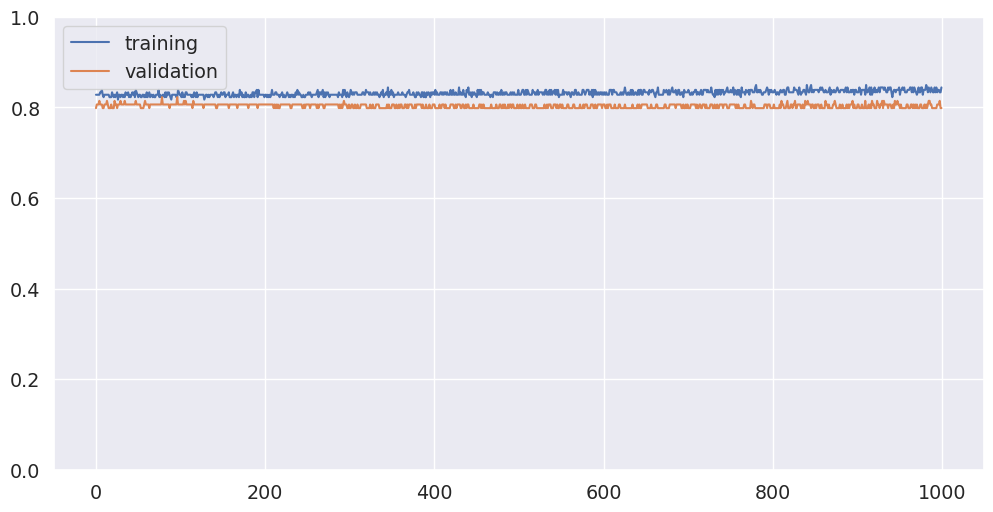

In [114]:
train_acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(train_acc, label="training")
plt.plot(val_acc, label="validation")
plt.ylim(0, 1)
plt.legend()

Puedo ademas guardar el mejor modelo usando ModelCheckpoint

In [115]:
mc = ModelCheckpoint('mejor_modelo.h5', monitor='val_acc', mode='max')

In [116]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[custom_early_stopping, mc],
)

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_48 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_49 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_50 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_51 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 39.1887 - accuracy: 0.3438

186/186 [==============================] - 0s 823us/step - loss: 41.4487 - accuracy: 0.2957 - val_loss: 35.5874 - val_accuracy: 0.3629


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 35.1727 - accuracy: 0.3750

186/186 [==============================] - 0s 66us/step - loss: 40.2652 - accuracy: 0.2957 - val_loss: 34.7376 - val_accuracy: 0.3629


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 38.3240 - accuracy: 0.3438

186/186 [==============================] - 0s 67us/step - loss: 39.3726 - accuracy: 0.2957 - val_loss: 34.0051 - val_accuracy: 0.3629


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 44.8703 - accuracy: 0.2188

186/186 [==============================] - 0s 67us/step - loss: 38.5664 - accuracy: 0.2957 - val_loss: 33.3083 - val_accuracy: 0.3629


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 50.1624 - accuracy: 0.0938

186/186 [==============================] - 0s 76us/step - loss: 37.8015 - accuracy: 0.2957 - val_loss: 32.6448 - val_accuracy: 0.3629


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 34.4395 - accuracy: 0.3438

186/186 [==============================] - 0s 71us/step - loss: 37.0482 - accuracy: 0.2957 - val_loss: 31.9799 - val_accuracy: 0.3629


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 40.2421 - accuracy: 0.2188

186/186 [==============================] - 0s 70us/step - loss: 36.2992 - accuracy: 0.2957 - val_loss: 31.3174 - val_accuracy: 0.3629


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


Epoch 8/1000


 32/186 [====>.........................] - ETA: 0s - loss: 35.7030 - accuracy: 0.2812

186/186 [==============================] - 0s 86us/step - loss: 35.5542 - accuracy: 0.2957 - val_loss: 30.6696 - val_accuracy: 0.3629


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 35.9893 - accuracy: 0.2812

186/186 [==============================] - 0s 79us/step - loss: 34.8212 - accuracy: 0.2957 - val_loss: 30.0229 - val_accuracy: 0.3629


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 34.8492 - accuracy: 0.2812

186/186 [==============================] - 0s 82us/step - loss: 34.0923 - accuracy: 0.2957 - val_loss: 29.3860 - val_accuracy: 0.3629


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 33.3813 - accuracy: 0.2812

186/186 [==============================] - 0s 69us/step - loss: 33.3681 - accuracy: 0.2957 - val_loss: 28.7431 - val_accuracy: 0.3629


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 27.5372 - accuracy: 0.4375

186/186 [==============================] - 0s 78us/step - loss: 32.6380 - accuracy: 0.2957 - val_loss: 28.0976 - val_accuracy: 0.3629


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 37.0959 - accuracy: 0.2188

186/186 [==============================] - 0s 73us/step - loss: 31.9173 - accuracy: 0.2957 - val_loss: 27.4731 - val_accuracy: 0.3629


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 28.3150 - accuracy: 0.3438

186/186 [==============================] - 0s 70us/step - loss: 31.1985 - accuracy: 0.2957 - val_loss: 26.8310 - val_accuracy: 0.3629


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 26.7625 - accuracy: 0.3438

186/186 [==============================] - 0s 67us/step - loss: 30.4769 - accuracy: 0.2957 - val_loss: 26.2072 - val_accuracy: 0.3629


Epoch 16/1000


 32/186 [====>.........................] - ETA: 0s - loss: 29.9133 - accuracy: 0.3125

186/186 [==============================] - 0s 67us/step - loss: 29.7662 - accuracy: 0.2957 - val_loss: 25.5737 - val_accuracy: 0.3629


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 24.7458 - accuracy: 0.3750

186/186 [==============================] - 0s 69us/step - loss: 29.0467 - accuracy: 0.2957 - val_loss: 24.9384 - val_accuracy: 0.3629


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 34.0463 - accuracy: 0.2188

186/186 [==============================] - 0s 71us/step - loss: 28.3386 - accuracy: 0.2957 - val_loss: 24.3214 - val_accuracy: 0.3629


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 27.2251 - accuracy: 0.2812

186/186 [==============================] - 0s 73us/step - loss: 27.6386 - accuracy: 0.2957 - val_loss: 23.7080 - val_accuracy: 0.3629


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 35.2359 - accuracy: 0.1562

186/186 [==============================] - 0s 69us/step - loss: 26.9519 - accuracy: 0.2957 - val_loss: 23.1051 - val_accuracy: 0.3629


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 28.5101 - accuracy: 0.2500

186/186 [==============================] - 0s 64us/step - loss: 26.2614 - accuracy: 0.2957 - val_loss: 22.4871 - val_accuracy: 0.3629


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 27.9750 - accuracy: 0.2500

186/186 [==============================] - 0s 71us/step - loss: 25.5677 - accuracy: 0.2957 - val_loss: 21.8815 - val_accuracy: 0.3629


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 23.1406 - accuracy: 0.3438

186/186 [==============================] - 0s 69us/step - loss: 24.8799 - accuracy: 0.2957 - val_loss: 21.2678 - val_accuracy: 0.3629


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 23.3534 - accuracy: 0.3125

186/186 [==============================] - 0s 71us/step - loss: 24.1916 - accuracy: 0.2957 - val_loss: 20.6588 - val_accuracy: 0.3629


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 18.2308 - accuracy: 0.4375

186/186 [==============================] - 0s 71us/step - loss: 23.5029 - accuracy: 0.2957 - val_loss: 20.0471 - val_accuracy: 0.3629


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 25.7239 - accuracy: 0.1875

186/186 [==============================] - 0s 70us/step - loss: 22.8202 - accuracy: 0.2957 - val_loss: 19.4529 - val_accuracy: 0.3629


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 20.4065 - accuracy: 0.3438

186/186 [==============================] - 0s 67us/step - loss: 22.1473 - accuracy: 0.2957 - val_loss: 18.8568 - val_accuracy: 0.3629


Epoch 28/1000


 32/186 [====>.........................] - ETA: 0s - loss: 21.3517 - accuracy: 0.3125

186/186 [==============================] - 0s 171us/step - loss: 21.4725 - accuracy: 0.2957 - val_loss: 18.2586 - val_accuracy: 0.3629


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 23.6067 - accuracy: 0.1562



186/186 [==============================] - 0s 69us/step - loss: 20.8096 - accuracy: 0.2957 - val_loss: 17.6833 - val_accuracy: 0.3629


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 22.4299 - accuracy: 0.2500

186/186 [==============================] - 0s 69us/step - loss: 20.1594 - accuracy: 0.2957 - val_loss: 17.1013 - val_accuracy: 0.3629


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 20.9579 - accuracy: 0.2500

186/186 [==============================] - 0s 67us/step - loss: 19.5033 - accuracy: 0.2957 - val_loss: 16.5216 - val_accuracy: 0.3629


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 14.9409 - accuracy: 0.4062

186/186 [==============================] - 0s 65us/step - loss: 18.8469 - accuracy: 0.2957 - val_loss: 15.9469 - val_accuracy: 0.3629


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 20.1964 - accuracy: 0.2812

186/186 [==============================] - 0s 62us/step - loss: 18.1978 - accuracy: 0.2957 - val_loss: 15.3738 - val_accuracy: 0.3629


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 17.8568 - accuracy: 0.3125

186/186 [==============================] - 0s 64us/step - loss: 17.5468 - accuracy: 0.2957 - val_loss: 14.7983 - val_accuracy: 0.3629


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 13.2121 - accuracy: 0.5000

186/186 [==============================] - 0s 63us/step - loss: 16.8925 - accuracy: 0.2957 - val_loss: 14.2190 - val_accuracy: 0.3629


Epoch 36/1000


 32/186 [====>.........................] - ETA: 0s - loss: 18.8354 - accuracy: 0.1875

186/186 [==============================] - 0s 77us/step - loss: 16.2504 - accuracy: 0.2903 - val_loss: 13.6661 - val_accuracy: 0.3629


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 16.1732 - accuracy: 0.2812

186/186 [==============================] - 0s 75us/step - loss: 15.6198 - accuracy: 0.2957 - val_loss: 13.1069 - val_accuracy: 0.3629


Epoch 38/1000


 32/186 [====>.........................] - ETA: 0s - loss: 14.9949 - accuracy: 0.3125

186/186 [==============================] - 0s 70us/step - loss: 14.9905 - accuracy: 0.2957 - val_loss: 12.5510 - val_accuracy: 0.3629


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 17.7451 - accuracy: 0.2812

186/186 [==============================] - 0s 64us/step - loss: 14.3755 - accuracy: 0.2957 - val_loss: 12.0064 - val_accuracy: 0.3629


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 13.8484 - accuracy: 0.3125

186/186 [==============================] - 0s 62us/step - loss: 13.7657 - accuracy: 0.2957 - val_loss: 11.4645 - val_accuracy: 0.3629


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 13.8678 - accuracy: 0.2500

186/186 [==============================] - 0s 61us/step - loss: 13.1578 - accuracy: 0.2957 - val_loss: 10.9228 - val_accuracy: 0.3710


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 10.4714 - accuracy: 0.3438

186/186 [==============================] - 0s 65us/step - loss: 12.5369 - accuracy: 0.2957 - val_loss: 10.3769 - val_accuracy: 0.3629


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 12.7836 - accuracy: 0.3125

186/186 [==============================] - 0s 64us/step - loss: 11.9161 - accuracy: 0.3011 - val_loss: 9.8443 - val_accuracy: 0.3710


Epoch 44/1000


 32/186 [====>.........................] - ETA: 0s - loss: 12.9903 - accuracy: 0.2812

186/186 [==============================] - 0s 67us/step - loss: 11.3129 - accuracy: 0.3065 - val_loss: 9.3372 - val_accuracy: 0.3629


Epoch 45/1000


 32/186 [====>.........................] - ETA: 0s - loss: 12.6996 - accuracy: 0.3125

186/186 [==============================] - 0s 71us/step - loss: 10.7368 - accuracy: 0.3118 - val_loss: 8.8392 - val_accuracy: 0.3629


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 12.1664 - accuracy: 0.2188

186/186 [==============================] - 0s 67us/step - loss: 10.1670 - accuracy: 0.3172 - val_loss: 8.3433 - val_accuracy: 0.3548


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 9.6730 - accuracy: 0.3438

186/186 [==============================] - 0s 68us/step - loss: 9.5955 - accuracy: 0.3226 - val_loss: 7.8458 - val_accuracy: 0.3548


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 9.5011 - accuracy: 0.2812

186/186 [==============================] - 0s 65us/step - loss: 9.0373 - accuracy: 0.3118 - val_loss: 7.3790 - val_accuracy: 0.3790


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 8.8139 - accuracy: 0.3125

186/186 [==============================] - 0s 63us/step - loss: 8.5018 - accuracy: 0.3333 - val_loss: 6.9298 - val_accuracy: 0.3629


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 7.0478 - accuracy: 0.4062

186/186 [==============================] - 0s 65us/step - loss: 7.9703 - accuracy: 0.3280 - val_loss: 6.4823 - val_accuracy: 0.3710


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 8.4305 - accuracy: 0.3125

186/186 [==============================] - 0s 65us/step - loss: 7.4565 - accuracy: 0.3226 - val_loss: 6.0568 - val_accuracy: 0.3629


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 6.6070 - accuracy: 0.2812

186/186 [==============================] - 0s 71us/step - loss: 6.9617 - accuracy: 0.3172 - val_loss: 5.6405 - val_accuracy: 0.3790


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 6.3337 - accuracy: 0.3125

186/186 [==============================] - 0s 66us/step - loss: 6.4798 - accuracy: 0.3226 - val_loss: 5.2361 - val_accuracy: 0.3790


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.4883 - accuracy: 0.4375

186/186 [==============================] - 0s 67us/step - loss: 6.0221 - accuracy: 0.3333 - val_loss: 4.8455 - val_accuracy: 0.3710


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.2685 - accuracy: 0.4375

186/186 [==============================] - 0s 67us/step - loss: 5.5935 - accuracy: 0.3495 - val_loss: 4.4829 - val_accuracy: 0.3790


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 5.7457 - accuracy: 0.4062

186/186 [==============================] - 0s 74us/step - loss: 5.1969 - accuracy: 0.3710 - val_loss: 4.1309 - val_accuracy: 0.3871


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.9057 - accuracy: 0.5000

186/186 [==============================] - 0s 69us/step - loss: 4.8175 - accuracy: 0.3817 - val_loss: 3.7953 - val_accuracy: 0.3952


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.3266 - accuracy: 0.3750

186/186 [==============================] - 0s 67us/step - loss: 4.4713 - accuracy: 0.3978 - val_loss: 3.4946 - val_accuracy: 0.4113


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6746 - accuracy: 0.5000

186/186 [==============================] - 0s 70us/step - loss: 4.1462 - accuracy: 0.3871 - val_loss: 3.1985 - val_accuracy: 0.4194


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.3354 - accuracy: 0.4375

186/186 [==============================] - 0s 70us/step - loss: 3.8351 - accuracy: 0.3871 - val_loss: 2.9355 - val_accuracy: 0.4274


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.8122 - accuracy: 0.3438

186/186 [==============================] - 0s 70us/step - loss: 3.5542 - accuracy: 0.4032 - val_loss: 2.6886 - val_accuracy: 0.4274


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.4514 - accuracy: 0.4062

186/186 [==============================] - 0s 74us/step - loss: 3.2916 - accuracy: 0.4086 - val_loss: 2.4534 - val_accuracy: 0.4355


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.2846 - accuracy: 0.4688

186/186 [==============================] - 0s 65us/step - loss: 3.0456 - accuracy: 0.4140 - val_loss: 2.2455 - val_accuracy: 0.4516


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1732 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 2.8170 - accuracy: 0.4032 - val_loss: 2.0480 - val_accuracy: 0.4355


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6805 - accuracy: 0.3438

186/186 [==============================] - 0s 68us/step - loss: 2.6058 - accuracy: 0.4194 - val_loss: 1.8660 - val_accuracy: 0.4194


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.2751 - accuracy: 0.4375

186/186 [==============================] - 0s 67us/step - loss: 2.4055 - accuracy: 0.4409 - val_loss: 1.7032 - val_accuracy: 0.4435


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.0323 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 2.2213 - accuracy: 0.4409 - val_loss: 1.5585 - val_accuracy: 0.4435


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.7374 - accuracy: 0.4062

186/186 [==============================] - 0s 70us/step - loss: 2.0422 - accuracy: 0.4409 - val_loss: 1.4380 - val_accuracy: 0.4677


Epoch 69/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.3609 - accuracy: 0.4062

186/186 [==============================] - 0s 74us/step - loss: 1.8753 - accuracy: 0.4140 - val_loss: 1.3345 - val_accuracy: 0.4919


Epoch 70/1000


 32/186 [====>.........................] - ETA: 0s - loss: 2.4504 - accuracy: 0.2188

186/186 [==============================] - 0s 99us/step - loss: 1.7248 - accuracy: 0.4247 - val_loss: 1.2545 - val_accuracy: 0.5242


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8028 - accuracy: 0.3750

186/186 [==============================] - 0s 68us/step - loss: 1.5952 - accuracy: 0.4301 - val_loss: 1.1928 - val_accuracy: 0.5403


Epoch 72/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2971 - accuracy: 0.4062

186/186 [==============================] - 0s 73us/step - loss: 1.4847 - accuracy: 0.4301 - val_loss: 1.1291 - val_accuracy: 0.5403


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5581 - accuracy: 0.4375

186/186 [==============================] - 0s 67us/step - loss: 1.3766 - accuracy: 0.4355 - val_loss: 1.0730 - val_accuracy: 0.5403


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5023 - accuracy: 0.3438

186/186 [==============================] - 0s 68us/step - loss: 1.2824 - accuracy: 0.4516 - val_loss: 1.0241 - val_accuracy: 0.5403


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0405 - accuracy: 0.5000

186/186 [==============================] - 0s 70us/step - loss: 1.2063 - accuracy: 0.4731 - val_loss: 0.9835 - val_accuracy: 0.5403


Epoch 76/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.4255 - accuracy: 0.4062

186/186 [==============================] - 0s 73us/step - loss: 1.1397 - accuracy: 0.4731 - val_loss: 0.9493 - val_accuracy: 0.5565


Epoch 77/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9596 - accuracy: 0.4375

186/186 [==============================] - 0s 68us/step - loss: 1.0797 - accuracy: 0.4677 - val_loss: 0.9220 - val_accuracy: 0.5565


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2335 - accuracy: 0.3750

186/186 [==============================] - 0s 68us/step - loss: 1.0287 - accuracy: 0.4677 - val_loss: 0.8999 - val_accuracy: 0.5645


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7554 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.9857 - accuracy: 0.4731 - val_loss: 0.8795 - val_accuracy: 0.5645


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0981 - accuracy: 0.3750

186/186 [==============================] - 0s 66us/step - loss: 0.9490 - accuracy: 0.4785 - val_loss: 0.8602 - val_accuracy: 0.5726


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7526 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.9185 - accuracy: 0.4946 - val_loss: 0.8445 - val_accuracy: 0.5887


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7380 - accuracy: 0.5312

186/186 [==============================] - 0s 66us/step - loss: 0.8938 - accuracy: 0.5054 - val_loss: 0.8301 - val_accuracy: 0.5968


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9029 - accuracy: 0.5938

186/186 [==============================] - 0s 67us/step - loss: 0.8729 - accuracy: 0.5430 - val_loss: 0.8162 - val_accuracy: 0.5968


Epoch 84/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9382 - accuracy: 0.5312

186/186 [==============================] - 0s 69us/step - loss: 0.8549 - accuracy: 0.5376 - val_loss: 0.8041 - val_accuracy: 0.6129


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0871 - accuracy: 0.5625

186/186 [==============================] - 0s 72us/step - loss: 0.8377 - accuracy: 0.5699 - val_loss: 0.7917 - val_accuracy: 0.6048


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7135 - accuracy: 0.5938

186/186 [==============================] - 0s 80us/step - loss: 0.8203 - accuracy: 0.5753 - val_loss: 0.7784 - val_accuracy: 0.6129


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8262 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.8037 - accuracy: 0.5806 - val_loss: 0.7690 - val_accuracy: 0.6129


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7718 - accuracy: 0.5625

186/186 [==============================] - 0s 75us/step - loss: 0.7913 - accuracy: 0.6129 - val_loss: 0.7602 - val_accuracy: 0.6129


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8619 - accuracy: 0.5000

186/186 [==============================] - 0s 63us/step - loss: 0.7804 - accuracy: 0.6183 - val_loss: 0.7523 - val_accuracy: 0.6371


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7558 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.7694 - accuracy: 0.6344 - val_loss: 0.7450 - val_accuracy: 0.6371


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7085 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.7601 - accuracy: 0.6398 - val_loss: 0.7386 - val_accuracy: 0.6613


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6627 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.7510 - accuracy: 0.6452 - val_loss: 0.7328 - val_accuracy: 0.6774


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8101 - accuracy: 0.5312

186/186 [==============================] - 0s 66us/step - loss: 0.7435 - accuracy: 0.6774 - val_loss: 0.7281 - val_accuracy: 0.6774


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8408 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.7370 - accuracy: 0.6935 - val_loss: 0.7240 - val_accuracy: 0.6774


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7618 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.7314 - accuracy: 0.7097 - val_loss: 0.7206 - val_accuracy: 0.6613


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8000 - accuracy: 0.5625

186/186 [==============================] - 0s 62us/step - loss: 0.7272 - accuracy: 0.7473 - val_loss: 0.7177 - val_accuracy: 0.6613


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7333 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.7225 - accuracy: 0.7419 - val_loss: 0.7145 - val_accuracy: 0.6694


Epoch 98/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7808 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.7185 - accuracy: 0.7634 - val_loss: 0.7117 - val_accuracy: 0.6855


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6779 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.7152 - accuracy: 0.7581 - val_loss: 0.7100 - val_accuracy: 0.6935


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6208 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.7119 - accuracy: 0.7581 - val_loss: 0.7095 - val_accuracy: 0.6935


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6687 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.7082 - accuracy: 0.7581 - val_loss: 0.7090 - val_accuracy: 0.6935


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6895 - accuracy: 0.7188



186/186 [==============================] - 0s 88us/step - loss: 0.7037 - accuracy: 0.7527 - val_loss: 0.7088 - val_accuracy: 0.6935


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6613 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.7000 - accuracy: 0.7581 - val_loss: 0.7082 - val_accuracy: 0.6935


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6965 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.6973 - accuracy: 0.7581 - val_loss: 0.7081 - val_accuracy: 0.6935


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7321 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.6940 - accuracy: 0.7688 - val_loss: 0.7089 - val_accuracy: 0.6935


Epoch 106/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6549 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.6913 - accuracy: 0.7688 - val_loss: 0.7089 - val_accuracy: 0.6935


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6430 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.6886 - accuracy: 0.7688 - val_loss: 0.7095 - val_accuracy: 0.6855


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6650 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.6865 - accuracy: 0.7742 - val_loss: 0.7087 - val_accuracy: 0.6935


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7414 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6851 - accuracy: 0.7742 - val_loss: 0.7076 - val_accuracy: 0.6935


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6774 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.6835 - accuracy: 0.7742 - val_loss: 0.7067 - val_accuracy: 0.6855


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6971 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.6819 - accuracy: 0.7796 - val_loss: 0.7062 - val_accuracy: 0.6935


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6706 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.6808 - accuracy: 0.7796 - val_loss: 0.7057 - val_accuracy: 0.6935


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6369 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.6790 - accuracy: 0.7742 - val_loss: 0.7051 - val_accuracy: 0.6935


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6792 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.6777 - accuracy: 0.7796 - val_loss: 0.7045 - val_accuracy: 0.6935


Epoch 115/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7584 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.6763 - accuracy: 0.7796 - val_loss: 0.7040 - val_accuracy: 0.6855


Epoch 116/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6414 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.6752 - accuracy: 0.7796 - val_loss: 0.7036 - val_accuracy: 0.7016


Epoch 117/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6353 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.6741 - accuracy: 0.7796 - val_loss: 0.7029 - val_accuracy: 0.7016


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7004 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6724 - accuracy: 0.7796 - val_loss: 0.7024 - val_accuracy: 0.7016


Epoch 119/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6907 - accuracy: 0.7500

186/186 [==============================] - 0s 80us/step - loss: 0.6718 - accuracy: 0.7957 - val_loss: 0.7019 - val_accuracy: 0.6935


Epoch 120/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7051 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6713 - accuracy: 0.7957 - val_loss: 0.7011 - val_accuracy: 0.6935


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6617 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.6697 - accuracy: 0.7957 - val_loss: 0.7005 - val_accuracy: 0.6935


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6441 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.6691 - accuracy: 0.8011 - val_loss: 0.7000 - val_accuracy: 0.6935


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7021 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.6685 - accuracy: 0.7903 - val_loss: 0.6998 - val_accuracy: 0.7016


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6826 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6675 - accuracy: 0.7957 - val_loss: 0.6993 - val_accuracy: 0.7016


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6770 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.6665 - accuracy: 0.7957 - val_loss: 0.6986 - val_accuracy: 0.7016


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6334 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.6658 - accuracy: 0.8011 - val_loss: 0.6979 - val_accuracy: 0.7016


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6227 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.6648 - accuracy: 0.8011 - val_loss: 0.6977 - val_accuracy: 0.7016


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6580 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.6641 - accuracy: 0.8011 - val_loss: 0.6975 - val_accuracy: 0.7016


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6274 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.6633 - accuracy: 0.8011 - val_loss: 0.6972 - val_accuracy: 0.7016


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6640 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6626 - accuracy: 0.8065 - val_loss: 0.6970 - val_accuracy: 0.7016


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6254 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.6620 - accuracy: 0.8011 - val_loss: 0.6967 - val_accuracy: 0.7016


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6500 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.6610 - accuracy: 0.8065 - val_loss: 0.6963 - val_accuracy: 0.7016


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6210 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.6600 - accuracy: 0.8011 - val_loss: 0.6958 - val_accuracy: 0.7016


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6481 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.6593 - accuracy: 0.8118 - val_loss: 0.6958 - val_accuracy: 0.7016


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6240 - accuracy: 0.9375

186/186 [==============================] - 0s 81us/step - loss: 0.6585 - accuracy: 0.8065 - val_loss: 0.6955 - val_accuracy: 0.7016


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6833 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.6582 - accuracy: 0.8118 - val_loss: 0.6955 - val_accuracy: 0.7097


Epoch 137/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6403 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.6572 - accuracy: 0.8011 - val_loss: 0.6949 - val_accuracy: 0.7016


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6288 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.6565 - accuracy: 0.8065 - val_loss: 0.6945 - val_accuracy: 0.7016


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6712 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.6559 - accuracy: 0.8065 - val_loss: 0.6940 - val_accuracy: 0.7016


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6458 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.6550 - accuracy: 0.8065 - val_loss: 0.6937 - val_accuracy: 0.7016


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6370 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.6552 - accuracy: 0.8118 - val_loss: 0.6937 - val_accuracy: 0.7016


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6950 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.6540 - accuracy: 0.8065 - val_loss: 0.6935 - val_accuracy: 0.7016


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6452 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.6528 - accuracy: 0.8118 - val_loss: 0.6933 - val_accuracy: 0.7097


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6876 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.6524 - accuracy: 0.8065 - val_loss: 0.6932 - val_accuracy: 0.7097


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6362 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.6520 - accuracy: 0.8011 - val_loss: 0.6928 - val_accuracy: 0.7097


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6802 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.6509 - accuracy: 0.8172 - val_loss: 0.6926 - val_accuracy: 0.7097


Epoch 147/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6893 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.6510 - accuracy: 0.8172 - val_loss: 0.6925 - val_accuracy: 0.7097


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6647 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.6499 - accuracy: 0.8065 - val_loss: 0.6921 - val_accuracy: 0.7097


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6357 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.6495 - accuracy: 0.8065 - val_loss: 0.6918 - val_accuracy: 0.7097


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6400 - accuracy: 0.8750

186/186 [==============================] - 0s 109us/step - loss: 0.6492 - accuracy: 0.8118 - val_loss: 0.6915 - val_accuracy: 0.7097


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6092 - accuracy: 0.9062

186/186 [==============================] - 0s 98us/step - loss: 0.6481 - accuracy: 0.8065 - val_loss: 0.6911 - val_accuracy: 0.7016


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6303 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.6473 - accuracy: 0.8118 - val_loss: 0.6910 - val_accuracy: 0.7016


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6335 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.6472 - accuracy: 0.8118 - val_loss: 0.6911 - val_accuracy: 0.7097


Epoch 154/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6436 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.6465 - accuracy: 0.8118 - val_loss: 0.6909 - val_accuracy: 0.7097


Epoch 155/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6156 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.6456 - accuracy: 0.8065 - val_loss: 0.6904 - val_accuracy: 0.7097


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6453 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.6456 - accuracy: 0.8065 - val_loss: 0.6900 - val_accuracy: 0.7016


Epoch 157/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6329 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.6445 - accuracy: 0.8172 - val_loss: 0.6897 - val_accuracy: 0.7016


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6434 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.6439 - accuracy: 0.8280 - val_loss: 0.6894 - val_accuracy: 0.7016


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6325 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.6437 - accuracy: 0.8118 - val_loss: 0.6891 - val_accuracy: 0.7097


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6455 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6430 - accuracy: 0.8226 - val_loss: 0.6893 - val_accuracy: 0.7097


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6640 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.6423 - accuracy: 0.8172 - val_loss: 0.6893 - val_accuracy: 0.7097


Epoch 162/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6662 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.6425 - accuracy: 0.8333 - val_loss: 0.6891 - val_accuracy: 0.7097


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6539 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.6417 - accuracy: 0.8118 - val_loss: 0.6889 - val_accuracy: 0.7097


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6218 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.6410 - accuracy: 0.8172 - val_loss: 0.6887 - val_accuracy: 0.7097


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6642 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.6406 - accuracy: 0.8226 - val_loss: 0.6889 - val_accuracy: 0.7097


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6398 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.6402 - accuracy: 0.8172 - val_loss: 0.6888 - val_accuracy: 0.7097


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6441 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.6399 - accuracy: 0.8172 - val_loss: 0.6883 - val_accuracy: 0.7097


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6092 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.6397 - accuracy: 0.8172 - val_loss: 0.6880 - val_accuracy: 0.7097


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6542 - accuracy: 0.8438

186/186 [==============================] - 0s 105us/step - loss: 0.6394 - accuracy: 0.8172 - val_loss: 0.6879 - val_accuracy: 0.7097


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6159 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.6387 - accuracy: 0.8118 - val_loss: 0.6874 - val_accuracy: 0.7097


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6054 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.6381 - accuracy: 0.8172 - val_loss: 0.6872 - val_accuracy: 0.7097


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6379 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.6376 - accuracy: 0.8172 - val_loss: 0.6869 - val_accuracy: 0.7097


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6519 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6373 - accuracy: 0.8280 - val_loss: 0.6871 - val_accuracy: 0.7097


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6550 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.6366 - accuracy: 0.8172 - val_loss: 0.6868 - val_accuracy: 0.7097


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6163 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.6368 - accuracy: 0.8172 - val_loss: 0.6865 - val_accuracy: 0.7097


Epoch 176/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6220 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.6361 - accuracy: 0.8226 - val_loss: 0.6864 - val_accuracy: 0.7097


Epoch 177/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6310 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.6354 - accuracy: 0.8172 - val_loss: 0.6858 - val_accuracy: 0.7097


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6263 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.6347 - accuracy: 0.8280 - val_loss: 0.6857 - val_accuracy: 0.7097


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5926 - accuracy: 0.9375



186/186 [==============================] - 0s 71us/step - loss: 0.6347 - accuracy: 0.8226 - val_loss: 0.6852 - val_accuracy: 0.7016


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6117 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.6340 - accuracy: 0.8226 - val_loss: 0.6849 - val_accuracy: 0.7016


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6092 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.6337 - accuracy: 0.8333 - val_loss: 0.6854 - val_accuracy: 0.7097


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6382 - accuracy: 0.8125

186/186 [==============================] - 0s 106us/step - loss: 0.6333 - accuracy: 0.8226 - val_loss: 0.6852 - val_accuracy: 0.7097


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6352 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.6329 - accuracy: 0.8226 - val_loss: 0.6848 - val_accuracy: 0.7177


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6103 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.6323 - accuracy: 0.8226 - val_loss: 0.6844 - val_accuracy: 0.7016


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6231 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.6322 - accuracy: 0.8280 - val_loss: 0.6846 - val_accuracy: 0.7097


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5920 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.6314 - accuracy: 0.8226 - val_loss: 0.6840 - val_accuracy: 0.7016


Epoch 187/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6454 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.6308 - accuracy: 0.8333 - val_loss: 0.6843 - val_accuracy: 0.7097


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6184 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.6323 - accuracy: 0.8118 - val_loss: 0.6848 - val_accuracy: 0.7097


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6002 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.6300 - accuracy: 0.8172 - val_loss: 0.6842 - val_accuracy: 0.7097


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5992 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.6297 - accuracy: 0.8226 - val_loss: 0.6837 - val_accuracy: 0.7097


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6374 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.6291 - accuracy: 0.8226 - val_loss: 0.6834 - val_accuracy: 0.7097


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5948 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.6297 - accuracy: 0.8333 - val_loss: 0.6839 - val_accuracy: 0.7097


Epoch 193/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6303 - accuracy: 0.7500

186/186 [==============================] - 0s 91us/step - loss: 0.6285 - accuracy: 0.8226 - val_loss: 0.6836 - val_accuracy: 0.7097


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6101 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.6280 - accuracy: 0.8226 - val_loss: 0.6831 - val_accuracy: 0.7177


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6305 - accuracy: 0.8438

186/186 [==============================] - 0s 90us/step - loss: 0.6289 - accuracy: 0.8226 - val_loss: 0.6831 - val_accuracy: 0.7097


Epoch 196/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6094 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.6275 - accuracy: 0.8172 - val_loss: 0.6825 - val_accuracy: 0.7097


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6589 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6279 - accuracy: 0.8280 - val_loss: 0.6820 - val_accuracy: 0.7097


Epoch 198/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5767 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.6265 - accuracy: 0.8280 - val_loss: 0.6819 - val_accuracy: 0.7097


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6449 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.6265 - accuracy: 0.8333 - val_loss: 0.6815 - val_accuracy: 0.7016


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6271 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.6257 - accuracy: 0.8333 - val_loss: 0.6817 - val_accuracy: 0.7097


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6058 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.6263 - accuracy: 0.8280 - val_loss: 0.6813 - val_accuracy: 0.7097


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6299 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.6251 - accuracy: 0.8333 - val_loss: 0.6810 - val_accuracy: 0.7097


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6244 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.6248 - accuracy: 0.8333 - val_loss: 0.6810 - val_accuracy: 0.7097


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6364 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.6243 - accuracy: 0.8280 - val_loss: 0.6808 - val_accuracy: 0.7097


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6230 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6238 - accuracy: 0.8333 - val_loss: 0.6805 - val_accuracy: 0.7097


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6911 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.6240 - accuracy: 0.8226 - val_loss: 0.6806 - val_accuracy: 0.7097


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5896 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.6235 - accuracy: 0.8226 - val_loss: 0.6799 - val_accuracy: 0.7097


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6494 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6230 - accuracy: 0.8226 - val_loss: 0.6795 - val_accuracy: 0.7016


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6082 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.6222 - accuracy: 0.8333 - val_loss: 0.6789 - val_accuracy: 0.7016


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6322 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.6218 - accuracy: 0.8333 - val_loss: 0.6788 - val_accuracy: 0.7016


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6515 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6214 - accuracy: 0.8333 - val_loss: 0.6788 - val_accuracy: 0.7016


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6403 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.6215 - accuracy: 0.8333 - val_loss: 0.6788 - val_accuracy: 0.7097


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6149 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.6210 - accuracy: 0.8333 - val_loss: 0.6793 - val_accuracy: 0.7097


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5906 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.6202 - accuracy: 0.8280 - val_loss: 0.6785 - val_accuracy: 0.7097


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6277 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6200 - accuracy: 0.8280 - val_loss: 0.6781 - val_accuracy: 0.7016


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5882 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.6198 - accuracy: 0.8333 - val_loss: 0.6780 - val_accuracy: 0.7016


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5767 - accuracy: 0.9688



186/186 [==============================] - 0s 70us/step - loss: 0.6191 - accuracy: 0.8280 - val_loss: 0.6773 - val_accuracy: 0.7016


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6228 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.6189 - accuracy: 0.8333 - val_loss: 0.6768 - val_accuracy: 0.7016


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6366 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.6185 - accuracy: 0.8441 - val_loss: 0.6767 - val_accuracy: 0.7016


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6485 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6183 - accuracy: 0.8333 - val_loss: 0.6762 - val_accuracy: 0.7016


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6558 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6176 - accuracy: 0.8387 - val_loss: 0.6766 - val_accuracy: 0.7016


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6214 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.6171 - accuracy: 0.8333 - val_loss: 0.6764 - val_accuracy: 0.7016


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5723 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.6176 - accuracy: 0.8280 - val_loss: 0.6768 - val_accuracy: 0.7097


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6237 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.6170 - accuracy: 0.8280 - val_loss: 0.6764 - val_accuracy: 0.7097


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6177 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.6159 - accuracy: 0.8333 - val_loss: 0.6762 - val_accuracy: 0.7097


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6107 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.6155 - accuracy: 0.8333 - val_loss: 0.6752 - val_accuracy: 0.7016


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5953 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.6151 - accuracy: 0.8441 - val_loss: 0.6752 - val_accuracy: 0.7016


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6253 - accuracy: 0.8750

186/186 [==============================] - 0s 91us/step - loss: 0.6148 - accuracy: 0.8333 - val_loss: 0.6744 - val_accuracy: 0.7016


Epoch 229/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6442 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.6142 - accuracy: 0.8441 - val_loss: 0.6744 - val_accuracy: 0.7016


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5999 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.6139 - accuracy: 0.8333 - val_loss: 0.6743 - val_accuracy: 0.7016


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6806 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6138 - accuracy: 0.8333 - val_loss: 0.6746 - val_accuracy: 0.7097


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6305 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6134 - accuracy: 0.8333 - val_loss: 0.6740 - val_accuracy: 0.7097


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6299 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.6125 - accuracy: 0.8333 - val_loss: 0.6747 - val_accuracy: 0.7097


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6230 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.6126 - accuracy: 0.8280 - val_loss: 0.6734 - val_accuracy: 0.7016


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6024 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.6120 - accuracy: 0.8333 - val_loss: 0.6730 - val_accuracy: 0.7016


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6423 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.6115 - accuracy: 0.8387 - val_loss: 0.6725 - val_accuracy: 0.7016


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6444 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.6114 - accuracy: 0.8387 - val_loss: 0.6716 - val_accuracy: 0.7097


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6174 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.6108 - accuracy: 0.8387 - val_loss: 0.6716 - val_accuracy: 0.7016


Epoch 239/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6618 - accuracy: 0.8438

186/186 [==============================] - 0s 86us/step - loss: 0.6106 - accuracy: 0.8441 - val_loss: 0.6718 - val_accuracy: 0.7016


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5752 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.6112 - accuracy: 0.8280 - val_loss: 0.6711 - val_accuracy: 0.7016


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5832 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.6094 - accuracy: 0.8387 - val_loss: 0.6705 - val_accuracy: 0.7097


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6392 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.6092 - accuracy: 0.8333 - val_loss: 0.6704 - val_accuracy: 0.7097


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5709 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.6090 - accuracy: 0.8387 - val_loss: 0.6707 - val_accuracy: 0.7016


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5579 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.6088 - accuracy: 0.8387 - val_loss: 0.6707 - val_accuracy: 0.7097


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5961 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.6083 - accuracy: 0.8387 - val_loss: 0.6701 - val_accuracy: 0.7097


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5969 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.6079 - accuracy: 0.8387 - val_loss: 0.6696 - val_accuracy: 0.7097


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5896 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.6081 - accuracy: 0.8387 - val_loss: 0.6695 - val_accuracy: 0.7097


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6275 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.6074 - accuracy: 0.8333 - val_loss: 0.6693 - val_accuracy: 0.7097


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5258 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.6077 - accuracy: 0.8333 - val_loss: 0.6688 - val_accuracy: 0.7097


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6733 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.6064 - accuracy: 0.8333 - val_loss: 0.6694 - val_accuracy: 0.7177


Epoch 251/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6517 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.6059 - accuracy: 0.8387 - val_loss: 0.6697 - val_accuracy: 0.7097


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6245 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.6057 - accuracy: 0.8387 - val_loss: 0.6693 - val_accuracy: 0.7177


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5571 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.6052 - accuracy: 0.8333 - val_loss: 0.6684 - val_accuracy: 0.7177


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6051 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.6050 - accuracy: 0.8387 - val_loss: 0.6678 - val_accuracy: 0.7097


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5794 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.6043 - accuracy: 0.8387 - val_loss: 0.6667 - val_accuracy: 0.7097


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5871 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.6043 - accuracy: 0.8387 - val_loss: 0.6678 - val_accuracy: 0.7177


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5979 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.6040 - accuracy: 0.8387 - val_loss: 0.6677 - val_accuracy: 0.7177


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5652 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.6038 - accuracy: 0.8387 - val_loss: 0.6681 - val_accuracy: 0.7177


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6508 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6036 - accuracy: 0.8333 - val_loss: 0.6673 - val_accuracy: 0.7177


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5784 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.6030 - accuracy: 0.8387 - val_loss: 0.6671 - val_accuracy: 0.7177


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6292 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.6020 - accuracy: 0.8387 - val_loss: 0.6666 - val_accuracy: 0.7177


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5688 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.6022 - accuracy: 0.8387 - val_loss: 0.6666 - val_accuracy: 0.7177


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6227 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.6014 - accuracy: 0.8387 - val_loss: 0.6666 - val_accuracy: 0.7177


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5700 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.6011 - accuracy: 0.8387 - val_loss: 0.6653 - val_accuracy: 0.7097


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6122 - accuracy: 0.8125



186/186 [==============================] - 0s 66us/step - loss: 0.6009 - accuracy: 0.8387 - val_loss: 0.6660 - val_accuracy: 0.7177


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5942 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.6005 - accuracy: 0.8387 - val_loss: 0.6657 - val_accuracy: 0.7177


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5468 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.6007 - accuracy: 0.8280 - val_loss: 0.6646 - val_accuracy: 0.7097


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6232 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6000 - accuracy: 0.8333 - val_loss: 0.6645 - val_accuracy: 0.7177


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5812 - accuracy: 0.8750



186/186 [==============================] - 0s 71us/step - loss: 0.5998 - accuracy: 0.8333 - val_loss: 0.6641 - val_accuracy: 0.7097


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6249 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.5989 - accuracy: 0.8333 - val_loss: 0.6645 - val_accuracy: 0.7177


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6053 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.5991 - accuracy: 0.8387 - val_loss: 0.6641 - val_accuracy: 0.7177


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5951 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.5983 - accuracy: 0.8387 - val_loss: 0.6628 - val_accuracy: 0.7097


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5832 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.5979 - accuracy: 0.8333 - val_loss: 0.6631 - val_accuracy: 0.7097


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5344 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.5982 - accuracy: 0.8387 - val_loss: 0.6622 - val_accuracy: 0.7097


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5223 - accuracy: 0.8750

186/186 [==============================] - 0s 87us/step - loss: 0.5972 - accuracy: 0.8333 - val_loss: 0.6617 - val_accuracy: 0.7016


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6080 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.5968 - accuracy: 0.8441 - val_loss: 0.6619 - val_accuracy: 0.7097


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5591 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.5967 - accuracy: 0.8333 - val_loss: 0.6623 - val_accuracy: 0.7177


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6072 - accuracy: 0.8438

186/186 [==============================] - 0s 91us/step - loss: 0.5961 - accuracy: 0.8387 - val_loss: 0.6637 - val_accuracy: 0.7177


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6523 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5960 - accuracy: 0.8387 - val_loss: 0.6633 - val_accuracy: 0.7177


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5782 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5952 - accuracy: 0.8387 - val_loss: 0.6618 - val_accuracy: 0.7177


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5283 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.5963 - accuracy: 0.8280 - val_loss: 0.6615 - val_accuracy: 0.7177


Epoch 282/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5520 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.5954 - accuracy: 0.8333 - val_loss: 0.6612 - val_accuracy: 0.7177


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5601 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.5943 - accuracy: 0.8333 - val_loss: 0.6611 - val_accuracy: 0.7177


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6067 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.5942 - accuracy: 0.8333 - val_loss: 0.6613 - val_accuracy: 0.7177


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6351 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.5937 - accuracy: 0.8333 - val_loss: 0.6607 - val_accuracy: 0.7177


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5779 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.5937 - accuracy: 0.8387 - val_loss: 0.6598 - val_accuracy: 0.7097


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5876 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.5936 - accuracy: 0.8333 - val_loss: 0.6599 - val_accuracy: 0.7177


Epoch 288/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6057 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.5932 - accuracy: 0.8333 - val_loss: 0.6595 - val_accuracy: 0.7097


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6013 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.5923 - accuracy: 0.8387 - val_loss: 0.6588 - val_accuracy: 0.7016


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5725 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5925 - accuracy: 0.8333 - val_loss: 0.6587 - val_accuracy: 0.7097


Epoch 291/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6129 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.5930 - accuracy: 0.8441 - val_loss: 0.6600 - val_accuracy: 0.7177


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5868 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.5911 - accuracy: 0.8333 - val_loss: 0.6591 - val_accuracy: 0.7177


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5839 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.5911 - accuracy: 0.8387 - val_loss: 0.6595 - val_accuracy: 0.7177


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5553 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5907 - accuracy: 0.8441 - val_loss: 0.6586 - val_accuracy: 0.7177


Epoch 295/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5980 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.5901 - accuracy: 0.8387 - val_loss: 0.6579 - val_accuracy: 0.7016


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5947 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5905 - accuracy: 0.8387 - val_loss: 0.6579 - val_accuracy: 0.7097


Epoch 297/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5924 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.5902 - accuracy: 0.8387 - val_loss: 0.6591 - val_accuracy: 0.7177


Epoch 298/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5553 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.5897 - accuracy: 0.8333 - val_loss: 0.6573 - val_accuracy: 0.7097


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5957 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.5894 - accuracy: 0.8387 - val_loss: 0.6572 - val_accuracy: 0.7177


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5765 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.5889 - accuracy: 0.8387 - val_loss: 0.6572 - val_accuracy: 0.7177


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5987 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.5884 - accuracy: 0.8387 - val_loss: 0.6569 - val_accuracy: 0.7177


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6105 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5886 - accuracy: 0.8387 - val_loss: 0.6570 - val_accuracy: 0.7177


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5495 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5878 - accuracy: 0.8387 - val_loss: 0.6564 - val_accuracy: 0.7177


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5958 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.5889 - accuracy: 0.8333 - val_loss: 0.6573 - val_accuracy: 0.7177


Epoch 305/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6285 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.5872 - accuracy: 0.8387 - val_loss: 0.6574 - val_accuracy: 0.7177


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5439 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.5869 - accuracy: 0.8387 - val_loss: 0.6565 - val_accuracy: 0.7177


Epoch 307/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5467 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.5871 - accuracy: 0.8387 - val_loss: 0.6565 - val_accuracy: 0.7177


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6407 - accuracy: 0.7812

186/186 [==============================] - 0s 88us/step - loss: 0.5866 - accuracy: 0.8387 - val_loss: 0.6571 - val_accuracy: 0.7177


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5640 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5858 - accuracy: 0.8441 - val_loss: 0.6558 - val_accuracy: 0.7177


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6673 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.5861 - accuracy: 0.8333 - val_loss: 0.6552 - val_accuracy: 0.7177


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5496 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.5851 - accuracy: 0.8387 - val_loss: 0.6545 - val_accuracy: 0.7097


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6754 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.5853 - accuracy: 0.8387 - val_loss: 0.6534 - val_accuracy: 0.7016


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5723 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5843 - accuracy: 0.8441 - val_loss: 0.6552 - val_accuracy: 0.7177


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6757 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.5846 - accuracy: 0.8441 - val_loss: 0.6555 - val_accuracy: 0.7177


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5904 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.5839 - accuracy: 0.8441 - val_loss: 0.6536 - val_accuracy: 0.7097


Epoch 316/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6034 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.5847 - accuracy: 0.8387 - val_loss: 0.6549 - val_accuracy: 0.7177


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5204 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.5838 - accuracy: 0.8387 - val_loss: 0.6538 - val_accuracy: 0.7177


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6039 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.5829 - accuracy: 0.8387 - val_loss: 0.6526 - val_accuracy: 0.7097


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6023 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5826 - accuracy: 0.8387 - val_loss: 0.6523 - val_accuracy: 0.7097


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5586 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.5824 - accuracy: 0.8387 - val_loss: 0.6526 - val_accuracy: 0.7177


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5663 - accuracy: 0.8125

186/186 [==============================] - 0s 92us/step - loss: 0.5824 - accuracy: 0.8441 - val_loss: 0.6515 - val_accuracy: 0.7016


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5774 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.5819 - accuracy: 0.8495 - val_loss: 0.6523 - val_accuracy: 0.7177


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5814 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.5822 - accuracy: 0.8387 - val_loss: 0.6523 - val_accuracy: 0.7177


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6361 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.5809 - accuracy: 0.8387 - val_loss: 0.6528 - val_accuracy: 0.7177


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5938 - accuracy: 0.8750

186/186 [==============================] - 0s 92us/step - loss: 0.5805 - accuracy: 0.8387 - val_loss: 0.6504 - val_accuracy: 0.7016


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5362 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.5807 - accuracy: 0.8387 - val_loss: 0.6494 - val_accuracy: 0.7016


Epoch 327/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5359 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.5810 - accuracy: 0.8387 - val_loss: 0.6495 - val_accuracy: 0.7016


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5682 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.5819 - accuracy: 0.8387 - val_loss: 0.6518 - val_accuracy: 0.7177


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5696 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.5800 - accuracy: 0.8387 - val_loss: 0.6509 - val_accuracy: 0.7177


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5875 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.5789 - accuracy: 0.8387 - val_loss: 0.6500 - val_accuracy: 0.7097


Epoch 331/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6233 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.5792 - accuracy: 0.8387 - val_loss: 0.6499 - val_accuracy: 0.7097


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5804 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.5793 - accuracy: 0.8387 - val_loss: 0.6493 - val_accuracy: 0.7097


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5365 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5783 - accuracy: 0.8387 - val_loss: 0.6489 - val_accuracy: 0.7097


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5554 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.5787 - accuracy: 0.8441 - val_loss: 0.6483 - val_accuracy: 0.7097


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5248 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.5778 - accuracy: 0.8387 - val_loss: 0.6471 - val_accuracy: 0.7016


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5676 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5778 - accuracy: 0.8495 - val_loss: 0.6480 - val_accuracy: 0.7097


Epoch 337/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5652 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5770 - accuracy: 0.8441 - val_loss: 0.6474 - val_accuracy: 0.7097


Epoch 338/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5782 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.5769 - accuracy: 0.8441 - val_loss: 0.6467 - val_accuracy: 0.7016


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5424 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.5767 - accuracy: 0.8495 - val_loss: 0.6481 - val_accuracy: 0.7097


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5290 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.5764 - accuracy: 0.8441 - val_loss: 0.6475 - val_accuracy: 0.7097


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5699 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.5759 - accuracy: 0.8495 - val_loss: 0.6466 - val_accuracy: 0.7016


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5825 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.5753 - accuracy: 0.8548 - val_loss: 0.6470 - val_accuracy: 0.7097


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5942 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5754 - accuracy: 0.8495 - val_loss: 0.6467 - val_accuracy: 0.7097


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5216 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.5749 - accuracy: 0.8387 - val_loss: 0.6449 - val_accuracy: 0.7016


Epoch 345/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6001 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.5750 - accuracy: 0.8495 - val_loss: 0.6472 - val_accuracy: 0.7097


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5558 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.5745 - accuracy: 0.8495 - val_loss: 0.6479 - val_accuracy: 0.7177


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5493 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.5741 - accuracy: 0.8495 - val_loss: 0.6475 - val_accuracy: 0.7177


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5748 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.5735 - accuracy: 0.8548 - val_loss: 0.6468 - val_accuracy: 0.7177


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5874 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.5732 - accuracy: 0.8495 - val_loss: 0.6457 - val_accuracy: 0.7097


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5306 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.5732 - accuracy: 0.8495 - val_loss: 0.6451 - val_accuracy: 0.7097


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5546 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.5729 - accuracy: 0.8495 - val_loss: 0.6441 - val_accuracy: 0.7097


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5822 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.5722 - accuracy: 0.8495 - val_loss: 0.6456 - val_accuracy: 0.7097


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5727 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.5724 - accuracy: 0.8495 - val_loss: 0.6443 - val_accuracy: 0.7097


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5803 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.5722 - accuracy: 0.8495 - val_loss: 0.6434 - val_accuracy: 0.7097


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5433 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.5722 - accuracy: 0.8495 - val_loss: 0.6435 - val_accuracy: 0.7097


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6603 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.5713 - accuracy: 0.8548 - val_loss: 0.6443 - val_accuracy: 0.7097


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5563 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5708 - accuracy: 0.8548 - val_loss: 0.6426 - val_accuracy: 0.7097


Epoch 358/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5966 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5704 - accuracy: 0.8548 - val_loss: 0.6422 - val_accuracy: 0.7097


Epoch 359/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5461 - accuracy: 0.9062

186/186 [==============================] - 0s 89us/step - loss: 0.5707 - accuracy: 0.8495 - val_loss: 0.6417 - val_accuracy: 0.6935


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5719 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.5702 - accuracy: 0.8495 - val_loss: 0.6421 - val_accuracy: 0.7097


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6104 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.5697 - accuracy: 0.8495 - val_loss: 0.6433 - val_accuracy: 0.7097


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5638 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.5691 - accuracy: 0.8548 - val_loss: 0.6426 - val_accuracy: 0.7097


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5921 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.5693 - accuracy: 0.8548 - val_loss: 0.6421 - val_accuracy: 0.7097


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5201 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.5692 - accuracy: 0.8548 - val_loss: 0.6415 - val_accuracy: 0.7097


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5682 - accuracy: 0.8438



186/186 [==============================] - 0s 64us/step - loss: 0.5683 - accuracy: 0.8548 - val_loss: 0.6421 - val_accuracy: 0.7097


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5976 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.5680 - accuracy: 0.8495 - val_loss: 0.6405 - val_accuracy: 0.7097


Epoch 367/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5625 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.5677 - accuracy: 0.8548 - val_loss: 0.6399 - val_accuracy: 0.7177


Epoch 368/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5155 - accuracy: 1.0000

186/186 [==============================] - 0s 72us/step - loss: 0.5679 - accuracy: 0.8548 - val_loss: 0.6402 - val_accuracy: 0.7097


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5456 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.5673 - accuracy: 0.8548 - val_loss: 0.6407 - val_accuracy: 0.7097


Epoch 370/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6483 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.5669 - accuracy: 0.8548 - val_loss: 0.6407 - val_accuracy: 0.7097


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5933 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.5668 - accuracy: 0.8548 - val_loss: 0.6408 - val_accuracy: 0.7097


Epoch 372/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5062 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.5663 - accuracy: 0.8495 - val_loss: 0.6402 - val_accuracy: 0.7097


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5388 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.5660 - accuracy: 0.8548 - val_loss: 0.6403 - val_accuracy: 0.7097


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5358 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.5656 - accuracy: 0.8548 - val_loss: 0.6407 - val_accuracy: 0.7177


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5558 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.5654 - accuracy: 0.8548 - val_loss: 0.6383 - val_accuracy: 0.7177


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5055 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.5651 - accuracy: 0.8548 - val_loss: 0.6370 - val_accuracy: 0.7016


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5023 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.5656 - accuracy: 0.8548 - val_loss: 0.6379 - val_accuracy: 0.7177


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5548 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.5647 - accuracy: 0.8495 - val_loss: 0.6386 - val_accuracy: 0.7097


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5540 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.5638 - accuracy: 0.8548 - val_loss: 0.6374 - val_accuracy: 0.7177


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5374 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.5636 - accuracy: 0.8548 - val_loss: 0.6358 - val_accuracy: 0.7016


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5571 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.5643 - accuracy: 0.8548 - val_loss: 0.6377 - val_accuracy: 0.7097


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5309 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.5635 - accuracy: 0.8548 - val_loss: 0.6369 - val_accuracy: 0.7177


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5901 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.5627 - accuracy: 0.8495 - val_loss: 0.6363 - val_accuracy: 0.7177


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5309 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.5626 - accuracy: 0.8548 - val_loss: 0.6357 - val_accuracy: 0.7097


Epoch 385/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5570 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5624 - accuracy: 0.8602 - val_loss: 0.6363 - val_accuracy: 0.7177


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5335 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.5620 - accuracy: 0.8495 - val_loss: 0.6363 - val_accuracy: 0.7177


Epoch 387/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5361 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5617 - accuracy: 0.8495 - val_loss: 0.6372 - val_accuracy: 0.7177


Epoch 388/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5777 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.5621 - accuracy: 0.8602 - val_loss: 0.6364 - val_accuracy: 0.7177


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5869 - accuracy: 0.8125

186/186 [==============================] - 0s 86us/step - loss: 0.5611 - accuracy: 0.8548 - val_loss: 0.6351 - val_accuracy: 0.7177


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5641 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.5612 - accuracy: 0.8548 - val_loss: 0.6351 - val_accuracy: 0.7177


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5968 - accuracy: 0.8438



186/186 [==============================] - 0s 68us/step - loss: 0.5606 - accuracy: 0.8495 - val_loss: 0.6354 - val_accuracy: 0.7177


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5593 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.5603 - accuracy: 0.8548 - val_loss: 0.6357 - val_accuracy: 0.7258


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5590 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.5600 - accuracy: 0.8548 - val_loss: 0.6343 - val_accuracy: 0.7177


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5725 - accuracy: 0.8438

186/186 [==============================] - 0s 102us/step - loss: 0.5602 - accuracy: 0.8548 - val_loss: 0.6340 - val_accuracy: 0.7177


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5485 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.5593 - accuracy: 0.8548 - val_loss: 0.6345 - val_accuracy: 0.7177


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5867 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.5593 - accuracy: 0.8548 - val_loss: 0.6337 - val_accuracy: 0.7177


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6388 - accuracy: 0.7812



186/186 [==============================] - 0s 71us/step - loss: 0.5589 - accuracy: 0.8495 - val_loss: 0.6354 - val_accuracy: 0.7258


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5729 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.5584 - accuracy: 0.8548 - val_loss: 0.6328 - val_accuracy: 0.7177


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5044 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.5580 - accuracy: 0.8548 - val_loss: 0.6314 - val_accuracy: 0.7177


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5909 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.5588 - accuracy: 0.8602 - val_loss: 0.6317 - val_accuracy: 0.7177


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5715 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.5578 - accuracy: 0.8495 - val_loss: 0.6308 - val_accuracy: 0.7258


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5565 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.5571 - accuracy: 0.8548 - val_loss: 0.6315 - val_accuracy: 0.7177


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5440 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.5576 - accuracy: 0.8548 - val_loss: 0.6310 - val_accuracy: 0.7177


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4680 - accuracy: 0.9688

186/186 [==============================] - 0s 77us/step - loss: 0.5567 - accuracy: 0.8656 - val_loss: 0.6304 - val_accuracy: 0.7177


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5699 - accuracy: 0.8750



186/186 [==============================] - 0s 68us/step - loss: 0.5563 - accuracy: 0.8548 - val_loss: 0.6305 - val_accuracy: 0.7177


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5640 - accuracy: 0.8438

186/186 [==============================] - 0s 86us/step - loss: 0.5560 - accuracy: 0.8548 - val_loss: 0.6325 - val_accuracy: 0.7258


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5573 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.5563 - accuracy: 0.8548 - val_loss: 0.6316 - val_accuracy: 0.7258


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5313 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.5554 - accuracy: 0.8548 - val_loss: 0.6297 - val_accuracy: 0.7258


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5244 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5555 - accuracy: 0.8548 - val_loss: 0.6293 - val_accuracy: 0.7258


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6398 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.5552 - accuracy: 0.8602 - val_loss: 0.6288 - val_accuracy: 0.7258


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5375 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5545 - accuracy: 0.8548 - val_loss: 0.6295 - val_accuracy: 0.7177


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5884 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5548 - accuracy: 0.8548 - val_loss: 0.6295 - val_accuracy: 0.7177


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5735 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.5544 - accuracy: 0.8548 - val_loss: 0.6293 - val_accuracy: 0.7177


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5514 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5544 - accuracy: 0.8495 - val_loss: 0.6283 - val_accuracy: 0.7177


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5579 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.5535 - accuracy: 0.8602 - val_loss: 0.6285 - val_accuracy: 0.7177


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5304 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5530 - accuracy: 0.8548 - val_loss: 0.6269 - val_accuracy: 0.7258


Epoch 417/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5325 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.5531 - accuracy: 0.8548 - val_loss: 0.6270 - val_accuracy: 0.7258


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6113 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.5528 - accuracy: 0.8548 - val_loss: 0.6260 - val_accuracy: 0.7258


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5466 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.5525 - accuracy: 0.8548 - val_loss: 0.6249 - val_accuracy: 0.7258


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5889 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.5523 - accuracy: 0.8602 - val_loss: 0.6253 - val_accuracy: 0.7258


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5527 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.5520 - accuracy: 0.8548 - val_loss: 0.6253 - val_accuracy: 0.7258


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5173 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5514 - accuracy: 0.8602 - val_loss: 0.6252 - val_accuracy: 0.7177


Epoch 423/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5350 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.5511 - accuracy: 0.8602 - val_loss: 0.6249 - val_accuracy: 0.7258


Epoch 424/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6341 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.5516 - accuracy: 0.8495 - val_loss: 0.6245 - val_accuracy: 0.7258


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4936 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.5508 - accuracy: 0.8548 - val_loss: 0.6239 - val_accuracy: 0.7258


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5310 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.5501 - accuracy: 0.8602 - val_loss: 0.6254 - val_accuracy: 0.7258


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5284 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.5504 - accuracy: 0.8548 - val_loss: 0.6253 - val_accuracy: 0.7258


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5126 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.5497 - accuracy: 0.8602 - val_loss: 0.6252 - val_accuracy: 0.7339


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5271 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.5500 - accuracy: 0.8495 - val_loss: 0.6240 - val_accuracy: 0.7258


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5272 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.5489 - accuracy: 0.8602 - val_loss: 0.6241 - val_accuracy: 0.7258


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5079 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.5491 - accuracy: 0.8548 - val_loss: 0.6233 - val_accuracy: 0.7258


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5150 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.5488 - accuracy: 0.8602 - val_loss: 0.6221 - val_accuracy: 0.7419


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6026 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.5483 - accuracy: 0.8548 - val_loss: 0.6233 - val_accuracy: 0.7258


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5748 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.5478 - accuracy: 0.8548 - val_loss: 0.6216 - val_accuracy: 0.7419


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5596 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.5477 - accuracy: 0.8656 - val_loss: 0.6202 - val_accuracy: 0.7339


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5132 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.5480 - accuracy: 0.8602 - val_loss: 0.6214 - val_accuracy: 0.7419


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4831 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.5468 - accuracy: 0.8548 - val_loss: 0.6215 - val_accuracy: 0.7339


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5514 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.5471 - accuracy: 0.8602 - val_loss: 0.6206 - val_accuracy: 0.7419


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5437 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.5471 - accuracy: 0.8548 - val_loss: 0.6202 - val_accuracy: 0.7419


Epoch 440/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5580 - accuracy: 0.8125

186/186 [==============================] - 0s 105us/step - loss: 0.5459 - accuracy: 0.8602 - val_loss: 0.6198 - val_accuracy: 0.7419


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4970 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.5465 - accuracy: 0.8602 - val_loss: 0.6200 - val_accuracy: 0.7339


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4957 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.5459 - accuracy: 0.8602 - val_loss: 0.6198 - val_accuracy: 0.7339


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5393 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5447 - accuracy: 0.8548 - val_loss: 0.6186 - val_accuracy: 0.7419


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5153 - accuracy: 0.8750

186/186 [==============================] - 0s 105us/step - loss: 0.5448 - accuracy: 0.8602 - val_loss: 0.6197 - val_accuracy: 0.7339


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5986 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.5456 - accuracy: 0.8602 - val_loss: 0.6189 - val_accuracy: 0.7339


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5225 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.5440 - accuracy: 0.8548 - val_loss: 0.6183 - val_accuracy: 0.7419


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5226 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.5442 - accuracy: 0.8548 - val_loss: 0.6175 - val_accuracy: 0.7419


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4810 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.5434 - accuracy: 0.8602 - val_loss: 0.6167 - val_accuracy: 0.7419


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4816 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.5428 - accuracy: 0.8602 - val_loss: 0.6169 - val_accuracy: 0.7419


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5245 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.5426 - accuracy: 0.8548 - val_loss: 0.6187 - val_accuracy: 0.7419


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5327 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.5425 - accuracy: 0.8548 - val_loss: 0.6183 - val_accuracy: 0.7419


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5180 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.5421 - accuracy: 0.8548 - val_loss: 0.6152 - val_accuracy: 0.7419


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5352 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.5415 - accuracy: 0.8602 - val_loss: 0.6172 - val_accuracy: 0.7419


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5380 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5415 - accuracy: 0.8548 - val_loss: 0.6157 - val_accuracy: 0.7419


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4963 - accuracy: 0.8750

186/186 [==============================] - 0s 84us/step - loss: 0.5425 - accuracy: 0.8548 - val_loss: 0.6151 - val_accuracy: 0.7419


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5873 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.5407 - accuracy: 0.8602 - val_loss: 0.6157 - val_accuracy: 0.7339


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5313 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.5405 - accuracy: 0.8602 - val_loss: 0.6154 - val_accuracy: 0.7419


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5925 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5403 - accuracy: 0.8602 - val_loss: 0.6144 - val_accuracy: 0.7419


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5992 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.5408 - accuracy: 0.8602 - val_loss: 0.6144 - val_accuracy: 0.7419


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5991 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.5396 - accuracy: 0.8548 - val_loss: 0.6143 - val_accuracy: 0.7339


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5424 - accuracy: 0.8750

186/186 [==============================] - 0s 86us/step - loss: 0.5397 - accuracy: 0.8602 - val_loss: 0.6148 - val_accuracy: 0.7419


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6050 - accuracy: 0.7812

186/186 [==============================] - 0s 88us/step - loss: 0.5389 - accuracy: 0.8548 - val_loss: 0.6153 - val_accuracy: 0.7419


Epoch 463/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5542 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.5391 - accuracy: 0.8548 - val_loss: 0.6142 - val_accuracy: 0.7419


Epoch 464/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4767 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.5395 - accuracy: 0.8548 - val_loss: 0.6150 - val_accuracy: 0.7419


Epoch 465/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5112 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.5383 - accuracy: 0.8548 - val_loss: 0.6132 - val_accuracy: 0.7419


Epoch 466/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5351 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.5383 - accuracy: 0.8602 - val_loss: 0.6130 - val_accuracy: 0.7419


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5084 - accuracy: 0.9375

186/186 [==============================] - 0s 89us/step - loss: 0.5381 - accuracy: 0.8548 - val_loss: 0.6122 - val_accuracy: 0.7500


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5121 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5374 - accuracy: 0.8602 - val_loss: 0.6114 - val_accuracy: 0.7419


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5627 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.5368 - accuracy: 0.8656 - val_loss: 0.6135 - val_accuracy: 0.7419


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5751 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.5369 - accuracy: 0.8548 - val_loss: 0.6134 - val_accuracy: 0.7419


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5359 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.5374 - accuracy: 0.8548 - val_loss: 0.6125 - val_accuracy: 0.7419


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4863 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.5364 - accuracy: 0.8602 - val_loss: 0.6135 - val_accuracy: 0.7419


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5573 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.5364 - accuracy: 0.8548 - val_loss: 0.6126 - val_accuracy: 0.7419


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5238 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.5356 - accuracy: 0.8548 - val_loss: 0.6112 - val_accuracy: 0.7419


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5314 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.5379 - accuracy: 0.8548 - val_loss: 0.6107 - val_accuracy: 0.7500


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5133 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.5355 - accuracy: 0.8602 - val_loss: 0.6098 - val_accuracy: 0.7500


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4496 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.5350 - accuracy: 0.8548 - val_loss: 0.6082 - val_accuracy: 0.7500


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6248 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.5357 - accuracy: 0.8548 - val_loss: 0.6086 - val_accuracy: 0.7500


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5457 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.5350 - accuracy: 0.8548 - val_loss: 0.6085 - val_accuracy: 0.7500


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5449 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.5348 - accuracy: 0.8548 - val_loss: 0.6095 - val_accuracy: 0.7500


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4839 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.5339 - accuracy: 0.8548 - val_loss: 0.6091 - val_accuracy: 0.7500


Epoch 482/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4778 - accuracy: 0.9062

186/186 [==============================] - 0s 92us/step - loss: 0.5338 - accuracy: 0.8656 - val_loss: 0.6083 - val_accuracy: 0.7500


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5546 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.5337 - accuracy: 0.8548 - val_loss: 0.6074 - val_accuracy: 0.7500


Epoch 484/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5438 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5337 - accuracy: 0.8602 - val_loss: 0.6086 - val_accuracy: 0.7500


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5531 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.5333 - accuracy: 0.8602 - val_loss: 0.6070 - val_accuracy: 0.7500


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4880 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5329 - accuracy: 0.8548 - val_loss: 0.6056 - val_accuracy: 0.7500


Epoch 487/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5603 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5328 - accuracy: 0.8602 - val_loss: 0.6075 - val_accuracy: 0.7581


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5933 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.5322 - accuracy: 0.8495 - val_loss: 0.6084 - val_accuracy: 0.7500


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6191 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.5327 - accuracy: 0.8656 - val_loss: 0.6080 - val_accuracy: 0.7500


Epoch 490/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4987 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.5316 - accuracy: 0.8548 - val_loss: 0.6059 - val_accuracy: 0.7500


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5733 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.5318 - accuracy: 0.8548 - val_loss: 0.6061 - val_accuracy: 0.7500


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4875 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.5317 - accuracy: 0.8548 - val_loss: 0.6051 - val_accuracy: 0.7500


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5474 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.5317 - accuracy: 0.8495 - val_loss: 0.6066 - val_accuracy: 0.7581


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5066 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.5308 - accuracy: 0.8495 - val_loss: 0.6068 - val_accuracy: 0.7581


Epoch 495/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5672 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.5304 - accuracy: 0.8656 - val_loss: 0.6065 - val_accuracy: 0.7581


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4784 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.5306 - accuracy: 0.8548 - val_loss: 0.6061 - val_accuracy: 0.7581


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4920 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.5303 - accuracy: 0.8548 - val_loss: 0.6065 - val_accuracy: 0.7581


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5545 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.5300 - accuracy: 0.8602 - val_loss: 0.6054 - val_accuracy: 0.7581


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5600 - accuracy: 0.8125

186/186 [==============================] - 0s 106us/step - loss: 0.5294 - accuracy: 0.8602 - val_loss: 0.6050 - val_accuracy: 0.7500


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4885 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.5299 - accuracy: 0.8548 - val_loss: 0.6061 - val_accuracy: 0.7581


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4909 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.5295 - accuracy: 0.8548 - val_loss: 0.6057 - val_accuracy: 0.7581


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4643 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.5289 - accuracy: 0.8602 - val_loss: 0.6041 - val_accuracy: 0.7500


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4259 - accuracy: 0.9688

186/186 [==============================] - 0s 175us/step - loss: 0.5287 - accuracy: 0.8602 - val_loss: 0.6046 - val_accuracy: 0.7500


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5795 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.5283 - accuracy: 0.8602 - val_loss: 0.6048 - val_accuracy: 0.7581


Epoch 505/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4918 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.5281 - accuracy: 0.8656 - val_loss: 0.6044 - val_accuracy: 0.7581


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5327 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5275 - accuracy: 0.8602 - val_loss: 0.6032 - val_accuracy: 0.7500


Epoch 507/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5691 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.5281 - accuracy: 0.8548 - val_loss: 0.6036 - val_accuracy: 0.7500


Epoch 508/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5351 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.5274 - accuracy: 0.8495 - val_loss: 0.6041 - val_accuracy: 0.7581


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5464 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.5273 - accuracy: 0.8548 - val_loss: 0.6037 - val_accuracy: 0.7581


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5336 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.5270 - accuracy: 0.8495 - val_loss: 0.6046 - val_accuracy: 0.7581


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4621 - accuracy: 0.9688

186/186 [==============================] - 0s 75us/step - loss: 0.5267 - accuracy: 0.8548 - val_loss: 0.6050 - val_accuracy: 0.7581


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5061 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.5262 - accuracy: 0.8602 - val_loss: 0.6046 - val_accuracy: 0.7581


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6184 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5274 - accuracy: 0.8602 - val_loss: 0.6035 - val_accuracy: 0.7581


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4841 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.5261 - accuracy: 0.8548 - val_loss: 0.6028 - val_accuracy: 0.7581


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4671 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.5255 - accuracy: 0.8602 - val_loss: 0.6025 - val_accuracy: 0.7581


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5043 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5257 - accuracy: 0.8548 - val_loss: 0.6023 - val_accuracy: 0.7581


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5321 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.5255 - accuracy: 0.8602 - val_loss: 0.6021 - val_accuracy: 0.7581


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4684 - accuracy: 0.9062

186/186 [==============================] - 0s 81us/step - loss: 0.5254 - accuracy: 0.8602 - val_loss: 0.6011 - val_accuracy: 0.7500


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4766 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.5247 - accuracy: 0.8602 - val_loss: 0.6012 - val_accuracy: 0.7500


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5355 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.5240 - accuracy: 0.8548 - val_loss: 0.6002 - val_accuracy: 0.7500


Epoch 521/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5137 - accuracy: 0.8438

186/186 [==============================] - 0s 126us/step - loss: 0.5241 - accuracy: 0.8602 - val_loss: 0.6021 - val_accuracy: 0.7581


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4920 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.5251 - accuracy: 0.8602 - val_loss: 0.6010 - val_accuracy: 0.7500


Epoch 523/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5566 - accuracy: 0.8125

186/186 [==============================] - 0s 101us/step - loss: 0.5237 - accuracy: 0.8602 - val_loss: 0.6012 - val_accuracy: 0.7581


Epoch 524/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6223 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.5244 - accuracy: 0.8495 - val_loss: 0.6008 - val_accuracy: 0.7500


Epoch 525/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5152 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.5237 - accuracy: 0.8602 - val_loss: 0.6005 - val_accuracy: 0.7500


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5490 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.5227 - accuracy: 0.8602 - val_loss: 0.6000 - val_accuracy: 0.7500


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5722 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5229 - accuracy: 0.8495 - val_loss: 0.5988 - val_accuracy: 0.7500


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4788 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.5225 - accuracy: 0.8495 - val_loss: 0.5983 - val_accuracy: 0.7500


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5352 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5229 - accuracy: 0.8495 - val_loss: 0.5997 - val_accuracy: 0.7581


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5624 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5223 - accuracy: 0.8495 - val_loss: 0.6002 - val_accuracy: 0.7581


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6055 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.5220 - accuracy: 0.8495 - val_loss: 0.5999 - val_accuracy: 0.7581


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5766 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.5217 - accuracy: 0.8602 - val_loss: 0.6017 - val_accuracy: 0.7581


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4924 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.5215 - accuracy: 0.8602 - val_loss: 0.6007 - val_accuracy: 0.7581


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5355 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.5217 - accuracy: 0.8495 - val_loss: 0.5991 - val_accuracy: 0.7581


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4510 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.5210 - accuracy: 0.8495 - val_loss: 0.5982 - val_accuracy: 0.7581


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5939 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5209 - accuracy: 0.8495 - val_loss: 0.5985 - val_accuracy: 0.7581


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5335 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.5203 - accuracy: 0.8495 - val_loss: 0.5980 - val_accuracy: 0.7581


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5884 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.5199 - accuracy: 0.8495 - val_loss: 0.5979 - val_accuracy: 0.7581


Epoch 539/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6324 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5209 - accuracy: 0.8548 - val_loss: 0.5986 - val_accuracy: 0.7581


Epoch 540/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5174 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.5196 - accuracy: 0.8548 - val_loss: 0.5991 - val_accuracy: 0.7581


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4778 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5210 - accuracy: 0.8495 - val_loss: 0.5987 - val_accuracy: 0.7581


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5416 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.5194 - accuracy: 0.8495 - val_loss: 0.5985 - val_accuracy: 0.7581


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5026 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.5188 - accuracy: 0.8548 - val_loss: 0.5973 - val_accuracy: 0.7581


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5935 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.5186 - accuracy: 0.8495 - val_loss: 0.5991 - val_accuracy: 0.7581


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5170 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.5196 - accuracy: 0.8548 - val_loss: 0.5980 - val_accuracy: 0.7581


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4950 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5179 - accuracy: 0.8495 - val_loss: 0.5971 - val_accuracy: 0.7581


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4842 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.5177 - accuracy: 0.8495 - val_loss: 0.5957 - val_accuracy: 0.7581


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5782 - accuracy: 0.7500

186/186 [==============================] - 0s 123us/step - loss: 0.5184 - accuracy: 0.8495 - val_loss: 0.5959 - val_accuracy: 0.7581


Epoch 549/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5614 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.5173 - accuracy: 0.8548 - val_loss: 0.5960 - val_accuracy: 0.7581


Epoch 550/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5009 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.5177 - accuracy: 0.8548 - val_loss: 0.5943 - val_accuracy: 0.7581


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5462 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.5177 - accuracy: 0.8548 - val_loss: 0.5934 - val_accuracy: 0.7581


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4738 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.5164 - accuracy: 0.8548 - val_loss: 0.5936 - val_accuracy: 0.7581


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4850 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.5168 - accuracy: 0.8548 - val_loss: 0.5922 - val_accuracy: 0.7500


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4818 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.5168 - accuracy: 0.8495 - val_loss: 0.5936 - val_accuracy: 0.7581


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5231 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.5167 - accuracy: 0.8495 - val_loss: 0.5935 - val_accuracy: 0.7581


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4989 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5160 - accuracy: 0.8495 - val_loss: 0.5927 - val_accuracy: 0.7581


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5470 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.5157 - accuracy: 0.8548 - val_loss: 0.5929 - val_accuracy: 0.7581


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5230 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.5151 - accuracy: 0.8548 - val_loss: 0.5928 - val_accuracy: 0.7581


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5191 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.5150 - accuracy: 0.8495 - val_loss: 0.5919 - val_accuracy: 0.7581


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4694 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.5162 - accuracy: 0.8441 - val_loss: 0.5921 - val_accuracy: 0.7581


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5062 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.5147 - accuracy: 0.8548 - val_loss: 0.5920 - val_accuracy: 0.7581


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4778 - accuracy: 0.9062

186/186 [==============================] - 0s 87us/step - loss: 0.5144 - accuracy: 0.8495 - val_loss: 0.5902 - val_accuracy: 0.7581


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5757 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.5138 - accuracy: 0.8548 - val_loss: 0.5915 - val_accuracy: 0.7581


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5200 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.5142 - accuracy: 0.8495 - val_loss: 0.5902 - val_accuracy: 0.7581


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5777 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.5137 - accuracy: 0.8495 - val_loss: 0.5903 - val_accuracy: 0.7581


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4662 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.5134 - accuracy: 0.8495 - val_loss: 0.5886 - val_accuracy: 0.7581


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5302 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.5132 - accuracy: 0.8441 - val_loss: 0.5893 - val_accuracy: 0.7581


Epoch 568/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5399 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5141 - accuracy: 0.8495 - val_loss: 0.5892 - val_accuracy: 0.7581


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5147 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.5130 - accuracy: 0.8441 - val_loss: 0.5891 - val_accuracy: 0.7581


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5141 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5130 - accuracy: 0.8495 - val_loss: 0.5884 - val_accuracy: 0.7581


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4540 - accuracy: 0.9375



186/186 [==============================] - 0s 70us/step - loss: 0.5121 - accuracy: 0.8495 - val_loss: 0.5894 - val_accuracy: 0.7581


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5312 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.5128 - accuracy: 0.8495 - val_loss: 0.5884 - val_accuracy: 0.7581


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5061 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.5115 - accuracy: 0.8548 - val_loss: 0.5871 - val_accuracy: 0.7581


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4722 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.5124 - accuracy: 0.8333 - val_loss: 0.5884 - val_accuracy: 0.7581


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4795 - accuracy: 0.8438

186/186 [==============================] - 0s 96us/step - loss: 0.5119 - accuracy: 0.8495 - val_loss: 0.5875 - val_accuracy: 0.7581


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5611 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.5107 - accuracy: 0.8441 - val_loss: 0.5873 - val_accuracy: 0.7581


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5113 - accuracy: 0.9062

186/186 [==============================] - 0s 82us/step - loss: 0.5116 - accuracy: 0.8495 - val_loss: 0.5870 - val_accuracy: 0.7581


Epoch 578/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4877 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.5105 - accuracy: 0.8495 - val_loss: 0.5870 - val_accuracy: 0.7581


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4519 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5101 - accuracy: 0.8441 - val_loss: 0.5872 - val_accuracy: 0.7581


Epoch 580/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4675 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.5113 - accuracy: 0.8441 - val_loss: 0.5865 - val_accuracy: 0.7581


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4866 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5097 - accuracy: 0.8495 - val_loss: 0.5872 - val_accuracy: 0.7581


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4516 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.5098 - accuracy: 0.8495 - val_loss: 0.5857 - val_accuracy: 0.7581


Epoch 583/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5619 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.5104 - accuracy: 0.8495 - val_loss: 0.5867 - val_accuracy: 0.7581


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5188 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.5095 - accuracy: 0.8495 - val_loss: 0.5863 - val_accuracy: 0.7581


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5665 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.5092 - accuracy: 0.8441 - val_loss: 0.5864 - val_accuracy: 0.7581


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6344 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.5096 - accuracy: 0.8495 - val_loss: 0.5867 - val_accuracy: 0.7581


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4417 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.5089 - accuracy: 0.8548 - val_loss: 0.5857 - val_accuracy: 0.7581


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6061 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.5087 - accuracy: 0.8495 - val_loss: 0.5855 - val_accuracy: 0.7581


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6000 - accuracy: 0.7500

186/186 [==============================] - 0s 84us/step - loss: 0.5087 - accuracy: 0.8495 - val_loss: 0.5858 - val_accuracy: 0.7581


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5739 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.5079 - accuracy: 0.8495 - val_loss: 0.5842 - val_accuracy: 0.7581


Epoch 591/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5714 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.5084 - accuracy: 0.8333 - val_loss: 0.5837 - val_accuracy: 0.7661


Epoch 592/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4588 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.5073 - accuracy: 0.8495 - val_loss: 0.5831 - val_accuracy: 0.7661


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4647 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.5076 - accuracy: 0.8495 - val_loss: 0.5849 - val_accuracy: 0.7581


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5137 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.5068 - accuracy: 0.8495 - val_loss: 0.5853 - val_accuracy: 0.7581


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4643 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.5070 - accuracy: 0.8495 - val_loss: 0.5865 - val_accuracy: 0.7581


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5027 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.5065 - accuracy: 0.8495 - val_loss: 0.5856 - val_accuracy: 0.7581


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4719 - accuracy: 0.9375

186/186 [==============================] - 0s 171us/step - loss: 0.5065 - accuracy: 0.8441 - val_loss: 0.5848 - val_accuracy: 0.7581


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4703 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5070 - accuracy: 0.8495 - val_loss: 0.5834 - val_accuracy: 0.7581


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6098 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.5059 - accuracy: 0.8387 - val_loss: 0.5837 - val_accuracy: 0.7581


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5736 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.5060 - accuracy: 0.8495 - val_loss: 0.5827 - val_accuracy: 0.7581


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5196 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.5057 - accuracy: 0.8495 - val_loss: 0.5828 - val_accuracy: 0.7581


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4517 - accuracy: 0.9062

186/186 [==============================] - 0s 121us/step - loss: 0.5053 - accuracy: 0.8495 - val_loss: 0.5814 - val_accuracy: 0.7661


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4767 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.5058 - accuracy: 0.8548 - val_loss: 0.5823 - val_accuracy: 0.7581


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4774 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.5046 - accuracy: 0.8387 - val_loss: 0.5833 - val_accuracy: 0.7581


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5420 - accuracy: 0.7812

186/186 [==============================] - 0s 113us/step - loss: 0.5042 - accuracy: 0.8495 - val_loss: 0.5819 - val_accuracy: 0.7581


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4735 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5043 - accuracy: 0.8441 - val_loss: 0.5814 - val_accuracy: 0.7661


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5177 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.5049 - accuracy: 0.8495 - val_loss: 0.5804 - val_accuracy: 0.7661


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4940 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.5041 - accuracy: 0.8441 - val_loss: 0.5807 - val_accuracy: 0.7661


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4833 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.5034 - accuracy: 0.8441 - val_loss: 0.5791 - val_accuracy: 0.7661


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5237 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.5033 - accuracy: 0.8441 - val_loss: 0.5816 - val_accuracy: 0.7581


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5215 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5035 - accuracy: 0.8441 - val_loss: 0.5813 - val_accuracy: 0.7581


Epoch 612/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5191 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.5028 - accuracy: 0.8441 - val_loss: 0.5823 - val_accuracy: 0.7581


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5016 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.5029 - accuracy: 0.8441 - val_loss: 0.5836 - val_accuracy: 0.7581


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4731 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.5021 - accuracy: 0.8495 - val_loss: 0.5827 - val_accuracy: 0.7581


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5474 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.5026 - accuracy: 0.8495 - val_loss: 0.5815 - val_accuracy: 0.7581


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5428 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5022 - accuracy: 0.8441 - val_loss: 0.5811 - val_accuracy: 0.7581


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3910 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.5019 - accuracy: 0.8548 - val_loss: 0.5785 - val_accuracy: 0.7661


Epoch 618/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4924 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.5011 - accuracy: 0.8441 - val_loss: 0.5795 - val_accuracy: 0.7581


Epoch 619/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5328 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.5010 - accuracy: 0.8441 - val_loss: 0.5808 - val_accuracy: 0.7581


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4433 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.5016 - accuracy: 0.8495 - val_loss: 0.5788 - val_accuracy: 0.7581


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4519 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.5015 - accuracy: 0.8333 - val_loss: 0.5786 - val_accuracy: 0.7581


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4304 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.5008 - accuracy: 0.8387 - val_loss: 0.5792 - val_accuracy: 0.7581


Epoch 623/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4811 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5012 - accuracy: 0.8387 - val_loss: 0.5797 - val_accuracy: 0.7581


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4990 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.4996 - accuracy: 0.8441 - val_loss: 0.5790 - val_accuracy: 0.7581


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4760 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.5007 - accuracy: 0.8495 - val_loss: 0.5776 - val_accuracy: 0.7661


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4370 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4997 - accuracy: 0.8441 - val_loss: 0.5765 - val_accuracy: 0.7661


Epoch 627/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4992 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.4991 - accuracy: 0.8333 - val_loss: 0.5779 - val_accuracy: 0.7581


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5602 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.4987 - accuracy: 0.8441 - val_loss: 0.5797 - val_accuracy: 0.7581


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5715 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4994 - accuracy: 0.8441 - val_loss: 0.5805 - val_accuracy: 0.7581


Epoch 630/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5931 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4991 - accuracy: 0.8548 - val_loss: 0.5777 - val_accuracy: 0.7581


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4704 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.4984 - accuracy: 0.8441 - val_loss: 0.5771 - val_accuracy: 0.7581


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6205 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4985 - accuracy: 0.8387 - val_loss: 0.5770 - val_accuracy: 0.7581


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4962 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4979 - accuracy: 0.8441 - val_loss: 0.5780 - val_accuracy: 0.7581


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5581 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4988 - accuracy: 0.8387 - val_loss: 0.5794 - val_accuracy: 0.7581


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4886 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.4978 - accuracy: 0.8441 - val_loss: 0.5772 - val_accuracy: 0.7581


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5139 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4969 - accuracy: 0.8441 - val_loss: 0.5756 - val_accuracy: 0.7661


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4377 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.4974 - accuracy: 0.8441 - val_loss: 0.5750 - val_accuracy: 0.7661


Epoch 638/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5226 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4970 - accuracy: 0.8441 - val_loss: 0.5753 - val_accuracy: 0.7661


Epoch 639/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5469 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4976 - accuracy: 0.8333 - val_loss: 0.5743 - val_accuracy: 0.7661


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4428 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4965 - accuracy: 0.8441 - val_loss: 0.5735 - val_accuracy: 0.7661


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4600 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.4968 - accuracy: 0.8441 - val_loss: 0.5741 - val_accuracy: 0.7661


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4631 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4960 - accuracy: 0.8387 - val_loss: 0.5736 - val_accuracy: 0.7661


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4813 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4956 - accuracy: 0.8387 - val_loss: 0.5748 - val_accuracy: 0.7581


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4507 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.4956 - accuracy: 0.8387 - val_loss: 0.5736 - val_accuracy: 0.7661


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5062 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4953 - accuracy: 0.8387 - val_loss: 0.5735 - val_accuracy: 0.7661


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4695 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.4960 - accuracy: 0.8387 - val_loss: 0.5739 - val_accuracy: 0.7661


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5144 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4950 - accuracy: 0.8441 - val_loss: 0.5726 - val_accuracy: 0.7742


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5015 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4948 - accuracy: 0.8387 - val_loss: 0.5715 - val_accuracy: 0.7742


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4977 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4943 - accuracy: 0.8333 - val_loss: 0.5727 - val_accuracy: 0.7742


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4882 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.4943 - accuracy: 0.8441 - val_loss: 0.5719 - val_accuracy: 0.7742


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4809 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4940 - accuracy: 0.8333 - val_loss: 0.5726 - val_accuracy: 0.7742


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4876 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4933 - accuracy: 0.8333 - val_loss: 0.5719 - val_accuracy: 0.7742


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5476 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.4932 - accuracy: 0.8387 - val_loss: 0.5709 - val_accuracy: 0.7742


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4933 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.4935 - accuracy: 0.8333 - val_loss: 0.5711 - val_accuracy: 0.7742


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5291 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4933 - accuracy: 0.8441 - val_loss: 0.5745 - val_accuracy: 0.7661


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4361 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.4934 - accuracy: 0.8548 - val_loss: 0.5714 - val_accuracy: 0.7742


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4658 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.4922 - accuracy: 0.8387 - val_loss: 0.5703 - val_accuracy: 0.7742


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5135 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4922 - accuracy: 0.8387 - val_loss: 0.5724 - val_accuracy: 0.7742


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5022 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.4922 - accuracy: 0.8387 - val_loss: 0.5713 - val_accuracy: 0.7742


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4963 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.4924 - accuracy: 0.8387 - val_loss: 0.5717 - val_accuracy: 0.7742


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4657 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4923 - accuracy: 0.8387 - val_loss: 0.5719 - val_accuracy: 0.7823


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5209 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4922 - accuracy: 0.8441 - val_loss: 0.5704 - val_accuracy: 0.7742


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4904 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4911 - accuracy: 0.8441 - val_loss: 0.5693 - val_accuracy: 0.7742


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4811 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.4913 - accuracy: 0.8333 - val_loss: 0.5684 - val_accuracy: 0.7742


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4649 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.4906 - accuracy: 0.8333 - val_loss: 0.5714 - val_accuracy: 0.7823


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4983 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4910 - accuracy: 0.8495 - val_loss: 0.5690 - val_accuracy: 0.7742


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5000 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4901 - accuracy: 0.8441 - val_loss: 0.5688 - val_accuracy: 0.7742


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5318 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4905 - accuracy: 0.8387 - val_loss: 0.5683 - val_accuracy: 0.7742


Epoch 669/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4864 - accuracy: 0.8438

186/186 [==============================] - 0s 88us/step - loss: 0.4899 - accuracy: 0.8333 - val_loss: 0.5689 - val_accuracy: 0.7823


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4486 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.4908 - accuracy: 0.8387 - val_loss: 0.5675 - val_accuracy: 0.7742


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4887 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4894 - accuracy: 0.8387 - val_loss: 0.5659 - val_accuracy: 0.7823


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4765 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4899 - accuracy: 0.8387 - val_loss: 0.5666 - val_accuracy: 0.7742


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5216 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.4901 - accuracy: 0.8280 - val_loss: 0.5675 - val_accuracy: 0.7823


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5493 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.4889 - accuracy: 0.8333 - val_loss: 0.5683 - val_accuracy: 0.7823


Epoch 675/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4154 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.4890 - accuracy: 0.8333 - val_loss: 0.5682 - val_accuracy: 0.7823


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4814 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4891 - accuracy: 0.8333 - val_loss: 0.5679 - val_accuracy: 0.7823


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4749 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.4886 - accuracy: 0.8441 - val_loss: 0.5663 - val_accuracy: 0.7742


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5455 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4885 - accuracy: 0.8333 - val_loss: 0.5680 - val_accuracy: 0.7823


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4766 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.4878 - accuracy: 0.8441 - val_loss: 0.5672 - val_accuracy: 0.7823


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4257 - accuracy: 0.9062

186/186 [==============================] - 0s 80us/step - loss: 0.4879 - accuracy: 0.8441 - val_loss: 0.5642 - val_accuracy: 0.7823


Epoch 681/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4908 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.4873 - accuracy: 0.8333 - val_loss: 0.5639 - val_accuracy: 0.7823


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4800 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.4874 - accuracy: 0.8280 - val_loss: 0.5642 - val_accuracy: 0.7823


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4763 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4870 - accuracy: 0.8387 - val_loss: 0.5628 - val_accuracy: 0.7823


Epoch 684/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4646 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.4869 - accuracy: 0.8280 - val_loss: 0.5635 - val_accuracy: 0.7823


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4527 - accuracy: 0.8750

186/186 [==============================] - 0s 88us/step - loss: 0.4862 - accuracy: 0.8387 - val_loss: 0.5635 - val_accuracy: 0.7903


Epoch 686/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5224 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4863 - accuracy: 0.8333 - val_loss: 0.5654 - val_accuracy: 0.7823


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5534 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4869 - accuracy: 0.8387 - val_loss: 0.5655 - val_accuracy: 0.7823


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4930 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4856 - accuracy: 0.8387 - val_loss: 0.5655 - val_accuracy: 0.7823


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5033 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4861 - accuracy: 0.8387 - val_loss: 0.5651 - val_accuracy: 0.7823


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5474 - accuracy: 0.7812

186/186 [==============================] - 0s 94us/step - loss: 0.4856 - accuracy: 0.8441 - val_loss: 0.5647 - val_accuracy: 0.7823


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4572 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.4851 - accuracy: 0.8333 - val_loss: 0.5643 - val_accuracy: 0.7903


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4373 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.4853 - accuracy: 0.8387 - val_loss: 0.5629 - val_accuracy: 0.7903


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4683 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4852 - accuracy: 0.8280 - val_loss: 0.5642 - val_accuracy: 0.7903


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4285 - accuracy: 0.9375

186/186 [==============================] - 0s 90us/step - loss: 0.4849 - accuracy: 0.8441 - val_loss: 0.5628 - val_accuracy: 0.7903


Epoch 695/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4051 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.4842 - accuracy: 0.8441 - val_loss: 0.5619 - val_accuracy: 0.7903


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5022 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4848 - accuracy: 0.8387 - val_loss: 0.5625 - val_accuracy: 0.7903


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4189 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.4844 - accuracy: 0.8387 - val_loss: 0.5628 - val_accuracy: 0.7903


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5404 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4841 - accuracy: 0.8495 - val_loss: 0.5622 - val_accuracy: 0.7903


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5057 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4832 - accuracy: 0.8387 - val_loss: 0.5626 - val_accuracy: 0.7903


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5330 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.4828 - accuracy: 0.8387 - val_loss: 0.5624 - val_accuracy: 0.7903


Epoch 701/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3772 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.4829 - accuracy: 0.8333 - val_loss: 0.5620 - val_accuracy: 0.7903


Epoch 702/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5054 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.4825 - accuracy: 0.8441 - val_loss: 0.5614 - val_accuracy: 0.7903


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4107 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.4824 - accuracy: 0.8495 - val_loss: 0.5581 - val_accuracy: 0.7903


Epoch 704/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4845 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4827 - accuracy: 0.8387 - val_loss: 0.5602 - val_accuracy: 0.7903


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4501 - accuracy: 0.8750

186/186 [==============================] - 0s 91us/step - loss: 0.4829 - accuracy: 0.8333 - val_loss: 0.5592 - val_accuracy: 0.7903


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4681 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.4828 - accuracy: 0.8387 - val_loss: 0.5611 - val_accuracy: 0.7903


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4399 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4813 - accuracy: 0.8387 - val_loss: 0.5608 - val_accuracy: 0.7903


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4933 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.4810 - accuracy: 0.8495 - val_loss: 0.5629 - val_accuracy: 0.7823


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4976 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4814 - accuracy: 0.8333 - val_loss: 0.5636 - val_accuracy: 0.7823


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4404 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4815 - accuracy: 0.8495 - val_loss: 0.5600 - val_accuracy: 0.7903


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4761 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4810 - accuracy: 0.8387 - val_loss: 0.5592 - val_accuracy: 0.7903


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4514 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4803 - accuracy: 0.8387 - val_loss: 0.5611 - val_accuracy: 0.7903


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4201 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4804 - accuracy: 0.8387 - val_loss: 0.5594 - val_accuracy: 0.7903


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5281 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4801 - accuracy: 0.8387 - val_loss: 0.5586 - val_accuracy: 0.7903


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4335 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.4799 - accuracy: 0.8441 - val_loss: 0.5583 - val_accuracy: 0.7903


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4254 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.4804 - accuracy: 0.8495 - val_loss: 0.5567 - val_accuracy: 0.7903


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4822 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.4795 - accuracy: 0.8387 - val_loss: 0.5584 - val_accuracy: 0.7903


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4639 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.4796 - accuracy: 0.8441 - val_loss: 0.5585 - val_accuracy: 0.7903


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4983 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.4790 - accuracy: 0.8387 - val_loss: 0.5579 - val_accuracy: 0.7903


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4955 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4783 - accuracy: 0.8387 - val_loss: 0.5572 - val_accuracy: 0.7903


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4839 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.4784 - accuracy: 0.8441 - val_loss: 0.5544 - val_accuracy: 0.7903


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4138 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.4787 - accuracy: 0.8441 - val_loss: 0.5562 - val_accuracy: 0.7903


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5280 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4779 - accuracy: 0.8387 - val_loss: 0.5598 - val_accuracy: 0.7903


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4348 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.4781 - accuracy: 0.8495 - val_loss: 0.5569 - val_accuracy: 0.7903


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4405 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.4782 - accuracy: 0.8387 - val_loss: 0.5559 - val_accuracy: 0.7903


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4698 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4773 - accuracy: 0.8441 - val_loss: 0.5542 - val_accuracy: 0.7903


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4825 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4777 - accuracy: 0.8441 - val_loss: 0.5529 - val_accuracy: 0.7903


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4692 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4775 - accuracy: 0.8387 - val_loss: 0.5528 - val_accuracy: 0.7903


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4654 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4771 - accuracy: 0.8387 - val_loss: 0.5550 - val_accuracy: 0.7903


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4602 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4762 - accuracy: 0.8441 - val_loss: 0.5539 - val_accuracy: 0.7903


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4982 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.4765 - accuracy: 0.8495 - val_loss: 0.5537 - val_accuracy: 0.7903


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4760 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4759 - accuracy: 0.8387 - val_loss: 0.5518 - val_accuracy: 0.7903


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5076 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4771 - accuracy: 0.8495 - val_loss: 0.5517 - val_accuracy: 0.7903


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4235 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.4761 - accuracy: 0.8495 - val_loss: 0.5519 - val_accuracy: 0.7903


Epoch 735/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5085 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.4769 - accuracy: 0.8387 - val_loss: 0.5538 - val_accuracy: 0.7903


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5231 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4751 - accuracy: 0.8495 - val_loss: 0.5528 - val_accuracy: 0.7903


Epoch 737/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5198 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4756 - accuracy: 0.8441 - val_loss: 0.5523 - val_accuracy: 0.7903


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4609 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4748 - accuracy: 0.8387 - val_loss: 0.5511 - val_accuracy: 0.7903


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6005 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.4750 - accuracy: 0.8387 - val_loss: 0.5513 - val_accuracy: 0.7903


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5015 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4748 - accuracy: 0.8387 - val_loss: 0.5533 - val_accuracy: 0.7903


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4679 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.4748 - accuracy: 0.8441 - val_loss: 0.5515 - val_accuracy: 0.7903


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4363 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4746 - accuracy: 0.8387 - val_loss: 0.5536 - val_accuracy: 0.7903


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3887 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.4737 - accuracy: 0.8495 - val_loss: 0.5526 - val_accuracy: 0.7903


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5431 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.4750 - accuracy: 0.8441 - val_loss: 0.5534 - val_accuracy: 0.7903


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4607 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.4733 - accuracy: 0.8441 - val_loss: 0.5542 - val_accuracy: 0.7903


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4620 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4733 - accuracy: 0.8441 - val_loss: 0.5533 - val_accuracy: 0.7903


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4623 - accuracy: 0.8125

186/186 [==============================] - 0s 102us/step - loss: 0.4738 - accuracy: 0.8441 - val_loss: 0.5506 - val_accuracy: 0.7903


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4995 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4727 - accuracy: 0.8441 - val_loss: 0.5531 - val_accuracy: 0.7903


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4992 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4725 - accuracy: 0.8387 - val_loss: 0.5506 - val_accuracy: 0.7903


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4467 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4729 - accuracy: 0.8387 - val_loss: 0.5518 - val_accuracy: 0.7903


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4251 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.4719 - accuracy: 0.8441 - val_loss: 0.5499 - val_accuracy: 0.7903


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5165 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4730 - accuracy: 0.8441 - val_loss: 0.5526 - val_accuracy: 0.7903


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5518 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4716 - accuracy: 0.8441 - val_loss: 0.5523 - val_accuracy: 0.7903


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4424 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.4718 - accuracy: 0.8387 - val_loss: 0.5508 - val_accuracy: 0.7903


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4691 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4717 - accuracy: 0.8441 - val_loss: 0.5517 - val_accuracy: 0.7903


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4649 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.4714 - accuracy: 0.8387 - val_loss: 0.5520 - val_accuracy: 0.7903


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4735 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4713 - accuracy: 0.8387 - val_loss: 0.5510 - val_accuracy: 0.7903


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4271 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4715 - accuracy: 0.8387 - val_loss: 0.5500 - val_accuracy: 0.7903


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5330 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.4712 - accuracy: 0.8387 - val_loss: 0.5516 - val_accuracy: 0.7903


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4747 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4703 - accuracy: 0.8441 - val_loss: 0.5491 - val_accuracy: 0.7903


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4623 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4704 - accuracy: 0.8333 - val_loss: 0.5474 - val_accuracy: 0.7903


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3747 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.4706 - accuracy: 0.8387 - val_loss: 0.5469 - val_accuracy: 0.7903


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4953 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4705 - accuracy: 0.8387 - val_loss: 0.5468 - val_accuracy: 0.7903


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4164 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.4704 - accuracy: 0.8387 - val_loss: 0.5476 - val_accuracy: 0.7903


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4459 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.4694 - accuracy: 0.8387 - val_loss: 0.5486 - val_accuracy: 0.7903


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5057 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.4696 - accuracy: 0.8441 - val_loss: 0.5495 - val_accuracy: 0.7903


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4749 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4705 - accuracy: 0.8333 - val_loss: 0.5489 - val_accuracy: 0.7903


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4461 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.4693 - accuracy: 0.8387 - val_loss: 0.5501 - val_accuracy: 0.7903


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4307 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4690 - accuracy: 0.8441 - val_loss: 0.5481 - val_accuracy: 0.7903


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4354 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4684 - accuracy: 0.8387 - val_loss: 0.5462 - val_accuracy: 0.7903


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4684 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4682 - accuracy: 0.8441 - val_loss: 0.5456 - val_accuracy: 0.7903


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3877 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.4687 - accuracy: 0.8441 - val_loss: 0.5448 - val_accuracy: 0.7903


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.4679 - accuracy: 0.8441 - val_loss: 0.5438 - val_accuracy: 0.7903


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4900 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4699 - accuracy: 0.8333 - val_loss: 0.5432 - val_accuracy: 0.7984


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5497 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4676 - accuracy: 0.8387 - val_loss: 0.5457 - val_accuracy: 0.7903


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4319 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4674 - accuracy: 0.8441 - val_loss: 0.5461 - val_accuracy: 0.7903


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4393 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.4690 - accuracy: 0.8387 - val_loss: 0.5455 - val_accuracy: 0.7903


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5063 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4677 - accuracy: 0.8441 - val_loss: 0.5458 - val_accuracy: 0.7903


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4191 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.4668 - accuracy: 0.8441 - val_loss: 0.5438 - val_accuracy: 0.7903


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4709 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4664 - accuracy: 0.8387 - val_loss: 0.5463 - val_accuracy: 0.7903


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4294 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.4667 - accuracy: 0.8387 - val_loss: 0.5468 - val_accuracy: 0.7903


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3903 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.4666 - accuracy: 0.8387 - val_loss: 0.5472 - val_accuracy: 0.7903


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4982 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.4664 - accuracy: 0.8441 - val_loss: 0.5456 - val_accuracy: 0.7903


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4933 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.4662 - accuracy: 0.8387 - val_loss: 0.5476 - val_accuracy: 0.7903


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4335 - accuracy: 0.8750

186/186 [==============================] - 0s 85us/step - loss: 0.4662 - accuracy: 0.8441 - val_loss: 0.5449 - val_accuracy: 0.7903


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4425 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.4657 - accuracy: 0.8333 - val_loss: 0.5443 - val_accuracy: 0.7903


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4875 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.4652 - accuracy: 0.8333 - val_loss: 0.5430 - val_accuracy: 0.7903


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4665 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.4658 - accuracy: 0.8441 - val_loss: 0.5425 - val_accuracy: 0.7903


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5083 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4655 - accuracy: 0.8441 - val_loss: 0.5421 - val_accuracy: 0.7903


Epoch 790/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4255 - accuracy: 0.8750

186/186 [==============================] - 0s 100us/step - loss: 0.4648 - accuracy: 0.8441 - val_loss: 0.5416 - val_accuracy: 0.7984


Epoch 791/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4835 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4643 - accuracy: 0.8441 - val_loss: 0.5434 - val_accuracy: 0.7903


Epoch 792/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5464 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.4646 - accuracy: 0.8441 - val_loss: 0.5466 - val_accuracy: 0.7903


Epoch 793/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4917 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.4646 - accuracy: 0.8387 - val_loss: 0.5451 - val_accuracy: 0.7903


Epoch 794/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4791 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.4641 - accuracy: 0.8387 - val_loss: 0.5422 - val_accuracy: 0.7903


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4260 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.4638 - accuracy: 0.8441 - val_loss: 0.5428 - val_accuracy: 0.7903


Epoch 796/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3944 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.4637 - accuracy: 0.8387 - val_loss: 0.5454 - val_accuracy: 0.7903


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4807 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4637 - accuracy: 0.8387 - val_loss: 0.5446 - val_accuracy: 0.7903


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4353 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4647 - accuracy: 0.8333 - val_loss: 0.5437 - val_accuracy: 0.7903


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5432 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.4627 - accuracy: 0.8441 - val_loss: 0.5428 - val_accuracy: 0.7903


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5259 - accuracy: 0.8125

186/186 [==============================] - 0s 98us/step - loss: 0.4636 - accuracy: 0.8333 - val_loss: 0.5428 - val_accuracy: 0.7903


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4968 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4627 - accuracy: 0.8495 - val_loss: 0.5429 - val_accuracy: 0.7903


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4590 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4633 - accuracy: 0.8387 - val_loss: 0.5416 - val_accuracy: 0.7903


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5209 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4636 - accuracy: 0.8441 - val_loss: 0.5422 - val_accuracy: 0.7903


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4838 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.4622 - accuracy: 0.8387 - val_loss: 0.5427 - val_accuracy: 0.7903


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4561 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4624 - accuracy: 0.8441 - val_loss: 0.5435 - val_accuracy: 0.7903


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5481 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.4626 - accuracy: 0.8441 - val_loss: 0.5437 - val_accuracy: 0.7903


Epoch 807/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5665 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4615 - accuracy: 0.8387 - val_loss: 0.5439 - val_accuracy: 0.7903


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4699 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.4617 - accuracy: 0.8441 - val_loss: 0.5424 - val_accuracy: 0.7903


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4285 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4613 - accuracy: 0.8387 - val_loss: 0.5390 - val_accuracy: 0.7984


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4436 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.4609 - accuracy: 0.8333 - val_loss: 0.5386 - val_accuracy: 0.7984


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5193 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.4610 - accuracy: 0.8441 - val_loss: 0.5405 - val_accuracy: 0.7903


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4687 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4607 - accuracy: 0.8387 - val_loss: 0.5396 - val_accuracy: 0.7984


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4487 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4613 - accuracy: 0.8387 - val_loss: 0.5393 - val_accuracy: 0.7984


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5167 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.4605 - accuracy: 0.8387 - val_loss: 0.5407 - val_accuracy: 0.7903


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5252 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.4598 - accuracy: 0.8387 - val_loss: 0.5411 - val_accuracy: 0.7903


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4068 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.4601 - accuracy: 0.8441 - val_loss: 0.5407 - val_accuracy: 0.7903


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4672 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.4595 - accuracy: 0.8548 - val_loss: 0.5393 - val_accuracy: 0.7984


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4350 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.4594 - accuracy: 0.8387 - val_loss: 0.5402 - val_accuracy: 0.7903


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4341 - accuracy: 0.8438

186/186 [==============================] - 0s 87us/step - loss: 0.4602 - accuracy: 0.8387 - val_loss: 0.5403 - val_accuracy: 0.7903


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5265 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.4595 - accuracy: 0.8387 - val_loss: 0.5405 - val_accuracy: 0.7903


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4626 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4585 - accuracy: 0.8441 - val_loss: 0.5398 - val_accuracy: 0.7903


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5142 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4591 - accuracy: 0.8441 - val_loss: 0.5410 - val_accuracy: 0.7903


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4032 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.4600 - accuracy: 0.8387 - val_loss: 0.5406 - val_accuracy: 0.7903


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4145 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.4584 - accuracy: 0.8387 - val_loss: 0.5419 - val_accuracy: 0.7903


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4564 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4579 - accuracy: 0.8387 - val_loss: 0.5387 - val_accuracy: 0.7984


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5065 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4592 - accuracy: 0.8441 - val_loss: 0.5398 - val_accuracy: 0.7903


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4349 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.4575 - accuracy: 0.8387 - val_loss: 0.5397 - val_accuracy: 0.7903


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5250 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4572 - accuracy: 0.8441 - val_loss: 0.5398 - val_accuracy: 0.7903


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4489 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4586 - accuracy: 0.8387 - val_loss: 0.5398 - val_accuracy: 0.7903


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4609 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.4574 - accuracy: 0.8441 - val_loss: 0.5373 - val_accuracy: 0.7984


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4548 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4574 - accuracy: 0.8441 - val_loss: 0.5407 - val_accuracy: 0.7903


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4080 - accuracy: 0.9375

186/186 [==============================] - 0s 100us/step - loss: 0.4569 - accuracy: 0.8441 - val_loss: 0.5381 - val_accuracy: 0.7984


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4628 - accuracy: 0.8438

186/186 [==============================] - 0s 98us/step - loss: 0.4565 - accuracy: 0.8387 - val_loss: 0.5392 - val_accuracy: 0.7903


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3986 - accuracy: 0.9375



186/186 [==============================] - 0s 69us/step - loss: 0.4574 - accuracy: 0.8387 - val_loss: 0.5376 - val_accuracy: 0.7984


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3908 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.4575 - accuracy: 0.8495 - val_loss: 0.5389 - val_accuracy: 0.7903


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4255 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.4560 - accuracy: 0.8441 - val_loss: 0.5376 - val_accuracy: 0.7984


Epoch 837/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5123 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4567 - accuracy: 0.8387 - val_loss: 0.5386 - val_accuracy: 0.7903


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5091 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4566 - accuracy: 0.8387 - val_loss: 0.5381 - val_accuracy: 0.7903


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5016 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.4561 - accuracy: 0.8387 - val_loss: 0.5376 - val_accuracy: 0.7984


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4446 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4560 - accuracy: 0.8387 - val_loss: 0.5363 - val_accuracy: 0.7984


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4326 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.4554 - accuracy: 0.8387 - val_loss: 0.5370 - val_accuracy: 0.7984


Epoch 842/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4091 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.4550 - accuracy: 0.8387 - val_loss: 0.5363 - val_accuracy: 0.7984


Epoch 843/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4917 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.4559 - accuracy: 0.8441 - val_loss: 0.5382 - val_accuracy: 0.7903


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3922 - accuracy: 0.9375

186/186 [==============================] - 0s 84us/step - loss: 0.4550 - accuracy: 0.8441 - val_loss: 0.5373 - val_accuracy: 0.7984


Epoch 845/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4756 - accuracy: 0.7812

186/186 [==============================] - 0s 94us/step - loss: 0.4550 - accuracy: 0.8441 - val_loss: 0.5364 - val_accuracy: 0.7984


Epoch 846/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5256 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.4548 - accuracy: 0.8495 - val_loss: 0.5374 - val_accuracy: 0.7984


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4631 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.4546 - accuracy: 0.8387 - val_loss: 0.5365 - val_accuracy: 0.7984


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3811 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.4541 - accuracy: 0.8387 - val_loss: 0.5356 - val_accuracy: 0.7984


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5380 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4541 - accuracy: 0.8441 - val_loss: 0.5336 - val_accuracy: 0.7984


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4285 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4540 - accuracy: 0.8387 - val_loss: 0.5345 - val_accuracy: 0.7984


Epoch 851/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4740 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.4538 - accuracy: 0.8441 - val_loss: 0.5344 - val_accuracy: 0.7984


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5824 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.4543 - accuracy: 0.8441 - val_loss: 0.5340 - val_accuracy: 0.7984


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4066 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4538 - accuracy: 0.8387 - val_loss: 0.5342 - val_accuracy: 0.7984


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4721 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4536 - accuracy: 0.8441 - val_loss: 0.5334 - val_accuracy: 0.7984


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5313 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4533 - accuracy: 0.8387 - val_loss: 0.5334 - val_accuracy: 0.7984


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4870 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.4530 - accuracy: 0.8441 - val_loss: 0.5339 - val_accuracy: 0.7984


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3350 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.4524 - accuracy: 0.8387 - val_loss: 0.5334 - val_accuracy: 0.7984


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4164 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4535 - accuracy: 0.8387 - val_loss: 0.5333 - val_accuracy: 0.7984


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4731 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4520 - accuracy: 0.8387 - val_loss: 0.5355 - val_accuracy: 0.7984


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3856 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.4533 - accuracy: 0.8441 - val_loss: 0.5348 - val_accuracy: 0.7984


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4544 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.4528 - accuracy: 0.8441 - val_loss: 0.5345 - val_accuracy: 0.7984


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4096 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.4516 - accuracy: 0.8387 - val_loss: 0.5332 - val_accuracy: 0.7984


Epoch 863/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5392 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.4518 - accuracy: 0.8441 - val_loss: 0.5330 - val_accuracy: 0.7984


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5900 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.4517 - accuracy: 0.8387 - val_loss: 0.5323 - val_accuracy: 0.7984


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5216 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.4512 - accuracy: 0.8387 - val_loss: 0.5316 - val_accuracy: 0.7984


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4444 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4517 - accuracy: 0.8495 - val_loss: 0.5331 - val_accuracy: 0.7984


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5054 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.4515 - accuracy: 0.8495 - val_loss: 0.5345 - val_accuracy: 0.7984


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4596 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4508 - accuracy: 0.8387 - val_loss: 0.5343 - val_accuracy: 0.7984


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4265 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4507 - accuracy: 0.8387 - val_loss: 0.5350 - val_accuracy: 0.7984


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4136 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.4498 - accuracy: 0.8387 - val_loss: 0.5341 - val_accuracy: 0.7984


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4326 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.4507 - accuracy: 0.8387 - val_loss: 0.5325 - val_accuracy: 0.7984


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4639 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4498 - accuracy: 0.8387 - val_loss: 0.5329 - val_accuracy: 0.7984


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3916 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.4498 - accuracy: 0.8441 - val_loss: 0.5309 - val_accuracy: 0.7984


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4712 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4497 - accuracy: 0.8387 - val_loss: 0.5321 - val_accuracy: 0.7984


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5075 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4493 - accuracy: 0.8387 - val_loss: 0.5293 - val_accuracy: 0.7903


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4117 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.4488 - accuracy: 0.8441 - val_loss: 0.5309 - val_accuracy: 0.7984


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4421 - accuracy: 0.8438

186/186 [==============================] - 0s 89us/step - loss: 0.4491 - accuracy: 0.8441 - val_loss: 0.5337 - val_accuracy: 0.7984


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4775 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4492 - accuracy: 0.8441 - val_loss: 0.5305 - val_accuracy: 0.7984


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4378 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4493 - accuracy: 0.8387 - val_loss: 0.5318 - val_accuracy: 0.7984


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4251 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.4492 - accuracy: 0.8441 - val_loss: 0.5323 - val_accuracy: 0.7984


Epoch 881/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4356 - accuracy: 0.8438

186/186 [==============================] - 0s 91us/step - loss: 0.4484 - accuracy: 0.8387 - val_loss: 0.5298 - val_accuracy: 0.7984


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5001 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4484 - accuracy: 0.8387 - val_loss: 0.5298 - val_accuracy: 0.7984


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4495 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4481 - accuracy: 0.8387 - val_loss: 0.5285 - val_accuracy: 0.7903


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3669 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.4488 - accuracy: 0.8387 - val_loss: 0.5270 - val_accuracy: 0.7984


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3863 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.4476 - accuracy: 0.8441 - val_loss: 0.5275 - val_accuracy: 0.7984


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4051 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.4485 - accuracy: 0.8441 - val_loss: 0.5299 - val_accuracy: 0.7984


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3883 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.4481 - accuracy: 0.8387 - val_loss: 0.5294 - val_accuracy: 0.7984


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4473 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.4473 - accuracy: 0.8387 - val_loss: 0.5301 - val_accuracy: 0.7984


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4845 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.4467 - accuracy: 0.8441 - val_loss: 0.5299 - val_accuracy: 0.7984


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.4467 - accuracy: 0.8387 - val_loss: 0.5308 - val_accuracy: 0.7984


Epoch 891/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.4461 - accuracy: 0.8387 - val_loss: 0.5305 - val_accuracy: 0.7984


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4547 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4465 - accuracy: 0.8441 - val_loss: 0.5325 - val_accuracy: 0.7984


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4509 - accuracy: 0.7812

186/186 [==============================] - 0s 82us/step - loss: 0.4464 - accuracy: 0.8441 - val_loss: 0.5284 - val_accuracy: 0.7984


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3957 - accuracy: 0.8750

186/186 [==============================] - 0s 89us/step - loss: 0.4460 - accuracy: 0.8441 - val_loss: 0.5292 - val_accuracy: 0.7984


Epoch 895/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4927 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4465 - accuracy: 0.8387 - val_loss: 0.5283 - val_accuracy: 0.7984


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4342 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.4470 - accuracy: 0.8441 - val_loss: 0.5298 - val_accuracy: 0.7984


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.4463 - accuracy: 0.8441 - val_loss: 0.5302 - val_accuracy: 0.7984


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3801 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.4457 - accuracy: 0.8387 - val_loss: 0.5301 - val_accuracy: 0.7984


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4918 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.4452 - accuracy: 0.8387 - val_loss: 0.5299 - val_accuracy: 0.7984


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4958 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.4449 - accuracy: 0.8387 - val_loss: 0.5295 - val_accuracy: 0.7984


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4779 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.4454 - accuracy: 0.8333 - val_loss: 0.5279 - val_accuracy: 0.7984


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4674 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4456 - accuracy: 0.8387 - val_loss: 0.5264 - val_accuracy: 0.7903


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4884 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4449 - accuracy: 0.8441 - val_loss: 0.5268 - val_accuracy: 0.7903


Epoch 904/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4031 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.4445 - accuracy: 0.8441 - val_loss: 0.5268 - val_accuracy: 0.7903


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4755 - accuracy: 0.8125

186/186 [==============================] - 0s 113us/step - loss: 0.4440 - accuracy: 0.8441 - val_loss: 0.5279 - val_accuracy: 0.7984


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4773 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4444 - accuracy: 0.8387 - val_loss: 0.5282 - val_accuracy: 0.7984


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5757 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.4449 - accuracy: 0.8387 - val_loss: 0.5299 - val_accuracy: 0.7984


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4316 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.4438 - accuracy: 0.8441 - val_loss: 0.5294 - val_accuracy: 0.7984


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3996 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.4436 - accuracy: 0.8441 - val_loss: 0.5303 - val_accuracy: 0.7984


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4133 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4438 - accuracy: 0.8387 - val_loss: 0.5285 - val_accuracy: 0.7984


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4005 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.4436 - accuracy: 0.8387 - val_loss: 0.5269 - val_accuracy: 0.7984


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5122 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4430 - accuracy: 0.8387 - val_loss: 0.5269 - val_accuracy: 0.7984


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4771 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4429 - accuracy: 0.8387 - val_loss: 0.5260 - val_accuracy: 0.7984


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4683 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4428 - accuracy: 0.8441 - val_loss: 0.5287 - val_accuracy: 0.7984


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.9375

186/186 [==============================] - 0s 92us/step - loss: 0.4431 - accuracy: 0.8387 - val_loss: 0.5267 - val_accuracy: 0.7984


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3879 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.4421 - accuracy: 0.8387 - val_loss: 0.5262 - val_accuracy: 0.7984


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4952 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4429 - accuracy: 0.8441 - val_loss: 0.5280 - val_accuracy: 0.7984


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5212 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.4419 - accuracy: 0.8387 - val_loss: 0.5285 - val_accuracy: 0.7984


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5279 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.4416 - accuracy: 0.8441 - val_loss: 0.5300 - val_accuracy: 0.7984


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5207 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4428 - accuracy: 0.8441 - val_loss: 0.5301 - val_accuracy: 0.7984


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4252 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.4419 - accuracy: 0.8387 - val_loss: 0.5267 - val_accuracy: 0.7984


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4099 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4412 - accuracy: 0.8441 - val_loss: 0.5246 - val_accuracy: 0.7984


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4282 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4414 - accuracy: 0.8441 - val_loss: 0.5264 - val_accuracy: 0.7984


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3926 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.4408 - accuracy: 0.8387 - val_loss: 0.5273 - val_accuracy: 0.7984


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4028 - accuracy: 0.9062

186/186 [==============================] - 0s 86us/step - loss: 0.4411 - accuracy: 0.8387 - val_loss: 0.5293 - val_accuracy: 0.7984


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5075 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4419 - accuracy: 0.8495 - val_loss: 0.5292 - val_accuracy: 0.7984


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4309 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.4407 - accuracy: 0.8441 - val_loss: 0.5269 - val_accuracy: 0.7984


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5157 - accuracy: 0.7812

186/186 [==============================] - 0s 94us/step - loss: 0.4418 - accuracy: 0.8441 - val_loss: 0.5282 - val_accuracy: 0.7984


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4100 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.4404 - accuracy: 0.8441 - val_loss: 0.5284 - val_accuracy: 0.7984


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4863 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4402 - accuracy: 0.8441 - val_loss: 0.5265 - val_accuracy: 0.7984


Epoch 931/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4544 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.4395 - accuracy: 0.8387 - val_loss: 0.5280 - val_accuracy: 0.7984


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3886 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.4396 - accuracy: 0.8387 - val_loss: 0.5270 - val_accuracy: 0.7984


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4515 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.4404 - accuracy: 0.8495 - val_loss: 0.5273 - val_accuracy: 0.7984


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4199 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.4393 - accuracy: 0.8441 - val_loss: 0.5265 - val_accuracy: 0.7984


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4173 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.4390 - accuracy: 0.8441 - val_loss: 0.5251 - val_accuracy: 0.7984


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5058 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.4388 - accuracy: 0.8387 - val_loss: 0.5283 - val_accuracy: 0.7984


Epoch 937/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5127 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4399 - accuracy: 0.8387 - val_loss: 0.5261 - val_accuracy: 0.7984


Epoch 938/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5141 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4386 - accuracy: 0.8441 - val_loss: 0.5243 - val_accuracy: 0.7984


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4905 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4385 - accuracy: 0.8441 - val_loss: 0.5271 - val_accuracy: 0.7984


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4737 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4382 - accuracy: 0.8387 - val_loss: 0.5257 - val_accuracy: 0.7984


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4283 - accuracy: 0.8125

186/186 [==============================] - 0s 115us/step - loss: 0.4383 - accuracy: 0.8441 - val_loss: 0.5260 - val_accuracy: 0.7984


Epoch 942/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3771 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4378 - accuracy: 0.8441 - val_loss: 0.5258 - val_accuracy: 0.7984


Epoch 943/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4494 - accuracy: 0.8750

186/186 [==============================] - 0s 90us/step - loss: 0.4381 - accuracy: 0.8387 - val_loss: 0.5244 - val_accuracy: 0.7984


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4506 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.4382 - accuracy: 0.8495 - val_loss: 0.5236 - val_accuracy: 0.7984


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3775 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.4376 - accuracy: 0.8441 - val_loss: 0.5232 - val_accuracy: 0.7984


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4028 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.4376 - accuracy: 0.8387 - val_loss: 0.5243 - val_accuracy: 0.7984


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4013 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4372 - accuracy: 0.8441 - val_loss: 0.5259 - val_accuracy: 0.7984


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4304 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.4377 - accuracy: 0.8441 - val_loss: 0.5261 - val_accuracy: 0.7984


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4575 - accuracy: 0.8125

186/186 [==============================] - 0s 83us/step - loss: 0.4376 - accuracy: 0.8441 - val_loss: 0.5245 - val_accuracy: 0.7984


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4859 - accuracy: 0.7812

186/186 [==============================] - 0s 104us/step - loss: 0.4369 - accuracy: 0.8495 - val_loss: 0.5213 - val_accuracy: 0.7984


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4750 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4364 - accuracy: 0.8495 - val_loss: 0.5217 - val_accuracy: 0.7984


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4490 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4370 - accuracy: 0.8387 - val_loss: 0.5235 - val_accuracy: 0.7984


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4312 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4367 - accuracy: 0.8387 - val_loss: 0.5245 - val_accuracy: 0.7984


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4517 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4358 - accuracy: 0.8441 - val_loss: 0.5246 - val_accuracy: 0.7984


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3702 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.4357 - accuracy: 0.8441 - val_loss: 0.5243 - val_accuracy: 0.7984


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4249 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4367 - accuracy: 0.8441 - val_loss: 0.5226 - val_accuracy: 0.7903


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4985 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4355 - accuracy: 0.8495 - val_loss: 0.5233 - val_accuracy: 0.7984


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3783 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.4354 - accuracy: 0.8441 - val_loss: 0.5212 - val_accuracy: 0.7984


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4100 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.4347 - accuracy: 0.8387 - val_loss: 0.5244 - val_accuracy: 0.7984


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4800 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4355 - accuracy: 0.8441 - val_loss: 0.5212 - val_accuracy: 0.7984


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4089 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.4352 - accuracy: 0.8441 - val_loss: 0.5201 - val_accuracy: 0.7984


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4244 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.4348 - accuracy: 0.8387 - val_loss: 0.5224 - val_accuracy: 0.7984


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4927 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4347 - accuracy: 0.8441 - val_loss: 0.5231 - val_accuracy: 0.7984


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4452 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.4356 - accuracy: 0.8441 - val_loss: 0.5220 - val_accuracy: 0.7984


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4397 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4342 - accuracy: 0.8441 - val_loss: 0.5196 - val_accuracy: 0.7984


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4070 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4341 - accuracy: 0.8441 - val_loss: 0.5192 - val_accuracy: 0.7984


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4263 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4340 - accuracy: 0.8333 - val_loss: 0.5181 - val_accuracy: 0.7984


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4558 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4339 - accuracy: 0.8441 - val_loss: 0.5192 - val_accuracy: 0.7984


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3713 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.4339 - accuracy: 0.8441 - val_loss: 0.5202 - val_accuracy: 0.7984


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5262 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4337 - accuracy: 0.8441 - val_loss: 0.5213 - val_accuracy: 0.8065


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3740 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.4343 - accuracy: 0.8387 - val_loss: 0.5234 - val_accuracy: 0.7984


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4839 - accuracy: 0.8438

186/186 [==============================] - 0s 128us/step - loss: 0.4336 - accuracy: 0.8441 - val_loss: 0.5228 - val_accuracy: 0.7984


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3681 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.4337 - accuracy: 0.8441 - val_loss: 0.5199 - val_accuracy: 0.7984


Epoch 974/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4307 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.4328 - accuracy: 0.8387 - val_loss: 0.5221 - val_accuracy: 0.7984


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4682 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4324 - accuracy: 0.8441 - val_loss: 0.5213 - val_accuracy: 0.7984


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4250 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.4333 - accuracy: 0.8495 - val_loss: 0.5193 - val_accuracy: 0.7984


Epoch 977/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3909 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.4319 - accuracy: 0.8495 - val_loss: 0.5188 - val_accuracy: 0.7984


Epoch 978/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4199 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.4323 - accuracy: 0.8387 - val_loss: 0.5188 - val_accuracy: 0.7984


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3706 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.4319 - accuracy: 0.8441 - val_loss: 0.5184 - val_accuracy: 0.7984


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4272 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4315 - accuracy: 0.8441 - val_loss: 0.5206 - val_accuracy: 0.7984


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4184 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.4317 - accuracy: 0.8387 - val_loss: 0.5189 - val_accuracy: 0.7984


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4500 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.4313 - accuracy: 0.8441 - val_loss: 0.5205 - val_accuracy: 0.7984


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4199 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4323 - accuracy: 0.8441 - val_loss: 0.5188 - val_accuracy: 0.7984


Epoch 984/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4153 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.4310 - accuracy: 0.8387 - val_loss: 0.5193 - val_accuracy: 0.7984


Epoch 985/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4368 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.4318 - accuracy: 0.8441 - val_loss: 0.5196 - val_accuracy: 0.8065


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4785 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4311 - accuracy: 0.8333 - val_loss: 0.5215 - val_accuracy: 0.7984


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4783 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4306 - accuracy: 0.8441 - val_loss: 0.5204 - val_accuracy: 0.7984


Epoch 988/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.9688

186/186 [==============================] - 0s 74us/step - loss: 0.4303 - accuracy: 0.8441 - val_loss: 0.5189 - val_accuracy: 0.7984


Epoch 989/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4010 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.4308 - accuracy: 0.8441 - val_loss: 0.5177 - val_accuracy: 0.7984


Epoch 990/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3790 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.4309 - accuracy: 0.8441 - val_loss: 0.5188 - val_accuracy: 0.7984


Epoch 991/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3723 - accuracy: 0.9375

186/186 [==============================] - 0s 79us/step - loss: 0.4309 - accuracy: 0.8387 - val_loss: 0.5188 - val_accuracy: 0.7984


Epoch 992/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4823 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4306 - accuracy: 0.8441 - val_loss: 0.5179 - val_accuracy: 0.7984


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4420 - accuracy: 0.8125



186/186 [==============================] - 0s 68us/step - loss: 0.4297 - accuracy: 0.8387 - val_loss: 0.5193 - val_accuracy: 0.8065


Epoch 994/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4390 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.4299 - accuracy: 0.8441 - val_loss: 0.5182 - val_accuracy: 0.7984


Epoch 995/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3792 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.4302 - accuracy: 0.8441 - val_loss: 0.5162 - val_accuracy: 0.7984


Epoch 996/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4150 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.4292 - accuracy: 0.8441 - val_loss: 0.5167 - val_accuracy: 0.7984


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4313 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4307 - accuracy: 0.8495 - val_loss: 0.5176 - val_accuracy: 0.7984


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4818 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.4286 - accuracy: 0.8387 - val_loss: 0.5162 - val_accuracy: 0.7984


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4463 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.4293 - accuracy: 0.8441 - val_loss: 0.5188 - val_accuracy: 0.8065


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4336 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.4293 - accuracy: 0.8387 - val_loss: 0.5197 - val_accuracy: 0.7984


# Puntos clave

- usar activación de tipo "linear" como capa final en regresión y "softmax" en clasificación
- Para mayor cantidad de neuronas y capas -> métodos de regularización:
    - Dropout
    - Regularización l2, l1, l1-l2
    - Early stopping
- Es recomendable usar activaciones de tipo relu para redes profundas
- No siempre los optimizadores más sofisticados funcionan mejor: tengo más parámetros de los cuales muchos les dejo el valor por default, a veces es mejor tener un método simple como SGD e ir controlando el learning rate
- Navaja de occam: ir de pocas neuronas y pocas capas a modelos más complejos(más cosas pueden fallar en el  entrenamiento)
- No es simple el diagnóstico a partir de la curva de aprendizaje, se va adquiriendo un poco con la práctica.